In [1]:

import scipy.spatial
from sklearn import manifold
from sklearn.decomposition import PCA,KernelPCA

import numpy as np

import os

from itertools import permutations
from matplotlib import pyplot as plt
from matplotlib.pyplot import triplot
from numpy import pi,sin,cos,tan,sqrt
from IPython.core.debugger import Tracer

import triangle as tri
import triangle
import triangle.plot as plot


from scipy.spatial import ConvexHull
from matplotlib.path import Path

import pickle



import torch
import torch.optim as optim

import torch.nn as nn
from torch.nn import init
from torch.autograd import Variable
import torch.nn.functional as F



from Triangulation import get_extrapoints_target_length
from Triangulation import *

%matplotlib inline



In [3]:
def BCE_accuracy(model,variable,labels):
    net.eval()
    predictions=model(variable).data.numpy()
    predictions[np.where(predictions>0.5)]=1
    predictions[np.where(predictions<=0.5)]=0
    diff=labels-predictions
    correct_prediction=0
    for i in diff:
        if (not i.any()):
            correct_prediction+=1
    net.train()
    return  100*correct_prediction/variable.size()[0],diff




def connectivity_information(triangulation,print_info=False):
    
    segments= tuple(triangulation['segments'].tolist())
    triangles=tuple(triangulation['triangles'].tolist())
    vertices=triangulation['vertices']   
    
    connect_info={str(r):[0 for i in range(len(vertices))] for r in tuple(triangulation['segments'].tolist())}
    for segment in segments:
        for triangle in triangles:
            if set(segment).issubset(set(triangle)):
                connection=set(triangle)-set(segment)
                if print_info: print("segment:",segment,"is connected to:",connection,"to form triangle:",triangle)
                connect_info[str(segment)][tuple(connection)[0]]=1    
    return connect_info



def get_labels(triangulation,connect_info):
    indices=[]
    vertices=list(range(triangulation['vertices'].shape[0]))
    for i in triangulation['segments']:
           indices.append(set(vertices)-set(i)) 
    labels=[]
    list_values=list(connect_info.values())
    for i in range(len(list_values)):
        for j in indices[i]:
            labels.append(list_values[i][j])
    return  labels


In [4]:

def rot(theta):
    return np.array([[cos(theta),-sin(theta)],     
                     [sin(theta),cos(theta)]])






def get_reference_polygon(nb_of_points,plot=False):
    angles=np.empty(nb_of_points)
    points=np.empty([nb_of_points,2])
    plot_coords=np.empty([nb_of_points,2])
    indices=[]
    angle_division=2*pi/nb_of_points
   
    for i in range(nb_of_points):
        angle=i*angle_division
        angles[i]=angle
        point=np.array([1,0]) #pick edge length of 1
        points[i]=np.dot(rot(angle),point.T)  #rotate it according to the  chosen angle
        indices.append(i)
   
    if plot==True:
        plot_coords=np.vstack([points,points[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index]))
    
    return points



def generate_contour(nb_of_points,plot=False):
    
    angles=np.empty(nb_of_points)
    points=np.empty([nb_of_points,2])
    plot_coords=np.empty([nb_of_points,2])
    indices=[]
    angle_division=2*pi/nb_of_points
   
    for i in range(nb_of_points):
        angle=((i+1)*angle_division-i*angle_division)*np.random.random_sample()+i*angle_division
        angles[i]=angle
        point=np.array([np.random.uniform(0.3,1),0]) #pick random point at (1,0)
       #point=np.array([1,0]) #pick edge length of 1

        points[i]=np.dot(rot(angle),point.T)  #rotate it according to the  chosen angle
        indices.append(i)
   
    if plot==True:
        plot_coords=np.vstack([points,points[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index],'r'))
    
    return points



def apply_procrustes(polygon_points,plot=False):  
    
    # Get reference polygona and adjust any random poygon to that
    ref_polygon=get_reference_polygon(polygon_points.shape[0])
    
    
    #Mean of each coordinate
    mu_polygon = polygon_points.mean(0)
    mu_ref_polygon = ref_polygon.mean(0)
    
    #Centralize data to the mean 
    centralised_ref_polygon_points = ref_polygon-mu_ref_polygon
    centralised_polygon_points = polygon_points-mu_polygon
    
    #Squared sum of X-mean(X)
    ss_ref_polygon_points = (centralised_ref_polygon_points**2.).sum()
    ss_polygon_points = (centralised_polygon_points**2.).sum()

       
    #Frobenius norm of X
    norm_ss_ref_polygon_points = np.sqrt(ss_ref_polygon_points)
    norm_ss_polygon_points = np.sqrt(ss_polygon_points)

    
    # scale to equal (unit) norm
    centralised_ref_polygon_points /=norm_ss_ref_polygon_points     
    centralised_polygon_points /=norm_ss_polygon_points
        
    
    #Finding best rotation to superimpose on regular triangle
    #Applying SVD to the  matrix 
    A = np.dot(centralised_ref_polygon_points.T, centralised_polygon_points)
    U,s,Vt = np.linalg.svd(A,full_matrices=False)
    V=Vt.T
    R = np.dot(V,U.T)
    
  
    traceTA = s.sum()
    d = 1 - traceTA**2
    b = traceTA * norm_ss_ref_polygon_points / norm_ss_polygon_points    
    indices=[i for i in range(polygon_points.shape[0])]
    
   

    polygon_transformed =norm_ss_ref_polygon_points*traceTA*np.dot(centralised_polygon_points,R)+mu_ref_polygon

    if plot==True:
        plot_coords=np.vstack([polygon_transformed,polygon_transformed[0]])
        (s,t)=zip(*plot_coords)
        plt.plot(s,t)
        for index,i in enumerate(indices):
            plt.annotate(str(i),(s[index],t[index]))
    
    return polygon_transformed
        
    

In [5]:

def contains_points(triangle,polygon):
    hull=ConvexHull(triangle)
    hull_path=Path(triangle[hull.vertices])
    set_polygon=set(tuple(i) for i in polygon)
    set_triangle=set(tuple(i) for i in triangle)
    #print(set_polygon,set_triangle)
    difference=set_polygon-set_triangle
    
    if len(difference)==0:
        return False

    for i in difference:
        if hull_path.contains_point(i):
            return True
            break
    return False




def compute_edge_lengths(pt1,pt2):
    return np.linalg.norm(pt1-pt2)

def compute_edge_lengths2(triangle):
    edgelengths2=np.empty([2,3])
    for i in range(2):
        for j in range(i+1,3):
            eij=triangle[j]-triangle[i]
            edgelengths2[i][j]=np.dot(eij,eij)
    return edgelengths2
    


def compute_triangle_normals(triangle):
   
    e01=triangle[1]-triangle[0]
    e02=triangle[2]-triangle[0]
    
    e01_cross_e02=np.cross(e01,e02)
    
    return e01_cross_e02


def compute_triangle_area(triangle):
   
    e01=triangle[1]-triangle[0]
    e02=triangle[2]-triangle[0]
    
    e01_cross_e02=np.cross(e01,e02)
    
    # Omit triangles that are inverted (out of the domain)
    if e01_cross_e02<0:
        return 0
        
    
    e01_cross_e02_norm=np.linalg.norm(e01_cross_e02)

        
    return e01_cross_e02_norm/2

def compute_triangle_quality(triangle,polygon=None):
    
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    factor=4/sqrt(3)
    area=compute_triangle_area(triangle)
   
    if area==0:
        return 0
    
    if contains_points(triangle,polygon):
        return 0
    
    
    
    #edgelengths=np.empty([triangle.shape[0],1])
    
    #for i,_ in enumerate(triangle):
     #   edgelengths[i]=compute_edge_length(triangle[i],triangle[(i+1)%3])
    
    #sum_edge_lengths=edgelengths.sum() 
    #factor=4/sqrt(3)*3/sum_edge_lengths
    
    sum_edge_lengths=0
    edge_length2=compute_edge_lengths2(triangle)
    for i in range(2):
        for j in range(i+1,3):
            sum_edge_lengths+=edge_length2[i][j]
    
    
    
    lrms=sqrt(sum_edge_lengths/3)
    lrms2=lrms**2
    quality=area/lrms2
    
    return quality*factor



def compute_qualities_triangle(triangle,polygon=None):
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return [0,0]
    
    area=compute_triangle_area(triangle)
   
    if area==0:
        return [0,0]
    
    if contains_points(triangle,polygon):
        return [0,0]
    
    triangles_in_mesh=[]
    triangles_in_mesh.append(triangle)
    contour_connectivity=get_contour_edges(polygon)
    contour_connectivity=np.vstack([contour_connectivity,[p0,p2],[p1,p2]])
    hole=np.array([(triangle.sum(0))/3])
    shape=dict(holes=hole,vertices=polygon,segments=contour_connectivity)
    t = tri.triangulate(shape, 'pq0')
    
    Invalid_triangulation=False

    try:   
        for triangle_index in t['triangles']:
            triangles_in_mesh.append(polygon[np.asarray([triangle_index])])
    except :
        print("Invalid triangulation",p0,p1,p2)
        Invalid_triangulation=True
        
    triangle_qualities=[]
    for triangle in triangles_in_mesh:
        triangle.resize(3,2)
        triangle_quality=compute_triangle_quality(triangle)
        triangle_qualities.append(triangle_quality)
    
    if Invalid_triangulation:
        mean_quality,minimum_quality=0,0
    else:
        triangle_qualities=np.array(triangle_qualities)
        mean_quality=triangle_qualities.mean()
        minimum_quality=triangle_qualities.min()

    
    return [minimum_quality,mean_quality]


def compute_minimum_quality_triangle(triangle,polygon=None,get_mean=False):
    if polygon is None:
        polygon=triangle
    
    # The incoming triangle has edged [p0,p1] which is an edge and p2 is the connection
    polygon_angles=get_polygon_angles(polygon)
    
    indices=[]


    for point in triangle: 
        for index,point_in_polygon in enumerate(polygon):
              if np.allclose(point,point_in_polygon):
                    indices.append(index)
                
    p0,p1,p2=indices[0],indices[1],indices[2]
    
    neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
    # Checking if edges of connected poiints form an angle bigger than the polygon angles
    if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
        or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
    ):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
        or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
        #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
        return 0
    
    area=compute_triangle_area(triangle)
   
    if area==0:
        return 0
    
    if contains_points(triangle,polygon):
        return 0
    
    triangles_in_mesh=[]
    triangles_in_mesh.append(triangle)
    contour_connectivity=get_contour_edges(polygon)
    contour_connectivity=np.vstack([contour_connectivity,[p0,p2],[p1,p2]])
    hole=np.array([(triangle.sum(0))/3])
    shape=dict(holes=hole,vertices=polygon,segments=contour_connectivity)
    t = tri.triangulate(shape, 'pq0')
    
    Invalid_triangulation=False

    try:   
        for triangle_index in t['triangles']:
            triangles_in_mesh.append(polygon[np.asarray([triangle_index])])
    except :
        print("Invalid triangulation",p0,p1,p2)
        Invalid_triangulation=True
        
    triangle_qualities=[]
    for triangle in triangles_in_mesh:
        triangle.resize(3,2)
        triangle_quality=compute_triangle_quality(triangle)
        triangle_qualities.append(triangle_quality)
    
    if Invalid_triangulation:
        mean_quality,minimum_quality=0,0
    else:
        triangle_qualities=np.array(triangle_qualities)
        mean_quality=triangle_qualities.mean()
        minimum_quality=triangle_qualities.min()

    

    
    if get_mean:
            return mean_quality
    else:
            return minimum_quality

# Quality of elements formed by connecting each edge with one of the other points of the contour

def quality_matrices(polygon,normalize=False):
    polygon=apply_procrustes(polygon,False)

    contour_connectivity=np.array(list(tuple(i) for i in get_contour_edges(polygon)))
    
    
    
    
    min_quality_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])
    mean_quality_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])

    area_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])
    normals_matrix=np.zeros([contour_connectivity.shape[0],polygon.shape[0]])

    list_of_triangles=[]
    
    for index,edge in enumerate(contour_connectivity):
        # Not omitting non triangles because either way their quality is zero
        triangles_to_edge_indices=[[*edge,i] for i in range(polygon.shape[0]) ]
        
        

        #print(triangles_to_edge_indices)
        triangles_to_edge_indices=np.asarray(triangles_to_edge_indices)
        triangles=polygon[triangles_to_edge_indices]
        list_of_triangles.append(triangles)
        
    
    list_of_triangles=np.array(list_of_triangles)
    
    for i,triangles in enumerate(list_of_triangles):
        for j,triangle in enumerate(triangles):
            qualities=compute_qualities_triangle(triangle,polygon)
            min_quality_matrix[int(i),int(j)]=qualities[0]
            mean_quality_matrix[int(i),int(j)]=qualities[1]
                
   
            #area_matrix[i,j]=compute_triangle_area(triangle)
            #normals_matrix[i,j]=compute_triangle_normals(triangle)

            
    
    #sum_of_qualities=quality_matrix.sum(1)

    if normalize is True:
        for i,_ in enumerate(quality_matrix):
            quality_matrix[i]/=sum_of_qualities[i]
    
    return min_quality_matrix,mean_quality_matrix




    
    
    

In [6]:
def check_edge_validity(edge,polygon,set_edges,interior_edges):        
    # Check if new edges are already in the set
    found_in_set=False
    found_in_interior_set=False
    for index in range(len(polygon)):
        occuring_index=index

        edge1,edge2=tuple(permutations((edge[0],index))),tuple(permutations((edge[1],index)))
        condition1= edge1[0] in set_edges or edge1[1] in set_edges
        condition2= edge2[0] in set_edges or edge2[1] in set_edges
        condition3= edge1[0] in interior_edges or edge1[1] in interior_edges
        condition4= edge2[0] in interior_edges or edge2[1] in interior_edges
    
        
            # both edges are found in the list of set of edges (Invalid)
        if (condition1 and condition2): 
            found_in_set=True
            occuring_index=index
            
        
        # both edges are found in the list of interior edges created
        if (condition3 and condition4):
            found_in_interior_set=True
            occuring_index=index
            
        if found_in_interior_set or found_in_set:
            break
    return found_in_interior_set,found_in_set,occuring_index

def triangulate(polygon,ordered_quality_matrix,recursive=True):
    set_edges=set(tuple(i) for i in get_contour_edges(polygon))
    interior_edges=set()
    set_elements=set()
    set_locked_vertices=set()
    set_forbidden_intersections=set()
    polygon_angles=get_polygon_angles(polygon)

    print("initial set edges:", set_edges)
    


    for edge in ordered_quality_matrix.keys():
        
        found_in_interior_set,found_in_set,index=check_edge_validity(edge,polygon,set_edges,interior_edges)
        
        for qualities_with_edges in ordered_quality_matrix[edge][0]:
            
            element_created=False
           
            target_vtx=qualities_with_edges[1]
            
            if target_vtx==edge[0] or target_vtx==edge[1]:
                continue
           
            print("Edge:",edge,"targeting:",target_vtx)
        
            if found_in_interior_set:
                element=(edge[0],edge[1],index)  
                set_elements.add(element)
                print("Element inserted:",element)
                continue
        
            if found_in_set and not found_in_interior_set:    
                if(index != target_vtx):
                    print('found',(edge[0],index),(edge[1],index),"Canceling creation")
                    continue        
        
        
        
        
            # Passed edges checking 
            # Proceed to check vertices
            temp_element=(edge[0],edge[1],target_vtx)
            
            # Cehcking element normals to avoid inverted elements
            element_indices=np.asarray([edge[0],edge[1],target_vtx])
            if compute_triangle_normals(polygon[element_indices])<0:
                continue
            
            # Checking if the element contains other points of the polygon inside
            if contains_points(polygon[element_indices],polygon):
                continue
            
                            
            p0,p1,p2=edge[0],edge[1],target_vtx
    
            neighbor_points=connection_indices(p2,get_contour_edges(polygon))
    
            # Checking if edges of connected poiints form an angle bigger than the polygon angles
            if (polygon_angles[p0]<calculate_angle(polygon[p0],polygon[p1],polygon[p2]) 
            or polygon_angles[p1]<calculate_angle(polygon[p1],polygon[p0],polygon[p2])):
            #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
                 continue
    
    
            if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p0])
            or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[0]],polygon[p1])
            ):
                continue
    
            if( polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p0])
            or polygon_angles[p2]<calculate_angle(polygon[p2],polygon[neighbor_points[1]],polygon[p1])):
            #print("Spotted inverted triangle: {}".format([p0,p1,p2]))
                continue
            quality=compute_minimum_quality_triangle(polygon[element_indices],polygon)
            if quality==0 or quality<1e-2:
                continue
            
            print(temp_element)
            existing_element=False
            for temp_element_permutation in tuple(permutations(temp_element)):
                if temp_element_permutation in set_elements:
                    print("Element {} already in set".format(element))
                    existing_element=True
                    break
            if existing_element:
                break
            
            
            
            if target_vtx in set_locked_vertices:
                print(" Target vertex {} is locked".format(target_vtx))
                continue
            set_elements.add(temp_element)

        
    
            # Check if a locked vertex was created after the creation of the element
            # If so, add it to the list
            #Tracer()()
            Found_locked_vertex=False
            for vertex in temp_element:
                _ ,isclosed = is_closed_ring(vertex,set_elements,*connection_indices(vertex,get_contour_edges(polygon)))
                if isclosed and vertex not in set_locked_vertices:
                    print("Vertex locked:",vertex)
                    Found_locked_vertex=True
                    set_locked_vertices.add(vertex)
            set_elements.remove(temp_element)
            
        
        
            # Locking the vertices and checking if the connection is with a locked vertex has been checked/
            # Proceeding to check if both internal edges intersect with other internal edges
            internal_edge1=(edge[0],target_vtx)
            internal_edge2=(edge[1],target_vtx)
            set_a,set_b=get_intermediate_indices(target_vtx,polygon,edge[0],edge[1])
        
            internal_condition1= internal_edge1 in set_forbidden_intersections or tuple(reversed(internal_edge1)) in set_forbidden_intersections
                                                                        
            internal_condition2=internal_edge2 in set_forbidden_intersections or tuple(reversed(internal_edge2)) in set_forbidden_intersections
                                                                            
    
                                                                                   
            internal_intersection=False
            if internal_condition1 or  internal_condition2:
                print("edges :",internal_edge1, "and",internal_edge2,"intersecting")
                print("Abandoning creation of element",temp_element)
                internal_intersection=True
        
     
            if internal_intersection:
                for vtx in temp_element:
                    if Found_locked_vertex and vtx in set_locked_vertices:
                        print("Unlocking vertex",vtx)
                        set_locked_vertices.remove(vtx)                    
                continue
        
        
        
            # Create the element
            element=temp_element
        
            # Add to set of edges all the forbidden intersections after the creation of the element
            
            for i in set_a:
                for j in set_b:
                    set_forbidden_intersections.add((i,j))
            #print("set of forbidden inter section edges updated:",set_forbidden_intersections)
    
                
        
        
        # New edges after creation of the element
   
            new_edge1=(edge[0],target_vtx)
            new_edge2=(edge[1],target_vtx)
        
            if new_edge1 not in set_edges and tuple(reversed(new_edge1)) not in set_edges:
                set_edges.add(new_edge1)
                interior_edges.add(new_edge1)
                print("edges inserted:",new_edge1)
                print("set of interior edges updated:",interior_edges)
                print("set of edges updated:",set_edges)
            if new_edge2 not in set_edges and tuple(reversed(new_edge2)) not in set_edges:    
                set_edges.add(new_edge2)
                interior_edges.add(new_edge2)
                print("edges inserted:",new_edge2)
                print("set of interior edges updated:",interior_edges)
                print("set of edges updated:",set_edges)
            
        
    
    
            # Checking list of elements to see whether the were created or were already there
            for element_permutation in tuple(permutations(element)):
                if element_permutation in set_elements:
                    print("Element {} already in set".format(element))
                    break
            else:
                set_elements.add(element)
                indices=np.asarray(element)
                print("element inserted:",element)
                element_created=True
                break
        if element_created:
            continue
        
        
            
    
    
    triangulated={'segment_markers': np.ones([polygon.shape[0]]), 'segments':np.array(get_contour_edges(polygon)), 'triangles': np.array(list( list(i) for i in set_elements)),
                  'vertex_markers': np.ones([polygon.shape[0]]), 'vertices': polygon}
    plot.plot(plt.axes(), **triangulated)
    print("Final edges:",set_edges)
    print("Elements created:",set_elements)
    print("Set of locked vertices:", set_locked_vertices)
    
    
    # find open vertices
    for element in set_elements:
        for vertex in  element:
                    _ ,isclosed = is_closed_ring(vertex,set_elements,*connection_indices(vertex,get_contour_edges(polygon)))
                    if isclosed and vertex not in set_locked_vertices:
                        print("Vertex locked:",vertex)
                        Found_locked_vertex=True
                        set_locked_vertices.add(vertex)
    set_open_vertices=set(range(len(polygon)))-set_locked_vertices
    print("Set of open vertices:", set_open_vertices)
    set_edges.clear(),set_locked_vertices.clear(),set_forbidden_intersections.clear
    if recursive:
        sub_polygon_list=check_for_sub_polygon(set_open_vertices,interior_edges,set_elements,polygon)

        for sub_polygon_indices in sub_polygon_list:
            if len(sub_polygon_indices)>=4:
                polygon_copy=polygon.copy()
                sub_polygon=np.array(polygon_copy[sub_polygon_indices])
                sub_quality,_=quality_matrix(sub_polygon,compute_minimum=True,normalize=False)
                sub_order_matrix=order_quality_matrix(sub_quality,sub_polygon)
                print(sub_quality,sub_order_matrix)
                triangulate(sub_polygon,sub_order_matrix)


    
    

    
def order_quality_matrix(_quality_matrix,_polygon):

    #  Create the quality matrix in accordance with the edges
    quality_board=[(q,index)  for qualities in _quality_matrix for index,q in enumerate(qualities)]
    quality_board=np.array(quality_board)
    #print("Quality board not resized:",quality_board)

    quality_board.resize(len(get_contour_edges(_polygon)),len(_polygon),2)
    quality_board=dict(zip(list(tuple(i) for i in get_contour_edges(_polygon)),quality_board))
    
    
    #sorted_quality_board={i[0]:i[1] for i in sorted(board.items(),key=lambda x: max(x[1]),reverse=True)}
    #print("Quality board")
    #for keys,items in quality_board.items():
    #    print(keys,items)
    edge_quality=quality_board[(0,1)]
    edge_quality=edge_quality[np.lexsort(np.fliplr(edge_quality).T)]




    for i in quality_board.keys():
        quality_board[i]=quality_board[i][np.lexsort(np.fliplr(quality_board[i]).T)]
        quality_board[i]=quality_board[i][::-1]
        quality_board[i][:,1]=quality_board[i][:,1].astype(int)
    
    edge=[]
    max_quality=[]
    listing=[]
    for keys,values in quality_board.items():
        listing.append([keys,max(values[:,0])])
    
    listing=np.array(listing)
    listing=listing[np.lexsort(np.transpose(listing)[::-3]).T]
    listing=listing[::-1]
    ordered_indices=listing[:,0]

    ordered_quality_matrix={}

    for i in ordered_indices:
        ordered_quality_matrix[i]=[tuple(zip(quality_board[i][:,0],quality_board[i][:,1].astype(int)))]
    
    return ordered_quality_matrix    
    
    
    

In [7]:
# Function to get the list of edges of a polygon
def get_contour_edges(polygon):
    contour_connectivity=np.array([[i,(i+1)%polygon.shape[0]] for i in range(polygon.shape[0])])
    return contour_connectivity



# Function to return indices that are connected to a vertex
def connection_indices(vertex,edges):   
    indices=[]
    for edge in edges:
        if vertex in edge:

            if edge[0] == vertex:
                indices.append(edge[1])
            else:
                indices.append(edge[0])

    return indices

# Function to calculate and angle:
def calculate_angle(p0,p1,p2):
    v0 = p1 - p0
    v1 = p2 - p0
    
    
    normal=compute_triangle_normals([p0,p1,p2])
    angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
    angle=abs(angle)
    #unit_v0=v0 / np.linalg.norm(v0)
    #unit_v1=v1 / np.linalg.norm(v1)
    #angle=np.arccos(np.clip(np.dot(unit_v0, unit_v1), -1.0, 1.0))
    
    return np.degrees(angle)



# Function to calculate the angles of a polygon
def get_polygon_angles(polygon):
    angles=[]
    for index,point in enumerate(polygon):
        p0=point        
        neighbor_points=connection_indices(index,get_contour_edges(polygon))
        #print("neighbor points",neighbor_points)
        indices=np.asarray(neighbor_points)
        p1,p2=polygon[indices]
        angle=calculate_angle(p0,p1,p2)
        if index !=0:
            triangle_normal=compute_triangle_normals([p0,p1,p2])
        else:
            triangle_normal=compute_triangle_normals([p1,p0,p2])

            
        if triangle_normal>0:
            angle=360-angle
        
        angles.append(angle)
    return angles
    



def is_closed_ring(vtx,set_of_elements,*adj_vtx):
    contour_edge1=(vtx,adj_vtx[0])
    contour_edge2=(vtx,adj_vtx[1])
    visited_elements=set_of_elements.copy()
    
    target_edge=contour_edge1
    
    edges_found=[]
    edges_found.append(contour_edge1)

    proceed=True
    
    while proceed:
        
        if not visited_elements:
            break
        
        remaining_edge,found_element=edge2elem(target_edge,visited_elements)
        
        if found_element is None:
            #print("stopped")
            proceed=False
            break
            
        visited_elements.remove(found_element)
        edges_found.append(remaining_edge)
        target_edge=remaining_edge
    
    
                
    #print(set(edges_found))
    found_contour_edge1,found_contour_edge2=False,False
    found_contour_edges=False

    # Checking if both contour edges area contained in the set of edges acquired
    
    for edge in edges_found:
        condition1= contour_edge1[0] in set(edge) and contour_edge1[1] in set((edge))
        condition2= contour_edge2[0] in set(edge) and contour_edge2[1] in set((edge))
        if condition1:
            #print("found ",contour_edge1)
            found_contour_edge1=True
        if condition2:
            #print("found",contour_edge2)
            found_contour_edge2=True
            
    if found_contour_edge1 and found_contour_edge2:
        found_contour_edges=True
        #print("found both of contour edges in set")
    
    visited_elements.clear()
    return edges_found,found_contour_edges
    
    
    
# Finds element containing the edge and exits (does not give the full list of elements)   
# Serve is_one_ring function
def edge2elem(edge,set_of_elements):
    found=False
    Found_element=()
    Remaining_edge=()
  
    for element in set_of_elements.copy():
        
        if edge[0] in  set(element) and edge[1] in element: 
            #print("Edge {} is part of element {}".format(edge,element))
            Found_element=element
            Remaining_index=set(element)-set(edge)
            Remaining_index=list(Remaining_index)
            Remaining_edge=(edge[0],Remaining_index[0])
            #print(" Remaining edge is {}".format(Remaining_edge))
            break 
        else:
            Found_element=None
            Remaining_edge=None
    return  Remaining_edge,Found_element 

# Departing from a target vertex connected with and edge get all intermediate  indices from one side and other
def get_intermediate_indices(target_vtx,polygon,*edge):
    
    set_1=set()
    set_2=set()
    
    
    contour_edges=get_contour_edges(polygon)
    
    
    # Depart from target vertex and get neighbor indices
    neighbors=connection_indices(target_vtx,contour_edges)
    found_vertex1,found_vertex2=neighbors[0],neighbors[1]
    #print("found vertices:",found_vertex1,found_vertex2)

    
    # Include them into seperate lists
    set_1.add(found_vertex1)
    set_2.add(found_vertex2)
    
    visited_vertex=target_vtx
      
    
    while found_vertex1!=edge[0] and found_vertex1!=edge[1]:
        visiting_vertex=found_vertex1
        neighbors=connection_indices(visiting_vertex,contour_edges)
        for index in neighbors:
            if index !=  visited_vertex:
                set_1.add(index)
                found_vertex1=index
                #print("Found vertex:",found_vertex1)     
        visited_vertex=visiting_vertex
        
    #print("Start  looking the other way")
    
    # Resetting to go the other way
    visited_vertex=target_vtx

    while found_vertex2!=edge[0] and found_vertex2!=edge[1]:
        visiting_vertex=found_vertex2
        neighbors=connection_indices(visiting_vertex,contour_edges)
        for index in neighbors:
            if index !=  visited_vertex:
                set_2.add(index)
                found_vertex2=index
                #print("Found vertex:",found_vertex2)     
        visited_vertex=visiting_vertex
    
                
                
                
  
    return set_1,set_2
                
            
        
    
    

In [8]:
def polygon_2_vtx(starting_vertex,edges_to_visit):
    from  more_itertools import unique_everseen
    
    if not edges_to_visit:
        return
    
    
    closed=False

                
    print("Edges to visit:",edges_to_visit)
    subpolygon=[]
    
                
    found_vertex=starting_vertex
    
    while not closed:
        for index,edge in enumerate(edges_to_visit.copy()):
            visiting_vertex=found_vertex
            
           
            #if visiting_vertex not in set(edge) and index==len(edges_to_visit.copy()):
               # Tracer()()
                #print("Not found in list of edges")
                #closed=True
                #break
            if visiting_vertex not in set(edge):
                continue
            subpolygon.append(visiting_vertex)
                
                                
            print("Visiting vertex",visiting_vertex)
            
            found_starting_vtx=False
            subpolygon.append(found_vertex)
            
            
            print(visiting_vertex," in ", edge)
                
                
            for index in set(edge):
                if visiting_vertex!= index:
                    found_vertex=index
                    print("Found vertex:",found_vertex)
                    subpolygon.append(found_vertex)
                    
                    
            print("Removing edge",edge)
            edges_to_visit.discard(edge)
            print(edges_to_visit)
            if found_vertex==starting_vertex:
                subpolygon=list(unique_everseen(subpolygon))
                print("Back to starting vertex")    
                closed=True
                break
                
    if  len(subpolygon)<=3:
        return 
    else:
        return subpolygon
     

                       

def check_for_sub_polygon(set_of_open_vertices,set_of_interior_edges,set_of_elements,polygon):

    
    
    if not set_of_open_vertices or  len(set_of_open_vertices)<3:
        return []
    

    sub_polygon_list=[]
    modified_interior_edge_set=set_of_interior_edges.copy()
    
 
    
    
    polygon_connectivity=[tuple(i) for i in get_contour_edges(polygon)]
    
    for edge in modified_interior_edge_set.copy():
        if edge[0] not in set_of_open_vertices or edge[1] not in set_of_open_vertices:
            modified_interior_edge_set.discard(edge)
   



    # Taking care of vertices that are locked but the element is not seen
    
    set_of_unfound_locked_vertices=set()
    continue_looking=True

    
    while continue_looking:
        
        if not set_of_open_vertices:
            continue_looking=False
            
        for vtx in set_of_open_vertices.copy():
                vtx1,vtx2 =connection_indices(vtx,get_contour_edges(polygon))
                found_edges1,isclosed1=is_closed_ring(vtx,set_of_elements,vtx2,vtx1)
                found_edges2,isclosed2=is_closed_ring(vtx,set_of_elements,vtx1,vtx2)
                print("Examining if vtx {} is locked".format(vtx))
                
                if isclosed1 or isclosed2:
                    print(vtx,"locked after all")
                    set_of_open_vertices.discard(vtx)
                    for edge in modified_interior_edge_set.copy():
                        if vtx in edge:
                            modified_interior_edge_set.discard(edge)
                    break
                
                for edge in found_edges1:
                    if edge in polygon_connectivity or edge[::-1] in polygon_connectivity:
                        found_edges1.remove(edge)
                for edge in found_edges2:
                    if edge in polygon_connectivity or edge[::-1] in polygon_connectivity:
                        found_edges2.remove(edge)
                between_edges=[]
                for edge in found_edges1:
                    for indices in edge:
                        if indices==vtx:
                            continue
                    between_edges.append(indices)
                for edge in found_edges2:
                    for indices in edge:
                        if indices==vtx:
                            continue
                    between_edges.append(indices)
                for edge in set_of_interior_edges.copy():
                    found_locked_vtx=False
                    if set(between_edges)==set(edge):
                        print(vtx,"locked after all")
                        found_locked_vtx=True
                        set_of_unfound_locked_vertices.add(vtx)
                        #Tracer()()
                        if edge in set_of_interior_edges or edge[::-1] in set_of_interior_edges:                 
                            #modified_interior_edge_set.discard(edge)
                            #print(edge,"removed")               
                            #modified_interior_edge_set.discard(edge[::-1])
                            modified_interior_edge_set.discard((vtx,between_edges[0]))
                            modified_interior_edge_set.discard((between_edges[0],vtx))
                        
    
                            modified_interior_edge_set.discard((vtx,between_edges[1]))
                            modified_interior_edge_set.discard((between_edges[1],vtx))
                            element=(vtx,between_edges[0],between_edges[1])
                            print("Removed:",(vtx),"from set of open vertices")
    
                            print("Added new element:",element)
                            print("Removed:",(vtx,between_edges[0]),"from set of edges")
                            print("Removed:",(vtx,between_edges[1]),"from set of edges")
    
                            set_of_elements.add(element) 
                            print("New set of elements",set_of_elements)
                            set_of_open_vertices.discard(vtx)
                            
                    if found_locked_vtx:
                        #Tracer()()
                        continue_looking=True
                        print("Re-evaluting set of open vertices")
                        break
                        
                    else: continue_looking=False
                        
                        
    #    for edge in modified_interior_edge_set.copy():
    #        if set(edge).issubset(set_of_unfound_locked_vertices):
    #            modified_interior_edge_set.discard(edge)
#            modified_interior_edge_set.discard(edge[::-1])
#            print("removed",edge)
            
            #print("inbetween",between_edges)
                
    print("set of open vertices",set_of_open_vertices)
    
    if not set_of_open_vertices or  len(set_of_open_vertices)<3:
        return []
    
    # In the set of open vertices there may be vertices that are part of  of multiple polygon
    found_common_vertex=False
    set_of_common_vertices=set()
    nb_of_polygon=0
    for vertex in set_of_open_vertices:
        count=0
        for edge in modified_interior_edge_set.copy():
            if vertex in set(edge):
                count+=1
        if count>=3:
            nb_of_polygon=count-2
            print("Vertex {} is a common vtx of multiple polygons".format(vertex))
            set_of_common_vertices.add(vertex)
        found_common_vertex=True
        
    # An edge could be part of more than one polygons. This means that the vertices of this edge
    # are already in the set of common vertices and the edges is inside the set of the of modi
    # fied interior edges
    set_of_common_edges=set()
    for vtx1 in  set_of_common_vertices:
        for vtx2 in set_of_common_vertices:
            pass
    
    
    
    
    
    # if the set found is les than 4 then now polygon is formed
    if len(set_of_open_vertices)<4:
        return []
    
    edges_to_visit=modified_interior_edge_set

    
    sub_polygon_list=[]
    if len(edges_to_visit)<3:
        return sub_polygon_list
    if set_of_common_vertices:
        while edges_to_visit:  
            for vtx in set_of_common_vertices:
                subpolygon=polygon_2_vtx(vtx,edges_to_visit)
                if subpolygon is not None:
                    sub_polygon_list.append(subpolygon)
                    print(sub_polygon_list)
    
    
    
    # Removing eges where one vertex is locked and the other is not:
    for edge in edges_to_visit.copy():
        if (edge[0] in set_of_open_vertices and edge[1] not in set_of_open_vertices) or (edge[1] in set_of_open_vertices and edge[0] not in set_of_open_vertices):
            edges_to_visit.discard(edge)
            print("Removing",edge,"from edges to visit")
            print("Edges to visit are now",edges_to_visit)
    
    
    while edges_to_visit:          
        for vtx in set_of_open_vertices.copy():
            print("Starting with vertex",vtx)
            subpolygon=polygon_2_vtx(vtx,edges_to_visit)

            if subpolygon is not None:
                sub_polygon_list.append(subpolygon)
                print(sub_polygon_list)
        
                                    
    for sub_polygon in sub_polygon_list:
        if len(sub_polygon)>3:
            print("found polygon",sub_polygon)
        else:
            print("found element",sub_polygon)
    return sub_polygon_list

In [9]:
def export_contour(filename,contour):
    path=os.path.join('contour_cases',filename+'.txt')
    file=open(path,'w')
    for i in contour:
        file.write(np.array2string(i)+"\n")
    file.close()

    
def read_contour(filename):
    path=os.path.join('contour_cases',filename+'.txt')
    contour=[]
    file=open(path,'r')
    for line in file:
        coord=np.fromstring(line.strip('[\n]'), dtype=float, sep=' ')
        contour.append(coord)
    file.close()
    return np.array(contour)


In [10]:
def create_dataset(nb_of_contours,nb_of_points):
    Polygons=np.empty([nb_of_contours,nb_of_points,2])
    Labels_min=np.empty([nb_of_contours,nb_of_points,nb_of_points]) # Labels for polygons
    Labels_mean=np.empty([nb_of_contours,nb_of_points,nb_of_points]) # Labels for polygons

    count=0
    for i in range(nb_of_contours):
        Polygons[i] = apply_procrustes(generate_contour(nb_of_points,False),False)
        Labels_min[i],Labels_mean[i]=quality_matrices( Polygons[i])
        

        count+=1
        print(count, " out of ", nb_of_contours, "calculated",nb_of_points)
    return Polygons,Labels_min,Labels_mean
    


In [11]:
def save_dataset(filename,dataset):
    path=os.path.join('datasets',filename)
    
    with open(path,'wb') as output:
        pickle.dump(dataset,output)
        
def load_dataset(filename):
    path=os.path.join('datasets',filename)

    with open(path,'rb') as input:
        dataset=pickle.load(input)
    return dataset

In [ ]:
############### Create dataset ##################################
nb_of_points=[7,8,9,10,11,12,13,14,15,16,17,18,19,20]
#nb_of_points=[6]
nb_of_data=120000


for i in nb_of_points[::-1]:
    Polygons,qualities_min,qualities_mean= create_dataset(nb_of_data,i)
    save_dataset(str(i)+'_polygons.pkl',Polygons)
    save_dataset(str(i)+'_polygons_qualities_min.pkl',qualities_min)
    save_dataset(str(i)+'_polygons_qualities_mean.pkl',qualities_mean)




In [ ]:
############### Create dataset ##################################
nb_of_points=[15,16,17,18,19,20]
#nb_of_points=[6]
nb_of_data=200000


for i in nb_of_points:
    Polygons,qualities_min,qualities_mean= create_dataset(nb_of_data,i)
    save_dataset(str(i)+'_polygons.pkl',Polygons)
    save_dataset(str(i)+'_polygons_qualities_min.pkl',qualities_min)
    save_dataset(str(i)+'_polygons_qualities_mean.pkl',qualities_mean)


1  out of  200000 calculated 15
2  out of  200000 calculated 15
3  out of  200000 calculated 15
Invalid triangulation 12 13 9
4  out of  200000 calculated 15
5  out of  200000 calculated 15
Invalid triangulation 6 7 12
6  out of  200000 calculated 15
7  out of  200000 calculated 15
Invalid triangulation 12 13 8
8  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
9  out of  200000 calculated 15
10  out of  200000 calculated 15
11  out of  200000 calculated 15
12  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
13  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 9
14  out of  200000 calculated 15
15  out of  200000 calculated 15
16  out of  200000 calculated 15
17  out of  200000 calculated 15
Invalid triangulation 12 13 2
18  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9


156  out of  200000 calculated 15
157  out of  200000 calculated 15
158  out of  200000 calculated 15
159  out of  200000 calculated 15
160  out of  200000 calculated 15
Invalid triangulation 7 8 3
161  out of  200000 calculated 15
162  out of  200000 calculated 15
163  out of  200000 calculated 15
164  out of  200000 calculated 15
165  out of  200000 calculated 15
166  out of  200000 calculated 15
Invalid triangulation 12 13 8
167  out of  200000 calculated 15
168  out of  200000 calculated 15
169  out of  200000 calculated 15
Invalid triangulation 9 10 5
170  out of  200000 calculated 15
Invalid triangulation 10 11 6
171  out of  200000 calculated 15
172  out of  200000 calculated 15
173  out of  200000 calculated 15
174  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
175  out of  200000 calculated 15
176  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
177  out of  200000 calculated 15
178  out of  200000

303  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
304  out of  200000 calculated 15
305  out of  200000 calculated 15
306  out of  200000 calculated 15
307  out of  200000 calculated 15
308  out of  200000 calculated 15
Invalid triangulation 14 0 4
309  out of  200000 calculated 15
Invalid triangulation 9 10 14
310  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
311  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
312  out of  200000 calculated 15
Invalid triangulation 7 8 3
313  out of  200000 calculated 15
314  out of  200000 calculated 15
315  out of  200000 calculated 15
Invalid triangulation 7 8 12
316  out of  200000 calculated 15
Invalid triangulation 11 12 7
317  out of  200000 calculated 15
Invalid triangulation 4 5 8
318  out of  200000 calculated 15
Invalid triangulation 0 1 10
319  out of  200000 c

Invalid triangulation 10 11 0
451  out of  200000 calculated 15
452  out of  200000 calculated 15
453  out of  200000 calculated 15
Invalid triangulation 13 14 2
454  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 14
455  out of  200000 calculated 15
Invalid triangulation 13 14 10
456  out of  200000 calculated 15
Invalid triangulation 3 4 8
457  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 6 7 3
458  out of  200000 calculated 15
459  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
460  out of  200000 calculated 15
461  out of  200000 calculated 15
Invalid triangulation 13 14 9
462  out of  200000 calculated 15
463  out of  200000 calculated 15
Invalid triangulation 10 11 6
464  out of  200000 calculated 15
Invalid triangulation 12 13 2
465  out of  200000 calculated 15
466  out of  200000 calculated 15
467  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid trian

Invalid triangulation 7 8 12
597  out of  200000 calculated 15
Invalid triangulation 4 5 0
598  out of  200000 calculated 15
599  out of  200000 calculated 15
600  out of  200000 calculated 15
601  out of  200000 calculated 15
Invalid triangulation 6 7 11
602  out of  200000 calculated 15
Invalid triangulation 12 13 8
603  out of  200000 calculated 15
Invalid triangulation 0 1 5
604  out of  200000 calculated 15
605  out of  200000 calculated 15
Invalid triangulation 11 12 6
606  out of  200000 calculated 15
Invalid triangulation 3 4 14
607  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
608  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
609  out of  200000 calculated 15
610  out of  200000 calculated 15
611  out of  200000 calculated 15
612  out of  200000 calculated 15
613  out of  200000 calculated 15
614  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid tr

749  out of  200000 calculated 15
Invalid triangulation 6 7 10
750  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 5 6 0
Invalid triangulation 14 0 5
751  out of  200000 calculated 15
752  out of  200000 calculated 15
753  out of  200000 calculated 15
754  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
755  out of  200000 calculated 15
756  out of  200000 calculated 15
757  out of  200000 calculated 15
Invalid triangulation 1 2 6
758  out of  200000 calculated 15
759  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 11 12 7
760  out of  200000 calculated 15
761  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 11 12 2
762  out of  200000 calculated 15
763  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
764  out of  200000 calculated 15
765  out of  200000 calculated 15
766  out of  200000 calculated 15
Invalid trian

899  out of  200000 calculated 15
900  out of  200000 calculated 15
901  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 14
902  out of  200000 calculated 15
903  out of  200000 calculated 15
Invalid triangulation 10 11 6
904  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
905  out of  200000 calculated 15
906  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
907  out of  200000 calculated 15
Invalid triangulation 4 5 9
908  out of  200000 calculated 15
909  out of  200000 calculated 15
Invalid triangulation 12 13 9
910  out of  200000 calculated 15
Invalid triangulation 7 8 3
911  out of  200000 calculated 15
Invalid triangulation 10 11 0
912  out of  200000 calculated 15
Invalid triangulation 5 6 2
913  out of  200000 calculated 15
914  out of  200000 calculated 15
915  out of  200000 calculated 15
916  out of  200000

1045  out of  200000 calculated 15
1046  out of  200000 calculated 15
Invalid triangulation 0 1 11
1047  out of  200000 calculated 15
Invalid triangulation 10 11 0
1048  out of  200000 calculated 15
1049  out of  200000 calculated 15
1050  out of  200000 calculated 15
1051  out of  200000 calculated 15
1052  out of  200000 calculated 15
1053  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
1054  out of  200000 calculated 15
1055  out of  200000 calculated 15
Invalid triangulation 7 8 12
1056  out of  200000 calculated 15
Invalid triangulation 14 0 4
1057  out of  200000 calculated 15
1058  out of  200000 calculated 15
1059  out of  200000 calculated 15
Invalid triangulation 12 13 8
1060  out of  200000 calculated 15
1061  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
1062  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 14 0 9
1063  out of  20000

1201  out of  200000 calculated 15
1202  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
1203  out of  200000 calculated 15
Invalid triangulation 13 14 3
1204  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
1205  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
1206  out of  200000 calculated 15
1207  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
1208  out of  200000 calculated 15
Invalid triangulation 1 2 12
1209  out of  200000 calculated 15
1210  out of  200000 calculated 15
Invalid triangulation 4 5 0
1211  out of  200000 calculated 15
Invalid triangulation 12 13 8
1212  out of  200000 calculated 15
1213  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 12 13 8
1214  out of  200000 calculated 15
Invalid triangulatio

1343  out of  200000 calculated 15
1344  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
1345  out of  200000 calculated 15
1346  out of  200000 calculated 15
1347  out of  200000 calculated 15
Invalid triangulation 9 10 14
1348  out of  200000 calculated 15
1349  out of  200000 calculated 15
1350  out of  200000 calculated 15
1351  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 8
1352  out of  200000 calculated 15
Invalid triangulation 11 12 0
1353  out of  200000 calculated 15
Invalid triangulation 11 12 7
1354  out of  200000 calculated 15
1355  out of  200000 calculated 15
1356  out of  200000 calculated 15
1357  out of  200000 calculated 15
1358  out of  200000 calculated 15
Invalid triangulation 6 7 11
1359  out of  200000 calculated 15
Invalid triangulation 11 12 1
1360  out of  200000 calculated 15
Invalid triangulation 12 13 2
1361  out of  200000 calculated 15
1362  ou

1498  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 14 0 10
1499  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
1500  out of  200000 calculated 15
1501  out of  200000 calculated 15
1502  out of  200000 calculated 15
1503  out of  200000 calculated 15
1504  out of  200000 calculated 15
1505  out of  200000 calculated 15
1506  out of  200000 calculated 15
Invalid triangulation 9 10 14
1507  out of  200000 calculated 15
1508  out of  200000 calculated 15
Invalid triangulation 9 10 14
1509  out of  200000 calculated 15
Invalid triangulation 6 7 11
1510  out of  200000 calculated 15
1511  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
1512  out of  200000 calculated 15
1513  out of  200000 calculated 15
Invalid triangulation 0 1 5
1514  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 7 8 

1640  out of  200000 calculated 15
Invalid triangulation 14 0 10
1641  out of  200000 calculated 15
1642  out of  200000 calculated 15
Invalid triangulation 5 6 10
1643  out of  200000 calculated 15
1644  out of  200000 calculated 15
1645  out of  200000 calculated 15
1646  out of  200000 calculated 15
Invalid triangulation 0 1 5
1647  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 2
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
1648  out of  200000 calculated 15
1649  out of  200000 calculated 15
Invalid triangulation 4 5 9
1650  out of  200000 calculated 15
Invalid triangulation 14 0 11
1651  out of  200000 calculated 15
1652  out of  200000 calculated 15
1653  out of  200000 calculated 15
Invalid triangulation 1 2 12
1654  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
1655  out of  200000 calculated 15
1656  out of  200000 calculated 15
Invalid triangulation 8 9 13
1657  out of  200000 calculat

Invalid triangulation 2 3 13
1792  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
1793  out of  200000 calculated 15
Invalid triangulation 8 9 12
1794  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
1795  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
1796  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
1797  out of  200000 calculated 15
Invalid triangulation 0 1 4
1798  out of  200000 calculated 15
1799  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
1800  out of  200000 calculated 15
1801  out of  200000 calculated 15
1802  out of  200000 calculated 15
1803  out of  200000 calculated 15
1804  out of  200000 calculated 15
Invalid triangulation 9 10 6
1805  out of  20000

Invalid triangulation 5 6 11
1948  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 14 0 10
1949  out of  200000 calculated 15
1950  out of  200000 calculated 15
Invalid triangulation 0 1 11
1951  out of  200000 calculated 15
1952  out of  200000 calculated 15
Invalid triangulation 0 1 11
1953  out of  200000 calculated 15
Invalid triangulation 13 14 9
1954  out of  200000 calculated 15
Invalid triangulation 3 4 8
1955  out of  200000 calculated 15
1956  out of  200000 calculated 15
Invalid triangulation 10 11 1
1957  out of  200000 calculated 15
1958  out of  200000 calculated 15
Invalid triangulation 9 10 13
1959  out of  200000 calculated 15
1960  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
1961  out of  200000 calculated 15
1962  out of  200000 calculated 15
Invalid triangulation 2 3 13
1963  out of  200000 calculated 15
1964  out of  200000 calculated 

Invalid triangulation 9 10 5
2099  out of  200000 calculated 15
2100  out of  200000 calculated 15
2101  out of  200000 calculated 15
2102  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
2103  out of  200000 calculated 15
2104  out of  200000 calculated 15
Invalid triangulation 7 8 12
2105  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 13 14 2
2106  out of  200000 calculated 15
2107  out of  200000 calculated 15
Invalid triangulation 2 3 7
2108  out of  200000 calculated 15
2109  out of  200000 calculated 15
2110  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
Invalid triangulation 10 11 0
2111  out of  200000 calculated 15
2112  out of  200000 calculated 15
2113  out of  200000 calculated 15
2114  out of  200000 calculated 15
2115  out of  200000 calculated 15
2116  out of  200000 calculated 15
2117  out of  200000 calculated 15
Invalid triangulation 4 5 0
2118  out of  20000

2244  out of  200000 calculated 15
2245  out of  200000 calculated 15
Invalid triangulation 2 3 7
2246  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
2247  out of  200000 calculated 15
2248  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
2249  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 11 12 1
2250  out of  200000 calculated 15
2251  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
2252  out of  200000 calculated 15
2253  out of  200000 calculated 15
Invalid triangulation 12 13 2
2254  out of  200000 calculated 15
2255  out of  200000 calculated 15
Invalid triangulation 8 9 12
2256  out of  200000 calculated 15
2257  out of  200000 calculated 15
Invalid triangulation 12 13 8
2258  out of  200000 calculated 15
2259  out o

2385  out of  200000 calculated 15
2386  out of  200000 calculated 15
2387  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
2388  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
2389  out of  200000 calculated 15
Invalid triangulation 5 6 10
2390  out of  200000 calculated 15
2391  out of  200000 calculated 15
2392  out of  200000 calculated 15
Invalid triangulation 3 4 7
2393  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
2394  out of  200000 calculated 15
2395  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
2396  out of  200000 calculated 15
2397  out of  200000 calculated 15
Invalid triangulation 2 3 13
2398  out of  200000 calculated 15
Invalid triangulation 8 9 4
2399  out of  200000 calculated 15
2400  out of  200000 calculated 15
2401  out of  200000 calculated 15
2402  out of  200000 calculated 15


2530  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 5
2531  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 8
2532  out of  200000 calculated 15
2533  out of  200000 calculated 15
2534  out of  200000 calculated 15
2535  out of  200000 calculated 15
2536  out of  200000 calculated 15
Invalid triangulation 6 7 2
2537  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
2538  out of  200000 calculated 15
Invalid triangulation 7 8 12
2539  out of  200000 calculated 15
2540  out of  200000 calculated 15
Invalid triangulation 10 11 6
2541  out of  200000 calculated 15
2542  out of  200000 calculated 15
Invalid triangulation 10 11 0
2543  out of  200000 calculated 15
Invalid triangulation 13 14 2
Invalid triangulation 13 14 4
2544  out of  200000 calculated 15
2545  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 6
2

Invalid triangulation 2 3 14
2677  out of  200000 calculated 15
2678  out of  200000 calculated 15
Invalid triangulation 5 6 1
2679  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
2680  out of  200000 calculated 15
2681  out of  200000 calculated 15
2682  out of  200000 calculated 15
Invalid triangulation 5 6 10
2683  out of  200000 calculated 15
Invalid triangulation 0 1 12
2684  out of  200000 calculated 15
2685  out of  200000 calculated 15
2686  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
2687  out of  200000 calculated 15
2688  out of  200000 calculated 15
Invalid triangulation 12 13 2
2689  out of  200000 calculated 15
Invalid triangulation 9 10 5
2690  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
2691  out of  200000 calculated 15
Invalid triangulation 9 10 5
2692  out of  200000 calculated 15
2693  out of  200000 calculated 

2829  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 10 11 6
2830  out of  200000 calculated 15
2831  out of  200000 calculated 15
Invalid triangulation 12 13 2
2832  out of  200000 calculated 15
2833  out of  200000 calculated 15
2834  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
2835  out of  200000 calculated 15
Invalid triangulation 0 1 12
2836  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 4 5 0
2837  out of  200000 calculated 15
2838  out of  200000 calculated 15
2839  out of  200000 calculated 15
2840  out of  200000 calculated 15
Invalid triangulation 3 4 14
2841  out of  200000 calculated 15
2842  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 12
2843  out of  200000 calculated 15
2844  out of  200000 calculated 15
2845  out of  200000 calculated 15
Invalid triangulation 1 2 8
2846  out of  200000 calculated 15
Invalid triangulation 9

Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
2977  out of  200000 calculated 15
Invalid triangulation 5 6 1
2978  out of  200000 calculated 15
2979  out of  200000 calculated 15
2980  out of  200000 calculated 15
2981  out of  200000 calculated 15
2982  out of  200000 calculated 15
2983  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
2984  out of  200000 calculated 15
Invalid triangulation 14 0 4
2985  out of  200000 calculated 15
Invalid triangulation 7 8 12
2986  out of  200000 calculated 15
2987  out of  200000 calculated 15
2988  out of  200000 calculated 15
2989  out of  200000 calculated 15
Invalid triangulation 2 3 7
2990  out of  200000 calculated 15
2991  out of  200000 calculated 15
Invalid triangulation 6 7 2
2992  out of  200000 calculated 15
2993  out of  200000 calculated 15
2994  out of  200000 calculated 15
2995  out of  200000 calculated 15
Invalid triangulation 12 13 2
2996  out of  200000 calculated 15
2997  out of  20

3117  out of  200000 calculated 15
3118  out of  200000 calculated 15
3119  out of  200000 calculated 15
3120  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
3121  out of  200000 calculated 15
3122  out of  200000 calculated 15
3123  out of  200000 calculated 15
3124  out of  200000 calculated 15
3125  out of  200000 calculated 15
Invalid triangulation 0 1 7
3126  out of  200000 calculated 15
Invalid triangulation 14 0 3
3127  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 3
3128  out of  200000 calculated 15
Invalid triangulation 6 7 12
3129  out of  200000 calculated 15
3130  out of  200000 calculated 15
3131  out of  200000 calculated 15
Invalid triangulation 14 0 10
3132  out of  200000 calculated 15
3133  out of  200000 calculated 15
3134  out of  200000 calculated 15
Invalid triangulation 11 12 7
3135  out of  200000 calculated 15
3136  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid tr

3277  out of  200000 calculated 15
3278  out of  200000 calculated 15
Invalid triangulation 6 7 11
3279  out of  200000 calculated 15
3280  out of  200000 calculated 15
Invalid triangulation 5 6 1
3281  out of  200000 calculated 15
3282  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
3283  out of  200000 calculated 15
Invalid triangulation 10 11 14
3284  out of  200000 calculated 15
3285  out of  200000 calculated 15
Invalid triangulation 11 12 7
3286  out of  200000 calculated 15
Invalid triangulation 13 14 10
3287  out of  200000 calculated 15
Invalid triangulation 2 3 8
3288  out of  200000 calculated 15
3289  out of  200000 calculated 15
3290  out of  200000 calculated 15
Invalid triangulation 1 2 6
3291  out of  200000 calculated 15
3292  out of  200000 calculated 15
Invalid triangulation 1 2 12
3293  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14

Invalid triangulation 6 7 2
3426  out of  200000 calculated 15
Invalid triangulation 2 3 6
3427  out of  200000 calculated 15
Invalid triangulation 11 12 8
3428  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 11 12 8
3429  out of  200000 calculated 15
Invalid triangulation 12 13 8
3430  out of  200000 calculated 15
3431  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
3432  out of  200000 calculated 15
3433  out of  200000 calculated 15
3434  out of  200000 calculated 15
3435  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
3436  out of  200000 calculated 15
3437  out of  200000 calculated 15
3438  out of  200000 calculated 15
3439  out of  200000 calculated 15
Invalid triangulation 13 14 3
3440  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 13 14 9
3441  out of  200000 calculated 15
34

3565  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
3566  out of  200000 calculated 15
3567  out of  200000 calculated 15
3568  out of  200000 calculated 15
3569  out of  200000 calculated 15
3570  out of  200000 calculated 15
Invalid triangulation 1 2 12
3571  out of  200000 calculated 15
3572  out of  200000 calculated 15
3573  out of  200000 calculated 15
3574  out of  200000 calculated 15
3575  out of  200000 calculated 15
3576  out of  200000 calculated 15
3577  out of  200000 calculated 15
3578  out of  200000 calculated 15
Invalid triangulation 3 4 8
3579  out of  200000 calculated 15
3580  out of  200000 calculated 15
3581  out of  200000 calculated 15
3582  out of  200000 calculated 15
Invalid triangulation 5 6 2
3583  out of  200000 calculated 15
Invalid triangulation 0 1 11
3584  out of  200000 calculated 15
Invalid triangulation 1 2 5
3585  out of  200000 calculated 15
Invalid triangulation 0 1 11
3586  out of  200000 calculated 15
I

3725  out of  200000 calculated 15
3726  out of  200000 calculated 15
3727  out of  200000 calculated 15
3728  out of  200000 calculated 15
Invalid triangulation 1 2 12
3729  out of  200000 calculated 15
3730  out of  200000 calculated 15
3731  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
3732  out of  200000 calculated 15
Invalid triangulation 6 7 2
3733  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
3734  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
3735  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 6 7 11
3736  out of  200000 calculated 15
Invalid triangulation 8 9 5
3737  out of  200000 calculated 15
Invalid triangulation 3 4 8
3738  out of  200000 calculated 15
3739  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
3740  out

3871  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
3872  out of  200000 calculated 15
3873  out of  200000 calculated 15
3874  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
3875  out of  200000 calculated 15
3876  out of  200000 calculated 15
3877  out of  200000 calculated 15
3878  out of  200000 calculated 15
Invalid triangulation 4 5 0
3879  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 11 12 1
3880  out of  200000 calculated 15
Invalid triangulation 13 14 9
3881  out of  200000 calculated 15
3882  out of  200000 calculated 15
Invalid triangulation 8 9 4
3883  out of  200000 calculated 15
Invalid triangulation 10 11 5
3884  out of  200000 calculated 15
3885  out of  200000 calculated 15
3886  out of  200000 calculated 15
3887  out of  200000 calculated 15
3888  out of  200000 calculated 15
3889  out of  200000 calculated 15
3890  out of  20000

Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
4037  out of  200000 calculated 15
4038  out of  200000 calculated 15
Invalid triangulation 4 5 0
4039  out of  200000 calculated 15
Invalid triangulation 2 3 7
4040  out of  200000 calculated 15
4041  out of  200000 calculated 15
Invalid triangulation 8 9 13
4042  out of  200000 calculated 15
4043  out of  200000 calculated 15
Invalid triangulation 10 11 0
4044  out of  200000 calculated 15
4045  out of  200000 calculated 15
Invalid triangulation 1 2 12
4046  out of  200000 calculated 15
4047  out of  200000 calculated 15
4048  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
4049  out of  200000 calculated 15
4050  out of  200000 calculated 15
Invalid triangulation 11 12 2
4051  out of  200000 calculated 15
Invalid triangulation 4 5 0
4052  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
4053  out of  200000 calculated 15
4054  out of  200000 calculated 

4184  out of  200000 calculated 15
4185  out of  200000 calculated 15
4186  out of  200000 calculated 15
4187  out of  200000 calculated 15
Invalid triangulation 2 3 6
4188  out of  200000 calculated 15
4189  out of  200000 calculated 15
4190  out of  200000 calculated 15
Invalid triangulation 12 13 2
4191  out of  200000 calculated 15
4192  out of  200000 calculated 15
4193  out of  200000 calculated 15
4194  out of  200000 calculated 15
4195  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
4196  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
4197  out of  200000 calculated 15
4198  out of  200000 calculated 15
4199  out of  200000 calculated 15
4200  out of  200000 calculated 15
4201  out of  200000 calculated 15
4202  out of  200000 calculated 15
Invalid triangulation 6 7 2
4203  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 10 11 5
4204  out of  200000 calculated 15
In

4334  out of  200000 calculated 15
Invalid triangulation 4 5 9
4335  out of  200000 calculated 15
4336  out of  200000 calculated 15
4337  out of  200000 calculated 15
4338  out of  200000 calculated 15
4339  out of  200000 calculated 15
4340  out of  200000 calculated 15
4341  out of  200000 calculated 15
Invalid triangulation 9 10 13
4342  out of  200000 calculated 15
4343  out of  200000 calculated 15
4344  out of  200000 calculated 15
4345  out of  200000 calculated 15
4346  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
4347  out of  200000 calculated 15
Invalid triangulation 3 4 8
4348  out of  200000 calculated 15
4349  out of  200000 calculated 15
4350  out of  200000 calculated 15
4351  out of  200000 calculated 15
4352  out of  200000 calculated 15
4353  out of  200000 calculated 15
Invalid triangulation 5 6 10
4354  out of  200000 calculated 15
Invalid triangulation 7 8 12
4355  out of  200000 calculated 

4485  out of  200000 calculated 15
4486  out of  200000 calculated 15
4487  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
4488  out of  200000 calculated 15
Invalid triangulation 4 5 9
4489  out of  200000 calculated 15
4490  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
4491  out of  200000 calculated 15
4492  out of  200000 calculated 15
4493  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 2
4494  out of  200000 calculated 15
Invalid triangulation 2 3 13
4495  out of  200000 calculated 15
4496  out of  200000 calculated 15
Invalid triangulation 1 2 6
4497  out of  200000 calculated 15
Invalid triangulation 8 9 4
4498  out of  200000 calculated 15
4499  out of  200000 calculated 15
4500  out of  200000 calculated 15
4501  out of  200000 calculated 15
4502  out of  200000 calculated 15
4503  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 6 7 2
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
4640  out of  200000 calculated 15
4641  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 11 12 7
4642  out of  200000 calculated 15
4643  out of  200000 calculated 15
Invalid triangulation 4 5 9
4644  out of  200000 calculated 15
Invalid triangulation 2 3 7
4645  out of  200000 calculated 15
4646  out of  200000 calculated 15
4647  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
4648  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
4649  out of  200000 calculated 15
Invalid triangulation 5 6 10
4650  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
4651  out of  200000 calculated 15
4652  out of  200000 calculated 15
4653  out of  200000 calculated 15
4654  out of  

4788  out of  200000 calculated 15
Invalid triangulation 3 4 9
4789  out of  200000 calculated 15
4790  out of  200000 calculated 15
4791  out of  200000 calculated 15
4792  out of  200000 calculated 15
4793  out of  200000 calculated 15
4794  out of  200000 calculated 15
4795  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 12 13 8
4796  out of  200000 calculated 15
4797  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 14 0 3
4798  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 12 13 8
4799  out of  200000 calculated 15
4800  out of  200000 calculated 15
4801  out of  200000 calculated 15
4802  out of  200000 calculated 15
4803  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 10 11 0
4804  out of  200000 calculated 15
4805  out of  200000 calculated 15
Invalid triangulation 12 13 9
4806  out of  200000 calculated 15
Invalid triang

4924  out of  200000 calculated 15
4925  out of  200000 calculated 15
Invalid triangulation 14 0 4
4926  out of  200000 calculated 15
Invalid triangulation 14 0 10
4927  out of  200000 calculated 15
Invalid triangulation 3 4 8
4928  out of  200000 calculated 15
4929  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 5 6 10
4930  out of  200000 calculated 15
Invalid triangulation 1 2 13
4931  out of  200000 calculated 15
Invalid triangulation 3 4 8
4932  out of  200000 calculated 15
4933  out of  200000 calculated 15
4934  out of  200000 calculated 15
4935  out of  200000 calculated 15
4936  out of  200000 calculated 15
Invalid triangulation 0 1 4
4937  out of  200000 calculated 15
4938  out of  200000 calculated 15
4939  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
4940  out of  200000 calculated 15
4941  out of  200000 calculated 15
4942  out of  200000 calculated 15
Invalid triangulatio

Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
5076  out of  200000 calculated 15
5077  out of  200000 calculated 15
Invalid triangulation 8 9 13
5078  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 7
5079  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
5080  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
5081  out of  200000 calculated 15
5082  out of  200000 calculated 15
Invalid triangulation 4 5 1
5083  out of  200000 calculated 15
5084  out of  200000 calculated 15
5085  out of  200000 calculated 15
Invalid triangulation 7 8 12
5086  out of  200000 calculated 15
Invalid triangulation 5 6 2
5087  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 14 0 10
5088  out of  200000 calculated 15
5089  out of  200000 calculated 15
Invalid triangulation 4 5 1
5090  out of  200000 calculated 15
Invalid triangulation 6 7 11
5091  out of 

5219  out of  200000 calculated 15
5220  out of  200000 calculated 15
5221  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 5
5222  out of  200000 calculated 15
5223  out of  200000 calculated 15
5224  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
5225  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 11 12 1
5226  out of  200000 calculated 15
5227  out of  200000 calculated 15
Invalid triangulation 14 0 4
5228  out of  200000 calculated 15
5229  out of  200000 calculated 15
5230  out of  200000 calculated 15
5231  out of  200000 calculated 15
5232  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 12
5233  out of  200000 calculated 15
Invalid triangulation 12 13 8
5234  out of  200000 calculated 15
Invalid triangulation 14 0 4
5235  out of  200000 calculated 

Invalid triangulation 9 10 13
5369  out of  200000 calculated 15
5370  out of  200000 calculated 15
5371  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
5372  out of  200000 calculated 15
5373  out of  200000 calculated 15
Invalid triangulation 4 5 0
5374  out of  200000 calculated 15
5375  out of  200000 calculated 15
Invalid triangulation 6 7 3
5376  out of  200000 calculated 15
5377  out of  200000 calculated 15
Invalid triangulation 14 0 4
5378  out of  200000 calculated 15
5379  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
Invalid triangulation 13 14 9
5380  out of  200000 calculated 15
5381  out of  200000 calculated 15
5382  out of  200000 calculated 15
5383  out of  200000 calculated 15
5384  out of  200000 calculated 15
Invalid triangulation 1 2 6
5385  out of  200000 calculated 15
5386  out of  200000 calculated 15
Invalid triangulation 2 3

5514  out of  200000 calculated 15
5515  out of  200000 calculated 15
5516  out of  200000 calculated 15
5517  out of  200000 calculated 15
5518  out of  200000 calculated 15
Invalid triangulation 12 13 8
5519  out of  200000 calculated 15
Invalid triangulation 0 1 11
5520  out of  200000 calculated 15
5521  out of  200000 calculated 15
Invalid triangulation 10 11 6
5522  out of  200000 calculated 15
Invalid triangulation 0 1 5
5523  out of  200000 calculated 15
5524  out of  200000 calculated 15
5525  out of  200000 calculated 15
5526  out of  200000 calculated 15
Invalid triangulation 0 1 12
5527  out of  200000 calculated 15
Invalid triangulation 10 11 6
5528  out of  200000 calculated 15
5529  out of  200000 calculated 15
Invalid triangulation 10 11 14
5530  out of  200000 calculated 15
5531  out of  200000 calculated 15
5532  out of  200000 calculated 15
5533  out of  200000 calculated 15
5534  out of  200000 calculated 15
Invalid triangulation 9 10 5
5535  out of  200000 calculat

5664  out of  200000 calculated 15
5665  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
5666  out of  200000 calculated 15
5667  out of  200000 calculated 15
Invalid triangulation 4 5 0
5668  out of  200000 calculated 15
Invalid triangulation 11 12 7
5669  out of  200000 calculated 15
5670  out of  200000 calculated 15
5671  out of  200000 calculated 15
5672  out of  200000 calculated 15
Invalid triangulation 6 7 11
5673  out of  200000 calculated 15
Invalid triangulation 14 0 3
5674  out of  200000 calculated 15
5675  out of  200000 calculated 15
5676  out of  200000 calculated 15
Invalid triangulation 11 12 1
5677  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
5678  out of  200000 calculated 15
5679  out of  200000 calculated 15
5680  out of  200000 calculated 15
5681  out of  200000 calculated 15
5682  out of  200000 calculated 15
Invalid trian

Invalid triangulation 9 10 6
Invalid triangulation 12 13 3
5806  out of  200000 calculated 15
5807  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
5808  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 10 11 0
5809  out of  200000 calculated 15
Invalid triangulation 8 9 4
5810  out of  200000 calculated 15
5811  out of  200000 calculated 15
5812  out of  200000 calculated 15
5813  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
5814  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
5815  out of  200000 calculated 15
5816  out of  200000 calculated 15
5817  out of  200000 calculated 15
5818  out of  200000 calculated 15
5819  out of  200000 calculated 15
5820  out of  200000 calculated 15
Invalid triangulation 8 9 4
5821  out of  200000 calculated 15
Invalid triangulation 3 4 14
5822 

Invalid triangulation 14 0 4
5954  out of  200000 calculated 15
5955  out of  200000 calculated 15
Invalid triangulation 9 10 5
5956  out of  200000 calculated 15
Invalid triangulation 6 7 3
5957  out of  200000 calculated 15
Invalid triangulation 4 5 8
5958  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
5959  out of  200000 calculated 15
5960  out of  200000 calculated 15
5961  out of  200000 calculated 15
Invalid triangulation 10 11 6
5962  out of  200000 calculated 15
5963  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
5964  out of  200000 calculated 15
Invalid triangulation 14 0 4
5965  out of  200000 calculated 15
Invalid triangulation 12 13 2
5966  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
5967  out of  200000 calculated 15
5968  out of  200000 calculated 15
Invalid tria

Invalid triangulation 8 9 5
6102  out of  200000 calculated 15
6103  out of  200000 calculated 15
6104  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 10 11 14
6105  out of  200000 calculated 15
Invalid triangulation 11 12 7
6106  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 14 0 4
6107  out of  200000 calculated 15
Invalid triangulation 13 14 3
6108  out of  200000 calculated 15
6109  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
Invalid triangulation 6 7 10
Invalid triangulation 7 8 3
6110  out of  200000 calculated 15
6111  out of  200000 calculated 15
Invalid triangulation 11 12 8
6112  out of  200000 calculated 15
Invalid triangulation 0 1 11
6113  out of  200000 calculated 15
6114  out of  200000 calculated 15
6115  out of  200000 calculated 15
6116  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 4 5 0
Invalid tria

6244  out of  200000 calculated 15
6245  out of  200000 calculated 15
6246  out of  200000 calculated 15
6247  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 6 7 11
6248  out of  200000 calculated 15
6249  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
6250  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
6251  out of  200000 calculated 15
6252  out of  200000 calculated 15
6253  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
Invalid triangulation 12 13 2
6254  out of  200000 calculated 15
Invalid triangulation 13 14 9
6255  out of  200000 calculated 15
6256  out of  200000 calculated 15
6257  out of  200000 calculated 15
6258  out of  200000 calculated 15
6259  out of  200000 calculated 15
Invalid triangulation 10 11 0
6260  out of  200000 calculated 15
Invalid triangulation 8 9 12


6405  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 4 5 9
Invalid triangulation 5 6 0
Invalid triangulation 9 10 13
6406  out of  200000 calculated 15
6407  out of  200000 calculated 15
6408  out of  200000 calculated 15
6409  out of  200000 calculated 15
6410  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
6411  out of  200000 calculated 15
6412  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
6413  out of  200000 calculated 15
6414  out of  200000 calculated 15
6415  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 3
Invalid triangulation 10 11 6
6416  out of  200000 calculated 15
6417  out of  200000 calculated 15
6418  out of  200000 calculated 15
6419  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 13 14 3
6420  out of  200000 calculated 15
6421  

6561  out of  200000 calculated 15
6562  out of  200000 calculated 15
6563  out of  200000 calculated 15
Invalid triangulation 14 0 4
6564  out of  200000 calculated 15
6565  out of  200000 calculated 15
6566  out of  200000 calculated 15
6567  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
6568  out of  200000 calculated 15
6569  out of  200000 calculated 15
6570  out of  200000 calculated 15
6571  out of  200000 calculated 15
6572  out of  200000 calculated 15
Invalid triangulation 2 3 13
6573  out of  200000 calculated 15
6574  out of  200000 calculated 15
6575  out of  200000 calculated 15
Invalid triangulation 12 13 7
6576  out of  200000 calculated 15
6577  out of  200000 calculated 15
6578  out of  200000 calculated 15
6579  out of  200000 calculated 15
Invalid triangulation 4 5 0
6580  out of  200000 calculated 15
6581  out of  200000 calculated 15
6582  out of  200000 calculated 15
Invalid triangulation 8 9 4
6583  out of  200000 calculate

Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
Invalid triangulation 14 0 10
6708  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
6709  out of  200000 calculated 15
6710  out of  200000 calculated 15
6711  out of  200000 calculated 15
6712  out of  200000 calculated 15
6713  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
6714  out of  200000 calculated 15
6715  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
6716  out of  200000 calculated 15
Invalid triangulation 14 0 3
6717  out of  200000 calculated 15
6718  out of  200000 calculated 15
Invalid triangulation 1 2 6
6719  out of  200000 calculated 15
Invalid triangulation 9 10 0
6720  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 11
6721  out of  200000 calculated 15
Invalid triangulatio

6853  out of  200000 calculated 15
6854  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
6855  out of  200000 calculated 15
6856  out of  200000 calculated 15
Invalid triangulation 9 10 14
6857  out of  200000 calculated 15
6858  out of  200000 calculated 15
Invalid triangulation 4 5 9
6859  out of  200000 calculated 15
6860  out of  200000 calculated 15
Invalid triangulation 13 14 2
6861  out of  200000 calculated 15
6862  out of  200000 calculated 15
Invalid triangulation 3 4 8
6863  out of  200000 calculated 15
6864  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
6865  out of  200000 calculated 15
6866  out of  200000 calculated 15
Invalid triangulation 5 6 10
6867  out of  200000 calculated 15
6868  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
6869  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 13 14 9


Invalid triangulation 7 8 13
Invalid triangulation 13 14 10
6999  out of  200000 calculated 15
7000  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
7001  out of  200000 calculated 15
7002  out of  200000 calculated 15
Invalid triangulation 1 2 12
7003  out of  200000 calculated 15
Invalid triangulation 11 12 0
7004  out of  200000 calculated 15
Invalid triangulation 0 1 12
7005  out of  200000 calculated 15
7006  out of  200000 calculated 15
7007  out of  200000 calculated 15
7008  out of  200000 calculated 15
Invalid triangulation 11 12 7
7009  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
7010  out of  200000 calculated 15
7011  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
7012  out of  200000 calculated 15
7013  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
7

7156  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
7157  out of  200000 calculated 15
7158  out of  200000 calculated 15
Invalid triangulation 6 7 10
7159  out of  200000 calculated 15
7160  out of  200000 calculated 15
7161  out of  200000 calculated 15
Invalid triangulation 8 9 3
7162  out of  200000 calculated 15
7163  out of  200000 calculated 15
Invalid triangulation 1 2 6
7164  out of  200000 calculated 15
7165  out of  200000 calculated 15
7166  out of  200000 calculated 15
Invalid triangulation 14 0 10
7167  out of  200000 calculated 15
7168  out of  200000 calculated 15
7169  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
7170  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
Invalid triangulation 13 14 9
7171  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
7172  out of  200000 calculated 15


Invalid triangulation 11 12 1
7307  out of  200000 calculated 15
7308  out of  200000 calculated 15
7309  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 14
7310  out of  200000 calculated 15
Invalid triangulation 13 14 3
7311  out of  200000 calculated 15
7312  out of  200000 calculated 15
Invalid triangulation 13 14 3
7313  out of  200000 calculated 15
7314  out of  200000 calculated 15
Invalid triangulation 7 8 4
7315  out of  200000 calculated 15
7316  out of  200000 calculated 15
7317  out of  200000 calculated 15
7318  out of  200000 calculated 15
Invalid triangulation 13 14 9
7319  out of  200000 calculated 15
Invalid triangulation 8 9 4
7320  out of  200000 calculated 15
Invalid triangulation 1 2 6
7321  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
7322  out of  200000 calculated 15
7323  out of  200000 calculated 15
Invalid triangulation 14 0 10
7324  out of  200000 calculated 15
Invalid triangulatio

7456  out of  200000 calculated 15
7457  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
7458  out of  200000 calculated 15
7459  out of  200000 calculated 15
Invalid triangulation 5 6 10
7460  out of  200000 calculated 15
7461  out of  200000 calculated 15
7462  out of  200000 calculated 15
7463  out of  200000 calculated 15
7464  out of  200000 calculated 15
Invalid triangulation 3 4 8
7465  out of  200000 calculated 15
Invalid triangulation 1 2 12
7466  out of  200000 calculated 15
Invalid triangulation 13 14 9
7467  out of  200000 calculated 15
7468  out of  200000 calculated 15
7469  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
7470  out of  200000 calculated 15
7471  out of  200000 calculated 15
7472  out of  200000 calculated 15
Invalid triangulation 13 14 9
7473  out of  200000 calculated 15
7474  out of  200000 calculated 15
Invalid triangulation 13 14 2
7475  out of  200000 calculated 15
Invalid t

7610  out of  200000 calculated 15
7611  out of  200000 calculated 15
7612  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
7613  out of  200000 calculated 15
7614  out of  200000 calculated 15
7615  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
Invalid triangulation 7 8 3
7616  out of  200000 calculated 15
7617  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
7618  out of  200000 calculated 15
7619  out of  200000 calculated 15
7620  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
7621  out of  200000 calculated 15
7622  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
7623  out of  200000 calculated 15
7624  out of  200000 calculated 15
Invalid triangulation 4 5 0
7625  out of  200000 calculated 15
7626  out of  200000 calculated 15
Invalid triangulation 4 5 8


7757  out of  200000 calculated 15
7758  out of  200000 calculated 15
7759  out of  200000 calculated 15
7760  out of  200000 calculated 15
7761  out of  200000 calculated 15
Invalid triangulation 13 14 3
7762  out of  200000 calculated 15
Invalid triangulation 4 5 0
7763  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
7764  out of  200000 calculated 15
7765  out of  200000 calculated 15
Invalid triangulation 6 7 11
7766  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 1 2 12
7767  out of  200000 calculated 15
7768  out of  200000 calculated 15
7769  out of  200000 calculated 15
Invalid triangulation 12 13 8
7770  out of  200000 calculated 15
Invalid triangulation 0 1 11
7771  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
7772  out of  200000 calculated 15
7773  out of  200000 calculated 15
7774  out of  200000 calculated 15
Invalid triangulation 1

7912  out of  200000 calculated 15
7913  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 11 12 7
Invalid triangulation 14 0 4
7914  out of  200000 calculated 15
7915  out of  200000 calculated 15
Invalid triangulation 2 3 7
7916  out of  200000 calculated 15
7917  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
Invalid triangulation 14 0 5
7918  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
7919  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
7920  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
7921  out of  200000 calculated 15
7922  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
7923  out of  200000 calculated 15
7924  out of  200000 calculated 15
7925  out of  200000 calculated 15
7926  out of  20000

8074  out of  200000 calculated 15
8075  out of  200000 calculated 15
8076  out of  200000 calculated 15
8077  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
8078  out of  200000 calculated 15
8079  out of  200000 calculated 15
8080  out of  200000 calculated 15
Invalid triangulation 2 3 13
8081  out of  200000 calculated 15
8082  out of  200000 calculated 15
8083  out of  200000 calculated 15
Invalid triangulation 10 11 6
8084  out of  200000 calculated 15
8085  out of  200000 calculated 15
8086  out of  200000 calculated 15
8087  out of  200000 calculated 15
8088  out of  200000 calculated 15
Invalid triangulation 14 0 4
8089  out of  200000 calculated 15
Invalid triangulation 8 9 4
8090  out of  200000 calculated 15
8091  out of  200000 calculated 15
Invalid triangulation 9 10 6
8092  out of  200000 calculated 15
8093  out of  200000 calculated 15
Invalid triangulation 13 14 3
8094  out of  200000 calculated 15
8095  out of  200000 calculated 15

8231  out of  200000 calculated 15
8232  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 4 5 10
8233  out of  200000 calculated 15
8234  out of  200000 calculated 15
8235  out of  200000 calculated 15
Invalid triangulation 8 9 13
8236  out of  200000 calculated 15
Invalid triangulation 7 8 12
8237  out of  200000 calculated 15
8238  out of  200000 calculated 15
8239  out of  200000 calculated 15
Invalid triangulation 12 13 1
8240  out of  200000 calculated 15
8241  out of  200000 calculated 15
8242  out of  200000 calculated 15
8243  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
8244  out of  200000 calculated 15
8245  out of  200000 calculated 15
Invalid triangulation 13 14 3
8246  out of  200000 calculated 15
8247  out of  200000 calculated 15
Invalid triangulation 13 14 3
8248  out of  200000 calculated 15
8249  out of  200000 calculated 15
8250  out of  200000 calculated 15
8251  out of  200000 calculated 15
8

Invalid triangulation 0 1 11
8385  out of  200000 calculated 15
Invalid triangulation 12 13 2
8386  out of  200000 calculated 15
8387  out of  200000 calculated 15
8388  out of  200000 calculated 15
8389  out of  200000 calculated 15
Invalid triangulation 1 2 5
8390  out of  200000 calculated 15
Invalid triangulation 7 8 12
8391  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 0
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
8392  out of  200000 calculated 15
8393  out of  200000 calculated 15
Invalid triangulation 7 8 4
8394  out of  200000 calculated 15
8395  out of  200000 calculated 15
8396  out of  200000 calculated 15
Invalid triangulation 4 5 9
8397  out of  200000 calculated 15
Invalid triangulation 7 8 12
8398  out of  200000 calculated 15
8399  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
8400  out of  200000 calculated 15
8401  out of  200000 calculated 15
8402  out of  200000 calculated 15
I

Invalid triangulation 10 11 6
8540  out of  200000 calculated 15
8541  out of  200000 calculated 15
8542  out of  200000 calculated 15
8543  out of  200000 calculated 15
8544  out of  200000 calculated 15
8545  out of  200000 calculated 15
8546  out of  200000 calculated 15
8547  out of  200000 calculated 15
8548  out of  200000 calculated 15
8549  out of  200000 calculated 15
Invalid triangulation 14 0 4
8550  out of  200000 calculated 15
8551  out of  200000 calculated 15
8552  out of  200000 calculated 15
8553  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
8554  out of  200000 calculated 15
8555  out of  200000 calculated 15
8556  out of  200000 calculated 15
Invalid triangulation 11 12 7
8557  out of  200000 calculated 15
8558  out of  200000 calculated 15
Invalid triangulation 14 0 10
8559  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 4 5 1
Invalid triangulation 5 6 1
Invalid triangulation 14 0 10
8560  

Invalid triangulation 6 7 10
8692  out of  200000 calculated 15
Invalid triangulation 5 6 10
8693  out of  200000 calculated 15
8694  out of  200000 calculated 15
Invalid triangulation 9 10 13
8695  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 9
8696  out of  200000 calculated 15
Invalid triangulation 1 2 6
8697  out of  200000 calculated 15
8698  out of  200000 calculated 15
Invalid triangulation 13 14 3
8699  out of  200000 calculated 15
8700  out of  200000 calculated 15
8701  out of  200000 calculated 15
Invalid triangulation 13 14 9
8702  out of  200000 calculated 15
8703  out of  200000 calculated 15
8704  out of  200000 calculated 15
8705  out of  200000 calculated 15
8706  out of  200000 calculated 15
8707  out of  200000 calculated 15
Invalid triangulation 0 1 5
8708  out of  200000 calculated 15
8709  out of  200000 calculated 15
8710  out of  200000 calculated 15
8711  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid 

8846  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
8847  out of  200000 calculated 15
Invalid triangulation 2 3 7
8848  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 0
8849  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
8850  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 13
8851  out of  200000 calculated 15
Invalid triangulation 4 5 9
8852  out of  200000 calculated 15
Invalid triangulation 14 0 11
8853  out of  200000 calculated 15
Invalid triangulation 13 14 3
8854  out of  200000 calculated 15
Invalid triangulation 14 0 5
8855  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 8 9 3
8856  out of  200000 calculated 15
8857  out of  200000 calculated 15
Invalid triangulation 0 1 4
8858  out of  200000 calculated 15
8859  out of  200000 calculated 15
Invalid triangulation 1 2 13
8860  out of  200000

Invalid triangulation 3 4 8
Invalid triangulation 4 5 0
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
8997  out of  200000 calculated 15
8998  out of  200000 calculated 15
Invalid triangulation 5 6 1
8999  out of  200000 calculated 15
Invalid triangulation 5 6 10
9000  out of  200000 calculated 15
9001  out of  200000 calculated 15
9002  out of  200000 calculated 15
Invalid triangulation 2 3 7
9003  out of  200000 calculated 15
9004  out of  200000 calculated 15
9005  out of  200000 calculated 15
Invalid triangulation 3 4 8
9006  out of  200000 calculated 15
9007  out of  200000 calculated 15
9008  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 5 6 9
Invalid triangulation 11 12 1
9009  out of  200000 calculated 15
Invalid triangulation 4 5 10
9010  out of  200000 calculated 15
9011  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
9012  out of  200000 calculated 15
9013  out of  200000 calculated 15
9014

Invalid triangulation 3 4 13
Invalid triangulation 11 12 2
9133  out of  200000 calculated 15
9134  out of  200000 calculated 15
9135  out of  200000 calculated 15
9136  out of  200000 calculated 15
9137  out of  200000 calculated 15
9138  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
9139  out of  200000 calculated 15
9140  out of  200000 calculated 15
Invalid triangulation 6 7 2
9141  out of  200000 calculated 15
9142  out of  200000 calculated 15
9143  out of  200000 calculated 15
9144  out of  200000 calculated 15
9145  out of  200000 calculated 15
9146  out of  200000 calculated 15
9147  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
9148  out of  200000 calculated 15
Invalid triangulation 6 7 3
9149  out of  200000 calculated 15
Invalid triangulation 6 7 2
9150  out of  200000 calculated 15
Invalid triangulation 5 6 10
9151  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulati

Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
9294  out of  200000 calculated 15
9295  out of  200000 calculated 15
Invalid triangulation 7 8 12
9296  out of  200000 calculated 15
9297  out of  200000 calculated 15
9298  out of  200000 calculated 15
9299  out of  200000 calculated 15
9300  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
9301  out of  200000 calculated 15
9302  out of  200000 calculated 15
Invalid triangulation 4 5 0
9303  out of  200000 calculated 15
9304  out of  200000 calculated 15
9305  out of  200000 calculated 15
9306  out of  200000 calculated 15
Invalid triangulation 3 4 7
9307  out of  200000 calculated 15
9308  out of  200000 calculated 15
9309  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
9310  out of  200000 calculated 15
9311  out of  200000 calculated 15
Invalid triangulation 2 3 13
9312  out of  200000 calculated 15
9313  out of  200000 c

9442  out of  200000 calculated 15
9443  out of  200000 calculated 15
Invalid triangulation 0 1 11
9444  out of  200000 calculated 15
9445  out of  200000 calculated 15
Invalid triangulation 1 2 6
9446  out of  200000 calculated 15
9447  out of  200000 calculated 15
9448  out of  200000 calculated 15
9449  out of  200000 calculated 15
9450  out of  200000 calculated 15
9451  out of  200000 calculated 15
Invalid triangulation 11 12 8
9452  out of  200000 calculated 15
9453  out of  200000 calculated 15
9454  out of  200000 calculated 15
9455  out of  200000 calculated 15
9456  out of  200000 calculated 15
Invalid triangulation 12 13 2
9457  out of  200000 calculated 15
9458  out of  200000 calculated 15
9459  out of  200000 calculated 15
9460  out of  200000 calculated 15
Invalid triangulation 6 7 11
9461  out of  200000 calculated 15
9462  out of  200000 calculated 15
9463  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 11 

9600  out of  200000 calculated 15
9601  out of  200000 calculated 15
9602  out of  200000 calculated 15
Invalid triangulation 0 1 5
9603  out of  200000 calculated 15
9604  out of  200000 calculated 15
9605  out of  200000 calculated 15
9606  out of  200000 calculated 15
9607  out of  200000 calculated 15
Invalid triangulation 11 12 7
9608  out of  200000 calculated 15
9609  out of  200000 calculated 15
Invalid triangulation 10 11 0
9610  out of  200000 calculated 15
9611  out of  200000 calculated 15
9612  out of  200000 calculated 15
Invalid triangulation 5 6 1
9613  out of  200000 calculated 15
9614  out of  200000 calculated 15
9615  out of  200000 calculated 15
Invalid triangulation 11 12 7
9616  out of  200000 calculated 15
9617  out of  200000 calculated 15
9618  out of  200000 calculated 15
9619  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 6
Invalid triangulation 10 11 6
9620  out of  200000 calculated 15
9621  out of  200000 calculated 

9764  out of  200000 calculated 15
9765  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 7 8 4
Invalid triangulation 11 12 7
9766  out of  200000 calculated 15
Invalid triangulation 10 11 0
9767  out of  200000 calculated 15
9768  out of  200000 calculated 15
9769  out of  200000 calculated 15
9770  out of  200000 calculated 15
Invalid triangulation 6 7 12
9771  out of  200000 calculated 15
Invalid triangulation 13 14 9
9772  out of  200000 calculated 15
9773  out of  200000 calculated 15
9774  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
9775  out of  200000 calculated 15
Invalid triangulation 0 1 11
9776  out of  200000 calculated 15
9777  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 13
9778  out of  200000 calculated 15
Invalid triangulation 5 6 0
9779  out of  200000 calculated 15
Invalid t

9922  out of  200000 calculated 15
9923  out of  200000 calculated 15
9924  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
9925  out of  200000 calculated 15
9926  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 6
9927  out of  200000 calculated 15
9928  out of  200000 calculated 15
9929  out of  200000 calculated 15
Invalid triangulation 10 11 7
9930  out of  200000 calculated 15
9931  out of  200000 calculated 15
9932  out of  200000 calculated 15
9933  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 7 8 3
9934  out of  200000 calculated 15
9935  out of  200000 calculated 15
9936  out of  200000 calculated 15
9937  out of  200000 calculated 15
9938  out of  200000 calculated 15
9939  out of  200000 calculated 15
9940  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 12 13 8
9941  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid tr

10073  out of  200000 calculated 15
Invalid triangulation 6 7 2
10074  out of  200000 calculated 15
10075  out of  200000 calculated 15
Invalid triangulation 1 2 12
10076  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 14 0 10
10077  out of  200000 calculated 15
Invalid triangulation 13 14 3
10078  out of  200000 calculated 15
10079  out of  200000 calculated 15
10080  out of  200000 calculated 15
10081  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
10082  out of  200000 calculated 15
10083  out of  200000 calculated 15
10084  out of  200000 calculated 15
10085  out of  200000 calculated 15
10086  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
10087  out of  200000 calculated 15
10088  out of  200000 calculated 15
10089  out of  200000 calculated 15
10090  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
Invalid t

10213  out of  200000 calculated 15
10214  out of  200000 calculated 15
10215  out of  200000 calculated 15
10216  out of  200000 calculated 15
Invalid triangulation 5 6 1
10217  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 9 10 13
10218  out of  200000 calculated 15
10219  out of  200000 calculated 15
10220  out of  200000 calculated 15
10221  out of  200000 calculated 15
10222  out of  200000 calculated 15
Invalid triangulation 4 5 0
10223  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 6
Invalid triangulation 14 0 4
10224  out of  200000 calculated 15
10225  out of  200000 calculated 15
10226  out of  200000 calculated 15
Invalid triangulation 11 12 1
10227  out of  200000 calculated 15
Invalid triangulation 2 3 13
10228  out of  200000 calculated 15
10229  out of  200000 calculated 15
Invalid triangulation 6 7 12
10230  out of  200000 calculated 15
10231  out of  200000 calculated 15
10232  out of  200000 calcu

Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
10358  out of  200000 calculated 15
Invalid triangulation 4 5 9
10359  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
10360  out of  200000 calculated 15
10361  out of  200000 calculated 15
Invalid triangulation 9 10 5
10362  out of  200000 calculated 15
Invalid triangulation 7 8 12
10363  out of  200000 calculated 15
10364  out of  200000 calculated 15
10365  out of  200000 calculated 15
Invalid triangulation 4 5 9
10366  out of  200000 calculated 15
10367  out of  200000 calculated 15
10368  out of  200000 calculated 15
10369  out of  200000 calculated 15
10370  out of  200000 calculated 15
10371  out of  200000 calculated 15
10372  out of  200000 calculated 15
Invalid triangulation 6 7 3
10373  out of  200000 calculated 15
10374  out of  200000 calculated 15
10375  out of  200000 calculated 15
Invalid triangulation 14 0 10
10376  out of  200000 calculated 

10491  out of  200000 calculated 15
Invalid triangulation 7 8 2
10492  out of  200000 calculated 15
Invalid triangulation 9 10 5
10493  out of  200000 calculated 15
10494  out of  200000 calculated 15
10495  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
10496  out of  200000 calculated 15
10497  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 11 12 7
10498  out of  200000 calculated 15
10499  out of  200000 calculated 15
Invalid triangulation 7 8 12
10500  out of  200000 calculated 15
Invalid triangulation 14 0 10
10501  out of  200000 calculated 15
Invalid triangulation 1 2 12
10502  out of  200000 calculated 15
10503  out of  200000 calculated 15
Invalid triangulation 2 3 7
10504  out of  200000 calculated 15
10505  out of  200000 calculated 15
10506  out of  200000 calculated 15
Invalid triangulation 12 13 2
10507  out of  200000 calculated 15
10508  out of  200000 calculated 15
10509  out of  200000 calculated

10637  out of  200000 calculated 15
Invalid triangulation 11 12 7
10638  out of  200000 calculated 15
Invalid triangulation 9 10 5
10639  out of  200000 calculated 15
Invalid triangulation 8 9 5
10640  out of  200000 calculated 15
10641  out of  200000 calculated 15
Invalid triangulation 10 11 6
10642  out of  200000 calculated 15
10643  out of  200000 calculated 15
10644  out of  200000 calculated 15
10645  out of  200000 calculated 15
10646  out of  200000 calculated 15
10647  out of  200000 calculated 15
10648  out of  200000 calculated 15
10649  out of  200000 calculated 15
10650  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 4
10651  out of  200000 calculated 15
Invalid triangulation 6 7 10
10652  out of  200000 calculated 15
Invalid triangulation 9 10 6
10653  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
10654  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid

Invalid triangulation 5 6 2
10785  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
10786  out of  200000 calculated 15
10787  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 13
10788  out of  200000 calculated 15
10789  out of  200000 calculated 15
10790  out of  200000 calculated 15
Invalid triangulation 9 10 5
10791  out of  200000 calculated 15
10792  out of  200000 calculated 15
10793  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
10794  out of  200000 calculated 15
10795  out of  200000 calculated 15
10796  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 6
10797  out of  200000 calculated 15
10798  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 5
10799  out of  200000 calculated 15
10800  out of  200000 calculated 15
Invalid triangulation

10927  out of  200000 calculated 15
10928  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
10929  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 8 9 12
Invalid triangulation 14 0 4
10930  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
Invalid triangulation 13 14 3
10931  out of  200000 calculated 15
10932  out of  200000 calculated 15
10933  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
10934  out of  200000 calculated 15
10935  out of  200000 calculated 15
10936  out of  200000 calculated 15
Invalid triangulation 9 10 5
10937  out of  200000 calculated 15
10938  out of  200000 calculated 15
10939  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
10940  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 6
Inva

Invalid triangulation 9 10 14
11079  out of  200000 calculated 15
11080  out of  200000 calculated 15
11081  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 13 14 2
Invalid triangulation 14 0 10
11082  out of  200000 calculated 15
11083  out of  200000 calculated 15
Invalid triangulation 4 5 8
11084  out of  200000 calculated 15
Invalid triangulation 11 12 7
11085  out of  200000 calculated 15
11086  out of  200000 calculated 15
11087  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
11088  out of  200000 calculated 15
11089  out of  200000 calculated 15
Invalid triangulation 12 13 2
11090  out of  200000 calculated 15
Invalid triangulation 13 14 9
11091  out of  200000 calculated 15
11092  out of  200000 calculated 15
Invalid triangulation 4 5 10
11093  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
11094  out of  200000 calculated 15
Invalid triangulation 11 12 1
11095  out of 

11230  out of  200000 calculated 15
11231  out of  200000 calculated 15
11232  out of  200000 calculated 15
11233  out of  200000 calculated 15
Invalid triangulation 13 14 9
11234  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
11235  out of  200000 calculated 15
Invalid triangulation 12 13 2
11236  out of  200000 calculated 15
Invalid triangulation 5 6 10
11237  out of  200000 calculated 15
11238  out of  200000 calculated 15
Invalid triangulation 6 7 3
11239  out of  200000 calculated 15
11240  out of  200000 calculated 15
11241  out of  200000 calculated 15
11242  out of  200000 calculated 15
11243  out of  200000 calculated 15
11244  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
11245  out of  200000 calculated 15
11246  out of  200000 calculated 15
Invalid triangulation 12 13 2
11247  out of  200000 calculated 15
Invalid triangulation 13 14 10
11248  out of  200000 calculated 15
11249  out of  200000 ca

Invalid triangulation 11 12 7
Invalid triangulation 14 0 4
11378  out of  200000 calculated 15
Invalid triangulation 5 6 0
11379  out of  200000 calculated 15
11380  out of  200000 calculated 15
11381  out of  200000 calculated 15
11382  out of  200000 calculated 15
11383  out of  200000 calculated 15
11384  out of  200000 calculated 15
11385  out of  200000 calculated 15
11386  out of  200000 calculated 15
11387  out of  200000 calculated 15
Invalid triangulation 7 8 11
11388  out of  200000 calculated 15
11389  out of  200000 calculated 15
11390  out of  200000 calculated 15
11391  out of  200000 calculated 15
Invalid triangulation 12 13 8
11392  out of  200000 calculated 15
Invalid triangulation 14 0 4
11393  out of  200000 calculated 15
11394  out of  200000 calculated 15
11395  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
11396  out of  200000 calculated 15
11397  out of  200000 calculated 15
11398  out of  200000 calculated 15
11399  out

11535  out of  200000 calculated 15
Invalid triangulation 8 9 12
11536  out of  200000 calculated 15
Invalid triangulation 10 11 7
11537  out of  200000 calculated 15
11538  out of  200000 calculated 15
11539  out of  200000 calculated 15
11540  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
11541  out of  200000 calculated 15
11542  out of  200000 calculated 15
11543  out of  200000 calculated 15
11544  out of  200000 calculated 15
11545  out of  200000 calculated 15
11546  out of  200000 calculated 15
11547  out of  200000 calculated 15
11548  out of  200000 calculated 15
11549  out of  200000 calculated 15
11550  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
11551  out of  200000 calculated 15
11552  out of  200000 calculated 15
11553  out of  200000 calculated 15
11554  out of  200000 calculated 15
11555  out of  200000 calculated 15
Invalid triangulation 0 1 11
11556  out of

Invalid triangulation 12 13 8
11686  out of  200000 calculated 15
Invalid triangulation 5 6 1
11687  out of  200000 calculated 15
11688  out of  200000 calculated 15
11689  out of  200000 calculated 15
11690  out of  200000 calculated 15
11691  out of  200000 calculated 15
11692  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
11693  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 10
Invalid triangulation 13 14 10
11694  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 8 9 13
11695  out of  200000 calculated 15
Invalid triangulation 10 11 6
11696  out of  200000 calculated 15
11697  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
11698  out of  200000 calculated 15
11699  out of  200000 calculated 15
Invalid triangulation 13 14 10
11700  out of  200000 calculated 15
11701  out of  200000 calculated 15
11702  out of  2

11823  out of  200000 calculated 15
11824  out of  200000 calculated 15
11825  out of  200000 calculated 15
Invalid triangulation 1 2 5
11826  out of  200000 calculated 15
Invalid triangulation 13 14 9
11827  out of  200000 calculated 15
Invalid triangulation 1 2 6
11828  out of  200000 calculated 15
11829  out of  200000 calculated 15
11830  out of  200000 calculated 15
11831  out of  200000 calculated 15
11832  out of  200000 calculated 15
Invalid triangulation 8 9 4
11833  out of  200000 calculated 15
11834  out of  200000 calculated 15
11835  out of  200000 calculated 15
11836  out of  200000 calculated 15
11837  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
11838  out of  200000 calculated 15
11839  out of  200000 calculated 15
Invalid triangulation 5 6 1
11840  out of  200000 calculated 15
11841  out of  200000 calculated 15
11842  out of  200000 calculated 15
Invalid triangulation 4 5 1
11843  out of  200000 calculated 15
11844  out of  200

11964  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 10 11 0
11965  out of  200000 calculated 15
11966  out of  200000 calculated 15
11967  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 10
11968  out of  200000 calculated 15
Invalid triangulation 8 9 5
11969  out of  200000 calculated 15
11970  out of  200000 calculated 15
11971  out of  200000 calculated 15
11972  out of  200000 calculated 15
11973  out of  200000 calculated 15
11974  out of  200000 calculated 15
11975  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
11976  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
11977  out of  200000 calculated 15
11978  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 7
11979  out of  200000 calculated 15
11980  out of  200000 calculated 15
11981  out of  200000 calculated 15
Invalid triangulation 12 13 1
Inval

12114  out of  200000 calculated 15
Invalid triangulation 4 5 14
12115  out of  200000 calculated 15
Invalid triangulation 12 13 2
12116  out of  200000 calculated 15
12117  out of  200000 calculated 15
12118  out of  200000 calculated 15
Invalid triangulation 6 7 3
12119  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 14 0 10
12120  out of  200000 calculated 15
12121  out of  200000 calculated 15
12122  out of  200000 calculated 15
12123  out of  200000 calculated 15
12124  out of  200000 calculated 15
12125  out of  200000 calculated 15
Invalid triangulation 8 9 5
12126  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 4 5 8
12127  out of  200000 calculated 15
Invalid triangulation 12 13 2
12128  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
12129  out of  200000 calculated 15
12130  out of  200000 calculated 15
12131  out of  200000 calculated 15
12132 

Invalid triangulation 4 5 0
Invalid triangulation 7 8 13
Invalid triangulation 14 0 9
12266  out of  200000 calculated 15
Invalid triangulation 0 1 11
12267  out of  200000 calculated 15
12268  out of  200000 calculated 15
12269  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
12270  out of  200000 calculated 15
12271  out of  200000 calculated 15
12272  out of  200000 calculated 15
12273  out of  200000 calculated 15
12274  out of  200000 calculated 15
12275  out of  200000 calculated 15
12276  out of  200000 calculated 15
12277  out of  200000 calculated 15
Invalid triangulation 9 10 14
12278  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
12279  out of  200000 calculated 15
12280  out of  200000 calculated 15
Invalid triangulation 0 1 12
12281  out of  200000 calculated 15
12282  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 12 13 8
12283  out of  200000 calculated 15
In

Invalid triangulation 12 13 2
12417  out of  200000 calculated 15
12418  out of  200000 calculated 15
12419  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
12420  out of  200000 calculated 15
12421  out of  200000 calculated 15
Invalid triangulation 12 13 8
12422  out of  200000 calculated 15
12423  out of  200000 calculated 15
12424  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
12425  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
12426  out of  200000 calculated 15
Invalid triangulation 7 8 3
12427  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
12428  out of  200000 calculated 15
Invalid triangulation 4 5 9
12429  out of  200000 calculated 15
Invalid triangulation 9 10 5
12430  out of  200000 calculated 15
Invalid triangulation 13 14 9
124

Invalid triangulation 6 7 2
12567  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 12 13 2
12568  out of  200000 calculated 15
12569  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
12570  out of  200000 calculated 15
12571  out of  200000 calculated 15
Invalid triangulation 13 14 2
12572  out of  200000 calculated 15
12573  out of  200000 calculated 15
Invalid triangulation 0 1 11
12574  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 5 6 10
12575  out of  200000 calculated 15
12576  out of  200000 calculated 15
12577  out of  200000 calculated 15
12578  out of  200000 calculated 15
12579  out of  200000 calculated 15
12580  out of  200000 calculated 15
Invalid triangulation 11 12 6
12581  out of  200000 calculated 15
12582  out of  200000 calculated 15
Invalid triangulation 13 14 9
12583  out of  200000 calculated 15
12584  out of  200000 calculated 15
12585  out of  200000 calculated 1

12708  out of  200000 calculated 15
12709  out of  200000 calculated 15
12710  out of  200000 calculated 15
12711  out of  200000 calculated 15
Invalid triangulation 12 13 8
12712  out of  200000 calculated 15
12713  out of  200000 calculated 15
12714  out of  200000 calculated 15
12715  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
12716  out of  200000 calculated 15
Invalid triangulation 14 0 10
12717  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
12718  out of  200000 calculated 15
12719  out of  200000 calculated 15
12720  out of  200000 calculated 15
12721  out of  200000 calculated 15
Invalid triangulation 11 12 7
12722  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
12723  out of  200000 calculated 15
Invalid triangulation 7 8 11
12724  out of  200000 calculated 15
Invalid triangulation 0 1 5
Inva

12867  out of  200000 calculated 15
12868  out of  200000 calculated 15
Invalid triangulation 7 8 12
12869  out of  200000 calculated 15
Invalid triangulation 0 1 5
12870  out of  200000 calculated 15
12871  out of  200000 calculated 15
Invalid triangulation 12 13 8
12872  out of  200000 calculated 15
12873  out of  200000 calculated 15
12874  out of  200000 calculated 15
12875  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 8 9 4
12876  out of  200000 calculated 15
12877  out of  200000 calculated 15
12878  out of  200000 calculated 15
12879  out of  200000 calculated 15
Invalid triangulation 14 0 4
12880  out of  200000 calculated 15
12881  out of  200000 calculated 15
12882  out of  200000 calculated 15
12883  out of  200000 calculated 15
12884  out of  200000 calculated 15
12885  out of  200000 calculated 15
12886  out of  200000 calculated 15
Invalid triangulation 4 5 9
12887  out of  200000 calculated 15
Invalid triangulation 6 7 11
12888  out of 

13010  out of  200000 calculated 15
13011  out of  200000 calculated 15
13012  out of  200000 calculated 15
13013  out of  200000 calculated 15
Invalid triangulation 5 6 2
13014  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
13015  out of  200000 calculated 15
13016  out of  200000 calculated 15
13017  out of  200000 calculated 15
13018  out of  200000 calculated 15
13019  out of  200000 calculated 15
13020  out of  200000 calculated 15
13021  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
13022  out of  200000 calculated 15
13023  out of  200000 calculated 15
13024  out of  200000 calculated 15
13025  out of  200000 calculated 15
13026  out of  200000 calculated 15
Invalid triangulation 13 14 9
13027  out of  200000 calculated 15
13028  out of  200000 calculated 15
Invalid triangulation 4 5 0
13029  out of  200000 calculated 15
13030  out of  200000 calculated 15
13031  out of  200000 calculated 15
Inva

13161  out of  200000 calculated 15
13162  out of  200000 calculated 15
13163  out of  200000 calculated 15
13164  out of  200000 calculated 15
13165  out of  200000 calculated 15
13166  out of  200000 calculated 15
Invalid triangulation 9 10 5
13167  out of  200000 calculated 15
13168  out of  200000 calculated 15
13169  out of  200000 calculated 15
Invalid triangulation 14 0 4
13170  out of  200000 calculated 15
Invalid triangulation 4 5 9
13171  out of  200000 calculated 15
Invalid triangulation 11 12 1
13172  out of  200000 calculated 15
13173  out of  200000 calculated 15
Invalid triangulation 12 13 2
13174  out of  200000 calculated 15
13175  out of  200000 calculated 15
13176  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
13177  out of  200000 calculated 15
13178  out of  200000 calculated 15
13179  out of  200000 calculated 15
13180  out of  200000 calculated 15
13181  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid tr

13313  out of  200000 calculated 15
13314  out of  200000 calculated 15
13315  out of  200000 calculated 15
13316  out of  200000 calculated 15
13317  out of  200000 calculated 15
13318  out of  200000 calculated 15
13319  out of  200000 calculated 15
Invalid triangulation 13 14 9
13320  out of  200000 calculated 15
13321  out of  200000 calculated 15
13322  out of  200000 calculated 15
13323  out of  200000 calculated 15
13324  out of  200000 calculated 15
13325  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
13326  out of  200000 calculated 15
Invalid triangulation 0 1 11
13327  out of  200000 calculated 15
Invalid triangulation 3 4 8
13328  out of  200000 calculated 15
Invalid triangulation 4 5 0
13329  out of  200000 calculated 15
13330  out of  200000 calculated 15
Invalid triangulation 12 13 2
13331  out of  200000 calculated 15
Invalid triangulation 7 8 2
13332  out of  200000 calculated 15
Invalid triangulation 5 6 2
13333  out of  200000 

13458  out of  200000 calculated 15
13459  out of  200000 calculated 15
13460  out of  200000 calculated 15
13461  out of  200000 calculated 15
13462  out of  200000 calculated 15
13463  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 7 8 4
13464  out of  200000 calculated 15
13465  out of  200000 calculated 15
13466  out of  200000 calculated 15
13467  out of  200000 calculated 15
Invalid triangulation 2 3 12
13468  out of  200000 calculated 15
13469  out of  200000 calculated 15
13470  out of  200000 calculated 15
Invalid triangulation 7 8 3
13471  out of  200000 calculated 15
13472  out of  200000 calculated 15
Invalid triangulation 6 7 11
13473  out of  200000 calculated 15
Invalid triangulation 5 6 10
13474  out of  200000 calculated 15
13475  out of  200000 calculated 15
Invalid triangulation 11 12 7
13476  out of  200000 calculated 15
13477  out of  200000 calculated 15
13478  out of  200000 calculated 15
13479  out of  200000 calculated 15
Invalid

13602  out of  200000 calculated 15
13603  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
13604  out of  200000 calculated 15
13605  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
Invalid triangulation 12 13 9
13606  out of  200000 calculated 15
13607  out of  200000 calculated 15
13608  out of  200000 calculated 15
Invalid triangulation 0 1 11
13609  out of  200000 calculated 15
13610  out of  200000 calculated 15
Invalid triangulation 4 5 0
13611  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
13612  out of  200000 calculated 15
13613  out of  200000 calculated 15
13614  out of  200000 calculated 15
13615  out of  200000 calculated 15
13616  out of  200000 calculated 15
13617  out of  200000 calculated 15
13618  out of  200000 calculated 15
Invalid triangulation 4 5 0
13619  out of  200000 calculated 15
1362

13743  out of  200000 calculated 15
Invalid triangulation 12 13 1
13744  out of  200000 calculated 15
Invalid triangulation 12 13 2
13745  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 14
13746  out of  200000 calculated 15
13747  out of  200000 calculated 15
13748  out of  200000 calculated 15
13749  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 14 0 11
13750  out of  200000 calculated 15
13751  out of  200000 calculated 15
13752  out of  200000 calculated 15
Invalid triangulation 6 7 11
13753  out of  200000 calculated 15
Invalid triangulation 12 13 3
13754  out of  200000 calculated 15
13755  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
13756  out of  200000 calculated 15
13757  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 6 7 12
Invalid triangulatio

13879  out of  200000 calculated 15
Invalid triangulation 14 0 10
13880  out of  200000 calculated 15
Invalid triangulation 0 1 4
13881  out of  200000 calculated 15
Invalid triangulation 3 4 8
13882  out of  200000 calculated 15
13883  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
13884  out of  200000 calculated 15
13885  out of  200000 calculated 15
Invalid triangulation 7 8 3
13886  out of  200000 calculated 15
13887  out of  200000 calculated 15
13888  out of  200000 calculated 15
13889  out of  200000 calculated 15
Invalid triangulation 4 5 8
13890  out of  200000 calculated 15
Invalid triangulation 2 3 6
13891  out of  200000 calculated 15
Invalid triangulation 13 14 10
13892  out of  200000 calculated 15
13893  out of  200000 calculated 15
Invalid triangulation 10 11 0
13894  out of  200000 calculated 15
Invalid triangulation 6 7 2
13895  out of  200000 calculated 15
13896  out of  200000 calculated 15
13897  out of  200000 calculated 15
1

Invalid triangulation 10 11 7
14024  out of  200000 calculated 15
14025  out of  200000 calculated 15
14026  out of  200000 calculated 15
14027  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
14028  out of  200000 calculated 15
14029  out of  200000 calculated 15
Invalid triangulation 12 13 9
14030  out of  200000 calculated 15
14031  out of  200000 calculated 15
14032  out of  200000 calculated 15
14033  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
14034  out of  200000 calculated 15
14035  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
Invalid triangulation 14 0 3
14036  out of  200000 calculated 15
14037  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 7
14038  out of  200000 calculated 15
14039  out of  200000 calculated 15
14040  out

Invalid triangulation 9 10 0
14169  out of  200000 calculated 15
14170  out of  200000 calculated 15
Invalid triangulation 0 1 11
14171  out of  200000 calculated 15
Invalid triangulation 13 14 9
14172  out of  200000 calculated 15
14173  out of  200000 calculated 15
14174  out of  200000 calculated 15
14175  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
14176  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 6 7 11
14177  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
14178  out of  200000 calculated 15
14179  out of  200000 calculated 15
14180  out of  200000 calculated 15
Invalid triangulation 5 6 1
14181  out of  200000 calculated 15
14182  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
14183  out of  200000 calculated 15
14184  out of  200000 calculated 15
Invalid triangulation 

14315  out of  200000 calculated 15
Invalid triangulation 11 12 2
14316  out of  200000 calculated 15
14317  out of  200000 calculated 15
14318  out of  200000 calculated 15
Invalid triangulation 13 14 3
14319  out of  200000 calculated 15
14320  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
14321  out of  200000 calculated 15
14322  out of  200000 calculated 15
14323  out of  200000 calculated 15
Invalid triangulation 10 11 6
14324  out of  200000 calculated 15
Invalid triangulation 10 11 7
14325  out of  200000 calculated 15
14326  out of  200000 calculated 15
14327  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
14328  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
14329  out of  200000 calculated 15
14330  out of  200000 calculated 15
Invalid triangulation 2 3 13
14331  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid 

Invalid triangulation 10 11 0
14459  out of  200000 calculated 15
14460  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
Invalid triangulation 9 10 4
14461  out of  200000 calculated 15
14462  out of  200000 calculated 15
14463  out of  200000 calculated 15
Invalid triangulation 3 4 14
14464  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 14 0 9
14465  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 0 1 12
Invalid triangulation 10 11 7
14466  out of  200000 calculated 15
14467  out of  200000 calculated 15
14468  out of  200000 calculated 15
Invalid triangulation 11 12 1
14469  out of  200000 calculated 15
14470  out of  200000 calculated 15
14471  out of  200000 calculated 15
14472  out of  200000 calculated 15
Invalid triangulation 0 1 11
14473  out of  200000 calculated 15
Invalid triangulation 5 6 1
14474  out of  200000 calculated 15
14475  out of  200

14605  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 0
Invalid triangulation 11 12 6
14606  out of  200000 calculated 15
14607  out of  200000 calculated 15
14608  out of  200000 calculated 15
14609  out of  200000 calculated 15
Invalid triangulation 3 4 8
14610  out of  200000 calculated 15
14611  out of  200000 calculated 15
Invalid triangulation 4 5 9
14612  out of  200000 calculated 15
14613  out of  200000 calculated 15
14614  out of  200000 calculated 15
Invalid triangulation 4 5 9
14615  out of  200000 calculated 15
14616  out of  200000 calculated 15
14617  out of  200000 calculated 15
Invalid triangulation 8 9 5
14618  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
14619  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
14620  out of  200000 calculated 15
14621  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid tri

14755  out of  200000 calculated 15
14756  out of  200000 calculated 15
14757  out of  200000 calculated 15
14758  out of  200000 calculated 15
14759  out of  200000 calculated 15
Invalid triangulation 5 6 9
14760  out of  200000 calculated 15
14761  out of  200000 calculated 15
14762  out of  200000 calculated 15
14763  out of  200000 calculated 15
14764  out of  200000 calculated 15
Invalid triangulation 12 13 2
14765  out of  200000 calculated 15
Invalid triangulation 9 10 6
14766  out of  200000 calculated 15
14767  out of  200000 calculated 15
14768  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
14769  out of  200000 calculated 15
14770  out of  200000 calculated 15
14771  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 10
14772  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
14773  out of  200000 calculated 15
14774  out of  200000 calculated 15
14775  out of  200

Invalid triangulation 8 9 5
14911  out of  200000 calculated 15
14912  out of  200000 calculated 15
14913  out of  200000 calculated 15
Invalid triangulation 6 7 11
14914  out of  200000 calculated 15
Invalid triangulation 13 14 9
14915  out of  200000 calculated 15
14916  out of  200000 calculated 15
Invalid triangulation 8 9 4
14917  out of  200000 calculated 15
14918  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
14919  out of  200000 calculated 15
14920  out of  200000 calculated 15
14921  out of  200000 calculated 15
14922  out of  200000 calculated 15
14923  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
14924  out of  200000 calculated 15
14925  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
14926  out of  200000 calculated 15
14927  out of  200000 calculated 15
14928  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid t

15057  out of  200000 calculated 15
Invalid triangulation 3 4 7
15058  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
15059  out of  200000 calculated 15
15060  out of  200000 calculated 15
15061  out of  200000 calculated 15
15062  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
15063  out of  200000 calculated 15
15064  out of  200000 calculated 15
15065  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
15066  out of  200000 calculated 15
Invalid triangulation 11 12 6
15067  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
15068  out of  200000 calculated 15
15069  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
15070  out of  200000 calculated 15
15071  out of  200000 calculated 15
15072  out of  200000 calculated 15
15073  out of  200000 calculated 15
15074  out of  200000 calculated 15
15075  ou

Invalid triangulation 6 7 2
Invalid triangulation 10 11 14
15206  out of  200000 calculated 15
15207  out of  200000 calculated 15
15208  out of  200000 calculated 15
Invalid triangulation 0 1 5
15209  out of  200000 calculated 15
Invalid triangulation 13 14 4
15210  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 2 3 7
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
15211  out of  200000 calculated 15
15212  out of  200000 calculated 15
Invalid triangulation 13 14 3
15213  out of  200000 calculated 15
Invalid triangulation 13 14 9
15214  out of  200000 calculated 15
15215  out of  200000 calculated 15
15216  out of  200000 calculated 15
15217  out of  200000 calculated 15
15218  out of  200000 calculated 15
15219  out of  200000 calculated 15
Invalid triangulation 0 1 11
15220  out of  200000 calculated 15
15221  out of  200000 calculated 15
Invalid triangulation 14 0 4
15222  out of  200000 calculated 15
15223  out of  200000 calculated 15


15354  out of  200000 calculated 15
15355  out of  200000 calculated 15
15356  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
15357  out of  200000 calculated 15
15358  out of  200000 calculated 15
15359  out of  200000 calculated 15
Invalid triangulation 2 3 12
15360  out of  200000 calculated 15
Invalid triangulation 3 4 14
15361  out of  200000 calculated 15
15362  out of  200000 calculated 15
15363  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 13 14 3
15364  out of  200000 calculated 15
15365  out of  200000 calculated 15
Invalid triangulation 13 14 9
15366  out of  200000 calculated 15
Invalid triangulation 10 11 6
15367  out of  200000 calculated 15
Invalid triangulation 4 5 9
15368  out of  200000 calculated 15
15369  out of  200000 calculated 15
15370  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 13 14 3
15371  out of  200000 calculated 15
15372  out of  200000 calculate

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
15501  out of  200000 calculated 15
Invalid triangulation 13 14 10
15502  out of  200000 calculated 15
Invalid triangulation 2 3 13
15503  out of  200000 calculated 15
15504  out of  200000 calculated 15
15505  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
15506  out of  200000 calculated 15
Invalid triangulation 6 7 10
15507  out of  200000 calculated 15
15508  out of  200000 calculated 15
15509  out of  200000 calculated 15
15510  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
15511  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
15512  out of  200000 calculated 15
Invalid triangulation 0 1 11
15513  out of  200000 calculated 15
15514  out of  200000 calculated 15
15515  out of  200000 calcula

15642  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
15643  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
15644  out of  200000 calculated 15
15645  out of  200000 calculated 15
15646  out of  200000 calculated 15
15647  out of  200000 calculated 15
15648  out of  200000 calculated 15
Invalid triangulation 14 0 4
15649  out of  200000 calculated 15
Invalid triangulation 7 8 12
15650  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
15651  out of  200000 calculated 15
15652  out of  200000 calculated 15
15653  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
15654  out of  200000 calculated 15
15655  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
15656  out of  200000 calculated 15
15657  out of  200000 ca

Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
15782  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
15783  out of  200000 calculated 15
Invalid triangulation 3 4 0
15784  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
15785  out of  200000 calculated 15
15786  out of  200000 calculated 15
Invalid triangulation 7 8 3
15787  out of  200000 calculated 15
Invalid triangulation 13 14 2
15788  out of  200000 calculated 15
15789  out of  200000 calculated 15
15790  out of  200000 calculated 15
15791  out of  200000 calculated 15
Invalid triangulation 12 13 8
15792  out of  200000 calculated 15
15793  out of  200000 calculated 15
Invalid triangulation 12 13 2
15794  out of  200000 calculated 15
Invalid triangulation 6 7 1
15795  out of  200000 calculated 15
15796  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
Invalid triangulation 12 1

15921  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
15922  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
15923  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 0 1 6
15924  out of  200000 calculated 15
Invalid triangulation 9 10 5
15925  out of  200000 calculated 15
15926  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 1
15927  out of  200000 calculated 15
15928  out of  200000 calculated 15
15929  out of  200000 calculated 15
Invalid triangulation 13 14 3
15930  out of  200000 calculated 15
15931  out of  200000 calculated 15
Invalid triangulation 3 4 14
15932  out of  200000 calculated 15
15933  out of  200000 calculated 15
15934  out of  200000 calculated 15
Invalid triangulation 7 8 3
15935  out of  200000 calculated 15
Invalid triangulation 6 7 11
15936  out of  200000 calculated 15
15937  out of  2

16056  out of  200000 calculated 15
16057  out of  200000 calculated 15
16058  out of  200000 calculated 15
Invalid triangulation 7 8 3
16059  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 8 9 13
16060  out of  200000 calculated 15
Invalid triangulation 12 13 2
16061  out of  200000 calculated 15
16062  out of  200000 calculated 15
16063  out of  200000 calculated 15
16064  out of  200000 calculated 15
Invalid triangulation 10 11 7
16065  out of  200000 calculated 15
Invalid triangulation 11 12 1
16066  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
16067  out of  200000 calculated 15
16068  out of  200000 calculated 15
16069  out of  200000 calculated 15
Invalid triangulation 7 8 3
16070  out of  200000 calculated 15
Invalid triangulation 10 11 0
16071  out of  200000 calculated 15
Invalid triangulation 9 10 5
16072  out of  200000 calculated 15
16073  out

16200  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
16201  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
16202  out of  200000 calculated 15
16203  out of  200000 calculated 15
16204  out of  200000 calculated 15
Invalid triangulation 1 2 12
16205  out of  200000 calculated 15
16206  out of  200000 calculated 15
16207  out of  200000 calculated 15
Invalid triangulation 2 3 7
16208  out of  200000 calculated 15
16209  out of  200000 calculated 15
16210  out of  200000 calculated 15
16211  out of  200000 calculated 15
Invalid triangulation 0 1 4
16212  out of  200000 calculated 15
Invalid triangulation 9 10 5
16213  out of  200000 calculated 15
Invalid triangulation 14 0 4
16214  out of  200000 calculated 15
Invalid triangulation 3 4 14
16215  out of  200000 calculated 15
Invalid triangulation 2 3 13
16216  out of  200000 calculated 15
16217  out of  200000 calculated 15
16218  out of  200000 calculated 15
I

16350  out of  200000 calculated 15
16351  out of  200000 calculated 15
Invalid triangulation 2 3 12
16352  out of  200000 calculated 15
16353  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
16354  out of  200000 calculated 15
Invalid triangulation 5 6 2
16355  out of  200000 calculated 15
16356  out of  200000 calculated 15
Invalid triangulation 13 14 3
16357  out of  200000 calculated 15
16358  out of  200000 calculated 15
16359  out of  200000 calculated 15
Invalid triangulation 1 2 13
16360  out of  200000 calculated 15
16361  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 12
16362  out of  200000 calculated 15
Invalid triangulation 6 7 2
16363  out of  200000 calculated 15
16364  out of  200000 calculated 15
16365  out of  200000 calculated 15
16366  out of  200000 calculated 15
16367  out of  200000 calculated 15
Invalid triangulation 6 7 2
16368  out of  200000 calculated 15
Invalid triangulation 3 4 14
1

Invalid triangulation 6 7 11
Invalid triangulation 14 0 4
16507  out of  200000 calculated 15
16508  out of  200000 calculated 15
16509  out of  200000 calculated 15
16510  out of  200000 calculated 15
16511  out of  200000 calculated 15
16512  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 1
16513  out of  200000 calculated 15
16514  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
16515  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
16516  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 8
16517  out of  200000 calculated 15
16518  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
16519  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
16520  out of  200000 calculated 15
I

Invalid triangulation 12 13 2
16650  out of  200000 calculated 15
16651  out of  200000 calculated 15
Invalid triangulation 8 9 12
16652  out of  200000 calculated 15
16653  out of  200000 calculated 15
16654  out of  200000 calculated 15
16655  out of  200000 calculated 15
Invalid triangulation 11 12 7
16656  out of  200000 calculated 15
16657  out of  200000 calculated 15
16658  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
16659  out of  200000 calculated 15
16660  out of  200000 calculated 15
16661  out of  200000 calculated 15
16662  out of  200000 calculated 15
16663  out of  200000 calculated 15
16664  out of  200000 calculated 15
16665  out of  200000 calculated 15
16666  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
16667  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
16668  out of  200000 calculated 15
Invalid triangulation 11 12 1
16669  out of  200000 c

16800  out of  200000 calculated 15
16801  out of  200000 calculated 15
Invalid triangulation 5 6 2
16802  out of  200000 calculated 15
Invalid triangulation 5 6 2
16803  out of  200000 calculated 15
16804  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 14
16805  out of  200000 calculated 15
16806  out of  200000 calculated 15
16807  out of  200000 calculated 15
Invalid triangulation 1 2 12
16808  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
16809  out of  200000 calculated 15
16810  out of  200000 calculated 15
16811  out of  200000 calculated 15
16812  out of  200000 calculated 15
16813  out of  200000 calculated 15
16814  out of  200000 calculated 15
16815  out of  200000 calculated 15
16816  out of  200000 calculated 15
16817  out of  200000 calculated 15
16818  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
16819  out of  200000 calculated 15
16820  out of  200000 c

16956  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
16957  out of  200000 calculated 15
16958  out of  200000 calculated 15
16959  out of  200000 calculated 15
16960  out of  200000 calculated 15
Invalid triangulation 11 12 1
16961  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
16962  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 5 6 9
16963  out of  200000 calculated 15
Invalid triangulation 5 6 1
16964  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
16965  out of  200000 calculated 15
Invalid triangulation 6 7 11
16966  out of  200000 calculated 15
16967  out of  200000 calculated 15
16968  out of  200000 calculated 15
Invalid triangulation 0 1 5
16969  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
16970  

17095  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
17096  out of  200000 calculated 15
17097  out of  200000 calculated 15
17098  out of  200000 calculated 15
17099  out of  200000 calculated 15
17100  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
17101  out of  200000 calculated 15
17102  out of  200000 calculated 15
Invalid triangulation 1 2 7
17103  out of  200000 calculated 15
Invalid triangulation 11 12 7
17104  out of  200000 calculated 15
Invalid triangulation 13 14 4
17105  out of  200000 calculated 15
17106  out of  200000 calculated 15
17107  out of  200000 calculated 15
Invalid triangulation 1 2 6
17108  out of  200000 calculated 15
17109  out of  200000 calculated 15
17110  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
17111  out of  200000 calculated 15
17112  out of  200000 calculated 15
Invalid triangulation 0 1 11
Inv

17248  out of  200000 calculated 15
Invalid triangulation 12 13 7
17249  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
17250  out of  200000 calculated 15
17251  out of  200000 calculated 15
Invalid triangulation 5 6 1
17252  out of  200000 calculated 15
Invalid triangulation 1 2 12
17253  out of  200000 calculated 15
17254  out of  200000 calculated 15
17255  out of  200000 calculated 15
17256  out of  200000 calculated 15
Invalid triangulation 10 11 5
17257  out of  200000 calculated 15
17258  out of  200000 calculated 15
Invalid triangulation 2 3 6
17259  out of  200000 calculated 15
17260  out of  200000 calculated 15
17261  out of  200000 calculated 15
Invalid triangulation 6 7 12
17262  out of  200000 calculated 15
17263  out of  200000 calculated 15
Invalid triangulation 9 10 5
17264  out of  200000 calculated 15
17265  out of  200000 calculated 15
17266  out of  200000 calculated 15
17267  out of  200000 calculated 15
Invalid triangulation

Invalid triangulation 0 1 10
Invalid triangulation 6 7 3
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
17399  out of  200000 calculated 15
17400  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
17401  out of  200000 calculated 15
17402  out of  200000 calculated 15
17403  out of  200000 calculated 15
17404  out of  200000 calculated 15
17405  out of  200000 calculated 15
17406  out of  200000 calculated 15
17407  out of  200000 calculated 15
17408  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
17409  out of  200000 calculated 15
17410  out of  200000 calculated 15
17411  out of  200000 calculated 15
Invalid triangulation 14 0 4
17412  out of  200000 calculated 15
Invalid triangulation 11 12 7
17413  out of  200000 calculated 15
17414  out of  200000 calculated 15
17415  out of  200000 calculated 15
17416  out of  200000 calculated 15
Invalid triangulation 14 0 4
17417 

17542  out of  200000 calculated 15
17543  out of  200000 calculated 15
17544  out of  200000 calculated 15
17545  out of  200000 calculated 15
Invalid triangulation 1 2 6
17546  out of  200000 calculated 15
17547  out of  200000 calculated 15
17548  out of  200000 calculated 15
Invalid triangulation 2 3 7
17549  out of  200000 calculated 15
17550  out of  200000 calculated 15
Invalid triangulation 0 1 12
17551  out of  200000 calculated 15
17552  out of  200000 calculated 15
Invalid triangulation 11 12 1
17553  out of  200000 calculated 15
17554  out of  200000 calculated 15
Invalid triangulation 14 0 10
17555  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 14 0 5
17556  out of  200000 calculated 15
17557  out of  200000 calculated 15
17558  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
17559  out of  200000 calculated 15
17560 

17689  out of  200000 calculated 15
17690  out of  200000 calculated 15
17691  out of  200000 calculated 15
Invalid triangulation 2 3 7
17692  out of  200000 calculated 15
Invalid triangulation 10 11 0
17693  out of  200000 calculated 15
17694  out of  200000 calculated 15
17695  out of  200000 calculated 15
17696  out of  200000 calculated 15
17697  out of  200000 calculated 15
Invalid triangulation 8 9 5
17698  out of  200000 calculated 15
17699  out of  200000 calculated 15
Invalid triangulation 10 11 0
17700  out of  200000 calculated 15
17701  out of  200000 calculated 15
17702  out of  200000 calculated 15
17703  out of  200000 calculated 15
17704  out of  200000 calculated 15
Invalid triangulation 0 1 5
17705  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 14
Invalid triangulation 6 7 2
17706  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
17707

17836  out of  200000 calculated 15
17837  out of  200000 calculated 15
Invalid triangulation 8 9 4
17838  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
17839  out of  200000 calculated 15
Invalid triangulation 5 6 0
17840  out of  200000 calculated 15
Invalid triangulation 2 3 6
17841  out of  200000 calculated 15
17842  out of  200000 calculated 15
17843  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 9 10 5
17844  out of  200000 calculated 15
17845  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
17846  out of  200000 calculated 15
Invalid triangulation 1 2 12
17847  out of  200000 calculated 15
17848  out of  200000 calculated 15
17849  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
17850  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
Invalid triangulation 6 7 1
I

17981  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 12 13 1
Invalid triangulation 13 14 9
17982  out of  200000 calculated 15
Invalid triangulation 10 11 0
17983  out of  200000 calculated 15
Invalid triangulation 6 7 3
17984  out of  200000 calculated 15
17985  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 4
17986  out of  200000 calculated 15
17987  out of  200000 calculated 15
17988  out of  200000 calculated 15
17989  out of  200000 calculated 15
17990  out of  200000 calculated 15
17991  out of  200000 calculated 15
Invalid triangulation 11 12 7
17992  out of  200000 calculated 15
Invalid triangulation 1 2 6
17993  out of  200000 calculated 15
17994  out of  200000 calculated 15
17995  out of  200000 calculated 15
Invalid triangulation 3 4 7
17996  out of  200000 calculated 15
Invalid triangulation 1 2 12
17997  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
17998  out

Invalid triangulation 13 14 8
Invalid triangulation 14 0 3
18141  out of  200000 calculated 15
18142  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
18143  out of  200000 calculated 15
18144  out of  200000 calculated 15
18145  out of  200000 calculated 15
Invalid triangulation 2 3 12
18146  out of  200000 calculated 15
Invalid triangulation 5 6 2
18147  out of  200000 calculated 15
18148  out of  200000 calculated 15
Invalid triangulation 3 4 0
18149  out of  200000 calculated 15
18150  out of  200000 calculated 15
18151  out of  200000 calculated 15
18152  out of  200000 calculated 15
18153  out of  200000 calculated 15
18154  out of  200000 calculated 15
18155  out of  200000 calculated 15
Invalid triangulation 2 3 13
18156  out of  200000 calculated 15
18157  out of  200000 calculated 15
18158  out of  200000 calculated 15
Invalid triangulation 9 10 5
18159  out of  200000 calculated 15
18160  out of  200000 calculated 15
18161  out of  200000

18300  out of  200000 calculated 15
18301  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
18302  out of  200000 calculated 15
18303  out of  200000 calculated 15
18304  out of  200000 calculated 15
18305  out of  200000 calculated 15
18306  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 4
18307  out of  200000 calculated 15
Invalid triangulation 14 0 10
18308  out of  200000 calculated 15
18309  out of  200000 calculated 15
18310  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 4 5 8
18311  out of  200000 calculated 15
18312  out of  200000 calculated 15
18313  out of  200000 calculated 15
18314  out of  200000 calculated 15
Invalid triangulation 0 1 11
18315  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
18316  out of  200000 calculated 15
18317  out of  200000 calculated 15
18318  out of  200000 calculated 15
18319  out of  200000 calcu

18453  out of  200000 calculated 15
18454  out of  200000 calculated 15
18455  out of  200000 calculated 15
18456  out of  200000 calculated 15
Invalid triangulation 9 10 14
18457  out of  200000 calculated 15
Invalid triangulation 2 3 7
18458  out of  200000 calculated 15
Invalid triangulation 7 8 12
18459  out of  200000 calculated 15
18460  out of  200000 calculated 15
18461  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
18462  out of  200000 calculated 15
18463  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 2 3 7
18464  out of  200000 calculated 15
Invalid triangulation 2 3 7
18465  out of  200000 calculated 15
Invalid triangulation 11 12 8
18466  out of  200000 calculated 15
Invalid triangulation 8 9 3
Invalid triangulation 10 11 0
18467  out of  200000 calculated 15
18468  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 10
Invalid triangulation 14 0 4
18469  out of  2000

Invalid triangulation 13 14 2
18592  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
18593  out of  200000 calculated 15
18594  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 14 0 3
18595  out of  200000 calculated 15
18596  out of  200000 calculated 15
18597  out of  200000 calculated 15
18598  out of  200000 calculated 15
Invalid triangulation 2 3 13
18599  out of  200000 calculated 15
Invalid triangulation 11 12 7
18600  out of  200000 calculated 15
Invalid triangulation 3 4 7
18601  out of  200000 calculated 15
18602  out of  200000 calculated 15
18603  out of  200000 calculated 15
18604  out of  200000 calculated 15
18605  out of  200000 calculated 15
18606  out of  200000 calculated 15
18607  out of  200000 calculated 15
18608  out of  200000 calculated 15
18609  out of  200000 calculated 15
18610  out of  200000 calculated 15
18611  out of  200000 calculated 15
Invalid triangulation 0 1 4
18612  out of  20000

18733  out of  200000 calculated 15
Invalid triangulation 10 11 7
18734  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 13 14 8
18735  out of  200000 calculated 15
18736  out of  200000 calculated 15
Invalid triangulation 6 7 2
18737  out of  200000 calculated 15
Invalid triangulation 9 10 14
18738  out of  200000 calculated 15
18739  out of  200000 calculated 15
18740  out of  200000 calculated 15
18741  out of  200000 calculated 15
18742  out of  200000 calculated 15
18743  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
18744  out of  200000 calculated 15
18745  out of  200000 calculated 15
18746  out of  200000 calculated 15
18747  out of  200000 calculated 15
18748  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
18749  out of  200000 calculated 15
18750  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 

18878  out of  200000 calculated 15
Invalid triangulation 12 13 2
18879  out of  200000 calculated 15
Invalid triangulation 1 2 12
18880  out of  200000 calculated 15
Invalid triangulation 14 0 10
18881  out of  200000 calculated 15
Invalid triangulation 9 10 6
18882  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
18883  out of  200000 calculated 15
18884  out of  200000 calculated 15
18885  out of  200000 calculated 15
18886  out of  200000 calculated 15
18887  out of  200000 calculated 15
Invalid triangulation 4 5 14
18888  out of  200000 calculated 15
Invalid triangulation 8 9 5
18889  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 7 8 3
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
18890  out of  200000 calculated 15
Invalid triangulation 12 13 8
18891  out of  200000 calculated 15
Invalid triangulation 2 3 13
18892  out of  200000 calcul

Invalid triangulation 10 11 6
19022  out of  200000 calculated 15
19023  out of  200000 calculated 15
Invalid triangulation 11 12 7
19024  out of  200000 calculated 15
19025  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
19026  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
19027  out of  200000 calculated 15
19028  out of  200000 calculated 15
19029  out of  200000 calculated 15
19030  out of  200000 calculated 15
Invalid triangulation 4 5 9
19031  out of  200000 calculated 15
Invalid triangulation 1 2 13
19032  out of  200000 calculated 15
19033  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
19034  out of  200000 calculated 15
19035  out of  200000 calculated 15
19036  out of  200000 calculated 15
19037  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 0
19038  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid tria

19174  out of  200000 calculated 15
19175  out of  200000 calculated 15
19176  out of  200000 calculated 15
19177  out of  200000 calculated 15
19178  out of  200000 calculated 15
Invalid triangulation 13 14 9
19179  out of  200000 calculated 15
Invalid triangulation 1 2 6
19180  out of  200000 calculated 15
Invalid triangulation 2 3 13
19181  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
19182  out of  200000 calculated 15
19183  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 11 12 8
19184  out of  200000 calculated 15
19185  out of  200000 calculated 15
19186  out of  200000 calculated 15
Invalid triangulation 0 1 12
19187  out of  200000 calculated 15
19188  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
19189  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
19190  out of  2000

19317  out of  200000 calculated 15
Invalid triangulation 5 6 2
19318  out of  200000 calculated 15
19319  out of  200000 calculated 15
Invalid triangulation 10 11 0
19320  out of  200000 calculated 15
19321  out of  200000 calculated 15
19322  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 10 11 0
19323  out of  200000 calculated 15
19324  out of  200000 calculated 15
19325  out of  200000 calculated 15
Invalid triangulation 8 9 4
19326  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
19327  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
19328  out of  200000 calculated 15
Invalid triangulation 11 12 1
19329  out of  200000 calculated 15
19330  out of  200000 calculated 15
19331  out of  200000 calculated 15
Invalid triangulation 0 1 12
19332  out of  200000 calculated 15
Invalid triangulation 8 9 4
19333  out of  200000 calculated 15
Invalid triangula

19460  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 12 13 3
19461  out of  200000 calculated 15
19462  out of  200000 calculated 15
Invalid triangulation 2 3 13
19463  out of  200000 calculated 15
19464  out of  200000 calculated 15
Invalid triangulation 12 13 8
19465  out of  200000 calculated 15
19466  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
19467  out of  200000 calculated 15
19468  out of  200000 calculated 15
19469  out of  200000 calculated 15
19470  out of  200000 calculated 15
Invalid triangulation 1 2 13
19471  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 12
19472  out of  200000 calculated 15
19473  out of  200000 calculated 15
19474  out of  200000 calculated 15
19475  out of  200000 calculated 15
Invalid triangulation 14 0 10
19476  out of  200000 calculated 15
19477  out of  200000 calculated 15
19478  out of  200000 calculate

Invalid triangulation 6 7 11
19610  out of  200000 calculated 15
Invalid triangulation 6 7 2
19611  out of  200000 calculated 15
19612  out of  200000 calculated 15
19613  out of  200000 calculated 15
19614  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 10 11 1
19615  out of  200000 calculated 15
19616  out of  200000 calculated 15
19617  out of  200000 calculated 15
19618  out of  200000 calculated 15
19619  out of  200000 calculated 15
Invalid triangulation 14 0 3
19620  out of  200000 calculated 15
19621  out of  200000 calculated 15
19622  out of  200000 calculated 15
Invalid triangulation 7 8 3
19623  out of  200000 calculated 15
19624  out of  200000 calculated 15
19625  out of  200000 calculated 15
19626  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
19627  out of  200000 calculated 15
19628  out of  200000 calculated 15
Invalid triangulation 7 8 12
19629  out of  200000 calculated 15
19630  out of  200

Invalid triangulation 6 7 2
19756  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 5
19757  out of  200000 calculated 15
Invalid triangulation 12 13 9
19758  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
19759  out of  200000 calculated 15
19760  out of  200000 calculated 15
19761  out of  200000 calculated 15
19762  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 13
19763  out of  200000 calculated 15
19764  out of  200000 calculated 15
19765  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 13 14 3
19766  out of  200000 calculated 15
19767  out of  200000 calculated 15
19768  out of  200000 calculated 15
19769  out of  200000 calculated 15
19770  out of  200000 calculated 15
19771  out of  200000 calculated 15
19772  out of  200000 calculated 15
19773  out o

Invalid triangulation 14 0 4
19897  out of  200000 calculated 15
19898  out of  200000 calculated 15
19899  out of  200000 calculated 15
19900  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 8 9 5
19901  out of  200000 calculated 15
Invalid triangulation 0 1 11
19902  out of  200000 calculated 15
Invalid triangulation 4 5 8
19903  out of  200000 calculated 15
19904  out of  200000 calculated 15
Invalid triangulation 11 12 0
19905  out of  200000 calculated 15
19906  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
19907  out of  200000 calculated 15
Invalid triangulation 4 5 9
19908  out of  200000 calculated 15
Invalid triangulation 12 13 9
19909  out of  200000 calculated 15
19910  out of  200000 calculated 15
19911  out of  200000 calculated 15
Invalid triangulation 12 13 7
19912  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
19913  out of  200000

Invalid triangulation 6 7 1
20040  out of  200000 calculated 15
20041  out of  200000 calculated 15
20042  out of  200000 calculated 15
Invalid triangulation 5 6 1
20043  out of  200000 calculated 15
Invalid triangulation 11 12 7
20044  out of  200000 calculated 15
20045  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
20046  out of  200000 calculated 15
20047  out of  200000 calculated 15
20048  out of  200000 calculated 15
20049  out of  200000 calculated 15
20050  out of  200000 calculated 15
Invalid triangulation 9 10 5
20051  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
20052  out of  200000 calculated 15
20053  out of  200000 calculated 15
20054  out of  200000 calculated 15
20055  out of  200000 calculated 15
20056  out of  200000 calculated 15
20057  out of  200000 calculated 15
20058  out of  200000 calculat

20191  out of  200000 calculated 15
20192  out of  200000 calculated 15
20193  out of  200000 calculated 15
20194  out of  200000 calculated 15
20195  out of  200000 calculated 15
20196  out of  200000 calculated 15
Invalid triangulation 14 0 10
20197  out of  200000 calculated 15
20198  out of  200000 calculated 15
20199  out of  200000 calculated 15
20200  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 10 11 6
20201  out of  200000 calculated 15
20202  out of  200000 calculated 15
Invalid triangulation 7 8 12
20203  out of  200000 calculated 15
20204  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
20205  out of  200000 calculated 15
20206  out of  200000 calculated 15
Invalid triangulation 0 1 5
20207  out of  200000 calculated 15
20208  out of  200000 calculated 15
20209  out of  200000 calculated 15
Invalid triangulation 6 7 11
20210  out of  200000 calculated 15
20211  out of  200000 

Invalid triangulation 12 13 8
20343  out of  200000 calculated 15
Invalid triangulation 8 9 14
20344  out of  200000 calculated 15
20345  out of  200000 calculated 15
20346  out of  200000 calculated 15
20347  out of  200000 calculated 15
20348  out of  200000 calculated 15
20349  out of  200000 calculated 15
20350  out of  200000 calculated 15
20351  out of  200000 calculated 15
20352  out of  200000 calculated 15
20353  out of  200000 calculated 15
Invalid triangulation 4 5 9
20354  out of  200000 calculated 15
Invalid triangulation 1 2 6
20355  out of  200000 calculated 15
20356  out of  200000 calculated 15
20357  out of  200000 calculated 15
20358  out of  200000 calculated 15
Invalid triangulation 2 3 13
20359  out of  200000 calculated 15
20360  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
20361  out of  200000 calculated 15
20362  out of  200000 calculated 15
20363  out of  200000 calculated 15
20364  out of  200000 calculated 15
Invali

20496  out of  200000 calculated 15
20497  out of  200000 calculated 15
Invalid triangulation 8 9 3
20498  out of  200000 calculated 15
Invalid triangulation 9 10 14
20499  out of  200000 calculated 15
20500  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
20501  out of  200000 calculated 15
Invalid triangulation 5 6 10
20502  out of  200000 calculated 15
Invalid triangulation 10 11 7
20503  out of  200000 calculated 15
20504  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
20505  out of  200000 calculated 15
20506  out of  200000 calculated 15
Invalid triangulation 2 3 13
20507  out of  200000 calculated 15
Invalid triangulation 6 7 11
20508  out of  200000 calculated 15
Invalid triangulation 13 14 9
20509  out of  200000 calculated 15
Invalid triangulation 4 5 8
20510  out of  200000 calculated 15
20511  out of  200000 calculated 15
20512  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid tr

Invalid triangulation 1 2 12
Invalid triangulation 12 13 7
20641  out of  200000 calculated 15
Invalid triangulation 13 14 4
20642  out of  200000 calculated 15
20643  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
20644  out of  200000 calculated 15
20645  out of  200000 calculated 15
Invalid triangulation 1 2 12
20646  out of  200000 calculated 15
20647  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 11 12 1
20648  out of  200000 calculated 15
20649  out of  200000 calculated 15
20650  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 10 11 5
20651  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
20652  out of  200000 calculated 15
20653  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 12 13 1
20654  out of  200000 calculated 15
20655  out of  200000 calcu

Invalid triangulation 14 0 10
20783  out of  200000 calculated 15
20784  out of  200000 calculated 15
Invalid triangulation 12 13 8
20785  out of  200000 calculated 15
20786  out of  200000 calculated 15
20787  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
20788  out of  200000 calculated 15
20789  out of  200000 calculated 15
Invalid triangulation 6 7 2
20790  out of  200000 calculated 15
20791  out of  200000 calculated 15
20792  out of  200000 calculated 15
20793  out of  200000 calculated 15
20794  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
20795  out of  200000 calculated 15
20796  out of  200000 calculated 15
Invalid triangulation 3 4 8
20797  out of  200000 calculated 15
20798  out of  200000 calculated 15
20799  out of  200000 calculated 15
Invalid triangulation 0 1 11
20800  out of  200000 calculated 15
20801  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8

20922  out of  200000 calculated 15
20923  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
20924  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
20925  out of  200000 calculated 15
20926  out of  200000 calculated 15
Invalid triangulation 13 14 9
20927  out of  200000 calculated 15
20928  out of  200000 calculated 15
Invalid triangulation 11 12 7
20929  out of  200000 calculated 15
Invalid triangulation 12 13 8
20930  out of  200000 calculated 15
20931  out of  200000 calculated 15
Invalid triangulation 9 10 0
20932  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 6
20933  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
20934  out of  200000 calculated 15
20935  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
20936  out of  200000 calculated 15
20937  out of  20

21065  out of  200000 calculated 15
Invalid triangulation 3 4 14
21066  out of  200000 calculated 15
21067  out of  200000 calculated 15
Invalid triangulation 1 2 5
21068  out of  200000 calculated 15
Invalid triangulation 4 5 9
21069  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
21070  out of  200000 calculated 15
21071  out of  200000 calculated 15
21072  out of  200000 calculated 15
21073  out of  200000 calculated 15
21074  out of  200000 calculated 15
21075  out of  200000 calculated 15
Invalid triangulation 7 8 3
21076  out of  200000 calculated 15
21077  out of  200000 calculated 15
21078  out of  200000 calculated 15
21079  out of  200000 calculated 15
21080  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
21081  out of  200000 calculated 15
21082  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
210

21207  out of  200000 calculated 15
Invalid triangulation 10 11 0
21208  out of  200000 calculated 15
Invalid triangulation 12 13 8
21209  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
21210  out of  200000 calculated 15
21211  out of  200000 calculated 15
Invalid triangulation 8 9 4
21212  out of  200000 calculated 15
21213  out of  200000 calculated 15
21214  out of  200000 calculated 15
21215  out of  200000 calculated 15
Invalid triangulation 0 1 11
21216  out of  200000 calculated 15
21217  out of  200000 calculated 15
Invalid triangulation 10 11 0
21218  out of  200000 calculated 15
21219  out of  200000 calculated 15
Invalid triangulation 10 11 6
21220  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
21221  out of  200000 calculated 15
21222  out of  200000 calculated 15
21223  out of  200000 calculated 15
2122

21349  out of  200000 calculated 15
21350  out of  200000 calculated 15
21351  out of  200000 calculated 15
21352  out of  200000 calculated 15
21353  out of  200000 calculated 15
Invalid triangulation 8 9 5
21354  out of  200000 calculated 15
Invalid triangulation 0 1 11
21355  out of  200000 calculated 15
21356  out of  200000 calculated 15
Invalid triangulation 5 6 1
21357  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 8 9 4
21358  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 3 4 14
21359  out of  200000 calculated 15
21360  out of  200000 calculated 15
21361  out of  200000 calculated 15
21362  out of  200000 calculated 15
Invalid triangulation 8 9 4
21363  out of  200000 calculated 15
21364  out of  200000 calculated 15
21365  out of  200000 calculated 15
Invalid triangulation 8 9 4
21366  out of  200000 calculated 15
21367  out of  200000 calculated 15
21368  out of  200000 calculated 15
Invalid triangulation 5 6

21499  out of  200000 calculated 15
21500  out of  200000 calculated 15
Invalid triangulation 11 12 7
21501  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 6 7 11
21502  out of  200000 calculated 15
21503  out of  200000 calculated 15
Invalid triangulation 2 3 7
21504  out of  200000 calculated 15
Invalid triangulation 1 2 6
21505  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
21506  out of  200000 calculated 15
21507  out of  200000 calculated 15
Invalid triangulation 2 3 7
21508  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
21509  out of  200000 calculated 15
Invalid triangulation 4 5 9
21510  out of  200000 calculated 15
21511  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
21512  out of  200000 calculated 15
Invalid triangulation 12 13 8
21513  out of  200000 calculated 

21643  out of  200000 calculated 15
Invalid triangulation 0 1 11
21644  out of  200000 calculated 15
Invalid triangulation 6 7 11
21645  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
21646  out of  200000 calculated 15
21647  out of  200000 calculated 15
Invalid triangulation 13 14 9
21648  out of  200000 calculated 15
21649  out of  200000 calculated 15
21650  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
21651  out of  200000 calculated 15
21652  out of  200000 calculated 15
21653  out of  200000 calculated 15
Invalid triangulation 8 9 3
21654  out of  200000 calculated 15
21655  out of  200000 calculated 15
21656  out of  200000 calculated 15
21657  out of  200000 calculated 15
Invalid triangulation 0 1 5
21658  out of  200000 calculated 15
Invalid triangulation 11 12 1
21659  out of  200000 calculated 15
21660  out of  200000 calculated 15
216

Invalid triangulation 4 5 9
Invalid triangulation 11 12 0
Invalid triangulation 12 13 8
21783  out of  200000 calculated 15
Invalid triangulation 10 11 6
21784  out of  200000 calculated 15
21785  out of  200000 calculated 15
21786  out of  200000 calculated 15
21787  out of  200000 calculated 15
21788  out of  200000 calculated 15
Invalid triangulation 8 9 12
Invalid triangulation 14 0 9
21789  out of  200000 calculated 15
Invalid triangulation 14 0 10
21790  out of  200000 calculated 15
21791  out of  200000 calculated 15
Invalid triangulation 12 13 2
21792  out of  200000 calculated 15
21793  out of  200000 calculated 15
21794  out of  200000 calculated 15
21795  out of  200000 calculated 15
21796  out of  200000 calculated 15
Invalid triangulation 4 5 9
21797  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
21798  out of  200000 calculated 15
21799  out of  200000 calculated 15
Invalid triangulation 7 8 11
21800  out of  200000 calculated 15
2

21923  out of  200000 calculated 15
Invalid triangulation 9 10 14
21924  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
21925  out of  200000 calculated 15
21926  out of  200000 calculated 15
21927  out of  200000 calculated 15
21928  out of  200000 calculated 15
21929  out of  200000 calculated 15
Invalid triangulation 9 10 14
21930  out of  200000 calculated 15
21931  out of  200000 calculated 15
21932  out of  200000 calculated 15
21933  out of  200000 calculated 15
21934  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
21935  out of  200000 calculated 15
21936  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
21937  out of  200000 calculated 15
21938  out of  200000 calculated 15
Invalid triangulation 9 10 14
21939  out of  200000 calculated 15
21940  out of  200000 calculated 15
Invalid triangulation 6 7 11
21941  out of  200000 calculated 15
21942  out of  200000 cal

22079  out of  200000 calculated 15
22080  out of  200000 calculated 15
Invalid triangulation 5 6 2
22081  out of  200000 calculated 15
Invalid triangulation 11 12 1
22082  out of  200000 calculated 15
22083  out of  200000 calculated 15
22084  out of  200000 calculated 15
Invalid triangulation 2 3 7
22085  out of  200000 calculated 15
22086  out of  200000 calculated 15
Invalid triangulation 8 9 4
22087  out of  200000 calculated 15
22088  out of  200000 calculated 15
22089  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
22090  out of  200000 calculated 15
22091  out of  200000 calculated 15
22092  out of  200000 calculated 15
22093  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
22094  out of  200000 calculated 15
Invalid triangulation 0 1 5
22095  out of  200000 calculated 15
22096  out of  200000 calculated 15
22097  out of  200000 calculated 15
Inva

22226  out of  200000 calculated 15
22227  out of  200000 calculated 15
22228  out of  200000 calculated 15
22229  out of  200000 calculated 15
22230  out of  200000 calculated 15
22231  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 13 14 10
22232  out of  200000 calculated 15
22233  out of  200000 calculated 15
Invalid triangulation 6 7 3
22234  out of  200000 calculated 15
22235  out of  200000 calculated 15
Invalid triangulation 2 3 13
22236  out of  200000 calculated 15
22237  out of  200000 calculated 15
22238  out of  200000 calculated 15
22239  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
22240  out of  200000 calculated 15
22241  out of  200000 calculated 15
22242  out of  200000 calculated 15
22243  out of  200000 calculated 15
22244  out of  200000 calculated 15
22245  out of  200000 calculated 15
22246  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triang

22363  out of  200000 calculated 15
22364  out of  200000 calculated 15
22365  out of  200000 calculated 15
Invalid triangulation 0 1 5
22366  out of  200000 calculated 15
Invalid triangulation 13 14 10
22367  out of  200000 calculated 15
22368  out of  200000 calculated 15
22369  out of  200000 calculated 15
22370  out of  200000 calculated 15
22371  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
22372  out of  200000 calculated 15
22373  out of  200000 calculated 15
22374  out of  200000 calculated 15
22375  out of  200000 calculated 15
Invalid triangulation 13 14 3
22376  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
22377  out of  200000 calculated 15
22378  out of  200000 calculated 15
22379  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
22380  out of  200000 calculated 15
22381  out of  200000 calculated 15
22382  out of  200000 calcul

22515  out of  200000 calculated 15
22516  out of  200000 calculated 15
Invalid triangulation 0 1 11
22517  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
22518  out of  200000 calculated 15
22519  out of  200000 calculated 15
22520  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
22521  out of  200000 calculated 15
22522  out of  200000 calculated 15
22523  out of  200000 calculated 15
22524  out of  200000 calculated 15
22525  out of  200000 calculated 15
22526  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
22527  out of  200000 calculated 15
Invalid triangulation 5 6 10
22528  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 10
Invalid triangulation 7 8 2
22529  out of  200000 calculated 15
Invalid triangulation 4 5 0
22530  out of  200000 calculated 15
22531  out of  200000 calculated 15
22532  out of  200000 calculated 15
22533  ou

Invalid triangulation 14 0 3
22658  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
22659  out of  200000 calculated 15
22660  out of  200000 calculated 15
Invalid triangulation 5 6 10
22661  out of  200000 calculated 15
Invalid triangulation 9 10 14
22662  out of  200000 calculated 15
Invalid triangulation 10 11 6
22663  out of  200000 calculated 15
Invalid triangulation 5 6 1
22664  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
22665  out of  200000 calculated 15
22666  out of  200000 calculated 15
22667  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 0
Invalid triangulation 14 0 5
22668  out of  200000 calculated 15
22669  out of  200000 calculated 15
Invalid triangulation 10 11 0
22670  out of  200000 calculated 15
22671  out of  200000 calculated 15
22672  out of  200000 calculated 15
Invalid triangulation 7 8 12
22673  out of  200000

22803  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 11 12 1
22804  out of  200000 calculated 15
22805  out of  200000 calculated 15
22806  out of  200000 calculated 15
22807  out of  200000 calculated 15
22808  out of  200000 calculated 15
22809  out of  200000 calculated 15
22810  out of  200000 calculated 15
22811  out of  200000 calculated 15
22812  out of  200000 calculated 15
22813  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
22814  out of  200000 calculated 15
22815  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 14 0 9
22816  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 0 1 11
Invalid triangulation 1 2 6
Invalid triangulation 6 7 11
22817  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
22818  out of  200000 calculated 15
22819  out of  200000 calculated 15
22820  out of  200000 calculated 15
22821  out

Invalid triangulation 12 13 2
22949  out of  200000 calculated 15
22950  out of  200000 calculated 15
22951  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 11 12 6
22952  out of  200000 calculated 15
22953  out of  200000 calculated 15
22954  out of  200000 calculated 15
22955  out of  200000 calculated 15
22956  out of  200000 calculated 15
Invalid triangulation 13 14 9
22957  out of  200000 calculated 15
22958  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
22959  out of  200000 calculated 15
22960  out of  200000 calculated 15
22961  out of  200000 calculated 15
22962  out of  200000 calculated 15
Invalid triangulation 4 5 9
22963  out of  200000 calculated 15
22964  out of  200000 calculated 15
22965  out of  200000 calculated 15
22966  out of  200000 calculated 15
Invalid triangulation 0 1 5
22967  out of  200000 calculated 15
22968  out of  200000 calculated 15
22969  out of  200000 calculated 15
22970  out

23101  out of  200000 calculated 15
23102  out of  200000 calculated 15
23103  out of  200000 calculated 15
23104  out of  200000 calculated 15
Invalid triangulation 11 12 1
23105  out of  200000 calculated 15
23106  out of  200000 calculated 15
Invalid triangulation 0 1 5
23107  out of  200000 calculated 15
Invalid triangulation 7 8 3
23108  out of  200000 calculated 15
23109  out of  200000 calculated 15
Invalid triangulation 1 2 13
23110  out of  200000 calculated 15
23111  out of  200000 calculated 15
23112  out of  200000 calculated 15
Invalid triangulation 9 10 5
23113  out of  200000 calculated 15
23114  out of  200000 calculated 15
23115  out of  200000 calculated 15
23116  out of  200000 calculated 15
23117  out of  200000 calculated 15
Invalid triangulation 11 12 1
23118  out of  200000 calculated 15
23119  out of  200000 calculated 15
Invalid triangulation 4 5 10
23120  out of  200000 calculated 15
Invalid triangulation 10 11 6
23121  out of  200000 calculated 15
Invalid tri

Invalid triangulation 4 5 1
23245  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
23246  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
23247  out of  200000 calculated 15
Invalid triangulation 2 3 13
23248  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 14 0 10
23249  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
23250  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 0
23251  out of  200000 calculated 15
23252  out of  200000 calculated 15
23253  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 12 13 8
23254  out of  200000 calculated 15
23255  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
23256  out of  200000 calculated 15
23257  out of  200000 calculated 15
23258  out of

23395  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
23396  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
23397  out of  200000 calculated 15
23398  out of  200000 calculated 15
23399  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 11 12 6
23400  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 7 8 12
Invalid triangulation 13 14 3
23401  out of  200000 calculated 15
23402  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 12
23403  out of  200000 calculated 15
23404  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
23405  out of  200000 calculated 15
23406  out of  200000 calculated 15
23407  out of  200000 calculated 15
Invalid triangulation 4 5 9
23408  out of  200000 calculated 15
Invalid triangulation 8 9 4
234

23540  out of  200000 calculated 15
23541  out of  200000 calculated 15
23542  out of  200000 calculated 15
23543  out of  200000 calculated 15
23544  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
23545  out of  200000 calculated 15
23546  out of  200000 calculated 15
23547  out of  200000 calculated 15
23548  out of  200000 calculated 15
23549  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 13 14 5
Invalid triangulation 13 14 9
23550  out of  200000 calculated 15
23551  out of  200000 calculated 15
23552  out of  200000 calculated 15
23553  out of  200000 calculated 15
23554  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
23555  out of  200000 calculated 15
23556  out of  200000 calculated 15
Invalid triangulation 12 13 8
23557  out of  200000 calculated 15
23558  out of  200000 calculated 15
23559  out of  200000 calculated 15
23560  out of  200000 calculated 15
23561  out of

Invalid triangulation 3 4 14
Invalid triangulation 9 10 6
23689  out of  200000 calculated 15
Invalid triangulation 1 2 11
23690  out of  200000 calculated 15
23691  out of  200000 calculated 15
Invalid triangulation 9 10 14
23692  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 10 11 14
23693  out of  200000 calculated 15
Invalid triangulation 10 11 0
23694  out of  200000 calculated 15
23695  out of  200000 calculated 15
23696  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
23697  out of  200000 calculated 15
23698  out of  200000 calculated 15
23699  out of  200000 calculated 15
23700  out of  200000 calculated 15
23701  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 2
Invalid triangulation 9 10 5
23702  out of  200000 calculated 15
23703  out of  200000 calculated 15
Invalid triangulation 1 2 12
23704  out of  200000 calculated 15
23705  out of  200000 calculated 15
Invalid 

23826  out of  200000 calculated 15
23827  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
23828  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
23829  out of  200000 calculated 15
23830  out of  200000 calculated 15
Invalid triangulation 4 5 9
23831  out of  200000 calculated 15
23832  out of  200000 calculated 15
Invalid triangulation 8 9 4
23833  out of  200000 calculated 15
Invalid triangulation 7 8 4
23834  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
23835  out of  200000 calculated 15
23836  out of  200000 calculated 15
Invalid triangulation 14 0 11
23837  out of  200000 calculated 15
23838  out of  200000 calculated 15
Invalid triangulation 7 8 3
23839  out of  200000 calculated 15
23840  out of  200000 calculated 15
23841  out of  200000 calculated 15
Invalid triangulation 12 13 8
23842  out of  200000 calculated 15
Invalid triangulation 12 13 1
23843  out of  2

23974  out of  200000 calculated 15
Invalid triangulation 8 9 4
23975  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
23976  out of  200000 calculated 15
23977  out of  200000 calculated 15
23978  out of  200000 calculated 15
23979  out of  200000 calculated 15
23980  out of  200000 calculated 15
23981  out of  200000 calculated 15
23982  out of  200000 calculated 15
23983  out of  200000 calculated 15
23984  out of  200000 calculated 15
23985  out of  200000 calculated 15
23986  out of  200000 calculated 15
23987  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
23988  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
23989  out of  200000 calculated 15
23990  out of  200000 calculated 15
23991  out of  200000 calculated 15
23992  out of  200000 calculated 15
Invalid triangulation 14 0 9
23993  out of  200000 calculated 15
23994  out of  200000

Invalid triangulation 4 5 9
24118  out of  200000 calculated 15
Invalid triangulation 14 0 4
24119  out of  200000 calculated 15
Invalid triangulation 3 4 14
24120  out of  200000 calculated 15
24121  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 6 7 10
Invalid triangulation 10 11 0
24122  out of  200000 calculated 15
24123  out of  200000 calculated 15
24124  out of  200000 calculated 15
24125  out of  200000 calculated 15
24126  out of  200000 calculated 15
24127  out of  200000 calculated 15
Invalid triangulation 6 7 11
24128  out of  200000 calculated 15
24129  out of  200000 calculated 15
24130  out of  200000 calculated 15
24131  out of  200000 calculated 15
24132  out of  200000 calculated 15
24133  out of  200000 calculated 15
24134  out of  200000 calculated 15
24135  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
24136  out of  200000 calculated 15
Invalid triangulation 1 2 6
24137  out of  200000 calcu

Invalid triangulation 13 14 3
24258  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
Invalid triangulation 10 11 5
24259  out of  200000 calculated 15
24260  out of  200000 calculated 15
Invalid triangulation 13 14 9
24261  out of  200000 calculated 15
Invalid triangulation 4 5 0
24262  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 2
24263  out of  200000 calculated 15
24264  out of  200000 calculated 15
24265  out of  200000 calculated 15
24266  out of  200000 calculated 15
24267  out of  200000 calculated 15
24268  out of  200000 calculated 15
24269  out of  200000 calculated 15
24270  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
24271  out of  200000 calculated 15
Invalid triangulation 0 1 12
24272  out of  200000 calculated 15
24273  out of  2000

24398  out of  200000 calculated 15
24399  out of  200000 calculated 15
24400  out of  200000 calculated 15
Invalid triangulation 14 0 10
24401  out of  200000 calculated 15
24402  out of  200000 calculated 15
24403  out of  200000 calculated 15
24404  out of  200000 calculated 15
Invalid triangulation 1 2 6
24405  out of  200000 calculated 15
Invalid triangulation 9 10 14
24406  out of  200000 calculated 15
Invalid triangulation 13 14 2
24407  out of  200000 calculated 15
24408  out of  200000 calculated 15
24409  out of  200000 calculated 15
Invalid triangulation 11 12 7
24410  out of  200000 calculated 15
24411  out of  200000 calculated 15
24412  out of  200000 calculated 15
Invalid triangulation 13 14 3
24413  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
24414  out of  200000 calculated 15
24415  out of  200000 calculated 15
Invalid triangulation 7 8 11
24416  out of  200000 calculated 15
24417  out of  200000 calculated 15
24418  out of 

24547  out of  200000 calculated 15
24548  out of  200000 calculated 15
24549  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
24550  out of  200000 calculated 15
Invalid triangulation 2 3 7
24551  out of  200000 calculated 15
Invalid triangulation 3 4 8
24552  out of  200000 calculated 15
Invalid triangulation 6 7 11
24553  out of  200000 calculated 15
Invalid triangulation 10 11 7
24554  out of  200000 calculated 15
24555  out of  200000 calculated 15
Invalid triangulation 8 9 13
24556  out of  200000 calculated 15
24557  out of  200000 calculated 15
24558  out of  200000 calculated 15
24559  out of  200000 calculated 15
24560  out of  200000 calculated 15
24561  out of  200000 calculated 15
24562  out of  200000 calculated 15
Invalid triangulation 7 8 3
24563  out of  200000 calculated 15
24564  out of  200000 calculated 15
24565  out of  200000 calculated 15
24566  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation

24694  out of  200000 calculated 15
24695  out of  200000 calculated 15
24696  out of  200000 calculated 15
Invalid triangulation 4 5 9
24697  out of  200000 calculated 15
Invalid triangulation 12 13 8
24698  out of  200000 calculated 15
24699  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 13 14 9
24700  out of  200000 calculated 15
24701  out of  200000 calculated 15
24702  out of  200000 calculated 15
24703  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 7 8 12
24704  out of  200000 calculated 15
24705  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 9
24706  out of  200000 calculated 15
24707  out of  200000 calculated 15
Invalid triangulation 5 6 1
24708  out of  200000 calculated 15
Invalid triangulation 6 7 11
24709  out of  200000 calculated 15
Invalid triangulation 8 9 13
24710  out of  200000 calculated 15
Invalid triangulation 4 5 9
24711  out of  200000 calculated 15
24712  ou

24841  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
24842  out of  200000 calculated 15
24843  out of  200000 calculated 15
24844  out of  200000 calculated 15
Invalid triangulation 11 12 7
24845  out of  200000 calculated 15
24846  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
24847  out of  200000 calculated 15
24848  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
24849  out of  200000 calculated 15
24850  out of  200000 calculated 15
Invalid triangulation 9 10 14
24851  out of  200000 calculated 15
24852  out of  200000 calculated 15
24853  out of  200000 calculated 15
Invalid triangulation 8 9 13
24854  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
24855  out of  200000 calculated 15
24856  out of  200000 calculated 15
24857  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 1
24858  ou

Invalid triangulation 6 7 2
24981  out of  200000 calculated 15
24982  out of  200000 calculated 15
24983  out of  200000 calculated 15
24984  out of  200000 calculated 15
Invalid triangulation 4 5 0
24985  out of  200000 calculated 15
Invalid triangulation 1 2 11
24986  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
24987  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 6
24988  out of  200000 calculated 15
24989  out of  200000 calculated 15
Invalid triangulation 10 11 0
24990  out of  200000 calculated 15
24991  out of  200000 calculated 15
24992  out of  200000 calculated 15
Invalid triangulation 11 12 1
24993  out of  200000 calculated 15
Invalid triangulation 3 4 9
24994  out of  200000 calculated 15
24995  out of  200000 calculated 15
24996  out of  200000 calculated 15
Invalid triangulation 7 8 3
24997  out of  200000 calculated 15
24998  out of  200000 calculated 15
Inv

25131  out of  200000 calculated 15
25132  out of  200000 calculated 15
25133  out of  200000 calculated 15
Invalid triangulation 0 1 10
25134  out of  200000 calculated 15
25135  out of  200000 calculated 15
Invalid triangulation 1 2 12
25136  out of  200000 calculated 15
Invalid triangulation 4 5 0
25137  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
25138  out of  200000 calculated 15
Invalid triangulation 10 11 6
25139  out of  200000 calculated 15
25140  out of  200000 calculated 15
25141  out of  200000 calculated 15
25142  out of  200000 calculated 15
25143  out of  200000 calculated 15
Invalid triangulation 14 0 4
25144  out of  200000 calculated 15
25145  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
25146  out of  200000 calculated 15
Invalid triangulation 3 4 14
25147  out of  200000 calculated 15
Invalid triangulation 12 13 2
25148  ou

25280  out of  200000 calculated 15
Invalid triangulation 5 6 10
25281  out of  200000 calculated 15
Invalid triangulation 11 12 7
25282  out of  200000 calculated 15
Invalid triangulation 14 0 4
25283  out of  200000 calculated 15
25284  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
25285  out of  200000 calculated 15
25286  out of  200000 calculated 15
25287  out of  200000 calculated 15
Invalid triangulation 4 5 0
25288  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 13
25289  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 12 13 8
25290  out of  200000 calculated 15
25291  out of  200000 calculated 15
25292  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
25293  out of  200000 calculated 15
Invalid triangulation 5 6 10
25294  out of  200000 calculated 15
Invalid triangulation 3 4 14
25295  out of  200000 calculated 15
Invalid triangul

25430  out of  200000 calculated 15
25431  out of  200000 calculated 15
25432  out of  200000 calculated 15
Invalid triangulation 1 2 5
25433  out of  200000 calculated 15
25434  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
25435  out of  200000 calculated 15
25436  out of  200000 calculated 15
Invalid triangulation 12 13 9
Invalid triangulation 14 0 4
25437  out of  200000 calculated 15
25438  out of  200000 calculated 15
25439  out of  200000 calculated 15
Invalid triangulation 5 6 10
25440  out of  200000 calculated 15
25441  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
25442  out of  200000 calculated 15
25443  out of  200000 calculated 15
25444  out of  200000 calculated 15
25445  out of  200000 calculated 15
Invalid triangulation 12 13 2
25446  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
25447  out of  200000 calculated 15
25448  out of  200000 calculate

Invalid triangulation 5 6 2
25578  out of  200000 calculated 15
25579  out of  200000 calculated 15
25580  out of  200000 calculated 15
Invalid triangulation 7 8 3
25581  out of  200000 calculated 15
25582  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 13 14 9
25583  out of  200000 calculated 15
25584  out of  200000 calculated 15
Invalid triangulation 8 9 4
25585  out of  200000 calculated 15
25586  out of  200000 calculated 15
25587  out of  200000 calculated 15
Invalid triangulation 11 12 0
25588  out of  200000 calculated 15
25589  out of  200000 calculated 15
Invalid triangulation 5 6 1
25590  out of  200000 calculated 15
25591  out of  200000 calculated 15
25592  out of  200000 calculated 15
25593  out of  200000 calculated 15
25594  out of  200000 calculated 15
Invalid triangulation 6 7 2
25595  out of  200000 calculated 15
25596  out of  200000 calculated 15
25597  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 

Invalid triangulation 0 1 11
25735  out of  200000 calculated 15
25736  out of  200000 calculated 15
Invalid triangulation 3 4 0
25737  out of  200000 calculated 15
25738  out of  200000 calculated 15
25739  out of  200000 calculated 15
25740  out of  200000 calculated 15
25741  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 12 13 8
25742  out of  200000 calculated 15
25743  out of  200000 calculated 15
Invalid triangulation 10 11 14
Invalid triangulation 11 12 6
25744  out of  200000 calculated 15
25745  out of  200000 calculated 15
25746  out of  200000 calculated 15
25747  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
25748  out of  200000 calculated 15
25749  out of  200000 calculated 15
25750  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
Invalid triangulation 12 13 7
25751  out of  200000 calculated 15
25752  out of  200000 calculated 15
Invalid triangulation 8 9 13
2575

25866  out of  200000 calculated 15
Invalid triangulation 8 9 4
25867  out of  200000 calculated 15
Invalid triangulation 14 0 10
25868  out of  200000 calculated 15
Invalid triangulation 10 11 6
25869  out of  200000 calculated 15
Invalid triangulation 13 14 3
25870  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 0
Invalid triangulation 7 8 3
25871  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 2 3 8
25872  out of  200000 calculated 15
25873  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
25874  out of  200000 calculated 15
25875  out of  200000 calculated 15
Invalid triangulation 2 3 7
25876  out of  200000 calculated 15
25877  out of  200000 calculated 15
25878  out of  200000 calculated 15
25879  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 14 0 10
25880  out of  200000 calculated 15
25881  out of  200000 calculated 15
Invalid triangulat

Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
26018  out of  200000 calculated 15
26019  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 13 14 3
26020  out of  200000 calculated 15
26021  out of  200000 calculated 15
Invalid triangulation 3 4 14
26022  out of  200000 calculated 15
26023  out of  200000 calculated 15
Invalid triangulation 11 12 8
26024  out of  200000 calculated 15
Invalid triangulation 2 3 7
26025  out of  200000 calculated 15
26026  out of  200000 calculated 15
26027  out of  200000 calculated 15
26028  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
26029  out of  200000 calculated 15
Invalid triangulation 6 7 3
26030  out of  200000 calculated 15
26031  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
26032  out of  200000 calculated 15
Invalid triangulation 6 7 1
26033  out of  200000 calculated 15
26034  out of  200000

Invalid triangulation 0 1 11
26167  out of  200000 calculated 15
Invalid triangulation 9 10 5
26168  out of  200000 calculated 15
26169  out of  200000 calculated 15
Invalid triangulation 5 6 2
26170  out of  200000 calculated 15
26171  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
26172  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
26173  out of  200000 calculated 15
26174  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
26175  out of  200000 calculated 15
26176  out of  200000 calculated 15
Invalid triangulation 10 11 6
26177  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
26178  out of  200000 calculated 15
26179  out of  200000 calculated 15
Invalid triangulation 5 6 10
26180  out of  200000 calculated 15
26181  out of  200000 calculated

26310  out of  200000 calculated 15
26311  out of  200000 calculated 15
Invalid triangulation 4 5 1
26312  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 8 9 4
Invalid triangulation 14 0 3
26313  out of  200000 calculated 15
Invalid triangulation 13 14 8
26314  out of  200000 calculated 15
26315  out of  200000 calculated 15
26316  out of  200000 calculated 15
26317  out of  200000 calculated 15
26318  out of  200000 calculated 15
26319  out of  200000 calculated 15
26320  out of  200000 calculated 15
Invalid triangulation 2 3 13
26321  out of  200000 calculated 15
26322  out of  200000 calculated 15
26323  out of  200000 calculated 15
26324  out of  200000 calculated 15
Invalid triangulation 14 0 10
26325  out of  200000 calculated 15
Invalid triangulation 8 9 12
26326  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
26327  out of  200000 calculated 15
Invalid triangulation 4 5 9
Inv

Invalid triangulation 11 12 0
26453  out of  200000 calculated 15
Invalid triangulation 7 8 12
26454  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
26455  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 9
26456  out of  200000 calculated 15
Invalid triangulation 4 5 9
26457  out of  200000 calculated 15
Invalid triangulation 1 2 13
26458  out of  200000 calculated 15
26459  out of  200000 calculated 15
26460  out of  200000 calculated 15
26461  out of  200000 calculated 15
26462  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
26463  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 13 14 3
26464  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 3 4 14
26465  out of  200000 calculated 15
26466  out of  200000 calculated 15
Invalid triangulation 8 9 13


26597  out of  200000 calculated 15
Invalid triangulation 12 13 2
26598  out of  200000 calculated 15
26599  out of  200000 calculated 15
26600  out of  200000 calculated 15
Invalid triangulation 8 9 5
26601  out of  200000 calculated 15
Invalid triangulation 7 8 3
26602  out of  200000 calculated 15
Invalid triangulation 3 4 8
26603  out of  200000 calculated 15
26604  out of  200000 calculated 15
26605  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
26606  out of  200000 calculated 15
26607  out of  200000 calculated 15
26608  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
26609  out of  200000 calculated 15
26610  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
26611  out of  200000 calculated 15
26612  out of  200000 calculated 15
26613  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 14
26614  out of  200000 calculated 15
2

Invalid triangulation 4 5 0
Invalid triangulation 12 13 3
26734  out of  200000 calculated 15
26735  out of  200000 calculated 15
Invalid triangulation 6 7 11
26736  out of  200000 calculated 15
Invalid triangulation 12 13 7
26737  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
26738  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 9 10 14
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
26739  out of  200000 calculated 15
Invalid triangulation 5 6 1
26740  out of  200000 calculated 15
26741  out of  200000 calculated 15
Invalid triangulation 13 14 3
26742  out of  200000 calculated 15
26743  out of  200000 calculated 15
26744  out of  200000 calculated 15
26745  out of  200000 calculated 15
Invalid triangulation 12 13 8
26746  out of  200000 calculated 15
Invalid triangulation 12 13 9
26747  out of  200000 calculated 15
26748  out of  200000 calculated 15
Invalid triangulat

Invalid triangulation 6 7 2
26885  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 6
26886  out of  200000 calculated 15
26887  out of  200000 calculated 15
Invalid triangulation 5 6 1
26888  out of  200000 calculated 15
26889  out of  200000 calculated 15
26890  out of  200000 calculated 15
26891  out of  200000 calculated 15
26892  out of  200000 calculated 15
Invalid triangulation 0 1 12
26893  out of  200000 calculated 15
26894  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 8 9 13
Invalid triangulation 13 14 3
26895  out of  200000 calculated 15
26896  out of  200000 calculated 15
26897  out of  200000 calculated 15
Invalid triangulation 6 7 2
26898  out of  200000 calculated 15
26899  out of  200000 calculated 15
Invalid triangulation 7 8 11
26900  out of  200000 calculated 15
26901  out of  200000 calculated 15
26902  out of  200000 calculated 15
26903  out of  200000 calculated 15
26904  out of  200000 calcul

27032  out of  200000 calculated 15
27033  out of  200000 calculated 15
27034  out of  200000 calculated 15
Invalid triangulation 5 6 2
27035  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
27036  out of  200000 calculated 15
Invalid triangulation 6 7 2
27037  out of  200000 calculated 15
27038  out of  200000 calculated 15
27039  out of  200000 calculated 15
Invalid triangulation 10 11 6
27040  out of  200000 calculated 15
27041  out of  200000 calculated 15
Invalid triangulation 0 1 4
27042  out of  200000 calculated 15
Invalid triangulation 4 5 14
27043  out of  200000 calculated 15
27044  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
27045  out of  200000 calculated 15
Invalid triangulation 14 0 11
27046  out of  200000 calculated 15
Invalid triangulation 7 8 11
27047  out of  200000 calculated 15
27048  out of  200000 calculated 15
27049  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invali

Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
27185  out of  200000 calculated 15
27186  out of  200000 calculated 15
Invalid triangulation 3 4 7
27187  out of  200000 calculated 15
Invalid triangulation 10 11 0
27188  out of  200000 calculated 15
27189  out of  200000 calculated 15
27190  out of  200000 calculated 15
27191  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
27192  out of  200000 calculated 15
27193  out of  200000 calculated 15
27194  out of  200000 calculated 15
27195  out of  200000 calculated 15
27196  out of  200000 calculated 15
27197  out of  200000 calculated 15
27198  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
27199  out of  200000 calculated 15
27200  out of  200000 calculated 15
27201  out of  200000 calculated 15
Invalid triangulation 9 10 5
27202  out of  200000 calculated 15
27203  out of  200000 calculated 15
27204  out of  200000 calculated 15
Invalid triangulati

27336  out of  200000 calculated 15
Invalid triangulation 9 10 14
27337  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 13 14 4
27338  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
27339  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
27340  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
27341  out of  200000 calculated 15
27342  out of  200000 calculated 15
27343  out of  200000 calculated 15
27344  out of  200000 calculated 15
Invalid triangulation 13 14 2
Invalid triangulation 13 14 9
27345  out of  200000 calculated 15
Invalid triangulation 11 12 1
27346  out of  200000 calculated 15
Invalid triangulation 8 9 4
27347  out of  200000 calculated 15
27348  out of  200000 calculated 15
Invalid triangulation 5 6 1
27349  out of  200000 calculated 15
27350  out of  200000 calculated 15
27351  out of  200000 calculated 15
27352  out 

Invalid triangulation 2 3 13
27485  out of  200000 calculated 15
27486  out of  200000 calculated 15
27487  out of  200000 calculated 15
27488  out of  200000 calculated 15
27489  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
27490  out of  200000 calculated 15
Invalid triangulation 2 3 13
27491  out of  200000 calculated 15
27492  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 7 8 12
Invalid triangulation 8 9 5
27493  out of  200000 calculated 15
Invalid triangulation 7 8 11
27494  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
27495  out of  200000 calculated 15
Invalid triangulation 4 5 0
27496  out of  200000 calculated 15
Invalid triangulation 5 6 1
27497  out of  200000 calculated 15
27498  out of  200000 calculated 15
27499  out of  200000 calculated 15
27500  out of  200000 calculated 15
27501  out of  200000 calculated 15
Invalid triangulation 14 0 4
27502  out of  2

Invalid triangulation 8 9 3
27631  out of  200000 calculated 15
Invalid triangulation 0 1 6
27632  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
27633  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
27634  out of  200000 calculated 15
27635  out of  200000 calculated 15
Invalid triangulation 8 9 13
27636  out of  200000 calculated 15
Invalid triangulation 11 12 1
27637  out of  200000 calculated 15
27638  out of  200000 calculated 15
27639  out of  200000 calculated 15
27640  out of  200000 calculated 15
27641  out of  200000 calculated 15
27642  out of  200000 calculated 15
27643  out of  200000 calculated 15
Invalid triangulation 2 3 7
27644  out of  200000 calculated 15
Invalid triangulation 10 11 6
27645  out of  200000 calculated 15
27646  out of  200000 calculated 15
27647  out of  200000 calculated 15
27648  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 6 7 11
27649  

27778  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 8 9 13
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
27779  out of  200000 calculated 15
27780  out of  200000 calculated 15
27781  out of  200000 calculated 15
27782  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
27783  out of  200000 calculated 15
Invalid triangulation 10 11 0
27784  out of  200000 calculated 15
27785  out of  200000 calculated 15
Invalid triangulation 9 10 14
27786  out of  200000 calculated 15
Invalid triangulation 13 14 2
27787  out of  200000 calculated 15
27788  out of  200000 calculated 15
27789  out of  200000 calculated 15
27790  out of  200000 calculated 15
27791  out of  200000 calculated 15
Invalid triangulation 5 6 10
27792  out of  200000 calculated 15
Invalid triangulation 14 0 10
27793  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangula

27921  out of  200000 calculated 15
Invalid triangulation 5 6 10
27922  out of  200000 calculated 15
27923  out of  200000 calculated 15
27924  out of  200000 calculated 15
27925  out of  200000 calculated 15
27926  out of  200000 calculated 15
27927  out of  200000 calculated 15
27928  out of  200000 calculated 15
Invalid triangulation 10 11 0
27929  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
27930  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
27931  out of  200000 calculated 15
Invalid triangulation 8 9 12
27932  out of  200000 calculated 15
Invalid triangulation 12 13 2
27933  out of  200000 calculated 15
27934  out of  200000 calculated 15
Invalid triangulation 9 10 5
27935  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 11
27936  out of  200000 calculated 15
27937  out of  200000 calculated 15
27938  out of  200000 calculated 15
2793

28065  out of  200000 calculated 15
Invalid triangulation 1 2 12
28066  out of  200000 calculated 15
Invalid triangulation 1 2 12
28067  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
28068  out of  200000 calculated 15
Invalid triangulation 7 8 12
28069  out of  200000 calculated 15
28070  out of  200000 calculated 15
28071  out of  200000 calculated 15
Invalid triangulation 1 2 6
28072  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 0
28073  out of  200000 calculated 15
28074  out of  200000 calculated 15
28075  out of  200000 calculated 15
28076  out of  200000 calculated 15
28077  out of  200000 calculated 15
28078  out of  200000 calculated 15
28079  out of  200000 calculated 15
28080  out of  200000 calculated 15
Invalid triangulation 0 1 5
28081  out of  200000 calculated 15
28082  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 4 5 10
28083  out of  200000 calculated 15

28222  out of  200000 calculated 15
28223  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
28224  out of  200000 calculated 15
28225  out of  200000 calculated 15
28226  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 9
28227  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
28228  out of  200000 calculated 15
28229  out of  200000 calculated 15
28230  out of  200000 calculated 15
28231  out of  200000 calculated 15
28232  out of  200000 calculated 15
28233  out of  200000 calculated 15
28234  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
28235  out of  200000 calculated 15
28236  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
28237  out of  200000 calculated 15
28238  out of  200000 calculated 15
Invalid 

Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
28374  out of  200000 calculated 15
28375  out of  200000 calculated 15
28376  out of  200000 calculated 15
28377  out of  200000 calculated 15
28378  out of  200000 calculated 15
28379  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
Invalid triangulation 14 0 10
28380  out of  200000 calculated 15
28381  out of  200000 calculated 15
Invalid triangulation 7 8 12
28382  out of  200000 calculated 15
Invalid triangulation 5 6 1
28383  out of  200000 calculated 15
28384  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 13 14 9
28385  out of  200000 calculated 15
Invalid triangulation 11 12 7
28386  out of  200000 calculated 15
28387  out of  200000 calculated 15
28388  out of  200000 calculated 15
28389  out of  200000 calculated 15
28390  out of  200000 calculated 15
28391  ou

Invalid triangulation 7 8 12
28522  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 5
28523  out of  200000 calculated 15
28524  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
28525  out of  200000 calculated 15
Invalid triangulation 14 0 11
28526  out of  200000 calculated 15
28527  out of  200000 calculated 15
Invalid triangulation 11 12 8
28528  out of  200000 calculated 15
28529  out of  200000 calculated 15
28530  out of  200000 calculated 15
28531  out of  200000 calculated 15
Invalid triangulation 7 8 12
28532  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
28533  out of  200000 calculated 15
Invalid triangulation 9 10 13
Invalid triangulation 14 0 4
28534  out of  200000 calculated 15
28535  out of  200000 calculated 15
Invalid triangulation 12 13 8
28536  out of  200000 calculated 15
28537  out of  200000 calculated 15
28538  out of  

Invalid triangulation 5 6 9
Invalid triangulation 11 12 1
28669  out of  200000 calculated 15
28670  out of  200000 calculated 15
28671  out of  200000 calculated 15
28672  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 8 9 14
Invalid triangulation 14 0 11
28673  out of  200000 calculated 15
Invalid triangulation 13 14 10
28674  out of  200000 calculated 15
28675  out of  200000 calculated 15
Invalid triangulation 0 1 5
28676  out of  200000 calculated 15
28677  out of  200000 calculated 15
28678  out of  200000 calculated 15
28679  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 12 13 8
28680  out of  200000 calculated 15
28681  out of  200000 calculated 15
28682  out of  200000 calculated 15
28683  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
28684  out of  200000 calculated 15
28685  out of  200000 calculated 15
Invalid

28817  out of  200000 calculated 15
Invalid triangulation 5 6 10
28818  out of  200000 calculated 15
Invalid triangulation 7 8 12
28819  out of  200000 calculated 15
28820  out of  200000 calculated 15
28821  out of  200000 calculated 15
28822  out of  200000 calculated 15
Invalid triangulation 13 14 3
28823  out of  200000 calculated 15
Invalid triangulation 14 0 11
28824  out of  200000 calculated 15
28825  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 3 4 14
28826  out of  200000 calculated 15
28827  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
28828  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
28829  out of  200000 calculated 15
28830  out of  200000 calculated 15
28831  out of  200000 calculated 15
28832  out of  200000 calculated 15
28833  out of  200000 calculated 15
28834  out of  200000 calculated 15
I

28956  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 13
Invalid triangulation 10 11 6
28957  out of  200000 calculated 15
28958  out of  200000 calculated 15
Invalid triangulation 2 3 6
28959  out of  200000 calculated 15
28960  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 2
28961  out of  200000 calculated 15
Invalid triangulation 13 14 4
28962  out of  200000 calculated 15
Invalid triangulation 13 14 3
28963  out of  200000 calculated 15
Invalid triangulation 6 7 3
28964  out of  200000 calculated 15
28965  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
28966  out of  200000 calculated 15
Invalid triangulation 6 7 2
28967  out of  200000 calculated 15
28968  out of  200000 calculated 15
28969  out of  200000 calculated 15
28970  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11

29099  out of  200000 calculated 15
29100  out of  200000 calculated 15
29101  out of  200000 calculated 15
29102  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
29103  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
29104  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
29105  out of  200000 calculated 15
29106  out of  200000 calculated 15
29107  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
29108  out of  200000 calculated 15
29109  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
29110  out of  200000 calculated 15
29111  out of  200000 calculated 15
29112  out of  200000 calculated 15
29113  out of  200000 calculated 15
Invalid triangulation 13 14 2
29114  out of  200000 calculated 15
Invalid triangulation 12 13 9
29115  out of  200000 calculated 15
29116  out of  200000 calculated 15
I

Invalid triangulation 1 2 12
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
29238  out of  200000 calculated 15
29239  out of  200000 calculated 15
Invalid triangulation 3 4 7
29240  out of  200000 calculated 15
29241  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 12 13 8
29242  out of  200000 calculated 15
29243  out of  200000 calculated 15
29244  out of  200000 calculated 15
Invalid triangulation 1 2 5
29245  out of  200000 calculated 15
29246  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
29247  out of  200000 calculated 15
29248  out of  200000 calculated 15
29249  out of  200000 calculated 15
29250  out of  200000 calculated 15
29251  out of  200000 calculated 15
Invalid triangulation 5 6 2
29252  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
29253  out of  200000 calculated 15
29254  out of  200000 calculated 15
29255  out of  

29382  out of  200000 calculated 15
Invalid triangulation 2 3 13
29383  out of  200000 calculated 15
29384  out of  200000 calculated 15
29385  out of  200000 calculated 15
29386  out of  200000 calculated 15
Invalid triangulation 2 3 7
29387  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8
Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
Invalid triangulation 10 11 0
29388  out of  200000 calculated 15
29389  out of  200000 calculated 15
29390  out of  200000 calculated 15
29391  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
29392  out of  200000 calculated 15
29393  out of  200000 calculated 15
Invalid triangulation 5 6 9
29394  out of  200000 calculated 15
29395  out of  200000 calculated 15
29396  out of  200000 calculated 15
Invalid triangulation 7 8 11
29397  out of  200000 calculated 15
29398  out of  200000 calculated 15
29399  out of  200000 calculated 15
29400  out of  200000 calculated 15
2

Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
29525  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
29526  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 11 12 1
29527  out of  200000 calculated 15
29528  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
29529  out of  200000 calculated 15
29530  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 5 6 2
29531  out of  200000 calculated 15
29532  out of  200000 calculated 15
29533  out of  200000 calculated 15
29534  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
29535  out of  200000 calculated 15
Invalid triangulation 0 1 11
29536  out of  200000 calculated 15
Invalid triangulation 12 13 2
29537  out of  200000 calculated 15
Invalid triangulation 0 1 5
29538  out of  200000 calculated 15
29539  out of  200000 calcu

Invalid triangulation 3 4 14
29659  out of  200000 calculated 15
29660  out of  200000 calculated 15
29661  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 11 12 7
29662  out of  200000 calculated 15
29663  out of  200000 calculated 15
29664  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
29665  out of  200000 calculated 15
29666  out of  200000 calculated 15
Invalid triangulation 5 6 1
29667  out of  200000 calculated 15
Invalid triangulation 11 12 7
29668  out of  200000 calculated 15
Invalid triangulation 6 7 2
29669  out of  200000 calculated 15
29670  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
29671  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
29672  out of  200000 calculated 15
Invalid triangulation 9 10 14
29673  out of  200000 calculated 15
Invalid triangulation 12 13 8
29674  out of  200000 c

Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
29816  out of  200000 calculated 15
29817  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
29818  out of  200000 calculated 15
Invalid triangulation 12 13 8
29819  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
29820  out of  200000 calculated 15
29821  out of  200000 calculated 15
29822  out of  200000 calculated 15
29823  out of  200000 calculated 15
Invalid triangulation 1 2 6
29824  out of  200000 calculated 15
29825  out of  200000 calculated 15
29826  out of  200000 calculated 15
Invalid triangulation 8 9 5
29827  out of  200000 calculated 15
29828  out of  200000 calculated 15
29829  out of  200000 calculated 15
Invalid triangulation 6 7 12
29830  out of  200000 calculated 15
Invalid triangulation 4 5 8
29831  out of  200000 calculated 15
Invalid triangulation 0 1 11
29832  out of  200000 calculated 15
29833  out of  200000 calculated 15
298

29963  out of  200000 calculated 15
29964  out of  200000 calculated 15
Invalid triangulation 3 4 14
29965  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
29966  out of  200000 calculated 15
29967  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
29968  out of  200000 calculated 15
29969  out of  200000 calculated 15
29970  out of  200000 calculated 15
29971  out of  200000 calculated 15
Invalid triangulation 14 0 11
29972  out of  200000 calculated 15
29973  out of  200000 calculated 15
29974  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 7
29975  out of  200000 calculated 15
29976  out of  200000 calculated 15
29977  out of  200000 calculated 15
29978  out of  200000 calculated 15
29979  out of  200000 calculated 15
29980  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
29981  out of  200000 calculated 15
Invalid triangulation 6 

30098  out of  200000 calculated 15
30099  out of  200000 calculated 15
Invalid triangulation 11 12 7
30100  out of  200000 calculated 15
30101  out of  200000 calculated 15
30102  out of  200000 calculated 15
30103  out of  200000 calculated 15
Invalid triangulation 10 11 14
30104  out of  200000 calculated 15
30105  out of  200000 calculated 15
30106  out of  200000 calculated 15
30107  out of  200000 calculated 15
30108  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
30109  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 13 14 2
30110  out of  200000 calculated 15
30111  out of  200000 calculated 15
Invalid triangulation 14 0 4
30112  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
30113  out of  200000 calculated 15
30114  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 14 0 4
30115  out 

Invalid triangulation 8 9 13
30242  out of  200000 calculated 15
30243  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 5
30244  out of  200000 calculated 15
Invalid triangulation 2 3 13
30245  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
Invalid triangulation 13 14 3
30246  out of  200000 calculated 15
Invalid triangulation 9 10 5
30247  out of  200000 calculated 15
Invalid triangulation 14 0 10
30248  out of  200000 calculated 15
30249  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 14
30250  out of  200000 calculated 15
30251  out of  200000 calculated 15
Invalid triangulation 5 6 1
30252  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 14 0 10
30253  out of  200000 calculated 15
Invalid triangulation 4 5 0
30254  out of  200000 calculated 15
Invalid triangulation 13 14 2
30255  out of  200000 calculated 15
Invalid triangulation 13 14 3

30377  out of  200000 calculated 15
30378  out of  200000 calculated 15
30379  out of  200000 calculated 15
30380  out of  200000 calculated 15
Invalid triangulation 7 8 3
30381  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
30382  out of  200000 calculated 15
30383  out of  200000 calculated 15
Invalid triangulation 12 13 2
30384  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
30385  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
30386  out of  200000 calculated 15
Invalid triangulation 12 13 8
30387  out of  200000 calculated 15
30388  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
30389  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 9 10 14
30390  out of  200000 calculated 15
30391  out of  200000 calculated 15
30392  out of  200000 calcu

30526  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
30527  out of  200000 calculated 15
30528  out of  200000 calculated 15
Invalid triangulation 8 9 12
Invalid triangulation 8 9 14
30529  out of  200000 calculated 15
Invalid triangulation 2 3 13
30530  out of  200000 calculated 15
30531  out of  200000 calculated 15
30532  out of  200000 calculated 15
Invalid triangulation 2 3 13
30533  out of  200000 calculated 15
Invalid triangulation 13 14 9
30534  out of  200000 calculated 15
30535  out of  200000 calculated 15
30536  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
30537  out of  200000 calculated 15
30538  out of  200000 calculated 15
30539  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 2
30540  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
30541  out of  200000 calculated 15
30542  out of  20

30677  out of  200000 calculated 15
30678  out of  200000 calculated 15
30679  out of  200000 calculated 15
30680  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
30681  out of  200000 calculated 15
30682  out of  200000 calculated 15
30683  out of  200000 calculated 15
30684  out of  200000 calculated 15
30685  out of  200000 calculated 15
30686  out of  200000 calculated 15
30687  out of  200000 calculated 15
30688  out of  200000 calculated 15
30689  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
30690  out of  200000 calculated 15
Invalid triangulation 12 13 2
30691  out of  200000 calculated 15
Invalid triangulation 12 13 8
30692  out of  200000 calculated 15
30693  out of  200000 calculated 15
30694  out of  200000 calculated 15
30695  out of  200000 calculated 15
Invalid triangulation 8 9 14
30696  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
30697  out of  

Invalid triangulation 4 5 9
30828  out of  200000 calculated 15
Invalid triangulation 11 12 7
30829  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 7 8 2
30830  out of  200000 calculated 15
30831  out of  200000 calculated 15
30832  out of  200000 calculated 15
Invalid triangulation 14 0 11
30833  out of  200000 calculated 15
30834  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
30835  out of  200000 calculated 15
Invalid triangulation 12 13 2
30836  out of  200000 calculated 15
30837  out of  200000 calculated 15
Invalid triangulation 5 6 1
30838  out of  200000 calculated 15
Invalid triangulation 0 1 5
30839  out of  200000 calculated 15
30840  out of  200000 calculated 15
Invalid triangulation 0 1 11
30841  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 8
30842  out of  200000 calculated 15
30843  out of  200000 calculated 15
30844  out of  200000 calculated 15
Invalid triang

30975  out of  200000 calculated 15
30976  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
30977  out of  200000 calculated 15
30978  out of  200000 calculated 15
Invalid triangulation 8 9 3
30979  out of  200000 calculated 15
30980  out of  200000 calculated 15
30981  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 12
30982  out of  200000 calculated 15
30983  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
30984  out of  200000 calculated 15
30985  out of  200000 calculated 15
30986  out of  200000 calculated 15
30987  out of  200000 calculated 15
30988  out of  200000 calculated 15
30989  out of  200000 calculated 15
30990  out of  200000 calculated 15
30991  out of  200000 calculated 15
30992  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 10 11 5
30993  out of  200000 calculated 15
3099

31131  out of  200000 calculated 15
31132  out of  200000 calculated 15
31133  out of  200000 calculated 15
31134  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 12
Invalid triangulation 6 7 2
Invalid triangulation 6 7 11
31135  out of  200000 calculated 15
31136  out of  200000 calculated 15
Invalid triangulation 9 10 5
31137  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
31138  out of  200000 calculated 15
Invalid triangulation 4 5 9
31139  out of  200000 calculated 15
31140  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 8 9 4
31141  out of  200000 calculated 15
Invalid triangulation 11 12 1
31142  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
31143  out of  200000 calculated 15
31144  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
31145  out of  200000 calculated 15
31146  out of  200000 calculated

31273  out of  200000 calculated 15
31274  out of  200000 calculated 15
Invalid triangulation 7 8 3
31275  out of  200000 calculated 15
31276  out of  200000 calculated 15
31277  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 13 14 9
31278  out of  200000 calculated 15
31279  out of  200000 calculated 15
Invalid triangulation 2 3 7
31280  out of  200000 calculated 15
Invalid triangulation 6 7 11
31281  out of  200000 calculated 15
Invalid triangulation 13 14 2
31282  out of  200000 calculated 15
31283  out of  200000 calculated 15
31284  out of  200000 calculated 15
Invalid triangulation 13 14 2
31285  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
31286  out of  200000 calculated 15
31287  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
31288  out of  200000 calculated 15
31289  out of  2

31410  out of  200000 calculated 15
31411  out of  200000 calculated 15
31412  out of  200000 calculated 15
31413  out of  200000 calculated 15
Invalid triangulation 12 13 2
31414  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
31415  out of  200000 calculated 15
Invalid triangulation 4 5 0
31416  out of  200000 calculated 15
Invalid triangulation 12 13 8
31417  out of  200000 calculated 15
31418  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
Invalid triangulation 8 9 12
Invalid triangulation 13 14 3
31419  out of  200000 calculated 15
31420  out of  200000 calculated 15
Invalid triangulation 0 1 11
31421  out of  200000 calculated 15
31422  out of  200000 calculated 15
Invalid triangulation 3 4 14
31423  out of  200000 calculated 15
31424  out of  200000 calculated 15
31425  out of  200000 calculated 15
31426  out of  200000 calculated 15
31427  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invali

Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
31562  out of  200000 calculated 15
31563  out of  200000 calculated 15
31564  out of  200000 calculated 15
Invalid triangulation 2 3 6
31565  out of  200000 calculated 15
31566  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
31567  out of  200000 calculated 15
31568  out of  200000 calculated 15
31569  out of  200000 calculated 15
31570  out of  200000 calculated 15
31571  out of  200000 calculated 15
31572  out of  200000 calculated 15
31573  out of  200000 calculated 15
Invalid triangulation 13 14 9
31574  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
31575  out of  200000 calculated 15
31576  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 2 3 12
31577  out of  200000 calculated 15
31578  out of  200000 calculated 15
Invalid triangulation 1 2 6
31579  out of  200000 calculated 15
Inval

31705  out of  200000 calculated 15
31706  out of  200000 calculated 15
31707  out of  200000 calculated 15
Invalid triangulation 12 13 8
31708  out of  200000 calculated 15
31709  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
31710  out of  200000 calculated 15
Invalid triangulation 10 11 0
31711  out of  200000 calculated 15
Invalid triangulation 10 11 0
31712  out of  200000 calculated 15
31713  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
31714  out of  200000 calculated 15
31715  out of  200000 calculated 15
Invalid triangulation 1 2 13
31716  out of  200000 calculated 15
Invalid triangulation 6 7 11
31717  out of  200000 calculated 15
31718  out of  200000 calculated 15
Invalid triangulation 0 1 4
31719  out of  200000 calculated 15
Invalid triangulation 0 1 5
31720  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
31721  out of  

31851  out of  200000 calculated 15
31852  out of  200000 calculated 15
31853  out of  200000 calculated 15
31854  out of  200000 calculated 15
Invalid triangulation 4 5 10
31855  out of  200000 calculated 15
31856  out of  200000 calculated 15
31857  out of  200000 calculated 15
Invalid triangulation 8 9 4
31858  out of  200000 calculated 15
31859  out of  200000 calculated 15
Invalid triangulation 14 0 10
31860  out of  200000 calculated 15
Invalid triangulation 6 7 11
31861  out of  200000 calculated 15
31862  out of  200000 calculated 15
31863  out of  200000 calculated 15
Invalid triangulation 7 8 11
31864  out of  200000 calculated 15
31865  out of  200000 calculated 15
Invalid triangulation 1 2 6
31866  out of  200000 calculated 15
31867  out of  200000 calculated 15
Invalid triangulation 2 3 13
31868  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 10
31869  out of  200000 calculated 15
31870  out of  200000 calculated 15
31871  out of  20000

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
32000  out of  200000 calculated 15
32001  out of  200000 calculated 15
Invalid triangulation 12 13 8
32002  out of  200000 calculated 15
32003  out of  200000 calculated 15
Invalid triangulation 3 4 14
32004  out of  200000 calculated 15
Invalid triangulation 1 2 5
32005  out of  200000 calculated 15
Invalid triangulation 5 6 2
32006  out of  200000 calculated 15
32007  out of  200000 calculated 15
32008  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
32009  out of  200000 calculated 15
32010  out of  200000 calculated 15
32011  out of  200000 calculated 15
Invalid triangulation 0 1 12
32012  out of  200000 calculated 15
32013  out of  200000 calculated 15
32014  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
32015  out of  200000 calculated 15
Invalid triangulation 12 13 1
32016  out of  200000 calculated 15
32017  out o

Invalid triangulation 5 6 1
32144  out of  200000 calculated 15
32145  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 12 13 8
32146  out of  200000 calculated 15
32147  out of  200000 calculated 15
32148  out of  200000 calculated 15
32149  out of  200000 calculated 15
32150  out of  200000 calculated 15
32151  out of  200000 calculated 15
Invalid triangulation 0 1 5
32152  out of  200000 calculated 15
32153  out of  200000 calculated 15
32154  out of  200000 calculated 15
32155  out of  200000 calculated 15
32156  out of  200000 calculated 15
32157  out of  200000 calculated 15
32158  out of  200000 calculated 15
32159  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
32160  out of  200000 calculated 15
Invalid triangulation 13 14 3
32161  out of  200000 calculated 15
32162  out of  200000 calculated 15
32163  out of  200000 calculated 15
32164  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid trian

Invalid triangulation 10 11 0
32286  out of  200000 calculated 15
Invalid triangulation 11 12 6
32287  out of  200000 calculated 15
32288  out of  200000 calculated 15
32289  out of  200000 calculated 15
32290  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 9 10 13
32291  out of  200000 calculated 15
32292  out of  200000 calculated 15
32293  out of  200000 calculated 15
32294  out of  200000 calculated 15
32295  out of  200000 calculated 15
Invalid triangulation 0 1 6
32296  out of  200000 calculated 15
32297  out of  200000 calculated 15
32298  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
32299  out of  200000 calculated 15
Invalid triangulation 2 3 8
32300  out of  200000 calculated 15
32301  out of  200000 calculated 15
32302  out of  200000 calculated 15
Invalid triangulation 5 6 11
32303  out of  200000 calculated 15
32304  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 5 6 10


32437  out of  200000 calculated 15
32438  out of  200000 calculated 15
Invalid triangulation 11 12 7
32439  out of  200000 calculated 15
32440  out of  200000 calculated 15
Invalid triangulation 4 5 8
32441  out of  200000 calculated 15
32442  out of  200000 calculated 15
32443  out of  200000 calculated 15
Invalid triangulation 8 9 4
32444  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 8
Invalid triangulation 12 13 8
32445  out of  200000 calculated 15
32446  out of  200000 calculated 15
Invalid triangulation 9 10 5
32447  out of  200000 calculated 15
32448  out of  200000 calculated 15
Invalid triangulation 7 8 3
32449  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
32450  out of  200000 calculated 15
Invalid triangulation 7 8 12
32451  out of  200000 calculated 15
32452  out of  200000 calculated 15
32453  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangu

Invalid triangulation 10 11 5
32581  out of  200000 calculated 15
32582  out of  200000 calculated 15
32583  out of  200000 calculated 15
Invalid triangulation 8 9 4
32584  out of  200000 calculated 15
Invalid triangulation 12 13 9
32585  out of  200000 calculated 15
32586  out of  200000 calculated 15
32587  out of  200000 calculated 15
32588  out of  200000 calculated 15
32589  out of  200000 calculated 15
32590  out of  200000 calculated 15
32591  out of  200000 calculated 15
Invalid triangulation 0 1 5
32592  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
32593  out of  200000 calculated 15
Invalid triangulation 7 8 11
32594  out of  200000 calculated 15
Invalid triangulation 14 0 11
32595  out of  200000 calculated 15
Invalid triangulation 7 8 3
32596  out of  200000 calculated 15
32597  out of  200000 calculated 15
Invalid triangulation 3 4 14
32598  out of  200000 calculated 15
Inval

Invalid triangulation 8 9 4
32722  out of  200000 calculated 15
Invalid triangulation 0 1 11
32723  out of  200000 calculated 15
32724  out of  200000 calculated 15
32725  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 12 13 9
32726  out of  200000 calculated 15
32727  out of  200000 calculated 15
32728  out of  200000 calculated 15
32729  out of  200000 calculated 15
32730  out of  200000 calculated 15
32731  out of  200000 calculated 15
Invalid triangulation 11 12 7
32732  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
32733  out of  200000 calculated 15
Invalid triangulation 6 7 11
32734  out of  200000 calculated 15
32735  out of  200000 calculated 15
32736  out of  200000 calculated 15
32737  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
32738  out of  200000 calculated 15
32739  out of  200000 calculated 15
327

32870  out of  200000 calculated 15
32871  out of  200000 calculated 15
Invalid triangulation 4 5 9
32872  out of  200000 calculated 15
32873  out of  200000 calculated 15
Invalid triangulation 2 3 13
32874  out of  200000 calculated 15
Invalid triangulation 3 4 8
32875  out of  200000 calculated 15
Invalid triangulation 12 13 8
32876  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
32877  out of  200000 calculated 15
32878  out of  200000 calculated 15
32879  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
32880  out of  200000 calculated 15
32881  out of  200000 calculated 15
32882  out of  200000 calculated 15
32883  out of  200000 calculated 15
32884  out of  200000 calculated 15
32885  out of  200000 calculated 15
32886  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
Invalid triangulation 6 7 10
32887  out of

Invalid triangulation 6 7 1
33010  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 9 10 5
33011  out of  200000 calculated 15
33012  out of  200000 calculated 15
Invalid triangulation 0 1 11
33013  out of  200000 calculated 15
Invalid triangulation 6 7 11
33014  out of  200000 calculated 15
Invalid triangulation 10 11 6
33015  out of  200000 calculated 15
33016  out of  200000 calculated 15
Invalid triangulation 4 5 1
33017  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
33018  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
33019  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 0
33020  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
33021  out of  200000 calculated 15
Invalid triangulation 10 11 0
33022  out of  200000 calculated 15
Invalid triangulation 4 5 1
33023  out of  200000 calculated 15
Inv

Invalid triangulation 13 14 8
33151  out of  200000 calculated 15
33152  out of  200000 calculated 15
Invalid triangulation 4 5 8
33153  out of  200000 calculated 15
33154  out of  200000 calculated 15
33155  out of  200000 calculated 15
33156  out of  200000 calculated 15
33157  out of  200000 calculated 15
33158  out of  200000 calculated 15
33159  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 3
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
33160  out of  200000 calculated 15
33161  out of  200000 calculated 15
33162  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 4 5 0
33163  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
33164  out of  200000 calculated 15
33165  out of  200000 calculated 15
33166  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
Invalid triangulation 14 0 4
33167  out of  200000 calculated 15
33168  out 

33303  out of  200000 calculated 15
33304  out of  200000 calculated 15
Invalid triangulation 4 5 1
33305  out of  200000 calculated 15
Invalid triangulation 11 12 7
33306  out of  200000 calculated 15
Invalid triangulation 1 2 13
33307  out of  200000 calculated 15
33308  out of  200000 calculated 15
33309  out of  200000 calculated 15
Invalid triangulation 6 7 2
33310  out of  200000 calculated 15
33311  out of  200000 calculated 15
33312  out of  200000 calculated 15
33313  out of  200000 calculated 15
33314  out of  200000 calculated 15
33315  out of  200000 calculated 15
Invalid triangulation 0 1 5
33316  out of  200000 calculated 15
33317  out of  200000 calculated 15
33318  out of  200000 calculated 15
Invalid triangulation 7 8 4
33319  out of  200000 calculated 15
33320  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
33321  out of  200000 calculated 15
33322  out of  200000 calculated 15
Invalid triangulation 8 9 5
33323  out of  200000 ca

Invalid triangulation 5 6 1
Invalid triangulation 12 13 8
33444  out of  200000 calculated 15
Invalid triangulation 10 11 14
33445  out of  200000 calculated 15
33446  out of  200000 calculated 15
33447  out of  200000 calculated 15
33448  out of  200000 calculated 15
Invalid triangulation 4 5 9
33449  out of  200000 calculated 15
33450  out of  200000 calculated 15
Invalid triangulation 13 14 2
33451  out of  200000 calculated 15
33452  out of  200000 calculated 15
33453  out of  200000 calculated 15
33454  out of  200000 calculated 15
33455  out of  200000 calculated 15
33456  out of  200000 calculated 15
33457  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
33458  out of  200000 calculated 15
33459  out of  200000 calculated 15
33460  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 13 14 8
33461  out of  200000 calculated 15
33462  out of  200000 calculated 15
33463  out of  200000 calculated 15
33464  out of  20

33587  out of  200000 calculated 15
33588  out of  200000 calculated 15
33589  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 8
33590  out of  200000 calculated 15
33591  out of  200000 calculated 15
Invalid triangulation 3 4 8
33592  out of  200000 calculated 15
33593  out of  200000 calculated 15
Invalid triangulation 1 2 13
33594  out of  200000 calculated 15
Invalid triangulation 14 0 11
33595  out of  200000 calculated 15
33596  out of  200000 calculated 15
Invalid triangulation 2 3 7
33597  out of  200000 calculated 15
33598  out of  200000 calculated 15
33599  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
33600  out of  200000 calculated 15
Invalid triangulation 14 0 10
33601  out of  200000 calculated 15
33602  out of  200000 calculated 15
Invalid triangulation 4 5 9
33603  out of  200000 calculated 15
Invalid triangulation 9 10 6
33604  out of  200000 calculated 15
Invalid triangulation 7 8 12
3360

Invalid triangulation 5 6 10
33732  out of  200000 calculated 15
33733  out of  200000 calculated 15
33734  out of  200000 calculated 15
Invalid triangulation 3 4 8
33735  out of  200000 calculated 15
33736  out of  200000 calculated 15
33737  out of  200000 calculated 15
Invalid triangulation 9 10 6
33738  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 2
33739  out of  200000 calculated 15
33740  out of  200000 calculated 15
33741  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
33742  out of  200000 calculated 15
33743  out of  200000 calculated 15
Invalid triangulation 0 1 11
33744  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
33745  out of  200000 calculated 15
33746  out of  200000 calculated 15
33747  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation

Invalid triangulation 13 14 2
33878  out of  200000 calculated 15
Invalid triangulation 12 13 2
33879  out of  200000 calculated 15
33880  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
33881  out of  200000 calculated 15
33882  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 13 14 3
33883  out of  200000 calculated 15
33884  out of  200000 calculated 15
Invalid triangulation 3 4 13
33885  out of  200000 calculated 15
33886  out of  200000 calculated 15
Invalid triangulation 6 7 10
33887  out of  200000 calculated 15
33888  out of  200000 calculated 15
33889  out of  200000 calculated 15
33890  out of  200000 calculated 15
Invalid triangulation 3 4 8
33891  out of  200000 calculated 15
Invalid triangulation 5 6 1
33892  out of  200000 calculated 15
33893  out of  200000 calculated 15
Invalid triangulation 14 0 4
33894  out of  200000 calculated 15
Invalid triangulation 6 7 2
33895  ou

Invalid triangulation 2 3 7
Invalid triangulation 6 7 12
34013  out of  200000 calculated 15
34014  out of  200000 calculated 15
34015  out of  200000 calculated 15
34016  out of  200000 calculated 15
34017  out of  200000 calculated 15
34018  out of  200000 calculated 15
34019  out of  200000 calculated 15
Invalid triangulation 12 13 8
34020  out of  200000 calculated 15
Invalid triangulation 11 12 1
34021  out of  200000 calculated 15
34022  out of  200000 calculated 15
34023  out of  200000 calculated 15
34024  out of  200000 calculated 15
Invalid triangulation 5 6 1
34025  out of  200000 calculated 15
34026  out of  200000 calculated 15
Invalid triangulation 12 13 2
34027  out of  200000 calculated 15
34028  out of  200000 calculated 15
Invalid triangulation 13 14 9
34029  out of  200000 calculated 15
34030  out of  200000 calculated 15
Invalid triangulation 10 11 0
34031  out of  200000 calculated 15
34032  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangula

34159  out of  200000 calculated 15
Invalid triangulation 3 4 8
34160  out of  200000 calculated 15
34161  out of  200000 calculated 15
34162  out of  200000 calculated 15
Invalid triangulation 12 13 8
34163  out of  200000 calculated 15
Invalid triangulation 13 14 3
34164  out of  200000 calculated 15
Invalid triangulation 0 1 4
34165  out of  200000 calculated 15
34166  out of  200000 calculated 15
34167  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
34168  out of  200000 calculated 15
34169  out of  200000 calculated 15
34170  out of  200000 calculated 15
34171  out of  200000 calculated 15
34172  out of  200000 calculated 15
34173  out of  200000 calculated 15
34174  out of  200000 calculated 15
Invalid triangulation 3 4 8
34175  out of  200000 calculated 15
34176  out of  200000 calculated 15
Invalid triangulation 7 8 13
34177  out of  200000 calculated 15
34178  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulat

34315  out of  200000 calculated 15
34316  out of  200000 calculated 15
34317  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 13 14 2
34318  out of  200000 calculated 15
34319  out of  200000 calculated 15
34320  out of  200000 calculated 15
Invalid triangulation 2 3 7
34321  out of  200000 calculated 15
34322  out of  200000 calculated 15
34323  out of  200000 calculated 15
34324  out of  200000 calculated 15
34325  out of  200000 calculated 15
Invalid triangulation 12 13 2
34326  out of  200000 calculated 15
34327  out of  200000 calculated 15
34328  out of  200000 calculated 15
Invalid triangulation 1 2 12
34329  out of  200000 calculated 15
34330  out of  200000 calculated 15
34331  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 2
34332  out of  200000 calculated 15
34333  out of  200000 calculated 15
34334  out of  200000 calculated 15
34335  out of  200000 calculated 15
Invalid triangulation 9 10 5
34336  out 

34467  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
Invalid triangulation 12 13 3
34468  out of  200000 calculated 15
34469  out of  200000 calculated 15
34470  out of  200000 calculated 15
34471  out of  200000 calculated 15
Invalid triangulation 10 11 0
34472  out of  200000 calculated 15
34473  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
34474  out of  200000 calculated 15
34475  out of  200000 calculated 15
34476  out of  200000 calculated 15
34477  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
34478  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
34479  out of  200000 calculated 15
34480  out of  200000 calculated 15
34481  out of  200000 calculated 15
34482  out of  200000 calculated 15
34483  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid trian

Invalid triangulation 7 8 3
Invalid triangulation 11 12 1
34759  out of  200000 calculated 15
34760  out of  200000 calculated 15
34761  out of  200000 calculated 15
34762  out of  200000 calculated 15
34763  out of  200000 calculated 15
Invalid triangulation 7 8 3
34764  out of  200000 calculated 15
34765  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
34766  out of  200000 calculated 15
34767  out of  200000 calculated 15
34768  out of  200000 calculated 15
Invalid triangulation 1 2 7
34769  out of  200000 calculated 15
34770  out of  200000 calculated 15
34771  out of  200000 calculated 15
34772  out of  200000 calculated 15
34773  out of  200000 calculated 15
Invalid triangulation 10 11 14
34774  out of  200000 calculated 15
34775  out of  200000 calculated 15
34776  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
34777  out of  200000 calculated 1

34921  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 14 0 4
34922  out of  200000 calculated 15
34923  out of  200000 calculated 15
34924  out of  200000 calculated 15
Invalid triangulation 9 10 6
34925  out of  200000 calculated 15
34926  out of  200000 calculated 15
Invalid triangulation 2 3 7
34927  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 11
34928  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 10 11 6
34929  out of  200000 calculated 15
Invalid triangulation 12 13 2
34930  out of  200000 calculated 15
Invalid triangulation 3 4 8
34931  out of  200000 calculated 15
Invalid triangulation 8 9 13
34932  out of  200000 calculated 15
Invalid triangulation 8 9 4
34933  out of  200000 calculated 15
34934  out of  200000 calculated 15
Invalid triangulation 5 6 10
34935  out of  200000 calculated 15
Invalid triangulation 0 1 12
34936  out of  200000 calculated 15
34937  out of  2000

35066  out of  200000 calculated 15
35067  out of  200000 calculated 15
35068  out of  200000 calculated 15
Invalid triangulation 14 0 3
35069  out of  200000 calculated 15
35070  out of  200000 calculated 15
35071  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 12 13 8
Invalid triangulation 14 0 4
35072  out of  200000 calculated 15
35073  out of  200000 calculated 15
35074  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
35075  out of  200000 calculated 15
35076  out of  200000 calculated 15
35077  out of  200000 calculated 15
Invalid triangulation 10 11 6
35078  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 0
35079  out of  200000 calculated 15
35080  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
35081  out of  200000 calculated 15
35082  out of  200000 calculated 15
35083  out of  200000 calculated 15
In

Invalid triangulation 2 3 13
Invalid triangulation 6 7 2
35209  out of  200000 calculated 15
35210  out of  200000 calculated 15
35211  out of  200000 calculated 15
35212  out of  200000 calculated 15
35213  out of  200000 calculated 15
Invalid triangulation 1 2 6
35214  out of  200000 calculated 15
35215  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
35216  out of  200000 calculated 15
Invalid triangulation 13 14 3
35217  out of  200000 calculated 15
Invalid triangulation 5 6 1
35218  out of  200000 calculated 15
35219  out of  200000 calculated 15
35220  out of  200000 calculated 15
35221  out of  200000 calculated 15
35222  out of  200000 calculated 15
35223  out of  200000 calculated 15
35224  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
35225  out of  200000 calculated 15
Invalid triangulation 8 9 13
35226  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Inval

35346  out of  200000 calculated 15
35347  out of  200000 calculated 15
Invalid triangulation 8 9 4
35348  out of  200000 calculated 15
35349  out of  200000 calculated 15
35350  out of  200000 calculated 15
Invalid triangulation 6 7 11
35351  out of  200000 calculated 15
35352  out of  200000 calculated 15
35353  out of  200000 calculated 15
35354  out of  200000 calculated 15
35355  out of  200000 calculated 15
35356  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
35357  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
35358  out of  200000 calculated 15
Invalid triangulation 8 9 4
35359  out of  200000 calculated 15
Invalid triangulation 5 6 10
35360  out of  200000 calculated 15
35361  out of  200000 calculated 15
35362  out of  200000 calculated 15
Invalid triangulation 8 9 12
35363  out of  200000 calculated 15
Invalid triangulation 5 6 1
35364  out of  200000 calculated 15
35365  out of  200000 calculated

35501  out of  200000 calculated 15
35502  out of  200000 calculated 15
35503  out of  200000 calculated 15
Invalid triangulation 10 11 6
35504  out of  200000 calculated 15
35505  out of  200000 calculated 15
Invalid triangulation 12 13 2
35506  out of  200000 calculated 15
Invalid triangulation 4 5 0
35507  out of  200000 calculated 15
35508  out of  200000 calculated 15
Invalid triangulation 12 13 9
35509  out of  200000 calculated 15
Invalid triangulation 9 10 5
35510  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
35511  out of  200000 calculated 15
Invalid triangulation 9 10 4
35512  out of  200000 calculated 15
35513  out of  200000 calculated 15
Invalid triangulation 4 5 8
35514  out of  200000 calculated 15
35515  out of  200000 calculated 15
35516  out of  200000 calculated 15
Invalid triangulation 0 1 12
35517  out of  200000 calculated 15
Invalid triangulation 12 13 2
35518  out of  200000 calculated 15
Invalid triangulation 0 1 5
35

Invalid triangulation 6 7 2
35642  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
35643  out of  200000 calculated 15
35644  out of  200000 calculated 15
35645  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 2
35646  out of  200000 calculated 15
35647  out of  200000 calculated 15
35648  out of  200000 calculated 15
35649  out of  200000 calculated 15
Invalid triangulation 1 2 6
35650  out of  200000 calculated 15
Invalid triangulation 3 4 8
35651  out of  200000 calculated 15
35652  out of  200000 calculated 15
35653  out of  200000 calculated 15
35654  out of  200000 calculated 15
35655  out of  200000 calculated 15
35656  out of  200000 calculated 15
35657  out of  200000 calculated 15
35658  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
35659  out of  200000 calculated 15
Invalid triangulation 12 13 2
35660  out of  200000 calculated 15

35791  out of  200000 calculated 15
Invalid triangulation 3 4 7
35792  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
35793  out of  200000 calculated 15
Invalid triangulation 1 2 6
35794  out of  200000 calculated 15
35795  out of  200000 calculated 15
35796  out of  200000 calculated 15
35797  out of  200000 calculated 15
35798  out of  200000 calculated 15
35799  out of  200000 calculated 15
35800  out of  200000 calculated 15
35801  out of  200000 calculated 15
Invalid triangulation 14 0 10
35802  out of  200000 calculated 15
35803  out of  200000 calculated 15
35804  out of  200000 calculated 15
35805  out of  200000 calculated 15
35806  out of  200000 calculated 15
Invalid triangulation 10 11 7
35807  out of  200000 calculated 15
35808  out of  200000 calculated 15
35809  out of  200000 calculated 15
35810  out of  200000 calculated 15
35811  out of  200000 calculated 15
Invalid triangulation 1 2 6
35812  out of  200000 calculated 15
35813  

Invalid triangulation 9 10 14
35933  out of  200000 calculated 15
35934  out of  200000 calculated 15
35935  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 3 4 9
35936  out of  200000 calculated 15
35937  out of  200000 calculated 15
35938  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 3 4 8
35939  out of  200000 calculated 15
35940  out of  200000 calculated 15
35941  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
35942  out of  200000 calculated 15
35943  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
35944  out of  200000 calculated 15
35945  out of  200000 calculated 15
35946  out of  200000 calculated 15
35947  out of  200000 calculated 15
Invalid triangulation 1 2 12
35948  out of  200000 calculated 15
Invalid triangulation 0 1 5
35949  out of  200000 calculated 15
35950  out of  200000 calculated 15
Invalid tr

36089  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 10
Invalid triangulation 6 7 10
36090  out of  200000 calculated 15
Invalid triangulation 10 11 6
36091  out of  200000 calculated 15
36092  out of  200000 calculated 15
36093  out of  200000 calculated 15
36094  out of  200000 calculated 15
36095  out of  200000 calculated 15
36096  out of  200000 calculated 15
36097  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 12 13 8
36098  out of  200000 calculated 15
36099  out of  200000 calculated 15
Invalid triangulation 3 4 14
36100  out of  200000 calculated 15
36101  out of  200000 calculated 15
Invalid triangulation 9 10 5
36102  out of  200000 calculated 15
36103  out of  200000 calculated 15
36104  out of  200000 calculated 15
Invalid triangulation 12 13 9
36105  out of  200000 calculated 15
36106  out of  200000 calculated 15
36107  out of  200000 calculated 15
Invalid triangulation 13 14 9
36108  out of  200000 c

36233  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
36234  out of  200000 calculated 15
36235  out of  200000 calculated 15
Invalid triangulation 12 13 2
36236  out of  200000 calculated 15
36237  out of  200000 calculated 15
Invalid triangulation 11 12 6
36238  out of  200000 calculated 15
Invalid triangulation 8 9 4
36239  out of  200000 calculated 15
36240  out of  200000 calculated 15
36241  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
36242  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
36243  out of  200000 calculated 15
Invalid triangulation 10 11 7
36244  out of  200000 calculated 15
Invalid triangulation 2 3 7
36245  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
36246  out of  200000 calculated 15
36247  out of  200000 calculate

36378  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
36379  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 11 12 7
Invalid triangulation 13 14 3
36380  out of  200000 calculated 15
Invalid triangulation 10 11 0
36381  out of  200000 calculated 15
Invalid triangulation 8 9 4
36382  out of  200000 calculated 15
36383  out of  200000 calculated 15
Invalid triangulation 3 4 8
36384  out of  200000 calculated 15
Invalid triangulation 1 2 5
36385  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
36386  out of  200000 calculated 15
36387  out of  200000 calculated 15
Invalid triangulation 12 13 9
Invalid triangulation 13 14 9
36388  out of  200000 calculated 15
Invalid triangulation 14 0 10
36389  out of  200000 calculated 15
36390  out of  200000 calculated 15
Invalid triangulation 9 10 5
36391  out of  200000 calculated 15
36392  out of  200000 calculate

36516  out of  200000 calculated 15
36517  out of  200000 calculated 15
36518  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
36519  out of  200000 calculated 15
36520  out of  200000 calculated 15
Invalid triangulation 11 12 8
36521  out of  200000 calculated 15
36522  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 13 14 9
36523  out of  200000 calculated 15
Invalid triangulation 11 12 1
36524  out of  200000 calculated 15
36525  out of  200000 calculated 15
36526  out of  200000 calculated 15
36527  out of  200000 calculated 15
36528  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 7
36529  out of  200000 calculated 15
36530  out of  200000 calculated 15
Invalid triangulation 6 7 2
36531  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
36532  out of  200000 calculated 15
36533  out of  200000 calculated 15
36534  out of  200000 calculate

Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
Invalid triangulation 8 9 13
36653  out of  200000 calculated 15
Invalid triangulation 0 1 5
36654  out of  200000 calculated 15
Invalid triangulation 5 6 10
36655  out of  200000 calculated 15
36656  out of  200000 calculated 15
36657  out of  200000 calculated 15
36658  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 9 10 0
36659  out of  200000 calculated 15
36660  out of  200000 calculated 15
Invalid triangulation 5 6 2
36661  out of  200000 calculated 15
36662  out of  200000 calculated 15
36663  out of  200000 calculated 15
36664  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 6
36665  out of  200000 calculated 15
36666  out of  200000 calculated 15
36667  out of  200000 calculated 15
Invalid triangulation 8 9 4
36668  out of  200000 calculated 15
Invalid triangulation 6 7 11
36669  out of  200000 calculated 15
36670  out of  200000 calculated 15
Invalid t

36796  out of  200000 calculated 15
Invalid triangulation 3 4 13
36797  out of  200000 calculated 15
Invalid triangulation 3 4 0
36798  out of  200000 calculated 15
Invalid triangulation 4 5 9
36799  out of  200000 calculated 15
36800  out of  200000 calculated 15
36801  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 8
36802  out of  200000 calculated 15
36803  out of  200000 calculated 15
Invalid triangulation 11 12 1
36804  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 9 10 6
Invalid triangulation 10 11 6
36805  out of  200000 calculated 15
Invalid triangulation 2 3 7
36806  out of  200000 calculated 15
36807  out of  200000 calculated 15
36808  out of  200000 calculated 15
36809  out of  200000 calculated 15
36810  out of  200000 calculated 15
36811  out of  200000 calculated 15
Invalid triangulation 1 2 6
36812  out of  200000 calculated 15
36813  out of  200000 calculated 15
36814  out of  200000 calculated 15


36929  out of  200000 calculated 15
Invalid triangulation 13 14 10
36930  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
36931  out of  200000 calculated 15
36932  out of  200000 calculated 15
36933  out of  200000 calculated 15
36934  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
36935  out of  200000 calculated 15
36936  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
36937  out of  200000 calculated 15
36938  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 10 11 0
36939  out of  200000 calculated 15
Invalid triangulation 8 9 5
36940  out of  200000 calculated 15
36941  out of  200000 calculated 15
Invalid triangulation 3 4 14
36942  out of  200000 calculated 15
36943  out of  200000 calculated 15
36944  out of  200000 calculated 15
Invalid triangulation 5 6 2
36945  out of  200000 calculated 15
36946  out of  200000 calculated 15
Inv

37065  out of  200000 calculated 15
37066  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
37067  out of  200000 calculated 15
Invalid triangulation 9 10 6
37068  out of  200000 calculated 15
37069  out of  200000 calculated 15
37070  out of  200000 calculated 15
37071  out of  200000 calculated 15
37072  out of  200000 calculated 15
37073  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
Invalid triangulation 14 0 4
37074  out of  200000 calculated 15
Invalid triangulation 10 11 6
37075  out of  200000 calculated 15
37076  out of  200000 calculated 15
37077  out of  200000 calculated 15
37078  out of  200000 calculated 15
37079  out of  200000 calculated 15
Invalid triangulation 13 14 10
37080  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 13 14 2
37081  out of  200000 calculated 15
37082  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 

Invalid triangulation 9 10 6
37214  out of  200000 calculated 15
37215  out of  200000 calculated 15
37216  out of  200000 calculated 15
37217  out of  200000 calculated 15
37218  out of  200000 calculated 15
Invalid triangulation 0 1 11
37219  out of  200000 calculated 15
Invalid triangulation 2 3 7
37220  out of  200000 calculated 15
Invalid triangulation 11 12 8
37221  out of  200000 calculated 15
37222  out of  200000 calculated 15
37223  out of  200000 calculated 15
37224  out of  200000 calculated 15
37225  out of  200000 calculated 15
Invalid triangulation 7 8 13
37226  out of  200000 calculated 15
37227  out of  200000 calculated 15
Invalid triangulation 2 3 14
37228  out of  200000 calculated 15
Invalid triangulation 3 4 14
37229  out of  200000 calculated 15
37230  out of  200000 calculated 15
Invalid triangulation 6 7 10
37231  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
37232  out of  200000 calculated 15
37233  out of  200000 cal

Invalid triangulation 2 3 13
37361  out of  200000 calculated 15
Invalid triangulation 1 2 6
37362  out of  200000 calculated 15
37363  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
37364  out of  200000 calculated 15
37365  out of  200000 calculated 15
37366  out of  200000 calculated 15
37367  out of  200000 calculated 15
Invalid triangulation 8 9 12
37368  out of  200000 calculated 15
37369  out of  200000 calculated 15
37370  out of  200000 calculated 15
37371  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
37372  out of  200000 calculated 15
37373  out of  200000 calculated 15
37374  out of  200000 calculated 15
Invalid triangulation 3 4 14
37375  out of  200000 calculated 15
37376  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
37377  out of  200000 calculated 15
37378  out of  200000 calculated 15
Invalid triangulation 13 14 9
37379  out of  200000 calculated 

37502  out of  200000 calculated 15
Invalid triangulation 11 12 1
37503  out of  200000 calculated 15
Invalid triangulation 3 4 14
37504  out of  200000 calculated 15
37505  out of  200000 calculated 15
37506  out of  200000 calculated 15
Invalid triangulation 10 11 0
37507  out of  200000 calculated 15
37508  out of  200000 calculated 15
37509  out of  200000 calculated 15
37510  out of  200000 calculated 15
37511  out of  200000 calculated 15
37512  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8
Invalid triangulation 6 7 11
Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
37513  out of  200000 calculated 15
37514  out of  200000 calculated 15
Invalid triangulation 12 13 8
37515  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 1
37516  out of  200000 calculated 15
Invalid triangulation 2 3 7
37517  out of  200000 calculated 15
Invalid triangulation 7 8 11
37518  out of  200000 calculated 15
37519  out 

37646  out of  200000 calculated 15
37647  out of  200000 calculated 15
Invalid triangulation 13 14 2
37648  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
37649  out of  200000 calculated 15
37650  out of  200000 calculated 15
37651  out of  200000 calculated 15
37652  out of  200000 calculated 15
37653  out of  200000 calculated 15
37654  out of  200000 calculated 15
37655  out of  200000 calculated 15
37656  out of  200000 calculated 15
37657  out of  200000 calculated 15
37658  out of  200000 calculated 15
37659  out of  200000 calculated 15
Invalid triangulation 0 1 11
37660  out of  200000 calculated 15
Invalid triangulation 5 6 10
37661  out of  200000 calculated 15
37662  out of  200000 calculated 15
37663  out of  200000 calculated 15
37664  out of  200000 calculated 15
Invalid triangulation 13 14 3
37665  out of  200000 calculated 15
37666  out of  200000 calculated 15
37667  out of  200000 calculated 15
Invalid triangulation 12 13 7
Inva

Invalid triangulation 5 6 1
37787  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 14 0 10
37788  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
37789  out of  200000 calculated 15
37790  out of  200000 calculated 15
Invalid triangulation 2 3 13
37791  out of  200000 calculated 15
37792  out of  200000 calculated 15
Invalid triangulation 6 7 3
37793  out of  200000 calculated 15
Invalid triangulation 11 12 1
37794  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 13 14 9
37795  out of  200000 calculated 15
Invalid triangulation 7 8 12
37796  out of  200000 calculated 15
37797  out of  200000 calculated 15
Invalid triangulation 2 3 8
37798  out of  200000 calculated 15
Invalid triangulation 0 1 11
37799  out of  200000 calculated 15
37800  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
37801  out of  200000 calculated 15
37802  out of  200000 calc

Invalid triangulation 10 11 0
37928  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
37929  out of  200000 calculated 15
37930  out of  200000 calculated 15
37931  out of  200000 calculated 15
37932  out of  200000 calculated 15
37933  out of  200000 calculated 15
37934  out of  200000 calculated 15
Invalid triangulation 11 12 0
37935  out of  200000 calculated 15
37936  out of  200000 calculated 15
Invalid triangulation 7 8 3
37937  out of  200000 calculated 15
37938  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
37939  out of  200000 calculated 15
Invalid triangulation 3 4 8
37940  out of  200000 calculated 15
37941  out of  200000 calculated 15
37942  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
37943  out of  200000 calculated 15
37944  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 3 4 14
37945  out of  200000 calculated 15

Invalid triangulation 1 2 5
38070  out of  200000 calculated 15
38071  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 11
38072  out of  200000 calculated 15
38073  out of  200000 calculated 15
38074  out of  200000 calculated 15
38075  out of  200000 calculated 15
38076  out of  200000 calculated 15
Invalid triangulation 3 4 14
38077  out of  200000 calculated 15
Invalid triangulation 13 14 10
38078  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 12
Invalid triangulation 6 7 10
Invalid triangulation 12 13 3
Invalid triangulation 12 13 7
38079  out of  200000 calculated 15
38080  out of  200000 calculated 15
38081  out of  200000 calculated 15
38082  out of  200000 calculated 15
38083  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
38084  out of  200000 calculated 15
38085  out of  200000 calculated 15
Invalid triangulation 7 8 13
38086  out of  200000 calculated 15
38087  out o

Invalid triangulation 8 9 4
38226  out of  200000 calculated 15
38227  out of  200000 calculated 15
Invalid triangulation 12 13 8
38228  out of  200000 calculated 15
38229  out of  200000 calculated 15
38230  out of  200000 calculated 15
38231  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
38232  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
38233  out of  200000 calculated 15
Invalid triangulation 2 3 8
38234  out of  200000 calculated 15
38235  out of  200000 calculated 15
Invalid triangulation 1 2 5
38236  out of  200000 calculated 15
38237  out of  200000 calculated 15
38238  out of  200000 calculated 15
38239  out of  200000 calculated 15
38240  out of  200000 calculated 15
38241  out of  200000 calculated 15
Invalid triangulation 8 9 4
38242  out of  200000 calculated 15
Invalid triangulation 11 12 6
38243  out of  200000 calculated 15
38244  out of  200000 calculated 15
Invalid triangulation 8 9 

38375  out of  200000 calculated 15
38376  out of  200000 calculated 15
38377  out of  200000 calculated 15
38378  out of  200000 calculated 15
38379  out of  200000 calculated 15
38380  out of  200000 calculated 15
Invalid triangulation 5 6 1
38381  out of  200000 calculated 15
Invalid triangulation 8 9 13
38382  out of  200000 calculated 15
38383  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
38384  out of  200000 calculated 15
38385  out of  200000 calculated 15
38386  out of  200000 calculated 15
Invalid triangulation 14 0 10
38387  out of  200000 calculated 15
38388  out of  200000 calculated 15
38389  out of  200000 calculated 15
38390  out of  200000 calculated 15
38391  out of  200000 calculated 15
38392  out of  200000 calculated 15
Invalid triangulation 4 5 1
38393  out of  200000 calculated 15
Invalid triangulation 1 2 13
38394  out of  200000 calculated 15
38395  out of  200000 calculated 15
Invalid triangulation 10 11 6
38396  out of 

Invalid triangulation 14 0 4
38526  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
38527  out of  200000 calculated 15
38528  out of  200000 calculated 15
38529  out of  200000 calculated 15
Invalid triangulation 6 7 2
38530  out of  200000 calculated 15
38531  out of  200000 calculated 15
Invalid triangulation 0 1 5
38532  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 0
Invalid triangulation 4 5 8
Invalid triangulation 5 6 0
Invalid triangulation 14 0 4
38533  out of  200000 calculated 15
38534  out of  200000 calculated 15
38535  out of  200000 calculated 15
38536  out of  200000 calculated 15
38537  out of  200000 calculated 15
Invalid triangulation 14 0 4
38538  out of  200000 calculated 15
38539  out of  200000 calculated 15
38540  out of  200000 calculated 15
38541  out of  200000 calculated 15
Invalid triangulation 3 4 8
38542  out of  200000 calculated 15
Invalid triangulation 4 5 9
38543  out of  2000

Invalid triangulation 14 0 10
38668  out of  200000 calculated 15
Invalid triangulation 13 14 2
38669  out of  200000 calculated 15
38670  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
Invalid triangulation 10 11 7
38671  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
38672  out of  200000 calculated 15
38673  out of  200000 calculated 15
Invalid triangulation 1 2 12
38674  out of  200000 calculated 15
38675  out of  200000 calculated 15
Invalid triangulation 7 8 3
38676  out of  200000 calculated 15
38677  out of  200000 calculated 15
38678  out of  200000 calculated 15
38679  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 11 12 7
38680  out of  200000 calculated 15
Invalid triangulation 6 7 2
38681  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 11 12 7
Invalid

38807  out of  200000 calculated 15
38808  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
38809  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
Invalid triangulation 8 9 13
38810  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
38811  out of  200000 calculated 15
Invalid triangulation 8 9 12
Invalid triangulation 12 13 3
38812  out of  200000 calculated 15
38813  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
38814  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
38815  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
38816  out of  200000 calculated 15
Invalid triangulation 13 14 10
38817  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 13 

38950  out of  200000 calculated 15
38951  out of  200000 calculated 15
38952  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
38953  out of  200000 calculated 15
38954  out of  200000 calculated 15
38955  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 10 11 0
38956  out of  200000 calculated 15
38957  out of  200000 calculated 15
38958  out of  200000 calculated 15
Invalid triangulation 14 0 4
38959  out of  200000 calculated 15
38960  out of  200000 calculated 15
Invalid triangulation 10 11 0
38961  out of  200000 calculated 15
Invalid triangulation 2 3 13
38962  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 9 10 13
Invalid triangulation 10 11 6
38963  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
38964  out of  200000 calcul

Invalid triangulation 10 11 6
39100  out of  200000 calculated 15
39101  out of  200000 calculated 15
39102  out of  200000 calculated 15
39103  out of  200000 calculated 15
39104  out of  200000 calculated 15
39105  out of  200000 calculated 15
39106  out of  200000 calculated 15
39107  out of  200000 calculated 15
Invalid triangulation 3 4 8
39108  out of  200000 calculated 15
39109  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 13
39110  out of  200000 calculated 15
Invalid triangulation 12 13 9
39111  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
39112  out of  200000 calculated 15
39113  out of  200000 calculated 15
39114  out of  200000 calculated 15
Invalid triangulation 12 13 9
39115  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
39116  out of  200000 calculated 15
39117  out of  200000 calculated 15
39118  out of  200000 calculated 

39232  out of  200000 calculated 15
39233  out of  200000 calculated 15
39234  out of  200000 calculated 15
Invalid triangulation 9 10 14
39235  out of  200000 calculated 15
39236  out of  200000 calculated 15
Invalid triangulation 7 8 11
39237  out of  200000 calculated 15
Invalid triangulation 13 14 9
39238  out of  200000 calculated 15
39239  out of  200000 calculated 15
Invalid triangulation 12 13 8
39240  out of  200000 calculated 15
39241  out of  200000 calculated 15
Invalid triangulation 14 0 11
39242  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 6 7 11
Invalid triangulation 10 11 1
Invalid triangulation 10 11 14
39243  out of  200000 calculated 15
39244  out of  200000 calculated 15
Invalid triangulation 7 8 12
39245  out of  200000 calculated 15
39246  out of  200000 calculated 15
39247  out of  200000 calculated 15
39248  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 1
39249  out of  200000 calculated 

Invalid triangulation 8 9 3
Invalid triangulation 14 0 10
39383  out of  200000 calculated 15
39384  out of  200000 calculated 15
39385  out of  200000 calculated 15
Invalid triangulation 11 12 1
39386  out of  200000 calculated 15
39387  out of  200000 calculated 15
Invalid triangulation 3 4 14
39388  out of  200000 calculated 15
39389  out of  200000 calculated 15
Invalid triangulation 7 8 3
39390  out of  200000 calculated 15
39391  out of  200000 calculated 15
Invalid triangulation 13 14 3
39392  out of  200000 calculated 15
39393  out of  200000 calculated 15
Invalid triangulation 14 0 4
39394  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 11
39395  out of  200000 calculated 15
39396  out of  200000 calculated 15
Invalid triangulation 4 5 9
39397  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
39398  out of  200000 calculated 15
39399  out of  200000 calculated 15
39400  out of  200000 calculated 15
3940

39532  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
39533  out of  200000 calculated 15
Invalid triangulation 12 13 1
39534  out of  200000 calculated 15
39535  out of  200000 calculated 15
39536  out of  200000 calculated 15
39537  out of  200000 calculated 15
39538  out of  200000 calculated 15
Invalid triangulation 1 2 12
39539  out of  200000 calculated 15
Invalid triangulation 4 5 1
39540  out of  200000 calculated 15
39541  out of  200000 calculated 15
39542  out of  200000 calculated 15
39543  out of  200000 calculated 15
Invalid triangulation 2 3 7
39544  out of  200000 calculated 15
39545  out of  200000 calculated 15
39546  out of  200000 calculated 15
39547  out of  200000 calculated 15
Invalid triangulation 4 5 9
39548  out of  200000 calculated 15
39549  out of  200000 calculated 15
39550  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
39551  out of  200000 calculated 15
39552  out of  2000

Invalid triangulation 8 9 4
39687  out of  200000 calculated 15
Invalid triangulation 7 8 12
39688  out of  200000 calculated 15
39689  out of  200000 calculated 15
39690  out of  200000 calculated 15
Invalid triangulation 6 7 2
39691  out of  200000 calculated 15
Invalid triangulation 1 2 12
39692  out of  200000 calculated 15
39693  out of  200000 calculated 15
39694  out of  200000 calculated 15
39695  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
39696  out of  200000 calculated 15
Invalid triangulation 14 0 11
39697  out of  200000 calculated 15
39698  out of  200000 calculated 15
39699  out of  200000 calculated 15
Invalid triangulation 11 12 7
39700  out of  200000 calculated 15
39701  out of  200000 calculated 15
39702  out of  200000 calculated 15
39703  out of  200000 calculated 15
39704  out of  200000 calculated 15
Invalid triangulation 1 2 12
39705  out of  200000 calculated 15
39706  out of  200000 calculated 15
39707  out of  2000

Invalid triangulation 3 4 7
39842  out of  200000 calculated 15
Invalid triangulation 13 14 9
39843  out of  200000 calculated 15
Invalid triangulation 4 5 8
39844  out of  200000 calculated 15
39845  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
39846  out of  200000 calculated 15
Invalid triangulation 9 10 14
39847  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
39848  out of  200000 calculated 15
Invalid triangulation 7 8 12
39849  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 12 13 9
39850  out of  200000 calculated 15
39851  out of  200000 calculated 15
39852  out of  200000 calculated 15
39853  out of  200000 calculated 15
Invalid triangulation 6 7 2
39854  out of  200000 calculated 15
39855  out of  200000 calculated 15
Invalid triangulation 3 4 9
39856  out of  200000 calculated 15
39857  out of  200000 calculated 15
Invalid triangulation 10

Invalid triangulation 5 6 1
Invalid triangulation 7 8 12
39986  out of  200000 calculated 15
39987  out of  200000 calculated 15
39988  out of  200000 calculated 15
39989  out of  200000 calculated 15
39990  out of  200000 calculated 15
39991  out of  200000 calculated 15
Invalid triangulation 6 7 11
39992  out of  200000 calculated 15
39993  out of  200000 calculated 15
39994  out of  200000 calculated 15
39995  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 4 5 14
39996  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
Invalid triangulation 13 14 2
39997  out of  200000 calculated 15
Invalid triangulation 0 1 5
39998  out of  200000 calculated 15
39999  out of  200000 calculated 15
40000  out of  200000 calculated 15
Invalid triangulation 1 2 12
40001  out of  200000 calculated 15
Invalid triangulation 13 14 2
40002  out of  200000 calculated 15
40003  out of  200000 calculated 15
Inva

40134  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 7
40135  out of  200000 calculated 15
40136  out of  200000 calculated 15
40137  out of  200000 calculated 15
40138  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 11
40139  out of  200000 calculated 15
Invalid triangulation 7 8 12
40140  out of  200000 calculated 15
40141  out of  200000 calculated 15
40142  out of  200000 calculated 15
40143  out of  200000 calculated 15
40144  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
40145  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
40146  out of  200000 calculated 15
40147  out of  200000 calculated 15
40148  out of  200000 calculated 15
40149  out of  200000 calculated 15
Invalid triangulation 0 1 10
40150  out of  200000 calculated 15
40151  out of  200000 calculated 15
40152  out of  200000 calculated 15
40153  out of  200000 calcul

40281  out of  200000 calculated 15
Invalid triangulation 9 10 14
40282  out of  200000 calculated 15
40283  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 13 14 8
40284  out of  200000 calculated 15
40285  out of  200000 calculated 15
40286  out of  200000 calculated 15
Invalid triangulation 5 6 10
40287  out of  200000 calculated 15
40288  out of  200000 calculated 15
Invalid triangulation 6 7 3
40289  out of  200000 calculated 15
40290  out of  200000 calculated 15
40291  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 9
40292  out of  200000 calculated 15
40293  out of  200000 calculated 15
40294  out of  200000 calculated 15
40295  out of  200000 calculated 15
Invalid triangulation 13 14 3
40296  out of  200000 calculated 15
Invalid triangulation 5 6 10
40297  out of  200000 calculated 15
40298  out of  200000 calculated 15
40299  out of  200000 calculated 15
40300  out of  200000 calculated 15
40301  out of  200

40442  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
40443  out of  200000 calculated 15
40444  out of  200000 calculated 15
40445  out of  200000 calculated 15
Invalid triangulation 4 5 0
40446  out of  200000 calculated 15
40447  out of  200000 calculated 15
40448  out of  200000 calculated 15
40449  out of  200000 calculated 15
40450  out of  200000 calculated 15
40451  out of  200000 calculated 15
40452  out of  200000 calculated 15
40453  out of  200000 calculated 15
Invalid triangulation 14 0 10
40454  out of  200000 calculated 15
40455  out of  200000 calculated 15
40456  out of  200000 calculated 15
40457  out of  200000 calculated 15
40458  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 9 10 14
40459  out of  200000 calculated 15
40460  out of  200000 calculated 15
Invalid triangulation 0 1 5
40461  out of  200000 calculated 15
40462  out of  200000 calculated 15
40463  out of

Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
40589  out of  200000 calculated 15
40590  out of  200000 calculated 15
40591  out of  200000 calculated 15
40592  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
40593  out of  200000 calculated 15
40594  out of  200000 calculated 15
Invalid triangulation 4 5 1
40595  out of  200000 calculated 15
40596  out of  200000 calculated 15
40597  out of  200000 calculated 15
Invalid triangulation 8 9 13
40598  out of  200000 calculated 15
Invalid triangulation 6 7 11
40599  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
40600  out of  200000 calculated 15
40601  out of  200000 calculated 15
40602  out of  200000 calculated 15
40603  out of  200000 calculated 15
40604  out of  200000 calculated 15
Invalid triangulation 8 9 12
Invalid triangulation 8 9 14
40605  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
40606  ou

Invalid triangulation 0 1 5
40733  out of  200000 calculated 15
Invalid triangulation 2 3 13
40734  out of  200000 calculated 15
40735  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
40736  out of  200000 calculated 15
40737  out of  200000 calculated 15
Invalid triangulation 0 1 11
40738  out of  200000 calculated 15
40739  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
40740  out of  200000 calculated 15
40741  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
40742  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 9 10 14
40743  out of  200000 calculated 15
40744  out of  200000 calculated 15
Invalid triangulation 14 0 10
40745  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 10 11 0
40746  out of  200000 calculated 15
40747  out of  200000 calculated 15
Invalid triangulation 2 3 8
40748  out of  200000 cal

40882  out of  200000 calculated 15
Invalid triangulation 9 10 5
40883  out of  200000 calculated 15
40884  out of  200000 calculated 15
40885  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
40886  out of  200000 calculated 15
Invalid triangulation 14 0 9
40887  out of  200000 calculated 15
40888  out of  200000 calculated 15
Invalid triangulation 14 0 10
40889  out of  200000 calculated 15
40890  out of  200000 calculated 15
40891  out of  200000 calculated 15
40892  out of  200000 calculated 15
Invalid triangulation 8 9 4
40893  out of  200000 calculated 15
40894  out of  200000 calculated 15
40895  out of  200000 calculated 15
Invalid triangulation 8 9 13
40896  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
40897  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
40898  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
40899  ou

41028  out of  200000 calculated 15
41029  out of  200000 calculated 15
41030  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 9 10 14
41031  out of  200000 calculated 15
Invalid triangulation 11 12 8
41032  out of  200000 calculated 15
41033  out of  200000 calculated 15
41034  out of  200000 calculated 15
41035  out of  200000 calculated 15
Invalid triangulation 4 5 8
41036  out of  200000 calculated 15
41037  out of  200000 calculated 15
41038  out of  200000 calculated 15
41039  out of  200000 calculated 15
41040  out of  200000 calculated 15
41041  out of  200000 calculated 15
41042  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 13
Invalid triangulation 10 11 6
41043  out of  200000 calculated 15
Invalid triangulation 2 3 8
41044  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 7
Invalid triangulation 14 0 10
41045  out of  200000 calculated 15
41046  out of  200000 calcula

Invalid triangulation 4 5 9
41182  out of  200000 calculated 15
Invalid triangulation 1 2 12
41183  out of  200000 calculated 15
41184  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
41185  out of  200000 calculated 15
41186  out of  200000 calculated 15
Invalid triangulation 4 5 0
41187  out of  200000 calculated 15
41188  out of  200000 calculated 15
Invalid triangulation 2 3 8
41189  out of  200000 calculated 15
Invalid triangulation 6 7 10
41190  out of  200000 calculated 15
41191  out of  200000 calculated 15
41192  out of  200000 calculated 15
41193  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 13 14 2
41194  out of  200000 calculated 15
41195  out of  200000 calculated 15
41196  out of  200000 calculated 15
Invalid triangulation 1 2 6
41197  out of  200000 calculated 15
41198  out of  200000 calculated 15
Invalid triangulation 8 9 4
41199  out of  200000 calculated 15
41200  out of  200000 calculated 15
4120

41335  out of  200000 calculated 15
41336  out of  200000 calculated 15
41337  out of  200000 calculated 15
41338  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
41339  out of  200000 calculated 15
41340  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 10
Invalid triangulation 13 14 3
41341  out of  200000 calculated 15
41342  out of  200000 calculated 15
41343  out of  200000 calculated 15
41344  out of  200000 calculated 15
Invalid triangulation 6 7 2
41345  out of  200000 calculated 15
Invalid triangulation 9 10 14
41346  out of  200000 calculated 15
Invalid triangulation 12 13 9
41347  out of  200000 calculated 15
41348  out of  200000 calculated 15
41349  out of  200000 calculated 15
41350  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
41351  out of  200000 calculated 15
Invalid triangulation 14 0 3
41352  out of  200000 calculated 15


41487  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 11 12 7
41488  out of  200000 calculated 15
Invalid triangulation 3 4 8
41489  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
41490  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 14 0 11
41491  out of  200000 calculated 15
41492  out of  200000 calculated 15
41493  out of  200000 calculated 15
41494  out of  200000 calculated 15
Invalid triangulation 8 9 13
41495  out of  200000 calculated 15
Invalid triangulation 14 0 11
41496  out of  200000 calculated 15
41497  out of  200000 calculated 15
Invalid triangulation 1 2 13
41498  out of  200000 calculated 15
41499  out of  200000 calculated 15
41500  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
41501  out of  200000 calculated 15
Invalid triangulation 12 13 2
41502  out of  200000 calculated 15
41503  out of  

41631  out of  200000 calculated 15
41632  out of  200000 calculated 15
41633  out of  200000 calculated 15
41634  out of  200000 calculated 15
41635  out of  200000 calculated 15
Invalid triangulation 2 3 13
41636  out of  200000 calculated 15
Invalid triangulation 4 5 9
41637  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
41638  out of  200000 calculated 15
Invalid triangulation 1 2 12
41639  out of  200000 calculated 15
41640  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
41641  out of  200000 calculated 15
Invalid triangulation 14 0 4
41642  out of  200000 calculated 15
41643  out of  200000 calculated 15
41644  out of  200000 calculated 15
41645  out of  200000 calculated 15
41646  out of  200000 calculated 15
41647  out of  200000 calculated 15
Invalid triangulation 7 8 3
41648  out of  200000 calculated 15
Inva

41775  out of  200000 calculated 15
41776  out of  200000 calculated 15
41777  out of  200000 calculated 15
41778  out of  200000 calculated 15
41779  out of  200000 calculated 15
41780  out of  200000 calculated 15
Invalid triangulation 5 6 1
41781  out of  200000 calculated 15
Invalid triangulation 3 4 0
41782  out of  200000 calculated 15
41783  out of  200000 calculated 15
Invalid triangulation 4 5 9
41784  out of  200000 calculated 15
Invalid triangulation 7 8 11
41785  out of  200000 calculated 15
41786  out of  200000 calculated 15
41787  out of  200000 calculated 15
Invalid triangulation 2 3 7
41788  out of  200000 calculated 15
Invalid triangulation 12 13 8
41789  out of  200000 calculated 15
41790  out of  200000 calculated 15
Invalid triangulation 9 10 5
41791  out of  200000 calculated 15
41792  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 6 7 2
Invalid triangulation 11 12 2
41793  out of  200000 calculated 15
41794  out of  200000 calcula

41918  out of  200000 calculated 15
41919  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
41920  out of  200000 calculated 15
41921  out of  200000 calculated 15
41922  out of  200000 calculated 15
41923  out of  200000 calculated 15
Invalid triangulation 0 1 11
41924  out of  200000 calculated 15
41925  out of  200000 calculated 15
41926  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 12
Invalid triangulation 6 7 11
41927  out of  200000 calculated 15
Invalid triangulation 14 0 10
41928  out of  200000 calculated 15
Invalid triangulation 9 10 14
41929  out of  200000 calculated 15
41930  out of  200000 calculated 15
41931  out of  200000 calculated 15
41932  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
41933  out of  200000 calculated 15
41934  out of  200000 calculated 15
Invalid triangulation 2 3 13
41935  out of  200000 calculated 15
4

42057  out of  200000 calculated 15
42058  out of  200000 calculated 15
Invalid triangulation 14 0 4
42059  out of  200000 calculated 15
42060  out of  200000 calculated 15
42061  out of  200000 calculated 15
42062  out of  200000 calculated 15
42063  out of  200000 calculated 15
Invalid triangulation 7 8 12
42064  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
42065  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
42066  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
42067  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
42068  out of  200000 calculated 15
42069  out of  200000 calculated 15
42070  out of  200000 calculated 15
42071  out of  200000 calculated 15
42072  out of  200000 calculated 15
42073  out of  200000 calculated 15
42074  ou

Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
42210  out of  200000 calculated 15
Invalid triangulation 14 0 10
42211  out of  200000 calculated 15
Invalid triangulation 9 10 14
42212  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 8
42213  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 14 0 3
42214  out of  200000 calculated 15
Invalid triangulation 14 0 3
42215  out of  200000 calculated 15
42216  out of  200000 calculated 15
42217  out of  200000 calculated 15
42218  out of  200000 calculated 15
Invalid triangulation 12 13 8
42219  out of  200000 calculated 15
42220  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
42221  out of  200000 calculated 15
42222  out of  200000 calculated 15
42223  out of  200000 calculated 15
Invalid triangulation 12 13 3
42224  out of  200000 calculated 15
Invalid triangulation 9 10 5
42225  out of  200000

42361  out of  200000 calculated 15
42362  out of  200000 calculated 15
42363  out of  200000 calculated 15
Invalid triangulation 14 0 10
42364  out of  200000 calculated 15
42365  out of  200000 calculated 15
42366  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
42367  out of  200000 calculated 15
Invalid triangulation 10 11 6
42368  out of  200000 calculated 15
42369  out of  200000 calculated 15
42370  out of  200000 calculated 15
42371  out of  200000 calculated 15
Invalid triangulation 0 1 11
42372  out of  200000 calculated 15
Invalid triangulation 6 7 2
42373  out of  200000 calculated 15
Invalid triangulation 1 2 12
42374  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
42375  out of  200000 calculated 15
42376  out of  200000 calculated 15
42377  out of  200000 calculated 15
42378  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invali

42509  out of  200000 calculated 15
42510  out of  200000 calculated 15
42511  out of  200000 calculated 15
42512  out of  200000 calculated 15
42513  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 9 10 13
42514  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
42515  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
42516  out of  200000 calculated 15
42517  out of  200000 calculated 15
Invalid triangulation 11 12 1
42518  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
42519  out of  200000 calculated 15
42520  out of  200000 calculated 15
Invalid triangulation 1 2 7
42521  out of  200000 calculated 15
42522  out of  200000 calculated 15
Invalid triangulation 9 10 5
42523  out of  200000 calculated 15
42524  out of  200000 calculated 15
42525  out of  200000 calculated 15
42526  out of  200000 calculated 15
Inval

42656  out of  200000 calculated 15
42657  out of  200000 calculated 15
42658  out of  200000 calculated 15
42659  out of  200000 calculated 15
42660  out of  200000 calculated 15
42661  out of  200000 calculated 15
42662  out of  200000 calculated 15
42663  out of  200000 calculated 15
42664  out of  200000 calculated 15
42665  out of  200000 calculated 15
42666  out of  200000 calculated 15
42667  out of  200000 calculated 15
Invalid triangulation 3 4 14
42668  out of  200000 calculated 15
42669  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
42670  out of  200000 calculated 15
42671  out of  200000 calculated 15
Invalid triangulation 14 0 10
42672  out of  200000 calculated 15
42673  out of  200000 calculated 15
42674  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
42675  out of  200000 calculated 15
42676  out of  200000 calculated 15
42677  out of  200000 calculated 15
42678  out of  200000 calculated

Invalid triangulation 13 14 9
42814  out of  200000 calculated 15
42815  out of  200000 calculated 15
Invalid triangulation 14 0 11
42816  out of  200000 calculated 15
42817  out of  200000 calculated 15
Invalid triangulation 12 13 3
42818  out of  200000 calculated 15
42819  out of  200000 calculated 15
42820  out of  200000 calculated 15
Invalid triangulation 13 14 3
42821  out of  200000 calculated 15
42822  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 13 14 8
42823  out of  200000 calculated 15
42824  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
42825  out of  200000 calculated 15
42826  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
42827  out of  200000 calculated 15
Invalid triangulation 0 1 12
42828  out of  200000 calculated 15
Invalid triangulation 12 13 2
42829  out of  200000 calculated 15
42830  out of  200000 calculated 15
42831  out of  200000 calculated 15
428

Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
42956  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
42957  out of  200000 calculated 15
Invalid triangulation 3 4 7
42958  out of  200000 calculated 15
42959  out of  200000 calculated 15
42960  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
42961  out of  200000 calculated 15
Invalid triangulation 7 8 12
42962  out of  200000 calculated 15
Invalid triangulation 1 2 6
42963  out of  200000 calculated 15
Invalid triangulation 7 8 3
42964  out of  200000 calculated 15
Invalid triangulation 5 6 0
42965  out of  200000 calculated 15
Invalid triangulation 2 3 7
42966  out of  200000 calculated 15
42967  out of  200000 calculated 15
42968  out of  200000 calculated 15
42969  out of  200000 calculated 15
42970  out of  200000 calculated 15
42971  out of  200000 calculated 15
42972  out of  200000 calculated 15
42973  out of  200000 calculated 15
42974  out o

Invalid triangulation 11 12 1
43099  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
43100  out of  200000 calculated 15
Invalid triangulation 4 5 0
43101  out of  200000 calculated 15
43102  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
43103  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 6 7 11
43104  out of  200000 calculated 15
Invalid triangulation 1 2 6
43105  out of  200000 calculated 15
43106  out of  200000 calculated 15
43107  out of  200000 calculated 15
43108  out of  200000 calculated 15
43109  out of  200000 calculated 15
43110  out of  200000 calculated 15
43111  out of  200000 calculated 15
43112  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
43113  out of  200000 calculated 15
43114  out of  200000 calculated 15
43115  out of  200000 calculated 15
43116  out of  200000 calculated 15
Invalid tr

43245  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
43246  out of  200000 calculated 15
43247  out of  200000 calculated 15
Invalid triangulation 6 7 10
43248  out of  200000 calculated 15
43249  out of  200000 calculated 15
43250  out of  200000 calculated 15
Invalid triangulation 5 6 10
43251  out of  200000 calculated 15
Invalid triangulation 3 4 8
43252  out of  200000 calculated 15
43253  out of  200000 calculated 15
43254  out of  200000 calculated 15
43255  out of  200000 calculated 15
43256  out of  200000 calculated 15
43257  out of  200000 calculated 15
43258  out of  200000 calculated 15
43259  out of  200000 calculated 15
43260  out of  200000 calculated 15
43261  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 14
43262  out of  200000 calculated 15
43263  out of  200000 calculated 15
43264  out of  200000 calculated 15
43265  out of  200000 calculated 15
43266  out 

Invalid triangulation 8 9 3
Invalid triangulation 13 14 3
43396  out of  200000 calculated 15
43397  out of  200000 calculated 15
43398  out of  200000 calculated 15
43399  out of  200000 calculated 15
43400  out of  200000 calculated 15
43401  out of  200000 calculated 15
Invalid triangulation 0 1 11
43402  out of  200000 calculated 15
43403  out of  200000 calculated 15
Invalid triangulation 13 14 9
43404  out of  200000 calculated 15
Invalid triangulation 6 7 2
43405  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
43406  out of  200000 calculated 15
43407  out of  200000 calculated 15
43408  out of  200000 calculated 15
43409  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 10 11 7
43410  out of  200000 calculated 15
43411  out of  200000 calculated 15
43412  out of  200000 calculated 15
Invalid triangulation 9 10 6
43413  out of  200000 calculated 15
43414  out of  200000 calculated 15
43415  out of  200000 c

43541  out of  200000 calculated 15
Invalid triangulation 3 4 8
43542  out of  200000 calculated 15
Invalid triangulation 2 3 13
43543  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 7 8 12
Invalid triangulation 8 9 2
43544  out of  200000 calculated 15
43545  out of  200000 calculated 15
43546  out of  200000 calculated 15
43547  out of  200000 calculated 15
43548  out of  200000 calculated 15
Invalid triangulation 3 4 8
43549  out of  200000 calculated 15
43550  out of  200000 calculated 15
43551  out of  200000 calculated 15
Invalid triangulation 3 4 7
43552  out of  200000 calculated 15
Invalid triangulation 4 5 0
43553  out of  200000 calculated 15
Invalid triangulation 0 1 5
43554  out of  200000 calculated 15
Invalid triangulation 5 6 1
43555  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
43556  out of  200000 calculated 15
43557  out of  200000 calculated 15
43558  out of  200000 calculated 15
Invalid tr

43682  out of  200000 calculated 15
43683  out of  200000 calculated 15
Invalid triangulation 1 2 12
43684  out of  200000 calculated 15
Invalid triangulation 6 7 2
43685  out of  200000 calculated 15
43686  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 6
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
43687  out of  200000 calculated 15
43688  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
43689  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
Invalid triangulation 12 13 2
43690  out of  200000 calculated 15
43691  out of  200000 calculated 15
43692  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
43693  out of  200000 calculated 15
43694  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 5
43695  out of  200000 calculated 15
43696  out of  200000 calcul

43838  out of  200000 calculated 15
43839  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 5 6 10
43840  out of  200000 calculated 15
43841  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 13 14 10
43842  out of  200000 calculated 15
43843  out of  200000 calculated 15
Invalid triangulation 5 6 10
43844  out of  200000 calculated 15
43845  out of  200000 calculated 15
43846  out of  200000 calculated 15
43847  out of  200000 calculated 15
Invalid triangulation 14 0 10
43848  out of  200000 calculated 15
43849  out of  200000 calculated 15
43850  out of  200000 calculated 15
43851  out of  200000 calculated 15
43852  out of  200000 calculated 15
Invalid triangulation 12 13 8
43853  out of  200000 calculated 15
43854  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
Invalid triangulation 14 0 9
43855  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
43

43989  out of  200000 calculated 15
43990  out of  200000 calculated 15
Invalid triangulation 9 10 5
43991  out of  200000 calculated 15
Invalid triangulation 4 5 8
43992  out of  200000 calculated 15
Invalid triangulation 6 7 2
43993  out of  200000 calculated 15
43994  out of  200000 calculated 15
Invalid triangulation 10 11 6
43995  out of  200000 calculated 15
43996  out of  200000 calculated 15
Invalid triangulation 5 6 1
43997  out of  200000 calculated 15
43998  out of  200000 calculated 15
Invalid triangulation 10 11 14
43999  out of  200000 calculated 15
44000  out of  200000 calculated 15
44001  out of  200000 calculated 15
44002  out of  200000 calculated 15
Invalid triangulation 0 1 5
44003  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
44004  out of  200000 calculated 15
44005  out of  200000 calculated 15
Invalid triangulation 3 4 0
44006  out of  200000 calculated 15
44007  out of  200000 calculated 15
44008  out of  200000 calcu

Invalid triangulation 2 3 7
44128  out of  200000 calculated 15
Invalid triangulation 7 8 3
44129  out of  200000 calculated 15
Invalid triangulation 13 14 3
44130  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
44131  out of  200000 calculated 15
Invalid triangulation 1 2 5
44132  out of  200000 calculated 15
Invalid triangulation 13 14 9
44133  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
44134  out of  200000 calculated 15
44135  out of  200000 calculated 15
44136  out of  200000 calculated 15
Invalid triangulation 13 14 9
44137  out of  200000 calculated 15
44138  out of  200000 calculated 15
44139  out of  200000 calculated 15
44140  out of  200000 calculated 15
44141  out of  200000 calculated 15
44142  out of  200000 calculated 15
Invalid triangulation 12 13 8
44143  out of  200000 calculated 15
44144  out of  200000 calculated 15
44145  out of  200000 calculated 15
441

Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
44283  out of  200000 calculated 15
44284  out of  200000 calculated 15
Invalid triangulation 9 10 6
44285  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
44286  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 4
44287  out of  200000 calculated 15
44288  out of  200000 calculated 15
44289  out of  200000 calculated 15
44290  out of  200000 calculated 15
44291  out of  200000 calculated 15
44292  out of  200000 calculated 15
44293  out of  200000 calculated 15
44294  out of  200000 calculated 15
44295  out of  200000 calculated 15
Invalid triangulation 3 4 7
44296  out of  200000 calculated 15
44297  out of  200000 calculated 15
Invalid triangulation 11 12 7
44298  out of  200000 calculated 15
44299  out of  200000 calculated 15
44300  out of  200000 calculated 15
Invalid triangulation 12 13 8
44301  out of  200000 calculated 15
Invalid triangulation 12

44428  out of  200000 calculated 15
Invalid triangulation 8 9 13
44429  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
44430  out of  200000 calculated 15
Invalid triangulation 2 3 13
44431  out of  200000 calculated 15
44432  out of  200000 calculated 15
Invalid triangulation 7 8 3
44433  out of  200000 calculated 15
Invalid triangulation 13 14 2
44434  out of  200000 calculated 15
44435  out of  200000 calculated 15
Invalid triangulation 12 13 1
Invalid triangulation 12 13 3
44436  out of  200000 calculated 15
44437  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
44438  out of  200000 calculated 15
44439  out of  200000 calculated 15
Invalid triangulation 3 4 8
44440  out of  200000 calculated 15
Invalid triangulation 14 0 10
44441  out of  200000 calculated 15
Invalid triangulation 11 12 1
44442  out of  200000 calculated 15
44443  out of  200000 calculated 15
Invalid triangu

44581  out of  200000 calculated 15
Invalid triangulation 5 6 9
44582  out of  200000 calculated 15
44583  out of  200000 calculated 15
Invalid triangulation 13 14 9
44584  out of  200000 calculated 15
44585  out of  200000 calculated 15
44586  out of  200000 calculated 15
Invalid triangulation 13 14 2
44587  out of  200000 calculated 15
Invalid triangulation 0 1 11
44588  out of  200000 calculated 15
44589  out of  200000 calculated 15
44590  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 5
44591  out of  200000 calculated 15
Invalid triangulation 11 12 1
44592  out of  200000 calculated 15
44593  out of  200000 calculated 15
44594  out of  200000 calculated 15
44595  out of  200000 calculated 15
44596  out of  200000 calculated 15
44597  out of  200000 calculated 15
Invalid triangulation 2 3 8
44598  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 13 14 3
4459

44731  out of  200000 calculated 15
44732  out of  200000 calculated 15
44733  out of  200000 calculated 15
44734  out of  200000 calculated 15
Invalid triangulation 13 14 10
44735  out of  200000 calculated 15
44736  out of  200000 calculated 15
44737  out of  200000 calculated 15
Invalid triangulation 12 13 9
44738  out of  200000 calculated 15
44739  out of  200000 calculated 15
Invalid triangulation 14 0 10
44740  out of  200000 calculated 15
44741  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
44742  out of  200000 calculated 15
Invalid triangulation 2 3 13
44743  out of  200000 calculated 15
44744  out of  200000 calculated 15
Invalid triangulation 9 10 14
44745  out of  200000 calculated 15
Invalid triangulation 12 13 1
44746  out of  200000 calculated 15
44747  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
44748  out

44875  out of  200000 calculated 15
Invalid triangulation 1 2 13
44876  out of  200000 calculated 15
44877  out of  200000 calculated 15
Invalid triangulation 7 8 3
44878  out of  200000 calculated 15
44879  out of  200000 calculated 15
44880  out of  200000 calculated 15
44881  out of  200000 calculated 15
44882  out of  200000 calculated 15
44883  out of  200000 calculated 15
Invalid triangulation 8 9 12
44884  out of  200000 calculated 15
44885  out of  200000 calculated 15
44886  out of  200000 calculated 15
44887  out of  200000 calculated 15
44888  out of  200000 calculated 15
44889  out of  200000 calculated 15
44890  out of  200000 calculated 15
44891  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 12 13 8
44892  out of  200000 calculated 15
44893  out of  200000 calculated 15
44894  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
44895  out of  200000 calculated 15
Invalid triangulation 12 13 1
44896  out of

45018  out of  200000 calculated 15
Invalid triangulation 3 4 0
45019  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
45020  out of  200000 calculated 15
Invalid triangulation 5 6 10
45021  out of  200000 calculated 15
45022  out of  200000 calculated 15
45023  out of  200000 calculated 15
45024  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
45025  out of  200000 calculated 15
45026  out of  200000 calculated 15
45027  out of  200000 calculated 15
45028  out of  200000 calculated 15
45029  out of  200000 calculated 15
45030  out of  200000 calculated 15
45031  out of  200000 calculated 15
Invalid triangulation 13 14 9
45032  out of  200000 calculated 15
45033  out of  200000 calculated 15
Invalid triangulation 5 6 2
45034  out of  200000 calculated 15
45035  out of  200000 calculated 15
45036  out of  200000 calculated 

45165  out of  200000 calculated 15
Invalid triangulation 10 11 6
45166  out of  200000 calculated 15
45167  out of  200000 calculated 15
45168  out of  200000 calculated 15
45169  out of  200000 calculated 15
Invalid triangulation 6 7 10
45170  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
45171  out of  200000 calculated 15
45172  out of  200000 calculated 15
45173  out of  200000 calculated 15
45174  out of  200000 calculated 15
45175  out of  200000 calculated 15
Invalid triangulation 1 2 13
45176  out of  200000 calculated 15
45177  out of  200000 calculated 15
45178  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 12 13 2
45179  out of  200000 calculated 15
45180  out of  200000 calculated 15
45181  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 7 8 3
Invalid triangu

Invalid triangulation 8 9 13
45302  out of  200000 calculated 15
45303  out of  200000 calculated 15
45304  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
45305  out of  200000 calculated 15
45306  out of  200000 calculated 15
45307  out of  200000 calculated 15
Invalid triangulation 11 12 0
45308  out of  200000 calculated 15
45309  out of  200000 calculated 15
Invalid triangulation 7 8 3
45310  out of  200000 calculated 15
45311  out of  200000 calculated 15
45312  out of  200000 calculated 15
Invalid triangulation 9 10 6
45313  out of  200000 calculated 15
45314  out of  200000 calculated 15
45315  out of  200000 calculated 15
Invalid triangulation 0 1 5
45316  out of  200000 calculated 15
45317  out of  200000 calculated 15
Invalid triangulation 11 12 7
45318  out of  200000 calculated 15
45319  out of  200000 calculated 15
45320  out of  200000 calculated 15
Invalid triangulation 10 11 7
45321  out of  200000 calculated 15
45322  out of  20000

Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
45457  out of  200000 calculated 15
Invalid triangulation 6 7 3
45458  out of  200000 calculated 15
Invalid triangulation 14 0 10
45459  out of  200000 calculated 15
45460  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
45461  out of  200000 calculated 15
45462  out of  200000 calculated 15
Invalid triangulation 11 12 1
45463  out of  200000 calculated 15
45464  out of  200000 calculated 15
45465  out of  200000 calculated 15
Invalid triangulation 12 13 1
45466  out of  200000 calculated 15
45467  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 6
Invalid triangulation 10 11 0
45468  out of  200000 calculated 15
45469  out of  200000 calculated 15
45470  out of  200000 calculated 15
Invalid triangulation 12 13 8
45471  out of  200000 calculated 15
45472  out of  200000 calculated 15
45473  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid 

45608  out of  200000 calculated 15
Invalid triangulation 6 7 2
45609  out of  200000 calculated 15
Invalid triangulation 6 7 3
45610  out of  200000 calculated 15
Invalid triangulation 2 3 8
45611  out of  200000 calculated 15
45612  out of  200000 calculated 15
45613  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
45614  out of  200000 calculated 15
Invalid triangulation 11 12 1
45615  out of  200000 calculated 15
45616  out of  200000 calculated 15
45617  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 13
45618  out of  200000 calculated 15
45619  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
45620  out of  200000 calculated 15
Invalid triangulation 6 7 2
45621  out of  200000 calculated 15
45622  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
45623  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 

Invalid triangulation 3 4 8
45755  out of  200000 calculated 15
Invalid triangulation 10 11 0
45756  out of  200000 calculated 15
45757  out of  200000 calculated 15
45758  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 6 7 11
45759  out of  200000 calculated 15
45760  out of  200000 calculated 15
45761  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
45762  out of  200000 calculated 15
45763  out of  200000 calculated 15
45764  out of  200000 calculated 15
45765  out of  200000 calculated 15
Invalid triangulation 6 7 2
45766  out of  200000 calculated 15
45767  out of  200000 calculated 15
Invalid triangulation 8 9 13
45768  out of  200000 calculated 15
45769  out of  200000 calculated 15
45770  out of  200000 calculated 15
Invalid triangulation 10 11 7
45771  out of  200000 calculated 15
45772  out of  200000 calculated 15
45773  out of  200000 calculated 15
45774  out of  200000 calculated 15
45775  out of  200000

45901  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
45902  out of  200000 calculated 15
Invalid triangulation 5 6 10
45903  out of  200000 calculated 15
45904  out of  200000 calculated 15
45905  out of  200000 calculated 15
45906  out of  200000 calculated 15
45907  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
45908  out of  200000 calculated 15
Invalid triangulation 4 5 0
45909  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
45910  out of  200000 calculated 15
45911  out of  200000 calculated 15
45912  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
45913  out of  200000 calculated 15
Invalid triangulation 1 2 6
45914  out of  200000 calculated 15
Invalid triangulation 14 0 10
45915  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
45916  out of  200000 calculated 15
45917  out of  2000

Invalid triangulation 10 11 6
46054  out of  200000 calculated 15
Invalid triangulation 9 10 14
46055  out of  200000 calculated 15
Invalid triangulation 6 7 3
46056  out of  200000 calculated 15
46057  out of  200000 calculated 15
Invalid triangulation 13 14 3
46058  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
Invalid triangulation 6 7 11
Invalid triangulation 13 14 3
46059  out of  200000 calculated 15
Invalid triangulation 11 12 7
46060  out of  200000 calculated 15
46061  out of  200000 calculated 15
46062  out of  200000 calculated 15
Invalid triangulation 14 0 11
46063  out of  200000 calculated 15
Invalid triangulation 9 10 6
46064  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 2
Invalid triangulation 10 11 0
46065  out of  200000 calculated 15
46066  out of  200000 calculated 15
46067  out of  200000 calculated 15
46068  out of  200000 calculated 15
46069  out of  200000 calculated 15
Invalid triang

46194  out of  200000 calculated 15
46195  out of  200000 calculated 15
46196  out of  200000 calculated 15
Invalid triangulation 11 12 7
46197  out of  200000 calculated 15
46198  out of  200000 calculated 15
Invalid triangulation 6 7 2
46199  out of  200000 calculated 15
46200  out of  200000 calculated 15
46201  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
46202  out of  200000 calculated 15
46203  out of  200000 calculated 15
Invalid triangulation 8 9 3
46204  out of  200000 calculated 15
46205  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
46206  out of  200000 calculated 15
46207  out of  200000 calculated 15
Invalid triangulation 8 9 4
46208  out of  200000 calculated 15
46209  out of  200000 calculated 15
46210  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
46211  out of  200000 calculated 15
Invalid triangulation 10 11 6
Inval

Invalid triangulation 6 7 12
46347  out of  200000 calculated 15
Invalid triangulation 0 1 6
46348  out of  200000 calculated 15
46349  out of  200000 calculated 15
46350  out of  200000 calculated 15
Invalid triangulation 9 10 5
46351  out of  200000 calculated 15
46352  out of  200000 calculated 15
46353  out of  200000 calculated 15
46354  out of  200000 calculated 15
Invalid triangulation 12 13 8
46355  out of  200000 calculated 15
46356  out of  200000 calculated 15
46357  out of  200000 calculated 15
Invalid triangulation 14 0 4
46358  out of  200000 calculated 15
46359  out of  200000 calculated 15
46360  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
46361  out of  200000 calculated 15
46362  out of  200000 calculated 15
Invalid triangulation 0 1 11
46363  out of  200000 calculated 15
46364  out of  200000 calculated 15
Invalid triangulation 7 8 11
46365  out of  200000 calculated 15
Invalid triangulation 4 5 0
46366  out of  200000 cal

Invalid triangulation 11 12 2
46490  out of  200000 calculated 15
Invalid triangulation 0 1 5
46491  out of  200000 calculated 15
Invalid triangulation 1 2 5
46492  out of  200000 calculated 15
46493  out of  200000 calculated 15
46494  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
46495  out of  200000 calculated 15
Invalid triangulation 5 6 1
46496  out of  200000 calculated 15
Invalid triangulation 13 14 9
46497  out of  200000 calculated 15
46498  out of  200000 calculated 15
46499  out of  200000 calculated 15
46500  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 5
Invalid triangulation 12 13 2
46501  out of  200000 calculated 15
Invalid triangulation 5 6 11
46502  out of  200000 calculated 15
46503  out of  200000 calculated 15
46504  out of  200000 calculated 15
Invalid triangulation 1 2 6
46505  out of  200000 calculated 15
Invalid triangula

46631  out of  200000 calculated 15
46632  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
46633  out of  200000 calculated 15
46634  out of  200000 calculated 15
46635  out of  200000 calculated 15
46636  out of  200000 calculated 15
46637  out of  200000 calculated 15
46638  out of  200000 calculated 15
Invalid triangulation 1 2 12
46639  out of  200000 calculated 15
46640  out of  200000 calculated 15
46641  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 14 0 5
46642  out of  200000 calculated 15
46643  out of  200000 calculated 15
Invalid triangulation 11 12 1
46644  out of  200000 calculated 15
46645  out of  200000 calculated 15
Invalid triangulation 5 6 2
46646  out of  200000 calculated 15
46647  out of  200000 calculated 15
46648  out of  200000 calculated 15
46649  out of  200000 calculated 15
46650  out of  200000 calcu

46776  out of  200000 calculated 15
46777  out of  200000 calculated 15
Invalid triangulation 7 8 4
46778  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
46779  out of  200000 calculated 15
46780  out of  200000 calculated 15
46781  out of  200000 calculated 15
46782  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
46783  out of  200000 calculated 15
46784  out of  200000 calculated 15
Invalid triangulation 10 11 0
46785  out of  200000 calculated 15
46786  out of  200000 calculated 15
Invalid triangulation 12 13 8
46787  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
46788  out of  200000 calculated 15
46789  out of  200000 calculated 15
46790  out of  200000 calculated 15
46791  out of  200000 calculated 15
46792  out of  200000 calculated 15
Invalid triangulation 2 3 13
46793  o

Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
46922  out of  200000 calculated 15
46923  out of  200000 calculated 15
46924  out of  200000 calculated 15
Invalid triangulation 12 13 2
46925  out of  200000 calculated 15
46926  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 11
46927  out of  200000 calculated 15
Invalid triangulation 7 8 12
46928  out of  200000 calculated 15
46929  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
46930  out of  200000 calculated 15
Invalid triangulation 11 12 1
46931  out of  200000 calculated 15
Invalid triangulation 1 2 13
46932  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
46933  out of  200000 calculated 15
Invalid triangulation 14 0 4
46934  out of  200000 calculated 15
46935  out of  200000 calculated 15
4693

47063  out of  200000 calculated 15
47064  out of  200000 calculated 15
47065  out of  200000 calculated 15
47066  out of  200000 calculated 15
47067  out of  200000 calculated 15
47068  out of  200000 calculated 15
47069  out of  200000 calculated 15
Invalid triangulation 12 13 8
47070  out of  200000 calculated 15
47071  out of  200000 calculated 15
Invalid triangulation 13 14 2
47072  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
47073  out of  200000 calculated 15
47074  out of  200000 calculated 15
47075  out of  200000 calculated 15
47076  out of  200000 calculated 15
Invalid triangulation 5 6 10
47077  out of  200000 calculated 15
47078  out of  200000 calculated 15
Invalid triangulation 9 10 5
47079  out of  200000 calculated 15
Invalid triangulation 1 2 13
47080  out of  200000 calculated 15
Invalid triangulation 1 2 12
47081  out of  200000 calculated 15
47082  out of  200000 calculated 15
47083  out of  200000 calculated 15
Invalid tria

47213  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
47214  out of  200000 calculated 15
47215  out of  200000 calculated 15
47216  out of  200000 calculated 15
47217  out of  200000 calculated 15
Invalid triangulation 1 2 6
47218  out of  200000 calculated 15
47219  out of  200000 calculated 15
Invalid triangulation 0 1 11
47220  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
47221  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 3
47222  out of  200000 calculated 15
47223  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
47224  out of  200000 calculated 15
47225  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 4
47226  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
47227  out of  200000 calculated 15


47352  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 14
47353  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 13 14 4
47354  out of  200000 calculated 15
47355  out of  200000 calculated 15
47356  out of  200000 calculated 15
47357  out of  200000 calculated 15
47358  out of  200000 calculated 15
47359  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
47360  out of  200000 calculated 15
47361  out of  200000 calculated 15
47362  out of  200000 calculated 15
47363  out of  200000 calculated 15
Invalid triangulation 6 7 11
47364  out of  200000 calculated 15
47365  out of  200000 calculated 15
Invalid triangulation 3 4 14
47366  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
47367  out of  200000 calculated 15
47368  out of  200000 calculated 15
Invalid triangulation 6 7 2
47369  out of  200000 calculated 15
47370  out of  200000 calculated 

Invalid triangulation 10 11 0
47498  out of  200000 calculated 15
Invalid triangulation 13 14 10
47499  out of  200000 calculated 15
47500  out of  200000 calculated 15
Invalid triangulation 2 3 13
47501  out of  200000 calculated 15
47502  out of  200000 calculated 15
47503  out of  200000 calculated 15
47504  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
47505  out of  200000 calculated 15
Invalid triangulation 8 9 4
47506  out of  200000 calculated 15
47507  out of  200000 calculated 15
Invalid triangulation 7 8 3
47508  out of  200000 calculated 15
47509  out of  200000 calculated 15
47510  out of  200000 calculated 15
47511  out of  200000 calculated 15
47512  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 7
47513  out of  200000 calculated 15
47514  out of  200000 calculated 15
Invalid triangulation 1 2 5
47515  out of  200000 calculated 15
47516  out of  200000 calculated 15
Invalid triangulation 3 4

47653  out of  200000 calculated 15
47654  out of  200000 calculated 15
47655  out of  200000 calculated 15
47656  out of  200000 calculated 15
47657  out of  200000 calculated 15
47658  out of  200000 calculated 15
47659  out of  200000 calculated 15
47660  out of  200000 calculated 15
Invalid triangulation 5 6 10
47661  out of  200000 calculated 15
47662  out of  200000 calculated 15
47663  out of  200000 calculated 15
47664  out of  200000 calculated 15
47665  out of  200000 calculated 15
47666  out of  200000 calculated 15
47667  out of  200000 calculated 15
Invalid triangulation 4 5 9
47668  out of  200000 calculated 15
47669  out of  200000 calculated 15
47670  out of  200000 calculated 15
47671  out of  200000 calculated 15
47672  out of  200000 calculated 15
47673  out of  200000 calculated 15
47674  out of  200000 calculated 15
Invalid triangulation 9 10 5
47675  out of  200000 calculated 15
47676  out of  200000 calculated 15
47677  out of  200000 calculated 15
47678  out of 

Invalid triangulation 12 13 1
47815  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
47816  out of  200000 calculated 15
47817  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 11 12 6
47818  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 7 8 13
47819  out of  200000 calculated 15
47820  out of  200000 calculated 15
47821  out of  200000 calculated 15
47822  out of  200000 calculated 15
47823  out of  200000 calculated 15
47824  out of  200000 calculated 15
47825  out of  200000 calculated 15
47826  out of  200000 calculated 15
47827  out of  200000 calculated 15
Invalid triangulation 13 14 9
47828  out of  200000 calculated 15
Invalid triangulation 14 0 4
47829  out of  200000 calculated 15
47830  out of  200000 calculated 15
47831  out of  200000 calculated 15
Invalid triangulation 9 10 14
47832  out of  200000 calculated 15
47833  out of  200000 calculat

Invalid triangulation 12 13 2
47966  out of  200000 calculated 15
47967  out of  200000 calculated 15
Invalid triangulation 4 5 0
47968  out of  200000 calculated 15
Invalid triangulation 1 2 12
47969  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
47970  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
47971  out of  200000 calculated 15
47972  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 12
47973  out of  200000 calculated 15
47974  out of  200000 calculated 15
47975  out of  200000 calculated 15
47976  out of  200000 calculated 15
47977  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
Invalid triangulation 10 11 0
47978  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
47979  out of  200000 calculated 15
Invalid triangulation 1 2 12
47980 

48110  out of  200000 calculated 15
48111  out of  200000 calculated 15
Invalid triangulation 2 3 13
48112  out of  200000 calculated 15
48113  out of  200000 calculated 15
Invalid triangulation 3 4 14
48114  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
48115  out of  200000 calculated 15
48116  out of  200000 calculated 15
48117  out of  200000 calculated 15
48118  out of  200000 calculated 15
48119  out of  200000 calculated 15
48120  out of  200000 calculated 15
Invalid triangulation 6 7 11
48121  out of  200000 calculated 15
48122  out of  200000 calculated 15
48123  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
48124  out of  200000 calculated 15
Invalid triangulation 1 2 12
48125  out of  200000 calculated 15
48126  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
48127  out

48245  out of  200000 calculated 15
48246  out of  200000 calculated 15
48247  out of  200000 calculated 15
Invalid triangulation 4 5 0
48248  out of  200000 calculated 15
Invalid triangulation 10 11 0
48249  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
48250  out of  200000 calculated 15
48251  out of  200000 calculated 15
48252  out of  200000 calculated 15
48253  out of  200000 calculated 15
Invalid triangulation 5 6 1
48254  out of  200000 calculated 15
48255  out of  200000 calculated 15
48256  out of  200000 calculated 15
48257  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
48258  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
48259  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
48260  out of  200000 calculated 15
48261  out of  200000 calculated 15
48262  out of  200000 calculated 15
48263  out of  200000 calculated 

Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
48388  out of  200000 calculated 15
Invalid triangulation 5 6 10
48389  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 14
48390  out of  200000 calculated 15
Invalid triangulation 8 9 13
48391  out of  200000 calculated 15
48392  out of  200000 calculated 15
48393  out of  200000 calculated 15
48394  out of  200000 calculated 15
48395  out of  200000 calculated 15
48396  out of  200000 calculated 15
Invalid triangulation 3 4 8
48397  out of  200000 calculated 15
48398  out of  200000 calculated 15
48399  out of  200000 calculated 15
48400  out of  200000 calculated 15
48401  out of  200000 calculated 15
48402  out of  200000 calculated 15
48403  out of  200000 calculated 15
48404  out of  200000 calculated 15
Invalid triangulation 0 1 11
48405  out of  200000 calculated 15
48406  out of  200000 calculated 15
48407  out of  200000 calcula

Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
48541  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 10 11 14
48542  out of  200000 calculated 15
48543  out of  200000 calculated 15
48544  out of  200000 calculated 15
48545  out of  200000 calculated 15
Invalid triangulation 8 9 13
48546  out of  200000 calculated 15
Invalid triangulation 2 3 13
48547  out of  200000 calculated 15
48548  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
48549  out of  200000 calculated 15
48550  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
48551  out of  200000 calculated 15
48552  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 4
Invalid triangulation 8 9 4
48553  out of  200000 calculated 15
48554  out of  200000 calculated 15
48555  out of  200000 calculated 15
48556  out of  200000 calculated 15
Invalid trian

Invalid triangulation 12 13 2
48676  out of  200000 calculated 15
48677  out of  200000 calculated 15
Invalid triangulation 9 10 14
48678  out of  200000 calculated 15
48679  out of  200000 calculated 15
48680  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 3
Invalid triangulation 8 9 12
Invalid triangulation 12 13 2
48681  out of  200000 calculated 15
48682  out of  200000 calculated 15
48683  out of  200000 calculated 15
48684  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
48685  out of  200000 calculated 15
48686  out of  200000 calculated 15
48687  out of  200000 calculated 15
48688  out of  200000 calculated 15
Invalid triangulation 7 8 3
48689  out of  200000 calculated 15
Invalid triangulation 7 8 3
48690  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
48691  out of  200000 calculated 15
Invalid triangulation 7 8 4
48692  out of  200

48831  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
48832  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
48833  out of  200000 calculated 15
48834  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
48835  out of  200000 calculated 15
48836  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
48837  out of  200000 calculated 15
48838  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 12 13 1
48839  out of  200000 calculated 15
48840  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 10
48841  out of  200000 calculated 15
Invalid triangulation 6 7 2
48842  out of  200000 calculated 15
48843  out of  200000 calculated 15
48844  out of  200000 calculated 15
48845  out of  200000 calculated 15
48846  out of  200000 calculat

Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
48980  out of  200000 calculated 15
Invalid triangulation 1 2 12
48981  out of  200000 calculated 15
Invalid triangulation 8 9 4
48982  out of  200000 calculated 15
48983  out of  200000 calculated 15
Invalid triangulation 6 7 2
48984  out of  200000 calculated 15
48985  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
48986  out of  200000 calculated 15
Invalid triangulation 0 1 11
48987  out of  200000 calculated 15
48988  out of  200000 calculated 15
Invalid triangulation 4 5 9
48989  out of  200000 calculated 15
48990  out of  200000 calculated 15
Invalid triangulation 10 11 6
48991  out of  200000 calculated 15
48992  out of  200000 calculated 15
Invalid triangulation 4 5 9
48993  out of  200000 calculated 15
48994  out of  200000 calculated 15
Invalid triangulation 3 4 8
48995  out of  200000 calculated 15
48996  out of  200000 calculated 15
48997  out of  200000 calculated 15
Invalid tri

49134  out of  200000 calculated 15
49135  out of  200000 calculated 15
49136  out of  200000 calculated 15
49137  out of  200000 calculated 15
Invalid triangulation 2 3 6
49138  out of  200000 calculated 15
Invalid triangulation 6 7 2
49139  out of  200000 calculated 15
49140  out of  200000 calculated 15
Invalid triangulation 7 8 2
49141  out of  200000 calculated 15
49142  out of  200000 calculated 15
49143  out of  200000 calculated 15
49144  out of  200000 calculated 15
49145  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
49146  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
49147  out of  200000 calculated 15
Invalid triangulation 9 10 5
49148  out of  200000 calculated 15
Invalid triangulation 12 13 8
49149  out of  200000 calculated 15
49150  out of  200000 calculated 15
49151  out of  200000 calculated 15
49152  out of  200000 calculated 15
Invalid triangulation 10 1

49283  out of  200000 calculated 15
49284  out of  200000 calculated 15
Invalid triangulation 10 11 0
49285  out of  200000 calculated 15
49286  out of  200000 calculated 15
49287  out of  200000 calculated 15
49288  out of  200000 calculated 15
49289  out of  200000 calculated 15
49290  out of  200000 calculated 15
Invalid triangulation 14 0 10
49291  out of  200000 calculated 15
Invalid triangulation 3 4 7
49292  out of  200000 calculated 15
49293  out of  200000 calculated 15
Invalid triangulation 12 13 8
49294  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 9 10 13
49295  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
49296  out of  200000 calculated 15
Invalid triangulation 7 8 12
49297  out of  200000 calculated 15
49298  out of  200000 calculated 15
49299  out of  200000 calculated 15
49300  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
49301  out of  200000 calculated

49426  out of  200000 calculated 15
49427  out of  200000 calculated 15
Invalid triangulation 0 1 4
49428  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
49429  out of  200000 calculated 15
Invalid triangulation 7 8 12
49430  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
49431  out of  200000 calculated 15
49432  out of  200000 calculated 15
49433  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
49434  out of  200000 calculated 15
49435  out of  200000 calculated 15
49436  out of  200000 calculated 15
49437  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
49438  out of  200000 calculated 15
49439  out of  200000 calculated 15
Invalid triangulation 0 1 10
49440  out of  200000 calculated 15
49441  out of  200000 calculated 15
49442  out of  200000 calculated 15
49443  ou

Invalid triangulation 1 2 6
Invalid triangulation 12 13 7
49569  out of  200000 calculated 15
49570  out of  200000 calculated 15
49571  out of  200000 calculated 15
49572  out of  200000 calculated 15
Invalid triangulation 4 5 8
49573  out of  200000 calculated 15
49574  out of  200000 calculated 15
49575  out of  200000 calculated 15
49576  out of  200000 calculated 15
49577  out of  200000 calculated 15
Invalid triangulation 0 1 5
49578  out of  200000 calculated 15
49579  out of  200000 calculated 15
49580  out of  200000 calculated 15
Invalid triangulation 13 14 2
Invalid triangulation 13 14 4
49581  out of  200000 calculated 15
Invalid triangulation 14 0 4
49582  out of  200000 calculated 15
49583  out of  200000 calculated 15
Invalid triangulation 1 2 12
49584  out of  200000 calculated 15
49585  out of  200000 calculated 15
49586  out of  200000 calculated 15
Invalid triangulation 8 9 4
49587  out of  200000 calculated 15
Invalid triangulation 5 6 1
49588  out of  200000 calcul

49706  out of  200000 calculated 15
49707  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
49708  out of  200000 calculated 15
49709  out of  200000 calculated 15
49710  out of  200000 calculated 15
Invalid triangulation 5 6 9
49711  out of  200000 calculated 15
49712  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
49713  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 11
49714  out of  200000 calculated 15
49715  out of  200000 calculated 15
Invalid triangulation 8 9 14
49716  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
49717  out of  200000 calculated 15
Invalid triangulation 7 8 12
49718  out of  200000 calculated 15
49719  out of  200000 calculated 15
Invalid triangulation 9 10 5
49720  out of  200000 calculated 15
Invalid triangulation 1 2 12
49721  out of  200000 cal

49850  out of  200000 calculated 15
49851  out of  200000 calculated 15
Invalid triangulation 2 3 13
49852  out of  200000 calculated 15
49853  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 11
49854  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
49855  out of  200000 calculated 15
Invalid triangulation 10 11 6
49856  out of  200000 calculated 15
Invalid triangulation 1 2 5
49857  out of  200000 calculated 15
49858  out of  200000 calculated 15
Invalid triangulation 8 9 3
49859  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
49860  out of  200000 calculated 15
Invalid triangulation 5 6 9
49861  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
49862  out of  200000 calculated 15
Invalid triangulation 1 2 6
49863  out of  200000 calculated 15
Invalid triangulation 10 11 6
49864  out of  200000 calculated 15
49865  out of  200000 calculat

49997  out of  200000 calculated 15
49998  out of  200000 calculated 15
Invalid triangulation 2 3 13
49999  out of  200000 calculated 15
50000  out of  200000 calculated 15
50001  out of  200000 calculated 15
50002  out of  200000 calculated 15
Invalid triangulation 3 4 14
50003  out of  200000 calculated 15
50004  out of  200000 calculated 15
50005  out of  200000 calculated 15
Invalid triangulation 8 9 13
50006  out of  200000 calculated 15
50007  out of  200000 calculated 15
50008  out of  200000 calculated 15
50009  out of  200000 calculated 15
50010  out of  200000 calculated 15
50011  out of  200000 calculated 15
50012  out of  200000 calculated 15
50013  out of  200000 calculated 15
Invalid triangulation 3 4 8
50014  out of  200000 calculated 15
50015  out of  200000 calculated 15
Invalid triangulation 0 1 12
50016  out of  200000 calculated 15
50017  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 3
Invalid triangulation 10 11 0
50018  out of

50148  out of  200000 calculated 15
50149  out of  200000 calculated 15
50150  out of  200000 calculated 15
Invalid triangulation 3 4 8
50151  out of  200000 calculated 15
Invalid triangulation 8 9 13
50152  out of  200000 calculated 15
50153  out of  200000 calculated 15
50154  out of  200000 calculated 15
50155  out of  200000 calculated 15
Invalid triangulation 13 14 9
50156  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8
Invalid triangulation 2 3 14
Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
Invalid triangulation 12 13 8
50157  out of  200000 calculated 15
50158  out of  200000 calculated 15
50159  out of  200000 calculated 15
Invalid triangulation 9 10 13
50160  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
50161  out of  200000 calculated 15
50162  out of  200000 calculated 15
50163  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 11
50164  out of  20000

50287  out of  200000 calculated 15
50288  out of  200000 calculated 15
Invalid triangulation 4 5 9
50289  out of  200000 calculated 15
50290  out of  200000 calculated 15
Invalid triangulation 11 12 7
50291  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 9 10 14
50292  out of  200000 calculated 15
50293  out of  200000 calculated 15
50294  out of  200000 calculated 15
50295  out of  200000 calculated 15
50296  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
50297  out of  200000 calculated 15
50298  out of  200000 calculated 15
50299  out of  200000 calculated 15
50300  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
50301  out of  200000 calculated 15
50302  out of  200000 calculated 15
50303  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
50304  out of  200000 calculated 15
Inval

50428  out of  200000 calculated 15
50429  out of  200000 calculated 15
Invalid triangulation 13 14 10
50430  out of  200000 calculated 15
50431  out of  200000 calculated 15
Invalid triangulation 6 7 11
50432  out of  200000 calculated 15
Invalid triangulation 8 9 12
50433  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
50434  out of  200000 calculated 15
50435  out of  200000 calculated 15
Invalid triangulation 2 3 6
50436  out of  200000 calculated 15
50437  out of  200000 calculated 15
Invalid triangulation 9 10 14
50438  out of  200000 calculated 15
50439  out of  200000 calculated 15
50440  out of  200000 calculated 15
Invalid triangulation 13 14 8
50441  out of  200000 calculated 15
50442  out of  200000 calculated 15
50443  out of  200000 calculated 15
Invalid triangulation 0 1 11
50444  out of  200000 calculated 15
Invalid triangulation 14 0 10
50445  out of  200000 calculated 15
50446  out of  200000 calcula

50571  out of  200000 calculated 15
50572  out of  200000 calculated 15
Invalid triangulation 2 3 7
50573  out of  200000 calculated 15
50574  out of  200000 calculated 15
50575  out of  200000 calculated 15
50576  out of  200000 calculated 15
50577  out of  200000 calculated 15
Invalid triangulation 2 3 6
50578  out of  200000 calculated 15
50579  out of  200000 calculated 15
50580  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 12 13 1
50581  out of  200000 calculated 15
Invalid triangulation 6 7 2
50582  out of  200000 calculated 15
Invalid triangulation 5 6 1
50583  out of  200000 calculated 15
Invalid triangulation 11 12 7
50584  out of  200000 calculated 15
Invalid triangulation 0 1 12
50585  out of  200000 calculated 15
Invalid triangulation 13 14 3
50586  out of  200000 calculated 15
Invalid triangulation 4 5 8
50587  out of  200000 calculated 15
50588  out of  200000 calculated 15
50589  out of  200000 calculated 15
50590  out of  200000 calcul

Invalid triangulation 3 4 8
50713  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 6
50714  out of  200000 calculated 15
Invalid triangulation 6 7 2
50715  out of  200000 calculated 15
50716  out of  200000 calculated 15
Invalid triangulation 8 9 4
50717  out of  200000 calculated 15
50718  out of  200000 calculated 15
50719  out of  200000 calculated 15
Invalid triangulation 8 9 13
50720  out of  200000 calculated 15
50721  out of  200000 calculated 15
50722  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
50723  out of  200000 calculated 15
50724  out of  200000 calculated 15
50725  out of  200000 calculated 15
50726  out of  200000 calculated 15
Invalid triangulation 5 6 10
50727  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 11 12 7
50728  out of  200000 calculated 15
Invalid triangulation 9 10 14
50729  out of  200000

50865  out of  200000 calculated 15
50866  out of  200000 calculated 15
50867  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
50868  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
50869  out of  200000 calculated 15
50870  out of  200000 calculated 15
Invalid triangulation 8 9 13
50871  out of  200000 calculated 15
Invalid triangulation 12 13 2
50872  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
50873  out of  200000 calculated 15
50874  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
50875  out of  200000 calculated 15
Invalid triangulation 12 13 1
50876  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 10
50877  out of  200000 calculated 15
50878  out of  200000 calculated 15
Invalid triangulation 4 5 9
I

50996  out of  200000 calculated 15
50997  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 11 12 7
Invalid triangulation 14 0 10
50998  out of  200000 calculated 15
50999  out of  200000 calculated 15
51000  out of  200000 calculated 15
51001  out of  200000 calculated 15
51002  out of  200000 calculated 15
51003  out of  200000 calculated 15
51004  out of  200000 calculated 15
51005  out of  200000 calculated 15
51006  out of  200000 calculated 15
Invalid triangulation 11 12 7
51007  out of  200000 calculated 15
51008  out of  200000 calculated 15
51009  out of  200000 calculated 15
51010  out of  200000 calculated 15
51011  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
51012  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 14 0 4
51013  out of  200000 calculated 15
Invalid triangulation 5 6 9
51014  out of  200000 calculated 15
Invalid triangulation 2 3 7
51015  out of  200000 calcula

51143  out of  200000 calculated 15
51144  out of  200000 calculated 15
Invalid triangulation 8 9 4
51145  out of  200000 calculated 15
51146  out of  200000 calculated 15
51147  out of  200000 calculated 15
51148  out of  200000 calculated 15
51149  out of  200000 calculated 15
Invalid triangulation 12 13 9
51150  out of  200000 calculated 15
51151  out of  200000 calculated 15
Invalid triangulation 8 9 4
51152  out of  200000 calculated 15
51153  out of  200000 calculated 15
51154  out of  200000 calculated 15
51155  out of  200000 calculated 15
51156  out of  200000 calculated 15
51157  out of  200000 calculated 15
Invalid triangulation 10 11 7
51158  out of  200000 calculated 15
Invalid triangulation 7 8 3
51159  out of  200000 calculated 15
Invalid triangulation 6 7 3
51160  out of  200000 calculated 15
Invalid triangulation 7 8 11
51161  out of  200000 calculated 15
Invalid triangulation 2 3 14
51162  out of  200000 calculated 15
51163  out of  200000 calculated 15
Invalid triang

Invalid triangulation 14 0 3
51292  out of  200000 calculated 15
51293  out of  200000 calculated 15
51294  out of  200000 calculated 15
51295  out of  200000 calculated 15
Invalid triangulation 9 10 5
51296  out of  200000 calculated 15
51297  out of  200000 calculated 15
51298  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
51299  out of  200000 calculated 15
Invalid triangulation 14 0 3
51300  out of  200000 calculated 15
51301  out of  200000 calculated 15
51302  out of  200000 calculated 15
51303  out of  200000 calculated 15
51304  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
51305  out of  200000 calculated 15
51306  out of  200000 calculated 15
Invalid triangulation 12 13 8
51307  out of  200000 calculated 15
Invalid triangulation 11 12 7
51308  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 13 14 9
51309  out of  200000 calculated 1

51445  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 8
51446  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
51447  out of  200000 calculated 15
Invalid triangulation 11 12 1
51448  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
51449  out of  200000 calculated 15
51450  out of  200000 calculated 15
Invalid triangulation 7 8 3
51451  out of  200000 calculated 15
51452  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
51453  out of  200000 calculated 15
Invalid triangulation 2 3 7
51454  out of  200000 calculated 15
51455  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
51456  out of  200000 calculated 15
Invalid triangulation 11 12 0
51457  out of  200

51576  out of  200000 calculated 15
51577  out of  200000 calculated 15
51578  out of  200000 calculated 15
Invalid triangulation 4 5 0
51579  out of  200000 calculated 15
Invalid triangulation 0 1 10
51580  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 11 12 7
51581  out of  200000 calculated 15
Invalid triangulation 9 10 13
51582  out of  200000 calculated 15
51583  out of  200000 calculated 15
51584  out of  200000 calculated 15
51585  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 11
51586  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 13
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
51587  out of  200000 calculated 15
51588  out of  200000 calculated 15
51589  out of  200000 calculated 15
Invalid triangulation 4 5 1
51590  out of  200000 calculated 15
51591  out of  200000 calculated 15
Invalid triangulation 

Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
51724  out of  200000 calculated 15
Invalid triangulation 11 12 7
51725  out of  200000 calculated 15
51726  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
51727  out of  200000 calculated 15
51728  out of  200000 calculated 15
51729  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
51730  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
51731  out of  200000 calculated 15
51732  out of  200000 calculated 15
Invalid triangulation 8 9 4
51733  out of  200000 calculated 15
Invalid triangulation 14 0 4
51734  out of  200000 calculated 15
51735  out of  200000 calculated 15
51736  out of  200000 calculated 15
51737  out of  200000 calculated 15
51738  out of  200000 calculated 15
51739  out of  200000 calculated 15
51740  out of  200000 calculated 15
51741  o

51866  out of  200000 calculated 15
51867  out of  200000 calculated 15
Invalid triangulation 9 10 6
51868  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
51869  out of  200000 calculated 15
Invalid triangulation 9 10 5
51870  out of  200000 calculated 15
51871  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
51872  out of  200000 calculated 15
51873  out of  200000 calculated 15
51874  out of  200000 calculated 15
51875  out of  200000 calculated 15
51876  out of  200000 calculated 15
51877  out of  200000 calculated 15
51878  out of  200000 calculated 15
Invalid triangulation 13 14 3
51879  out of  200000 calculated 15
51880  out of  200000 calculated 15
51881  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
51882  out of  200000 calculated 15
51883  out of  200000 calculated 15
Invalid triangulation 12 13 9
51884  out of  200000 calculated 15
Invalid triangulation 1 

52013  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
52014  out of  200000 calculated 15
52015  out of  200000 calculated 15
Invalid triangulation 3 4 8
52016  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 14 0 4
52017  out of  200000 calculated 15
52018  out of  200000 calculated 15
52019  out of  200000 calculated 15
Invalid triangulation 1 2 6
52020  out of  200000 calculated 15
52021  out of  200000 calculated 15
52022  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 12 13 9
52023  out of  200000 calculated 15
Invalid triangulation 0 1 10
52024  out of  200000 calculated 15
52025  out of  200000 calculated 15
Invalid triangulation 8 9 13
52026  out of  200000 calculated 15
Invalid triangulation 9 10 4
Invalid triangulation 9 10 6
52027  out of  200000 calculated 15
52028  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
52164  out of  200000 calculated 15
52165  out of  200000 calculated 15
52166  out of  200000 calculated 15
52167  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
52168  out of  200000 calculated 15
Invalid triangulation 3 4 8
52169  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
52170  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
52171  out of  200000 calculated 15
Invalid triangulation 6 7 10
52172  out of  200000 calculated 15
Invalid triangulation 13 14 2
52173  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 10
52174  out of  200000 calculated 15
52175  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
52176  out of  200

52307  out of  200000 calculated 15
Invalid triangulation 11 12 7
52308  out of  200000 calculated 15
52309  out of  200000 calculated 15
52310  out of  200000 calculated 15
52311  out of  200000 calculated 15
52312  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
52313  out of  200000 calculated 15
52314  out of  200000 calculated 15
52315  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
52316  out of  200000 calculated 15
Invalid triangulation 8 9 5
52317  out of  200000 calculated 15
Invalid triangulation 6 7 10
52318  out of  200000 calculated 15
52319  out of  200000 calculated 15
52320  out of  200000 calculated 15
Invalid triangulation 0 1 5
52321  out of  200000 calculated 15
52322  out of  200000 calculated 15
52323  out of  200000 calculated 15
52324  out of  200000 calculated 15
Invalid triangulation 9 10 6
52325  out of  200000 calculated 15
I

52450  out of  200000 calculated 15
52451  out of  200000 calculated 15
52452  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
52453  out of  200000 calculated 15
52454  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 3
52455  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
52456  out of  200000 calculated 15
Invalid triangulation 4 5 9
52457  out of  200000 calculated 15
Invalid triangulation 11 12 8
52458  out of  200000 calculated 15
52459  out of  200000 calculated 15
Invalid triangulation 4 5 9
52460  out of  200000 calculated 15
Invalid triangulation 0 1 5
52461  out of  200000 calculated 15
Invalid triangulation 8 9 4
52462  out of  200000 calculated 15
52463  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
52464  out of  200000 calculated 15
52465  out of  200000 calculated 15
Invalid triangulati

52605  out of  200000 calculated 15
Invalid triangulation 8 9 13
52606  out of  200000 calculated 15
52607  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 11
Invalid triangulation 7 8 11
52608  out of  200000 calculated 15
52609  out of  200000 calculated 15
52610  out of  200000 calculated 15
Invalid triangulation 0 1 11
52611  out of  200000 calculated 15
52612  out of  200000 calculated 15
Invalid triangulation 0 1 12
52613  out of  200000 calculated 15
Invalid triangulation 11 12 1
52614  out of  200000 calculated 15
52615  out of  200000 calculated 15
52616  out of  200000 calculated 15
52617  out of  200000 calculated 15
52618  out of  200000 calculated 15
52619  out of  200000 calculated 15
52620  out of  200000 calculated 15
52621  out of  200000 calculated 15
Invalid triangulation 8 9 13
52622  out of  200000 calculated 15
52623  out of  200000 calculated 15
Invalid triangulation 0 1 5
52624  out of  200000 calculated 15
52625  out of  20000

Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
52749  out of  200000 calculated 15
52750  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
52751  out of  200000 calculated 15
52752  out of  200000 calculated 15
Invalid triangulation 10 11 0
52753  out of  200000 calculated 15
52754  out of  200000 calculated 15
Invalid triangulation 7 8 3
52755  out of  200000 calculated 15
Invalid triangulation 14 0 10
52756  out of  200000 calculated 15
52757  out of  200000 calculated 15
52758  out of  200000 calculated 15
Invalid triangulation 4 5 9
52759  out of  200000 calculated 15
Invalid triangulation 2 3 7
52760  out of  200000 calculated 15
Invalid triangulation 4 5 0
52761  out of  200000 calculated 15
52762  out of  200000 calculated 15
52763  out of  200000 calculated 15
52764  out of  200000 calculated 15
Invalid triangulation 14 0 10
52765  out of  200000 calculated 15
52766  out of  200000 calculated 15
52767  out of  200000 calculated 1

Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
52901  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
52902  out of  200000 calculated 15
52903  out of  200000 calculated 15
52904  out of  200000 calculated 15
52905  out of  200000 calculated 15
52906  out of  200000 calculated 15
52907  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
52908  out of  200000 calculated 15
52909  out of  200000 calculated 15
52910  out of  200000 calculated 15
52911  out of  200000 calculated 15
52912  out of  200000 calculated 15
52913  out of  200000 calculated 15
Invalid triangulation 2 3 13
52914  out of  200000 calculated 15
52915  out of  200000 calculated 15
52916  out of  200000 calculated 15
52917  out of  200000 calculated 15
Invalid triangulation 8 9 12
52918  out of  200000 calculated 15
52919  out of  200000 calculated 15
52920  out of  200000 calculated 15
52921  out of  2000

Invalid triangulation 8 9 4
53053  out of  200000 calculated 15
53054  out of  200000 calculated 15
Invalid triangulation 7 8 2
53055  out of  200000 calculated 15
Invalid triangulation 14 0 10
53056  out of  200000 calculated 15
53057  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 3 4 13
Invalid triangulation 7 8 12
53058  out of  200000 calculated 15
53059  out of  200000 calculated 15
53060  out of  200000 calculated 15
Invalid triangulation 4 5 1
53061  out of  200000 calculated 15
53062  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
53063  out of  200000 calculated 15
53064  out of  200000 calculated 15
Invalid triangulation 13 14 9
53065  out of  200000 calculated 15
Invalid triangulation 5 6 2
53066  out of  200000 calculated 15
53067  out of  200000 calculated 15
53068  out of  200000 calculated 15
53069  out of  200000 calculated 15
Invalid triangulation 8 9 14
53070  out of

Invalid triangulation 11 12 1
53195  out of  200000 calculated 15
53196  out of  200000 calculated 15
53197  out of  200000 calculated 15
53198  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
53199  out of  200000 calculated 15
53200  out of  200000 calculated 15
Invalid triangulation 8 9 14
53201  out of  200000 calculated 15
Invalid triangulation 1 2 5
53202  out of  200000 calculated 15
53203  out of  200000 calculated 15
Invalid triangulation 0 1 4
53204  out of  200000 calculated 15
53205  out of  200000 calculated 15
Invalid triangulation 2 3 7
53206  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
53207  out of  200000 calculated 15
53208  out of  200000 calculated 15
53209  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
53210  out of  200000 calculated 15
Invalid triangulation 1 2 12
53211  out of  2

Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
53341  out of  200000 calculated 15
53342  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
53343  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
53344  out of  200000 calculated 15
53345  out of  200000 calculated 15
53346  out of  200000 calculated 15
53347  out of  200000 calculated 15
53348  out of  200000 calculated 15
Invalid triangulation 7 8 3
53349  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
53350  out of  200000 calculated 15
Invalid triangulation 7 8 3
53351  out of  200000 calculated 15
53352  out of  200000 calculated 15
Invalid triangulation 14 0 9
53353  out of  200000 calculated 15
53354  out of  200000 calculated 15
53355  out of  200000 calculated 15
53356  out of  200000 calculated 15
Invalid triangulation 1 2 12
53357  out of  200000 calculated 15
53358  out of  2

53483  out of  200000 calculated 15
53484  out of  200000 calculated 15
53485  out of  200000 calculated 15
53486  out of  200000 calculated 15
53487  out of  200000 calculated 15
53488  out of  200000 calculated 15
53489  out of  200000 calculated 15
53490  out of  200000 calculated 15
Invalid triangulation 2 3 13
53491  out of  200000 calculated 15
Invalid triangulation 11 12 7
53492  out of  200000 calculated 15
53493  out of  200000 calculated 15
Invalid triangulation 12 13 7
Invalid triangulation 12 13 9
53494  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 12
53495  out of  200000 calculated 15
Invalid triangulation 10 11 6
53496  out of  200000 calculated 15
Invalid triangulation 12 13 1
53497  out of  200000 calculated 15
Invalid triangulation 3 4 8
53498  out of  200000 calculated 15
53499  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 8 9 4
53500  out of  200000 calculated 15
Invalid triangulation 4 5 9
535

Invalid triangulation 5 6 1
53632  out of  200000 calculated 15
53633  out of  200000 calculated 15
53634  out of  200000 calculated 15
53635  out of  200000 calculated 15
53636  out of  200000 calculated 15
Invalid triangulation 3 4 0
53637  out of  200000 calculated 15
53638  out of  200000 calculated 15
53639  out of  200000 calculated 15
Invalid triangulation 7 8 12
53640  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
53641  out of  200000 calculated 15
53642  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 2 3 7
53643  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 14
53644  out of  200000 calculated 15
53645  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
53646  out of  200000 calculated 15
Invalid triangulation 7 8 12
53647  out of  200000 calculated 15
53648  out of  200000 calculated 15
53649  out of  200000 calculated 15
53650  ou

53781  out of  200000 calculated 15
53782  out of  200000 calculated 15
53783  out of  200000 calculated 15
53784  out of  200000 calculated 15
53785  out of  200000 calculated 15
Invalid triangulation 7 8 3
53786  out of  200000 calculated 15
53787  out of  200000 calculated 15
53788  out of  200000 calculated 15
Invalid triangulation 1 2 13
53789  out of  200000 calculated 15
Invalid triangulation 3 4 14
53790  out of  200000 calculated 15
53791  out of  200000 calculated 15
Invalid triangulation 8 9 3
53792  out of  200000 calculated 15
53793  out of  200000 calculated 15
53794  out of  200000 calculated 15
53795  out of  200000 calculated 15
53796  out of  200000 calculated 15
53797  out of  200000 calculated 15
Invalid triangulation 2 3 7
53798  out of  200000 calculated 15
Invalid triangulation 14 0 4
53799  out of  200000 calculated 15
Invalid triangulation 8 9 5
53800  out of  200000 calculated 15
Invalid triangulation 6 7 2
53801  out of  200000 calculated 15
53802  out of  20

Invalid triangulation 2 3 7
53939  out of  200000 calculated 15
53940  out of  200000 calculated 15
53941  out of  200000 calculated 15
53942  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 10
53943  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
Invalid triangulation 14 0 11
53944  out of  200000 calculated 15
53945  out of  200000 calculated 15
53946  out of  200000 calculated 15
53947  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 10 11 0
53948  out of  200000 calculated 15
Invalid triangulation 7 8 12
53949  out of  200000 calculated 15
Invalid triangulation 7 8 3
53950  out of  200000 calculated 15
53951  out of  200000 calculated 15
53952  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
53953  out of  200000 calculated 15
53954  out of  200000 calculated 15
Invalid triangulati

Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
54074  out of  200000 calculated 15
54075  out of  200000 calculated 15
54076  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 11
Invalid triangulation 12 13 2
54077  out of  200000 calculated 15
Invalid triangulation 6 7 11
54078  out of  200000 calculated 15
54079  out of  200000 calculated 15
54080  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 13 14 9
54081  out of  200000 calculated 15
54082  out of  200000 calculated 15
Invalid triangulation 10 11 0
54083  out of  200000 calculated 15
Invalid triangulation 8 9 13
54084  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 4
54085  out of  200000 calculated 15
54086  out of  200000 calculated 15
54087  out of  200000 calculated 15
54088  out of  200000 calculated 15
54089  out of  200000 calculated 15
Invalid triangulation 0 1 4
54090  out of  200000 calculated 15
Invalid t

54219  out of  200000 calculated 15
54220  out of  200000 calculated 15
Invalid triangulation 12 13 8
54221  out of  200000 calculated 15
Invalid triangulation 11 12 1
54222  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 2
Invalid triangulation 9 10 5
54223  out of  200000 calculated 15
Invalid triangulation 0 1 4
54224  out of  200000 calculated 15
54225  out of  200000 calculated 15
Invalid triangulation 12 13 2
54226  out of  200000 calculated 15
Invalid triangulation 7 8 1
54227  out of  200000 calculated 15
54228  out of  200000 calculated 15
Invalid triangulation 14 0 9
54229  out of  200000 calculated 15
54230  out of  200000 calculated 15
54231  out of  200000 calculated 15
54232  out of  200000 calculated 15
Invalid triangulation 7 8 3
54233  out of  200000 calculated 15
Invalid triangulation 3 4 13
54234  out of  200000 calculated 15
54235  out of  200000 calculated 15
54236  out of  200000 calculated 15
Invalid triangulation 2 3 13
54237 

54364  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 3 4 13
54365  out of  200000 calculated 15
54366  out of  200000 calculated 15
Invalid triangulation 6 7 2
54367  out of  200000 calculated 15
54368  out of  200000 calculated 15
54369  out of  200000 calculated 15
Invalid triangulation 11 12 1
54370  out of  200000 calculated 15
Invalid triangulation 1 2 6
54371  out of  200000 calculated 15
Invalid triangulation 2 3 6
54372  out of  200000 calculated 15
Invalid triangulation 8 9 4
54373  out of  200000 calculated 15
54374  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 14
Invalid triangulation 6 7 2
54375  out of  200000 calculated 15
Invalid triangulation 1 2 6
54376  out of  200000 calculated 15
54377  out of  200000 calculated 15
54378  out of  200000 calculated 15
Invalid triangulation 14 0 10
54379  out of  200000 calculated 15
Invalid triangulation 11 12 1
54380  out of  200000 calculated 15
Invalid triangul

54507  out of  200000 calculated 15
Invalid triangulation 10 11 0
54508  out of  200000 calculated 15
54509  out of  200000 calculated 15
54510  out of  200000 calculated 15
Invalid triangulation 1 2 6
54511  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 7 8 4
54512  out of  200000 calculated 15
54513  out of  200000 calculated 15
54514  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
54515  out of  200000 calculated 15
54516  out of  200000 calculated 15
54517  out of  200000 calculated 15
54518  out of  200000 calculated 15
54519  out of  200000 calculated 15
54520  out of  200000 calculated 15
54521  out of  200000 calculated 15
Invalid triangulation 1 2 12
54522  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 6 7 2
54523  out of  200000 calculated 15
54524  out of  200000 calculated 15
54525  out of  200000 calculated 15
54526  out of  200000 calculated 15
54527  out of  200000

54650  out of  200000 calculated 15
54651  out of  200000 calculated 15
54652  out of  200000 calculated 15
54653  out of  200000 calculated 15
54654  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
54655  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
54656  out of  200000 calculated 15
54657  out of  200000 calculated 15
54658  out of  200000 calculated 15
54659  out of  200000 calculated 15
54660  out of  200000 calculated 15
54661  out of  200000 calculated 15
54662  out of  200000 calculated 15
54663  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 14 0 10
54664  out of  200000 calculated 15
54665  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
54666  out of  200000 calculated 15
54667  out of  200000 calculated 15
54668  out of  200000 calculated 15
54669  out of  200000 c

54804  out of  200000 calculated 15
Invalid triangulation 9 10 6
54805  out of  200000 calculated 15
54806  out of  200000 calculated 15
Invalid triangulation 5 6 10
54807  out of  200000 calculated 15
54808  out of  200000 calculated 15
54809  out of  200000 calculated 15
54810  out of  200000 calculated 15
Invalid triangulation 1 2 13
54811  out of  200000 calculated 15
54812  out of  200000 calculated 15
Invalid triangulation 4 5 9
54813  out of  200000 calculated 15
Invalid triangulation 3 4 14
54814  out of  200000 calculated 15
Invalid triangulation 10 11 6
54815  out of  200000 calculated 15
Invalid triangulation 12 13 8
54816  out of  200000 calculated 15
54817  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
54818  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 14 0 4
54819  out of  200000 calculated 15
54820  out of  200000 calculated 15
54821  out of  200000 calculated 15
Inva

54947  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
54948  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
54949  out of  200000 calculated 15
54950  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 6 7 11
54951  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
54952  out of  200000 calculated 15
54953  out of  200000 calculated 15
54954  out of  200000 calculated 15
54955  out of  200000 calculated 15
54956  out of  200000 calculated 15
54957  out of  200000 calculated 15
54958  out of  200000 calculated 15
54959  out of  200000 calculated 15
54960  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 4
Invalid triangulation 9 10 6
54961  out of  200000 calculated 15
54962  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulat

Invalid triangulation 2 3 7
55099  out of  200000 calculated 15
55100  out of  200000 calculated 15
55101  out of  200000 calculated 15
55102  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
55103  out of  200000 calculated 15
55104  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
55105  out of  200000 calculated 15
55106  out of  200000 calculated 15
55107  out of  200000 calculated 15
55108  out of  200000 calculated 15
55109  out of  200000 calculated 15
Invalid triangulation 4 5 8
55110  out of  200000 calculated 15
Invalid triangulation 12 13 8
55111  out of  200000 calculated 15
55112  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 0
55113  out of  200000 calculated 15
55114  out of  200000 calculated 15
55115  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 4
55116  out of  200000 calculated 15
Invalid triangulation 3 4 14
Inv

Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
55253  out of  200000 calculated 15
55254  out of  200000 calculated 15
55255  out of  200000 calculated 15
55256  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
55257  out of  200000 calculated 15
Invalid triangulation 8 9 3
55258  out of  200000 calculated 15
55259  out of  200000 calculated 15
Invalid triangulation 1 2 6
55260  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 9
Invalid triangulation 3 4 13
Invalid triangulation 8 9 3
55261  out of  200000 calculated 15
55262  out of  200000 calculated 15
55263  out of  200000 calculated 15
55264  out of  200000 calculated 15
55265  out of  200000 calculated 15
Invalid triangulation 9 10 0
55266  out of  200000 calculated 15
Invalid triangulation 5 6 1
55267  out of  200000 calculated 15
55268  out of  200000 calculated 15
55269  out of  200000 calculated 15
55270  out of  200000 calculated 15
55271  o

55404  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
55405  out of  200000 calculated 15
55406  out of  200000 calculated 15
55407  out of  200000 calculated 15
55408  out of  200000 calculated 15
55409  out of  200000 calculated 15
55410  out of  200000 calculated 15
Invalid triangulation 2 3 7
55411  out of  200000 calculated 15
55412  out of  200000 calculated 15
55413  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 12 13 2
55414  out of  200000 calculated 15
Invalid triangulation 6 7 2
55415  out of  200000 calculated 15
55416  out of  200000 calculated 15
55417  out of  200000 calculated 15
Invalid triangulation 2 3 7
55418  out of  200000 calculated 15
55419  out of  200000 calculated 15
55420  out of  200000 calculated 15
55421  out of  200000 calculated 15
Invalid triangulation 12 13 2
55422  out of  200000 calculated 15
55423  out of  200000 calculated 15
55424  out of  200000 calculated 15
55425  out o

55555  out of  200000 calculated 15
Invalid triangulation 0 1 11
55556  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 8 9 5
55557  out of  200000 calculated 15
55558  out of  200000 calculated 15
55559  out of  200000 calculated 15
55560  out of  200000 calculated 15
55561  out of  200000 calculated 15
Invalid triangulation 1 2 6
55562  out of  200000 calculated 15
55563  out of  200000 calculated 15
55564  out of  200000 calculated 15
Invalid triangulation 10 11 6
55565  out of  200000 calculated 15
Invalid triangulation 2 3 7
55566  out of  200000 calculated 15
Invalid triangulation 3 4 7
55567  out of  200000 calculated 15
55568  out of  200000 calculated 15
Invalid triangulation 6 7 11
55569  out of  200000 calculated 15
Invalid triangulation 13 14 10
55570  out of  200000 calculated 15
Invalid triangulation 1 2 6
55571  out of  200000 calculated 15
55572  out of  200000 calculated 15
Invalid triangulation 7 8 12
55573  out of  200000 calculated 15


Invalid triangulation 0 1 12
Invalid triangulation 6 7 2
55705  out of  200000 calculated 15
55706  out of  200000 calculated 15
Invalid triangulation 9 10 14
55707  out of  200000 calculated 15
Invalid triangulation 6 7 2
55708  out of  200000 calculated 15
55709  out of  200000 calculated 15
55710  out of  200000 calculated 15
55711  out of  200000 calculated 15
55712  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
55713  out of  200000 calculated 15
55714  out of  200000 calculated 15
Invalid triangulation 11 12 7
55715  out of  200000 calculated 15
55716  out of  200000 calculated 15
55717  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 2
55718  out of  200000 calculated 15
Invalid triangulation 0 1 4
55719  out of  200000 calculated 15
55720  out of  200000 calculated 15
55721  out of  200000 calculated 15
55722  out of  200000 calculated 15
55723  out of  200000 calculated 15
Invalid triangulation 8 9 4

Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
55850  out of  200000 calculated 15
55851  out of  200000 calculated 15
55852  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 9 10 0
55853  out of  200000 calculated 15
55854  out of  200000 calculated 15
55855  out of  200000 calculated 15
55856  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 5 6 2
Invalid triangulation 14 0 5
Invalid triangulation 14 0 10
55857  out of  200000 calculated 15
Invalid triangulation 4 5 9
55858  out of  200000 calculated 15
55859  out of  200000 calculated 15
Invalid triangulation 13 14 2
55860  out of  200000 calculated 15
55861  out of  200000 calculated 15
Invalid triangulation 14 0 10
55862  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
55863  out of  200000 calculated 15
55864  out of  200000 calculated 15
55865  out of  200000 calculated 15
55866  out of  200

Invalid triangulation 13 14 3
55993  out of  200000 calculated 15
Invalid triangulation 11 12 1
55994  out of  200000 calculated 15
55995  out of  200000 calculated 15
55996  out of  200000 calculated 15
55997  out of  200000 calculated 15
55998  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
55999  out of  200000 calculated 15
Invalid triangulation 14 0 3
56000  out of  200000 calculated 15
Invalid triangulation 1 2 12
56001  out of  200000 calculated 15
56002  out of  200000 calculated 15
56003  out of  200000 calculated 15
56004  out of  200000 calculated 15
56005  out of  200000 calculated 15
56006  out of  200000 calculated 15
56007  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
56008  out of  200000 calculated 15
Invalid triangulation 4 5 9
56009  out of  200000 calculated 15
56010  out of  200000 calculated 15
56011  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12

Invalid triangulation 11 12 1
56141  out of  200000 calculated 15
56142  out of  200000 calculated 15
56143  out of  200000 calculated 15
56144  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
56145  out of  200000 calculated 15
56146  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 13 14 3
56147  out of  200000 calculated 15
56148  out of  200000 calculated 15
Invalid triangulation 6 7 2
56149  out of  200000 calculated 15
Invalid triangulation 8 9 5
56150  out of  200000 calculated 15
56151  out of  200000 calculated 15
56152  out of  200000 calculated 15
Invalid triangulation 8 9 4
56153  out of  200000 calculated 15
56154  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
56155  out of  200000 calculated 15
Invalid triangulation 7 8 3
56156  out of  200000 calculated 15
Invalid triangulation 7 8 4
56157  out of  2000

56289  out of  200000 calculated 15
Invalid triangulation 9 10 6
56290  out of  200000 calculated 15
56291  out of  200000 calculated 15
56292  out of  200000 calculated 15
56293  out of  200000 calculated 15
56294  out of  200000 calculated 15
Invalid triangulation 0 1 5
56295  out of  200000 calculated 15
56296  out of  200000 calculated 15
56297  out of  200000 calculated 15
56298  out of  200000 calculated 15
56299  out of  200000 calculated 15
56300  out of  200000 calculated 15
Invalid triangulation 9 10 0
56301  out of  200000 calculated 15
56302  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
56303  out of  200000 calculated 15
Invalid triangulation 14 0 4
56304  out of  200000 calculated 15
56305  out of  200000 calculated 15
56306  out of  200000 calculated 15
56307  out of  200000 calculated 15
56308  out of  200000 calculated 15
Invalid triangulation 4 5 1
56309  out of  200000 calculated 15
56310  out of  200000 calculated 15
Invali

Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
56432  out of  200000 calculated 15
56433  out of  200000 calculated 15
56434  out of  200000 calculated 15
Invalid triangulation 0 1 12
56435  out of  200000 calculated 15
Invalid triangulation 1 2 13
56436  out of  200000 calculated 15
Invalid triangulation 2 3 6
56437  out of  200000 calculated 15
56438  out of  200000 calculated 15
Invalid triangulation 6 7 3
56439  out of  200000 calculated 15
56440  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
56441  out of  200000 calculated 15
56442  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 14 0 5
56443  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
56444  out of  200000 calculated 15
Invalid triangulation 1 2 6
56445  out of  200000 calculated 15
56446  out of  200000 calculated 15
Invalid triangulation 9 10 5
56447  out of  200000 calculat

Invalid triangulation 6 7 11
56577  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
56578  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
56579  out of  200000 calculated 15
56580  out of  200000 calculated 15
56581  out of  200000 calculated 15
56582  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
56583  out of  200000 calculated 15
Invalid triangulation 13 14 9
56584  out of  200000 calculated 15
Invalid triangulation 0 1 5
56585  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 1
56586  out of  200000 calculated 15
56587  out of  200000 calculated 15
Invalid triangulation 6 7 11
56588  out of  200000 calculated 15
56589  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 7 8 13
56590  out of  200000 calculated 15
Invalid triangulation 11 12 1


56721  out of  200000 calculated 15
56722  out of  200000 calculated 15
56723  out of  200000 calculated 15
Invalid triangulation 4 5 8
56724  out of  200000 calculated 15
56725  out of  200000 calculated 15
56726  out of  200000 calculated 15
56727  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
56728  out of  200000 calculated 15
Invalid triangulation 0 1 5
56729  out of  200000 calculated 15
56730  out of  200000 calculated 15
56731  out of  200000 calculated 15
56732  out of  200000 calculated 15
56733  out of  200000 calculated 15
56734  out of  200000 calculated 15
56735  out of  200000 calculated 15
Invalid triangulation 4 5 8
56736  out of  200000 calculated 15
Invalid triangulation 3 4 14
56737  out of  200000 calculated 15
56738  out of  200000 calculated 15
56739  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 12 13 2
56740  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 

Invalid triangulation 1 2 13
Invalid triangulation 10 11 7
56865  out of  200000 calculated 15
56866  out of  200000 calculated 15
56867  out of  200000 calculated 15
56868  out of  200000 calculated 15
56869  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 14 0 10
56870  out of  200000 calculated 15
Invalid triangulation 4 5 0
56871  out of  200000 calculated 15
56872  out of  200000 calculated 15
56873  out of  200000 calculated 15
56874  out of  200000 calculated 15
56875  out of  200000 calculated 15
56876  out of  200000 calculated 15
Invalid triangulation 10 11 0
56877  out of  200000 calculated 15
56878  out of  200000 calculated 15
56879  out of  200000 calculated 15
Invalid triangulation 0 1 11
56880  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 14 0 10
56881  out of  200000 calculated 15
56882  out of  200000 calculated 15
56883  out of  200000 calculated 15
Invalid triangulation 5 6 10
56884  out of  200000 cal

Invalid triangulation 9 10 5
Invalid triangulation 9 10 13
57009  out of  200000 calculated 15
Invalid triangulation 3 4 14
57010  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 10
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
57011  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 13
57012  out of  200000 calculated 15
Invalid triangulation 4 5 9
57013  out of  200000 calculated 15
57014  out of  200000 calculated 15
Invalid triangulation 11 12 7
57015  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
57016  out of  200000 calculated 15
57017  out of  200000 calculated 15
Invalid triangulation 1 2 7
57018  out of  200000 calculated 15
Invalid triangulation 12 13 1
57019  out of  200000 calculated 15
Invalid triangulation 6 7 11
57020  out of  200000 calculated 15
Invalid triangulation 0 1 5
57021  out of  200000

57143  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
57144  out of  200000 calculated 15
57145  out of  200000 calculated 15
57146  out of  200000 calculated 15
Invalid triangulation 12 13 2
57147  out of  200000 calculated 15
57148  out of  200000 calculated 15
57149  out of  200000 calculated 15
Invalid triangulation 13 14 2
57150  out of  200000 calculated 15
57151  out of  200000 calculated 15
Invalid triangulation 1 2 6
57152  out of  200000 calculated 15
57153  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
57154  out of  200000 calculated 15
57155  out of  200000 calculated 15
Invalid triangulation 8 9 12
57156  out of  200000 calculated 15
57157  out of  200000 calculated 15
57158  out of  200000 calculated 15
57159  out of  200000 calculated 15
Invalid triangulation 9 10 14
57160  out of  200000 calculated 15
57161  out of  200000 calculated 15
Invalid triangulation 0 1 11
57162  out of  200000 

Invalid triangulation 6 7 3
57287  out of  200000 calculated 15
57288  out of  200000 calculated 15
57289  out of  200000 calculated 15
57290  out of  200000 calculated 15
57291  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 4 5 0
Invalid triangulation 4 5 8
Invalid triangulation 10 11 1
57292  out of  200000 calculated 15
57293  out of  200000 calculated 15
Invalid triangulation 11 12 1
57294  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 10 11 0
57295  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
57296  out of  200000 calculated 15
57297  out of  200000 calculated 15
57298  out of  200000 calculated 15
57299  out of  200000 calculated 15
Invalid triangulation 2 3 7
57300  out of  200000 calculated 15
57301  out of  200000 calculated 15
Invalid triangulation 12 13 2
57302  out of  200000 calculated 15
57303  out of  200000 calculated 15
Invalid tri

57428  out of  200000 calculated 15
57429  out of  200000 calculated 15
57430  out of  200000 calculated 15
Invalid triangulation 7 8 4
57431  out of  200000 calculated 15
57432  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
57433  out of  200000 calculated 15
57434  out of  200000 calculated 15
57435  out of  200000 calculated 15
57436  out of  200000 calculated 15
57437  out of  200000 calculated 15
57438  out of  200000 calculated 15
Invalid triangulation 4 5 9
57439  out of  200000 calculated 15
57440  out of  200000 calculated 15
57441  out of  200000 calculated 15
Invalid triangulation 14 0 10
57442  out of  200000 calculated 15
57443  out of  200000 calculated 15
Invalid triangulation 13 14 3
57444  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
57445  out of  200000 calculated 15
57446  out of  200000 calculated 15
57447  out of  200000 calculated 15
Invalid triangulation 5 6 1
57448  out of  20000

57573  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
57574  out of  200000 calculated 15
57575  out of  200000 calculated 15
57576  out of  200000 calculated 15
57577  out of  200000 calculated 15
57578  out of  200000 calculated 15
57579  out of  200000 calculated 15
57580  out of  200000 calculated 15
57581  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
57582  out of  200000 calculated 15
57583  out of  200000 calculated 15
57584  out of  200000 calculated 15
Invalid triangulation 7 8 12
57585  out of  200000 calculated 15
57586  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
57587  out of  200000 calculated 15
57588  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
57589  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid tri

57714  out of  200000 calculated 15
57715  out of  200000 calculated 15
Invalid triangulation 13 14 9
57716  out of  200000 calculated 15
57717  out of  200000 calculated 15
Invalid triangulation 12 13 8
57718  out of  200000 calculated 15
57719  out of  200000 calculated 15
57720  out of  200000 calculated 15
57721  out of  200000 calculated 15
Invalid triangulation 1 2 6
57722  out of  200000 calculated 15
57723  out of  200000 calculated 15
57724  out of  200000 calculated 15
Invalid triangulation 10 11 6
57725  out of  200000 calculated 15
57726  out of  200000 calculated 15
Invalid triangulation 4 5 0
57727  out of  200000 calculated 15
57728  out of  200000 calculated 15
57729  out of  200000 calculated 15
57730  out of  200000 calculated 15
Invalid triangulation 14 0 4
57731  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 14 0 4
57732  out of  200000 calculated 15
57733  out of  200000 cal

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
57863  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 2 3 14
Invalid triangulation 3 4 14
57864  out of  200000 calculated 15
57865  out of  200000 calculated 15
57866  out of  200000 calculated 15
57867  out of  200000 calculated 15
57868  out of  200000 calculated 15
57869  out of  200000 calculated 15
57870  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 4 5 9
57871  out of  200000 calculated 15
57872  out of  200000 calculated 15
57873  out of  200000 calculated 15
57874  out of  200000 calculated 15
57875  out of  200000 calculated 15
Invalid triangulation 12 13 7
57876  out of  200000 calculated 15
Invalid triangulation 3 4 14
57877  out of  200000 calculated 15
57878  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
57879  out of  200000 calculated 15
57880  out of  200000 calculated 15
57

Invalid triangulation 10 11 0
58013  out of  200000 calculated 15
58014  out of  200000 calculated 15
58015  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
58016  out of  200000 calculated 15
58017  out of  200000 calculated 15
Invalid triangulation 14 0 11
58018  out of  200000 calculated 15
58019  out of  200000 calculated 15
58020  out of  200000 calculated 15
58021  out of  200000 calculated 15
58022  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
58023  out of  200000 calculated 15
58024  out of  200000 calculated 15
Invalid triangulation 7 8 12
58025  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 9 10 5
58026  out of  200000 calculated 15
Invalid triangulation 9 10 5
58027  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
58028  out of  200000 calculated 15
Invalid triangulation 10 11 0
58029  out of  200000 calculated 15
58030  out o

58155  out of  200000 calculated 15
Invalid triangulation 13 14 3
58156  out of  200000 calculated 15
Invalid triangulation 3 4 14
58157  out of  200000 calculated 15
58158  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 10 11 14
58159  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
58160  out of  200000 calculated 15
58161  out of  200000 calculated 15
Invalid triangulation 7 8 12
58162  out of  200000 calculated 15
Invalid triangulation 3 4 7
58163  out of  200000 calculated 15
58164  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
58165  out of  200000 calculated 15
58166  out of  200000 calculated 15
Invalid triangulation 10 11 0
58167  out of  200000 calculated 15
Invalid triangulation 8 9 5
58168  out 

58295  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
58296  out of  200000 calculated 15
Invalid triangulation 13 14 3
58297  out of  200000 calculated 15
Invalid triangulation 9 10 13
58298  out of  200000 calculated 15
58299  out of  200000 calculated 15
58300  out of  200000 calculated 15
Invalid triangulation 3 4 8
58301  out of  200000 calculated 15
Invalid triangulation 2 3 13
58302  out of  200000 calculated 15
58303  out of  200000 calculated 15
58304  out of  200000 calculated 15
Invalid triangulation 0 1 5
58305  out of  200000 calculated 15
58306  out of  200000 calculated 15
Invalid triangulation 12 13 2
58307  out of  200000 calculated 15
58308  out of  200000 calculated 15
58309  out of  200000 calculated 15
Invalid triangulation 12 13 2
58310  out of  200000 calculated 15
58311  out of  200000 calculated 15
58312  out of  200000 calculated 15
Invalid triangulation 4 5 0
58313  out of  200000 calculated 15
58314  out of  200000 calc

58450  out of  200000 calculated 15
Invalid triangulation 9 10 14
58451  out of  200000 calculated 15
58452  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 12 13 2
58453  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
58454  out of  200000 calculated 15
58455  out of  200000 calculated 15
Invalid triangulation 2 3 13
58456  out of  200000 calculated 15
58457  out of  200000 calculated 15
Invalid triangulation 10 11 7
58458  out of  200000 calculated 15
Invalid triangulation 9 10 4
58459  out of  200000 calculated 15
58460  out of  200000 calculated 15
58461  out of  200000 calculated 15
58462  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
58463  out of  200000 calculated 15
58464  out of  200000 calculated 15
58465  out of  200000 calculated 15
Invalid triangulation 8 9 13
58466  out of

58594  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
58595  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 14 0 3
58596  out of  200000 calculated 15
Invalid triangulation 1 2 12
58597  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
58598  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
58599  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
58600  out of  200000 calculated 15
Invalid triangulation 11 12 1
58601  out of  200000 calculated 15
58602  out of  200000 calculated 15
58603  out of  200000 calculated 15
58604  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 9 10 13
58605  out of  200000 calculated 15
58606  out of  200000 calculated 15
58607  out of  200000 calculated 15
In

58727  out of  200000 calculated 15
Invalid triangulation 9 10 14
58728  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
58729  out of  200000 calculated 15
58730  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
58731  out of  200000 calculated 15
58732  out of  200000 calculated 15
58733  out of  200000 calculated 15
58734  out of  200000 calculated 15
Invalid triangulation 9 10 13
58735  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
58736  out of  200000 calculated 15
58737  out of  200000 calculated 15
58738  out of  200000 calculated 15
58739  out of  200000 calculated 15
58740  out of  200000 calculated 15
58741  out of  200000 calculated 15
Invalid triangulation 9 10 14
58742  out of  200000 calculated 15
58743  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
58744  o

58869  out of  200000 calculated 15
Invalid triangulation 13 14 4
58870  out of  200000 calculated 15
58871  out of  200000 calculated 15
Invalid triangulation 2 3 14
58872  out of  200000 calculated 15
58873  out of  200000 calculated 15
58874  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 13 14 8
58875  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 3 4 9
Invalid triangulation 10 11 0
58876  out of  200000 calculated 15
58877  out of  200000 calculated 15
Invalid triangulation 6 7 11
58878  out of  200000 calculated 15
Invalid triangulation 10 11 14
58879  out of  200000 calculated 15
58880  out of  200000 calculated 15
58881  out of  200000 calculated 15
58882  out of  200000 calculated 15
Invalid triangulation 0 1 6
58883  out of  200000 calculated 15
58884  out of  200000 calculated 15
58885  out of  200000 calculated 15
Invalid triangulation 10 11 14
Invalid triangulation 11 12 6
58886  out of  200000 calculated 1

59013  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 8 9 3
59014  out of  200000 calculated 15
59015  out of  200000 calculated 15
Invalid triangulation 7 8 3
59016  out of  200000 calculated 15
59017  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 14 0 10
59018  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 12 13 2
59019  out of  200000 calculated 15
Invalid triangulation 0 1 11
59020  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
59021  out of  200000 calculated 15
59022  out of  200000 calculated 15
59023  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
59024  out of  200000 calculated 15
59025  out of  200000 calculated 15
Invalid triangulation 9 10 5
59026  out of  200000 calculated 15
59027  out of  200000 calculated

59160  out of  200000 calculated 15
59161  out of  200000 calculated 15
59162  out of  200000 calculated 15
59163  out of  200000 calculated 15
59164  out of  200000 calculated 15
Invalid triangulation 14 0 4
59165  out of  200000 calculated 15
59166  out of  200000 calculated 15
59167  out of  200000 calculated 15
59168  out of  200000 calculated 15
Invalid triangulation 5 6 9
59169  out of  200000 calculated 15
Invalid triangulation 3 4 13
59170  out of  200000 calculated 15
Invalid triangulation 5 6 9
59171  out of  200000 calculated 15
Invalid triangulation 6 7 11
59172  out of  200000 calculated 15
Invalid triangulation 4 5 8
59173  out of  200000 calculated 15
59174  out of  200000 calculated 15
59175  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
59176  out of  200000 calculated 15
59177  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
59178

59300  out of  200000 calculated 15
Invalid triangulation 10 11 0
59301  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
59302  out of  200000 calculated 15
59303  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 8 9 2
Invalid triangulation 10 11 14
59304  out of  200000 calculated 15
59305  out of  200000 calculated 15
59306  out of  200000 calculated 15
59307  out of  200000 calculated 15
59308  out of  200000 calculated 15
59309  out of  200000 calculated 15
Invalid triangulation 4 5 0
59310  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
59311  out of  200000 calculated 15
59312  out of  200000 calculated 15
Invalid triangulation 13 14 3
59313  out of  200000 calculated 15
59314  out of  200000 calculated 15
59315  out of  200000 calculated 15
Invalid triangulation 2 3 13
59316  out of  200000 calculated 15
Invalid 

59444  out of  200000 calculated 15
59445  out of  200000 calculated 15
Invalid triangulation 0 1 5
59446  out of  200000 calculated 15
59447  out of  200000 calculated 15
59448  out of  200000 calculated 15
59449  out of  200000 calculated 15
59450  out of  200000 calculated 15
Invalid triangulation 4 5 10
59451  out of  200000 calculated 15
59452  out of  200000 calculated 15
Invalid triangulation 8 9 4
59453  out of  200000 calculated 15
59454  out of  200000 calculated 15
59455  out of  200000 calculated 15
59456  out of  200000 calculated 15
59457  out of  200000 calculated 15
59458  out of  200000 calculated 15
59459  out of  200000 calculated 15
59460  out of  200000 calculated 15
59461  out of  200000 calculated 15
59462  out of  200000 calculated 15
Invalid triangulation 11 12 7
59463  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
59464  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 4 5 0
Invalid trian

59592  out of  200000 calculated 15
59593  out of  200000 calculated 15
59594  out of  200000 calculated 15
Invalid triangulation 3 4 14
59595  out of  200000 calculated 15
Invalid triangulation 10 11 6
59596  out of  200000 calculated 15
59597  out of  200000 calculated 15
Invalid triangulation 8 9 4
59598  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
59599  out of  200000 calculated 15
59600  out of  200000 calculated 15
59601  out of  200000 calculated 15
59602  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
59603  out of  200000 calculated 15
Invalid triangulation 5 6 10
59604  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
59605  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
59606  out of  200000 calculated 15
59607  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
59608  out of 

Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
59736  out of  200000 calculated 15
Invalid triangulation 14 0 4
59737  out of  200000 calculated 15
59738  out of  200000 calculated 15
Invalid triangulation 3 4 9
59739  out of  200000 calculated 15
59740  out of  200000 calculated 15
Invalid triangulation 4 5 8
59741  out of  200000 calculated 15
59742  out of  200000 calculated 15
Invalid triangulation 11 12 0
59743  out of  200000 calculated 15
59744  out of  200000 calculated 15
59745  out of  200000 calculated 15
59746  out of  200000 calculated 15
59747  out of  200000 calculated 15
59748  out of  200000 calculated 15
Invalid triangulation 7 8 3
59749  out of  200000 calculated 15
59750  out of  200000 calculated 15
59751  out of  200000 calculated 15
59752  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
59753  out of  200000 calculated 15
59754  out of  200000 calculated 15
59755  out of  200000 calculated 15
59756  out of  200

Invalid triangulation 8 9 4
59891  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
59892  out of  200000 calculated 15
Invalid triangulation 5 6 9
59893  out of  200000 calculated 15
59894  out of  200000 calculated 15
59895  out of  200000 calculated 15
59896  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 7 8 11
59897  out of  200000 calculated 15
59898  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
59899  out of  200000 calculated 15
59900  out of  200000 calculated 15
59901  out of  200000 calculated 15
59902  out of  200000 calculated 15
Invalid triangulation 10 11 7
59903  out of  200000 calculated 15
Invalid triangulation 11 12 1
59904  out of  200000 calculated 15
59905  out of  200000 calculated 15
59906  out of  200000 calculated 15
59907  out of  200000 calculated 15
Invalid triangulation 7 8 4
59908  out 

60039  out of  200000 calculated 15
Invalid triangulation 0 1 11
60040  out of  200000 calculated 15
60041  out of  200000 calculated 15
60042  out of  200000 calculated 15
60043  out of  200000 calculated 15
60044  out of  200000 calculated 15
60045  out of  200000 calculated 15
Invalid triangulation 0 1 11
60046  out of  200000 calculated 15
60047  out of  200000 calculated 15
60048  out of  200000 calculated 15
Invalid triangulation 1 2 6
60049  out of  200000 calculated 15
60050  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
60051  out of  200000 calculated 15
Invalid triangulation 3 4 13
60052  out of  200000 calculated 15
60053  out of  200000 calculated 15
60054  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
60055  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
60056  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invali

Invalid triangulation 14 0 10
60187  out of  200000 calculated 15
60188  out of  200000 calculated 15
60189  out of  200000 calculated 15
Invalid triangulation 7 8 12
60190  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
60191  out of  200000 calculated 15
60192  out of  200000 calculated 15
60193  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 11 12 6
60194  out of  200000 calculated 15
60195  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
60196  out of  200000 calculated 15
60197  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 12
Invalid triangulation 14 0 4
60198  out of  200000 calculated 15
60199  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
60200  out of  200000 calculated 15
60201  out of  200000 calculated 15
Invalid triangulation 0 1 5
60202  out of  20000

Invalid triangulation 3 4 8
60345  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
60346  out of  200000 calculated 15
Invalid triangulation 8 9 3
60347  out of  200000 calculated 15
60348  out of  200000 calculated 15
Invalid triangulation 0 1 12
60349  out of  200000 calculated 15
Invalid triangulation 2 3 13
60350  out of  200000 calculated 15
Invalid triangulation 3 4 0
60351  out of  200000 calculated 15
60352  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
60353  out of  200000 calculated 15
Invalid triangulation 8 9 3
60354  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
60355  out of  200000 calculated 15
Invalid triangulation 14 0 11
60356  out of  200000 calculated 15
60357  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
60358  out of  200000 calculated 15
6

60483  out of  200000 calculated 15
Invalid triangulation 8 9 4
60484  out of  200000 calculated 15
60485  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
60486  out of  200000 calculated 15
60487  out of  200000 calculated 15
60488  out of  200000 calculated 15
Invalid triangulation 9 10 14
60489  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
60490  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 12 13 3
60491  out of  200000 calculated 15
60492  out of  200000 calculated 15
Invalid triangulation 3 4 8
60493  out of  200000 calculated 15
60494  out of  200000 calculated 15
Invalid triangulation 5 6 1
60495  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
60496  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
60497  out of  200000 calculated 15
Invalid triangulation 9 10 14
60498  out of  200000 cal

60635  out of  200000 calculated 15
Invalid triangulation 5 6 9
60636  out of  200000 calculated 15
60637  out of  200000 calculated 15
60638  out of  200000 calculated 15
60639  out of  200000 calculated 15
60640  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
60641  out of  200000 calculated 15
60642  out of  200000 calculated 15
Invalid triangulation 14 0 4
60643  out of  200000 calculated 15
60644  out of  200000 calculated 15
60645  out of  200000 calculated 15
Invalid triangulation 4 5 9
60646  out of  200000 calculated 15
60647  out of  200000 calculated 15
Invalid triangulation 12 13 8
60648  out of  200000 calculated 15
60649  out of  200000 calculated 15
Invalid triangulation 10 11 14
60650  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 4 5 13
60651  out of  200000 calculated 15
Invalid triangulation 13 14 9
60652  out of  200000 calculated 15
Invalid triangulation 0 1 5
60653

60782  out of  200000 calculated 15
60783  out of  200000 calculated 15
60784  out of  200000 calculated 15
60785  out of  200000 calculated 15
60786  out of  200000 calculated 15
Invalid triangulation 11 12 0
60787  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 6 7 11
Invalid triangulation 10 11 14
60788  out of  200000 calculated 15
60789  out of  200000 calculated 15
60790  out of  200000 calculated 15
60791  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 12
60792  out of  200000 calculated 15
Invalid triangulation 13 14 9
60793  out of  200000 calculated 15
60794  out of  200000 calculated 15
Invalid triangulation 2 3 13
60795  out of  200000 calculated 15
Invalid triangulation 4 5 9
60796  out of  200000 calculated 15
60797  out of  200000 calculated 15
60798  out of  200000 calculated 15
Invalid triangulation 12 13 2
60799  out of  200000 calculated 15
60800  out of  200000 calculated 15
Invalid triangulation 7

Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
60943  out of  200000 calculated 15
60944  out of  200000 calculated 15
60945  out of  200000 calculated 15
60946  out of  200000 calculated 15
60947  out of  200000 calculated 15
Invalid triangulation 8 9 4
60948  out of  200000 calculated 15
60949  out of  200000 calculated 15
Invalid triangulation 10 11 0
60950  out of  200000 calculated 15
60951  out of  200000 calculated 15
60952  out of  200000 calculated 15
60953  out of  200000 calculated 15
60954  out of  200000 calculated 15
Invalid triangulation 11 12 7
60955  out of  200000 calculated 15
60956  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
60957  out of  200000 calculated 15
60958  out of  200000 calculated 15
60959  out of  200000 calculated 15
60960  out of  200000 calculated 15
Invalid triangulation 5 6 1
60961  out of  200000 calculated 15
Invalid triangulation 7 8 4
60962  out of  200000 calculate

61100  out of  200000 calculated 15
61101  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
61102  out of  200000 calculated 15
61103  out of  200000 calculated 15
61104  out of  200000 calculated 15
61105  out of  200000 calculated 15
Invalid triangulation 10 11 6
61106  out of  200000 calculated 15
Invalid triangulation 14 0 4
61107  out of  200000 calculated 15
Invalid triangulation 8 9 4
61108  out of  200000 calculated 15
61109  out of  200000 calculated 15
61110  out of  200000 calculated 15
61111  out of  200000 calculated 15
61112  out of  200000 calculated 15
61113  out of  200000 calculated 15
61114  out of  200000 calculated 15
61115  out of  200000 calculated 15
61116  out of  200000 calculated 15
Invalid triangulation 10 11 6
61117  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 7 8 3
61118  out of  200000 calculated 15
61119  out of  200000 calculated 15
61120  out of  200000 calculated 15
Invalid triangu

61255  out of  200000 calculated 15
61256  out of  200000 calculated 15
61257  out of  200000 calculated 15
61258  out of  200000 calculated 15
Invalid triangulation 13 14 8
61259  out of  200000 calculated 15
Invalid triangulation 9 10 14
61260  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
61261  out of  200000 calculated 15
Invalid triangulation 10 11 14
61262  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
61263  out of  200000 calculated 15
Invalid triangulation 10 11 6
61264  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 12 13 2
61265  out of  200000 calculated 15
61266  out of  200000 calculated 15
61267  out of  200000 calculated 15
61268  out of  200000 calculated 15
61269  out of  200000 calculated 15
Invalid triangulation 6 7 2
61270  out of  200000 calculated 15
61271  out of  200000 calculated 15
61272  out of  200000 calculated 1

Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
61400  out of  200000 calculated 15
Invalid triangulation 9 10 0
61401  out of  200000 calculated 15
61402  out of  200000 calculated 15
61403  out of  200000 calculated 15
61404  out of  200000 calculated 15
61405  out of  200000 calculated 15
61406  out of  200000 calculated 15
61407  out of  200000 calculated 15
61408  out of  200000 calculated 15
61409  out of  200000 calculated 15
61410  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 7
61411  out of  200000 calculated 15
61412  out of  200000 calculated 15
61413  out of  200000 calculated 15
61414  out of  200000 calculated 15
61415  out of  200000 calculated 15
61416  out of  200000 calculated 15
61417  out of  200000 calculated 15
Invalid triangulation 14 0 10
61418  out of  200000 calculated 15
61419  out of  200000 calculated 15
Invalid triangulation 3 4 13
61420  out of  200000 calculated 15
61421  out of  200000 calculated 15
I

61550  out of  200000 calculated 15
Invalid triangulation 8 9 4
61551  out of  200000 calculated 15
61552  out of  200000 calculated 15
61553  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
61554  out of  200000 calculated 15
61555  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
61556  out of  200000 calculated 15
Invalid triangulation 4 5 0
61557  out of  200000 calculated 15
Invalid triangulation 11 12 6
61558  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
61559  out of  200000 calculated 15
61560  out of  200000 calculated 15
Invalid triangulation 4 5 9
61561  out of  200000 calculated 15
Invalid triangulation 12 13 2
61562  out of  200000 calculated 15
Invalid triangulation 0 1 11
61563  out of  200000 calculated 15
Invalid triangulation 5 6 10
61564  out of  200000 calculated 15
61565  out of  200000 calculated 15
61566  out of  200000 calculated 15
61567  o

Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
61702  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
61703  out of  200000 calculated 15
Invalid triangulation 7 8 11
61704  out of  200000 calculated 15
61705  out of  200000 calculated 15
Invalid triangulation 1 2 8
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
61706  out of  200000 calculated 15
61707  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 5 6 9
61708  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
61709  out of  200000 calculated 15
Invalid triangulation 5 6 10
61710  out of  200000 calculated 15
61711  out of  200000 calculated 15
61712  out of  200000 calculated 15
61713  out of  200000 calculated 15
61714  out of  200000 calculated 15
Invalid triangulation 8 9 13
61715  out of  200000 calculated 15
61716  out of  200000 calculated 15
Invalid triangulation 2 3 7
61717  out of  200000 calcul

Invalid triangulation 8 9 5
61841  out of  200000 calculated 15
61842  out of  200000 calculated 15
61843  out of  200000 calculated 15
61844  out of  200000 calculated 15
61845  out of  200000 calculated 15
61846  out of  200000 calculated 15
Invalid triangulation 13 14 3
61847  out of  200000 calculated 15
61848  out of  200000 calculated 15
61849  out of  200000 calculated 15
Invalid triangulation 7 8 12
61850  out of  200000 calculated 15
Invalid triangulation 7 8 13
61851  out of  200000 calculated 15
61852  out of  200000 calculated 15
61853  out of  200000 calculated 15
61854  out of  200000 calculated 15
Invalid triangulation 10 11 0
61855  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
61856  out of  200000 calculated 15
61857  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
61858  out of  200000 calculated 15
61859  out of  200000 calculated 15
Invalid triangulation 12 13 9
61860  out of  200000 c

61994  out of  200000 calculated 15
Invalid triangulation 14 0 10
61995  out of  200000 calculated 15
61996  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
61997  out of  200000 calculated 15
61998  out of  200000 calculated 15
Invalid triangulation 12 13 8
61999  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 8 9 13
62000  out of  200000 calculated 15
62001  out of  200000 calculated 15
62002  out of  200000 calculated 15
Invalid triangulation 2 3 14
62003  out of  200000 calculated 15
Invalid triangulation 8 9 4
62004  out of  200000 calculated 15
62005  out of  200000 calculated 15
62006  out of  200000 calculated 15
62007  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
62008  out of  200000 calculated 15
62009  out of  200000 calculated 15
Invalid triangulation 14 0 11
62010  out of  200000 calculated 15
62011  out of  200000 calculated 15


Invalid triangulation 1 2 6
Invalid triangulation 2 3 6
Invalid triangulation 2 3 11
62145  out of  200000 calculated 15
62146  out of  200000 calculated 15
Invalid triangulation 14 0 10
62147  out of  200000 calculated 15
62148  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 11 12 7
62149  out of  200000 calculated 15
62150  out of  200000 calculated 15
62151  out of  200000 calculated 15
Invalid triangulation 8 9 4
62152  out of  200000 calculated 15
Invalid triangulation 10 11 0
62153  out of  200000 calculated 15
Invalid triangulation 10 11 6
62154  out of  200000 calculated 15
62155  out of  200000 calculated 15
Invalid triangulation 13 14 3
62156  out of  200000 calculated 15
Invalid triangulation 9 10 14
62157  out of  200000 calculated 15
62158  out of  200000 calculated 15
62159  out of  200000 calculated 15
62160  out of  200000 calculated 15
62161  out of  200000 calculated 15
62162  out of  200000 calculated 15
62163  out of  200000 calculate

Invalid triangulation 7 8 2
62290  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 14 0 4
62291  out of  200000 calculated 15
62292  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 8 9 14
62293  out of  200000 calculated 15
62294  out of  200000 calculated 15
62295  out of  200000 calculated 15
Invalid triangulation 6 7 2
62296  out of  200000 calculated 15
Invalid triangulation 3 4 8
62297  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 5 6 2
62298  out of  200000 calculated 15
62299  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 12
62300  out of  200000 calculated 15
62301  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
62302  out of  200000 calculated 15
62303  out of  200000 calculated 15
Invalid triangulation 0 1 11
62304  out of  200000 calculated 15
Invalid triangulation 9 10 14
62305  out of  200000 calculat

62438  out of  200000 calculated 15
62439  out of  200000 calculated 15
62440  out of  200000 calculated 15
62441  out of  200000 calculated 15
62442  out of  200000 calculated 15
62443  out of  200000 calculated 15
62444  out of  200000 calculated 15
62445  out of  200000 calculated 15
62446  out of  200000 calculated 15
Invalid triangulation 8 9 12
62447  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
62448  out of  200000 calculated 15
62449  out of  200000 calculated 15
Invalid triangulation 3 4 7
62450  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
62451  out of  200000 calculated 15
Invalid triangulation 12 13 8
62452  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 6 7 12
Invalid triangulation 13 14 8
62453  out of  200000 calculated 15
62454  out of  200000 calculated 15
Invalid triangulation 6 7 2
62455  out of  200000 calculated 15
Invalid triangulation 0 1 11
6245

62586  out of  200000 calculated 15
Invalid triangulation 11 12 7
62587  out of  200000 calculated 15
Invalid triangulation 5 6 10
62588  out of  200000 calculated 15
62589  out of  200000 calculated 15
62590  out of  200000 calculated 15
62591  out of  200000 calculated 15
62592  out of  200000 calculated 15
62593  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
62594  out of  200000 calculated 15
Invalid triangulation 4 5 9
62595  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 13 14 3
62596  out of  200000 calculated 15
Invalid triangulation 12 13 2
62597  out of  200000 calculated 15
Invalid triangulation 2 3 14
62598  out of  200000 calculated 15
62599  out of  200000 calculated 15
62600  out of  200000 calculated 15
62601  out of  200000 calculated 15
62602  out of  200000 calculated 15
62603  out of  200000 calculated 15
Invalid triangulation 8 9 5
62604  out of  200000 calculated 15
62605  out of  200000 cal

62741  out of  200000 calculated 15
62742  out of  200000 calculated 15
62743  out of  200000 calculated 15
62744  out of  200000 calculated 15
62745  out of  200000 calculated 15
62746  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
62747  out of  200000 calculated 15
62748  out of  200000 calculated 15
62749  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 10 11 6
62750  out of  200000 calculated 15
Invalid triangulation 8 9 13
62751  out of  200000 calculated 15
62752  out of  200000 calculated 15
62753  out of  200000 calculated 15
Invalid triangulation 11 12 1
62754  out of  200000 calculated 15
62755  out of  200000 calculated 15
62756  out of  200000 calculated 15
62757  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
62758  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
62

Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
62890  out of  200000 calculated 15
62891  out of  200000 calculated 15
Invalid triangulation 0 1 12
62892  out of  200000 calculated 15
62893  out of  200000 calculated 15
62894  out of  200000 calculated 15
62895  out of  200000 calculated 15
62896  out of  200000 calculated 15
62897  out of  200000 calculated 15
62898  out of  200000 calculated 15
62899  out of  200000 calculated 15
62900  out of  200000 calculated 15
62901  out of  200000 calculated 15
62902  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
62903  out of  200000 calculated 15
62904  out of  200000 calculated 15
62905  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
62906  out of  200000 calculated 15
62907  out of  200000 calculated 15
Invalid triangulation 5 6 9
62908  out of  200000 calculated 15
62909  out of  200000 cal

63033  out of  200000 calculated 15
Invalid triangulation 1 2 12
63034  out of  200000 calculated 15
Invalid triangulation 6 7 2
63035  out of  200000 calculated 15
Invalid triangulation 10 11 0
63036  out of  200000 calculated 15
63037  out of  200000 calculated 15
Invalid triangulation 12 13 9
63038  out of  200000 calculated 15
Invalid triangulation 14 0 10
63039  out of  200000 calculated 15
63040  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 14 0 10
63041  out of  200000 calculated 15
63042  out of  200000 calculated 15
Invalid triangulation 7 8 3
63043  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
63044  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
63045  out of  200000 calculated 15
63046  out of  200000 calculated 15
63047  out of  200000 calculated 15
63048  out of  200000 calculated 15
63049  out of  

63175  out of  200000 calculated 15
63176  out of  200000 calculated 15
63177  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
63178  out of  200000 calculated 15
63179  out of  200000 calculated 15
63180  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 11
Invalid triangulation 8 9 4
63181  out of  200000 calculated 15
63182  out of  200000 calculated 15
Invalid triangulation 1 2 5
63183  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
63184  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
63185  out of  200000 calculated 15
63186  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
63187  out of  200000 calculated 15
63188  out of  200000 calculated 15
63189  out of  200000 calculated 15
63190  out of  200000 calcul

Invalid triangulation 5 6 1
63319  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 0
63320  out of  200000 calculated 15
63321  out of  200000 calculated 15
63322  out of  200000 calculated 15
Invalid triangulation 10 11 6
63323  out of  200000 calculated 15
Invalid triangulation 2 3 13
63324  out of  200000 calculated 15
63325  out of  200000 calculated 15
Invalid triangulation 3 4 7
63326  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 14 0 3
63327  out of  200000 calculated 15
Invalid triangulation 1 2 6
63328  out of  200000 calculated 15
63329  out of  200000 calculated 15
63330  out of  200000 calculated 15
Invalid triangulation 14 0 10
63331  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
63332  out of  200000 calculated 15
63333  out of  200000 calculated 15
63334  out of  200000 calculated 15
63335  out of  200000 

63476  out of  200000 calculated 15
63477  out of  200000 calculated 15
63478  out of  200000 calculated 15
63479  out of  200000 calculated 15
Invalid triangulation 11 12 8
63480  out of  200000 calculated 15
63481  out of  200000 calculated 15
Invalid triangulation 10 11 6
63482  out of  200000 calculated 15
Invalid triangulation 7 8 3
63483  out of  200000 calculated 15
63484  out of  200000 calculated 15
Invalid triangulation 13 14 9
63485  out of  200000 calculated 15
63486  out of  200000 calculated 15
63487  out of  200000 calculated 15
63488  out of  200000 calculated 15
Invalid triangulation 7 8 4
63489  out of  200000 calculated 15
63490  out of  200000 calculated 15
63491  out of  200000 calculated 15
63492  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
63493  out of  200000 calculated 15
63494  out of  200000 calculated 15
Invalid triangulation 7 8 12
63495  out of  200000 calculated 15
Invalid triangulation 11 12 1
63496  out of  2

63632  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
63633  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
63634  out of  200000 calculated 15
63635  out of  200000 calculated 15
63636  out of  200000 calculated 15
63637  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
63638  out of  200000 calculated 15
63639  out of  200000 calculated 15
63640  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 12 13 8
63641  out of  200000 calculated 15
63642  out of  200000 calculated 15
Invalid triangulation 0 1 5
63643  out of  200000 calculated 15
Invalid triangulation 14 0 5
63644  out of  200000 calculated 15
63645  out of  200000 calculated 15
63646  out of  200000 calculated 15
Invalid triangulation 9 10 14
63647  out of  200000 calculated 15
Invalid trian

63777  out of  200000 calculated 15
63778  out of  200000 calculated 15
63779  out of  200000 calculated 15
63780  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
63781  out of  200000 calculated 15
63782  out of  200000 calculated 15
Invalid triangulation 12 13 8
63783  out of  200000 calculated 15
63784  out of  200000 calculated 15
63785  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 7 8 12
63786  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 12 13 9
63787  out of  200000 calculated 15
Invalid triangulation 12 13 8
63788  out of  200000 calculated 15
63789  out of  200000 calculated 15
63790  out of  200000 calculated 15
63791  out of  200000 calculated 15
Invalid triangulation 1 2 5
63792  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
63793  out of  200000 calculated 15
Invalid triangu

63921  out of  200000 calculated 15
63922  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 9 10 14
63923  out of  200000 calculated 15
63924  out of  200000 calculated 15
63925  out of  200000 calculated 15
63926  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
63927  out of  200000 calculated 15
Invalid triangulation 10 11 6
63928  out of  200000 calculated 15
63929  out of  200000 calculated 15
Invalid triangulation 2 3 7
63930  out of  200000 calculated 15
63931  out of  200000 calculated 15
Invalid triangulation 5 6 10
63932  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 11 12 8
63933  out of  200000 calculated 15
63934  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
63935  out of  200000 calcul

64058  out of  200000 calculated 15
64059  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 2 3 13
64060  out of  200000 calculated 15
64061  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
64062  out of  200000 calculated 15
64063  out of  200000 calculated 15
64064  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
64065  out of  200000 calculated 15
64066  out of  200000 calculated 15
Invalid triangulation 11 12 0
64067  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 13 14 2
64068  out of  200000 calculated 15
64069  out of  200000 calculated 15
64070  out of  200000 calculated 15
64071  out of  200000 calculated 15
64072  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 7 8 4
64073  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation

Invalid triangulation 11 12 1
64198  out of  200000 calculated 15
64199  out of  200000 calculated 15
64200  out of  200000 calculated 15
Invalid triangulation 5 6 1
64201  out of  200000 calculated 15
Invalid triangulation 11 12 1
64202  out of  200000 calculated 15
64203  out of  200000 calculated 15
64204  out of  200000 calculated 15
64205  out of  200000 calculated 15
64206  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 3 4 9
Invalid triangulation 4 5 0
64207  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
64208  out of  200000 calculated 15
64209  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
64210  out of  200000 calculated 15
64211  out of  200000 calculated 15
64212  out of  200000 calculated 15
64213  out of  200000 calculated 15
64214  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 5
64215  out of

Invalid triangulation 11 12 7
64342  out of  200000 calculated 15
64343  out of  200000 calculated 15
64344  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 11 12 1
64345  out of  200000 calculated 15
64346  out of  200000 calculated 15
64347  out of  200000 calculated 15
64348  out of  200000 calculated 15
64349  out of  200000 calculated 15
64350  out of  200000 calculated 15
64351  out of  200000 calculated 15
Invalid triangulation 12 13 9
64352  out of  200000 calculated 15
64353  out of  200000 calculated 15
Invalid triangulation 12 13 3
64354  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 10 11 7
Invalid triangulation 11 12 1
64355  out of  200000 calculated 15
64356  out of  200000 calculated 15
Invalid triangulation 1 2 6
64357  out of  200000 calculated 15
64358  out of  200000 calculated 15
64359  out of  200000 calculated 15
Invalid triangulation 13 14 9
64

Invalid triangulation 6 7 2
64488  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
64489  out of  200000 calculated 15
64490  out of  200000 calculated 15
Invalid triangulation 2 3 7
64491  out of  200000 calculated 15
64492  out of  200000 calculated 15
64493  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 5 6 10
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
64494  out of  200000 calculated 15
64495  out of  200000 calculated 15
64496  out of  200000 calculated 15
64497  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
64498  out of  200000 calculated 15
64499  out of  200000 calculated 15
64500  out of  200000 calculated 15
64501  out of  200000 calculated 15
64502  out of  200000 calculated 15
64503  out of  200000 calculated 15
64504  out of  200000 calculated 15
64505  out 

64628  out of  200000 calculated 15
Invalid triangulation 10 11 7
64629  out of  200000 calculated 15
64630  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 13
64631  out of  200000 calculated 15
Invalid triangulation 2 3 14
64632  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
64633  out of  200000 calculated 15
64634  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
64635  out of  200000 calculated 15
Invalid triangulation 13 14 10
64636  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
64637  out of  200000 calculated 15
64638  out of  200000 calculated 15
64639  out of  200000 calculated 15
64640  out of  200000 calculated 15
Invalid triangulation 0 1 4
64641 

64768  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
64769  out of  200000 calculated 15
64770  out of  200000 calculated 15
64771  out of  200000 calculated 15
64772  out of  200000 calculated 15
Invalid triangulation 11 12 7
64773  out of  200000 calculated 15
64774  out of  200000 calculated 15
64775  out of  200000 calculated 15
64776  out of  200000 calculated 15
Invalid triangulation 10 11 1
64777  out of  200000 calculated 15
64778  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
64779  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
64780  out of  200000 calculated 15
64781  out of  200000 calculated 15
Invalid triangulation 6 7 10
64782  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 12 13 9
64783  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
64784  out

64919  out of  200000 calculated 15
64920  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
64921  out of  200000 calculated 15
Invalid triangulation 6 7 11
64922  out of  200000 calculated 15
Invalid triangulation 0 1 5
64923  out of  200000 calculated 15
Invalid triangulation 12 13 2
64924  out of  200000 calculated 15
64925  out of  200000 calculated 15
64926  out of  200000 calculated 15
64927  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 10 11 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
64928  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
64929  out of  200000 calculated 15
Invalid triangulation 7 8 12
64930  out of  200000 calculated 15
64931  out of  200000 calculated 15
Invalid triangulation 2 3 6
64932  out of  200000 calculated 15
64933  out of  200000 calculated 15
Invalid triangulatio

65058  out of  200000 calculated 15
Invalid triangulation 10 11 6
65059  out of  200000 calculated 15
65060  out of  200000 calculated 15
65061  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
65062  out of  200000 calculated 15
65063  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
65064  out of  200000 calculated 15
Invalid triangulation 6 7 11
65065  out of  200000 calculated 15
65066  out of  200000 calculated 15
65067  out of  200000 calculated 15
65068  out of  200000 calculated 15
65069  out of  200000 calculated 15
65070  out of  200000 calculated 15
Invalid triangulation 14 0 5
65071  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
65072  out of  200000 calculated 15
65073  out of  200000 calculated 15
65074  out of  

65207  out of  200000 calculated 15
65208  out of  200000 calculated 15
65209  out of  200000 calculated 15
65210  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
65211  out of  200000 calculated 15
65212  out of  200000 calculated 15
65213  out of  200000 calculated 15
Invalid triangulation 12 13 2
65214  out of  200000 calculated 15
Invalid triangulation 6 7 1
65215  out of  200000 calculated 15
65216  out of  200000 calculated 15
Invalid triangulation 13 14 3
65217  out of  200000 calculated 15
Invalid triangulation 13 14 3
65218  out of  200000 calculated 15
Invalid triangulation 9 10 5
65219  out of  200000 calculated 15
65220  out of  200000 calculated 15
65221  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
65222  out of  200000 calculated 15
65223  out of  200000 calculated 15
Invalid triangulation 6 7 2
65224  out of  200000 calculated 15
Invalid triangulation 12 13 2
652

65354  out of  200000 calculated 15
Invalid triangulation 2 3 12
65355  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
65356  out of  200000 calculated 15
65357  out of  200000 calculated 15
65358  out of  200000 calculated 15
65359  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 10 11 1
65360  out of  200000 calculated 15
65361  out of  200000 calculated 15
Invalid triangulation 8 9 5
65362  out of  200000 calculated 15
Invalid triangulation 7 8 3
65363  out of  200000 calculated 15
Invalid triangulation 3 4 8
65364  out of  200000 calculated 15
Invalid triangulation 9 10 0
65365  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
65366  out of  200000 calculated 15
65367  out of  200000 calculated 15
65368  out of  200000 calculated 15
65369  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
65370  out of  200000 calculated 15
65371  out of 

65499  out of  200000 calculated 15
65500  out of  200000 calculated 15
65501  out of  200000 calculated 15
65502  out of  200000 calculated 15
65503  out of  200000 calculated 15
65504  out of  200000 calculated 15
Invalid triangulation 8 9 4
65505  out of  200000 calculated 15
65506  out of  200000 calculated 15
65507  out of  200000 calculated 15
65508  out of  200000 calculated 15
Invalid triangulation 1 2 12
65509  out of  200000 calculated 15
65510  out of  200000 calculated 15
Invalid triangulation 10 11 0
65511  out of  200000 calculated 15
Invalid triangulation 2 3 7
65512  out of  200000 calculated 15
65513  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
65514  out of  200000 calculated 15
65515  out of  200000 calculated 15
Invalid triangulation 9 10 5
65516  out of  200000 calculated 15
65517  out of  200000 calculated 15
65518  out of  200000 calculated 15
Invalid triangulation 4 5 9
65519  out of  200000 calculated 15
Invalid triangul

65641  out of  200000 calculated 15
65642  out of  200000 calculated 15
Invalid triangulation 5 6 9
65643  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
Invalid triangulation 10 11 0
65644  out of  200000 calculated 15
Invalid triangulation 9 10 13
65645  out of  200000 calculated 15
65646  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
65647  out of  200000 calculated 15
65648  out of  200000 calculated 15
Invalid triangulation 13 14 2
65649  out of  200000 calculated 15
Invalid triangulation 1 2 6
65650  out of  200000 calculated 15
65651  out of  200000 calculated 15
Invalid triangulation 4 5 1
65652  out of  200000 calculated 15
65653  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 11
Invalid triangulation 5 6 9
65654  out of  200000 calculated 15
Invalid triangulation 14 0 4
65655  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14


Invalid triangulation 5 6 0
Invalid triangulation 14 0 4
65789  out of  200000 calculated 15
65790  out of  200000 calculated 15
65791  out of  200000 calculated 15
65792  out of  200000 calculated 15
65793  out of  200000 calculated 15
65794  out of  200000 calculated 15
65795  out of  200000 calculated 15
Invalid triangulation 14 0 4
65796  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
65797  out of  200000 calculated 15
Invalid triangulation 0 1 11
65798  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
65799  out of  200000 calculated 15
65800  out of  200000 calculated 15
65801  out of  200000 calculated 15
65802  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
65803  out of  200000 calculated 15
65804  out of  200000 calculated 15
65805  out of  200000 calculated 15
65806  out of  200000 calculated 15
65807  out of  200000 calculated 15


65925  out of  200000 calculated 15
65926  out of  200000 calculated 15
65927  out of  200000 calculated 15
Invalid triangulation 10 11 0
65928  out of  200000 calculated 15
65929  out of  200000 calculated 15
Invalid triangulation 3 4 8
65930  out of  200000 calculated 15
Invalid triangulation 11 12 1
65931  out of  200000 calculated 15
65932  out of  200000 calculated 15
65933  out of  200000 calculated 15
65934  out of  200000 calculated 15
65935  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
65936  out of  200000 calculated 15
Invalid triangulation 2 3 7
65937  out of  200000 calculated 15
Invalid triangulation 12 13 9
65938  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 14 0 9
65939  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 9
65940  out of  200000 calculated 15
65941  out of  200000 calculated 15
65942  out of  200000 calculated 15
65943  out of  200000 calculated 15

66079  out of  200000 calculated 15
66080  out of  200000 calculated 15
66081  out of  200000 calculated 15
66082  out of  200000 calculated 15
66083  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
66084  out of  200000 calculated 15
66085  out of  200000 calculated 15
Invalid triangulation 10 11 6
66086  out of  200000 calculated 15
66087  out of  200000 calculated 15
66088  out of  200000 calculated 15
Invalid triangulation 6 7 10
66089  out of  200000 calculated 15
66090  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
66091  out of  200000 calculated 15
Invalid triangulation 2 3 7
66092  out of  200000 calculated 15
Invalid triangulation 13 14 9
66093  out of  200000 calculated 15
Invalid triangulation 4 5 0
66094  out of  200000 calculated 15
66095  out of  200000 calculated 15
66096  out of  200000 calculated 15
66097  out of  200000 calculated 15
Invalid triangulation 11 

Invalid triangulation 5 6 10
66227  out of  200000 calculated 15
66228  out of  200000 calculated 15
66229  out of  200000 calculated 15
66230  out of  200000 calculated 15
66231  out of  200000 calculated 15
66232  out of  200000 calculated 15
66233  out of  200000 calculated 15
66234  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 7 8 3
66235  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 14 0 5
66236  out of  200000 calculated 15
66237  out of  200000 calculated 15
Invalid triangulation 13 14 3
66238  out of  200000 calculated 15
66239  out of  200000 calculated 15
Invalid triangulation 5 6 2
66240  out of  200000 calculated 15
66241  out of  200000 calculated 15
Invalid triangulation 7 8 4
66242  out of  200000 calculated 15
Invalid triangulation 2 3 7
66243  out of  200000 calculated 15
66244  out of  200000 calculated 15
Invalid triangulation 0 1 11
66245  out of  200000 calculated 15
Invalid triangulation 5 6 10
I

66370  out of  200000 calculated 15
66371  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
66372  out of  200000 calculated 15
66373  out of  200000 calculated 15
66374  out of  200000 calculated 15
Invalid triangulation 0 1 11
66375  out of  200000 calculated 15
66376  out of  200000 calculated 15
66377  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
66378  out of  200000 calculated 15
66379  out of  200000 calculated 15
Invalid triangulation 9 10 5
66380  out of  200000 calculated 15
66381  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 0
66382  out of  200000 calculated 15
66383  out of  200000 calculated 15
66384  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 13 14 3
66385  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
66386  out 

66515  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
66516  out of  200000 calculated 15
66517  out of  200000 calculated 15
Invalid triangulation 1 2 13
66518  out of  200000 calculated 15
Invalid triangulation 4 5 0
66519  out of  200000 calculated 15
Invalid triangulation 11 12 8
66520  out of  200000 calculated 15
66521  out of  200000 calculated 15
66522  out of  200000 calculated 15
Invalid triangulation 4 5 9
66523  out of  200000 calculated 15
66524  out of  200000 calculated 15
Invalid triangulation 10 11 1
66525  out of  200000 calculated 15
66526  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
66527  out of  200000 calculated 15
66528  out of  200000 calculated 15
66529  out of  200000 calculated 15
Invalid triangulation 11 12 0
66530  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 13 14 3
66531  out of  200000 calculated 15
66532  out of  200000 calculated 15
In

66658  out of  200000 calculated 15
66659  out of  200000 calculated 15
66660  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 12 13 2
66661  out of  200000 calculated 15
66662  out of  200000 calculated 15
66663  out of  200000 calculated 15
Invalid triangulation 2 3 14
66664  out of  200000 calculated 15
Invalid triangulation 8 9 13
66665  out of  200000 calculated 15
Invalid triangulation 13 14 10
Invalid triangulation 14 0 10
66666  out of  200000 calculated 15
66667  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 4 5 9
66668  out of  200000 calculated 15
Invalid triangulation 7 8 12
66669  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
66670  out of  200000 calculated 15
66671  out of  200000 calculated 15
66672  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 7 8 12
66673  out of  200000 calculated 15
66674  out of  200000 calculated 15
Invalid tr

Invalid triangulation 14 0 10
66793  out of  200000 calculated 15
66794  out of  200000 calculated 15
66795  out of  200000 calculated 15
66796  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 14
Invalid triangulation 13 14 3
Invalid triangulation 14 0 9
66797  out of  200000 calculated 15
66798  out of  200000 calculated 15
Invalid triangulation 2 3 13
66799  out of  200000 calculated 15
Invalid triangulation 4 5 8
66800  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
66801  out of  200000 calculated 15
66802  out of  200000 calculated 15
66803  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
66804  out of  200000 calculated 15
Invalid triangulation 13 14 4
66805  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
66806  out of  200000 calculated 15
Invalid triangulation 14 0 5

Invalid triangulation 12 13 8
66936  out of  200000 calculated 15
66937  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
66938  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 11 12 1
66939  out of  200000 calculated 15
66940  out of  200000 calculated 15
66941  out of  200000 calculated 15
Invalid triangulation 11 12 1
66942  out of  200000 calculated 15
66943  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
66944  out of  200000 calculated 15
66945  out of  200000 calculated 15
66946  out of  200000 calculated 15
66947  out of  200000 calculated 15
Invalid triangulation 7 8 13
66948  out of  200000 calculated 15
66949  out of  200000 calculated 15
Invalid triangulation 9 10 13
66950  out of  200000 calculated 15
Invalid triangulation 11 12 7
66951  out of  200000 calculated 15
66952  out of  200000 calculated 15
Invalid tr

Invalid triangulation 1 2 11
Invalid triangulation 10 11 0
67090  out of  200000 calculated 15
Invalid triangulation 12 13 8
67091  out of  200000 calculated 15
67092  out of  200000 calculated 15
Invalid triangulation 6 7 11
67093  out of  200000 calculated 15
67094  out of  200000 calculated 15
67095  out of  200000 calculated 15
67096  out of  200000 calculated 15
Invalid triangulation 2 3 7
67097  out of  200000 calculated 15
67098  out of  200000 calculated 15
67099  out of  200000 calculated 15
Invalid triangulation 8 9 13
67100  out of  200000 calculated 15
67101  out of  200000 calculated 15
67102  out of  200000 calculated 15
67103  out of  200000 calculated 15
67104  out of  200000 calculated 15
Invalid triangulation 12 13 8
67105  out of  200000 calculated 15
67106  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
67107  out of  200000 calculated 15
Invalid triangulation 6 7 11
67108  out of  200000 calculated 15
Invalid triangulation 8

67237  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
67238  out of  200000 calculated 15
67239  out of  200000 calculated 15
Invalid triangulation 7 8 11
67240  out of  200000 calculated 15
67241  out of  200000 calculated 15
67242  out of  200000 calculated 15
67243  out of  200000 calculated 15
67244  out of  200000 calculated 15
Invalid triangulation 2 3 14
67245  out of  200000 calculated 15
Invalid triangulation 12 13 8
67246  out of  200000 calculated 15
67247  out of  200000 calculated 15
Invalid triangulation 12 13 1
67248  out of  200000 calculated 15
67249  out of  200000 calculated 15
67250  out of  200000 calculated 15
67251  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
67252  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
67253  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid 

Invalid triangulation 11 12 1
67381  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 12 13 2
67382  out of  200000 calculated 15
Invalid triangulation 4 5 0
67383  out of  200000 calculated 15
Invalid triangulation 0 1 5
67384  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 11 12 8
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
67385  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 6
Invalid triangulation 14 0 10
67386  out of  200000 calculated 15
67387  out of  200000 calculated 15
67388  out of  200000 calculated 15
67389  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 11
67390  out of  200000 calculated 15
67391  out of  200000 calculated 15
67392  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 0 1 6
Invalid triangulation 6 7 1
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
67393  out of  20

67526  out of  200000 calculated 15
Invalid triangulation 2 3 7
67527  out of  200000 calculated 15
67528  out of  200000 calculated 15
67529  out of  200000 calculated 15
67530  out of  200000 calculated 15
67531  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
67532  out of  200000 calculated 15
Invalid triangulation 4 5 9
67533  out of  200000 calculated 15
Invalid triangulation 11 12 7
67534  out of  200000 calculated 15
67535  out of  200000 calculated 15
67536  out of  200000 calculated 15
67537  out of  200000 calculated 15
67538  out of  200000 calculated 15
Invalid triangulation 6 7 2
67539  out of  200000 calculated 15
67540  out of  200000 calculated 15
Invalid triangulation 12 13 9
67541  out of  200000 calculated 15
67542  out of  200000 calculated 15
Invalid triangulation 9 10 5
67543  out of  200000 calculated 15
67544  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
67545  out of  200000 calcul

67675  out of  200000 calculated 15
67676  out of  200000 calculated 15
67677  out of  200000 calculated 15
67678  out of  200000 calculated 15
67679  out of  200000 calculated 15
Invalid triangulation 12 13 8
67680  out of  200000 calculated 15
Invalid triangulation 7 8 4
67681  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 6 7 1
Invalid triangulation 11 12 7
67682  out of  200000 calculated 15
Invalid triangulation 0 1 4
67683  out of  200000 calculated 15
67684  out of  200000 calculated 15
Invalid triangulation 1 2 5
67685  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 6 7 10
67686  out of  200000 calculated 15
67687  out of  200000 calculated 15
67688  out of  200000 calculated 15
67689  out of  200000 calculated 15
Invalid triangulation 1 2 6
67690  out of  200000 calculated 15
67691  out of  200000 calculated 15
67692  out of  200000 calculated 15
Invalid triangulation 14 0 5
67693  out of  200000 calculated 15
I

Invalid triangulation 6 7 2
67832  out of  200000 calculated 15
67833  out of  200000 calculated 15
67834  out of  200000 calculated 15
Invalid triangulation 9 10 5
67835  out of  200000 calculated 15
67836  out of  200000 calculated 15
67837  out of  200000 calculated 15
Invalid triangulation 1 2 12
67838  out of  200000 calculated 15
Invalid triangulation 8 9 12
67839  out of  200000 calculated 15
67840  out of  200000 calculated 15
Invalid triangulation 6 7 3
67841  out of  200000 calculated 15
67842  out of  200000 calculated 15
Invalid triangulation 7 8 12
67843  out of  200000 calculated 15
67844  out of  200000 calculated 15
Invalid triangulation 2 3 7
67845  out of  200000 calculated 15
67846  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
67847  out of  200000 calculated 15
67848  out of  200000 calculated 15
67849  out of  200000 calculated 15
67850  out of  200000 calculated 15
Invalid triangulation 7 8 12
67

67981  out of  200000 calculated 15
Invalid triangulation 12 13 2
67982  out of  200000 calculated 15
67983  out of  200000 calculated 15
67984  out of  200000 calculated 15
67985  out of  200000 calculated 15
67986  out of  200000 calculated 15
Invalid triangulation 1 2 5
67987  out of  200000 calculated 15
Invalid triangulation 0 1 4
67988  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
67989  out of  200000 calculated 15
67990  out of  200000 calculated 15
67991  out of  200000 calculated 15
67992  out of  200000 calculated 15
67993  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
67994  out of  200000 calculated 15
67995  out of  200000 calculated 15
67996  out of  200000 calculated 15
67997  out of  200000 calculated 15
Invalid triangulation 5 6 9
67998  out of  200000 calculated 15
67999  out of  200000 calculated 15
68000  out of  200000 calculated 15
Invalid triangulation 7 8 12
68001  out of  200000

68132  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 4
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
68133  out of  200000 calculated 15
68134  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 13 14 3
68135  out of  200000 calculated 15
68136  out of  200000 calculated 15
68137  out of  200000 calculated 15
Invalid triangulation 12 13 8
68138  out of  200000 calculated 15
68139  out of  200000 calculated 15
68140  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
68141  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
68142  out of  200000 calculated 15
68143  out of  200000 calculated 15
68144  out of  200000 calculated 15
68145  out of  200000 calculated 15
68146  out of  200000 calculated 15
68147  out of  200000 calculated 15
Invalid triangulation 8 9 13
68148  out of  200000 calculated 15
68149  out of  200000 calculated 15
681

Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
68279  out of  200000 calculated 15
68280  out of  200000 calculated 15
Invalid triangulation 4 5 0
68281  out of  200000 calculated 15
68282  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 13 14 4
68283  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 5
68284  out of  200000 calculated 15
Invalid triangulation 7 8 3
68285  out of  200000 calculated 15
68286  out of  200000 calculated 15
Invalid triangulation 8 9 12
68287  out of  200000 calculated 15
68288  out of  200000 calculated 15
68289  out of  200000 calculated 15
Invalid triangulation 9 10 14
68290  out of  200000 calculated 15
68291  out of  200000 calculated 15
68292  out of  200000 calculated 15
Invalid triangulation 6 7 11
68293  out of  200000 calculated 15
68294  out of  200000 calculated 15
68295  out of  200000 calculated 15
68296  out of  200000 calculated 15
Invalid triangulation 6 7 2
6829

68423  out of  200000 calculated 15
Invalid triangulation 2 3 13
68424  out of  200000 calculated 15
68425  out of  200000 calculated 15
68426  out of  200000 calculated 15
68427  out of  200000 calculated 15
Invalid triangulation 7 8 12
68428  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
68429  out of  200000 calculated 15
68430  out of  200000 calculated 15
68431  out of  200000 calculated 15
Invalid triangulation 4 5 9
68432  out of  200000 calculated 15
68433  out of  200000 calculated 15
68434  out of  200000 calculated 15
68435  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 4
68436  out of  200000 calculated 15
Invalid triangulation 9 10 5
68437  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 13 14 9
68438  out of  200000 calculated 15
Invalid triangulation 13 14 9
68439  out of  200000 calculated 15
Invalid triangulation 10 11 0
68440  out of  200000 calculated 15
68

Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
68555  out of  200000 calculated 15
68556  out of  200000 calculated 15
68557  out of  200000 calculated 15
68558  out of  200000 calculated 15
Invalid triangulation 10 11 6
68559  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
68560  out of  200000 calculated 15
68561  out of  200000 calculated 15
68562  out of  200000 calculated 15
68563  out of  200000 calculated 15
68564  out of  200000 calculated 15
68565  out of  200000 calculated 15
Invalid triangulation 14 0 11
68566  out of  200000 calculated 15
68567  out of  200000 calculated 15
68568  out of  200000 calculated 15
68569  out of  200000 calculated 15
68570  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
68571  out of  200000 calculated 15
68572  out of  200000 calculated 15
Invalid triangulation 4 5 9
68573  out of  200000 calculated 15
Invalid triangulation 2 3 6
68574  out of  200000 calc

68703  out of  200000 calculated 15
68704  out of  200000 calculated 15
Invalid triangulation 9 10 13
68705  out of  200000 calculated 15
68706  out of  200000 calculated 15
68707  out of  200000 calculated 15
68708  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
68709  out of  200000 calculated 15
Invalid triangulation 1 2 6
68710  out of  200000 calculated 15
68711  out of  200000 calculated 15
Invalid triangulation 4 5 9
68712  out of  200000 calculated 15
68713  out of  200000 calculated 15
Invalid triangulation 11 12 7
68714  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 9 10 4
68715  out of  200000 calculated 15
68716  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
68717  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 14 0 4
68718  out of  200000 calculated 15
Invalid triangulati

68851  out of  200000 calculated 15
68852  out of  200000 calculated 15
68853  out of  200000 calculated 15
68854  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 8 9 13
68855  out of  200000 calculated 15
Invalid triangulation 12 13 8
68856  out of  200000 calculated 15
Invalid triangulation 13 14 9
68857  out of  200000 calculated 15
Invalid triangulation 0 1 12
68858  out of  200000 calculated 15
68859  out of  200000 calculated 15
Invalid triangulation 4 5 1
68860  out of  200000 calculated 15
68861  out of  200000 calculated 15
68862  out of  200000 calculated 15
Invalid triangulation 2 3 13
68863  out of  200000 calculated 15
68864  out of  200000 calculated 15
68865  out of  200000 calculated 15
68866  out of  200000 calculated 15
Invalid triangulation 11 12 8
68867  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
68868  out of  200000 calculated 15
Invalid triangulation 5 6 2
68869  out of  200000 calculate

69004  out of  200000 calculated 15
69005  out of  200000 calculated 15
Invalid triangulation 0 1 5
69006  out of  200000 calculated 15
Invalid triangulation 14 0 3
69007  out of  200000 calculated 15
Invalid triangulation 5 6 10
69008  out of  200000 calculated 15
69009  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 2
69010  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
69011  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 14 0 10
69012  out of  200000 calculated 15
Invalid triangulation 11 12 6
69013  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
69014  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
69015  out of  200000 calculated 15
69016  out of  200000 calculated 15
Invalid triangulation 1 2 12
69017  out of  200000 calculated 15
69018  out of  200000 calculate

Invalid triangulation 1 2 11
69137  out of  200000 calculated 15
69138  out of  200000 calculated 15
Invalid triangulation 5 6 1
69139  out of  200000 calculated 15
Invalid triangulation 6 7 12
69140  out of  200000 calculated 15
69141  out of  200000 calculated 15
69142  out of  200000 calculated 15
69143  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
69144  out of  200000 calculated 15
Invalid triangulation 0 1 11
69145  out of  200000 calculated 15
Invalid triangulation 9 10 4
69146  out of  200000 calculated 15
Invalid triangulation 1 2 13
69147  out of  200000 calculated 15
Invalid triangulation 4 5 8
69148  out of  200000 calculated 15
69149  out of  200000 calculated 15
69150  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
69151  out of  200000 calculated 15
69152  out of  200000 calculated 15
69153  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid tri

Invalid triangulation 5 6 10
69287  out of  200000 calculated 15
69288  out of  200000 calculated 15
69289  out of  200000 calculated 15
69290  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
69291  out of  200000 calculated 15
Invalid triangulation 4 5 1
69292  out of  200000 calculated 15
69293  out of  200000 calculated 15
69294  out of  200000 calculated 15
69295  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 5 6 1
69296  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 6 7 11
Invalid triangulation 13 14 3
69297  out of  200000 calculated 15
Invalid triangulation 13 14 3
69298  out of  200000 calculated 15
69299  out of  200000 calculated 15
Invalid triangulation 2 3 13
69300  out of  200000 calculated 15
69301  out of  200000 calculated 15
69302  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
69303  out of  2000

69430  out of  200000 calculated 15
Invalid triangulation 0 1 5
69431  out of  200000 calculated 15
69432  out of  200000 calculated 15
69433  out of  200000 calculated 15
69434  out of  200000 calculated 15
69435  out of  200000 calculated 15
69436  out of  200000 calculated 15
Invalid triangulation 9 10 5
69437  out of  200000 calculated 15
Invalid triangulation 14 0 10
69438  out of  200000 calculated 15
69439  out of  200000 calculated 15
69440  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
69441  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 9 10 5
Invalid triangulation 13 14 4
69442  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
69443  out of  200000 calculated 15
Invalid triangulation 1 2 12
69444  out of  200000 calculated 15
69445  out of  200000 calculated 15
69446  out of  200000 calculated 15
Invalid triangulation 4 5 9
69447  out of  200000 calculated 15
69448

Invalid triangulation 7 8 11
69574  out of  200000 calculated 15
69575  out of  200000 calculated 15
Invalid triangulation 6 7 10
69576  out of  200000 calculated 15
Invalid triangulation 14 0 10
69577  out of  200000 calculated 15
Invalid triangulation 6 7 3
69578  out of  200000 calculated 15
69579  out of  200000 calculated 15
69580  out of  200000 calculated 15
Invalid triangulation 13 14 8
69581  out of  200000 calculated 15
69582  out of  200000 calculated 15
Invalid triangulation 1 2 13
69583  out of  200000 calculated 15
69584  out of  200000 calculated 15
69585  out of  200000 calculated 15
69586  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 1
Invalid triangulation 11 12 1
69587  out of  200000 calculated 15
Invalid triangulation 0 1 12
69588  out of  200000 calculated 15
Invalid triangulation 13 14 9
69589  out of  200000 calculated 15
Invalid triangulation 5 6 10
69590  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid tr

69727  out of  200000 calculated 15
Invalid triangulation 11 12 1
69728  out of  200000 calculated 15
Invalid triangulation 0 1 11
69729  out of  200000 calculated 15
69730  out of  200000 calculated 15
69731  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
69732  out of  200000 calculated 15
69733  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
69734  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
69735  out of  200000 calculated 15
69736  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
69737  out of  200000 calculated 15
69738  out of  200000 calculated 15
69739  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 7 8 3
Invalid triangulation 14 0 4
69740  out of  200000 calculated 15
69741  out of  200000 calcul

Invalid triangulation 14 0 11
69875  out of  200000 calculated 15
69876  out of  200000 calculated 15
Invalid triangulation 12 13 7
Invalid triangulation 14 0 10
69877  out of  200000 calculated 15
Invalid triangulation 3 4 14
69878  out of  200000 calculated 15
Invalid triangulation 14 0 10
69879  out of  200000 calculated 15
69880  out of  200000 calculated 15
69881  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
69882  out of  200000 calculated 15
69883  out of  200000 calculated 15
69884  out of  200000 calculated 15
69885  out of  200000 calculated 15
69886  out of  200000 calculated 15
69887  out of  200000 calculated 15
Invalid triangulation 10 11 1
69888  out of  200000 calculated 15
69889  out of  200000 calculated 15
Invalid triangulation 2 3 7
69890  out of  200000 calculated 15
69891  out of  200000 calculated 15
Invalid triangulation 14 0 4
69892  out of  200000 calculated 15
69893  out of  200000 calculated 15
69894  out of  200000 

70022  out of  200000 calculated 15
70023  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
70024  out of  200000 calculated 15
70025  out of  200000 calculated 15
70026  out of  200000 calculated 15
70027  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
70028  out of  200000 calculated 15
Invalid triangulation 8 9 4
70029  out of  200000 calculated 15
70030  out of  200000 calculated 15
Invalid triangulation 0 1 5
70031  out of  200000 calculated 15
Invalid triangulation 10 11 0
70032  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
70033  out of  200000 calculated 15
Invalid triangulation 10 11 0
70034  out of  200000 calculated 15
Invalid triangulation 11 12 1
70035  out of  200000 calculated 15
70036  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 7
70037  out of  200000 calculated 15
Invalid triangulation 10 11 6
70038  out of  200

70161  out of  200000 calculated 15
70162  out of  200000 calculated 15
70163  out of  200000 calculated 15
70164  out of  200000 calculated 15
70165  out of  200000 calculated 15
70166  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
70167  out of  200000 calculated 15
70168  out of  200000 calculated 15
70169  out of  200000 calculated 15
Invalid triangulation 8 9 12
70170  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
70171  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 14 0 3
70172  out of  200000 calculated 15
70173  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
70174  out of  200000 calculated 15
70175  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
70176  out of  200000 calculated 15
70177  out of  200000 calculated 15
Invalid triangulation 5 6 10
70178  out

Invalid triangulation 2 3 7
70304  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
70305  out of  200000 calculated 15
70306  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
70307  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
70308  out of  200000 calculated 15
70309  out of  200000 calculated 15
Invalid triangulation 12 13 2
70310  out of  200000 calculated 15
70311  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
70312  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
Invalid triangulation 11 12 5
70313  out of  200000 calculated 15
Invalid triangulation 4 5 0
70314  out of  200000 calculated 15
Invalid triangulation 2 3 13
70315  out of  200000 calculated 15
70316  out of  200000 calculated 15
70317  out of  200000 calculated 15
7031

70447  out of  200000 calculated 15
Invalid triangulation 4 5 8
70448  out of  200000 calculated 15
Invalid triangulation 14 0 9
70449  out of  200000 calculated 15
70450  out of  200000 calculated 15
Invalid triangulation 11 12 1
70451  out of  200000 calculated 15
70452  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
70453  out of  200000 calculated 15
Invalid triangulation 11 12 6
Invalid triangulation 11 12 8
70454  out of  200000 calculated 15
Invalid triangulation 3 4 14
70455  out of  200000 calculated 15
Invalid triangulation 9 10 5
70456  out of  200000 calculated 15
70457  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
70458  out of  200000 calculated 15
Invalid triangulation 3 4 8
70459  out of  200000 calculated 15
70460  out of  200000 calculated 15
Invalid triangulation 8 9 4
70461  out of  200000 calculated 15
70462  out of  200000 calculated 15
70463  out of  200000 calculated 15
Invalid tria

70582  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
70583  out of  200000 calculated 15
70584  out of  200000 calculated 15
Invalid triangulation 0 1 5
70585  out of  200000 calculated 15
Invalid triangulation 9 10 5
70586  out of  200000 calculated 15
70587  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
70588  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 7 8 12
70589  out of  200000 calculated 15
Invalid triangulation 8 9 14
70590  out of  200000 calculated 15
70591  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
70592  out of  200000 calculated 15
70593  out of  200000 calculated 15
70594  out of  200000 calculated 15
Invalid triangulation 7 8 12
70595  out of  200000 calculated 15
Invalid triangulation 3 4 8
70596  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2


70727  out of  200000 calculated 15
70728  out of  200000 calculated 15
70729  out of  200000 calculated 15
70730  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 5 6 10
70731  out of  200000 calculated 15
70732  out of  200000 calculated 15
70733  out of  200000 calculated 15
Invalid triangulation 8 9 13
70734  out of  200000 calculated 15
Invalid triangulation 5 6 1
70735  out of  200000 calculated 15
Invalid triangulation 6 7 3
70736  out of  200000 calculated 15
Invalid triangulation 2 3 7
70737  out of  200000 calculated 15
70738  out of  200000 calculated 15
70739  out of  200000 calculated 15
70740  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
70741  out of  200000 calculated 15
70742  out of  200000 calculated 15
70743  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
70744  out of  200000 calculated 15
70745  out of  200000 calculated 15
Invalid triangulation 3 4 7


70856  out of  200000 calculated 15
Invalid triangulation 4 5 9
70857  out of  200000 calculated 15
70858  out of  200000 calculated 15
70859  out of  200000 calculated 15
70860  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
70861  out of  200000 calculated 15
70862  out of  200000 calculated 15
70863  out of  200000 calculated 15
70864  out of  200000 calculated 15
Invalid triangulation 9 10 14
70865  out of  200000 calculated 15
70866  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
70867  out of  200000 calculated 15
Invalid triangulation 11 12 7
70868  out of  200000 calculated 15
Invalid triangulation 10 11 0
70869  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
70870  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 9
70871  out of  200000 calculated 15
Invalid triangulation 12 13 8
70872  out of  200000 calculated 15
Invali

70996  out of  200000 calculated 15
70997  out of  200000 calculated 15
70998  out of  200000 calculated 15
70999  out of  200000 calculated 15
71000  out of  200000 calculated 15
Invalid triangulation 11 12 7
71001  out of  200000 calculated 15
Invalid triangulation 9 10 13
71002  out of  200000 calculated 15
71003  out of  200000 calculated 15
71004  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 11 12 8
71005  out of  200000 calculated 15
71006  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 13
Invalid triangulation 12 13 1
71007  out of  200000 calculated 15
71008  out of  200000 calculated 15
71009  out of  200000 calculated 15
71010  out of  200000 calculated 15
71011  out of  200000 calculated 15
Invalid triangulation 3 4 14
71012  out of  200000 calculated 15
71013  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
71014  out of  200000 calculated 15
Invalid triangulation 4 5 

71135  out of  200000 calculated 15
71136  out of  200000 calculated 15
71137  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
Invalid triangulation 11 12 1
71138  out of  200000 calculated 15
71139  out of  200000 calculated 15
71140  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
71141  out of  200000 calculated 15
71142  out of  200000 calculated 15
71143  out of  200000 calculated 15
Invalid triangulation 11 12 7
71144  out of  200000 calculated 15
71145  out of  200000 calculated 15
Invalid triangulation 0 1 4
71146  out of  200000 calculated 15
71147  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
71148  out of  200000 calculated 15
71149  out of  200000 calculated 15
71150  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
Invalid triangulation 

Invalid triangulation 10 11 0
71282  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
Invalid triangulation 8 9 3
71283  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
71284  out of  200000 calculated 15
71285  out of  200000 calculated 15
71286  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
71287  out of  200000 calculated 15
Invalid triangulation 7 8 4
71288  out of  200000 calculated 15
Invalid triangulation 0 1 5
71289  out of  200000 calculated 15
71290  out of  200000 calculated 15
Invalid triangulation 2 3 12
71291  out of  200000 calculated 15
71292  out of  200000 calculated 15
Invalid triangulation 9 10 4
Invalid triangulation 9 10 6
Invalid triangulation 13 14 2
71293  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
71294  out of  200000 calculated 15
71295  out o

Invalid triangulation 1 2 11
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
Invalid triangulation 11 12 7
71419  out of  200000 calculated 15
Invalid triangulation 9 10 13
71420  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
Invalid triangulation 12 13 3
71421  out of  200000 calculated 15
71422  out of  200000 calculated 15
Invalid triangulation 8 9 4
71423  out of  200000 calculated 15
71424  out of  200000 calculated 15
71425  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
71426  out of  200000 calculated 15
71427  out of  200000 calculated 15
71428  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
71429  out of  200000 calculated 15
71430  out of  200000 calculated 15
71431  out of  200000 calculated 15
71432  out of  200000 calculated 15
Invalid triangulation 3 4 14
I

Invalid triangulation 14 0 10
71563  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
71564  out of  200000 calculated 15
71565  out of  200000 calculated 15
71566  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 13
71567  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 14 0 11
71568  out of  200000 calculated 15
71569  out of  200000 calculated 15
71570  out of  200000 calculated 15
71571  out of  200000 calculated 15
71572  out of  200000 calculated 15
71573  out of  200000 calculated 15
71574  out of  200000 calculated 15
71575  out of  200000 calculated 15
Invalid triangulation 5 6 9
71576  out of  200000 calculated 15
71577  out of  200000 calculated 15
Invalid triangulation 0 1 11
71578  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
71579  out of  200000 calculated 15
71580  out 

71717  out of  200000 calculated 15
Invalid triangulation 4 5 10
71718  out of  200000 calculated 15
Invalid triangulation 13 14 9
71719  out of  200000 calculated 15
71720  out of  200000 calculated 15
Invalid triangulation 1 2 6
71721  out of  200000 calculated 15
Invalid triangulation 13 14 9
71722  out of  200000 calculated 15
Invalid triangulation 6 7 11
71723  out of  200000 calculated 15
71724  out of  200000 calculated 15
71725  out of  200000 calculated 15
Invalid triangulation 8 9 4
71726  out of  200000 calculated 15
71727  out of  200000 calculated 15
Invalid triangulation 10 11 6
71728  out of  200000 calculated 15
Invalid triangulation 11 12 6
71729  out of  200000 calculated 15
71730  out of  200000 calculated 15
71731  out of  200000 calculated 15
Invalid triangulation 11 12 7
71732  out of  200000 calculated 15
Invalid triangulation 14 0 11
71733  out of  200000 calculated 15
Invalid triangulation 6 7 11
71734  out of  200000 calculated 15
Invalid triangulation 11 12 7

71859  out of  200000 calculated 15
71860  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
Invalid triangulation 11 12 6
71861  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 7 8 3
71862  out of  200000 calculated 15
71863  out of  200000 calculated 15
Invalid triangulation 2 3 13
71864  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 4 5 10
Invalid triangulation 9 10 4
Invalid triangulation 9 10 5
71865  out of  200000 calculated 15
71866  out of  200000 calculated 15
71867  out of  200000 calculated 15
71868  out of  200000 calculated 15
Invalid triangulation 14 0 10
71869  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 0
71870  out of  200000 calculated 15
71871  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 6
71872  out of  200000 calculated 15
Invalid triangulation 12 13 8
71873  out of  200000 calculate

Invalid triangulation 4 5 9
72002  out of  200000 calculated 15
72003  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
72004  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
72005  out of  200000 calculated 15
72006  out of  200000 calculated 15
72007  out of  200000 calculated 15
72008  out of  200000 calculated 15
Invalid triangulation 11 12 8
72009  out of  200000 calculated 15
Invalid triangulation 11 12 1
72010  out of  200000 calculated 15
Invalid triangulation 4 5 0
72011  out of  200000 calculated 15
72012  out of  200000 calculated 15
72013  out of  200000 calculated 15
Invalid triangulation 8 9 0
72014  out of  200000 calculated 15
Invalid triangulation 5 6 10
72015  out of  200000 calculated 15
Invalid triangulation 7 8 12
72016  out of  200000 calculated 15
72017  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
72018  out of  200000 calculated 15
72019  out

72147  out of  200000 calculated 15
Invalid triangulation 5 6 11
72148  out of  200000 calculated 15
72149  out of  200000 calculated 15
72150  out of  200000 calculated 15
Invalid triangulation 1 2 12
72151  out of  200000 calculated 15
72152  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 13 14 3
72153  out of  200000 calculated 15
Invalid triangulation 2 3 7
72154  out of  200000 calculated 15
72155  out of  200000 calculated 15
Invalid triangulation 11 12 7
72156  out of  200000 calculated 15
72157  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 6 7 2
Invalid triangulation 10 11 7
72158  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
72159  out of  200000 calculated 15
Invalid triangulation 7 8 12
72160  out of  200000 calculated 15
72161  out of  200000 calculated 15
72162  out of  200000 calculated 15
72163  out of  200000 calculated 15
Invalid t

72298  out of  200000 calculated 15
72299  out of  200000 calculated 15
Invalid triangulation 0 1 12
72300  out of  200000 calculated 15
Invalid triangulation 9 10 0
72301  out of  200000 calculated 15
72302  out of  200000 calculated 15
72303  out of  200000 calculated 15
72304  out of  200000 calculated 15
Invalid triangulation 10 11 0
72305  out of  200000 calculated 15
72306  out of  200000 calculated 15
Invalid triangulation 7 8 3
72307  out of  200000 calculated 15
Invalid triangulation 13 14 3
72308  out of  200000 calculated 15
72309  out of  200000 calculated 15
72310  out of  200000 calculated 15
72311  out of  200000 calculated 15
72312  out of  200000 calculated 15
72313  out of  200000 calculated 15
Invalid triangulation 1 2 5
72314  out of  200000 calculated 15
72315  out of  200000 calculated 15
72316  out of  200000 calculated 15
72317  out of  200000 calculated 15
72318  out of  200000 calculated 15
72319  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invali

72447  out of  200000 calculated 15
Invalid triangulation 14 0 4
72448  out of  200000 calculated 15
Invalid triangulation 11 12 8
72449  out of  200000 calculated 15
72450  out of  200000 calculated 15
72451  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
72452  out of  200000 calculated 15
72453  out of  200000 calculated 15
72454  out of  200000 calculated 15
Invalid triangulation 13 14 3
72455  out of  200000 calculated 15
Invalid triangulation 4 5 14
72456  out of  200000 calculated 15
72457  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
72458  out of  200000 calculated 15
72459  out of  200000 calculated 15
72460  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 6 7 12
72461  out of  200000 calculated 15
Invalid triangulation 10 11 0
72462  out of  200000 calculated 15
Invalid triangulation 6 7 2
72463  out of  200000 calculated 15
Invalid tr

Invalid triangulation 9 10 5
Invalid triangulation 9 10 13
72594  out of  200000 calculated 15
72595  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 8 9 5
72596  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 2 3 12
Invalid triangulation 7 8 2
Invalid triangulation 8 9 13
Invalid triangulation 12 13 3
72597  out of  200000 calculated 15
Invalid triangulation 14 0 4
72598  out of  200000 calculated 15
72599  out of  200000 calculated 15
72600  out of  200000 calculated 15
72601  out of  200000 calculated 15
72602  out of  200000 calculated 15
Invalid triangulation 14 0 4
72603  out of  200000 calculated 15
72604  out of  200000 calculated 15
Invalid triangulation 13 14 4
72605  out of  200000 calculated 15
72606  out of  200000 calculated 15
72607  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 14 0 5
72608  out of  200000 calculated 15
Invalid triangulation 9 10 

72739  out of  200000 calculated 15
72740  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
72741  out of  200000 calculated 15
Invalid triangulation 1 2 6
72742  out of  200000 calculated 15
72743  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
72744  out of  200000 calculated 15
72745  out of  200000 calculated 15
Invalid triangulation 11 12 7
72746  out of  200000 calculated 15
72747  out of  200000 calculated 15
72748  out of  200000 calculated 15
72749  out of  200000 calculated 15
72750  out of  200000 calculated 15
72751  out of  200000 calculated 15
72752  out of  200000 calculated 15
72753  out of  200000 calculated 15
72754  out of  200000 calculated 15
72755  out of  200000 calculated 15
Invalid triangulation 8 9 13
72756  out of  200000 calculated 15
72757  out of  200000 calculated 15
72758  out of  200000 calculated 15
Invalid triangulation 3 4 0
72759  out of  200000 calculated 15
72760  out of 

Invalid triangulation 6 7 11
72894  out of  200000 calculated 15
72895  out of  200000 calculated 15
Invalid triangulation 13 14 9
72896  out of  200000 calculated 15
72897  out of  200000 calculated 15
72898  out of  200000 calculated 15
72899  out of  200000 calculated 15
72900  out of  200000 calculated 15
72901  out of  200000 calculated 15
72902  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 13 14 3
72903  out of  200000 calculated 15
72904  out of  200000 calculated 15
72905  out of  200000 calculated 15
72906  out of  200000 calculated 15
72907  out of  200000 calculated 15
72908  out of  200000 calculated 15
Invalid triangulation 10 11 6
72909  out of  200000 calculated 15
72910  out of  200000 calculated 15
72911  out of  200000 calculated 15
72912  out of  200000 calculated 15
72913  out of  200000 calculated 15
72914  out of  200000 calculated 15
Invalid triangulation 12 13 2
72915  o

Invalid triangulation 12 13 2
73042  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
73043  out of  200000 calculated 15
73044  out of  200000 calculated 15
Invalid triangulation 6 7 10
73045  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 1
Invalid triangulation 12 13 7
73046  out of  200000 calculated 15
73047  out of  200000 calculated 15
Invalid triangulation 2 3 13
73048  out of  200000 calculated 15
73049  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
73050  out of  200000 calculated 15
Invalid triangulation 8 9 13
73051  out of  200000 calculated 15
73052  out of  200000 calculated 15
73053  out of  200000 calculated 15
Invalid triangulation 6 7 11
73054  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
73055  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12

73188  out of  200000 calculated 15
Invalid triangulation 8 9 13
73189  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
73190  out of  200000 calculated 15
73191  out of  200000 calculated 15
73192  out of  200000 calculated 15
73193  out of  200000 calculated 15
73194  out of  200000 calculated 15
73195  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
73196  out of  200000 calculated 15
73197  out of  200000 calculated 15
73198  out of  200000 calculated 15
Invalid triangulation 7 8 12
73199  out of  200000 calculated 15
Invalid triangulation 5 6 1
73200  out of  200000 calculated 15
73201  out of  200000 calculated 15
73202  out of  200000 calculated 15
Invalid triangulation 0 1 5
73203  out of  200000 calculated 15
Invalid triangulation 5 6 0
73204  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
73205  out of  200000 calculated 15
73206  

Invalid triangulation 6 7 10
Invalid triangulation 11 12 1
73344  out of  200000 calculated 15
73345  out of  200000 calculated 15
73346  out of  200000 calculated 15
Invalid triangulation 1 2 8
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
73347  out of  200000 calculated 15
Invalid triangulation 11 12 7
73348  out of  200000 calculated 15
73349  out of  200000 calculated 15
Invalid triangulation 2 3 6
73350  out of  200000 calculated 15
73351  out of  200000 calculated 15
Invalid triangulation 14 0 10
73352  out of  200000 calculated 15
73353  out of  200000 calculated 15
Invalid triangulation 4 5 8
73354  out of  200000 calculated 15
73355  out of  200000 calculated 15
73356  out of  200000 calculated 15
Invalid triangulation 5 6 10
73357  out of  200000 calculated 15
73358  out of  200000 calculated 15
73359  out of  200000 calculated 15
73360  out of  200000 calculated 15
Invalid triangulation 9 10 14
73361  out of  200000 calculated 15
Invali

73485  out of  200000 calculated 15
73486  out of  200000 calculated 15
73487  out of  200000 calculated 15
73488  out of  200000 calculated 15
Invalid triangulation 13 14 3
73489  out of  200000 calculated 15
Invalid triangulation 10 11 14
73490  out of  200000 calculated 15
73491  out of  200000 calculated 15
73492  out of  200000 calculated 15
73493  out of  200000 calculated 15
73494  out of  200000 calculated 15
Invalid triangulation 4 5 9
73495  out of  200000 calculated 15
Invalid triangulation 13 14 3
73496  out of  200000 calculated 15
73497  out of  200000 calculated 15
Invalid triangulation 13 14 3
73498  out of  200000 calculated 15
73499  out of  200000 calculated 15
73500  out of  200000 calculated 15
Invalid triangulation 13 14 9
73501  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
73502  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
73

Invalid triangulation 1 2 12
73634  out of  200000 calculated 15
73635  out of  200000 calculated 15
73636  out of  200000 calculated 15
73637  out of  200000 calculated 15
73638  out of  200000 calculated 15
73639  out of  200000 calculated 15
73640  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
Invalid triangulation 9 10 14
73641  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
73642  out of  200000 calculated 15
73643  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 1
73644  out of  200000 calculated 15
73645  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 14 0 4
73646  out of  200000 calculated 15
73647  out of  200000 calculated 15
73648  out of  200000 calculated 15
73649  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 9 10

Invalid triangulation 1 2 7
73790  out of  200000 calculated 15
73791  out of  200000 calculated 15
73792  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
73793  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
Invalid triangulation 13 14 9
73794  out of  200000 calculated 15
73795  out of  200000 calculated 15
73796  out of  200000 calculated 15
73797  out of  200000 calculated 15
73798  out of  200000 calculated 15
73799  out of  200000 calculated 15
73800  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
73801  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
73802  out of  200000 calculated 15
73803  out of  200000 calculated 15
Invalid triangulation 5 6 10
73804  out of  200000 calculated 15
Invalid triangulation 9 10 0
73805  out of  200000 calculated 15
Invalid triangulation 5 6 10
73806  out of 

73938  out of  200000 calculated 15
Invalid triangulation 0 1 5
73939  out of  200000 calculated 15
73940  out of  200000 calculated 15
73941  out of  200000 calculated 15
73942  out of  200000 calculated 15
Invalid triangulation 6 7 2
73943  out of  200000 calculated 15
73944  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
73945  out of  200000 calculated 15
73946  out of  200000 calculated 15
73947  out of  200000 calculated 15
73948  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 11 12 6
73949  out of  200000 calculated 15
Invalid triangulation 7 8 4
73950  out of  200000 calculated 15
Invalid triangulation 1 2 5
73951  out of  200000 calculated 15
73952  out of  200000 calculated 15
73953  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
73954  out of  200000 calculated 15
73955  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invali

Invalid triangulation 12 13 2
74077  out of  200000 calculated 15
74078  out of  200000 calculated 15
74079  out of  200000 calculated 15
74080  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
74081  out of  200000 calculated 15
74082  out of  200000 calculated 15
74083  out of  200000 calculated 15
74084  out of  200000 calculated 15
74085  out of  200000 calculated 15
Invalid triangulation 10 11 6
74086  out of  200000 calculated 15
74087  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
74088  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
74089  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
74090  out of  200000 calculated 15
74091  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
74092  out of  200000 calculated 15
74093  out of  200000 calculated 15
74094  out of  200000 calculated 15
74

74229  out of  200000 calculated 15
74230  out of  200000 calculated 15
74231  out of  200000 calculated 15
74232  out of  200000 calculated 15
74233  out of  200000 calculated 15
74234  out of  200000 calculated 15
74235  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8
Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
74236  out of  200000 calculated 15
74237  out of  200000 calculated 15
74238  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
74239  out of  200000 calculated 15
74240  out of  200000 calculated 15
74241  out of  200000 calculated 15
74242  out of  200000 calculated 15
74243  out of  200000 calculated 15
74244  out of  200000 calculated 15
74245  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 1
74246  out of  200000 calculated 15
74247  out of  200000 calculated 15
74248  out of  200000 calculated 15
74249  out of  200000 ca

74381  out of  200000 calculated 15
74382  out of  200000 calculated 15
74383  out of  200000 calculated 15
Invalid triangulation 3 4 7
74384  out of  200000 calculated 15
74385  out of  200000 calculated 15
74386  out of  200000 calculated 15
74387  out of  200000 calculated 15
74388  out of  200000 calculated 15
74389  out of  200000 calculated 15
74390  out of  200000 calculated 15
74391  out of  200000 calculated 15
74392  out of  200000 calculated 15
Invalid triangulation 14 0 4
74393  out of  200000 calculated 15
74394  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 4 5 1
74395  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
74396  out of  200000 calculated 15
74397  out of  200000 calculated 15
Invalid triangulation 6 7 10
74398  out of  200000 calculated 15
74399  out of  200000 calculated 15
Invalid triangulation 12 13 8
74400  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulatio

Invalid triangulation 12 13 2
74530  out of  200000 calculated 15
Invalid triangulation 5 6 10
74531  out of  200000 calculated 15
74532  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
74533  out of  200000 calculated 15
Invalid triangulation 10 11 0
74534  out of  200000 calculated 15
74535  out of  200000 calculated 15
74536  out of  200000 calculated 15
74537  out of  200000 calculated 15
74538  out of  200000 calculated 15
74539  out of  200000 calculated 15
74540  out of  200000 calculated 15
Invalid triangulation 10 11 0
74541  out of  200000 calculated 15
Invalid triangulation 14 0 3
Invalid triangulation 14 0 10
74542  out of  200000 calculated 15
74543  out of  200000 calculated 15
74544  out of  200000 calculated 15
Invalid triangulation 6 7 11
74545  out of  200000 calculated 15
Invalid triangulation 7 8 12
74546  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
74547  out of  200000 calculated 15


74675  out of  200000 calculated 15
74676  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 6 7 10
74677  out of  200000 calculated 15
74678  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
74679  out of  200000 calculated 15
Invalid triangulation 11 12 7
74680  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 5
74681  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
74682  out of  200000 calculated 15
74683  out of  200000 calculated 15
74684  out of  200000 calculated 15
Invalid triangulation 7 8 12
74685  out of  200000 calculated 15
74686  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 12 13 1
74687  out of  200000 calculated 15
74688  out of  200000 calculated 15
74689  out of  200000 calculated 15
74690  out of  200000 calculated 15
74691  out of  200000 calculated 15
74692  o

Invalid triangulation 7 8 3
74826  out of  200000 calculated 15
Invalid triangulation 7 8 2
74827  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
74828  out of  200000 calculated 15
74829  out of  200000 calculated 15
Invalid triangulation 13 14 3
74830  out of  200000 calculated 15
74831  out of  200000 calculated 15
Invalid triangulation 6 7 11
74832  out of  200000 calculated 15
74833  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 2 3 14
74834  out of  200000 calculated 15
74835  out of  200000 calculated 15
Invalid triangulation 5 6 1
74836  out of  200000 calculated 15
74837  out of  200000 calculated 15
74838  out of  200000 calculated 15
Invalid triangulation 4 5 1
74839  out of  200000 calculated 15
74840  out of  200000 calculated 15
74841  out of  200000 calculated 15
74842  out of  200000 calculated 15
Invalid triangul

74975  out of  200000 calculated 15
Invalid triangulation 13 14 9
74976  out of  200000 calculated 15
74977  out of  200000 calculated 15
74978  out of  200000 calculated 15
74979  out of  200000 calculated 15
Invalid triangulation 5 6 10
74980  out of  200000 calculated 15
74981  out of  200000 calculated 15
74982  out of  200000 calculated 15
74983  out of  200000 calculated 15
74984  out of  200000 calculated 15
Invalid triangulation 12 13 9
74985  out of  200000 calculated 15
Invalid triangulation 2 3 7
74986  out of  200000 calculated 15
74987  out of  200000 calculated 15
74988  out of  200000 calculated 15
74989  out of  200000 calculated 15
74990  out of  200000 calculated 15
74991  out of  200000 calculated 15
74992  out of  200000 calculated 15
74993  out of  200000 calculated 15
74994  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 13 14 3
74995  out of  200000 calculated 15
74996  out of  200000 calculated 15
74997  out of  200000 calculate

75130  out of  200000 calculated 15
Invalid triangulation 2 3 12
75131  out of  200000 calculated 15
75132  out of  200000 calculated 15
75133  out of  200000 calculated 15
75134  out of  200000 calculated 15
75135  out of  200000 calculated 15
75136  out of  200000 calculated 15
75137  out of  200000 calculated 15
75138  out of  200000 calculated 15
75139  out of  200000 calculated 15
Invalid triangulation 12 13 2
75140  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
75141  out of  200000 calculated 15
Invalid triangulation 4 5 0
75142  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
75143  out of  200000 calculated 15
Invalid triangulation 11 12 1
75144  out of  200000 calculated 15
75145  out of  200000 calculated 15
75146  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
75147  out of  200000 calculated 15
75148  out of  200000 calcul

Invalid triangulation 3 4 14
75283  out of  200000 calculated 15
75284  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 12 13 8
Invalid triangulation 14 0 4
75285  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
75286  out of  200000 calculated 15
75287  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
75288  out of  200000 calculated 15
75289  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
Invalid triangulation 14 0 4
75290  out of  200000 calculated 15
75291  out of  200000 calculated 15
75292  out of  200000 calculated 15
Invalid triangulation 8 9 4
75293  out of  200000 calculated 15
Invalid triangulation 6 7 11
75294  out of  200000 calculated 15
75295  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
75296  out of  2

75436  out of  200000 calculated 15
75437  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
75438  out of  200000 calculated 15
75439  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
75440  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
75441  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
75442  out of  200000 calculated 15
Invalid triangulation 0 1 6
75443  out of  200000 calculated 15
75444  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 9
75445  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
75446  out of  200000 calculated 15
Invalid triangulation 11 12 7
75447  out of  200000 calculated 15
Invalid triangulation 0 1 11
75448  out of  200000 calculated 15
75449  ou

75583  out of  200000 calculated 15
75584  out of  200000 calculated 15
75585  out of  200000 calculated 15
Invalid triangulation 3 4 9
75586  out of  200000 calculated 15
75587  out of  200000 calculated 15
75588  out of  200000 calculated 15
Invalid triangulation 1 2 7
75589  out of  200000 calculated 15
75590  out of  200000 calculated 15
75591  out of  200000 calculated 15
75592  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
75593  out of  200000 calculated 15
Invalid triangulation 6 7 2
75594  out of  200000 calculated 15
75595  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
75596  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
75597  out of  200000 calculated 15
75598  out of  200000 calculated 15
75599  out of  200000 calculated 15
Invalid triangulation 3 4 8
75600  out of  200000 calculated 15
75601  out of  200000 calculated 

Invalid triangulation 11 12 7
75734  out of  200000 calculated 15
75735  out of  200000 calculated 15
Invalid triangulation 1 2 13
75736  out of  200000 calculated 15
75737  out of  200000 calculated 15
Invalid triangulation 2 3 13
75738  out of  200000 calculated 15
75739  out of  200000 calculated 15
Invalid triangulation 1 2 12
75740  out of  200000 calculated 15
75741  out of  200000 calculated 15
75742  out of  200000 calculated 15
Invalid triangulation 9 10 5
75743  out of  200000 calculated 15
75744  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
75745  out of  200000 calculated 15
Invalid triangulation 3 4 8
75746  out of  200000 calculated 15
Invalid triangulation 12 13 8
75747  out of  200000 calculated 15
Invalid triangulation 13 14 3
75748  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 10 11 0
75749  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangula

75876  out of  200000 calculated 15
Invalid triangulation 9 10 14
75877  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
75878  out of  200000 calculated 15
75879  out of  200000 calculated 15
75880  out of  200000 calculated 15
Invalid triangulation 3 4 14
75881  out of  200000 calculated 15
75882  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
75883  out of  200000 calculated 15
75884  out of  200000 calculated 15
75885  out of  200000 calculated 15
75886  out of  200000 calculated 15
75887  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
75888  out of  200000 calculated 15
75889  out of  200000 calculated 15
75890  out of  200000 calculated 15
75891  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangula

Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
76023  out of  200000 calculated 15
76024  out of  200000 calculated 15
Invalid triangulation 8 9 5
76025  out of  200000 calculated 15
76026  out of  200000 calculated 15
Invalid triangulation 12 13 2
76027  out of  200000 calculated 15
76028  out of  200000 calculated 15
76029  out of  200000 calculated 15
Invalid triangulation 14 0 4
76030  out of  200000 calculated 15
Invalid triangulation 2 3 7
76031  out of  200000 calculated 15
76032  out of  200000 calculated 15
76033  out of  200000 calculated 15
76034  out of  200000 calculated 15
76035  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 3
Invalid triangulation 12 13 8
76036  out of  200000 calculated 15
76037  out of  200000 calculated 15
76038  out of  200000 calculated 15
76039  out of  200000 calculated 15
76040  out of  200000 calculated 15
76041  out of  200000 calculated 15
76042  out of  200000 calc

76172  out of  200000 calculated 15
76173  out of  200000 calculated 15
76174  out of  200000 calculated 15
76175  out of  200000 calculated 15
Invalid triangulation 13 14 3
76176  out of  200000 calculated 15
Invalid triangulation 10 11 7
76177  out of  200000 calculated 15
Invalid triangulation 12 13 2
76178  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
76179  out of  200000 calculated 15
76180  out of  200000 calculated 15
76181  out of  200000 calculated 15
Invalid triangulation 8 9 4
76182  out of  200000 calculated 15
76183  out of  200000 calculated 15
Invalid triangulation 9 10 5
76184  out of  200000 calculated 15
Invalid triangulation 0 1 5
76185  out of  200000 calculated 15
76186  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
76187  out of  200000 calculated 15
Invalid triangulation 1 2 6
76188  out of  200000 calculated 15
Invalid triangulation 6 7 2
76189  out o

76324  out of  200000 calculated 15
76325  out of  200000 calculated 15
76326  out of  200000 calculated 15
76327  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 13 14 3
76328  out of  200000 calculated 15
76329  out of  200000 calculated 15
76330  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 7 8 4
76331  out of  200000 calculated 15
Invalid triangulation 2 3 7
76332  out of  200000 calculated 15
76333  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
76334  out of  200000 calculated 15
76335  out of  200000 calculated 15
76336  out of  200000 calculated 15
Invalid triangulation 6 7 3
76337  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 11
76338  out of  200000 calculated 15
76339  out of  200000 calculated 15
76340  out of  200000 calculated 15
76341  out of  200000 calculated 15
76342  out of  200000 calculated 15
In

76473  out of  200000 calculated 15
76474  out of  200000 calculated 15
Invalid triangulation 7 8 11
76475  out of  200000 calculated 15
76476  out of  200000 calculated 15
76477  out of  200000 calculated 15
Invalid triangulation 1 2 12
76478  out of  200000 calculated 15
Invalid triangulation 0 1 5
76479  out of  200000 calculated 15
76480  out of  200000 calculated 15
76481  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
76482  out of  200000 calculated 15
76483  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
76484  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
76485  out of  200000 calculated 15
Invalid triangulation 0 1 5
76486  out of  200000 calculated 15
76487  out of  200000 calculated 15
76488  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 4
76489  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid trian

Invalid triangulation 13 14 3
76618  out of  200000 calculated 15
76619  out of  200000 calculated 15
Invalid triangulation 8 9 4
76620  out of  200000 calculated 15
Invalid triangulation 3 4 8
76621  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 8
76622  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 13 14 9
76623  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 12 13 3
76624  out of  200000 calculated 15
Invalid triangulation 12 13 1
76625  out of  200000 calculated 15
Invalid triangulation 0 1 12
76626  out of  200000 calculated 15
76627  out of  200000 calculated 15
Invalid triangulation 3 4 8
76628  out of  200000 calculated 15
Invalid triangulation 14 0 3
76629  out of  200000 calculated 15
Invalid triangulation 5 6 1
76630  out of  200000 calculated 15
Invalid triangulation 0 1 10
76631  out of  200000 calculated 15
Invalid

76756  out of  200000 calculated 15
Invalid triangulation 13 14 10
76757  out of  200000 calculated 15
76758  out of  200000 calculated 15
76759  out of  200000 calculated 15
76760  out of  200000 calculated 15
76761  out of  200000 calculated 15
Invalid triangulation 4 5 9
76762  out of  200000 calculated 15
76763  out of  200000 calculated 15
76764  out of  200000 calculated 15
76765  out of  200000 calculated 15
76766  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
76767  out of  200000 calculated 15
Invalid triangulation 7 8 2
76768  out of  200000 calculated 15
76769  out of  200000 calculated 15
Invalid triangulation 6 7 11
76770  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
76771  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
76772  out of  200000 calculated 15
Invalid triangulation 3 4 14
76773  out of 

Invalid triangulation 4 5 0
76901  out of  200000 calculated 15
Invalid triangulation 1 2 6
76902  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
76903  out of  200000 calculated 15
76904  out of  200000 calculated 15
76905  out of  200000 calculated 15
76906  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 10 11 6
76907  out of  200000 calculated 15
76908  out of  200000 calculated 15
Invalid triangulation 4 5 0
76909  out of  200000 calculated 15
76910  out of  200000 calculated 15
76911  out of  200000 calculated 15
76912  out of  200000 calculated 15
76913  out of  200000 calculated 15
76914  out of  200000 calculated 15
76915  out of  200000 calculated 15
Invalid triangulation 7 8 3
76916  out of  200000 calculated 15
76917  out of  200000 calculated 15
76918  out of  200000 calculated 15
76919  out of  200000 calculated 15
76920  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 

Invalid triangulation 10 11 6
77058  out of  200000 calculated 15
77059  out of  200000 calculated 15
77060  out of  200000 calculated 15
77061  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
77062  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
77063  out of  200000 calculated 15
Invalid triangulation 3 4 0
77064  out of  200000 calculated 15
77065  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
77066  out of  200000 calculated 15
77067  out of  200000 calculated 15
Invalid triangulation 1 2 6
77068  out of  200000 calculated 15
77069  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 13 14 9
77070  out of  200000 calculated 15
Invalid triangulation 5 6 10
77071  out of  200000 calculated 15
77072  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 3 4 14
77073  out of  200000 calculated 15
77074  out of  200000 ca

77203  out of  200000 calculated 15
Invalid triangulation 12 13 8
77204  out of  200000 calculated 15
Invalid triangulation 5 6 10
77205  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 0 1 11
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
77206  out of  200000 calculated 15
77207  out of  200000 calculated 15
77208  out of  200000 calculated 15
Invalid triangulation 5 6 1
77209  out of  200000 calculated 15
Invalid triangulation 9 10 5
77210  out of  200000 calculated 15
77211  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 10 11 14
77212  out of  200000 calculated 15
77213  out of  200000 calculated 15
Invalid triangulation 8 9 13
77214  out of  200000 calculated 15
77215  out of  200000 calculated 15
77216  out of  200000 calculated 15
77217  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
77218  out of  200000 calculated 15
77219  out of  20

Invalid triangulation 12 13 8
77347  out of  200000 calculated 15
Invalid triangulation 8 9 4
77348  out of  200000 calculated 15
77349  out of  200000 calculated 15
77350  out of  200000 calculated 15
Invalid triangulation 5 6 1
77351  out of  200000 calculated 15
77352  out of  200000 calculated 15
Invalid triangulation 14 0 4
77353  out of  200000 calculated 15
Invalid triangulation 0 1 11
77354  out of  200000 calculated 15
Invalid triangulation 10 11 0
77355  out of  200000 calculated 15
Invalid triangulation 3 4 8
77356  out of  200000 calculated 15
77357  out of  200000 calculated 15
Invalid triangulation 6 7 2
77358  out of  200000 calculated 15
Invalid triangulation 13 14 9
77359  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
77360  out of  200000 calculated 15
77361  out of  200000 calculated 15
77362  out of  200000 calculated 15
77363  out of  200000 calculated 15
Invalid triangulation 0 1 5
77364  out of  200000 calculated 15
Inval

Invalid triangulation 9 10 5
77491  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
77492  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
77493  out of  200000 calculated 15
77494  out of  200000 calculated 15
77495  out of  200000 calculated 15
77496  out of  200000 calculated 15
77497  out of  200000 calculated 15
77498  out of  200000 calculated 15
77499  out of  200000 calculated 15
77500  out of  200000 calculated 15
77501  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
77502  out of  200000 calculated 15
77503  out of  200000 calculated 15
77504  out of  200000 calculated 15
77505  out of  200000 calculated 15
77506  out of  200000 calculated 15
77507  out of  200000 calculated 15
Invalid triangulation 14 0 11
77508  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
77509  out of  200000 calculated 15
Invalid triangulation 1 

77632  out of  200000 calculated 15
Invalid triangulation 9 10 13
77633  out of  200000 calculated 15
Invalid triangulation 11 12 1
77634  out of  200000 calculated 15
Invalid triangulation 4 5 0
77635  out of  200000 calculated 15
77636  out of  200000 calculated 15
77637  out of  200000 calculated 15
77638  out of  200000 calculated 15
77639  out of  200000 calculated 15
Invalid triangulation 0 1 11
77640  out of  200000 calculated 15
Invalid triangulation 12 13 4
77641  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
77642  out of  200000 calculated 15
77643  out of  200000 calculated 15
77644  out of  200000 calculated 15
77645  out of  200000 calculated 15
77646  out of  200000 calculated 15
Invalid triangulation 0 1 11
77647  out of  200000 calculated 15
Invalid triangulation 9 10 14
77648  out of  200000 calculated 15
Invalid triangulation 10 11 6
77649  out of  200000 calculated 15
77650  out of  200000 calcu

77779  out of  200000 calculated 15
Invalid triangulation 7 8 13
77780  out of  200000 calculated 15
77781  out of  200000 calculated 15
77782  out of  200000 calculated 15
77783  out of  200000 calculated 15
Invalid triangulation 13 14 2
77784  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
77785  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
77786  out of  200000 calculated 15
77787  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
77788  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 13
Invalid triangulation 13 14 4
Invalid triangulation 13 14 9
Invalid triangulation 14 0 4
77789  out of  200000 calculated 15
77790  out of  200000 calculated 15
Invalid triangulation 6 7 11
77791  out of 

Invalid triangulation 5 6 1
Invalid triangulation 11 12 1
77919  out of  200000 calculated 15
77920  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 10 11 5
77921  out of  200000 calculated 15
Invalid triangulation 3 4 0
77922  out of  200000 calculated 15
Invalid triangulation 6 7 2
77923  out of  200000 calculated 15
77924  out of  200000 calculated 15
Invalid triangulation 12 13 2
77925  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 13 14 10
77926  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
77927  out of  200000 calculated 15
77928  out of  200000 calculated 15
Invalid triangulation 7 8 13
77929  out of  200000 calculated 15
77930  out of  200000 calculated 15
77931  out of  200000 calculated 15
77932  out of  200000 calculated 15
77933  out of  200000 calculated 15
77934  out of  200000 calculated 15
77935  out of  200000 calculated 15
Invalid triangulation 1 2 12
77936  out

Invalid triangulation 7 8 12
78053  out of  200000 calculated 15
78054  out of  200000 calculated 15
78055  out of  200000 calculated 15
78056  out of  200000 calculated 15
78057  out of  200000 calculated 15
78058  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 11 12 1
78059  out of  200000 calculated 15
Invalid triangulation 9 10 13
78060  out of  200000 calculated 15
78061  out of  200000 calculated 15
78062  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
78063  out of  200000 calculated 15
Invalid triangulation 1 2 6
78064  out of  200000 calculated 15
Invalid triangulation 11 12 8
78065  out of  200000 calculated 15
Invalid triangulation 3 4 14
78066  out of  200000 calculated 15
78067  out of  200000 calculated 15
Invalid triangulation 9 10 14
78068  out of  200000 calculated 15
78069  out of  200000 calculated 15
78070  out of  200000 calculated 15
78071  out of  200000 calculated 15
Invalid triangulation 7 8 

78202  out of  200000 calculated 15
Invalid triangulation 1 2 12
78203  out of  200000 calculated 15
78204  out of  200000 calculated 15
78205  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 10 11 7
78206  out of  200000 calculated 15
Invalid triangulation 14 0 9
78207  out of  200000 calculated 15
78208  out of  200000 calculated 15
78209  out of  200000 calculated 15
78210  out of  200000 calculated 15
Invalid triangulation 6 7 1
78211  out of  200000 calculated 15
Invalid triangulation 2 3 7
78212  out of  200000 calculated 15
78213  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
78214  out of  200000 calculated 15
78215  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 5 6 1
78216  out of  200000 calculated 15
78217  out of  200000 calculated 15
Invalid triangulation 10 11 6
78218  out of  200000 calculated 15
Invalid triangulation 8 9 4
78219  out of  200000 calculated 15
78220  

78343  out of  200000 calculated 15
78344  out of  200000 calculated 15
78345  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
78346  out of  200000 calculated 15
78347  out of  200000 calculated 15
78348  out of  200000 calculated 15
78349  out of  200000 calculated 15
78350  out of  200000 calculated 15
Invalid triangulation 1 2 12
78351  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
78352  out of  200000 calculated 15
78353  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 6
78354  out of  200000 calculated 15
78355  out of  200000 calculated 15
Invalid triangulation 8 9 4
78356  out of  200000 calculated 15
78357  out of  200000 calculated 15
78358  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
78359  out of  200000 calculated 15
Invalid triangulation 6 7 3
78360  out of  200000 calculated 15
78361  out of  200000 calculated 

Invalid triangulation 1 2 12
78494  out of  200000 calculated 15
78495  out of  200000 calculated 15
78496  out of  200000 calculated 15
78497  out of  200000 calculated 15
78498  out of  200000 calculated 15
78499  out of  200000 calculated 15
78500  out of  200000 calculated 15
78501  out of  200000 calculated 15
Invalid triangulation 8 9 12
78502  out of  200000 calculated 15
78503  out of  200000 calculated 15
78504  out of  200000 calculated 15
78505  out of  200000 calculated 15
78506  out of  200000 calculated 15
Invalid triangulation 5 6 1
78507  out of  200000 calculated 15
78508  out of  200000 calculated 15
78509  out of  200000 calculated 15
78510  out of  200000 calculated 15
78511  out of  200000 calculated 15
Invalid triangulation 2 3 7
78512  out of  200000 calculated 15
78513  out of  200000 calculated 15
Invalid triangulation 6 7 11
78514  out of  200000 calculated 15
78515  out of  200000 calculated 15
78516  out of  200000 calculated 15
78517  out of  200000 calcula

78654  out of  200000 calculated 15
Invalid triangulation 10 11 5
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
78655  out of  200000 calculated 15
78656  out of  200000 calculated 15
78657  out of  200000 calculated 15
78658  out of  200000 calculated 15
78659  out of  200000 calculated 15
78660  out of  200000 calculated 15
Invalid triangulation 13 14 9
78661  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
78662  out of  200000 calculated 15
78663  out of  200000 calculated 15
78664  out of  200000 calculated 15
78665  out of  200000 calculated 15
78666  out of  200000 calculated 15
78667  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
78668  out of  200000 calculated 15
78669  out of  200000 calculated 15
78670  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
78671  out of  200000 calculated 15
78672  out of  200000 calculated 15
Invalid triangulation 1

78805  out of  200000 calculated 15
Invalid triangulation 13 14 3
78806  out of  200000 calculated 15
78807  out of  200000 calculated 15
78808  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
78809  out of  200000 calculated 15
78810  out of  200000 calculated 15
Invalid triangulation 7 8 3
78811  out of  200000 calculated 15
78812  out of  200000 calculated 15
Invalid triangulation 14 0 3
78813  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
78814  out of  200000 calculated 15
78815  out of  200000 calculated 15
78816  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
78817  out of  200000 calculated 15
78818  out of  200000 calculated 15
78819  out of  200000 calculated 15
78820  out of  200000 calculated 15
78821  out of  200000 calculated 15
Invalid triangulation 14 0 10
78822  out of  200000 calculated 15
78823  out of  200000 calculated 1

Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
78959  out of  200000 calculated 15
78960  out of  200000 calculated 15
78961  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
78962  out of  200000 calculated 15
78963  out of  200000 calculated 15
78964  out of  200000 calculated 15
78965  out of  200000 calculated 15
78966  out of  200000 calculated 15
78967  out of  200000 calculated 15
78968  out of  200000 calculated 15
78969  out of  200000 calculated 15
Invalid triangulation 5 6 0
78970  out of  200000 calculated 15
78971  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
78972  out of  200000 calculated 15
78973  out of  200000 calculated 15
78974  out of  200000 calculated 15
78975  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
78976  out of  200000 calculated 15
78

Invalid triangulation 8 9 4
79103  out of  200000 calculated 15
79104  out of  200000 calculated 15
79105  out of  200000 calculated 15
Invalid triangulation 11 12 7
79106  out of  200000 calculated 15
79107  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 11
Invalid triangulation 5 6 0
79108  out of  200000 calculated 15
Invalid triangulation 14 0 4
79109  out of  200000 calculated 15
79110  out of  200000 calculated 15
79111  out of  200000 calculated 15
Invalid triangulation 2 3 7
79112  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
79113  out of  200000 calculated 15
Invalid triangulation 10 11 6
79114  out of  200000 calculated 15
Invalid triangulation 4 5 0
79115  out of  200000 calculated 15
79116  out of  200000 calculated 15
Invalid triangulation 2 3 13
79117  out of  200000 calculated 15
79118  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
79119  out of  2000

79237  out of  200000 calculated 15
79238  out of  200000 calculated 15
79239  out of  200000 calculated 15
Invalid triangulation 7 8 4
79240  out of  200000 calculated 15
79241  out of  200000 calculated 15
79242  out of  200000 calculated 15
Invalid triangulation 1 2 12
79243  out of  200000 calculated 15
79244  out of  200000 calculated 15
79245  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 14
79246  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
79247  out of  200000 calculated 15
79248  out of  200000 calculated 15
79249  out of  200000 calculated 15
79250  out of  200000 calculated 15
Invalid triangulation 4 5 0
79251  out of  200000 calculated 15
Invalid triangulation 3 4 7
79252  out of  200000 calculated 15
Invalid triangulation 4 5 8
79253  out of  200000 calculated 15
79254  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 10 11 0
79255  

79388  out of  200000 calculated 15
79389  out of  200000 calculated 15
79390  out of  200000 calculated 15
79391  out of  200000 calculated 15
Invalid triangulation 2 3 13
79392  out of  200000 calculated 15
79393  out of  200000 calculated 15
79394  out of  200000 calculated 15
79395  out of  200000 calculated 15
Invalid triangulation 1 2 6
79396  out of  200000 calculated 15
79397  out of  200000 calculated 15
79398  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
79399  out of  200000 calculated 15
Invalid triangulation 9 10 5
79400  out of  200000 calculated 15
79401  out of  200000 calculated 15
79402  out of  200000 calculated 15
Invalid triangulation 2 3 7
79403  out of  200000 calculated 15
79404  out of  200000 calculated 15
Invalid triangulation 2 3 13
79405  out of  200000 calculated 15
79406  out of  200000 calculated 15
79407  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 5 6 10
Invalid triangulatio

79527  out of  200000 calculated 15
Invalid triangulation 8 9 4
79528  out of  200000 calculated 15
79529  out of  200000 calculated 15
79530  out of  200000 calculated 15
79531  out of  200000 calculated 15
Invalid triangulation 10 11 6
79532  out of  200000 calculated 15
Invalid triangulation 10 11 7
79533  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
79534  out of  200000 calculated 15
79535  out of  200000 calculated 15
79536  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 4
Invalid triangulation 13 14 3
79537  out of  200000 calculated 15
79538  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
79539  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
79540  out of  200000 calculated 15
Invalid triangulation 4 5 0
79541  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 

79667  out of  200000 calculated 15
79668  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 7
79669  out of  200000 calculated 15
Invalid triangulation 3 4 14
79670  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 13
79671  out of  200000 calculated 15
79672  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
79673  out of  200000 calculated 15
Invalid triangulation 11 12 7
79674  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
79675  out of  200000 calculated 15
79676  out of  200000 calculated 15
79677  out of  200000 calculated 15
79678  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
79679  out of  200000 calculated 15
Invalid triangulation 9 10 13
79680  out of  200000 calculated 15
Invalid triangulation 9 10 14
In

79808  out of  200000 calculated 15
79809  out of  200000 calculated 15
79810  out of  200000 calculated 15
79811  out of  200000 calculated 15
Invalid triangulation 5 6 10
79812  out of  200000 calculated 15
79813  out of  200000 calculated 15
79814  out of  200000 calculated 15
Invalid triangulation 9 10 5
79815  out of  200000 calculated 15
79816  out of  200000 calculated 15
Invalid triangulation 10 11 14
79817  out of  200000 calculated 15
79818  out of  200000 calculated 15
79819  out of  200000 calculated 15
79820  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
79821  out of  200000 calculated 15
79822  out of  200000 calculated 15
Invalid triangulation 8 9 4
79823  out of  200000 calculated 15
79824  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
79825  out of  200000 calculated 15
79826  out of  200000 calculated 15
79827  out of  200000 calculated 15
Invalid triangu

79960  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
79961  out of  200000 calculated 15
79962  out of  200000 calculated 15
79963  out of  200000 calculated 15
Invalid triangulation 2 3 13
79964  out of  200000 calculated 15
Invalid triangulation 0 1 5
79965  out of  200000 calculated 15
79966  out of  200000 calculated 15
79967  out of  200000 calculated 15
79968  out of  200000 calculated 15
79969  out of  200000 calculated 15
79970  out of  200000 calculated 15
Invalid triangulation 10 11 6
79971  out of  200000 calculated 15
79972  out of  200000 calculated 15
79973  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
79974  out of  200000 calculated 15
79975  out of  200000 calculated 15
79976  out of  200000 calculated 15
79977  out of  200000 calculated 15
79978  out of  200000 calculated 15
79979  out of  200000 calculated 15
79980  out of  200000

80110  out of  200000 calculated 15
Invalid triangulation 6 7 11
80111  out of  200000 calculated 15
Invalid triangulation 8 9 12
Invalid triangulation 14 0 9
80112  out of  200000 calculated 15
Invalid triangulation 12 13 2
80113  out of  200000 calculated 15
Invalid triangulation 12 13 8
80114  out of  200000 calculated 15
Invalid triangulation 7 8 12
80115  out of  200000 calculated 15
80116  out of  200000 calculated 15
80117  out of  200000 calculated 15
80118  out of  200000 calculated 15
Invalid triangulation 6 7 2
80119  out of  200000 calculated 15
80120  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
80121  out of  200000 calculated 15
Invalid triangulation 7 8 12
80122  out of  200000 calculated 15
Invalid triangulation 7 8 11
80123  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
80124  out of  200000 calculated 15
Invalid triangulation 11 12 1
80125  out of  200000 

Invalid triangulation 6 7 2
80258  out of  200000 calculated 15
80259  out of  200000 calculated 15
Invalid triangulation 14 0 3
80260  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
80261  out of  200000 calculated 15
80262  out of  200000 calculated 15
80263  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
80264  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 5 6 10
80265  out of  200000 calculated 15
80266  out of  200000 calculated 15
80267  out of  200000 calculated 15
Invalid triangulation 8 9 4
80268  out of  200000 calculated 15
80269  out of  200000 calculated 15
80270  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
80271  out of  200000 calculated 15
Invalid triangulation 13 14 9
80272  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13

80397  out of  200000 calculated 15
Invalid triangulation 10 11 6
80398  out of  200000 calculated 15
80399  out of  200000 calculated 15
Invalid triangulation 8 9 13
80400  out of  200000 calculated 15
80401  out of  200000 calculated 15
80402  out of  200000 calculated 15
80403  out of  200000 calculated 15
80404  out of  200000 calculated 15
80405  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
80406  out of  200000 calculated 15
80407  out of  200000 calculated 15
80408  out of  200000 calculated 15
80409  out of  200000 calculated 15
Invalid triangulation 13 14 2
80410  out of  200000 calculated 15
Invalid triangulation 1 2 12
80411  out of  200000 calculated 15
80412  out of  200000 calculated 15
80413  out of  200000 calculated 15
80414  out of  200000 calculated 15
Invalid triangulation 14 0 10
80415  out of  200000 calculated 15
80416  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
80417  out of

Invalid triangulation 1 2 6
80547  out of  200000 calculated 15
Invalid triangulation 1 2 6
80548  out of  200000 calculated 15
80549  out of  200000 calculated 15
80550  out of  200000 calculated 15
Invalid triangulation 2 3 6
80551  out of  200000 calculated 15
80552  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
80553  out of  200000 calculated 15
Invalid triangulation 12 13 9
80554  out of  200000 calculated 15
80555  out of  200000 calculated 15
80556  out of  200000 calculated 15
Invalid triangulation 1 2 12
80557  out of  200000 calculated 15
80558  out of  200000 calculated 15
80559  out of  200000 calculated 15
80560  out of  200000 calculated 15
80561  out of  200000 calculated 15
80562  out of  200000 calculated 15
80563  out of  200000 calculated 15
Invalid triangulation 5 6 9
80564  out of  200000 calculated 15
80565  out of  200000 calculated 15
80566  out of  200000 calculated 15
Invalid triangulation 1 2 5
80567  out of  200000 

80713  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 10 11 0
80714  out of  200000 calculated 15
80715  out of  200000 calculated 15
80716  out of  200000 calculated 15
80717  out of  200000 calculated 15
80718  out of  200000 calculated 15
Invalid triangulation 3 4 0
80719  out of  200000 calculated 15
Invalid triangulation 4 5 9
80720  out of  200000 calculated 15
Invalid triangulation 14 0 4
80721  out of  200000 calculated 15
80722  out of  200000 calculated 15
80723  out of  200000 calculated 15
Invalid triangulation 0 1 12
80724  out of  200000 calculated 15
80725  out of  200000 calculated 15
Invalid triangulation 11 12 1
80726  out of  200000 calculated 15
80727  out of  200000 calculated 15
Invalid triangulation 3 4 8
80728  out of  200000 calculated 15
Invalid triangulation 11 12 1
80729  out of  200000 calculated 15
80730  out of  200000 calculated 15
80731  out of  200000 calculated 15
80732  out of  200000 calculated 15
80733  out of  20000

80864  out of  200000 calculated 15
80865  out of  200000 calculated 15
80866  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 6 7 12
80867  out of  200000 calculated 15
Invalid triangulation 8 9 4
80868  out of  200000 calculated 15
80869  out of  200000 calculated 15
80870  out of  200000 calculated 15
80871  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
80872  out of  200000 calculated 15
80873  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
80874  out of  200000 calculated 15
Invalid triangulation 10 11 0
80875  out of  200000 calculated 15
80876  out of  200000 calculated 15
80877  out of  200000 calculated 15
80878  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
80879  out of  200000 calculated 15
80880  out of  200000 calculated 15
80881  out of  200000 calculated 15
Invalid triangulation 1 2 13
8088

Invalid triangulation 8 9 13
Invalid triangulation 13 14 8
81019  out of  200000 calculated 15
Invalid triangulation 9 10 5
81020  out of  200000 calculated 15
81021  out of  200000 calculated 15
Invalid triangulation 12 13 8
81022  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 4
81023  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
81024  out of  200000 calculated 15
81025  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
81026  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 5 6 2
81027  out of  200000 calculated 15
81028  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
81029  out of  200000 calculated 15
81030  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 7
Invalid triangulation 7 8 11
81031  out of  200000 calculated 15
81032  out of  200000 calculated 15
Invali

81164  out of  200000 calculated 15
81165  out of  200000 calculated 15
81166  out of  200000 calculated 15
81167  out of  200000 calculated 15
Invalid triangulation 9 10 5
81168  out of  200000 calculated 15
Invalid triangulation 1 2 12
81169  out of  200000 calculated 15
81170  out of  200000 calculated 15
81171  out of  200000 calculated 15
Invalid triangulation 6 7 2
81172  out of  200000 calculated 15
81173  out of  200000 calculated 15
Invalid triangulation 10 11 6
81174  out of  200000 calculated 15
81175  out of  200000 calculated 15
81176  out of  200000 calculated 15
81177  out of  200000 calculated 15
81178  out of  200000 calculated 15
81179  out of  200000 calculated 15
81180  out of  200000 calculated 15
81181  out of  200000 calculated 15
Invalid triangulation 7 8 4
81182  out of  200000 calculated 15
81183  out of  200000 calculated 15
81184  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
81185  out of  200000 calculated 15
8118

81320  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
81321  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
81322  out of  200000 calculated 15
Invalid triangulation 4 5 0
81323  out of  200000 calculated 15
81324  out of  200000 calculated 15
81325  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
81326  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 9 10 6
81327  out of  200000 calculated 15
81328  out of  200000 calculated 15
Invalid triangulation 14 0 4
81329  out of  200000 calculated 15
Invalid triangulation 3 4 14
81330  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
81331  out of  200000 calculated 15
81332  out of  200000 calculated 15
81333  out of  200000 calculated 15
Invalid triangulation 3 4 14
81334  out of  200000 calculate

81462  out of  200000 calculated 15
81463  out of  200000 calculated 15
Invalid triangulation 13 14 9
81464  out of  200000 calculated 15
Invalid triangulation 1 2 6
81465  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
81466  out of  200000 calculated 15
81467  out of  200000 calculated 15
81468  out of  200000 calculated 15
81469  out of  200000 calculated 15
81470  out of  200000 calculated 15
81471  out of  200000 calculated 15
81472  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
81473  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
81474  out of  200000 calculated 15
81475  out of  200000 calculated 15
81476  out of  200000 calculated 15
81477  out of  200000 calculated 15
81478  out of  200000 calculated 15
81479  out of  200000 calculated 15
81480  out of  200000 calculated 15
81481  out of  200000 calculated 15
81482  out of  200000 calculated 15
Invalid tria

81613  out of  200000 calculated 15
Invalid triangulation 4 5 8
81614  out of  200000 calculated 15
81615  out of  200000 calculated 15
Invalid triangulation 4 5 9
81616  out of  200000 calculated 15
Invalid triangulation 1 2 6
81617  out of  200000 calculated 15
81618  out of  200000 calculated 15
81619  out of  200000 calculated 15
81620  out of  200000 calculated 15
Invalid triangulation 13 14 10
81621  out of  200000 calculated 15
81622  out of  200000 calculated 15
81623  out of  200000 calculated 15
81624  out of  200000 calculated 15
81625  out of  200000 calculated 15
81626  out of  200000 calculated 15
Invalid triangulation 7 8 3
81627  out of  200000 calculated 15
Invalid triangulation 11 12 0
81628  out of  200000 calculated 15
81629  out of  200000 calculated 15
81630  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
Invalid triangulation 14 0 10
81631  out of  200000 calculated 15
81632  out of  200000 calculated 15
Invalid triangulatio

81763  out of  200000 calculated 15
Invalid triangulation 13 14 9
81764  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
81765  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 12 13 9
81766  out of  200000 calculated 15
81767  out of  200000 calculated 15
81768  out of  200000 calculated 15
81769  out of  200000 calculated 15
81770  out of  200000 calculated 15
Invalid triangulation 0 1 4
81771  out of  200000 calculated 15
81772  out of  200000 calculated 15
81773  out of  200000 calculated 15
Invalid triangulation 6 7 2
81774  out of  200000 calculated 15
Invalid triangulation 2 3 13
81775  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 12 13 1
Invalid triangulation 12 13 3
81776  out of  200000 calculated 15
81777  out of  200000 calculated 15
81778  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangula

81903  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
81904  out of  200000 calculated 15
Invalid triangulation 7 8 12
81905  out of  200000 calculated 15
81906  out of  200000 calculated 15
Invalid triangulation 4 5 0
81907  out of  200000 calculated 15
Invalid triangulation 10 11 14
81908  out of  200000 calculated 15
81909  out of  200000 calculated 15
Invalid triangulation 13 14 10
Invalid triangulation 14 0 10
81910  out of  200000 calculated 15
81911  out of  200000 calculated 15
81912  out of  200000 calculated 15
Invalid triangulation 9 10 14
81913  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 3
81914  out of  200000 calculated 15
81915  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
81916  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
81917  out of  200000 calc

82043  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
82044  out of  200000 calculated 15
82045  out of  200000 calculated 15
Invalid triangulation 11 12 8
82046  out of  200000 calculated 15
Invalid triangulation 11 12 1
82047  out of  200000 calculated 15
82048  out of  200000 calculated 15
82049  out of  200000 calculated 15
82050  out of  200000 calculated 15
82051  out of  200000 calculated 15
82052  out of  200000 calculated 15
82053  out of  200000 calculated 15
Invalid triangulation 1 2 6
82054  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 10 11 1
82055  out of  200000 calculated 15
82056  out of  200000 calculated 15
82057  out of  200000 calculated 15
82058  out of  200000 calculated 15
82059  out of  200000 calculated 15
82060  out of  200000 calculated 15
82061  out of  200000 calculated 15
Invalid triangulation 9 10 4
82062  out of  200000 calc

82198  out of  200000 calculated 15
82199  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 14 0 10
82200  out of  200000 calculated 15
82201  out of  200000 calculated 15
82202  out of  200000 calculated 15
Invalid triangulation 1 2 11
82203  out of  200000 calculated 15
Invalid triangulation 8 9 4
82204  out of  200000 calculated 15
Invalid triangulation 0 1 11
82205  out of  200000 calculated 15
82206  out of  200000 calculated 15
82207  out of  200000 calculated 15
Invalid triangulation 5 6 2
82208  out of  200000 calculated 15
Invalid triangulation 7 8 11
82209  out of  200000 calculated 15
82210  out of  200000 calculated 15
Invalid triangulation 12 13 8
82211  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
82212  out of  200000 calculated 15
82213  out of  200000 calculated 15
82214  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid tri

Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
82332  out of  200000 calculated 15
82333  out of  200000 calculated 15
82334  out of  200000 calculated 15
Invalid triangulation 1 2 6
82335  out of  200000 calculated 15
82336  out of  200000 calculated 15
82337  out of  200000 calculated 15
82338  out of  200000 calculated 15
82339  out of  200000 calculated 15
82340  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
82341  out of  200000 calculated 15
Invalid triangulation 13 14 3
82342  out of  200000 calculated 15
82343  out of  200000 calculated 15
82344  out of  200000 calculated 15
Invalid triangulation 6 7 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 9
82345  out of  200000 calculated 15
82346  out of  200000 calculated 15
Invalid triangulation 9 10 5
82347  out of  200000 calculated 15
82348  out of  200000 calculated 15
Invalid triangulation 14 0 5
82349  out of  200000 calculated 15
Invalid triangulation 8 9 13
Inv

82480  out of  200000 calculated 15
82481  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
82482  out of  200000 calculated 15
Invalid triangulation 6 7 2
82483  out of  200000 calculated 15
82484  out of  200000 calculated 15
82485  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
82486  out of  200000 calculated 15
82487  out of  200000 calculated 15
82488  out of  200000 calculated 15
82489  out of  200000 calculated 15
Invalid triangulation 6 7 3
82490  out of  200000 calculated 15
82491  out of  200000 calculated 15
82492  out of  200000 calculated 15
82493  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
82494  out of  200000 calculated 15
82495  out of  200000 calculated 15
Invalid triangulation 10 11 7
82496  out of  200000 calculated 15
82497  out of  200000 calculated 15
82498  out of  200000 calculated 15


82623  out of  200000 calculated 15
82624  out of  200000 calculated 15
Invalid triangulation 2 3 6
82625  out of  200000 calculated 15
82626  out of  200000 calculated 15
82627  out of  200000 calculated 15
Invalid triangulation 10 11 6
82628  out of  200000 calculated 15
82629  out of  200000 calculated 15
Invalid triangulation 6 7 3
82630  out of  200000 calculated 15
82631  out of  200000 calculated 15
82632  out of  200000 calculated 15
Invalid triangulation 4 5 0
82633  out of  200000 calculated 15
Invalid triangulation 2 3 13
82634  out of  200000 calculated 15
82635  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
82636  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 2 3 13
82637  out of  200000 calculated 15
82638  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
82639  out of  200000 calculated 15
82640  out of  200000 calculated 15
82641  out of  200000 calculated 1

82783  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
82784  out of  200000 calculated 15
82785  out of  200000 calculated 15
82786  out of  200000 calculated 15
82787  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
Invalid triangulation 7 8 11
Invalid triangulation 14 0 5
82788  out of  200000 calculated 15
Invalid triangulation 14 0 4
82789  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 8 9 3
82790  out of  200000 calculated 15
Invalid triangulation 9 10 13
82791  out of  200000 calculated 15
82792  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
82793  out of  200000 calculated 15
82794  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
Invalid triangulation

82924  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 13 14 9
82925  out of  200000 calculated 15
82926  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 5
82927  out of  200000 calculated 15
82928  out of  200000 calculated 15
82929  out of  200000 calculated 15
82930  out of  200000 calculated 15
82931  out of  200000 calculated 15
82932  out of  200000 calculated 15
82933  out of  200000 calculated 15
82934  out of  200000 calculated 15
Invalid triangulation 3 4 8
82935  out of  200000 calculated 15
82936  out of  200000 calculated 15
Invalid triangulation 9 10 6
82937  out of  200000 calculated 15
82938  out of  200000 calculated 15
82939  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
82940  out of  200000 calculated 15
82941  out of  200000 calculated 15
82942

83072  out of  200000 calculated 15
83073  out of  200000 calculated 15
83074  out of  200000 calculated 15
83075  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
83076  out of  200000 calculated 15
83077  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 13 14 9
83078  out of  200000 calculated 15
83079  out of  200000 calculated 15
Invalid triangulation 14 0 10
83080  out of  200000 calculated 15
Invalid triangulation 5 6 11
83081  out of  200000 calculated 15
83082  out of  200000 calculated 15
Invalid triangulation 11 12 7
83083  out of  200000 calculated 15
83084  out of  200000 calculated 15
Invalid triangulation 2 3 13
83085  out of  200000 calculated 15
83086  out of  200000 calculated 15
83087  out of  200000 calculated 15
83088  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
83089  out of  200000 calculated 15
83090  out of  200000 calculated 15
Invalid triangulation 

83219  out of  200000 calculated 15
Invalid triangulation 5 6 9
83220  out of  200000 calculated 15
Invalid triangulation 13 14 2
83221  out of  200000 calculated 15
Invalid triangulation 14 0 11
83222  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
83223  out of  200000 calculated 15
83224  out of  200000 calculated 15
Invalid triangulation 10 11 7
83225  out of  200000 calculated 15
83226  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 12 13 2
83227  out of  200000 calculated 15
83228  out of  200000 calculated 15
83229  out of  200000 calculated 15
83230  out of  200000 calculated 15
83231  out of  200000 calculated 15
83232  out of  200000 calculated 15
83233  out of  200000 calculated 15
83234  out of  200000 calculated 15
Invalid triangulation 11 12 7
83235  out of  200000 calculated 15
Invalid triangulation 5 6 10
83236  out of  200000 calculated 15
83237  out of  200000 calcul

83367  out of  200000 calculated 15
83368  out of  200000 calculated 15
Invalid triangulation 3 4 0
83369  out of  200000 calculated 15
Invalid triangulation 12 13 8
83370  out of  200000 calculated 15
83371  out of  200000 calculated 15
83372  out of  200000 calculated 15
83373  out of  200000 calculated 15
Invalid triangulation 9 10 5
83374  out of  200000 calculated 15
83375  out of  200000 calculated 15
Invalid triangulation 14 0 10
83376  out of  200000 calculated 15
Invalid triangulation 13 14 9
83377  out of  200000 calculated 15
83378  out of  200000 calculated 15
Invalid triangulation 3 4 8
83379  out of  200000 calculated 15
Invalid triangulation 5 6 1
83380  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
83381  out of  200000 calculated 15
83382  out of  200000 calculated 15
83383  out of  200000 calculated 15
83384  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 11 12 2
83385  out of  200000 calculated 1

Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
83508  out of  200000 calculated 15
Invalid triangulation 2 3 13
83509  out of  200000 calculated 15
Invalid triangulation 13 14 8
83510  out of  200000 calculated 15
83511  out of  200000 calculated 15
83512  out of  200000 calculated 15
Invalid triangulation 7 8 12
83513  out of  200000 calculated 15
83514  out of  200000 calculated 15
Invalid triangulation 12 13 2
83515  out of  200000 calculated 15
83516  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 4
83517  out of  200000 calculated 15
83518  out of  200000 calculated 15
83519  out of  200000 calculated 15
83520  out of  200000 calculated 15
83521  out of  200000 calculated 15
83522  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 1
83523  out of  200000 calculated 15
83524  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
Invalid t

83653  out of  200000 calculated 15
83654  out of  200000 calculated 15
Invalid triangulation 9 10 5
83655  out of  200000 calculated 15
Invalid triangulation 5 6 1
83656  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
83657  out of  200000 calculated 15
Invalid triangulation 13 14 3
83658  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
83659  out of  200000 calculated 15
Invalid triangulation 4 5 0
83660  out of  200000 calculated 15
83661  out of  200000 calculated 15
83662  out of  200000 calculated 15
Invalid triangulation 5 6 1
83663  out of  200000 calculated 15
83664  out of  200000 calculated 15
83665  out of  200000 calculated 15
Invalid triangulation 11 12 7
83666  out of  200000 calculated 15
Invalid triangulation 14 0 4
83667  out of  200000 calculated 15
83668  out of  200000 calculated 15
Invalid triangulation 2 3 13
83669  out of  200000 calculated 15
83670  out of  2

83805  out of  200000 calculated 15
Invalid triangulation 7 8 4
83806  out of  200000 calculated 15
83807  out of  200000 calculated 15
83808  out of  200000 calculated 15
83809  out of  200000 calculated 15
Invalid triangulation 11 12 1
83810  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
83811  out of  200000 calculated 15
Invalid triangulation 14 0 4
83812  out of  200000 calculated 15
83813  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
83814  out of  200000 calculated 15
Invalid triangulation 9 10 5
83815  out of  200000 calculated 15
83816  out of  200000 calculated 15
Invalid triangulation 9 10 5
83817  out of  200000 calculated 15
83818  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
83819  out of  200000 calculated 15
83820  out of  200000 calculated 15
83821  out of  200000 calculated 15
83822  out of  200000 calculated 15
Invali

Invalid triangulation 13 14 3
83948  out of  200000 calculated 15
Invalid triangulation 0 1 5
83949  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
83950  out of  200000 calculated 15
Invalid triangulation 9 10 0
83951  out of  200000 calculated 15
Invalid triangulation 8 9 13
83952  out of  200000 calculated 15
83953  out of  200000 calculated 15
83954  out of  200000 calculated 15
83955  out of  200000 calculated 15
83956  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
83957  out of  200000 calculated 15
Invalid triangulation 6 7 2
83958  out of  200000 calculated 15
Invalid triangulation 12 13 8
83959  out of  200000 calculated 15
83960  out of  200000 calculated 15
83961  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 14
83962  out of  200000 calculated 15
83963  out of  200000 calculated 15
Invalid triangulation 0 1 4
83964  out of  200000 calculated 15
Invalid tria

84087  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
84088  out of  200000 calculated 15
Invalid triangulation 11 12 7
84089  out of  200000 calculated 15
84090  out of  200000 calculated 15
84091  out of  200000 calculated 15
84092  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 2
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
84093  out of  200000 calculated 15
84094  out of  200000 calculated 15
84095  out of  200000 calculated 15
84096  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 6 7 11
84097  out of  200000 calculated 15
Invalid triangulation 8 9 5
84098  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 6 7 3
84099  out of  200000 calculated 15
84100  out of  200000 calculated 15
84101  out of  200000 calculated 15
84102  out of  200000 calculated 15
Invalid triangulati

84232  out of  200000 calculated 15
84233  out of  200000 calculated 15
Invalid triangulation 13 14 3
84234  out of  200000 calculated 15
84235  out of  200000 calculated 15
84236  out of  200000 calculated 15
84237  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
84238  out of  200000 calculated 15
Invalid triangulation 11 12 7
84239  out of  200000 calculated 15
84240  out of  200000 calculated 15
Invalid triangulation 7 8 12
84241  out of  200000 calculated 15
Invalid triangulation 12 13 8
84242  out of  200000 calculated 15
84243  out of  200000 calculated 15
84244  out of  200000 calculated 15
Invalid triangulation 13 14 2
84245  out of  200000 calculated 15
84246  out of  200000 calculated 15
84247  out of  200000 calculated 15
84248  out of  200000 calculated 15
84249  out of  200000 calculated 15
Invalid triangulation 3 4 8
84250  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 4
Invalid triangulation 

84374  out of  200000 calculated 15
84375  out of  200000 calculated 15
Invalid triangulation 9 10 6
84376  out of  200000 calculated 15
84377  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
84378  out of  200000 calculated 15
84379  out of  200000 calculated 15
Invalid triangulation 9 10 5
84380  out of  200000 calculated 15
84381  out of  200000 calculated 15
Invalid triangulation 0 1 11
84382  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
84383  out of  200000 calculated 15
Invalid triangulation 7 8 12
84384  out of  200000 calculated 15
84385  out of  200000 calculated 15
Invalid triangulation 9 10 14
84386  out of  200000 calculated 15
84387  out of  200000 calculated 15
Invalid triangulation 10 11 0
84388  out of  200000 calculated 15
Invalid triangulation 13 14 3
84389  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid tri

84500  out of  200000 calculated 15
84501  out of  200000 calculated 15
84502  out of  200000 calculated 15
Invalid triangulation 9 10 5
84503  out of  200000 calculated 15
84504  out of  200000 calculated 15
84505  out of  200000 calculated 15
84506  out of  200000 calculated 15
84507  out of  200000 calculated 15
84508  out of  200000 calculated 15
Invalid triangulation 0 1 11
84509  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
84510  out of  200000 calculated 15
84511  out of  200000 calculated 15
84512  out of  200000 calculated 15
84513  out of  200000 calculated 15
Invalid triangulation 2 3 13
84514  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 12
84515  out of  200000 calculated 15
84516  out of  200000 calculated 15
84517  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 3
84

Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
84644  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 6 7 10
Invalid triangulation 11 12 1
84645  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
84646  out of  200000 calculated 15
Invalid triangulation 3 4 14
84647  out of  200000 calculated 15
Invalid triangulation 11 12 1
84648  out of  200000 calculated 15
84649  out of  200000 calculated 15
84650  out of  200000 calculated 15
Invalid triangulation 3 4 14
84651  out of  200000 calculated 15
84652  out of  200000 calculated 15
84653  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
84654  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 14 0 11
84655  out of  200000 calculated 15
84656  out of  200000 calculated 15
84657  out of  200000 calculated 15
Invalid triangulation 4 5 0
84658  out of  200000 calcula

Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
84795  out of  200000 calculated 15
84796  out of  200000 calculated 15
Invalid triangulation 9 10 13
84797  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
84798  out of  200000 calculated 15
84799  out of  200000 calculated 15
84800  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
84801  out of  200000 calculated 15
84802  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
84803  out of  200000 calculated 15
84804  out of  200000 calculated 15
84805  out of  200000 calculated 15
Invalid triangulation 1 2 6
84806  out of  200000 calculated 15
Invalid triangulation 11 12 7
84807  out of  200000 calculated 15
84808  out of  200000 calculated 15
84809  out of  200000 calculated 15
84810  out of  200000 calculated 15
84811  out of  200000 calculated 15
Invalid triangulation 3 4 9
84812  out 

84949  out of  200000 calculated 15
84950  out of  200000 calculated 15
Invalid triangulation 8 9 4
84951  out of  200000 calculated 15
84952  out of  200000 calculated 15
Invalid triangulation 10 11 6
84953  out of  200000 calculated 15
84954  out of  200000 calculated 15
Invalid triangulation 14 0 11
84955  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
84956  out of  200000 calculated 15
84957  out of  200000 calculated 15
84958  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
84959  out of  200000 calculated 15
Invalid triangulation 14 0 4
84960  out of  200000 calculated 15
Invalid triangulation 5 6 10
84961  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
84962  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
84963  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 13
Invalid triangulation 6 

Invalid triangulation 14 0 4
85094  out of  200000 calculated 15
85095  out of  200000 calculated 15
85096  out of  200000 calculated 15
85097  out of  200000 calculated 15
85098  out of  200000 calculated 15
85099  out of  200000 calculated 15
Invalid triangulation 0 1 6
85100  out of  200000 calculated 15
Invalid triangulation 7 8 12
85101  out of  200000 calculated 15
85102  out of  200000 calculated 15
85103  out of  200000 calculated 15
85104  out of  200000 calculated 15
85105  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 11
85106  out of  200000 calculated 15
85107  out of  200000 calculated 15
85108  out of  200000 calculated 15
85109  out of  200000 calculated 15
Invalid triangulation 1 2 6
85110  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
85111  out of  200000 calculated 15
Invalid triangulation 14 0 4
85112  out of  200000 calculated 15
Invalid triangulation 4 5 0
851

85239  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 13 14 9
85240  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
85241  out of  200000 calculated 15
85242  out of  200000 calculated 15
Invalid triangulation 10 11 7
85243  out of  200000 calculated 15
85244  out of  200000 calculated 15
85245  out of  200000 calculated 15
Invalid triangulation 9 10 14
85246  out of  200000 calculated 15
85247  out of  200000 calculated 15
85248  out of  200000 calculated 15
85249  out of  200000 calculated 15
85250  out of  200000 calculated 15
Invalid triangulation 12 13 8
85251  out of  200000 calculated 15
85252  out of  200000 calculated 15
85253  out of  200000 calculated 15
Invalid triangulation 4 5 0
85254  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 13 14 2
85255  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 6
85256  out 

85389  out of  200000 calculated 15
85390  out of  200000 calculated 15
85391  out of  200000 calculated 15
85392  out of  200000 calculated 15
85393  out of  200000 calculated 15
85394  out of  200000 calculated 15
Invalid triangulation 5 6 10
85395  out of  200000 calculated 15
85396  out of  200000 calculated 15
85397  out of  200000 calculated 15
85398  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
Invalid triangulation 13 14 2
85399  out of  200000 calculated 15
85400  out of  200000 calculated 15
Invalid triangulation 0 1 12
85401  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
85402  out of  200000 calculated 15
85403  out of  200000 calculated 15
85404  out of  200000 calculated 15
85405  out of  200000 calculated 15
85406  out of  200000 calculated 15
85407  out of  200000 calculated 15
85408  out of  200000 calculated 15
85409  out of  200

Invalid triangulation 12 13 2
85545  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
Invalid triangulation 12 13 2
85546  out of  200000 calculated 15
85547  out of  200000 calculated 15
85548  out of  200000 calculated 15
85549  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
85550  out of  200000 calculated 15
85551  out of  200000 calculated 15
85552  out of  200000 calculated 15
Invalid triangulation 11 12 7
85553  out of  200000 calculated 15
Invalid triangulation 2 3 7
85554  out of  200000 calculated 15
Invalid triangulation 11 12 1
85555  out of  200000 calculated 15
Invalid triangulation 0 1 12
85556  out of  200000 calculated 15
Invalid triangulation 11 12 1
85557  out of  200000 calculated 15
85558  out of  200000 calculated 15
85559  out of  200000 calculated 15
Invalid triangulation 4 5 0
85560  out of  200000 calculated 15
Invalid triangul

85688  out of  200000 calculated 15
Invalid triangulation 2 3 6
85689  out of  200000 calculated 15
85690  out of  200000 calculated 15
Invalid triangulation 14 0 4
85691  out of  200000 calculated 15
85692  out of  200000 calculated 15
85693  out of  200000 calculated 15
85694  out of  200000 calculated 15
85695  out of  200000 calculated 15
85696  out of  200000 calculated 15
Invalid triangulation 0 1 5
85697  out of  200000 calculated 15
Invalid triangulation 9 10 5
85698  out of  200000 calculated 15
Invalid triangulation 4 5 1
85699  out of  200000 calculated 15
Invalid triangulation 5 6 1
85700  out of  200000 calculated 15
Invalid triangulation 10 11 0
85701  out of  200000 calculated 15
Invalid triangulation 9 10 5
85702  out of  200000 calculated 15
85703  out of  200000 calculated 15
85704  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
85705  out of  200000 calculated 15
85706  out of  200000 calculated 15
85707  out of  200000 calculate

85991  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
85992  out of  200000 calculated 15
85993  out of  200000 calculated 15
85994  out of  200000 calculated 15
85995  out of  200000 calculated 15
Invalid triangulation 5 6 1
85996  out of  200000 calculated 15
85997  out of  200000 calculated 15
85998  out of  200000 calculated 15
85999  out of  200000 calculated 15
86000  out of  200000 calculated 15
Invalid triangulation 1 2 12
86001  out of  200000 calculated 15
86002  out of  200000 calculated 15
86003  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 8 9 3
86004  out of  200000 calculated 15
86005  out of  200000 calculated 15
Invalid triangulation 5 6 10
86006  out of  200000 calculated 15
Invalid triangulation 10 11 1
86007  out of  200000 calculated 15
Invalid triangulation 13 14 3
86008  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
86009 

86137  out of  200000 calculated 15
86138  out of  200000 calculated 15
Invalid triangulation 11 12 7
86139  out of  200000 calculated 15
86140  out of  200000 calculated 15
86141  out of  200000 calculated 15
Invalid triangulation 6 7 11
86142  out of  200000 calculated 15
86143  out of  200000 calculated 15
86144  out of  200000 calculated 15
86145  out of  200000 calculated 15
Invalid triangulation 6 7 12
86146  out of  200000 calculated 15
86147  out of  200000 calculated 15
Invalid triangulation 2 3 13
86148  out of  200000 calculated 15
Invalid triangulation 7 8 4
86149  out of  200000 calculated 15
86150  out of  200000 calculated 15
86151  out of  200000 calculated 15
86152  out of  200000 calculated 15
86153  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 14 0 10
86154  out of  200000 calculated 15
86155  out of  200000 calculated 15
86156  out of  200000 calculated 15
Invalid triangulation 12 13 2
86157  out of  200000 calculated 15
86158  out 

Invalid triangulation 3 4 9
86292  out of  200000 calculated 15
Invalid triangulation 10 11 0
86293  out of  200000 calculated 15
Invalid triangulation 8 9 13
86294  out of  200000 calculated 15
86295  out of  200000 calculated 15
86296  out of  200000 calculated 15
86297  out of  200000 calculated 15
86298  out of  200000 calculated 15
86299  out of  200000 calculated 15
86300  out of  200000 calculated 15
86301  out of  200000 calculated 15
Invalid triangulation 9 10 13
86302  out of  200000 calculated 15
86303  out of  200000 calculated 15
86304  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
86305  out of  200000 calculated 15
Invalid triangulation 6 7 2
86306  out of  200000 calculated 15
86307  out of  200000 calculated 15
Invalid triangulation 6 7 2
86308  out of  200000 calculated 15
86309  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
86310  out of  200000 calculated

86444  out of  200000 calculated 15
86445  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
86446  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
86447  out of  200000 calculated 15
86448  out of  200000 calculated 15
Invalid triangulation 5 6 1
86449  out of  200000 calculated 15
86450  out of  200000 calculated 15
Invalid triangulation 9 10 13
86451  out of  200000 calculated 15
Invalid triangulation 8 9 4
86452  out of  200000 calculated 15
Invalid triangulation 11 12 7
86453  out of  200000 calculated 15
86454  out of  200000 calculated 15
86455  out of  200000 calculated 15
Invalid triangulation 2 3 14
86456  out of  200000 calculated 15
86457  out of  200000 calculated 15
Invalid triangulation 1 2 7
86458  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 12 13 8
86459  out of  200000 calculated 15
86460  out of  200000 calculated 15
Invalid trian

Invalid triangulation 14 0 4
86586  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
86587  out of  200000 calculated 15
86588  out of  200000 calculated 15
86589  out of  200000 calculated 15
86590  out of  200000 calculated 15
Invalid triangulation 3 4 0
86591  out of  200000 calculated 15
Invalid triangulation 14 0 9
86592  out of  200000 calculated 15
Invalid triangulation 11 12 1
86593  out of  200000 calculated 15
Invalid triangulation 14 0 3
86594  out of  200000 calculated 15
Invalid triangulation 10 11 6
86595  out of  200000 calculated 15
86596  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
86597  out of  200000 calculated 15
Invalid triangulation 10 11 0
86598  out of  200000 calculated 15
Invalid triangulation 12 13 2
86599  out of  200000 calculated 15
86600  out of  200000 calculated 15
Invalid triangulation 8 9 13
86601  out of  200000 calculated 15
Invalid triangulation 8 9 13
86602  out of  2000

Invalid triangulation 13 14 9
86726  out of  200000 calculated 15
86727  out of  200000 calculated 15
Invalid triangulation 10 11 6
86728  out of  200000 calculated 15
86729  out of  200000 calculated 15
Invalid triangulation 6 7 11
86730  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
86731  out of  200000 calculated 15
Invalid triangulation 9 10 5
86732  out of  200000 calculated 15
86733  out of  200000 calculated 15
86734  out of  200000 calculated 15
86735  out of  200000 calculated 15
Invalid triangulation 1 2 13
86736  out of  200000 calculated 15
86737  out of  200000 calculated 15
86738  out of  200000 calculated 15
86739  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
86740  out of  200000 calculated 15
86741  out of  200000 calculated 15
86742  out of  200000 calculated 15
86743  out of  200000 calculated 15
86744  out of  200000 calculated 15
Invalid triangulation 10 11 5
86745  out of  20000

86870  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
86871  out of  200000 calculated 15
86872  out of  200000 calculated 15
86873  out of  200000 calculated 15
Invalid triangulation 8 9 12
86874  out of  200000 calculated 15
86875  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
86876  out of  200000 calculated 15
86877  out of  200000 calculated 15
Invalid triangulation 4 5 9
86878  out of  200000 calculated 15
86879  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
86880  out of  200000 calculated 15
Invalid triangulation 8 9 13
86881  out of  200000 calculated 15
86882  out of  200000 calculated 15
86883  out of  200000 calculated 15
86884  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
86885  out of  200000 calculated 15
86886  out of  200000 calculated 15
86887  out of  200000 calculated 15
Invalid trian

Invalid triangulation 5 6 1
87013  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
87014  out of  200000 calculated 15
87015  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
87016  out of  200000 calculated 15
87017  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
87018  out of  200000 calculated 15
87019  out of  200000 calculated 15
Invalid triangulation 1 2 6
87020  out of  200000 calculated 15
Invalid triangulation 3 4 14
87021  out of  200000 calculated 15
Invalid triangulation 1 2 12
87022  out of  200000 calculated 15
Invalid triangulation 5 6 10
87023  out of  200000 calculated 15
Invalid triangulation 11 12 7
87024  out of  200000 calculated 15
87025  out of  200000 calculated 15
Invalid triangulation 13 14 3
87026  out of  200000 calculated 15
87027  out of  200000 calculated 15
87028  out of  200000 cal

Invalid triangulation 3 4 14
87146  out of  200000 calculated 15
87147  out of  200000 calculated 15
87148  out of  200000 calculated 15
87149  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 8
87150  out of  200000 calculated 15
87151  out of  200000 calculated 15
87152  out of  200000 calculated 15
87153  out of  200000 calculated 15
87154  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 11 12 1
87155  out of  200000 calculated 15
Invalid triangulation 14 0 11
87156  out of  200000 calculated 15
87157  out of  200000 calculated 15
87158  out of  200000 calculated 15
87159  out of  200000 calculated 15
87160  out of  200000 calculated 15
87161  out of  200000 calculated 15
Invalid triangulation 0 1 5
87162  out of  200000 calculated 15
87163  out of  200000 calculated 15
87164  out of  200000 calculated 15
87165  out of  200000 calculated 15
87166  out of  200000 calculated 15
87167  out of

Invalid triangulation 2 3 6
87297  out of  200000 calculated 15
87298  out of  200000 calculated 15
Invalid triangulation 8 9 13
87299  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 11 12 7
87300  out of  200000 calculated 15
87301  out of  200000 calculated 15
87302  out of  200000 calculated 15
Invalid triangulation 9 10 0
87303  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 9 10 6
Invalid triangulation 13 14 2
87304  out of  200000 calculated 15
87305  out of  200000 calculated 15
87306  out of  200000 calculated 15
Invalid triangulation 14 0 3
87307  out of  200000 calculated 15
87308  out of  200000 calculated 15
87309  out of  200000 calculated 15
Invalid triangulation 7 8 3
87310  out of  200000 calculated 15
Invalid triangulation 10 11 0
87311  out of  200000 calculated 15
87312  out of  200000 calculated 15
87313  out of  200000 calculated 15
Invalid triangulation 2 3 13
87314  out of  200000 calculated 15
Inval

Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
87443  out of  200000 calculated 15
87444  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 11 12 1
87445  out of  200000 calculated 15
87446  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
87447  out of  200000 calculated 15
87448  out of  200000 calculated 15
87449  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
87450  out of  200000 calculated 15
87451  out of  200000 calculated 15
87452  out of  200000 calculated 15
87453  out of  200000 calculated 15
Invalid triangulation 12 13 2
87454  out of  200000 calculated 15
87455  out of  200000 calculated 15
87456  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 8
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10

87579  out of  200000 calculated 15
87580  out of  200000 calculated 15
87581  out of  200000 calculated 15
87582  out of  200000 calculated 15
87583  out of  200000 calculated 15
87584  out of  200000 calculated 15
87585  out of  200000 calculated 15
87586  out of  200000 calculated 15
87587  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 13
Invalid triangulation 12 13 2
87588  out of  200000 calculated 15
Invalid triangulation 0 1 12
87589  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
87590  out of  200000 calculated 15
87591  out of  200000 calculated 15
87592  out of  200000 calculated 15
87593  out of  200000 calculated 15
Invalid triangulation 7 8 3
87594  out of  200000 calculated 15
Invalid triangulation 8 9 4
87595  out of  200000 calculated 15
87596  out of  200000 calculated 15
Invalid triangulation 13 14 2
87597  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 

87729  out of  200000 calculated 15
87730  out of  200000 calculated 15
87731  out of  200000 calculated 15
87732  out of  200000 calculated 15
Invalid triangulation 0 1 12
87733  out of  200000 calculated 15
87734  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 14 0 5
87735  out of  200000 calculated 15
87736  out of  200000 calculated 15
Invalid triangulation 7 8 12
87737  out of  200000 calculated 15
87738  out of  200000 calculated 15
87739  out of  200000 calculated 15
87740  out of  200000 calculated 15
Invalid triangulation 3 4 8
87741  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 12 13 8
87742  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
Invalid triangulation 3 4 8
87743  out of  200000 calculated 15
87744  out of  200000 calculated 15
87745  out of  200000 calculated 15
87746  out of  200000 calculated 15
Invalid triangulation 1 2 6
87747  out of  200000 calculated 1

87873  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
87874  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
87875  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
87876  out of  200000 calculated 15
87877  out of  200000 calculated 15
87878  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 13 14 9
87879  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
87880  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
87881  out of  200000 calculated 15
87882  out of  200000 calculated 15
87883  out of  200000 calculated 15
87884  out of  200000 calculated 15
87885  out of  200000 calculated 15
87886  out of  200000 calculated 15
87887  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 8
8

88016  out of  200000 calculated 15
Invalid triangulation 14 0 11
88017  out of  200000 calculated 15
88018  out of  200000 calculated 15
88019  out of  200000 calculated 15
88020  out of  200000 calculated 15
88021  out of  200000 calculated 15
Invalid triangulation 3 4 9
88022  out of  200000 calculated 15
Invalid triangulation 7 8 4
88023  out of  200000 calculated 15
88024  out of  200000 calculated 15
88025  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 1
88026  out of  200000 calculated 15
88027  out of  200000 calculated 15
Invalid triangulation 8 9 13
88028  out of  200000 calculated 15
88029  out of  200000 calculated 15
88030  out of  200000 calculated 15
88031  out of  200000 calculated 15
88032  out of  200000 calculated 15
88033  out of  200000 calculated 15
88034  out of  200000 calculated 15
Invalid triangulation 6 7 1
88035  out of  200000 calculated 15
88036  out of  200000 calculated 15
88037  out of  200000 calculated 15
88038  o

88163  out of  200000 calculated 15
88164  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
88165  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
88166  out of  200000 calculated 15
Invalid triangulation 14 0 4
88167  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 7
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
88168  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 13
88169  out of  200000 calculated 15
88170  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 14 0 10
88171  out of  200000 calculated 15
88172  out of  200000 calculated 15
88173  out of  200000 calculated 15
88174  out of  200000 calculated 15
88175  out of  200000 calculated 15
Invalid triangulation 11 12 7
88176  out of  200000 calculated 15
88177  out of  200000 calculated 15
Invalid triangulation 7 8 12
88178  out of  200000 c

88305  out of  200000 calculated 15
88306  out of  200000 calculated 15
Invalid triangulation 12 13 8
88307  out of  200000 calculated 15
Invalid triangulation 11 12 1
88308  out of  200000 calculated 15
88309  out of  200000 calculated 15
88310  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 4 5 10
88311  out of  200000 calculated 15
88312  out of  200000 calculated 15
Invalid triangulation 5 6 1
88313  out of  200000 calculated 15
Invalid triangulation 10 11 6
88314  out of  200000 calculated 15
Invalid triangulation 4 5 8
88315  out of  200000 calculated 15
Invalid triangulation 5 6 1
88316  out of  200000 calculated 15
Invalid triangulation 4 5 9
88317  out of  200000 calculated 15
88318  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 5 6 10
88319  out of  200000 calculated 15
88320  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 

88451  out of  200000 calculated 15
88452  out of  200000 calculated 15
88453  out of  200000 calculated 15
Invalid triangulation 7 8 12
88454  out of  200000 calculated 15
88455  out of  200000 calculated 15
Invalid triangulation 6 7 2
88456  out of  200000 calculated 15
88457  out of  200000 calculated 15
88458  out of  200000 calculated 15
88459  out of  200000 calculated 15
88460  out of  200000 calculated 15
88461  out of  200000 calculated 15
Invalid triangulation 3 4 14
88462  out of  200000 calculated 15
88463  out of  200000 calculated 15
Invalid triangulation 7 8 12
88464  out of  200000 calculated 15
Invalid triangulation 7 8 3
88465  out of  200000 calculated 15
88466  out of  200000 calculated 15
88467  out of  200000 calculated 15
88468  out of  200000 calculated 15
88469  out of  200000 calculated 15
Invalid triangulation 14 0 10
88470  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
Invalid triangulation 5 6 1
Invalid triangulation 

Invalid triangulation 5 6 1
88597  out of  200000 calculated 15
88598  out of  200000 calculated 15
88599  out of  200000 calculated 15
88600  out of  200000 calculated 15
88601  out of  200000 calculated 15
Invalid triangulation 11 12 1
88602  out of  200000 calculated 15
88603  out of  200000 calculated 15
88604  out of  200000 calculated 15
Invalid triangulation 2 3 7
88605  out of  200000 calculated 15
88606  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 8 9 13
88607  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
88608  out of  200000 calculated 15
88609  out of  200000 calculated 15
88610  out of  200000 calculated 15
Invalid triangulation 7 8 3
88611  out of  200000 calculated 15
88612  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 5
88613  out of  200000 calculated 15
Invalid triangulation 9 10 14
88614  out of  200000 calculated 15
88615  out of  200000 calculated 1

88745  out of  200000 calculated 15
88746  out of  200000 calculated 15
88747  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
88748  out of  200000 calculated 15
88749  out of  200000 calculated 15
Invalid triangulation 9 10 5
88750  out of  200000 calculated 15
Invalid triangulation 11 12 6
88751  out of  200000 calculated 15
88752  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 5
88753  out of  200000 calculated 15
88754  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
88755  out of  200000 calculated 15
Invalid triangulation 13 14 3
88756  out of  200000 calculated 15
88757  out of  200000 calculated 15
88758  out of  200000 calculated 15
88759  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
88760  out of  200000 calculated 15
Invalid triangulation 1 2 6
88761  out of  200000 calculated 15
Inval

Invalid triangulation 6 7 2
88900  out of  200000 calculated 15
Invalid triangulation 3 4 14
88901  out of  200000 calculated 15
88902  out of  200000 calculated 15
Invalid triangulation 3 4 8
88903  out of  200000 calculated 15
88904  out of  200000 calculated 15
88905  out of  200000 calculated 15
88906  out of  200000 calculated 15
88907  out of  200000 calculated 15
88908  out of  200000 calculated 15
88909  out of  200000 calculated 15
88910  out of  200000 calculated 15
88911  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
88912  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
88913  out of  200000 calculated 15
88914  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 13 14 3
88915  out of  200000 calculated 15
88916  out of  200000 calculated 15
Invalid triangulation 7 8 3
88917  out of  200000 calculated 15
Invalid triangulation 13 14 9
88918  out of  200000 calculated 

Invalid triangulation 1 2 12
Invalid triangulation 4 5 8
89045  out of  200000 calculated 15
Invalid triangulation 13 14 9
89046  out of  200000 calculated 15
89047  out of  200000 calculated 15
89048  out of  200000 calculated 15
89049  out of  200000 calculated 15
89050  out of  200000 calculated 15
Invalid triangulation 5 6 10
89051  out of  200000 calculated 15
Invalid triangulation 11 12 1
89052  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
89053  out of  200000 calculated 15
Invalid triangulation 14 0 4
89054  out of  200000 calculated 15
89055  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
89056  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
89057  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
89058  out of  200000 calculated 15
89059  out of  200000 calculated 15
89060  out of  200000 calculated 15
89061  out of  200

89190  out of  200000 calculated 15
89191  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 2
Invalid triangulation 13 14 9
89192  out of  200000 calculated 15
89193  out of  200000 calculated 15
Invalid triangulation 14 0 4
89194  out of  200000 calculated 15
Invalid triangulation 1 2 12
89195  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
89196  out of  200000 calculated 15
89197  out of  200000 calculated 15
89198  out of  200000 calculated 15
89199  out of  200000 calculated 15
89200  out of  200000 calculated 15
Invalid triangulation 3 4 13
89201  out of  200000 calculated 15
89202  out of  200000 calculated 15
Invalid triangulation 3 4 8
89203  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
89204  out of  200000 calculated 15
89205  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
89206  out of

Invalid triangulation 6 7 2
89330  out of  200000 calculated 15
89331  out of  200000 calculated 15
Invalid triangulation 4 5 9
89332  out of  200000 calculated 15
Invalid triangulation 10 11 0
89333  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 6
89334  out of  200000 calculated 15
89335  out of  200000 calculated 15
89336  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 9 10 6
89337  out of  200000 calculated 15
89338  out of  200000 calculated 15
89339  out of  200000 calculated 15
Invalid triangulation 12 13 8
89340  out of  200000 calculated 15
89341  out of  200000 calculated 15
89342  out of  200000 calculated 15
89343  out of  200000 calculated 15
89344  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
89345  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
89346  out of  200000 calculated 15
89347  out of  200000 calculated 15
893

Invalid triangulation 1 2 5
Invalid triangulation 9 10 0
89483  out of  200000 calculated 15
89484  out of  200000 calculated 15
89485  out of  200000 calculated 15
Invalid triangulation 12 13 2
89486  out of  200000 calculated 15
89487  out of  200000 calculated 15
89488  out of  200000 calculated 15
89489  out of  200000 calculated 15
Invalid triangulation 8 9 5
89490  out of  200000 calculated 15
89491  out of  200000 calculated 15
89492  out of  200000 calculated 15
89493  out of  200000 calculated 15
89494  out of  200000 calculated 15
89495  out of  200000 calculated 15
89496  out of  200000 calculated 15
89497  out of  200000 calculated 15
89498  out of  200000 calculated 15
89499  out of  200000 calculated 15
89500  out of  200000 calculated 15
89501  out of  200000 calculated 15
89502  out of  200000 calculated 15
89503  out of  200000 calculated 15
89504  out of  200000 calculated 15
89505  out of  200000 calculated 15
Invalid triangulation 0 1 11
89506  out of  200000 calcul

89635  out of  200000 calculated 15
89636  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
89637  out of  200000 calculated 15
Invalid triangulation 9 10 14
89638  out of  200000 calculated 15
89639  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
89640  out of  200000 calculated 15
Invalid triangulation 10 11 6
89641  out of  200000 calculated 15
89642  out of  200000 calculated 15
89643  out of  200000 calculated 15
89644  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
89645  out of  200000 calculated 15
89646  out of  200000 calculated 15
Invalid triangulation 2 3 13
89647  out of  200000 calculated 15
Invalid triangulation 0 1 5
89648  out of  200000 calculated 15
Invalid triangulation 6 7 11
89649  out of  200000 calculated 15
89650  out of  200000 calc

Invalid triangulation 6 7 2
89776  out of  200000 calculated 15
89777  out of  200000 calculated 15
Invalid triangulation 12 13 8
89778  out of  200000 calculated 15
Invalid triangulation 13 14 3
89779  out of  200000 calculated 15
89780  out of  200000 calculated 15
89781  out of  200000 calculated 15
89782  out of  200000 calculated 15
Invalid triangulation 6 7 2
89783  out of  200000 calculated 15
89784  out of  200000 calculated 15
89785  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 8 9 14
89786  out of  200000 calculated 15
89787  out of  200000 calculated 15
89788  out of  200000 calculated 15
89789  out of  200000 calculated 15
89790  out of  200000 calculated 15
Invalid triangulation 13 14 3
89791  out of  200000 calculated 15
89792  out of  200000 calculated 15
Invalid triangulation 6 7 3
89793  out of  200000 calculated 15
89794  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0

Invalid triangulation 8 9 4
89930  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
89931  out of  200000 calculated 15
89932  out of  200000 calculated 15
89933  out of  200000 calculated 15
Invalid triangulation 2 3 13
89934  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 14 0 4
89935  out of  200000 calculated 15
89936  out of  200000 calculated 15
89937  out of  200000 calculated 15
89938  out of  200000 calculated 15
89939  out of  200000 calculated 15
89940  out of  200000 calculated 15
89941  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
89942  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 9
89943  out of  200000 calculated 15
Invalid triangulation 8 9 13
89944  out of  200000 calculated 15
89945  out of  200000 calculated 15
Invalid triangulati

Invalid triangulation 12 13 3
90075  out of  200000 calculated 15
Invalid triangulation 13 14 3
90076  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
90077  out of  200000 calculated 15
Invalid triangulation 4 5 0
90078  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 12 13 8
90079  out of  200000 calculated 15
Invalid triangulation 1 2 12
90080  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
90081  out of  200000 calculated 15
90082  out of  200000 calculated 15
90083  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 0
90084  out of  200000 calculated 15
90085  out of  200000 calculated 15
90086  out of  200000 calculated 15
Invalid triangulation 0 1 6
90087  out of  200000 calculated 15
90088  out of  200000 calculated 15
90089  out of  200000 calculated 15
90090  out of  200000 calculated 15
Invalid triangula

Invalid triangulation 8 9 3
90228  out of  200000 calculated 15
90229  out of  200000 calculated 15
90230  out of  200000 calculated 15
Invalid triangulation 1 2 12
90231  out of  200000 calculated 15
90232  out of  200000 calculated 15
90233  out of  200000 calculated 15
90234  out of  200000 calculated 15
90235  out of  200000 calculated 15
90236  out of  200000 calculated 15
90237  out of  200000 calculated 15
90238  out of  200000 calculated 15
90239  out of  200000 calculated 15
Invalid triangulation 8 9 13
90240  out of  200000 calculated 15
Invalid triangulation 1 2 12
90241  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 12 13 1
90242  out of  200000 calculated 15
90243  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 12 13 2
90244  out of  200000 calculated 15
Invalid triangulation 14 0 10
90245  out of  200000 calculated 15
90246  out of  200000 calculated 15
Invalid triangulation 14 0 10
90247  out of  200000 ca

90361  out of  200000 calculated 15
Invalid triangulation 14 0 4
90362  out of  200000 calculated 15
90363  out of  200000 calculated 15
90364  out of  200000 calculated 15
90365  out of  200000 calculated 15
Invalid triangulation 9 10 5
90366  out of  200000 calculated 15
Invalid triangulation 1 2 6
90367  out of  200000 calculated 15
90368  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 5
90369  out of  200000 calculated 15
Invalid triangulation 0 1 6
90370  out of  200000 calculated 15
Invalid triangulation 3 4 0
90371  out of  200000 calculated 15
90372  out of  200000 calculated 15
90373  out of  200000 calculated 15
90374  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
90375  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 14
90376  out of  200000 calculated 15
90377  out of  200000 calculated 15
90378  out of  200000 calculated 15
Invalid triangulation 8 9 13
90379  

90507  out of  200000 calculated 15
Invalid triangulation 13 14 10
90508  out of  200000 calculated 15
90509  out of  200000 calculated 15
90510  out of  200000 calculated 15
90511  out of  200000 calculated 15
90512  out of  200000 calculated 15
90513  out of  200000 calculated 15
90514  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
90515  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
90516  out of  200000 calculated 15
90517  out of  200000 calculated 15
90518  out of  200000 calculated 15
Invalid triangulation 9 10 13
90519  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 9 10 14
90520  out of  200000 calculated 15
Invalid triangulation 13 14 9
90521  out of  200000 calculated 15
90522  out of  200000 calculated 15
90523  out of  200000 calculated 15
90524  out of  200000 calculated 15
90525  out of  200000 calculated 15
Invalid triangulation 1 2 6
90526  out of  200000

Invalid triangulation 12 13 2
90655  out of  200000 calculated 15
Invalid triangulation 10 11 6
90656  out of  200000 calculated 15
90657  out of  200000 calculated 15
90658  out of  200000 calculated 15
90659  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 10 11 0
90660  out of  200000 calculated 15
90661  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 7 8 4
90662  out of  200000 calculated 15
90663  out of  200000 calculated 15
90664  out of  200000 calculated 15
Invalid triangulation 13 14 3
90665  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 10 11 6
90666  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
90667  out of  200000 calculated 15
Invalid triangulation 3 4 8
90668  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
90669  out of  200000 calculated 15


Invalid triangulation 5 6 1
90799  out of  200000 calculated 15
90800  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
90801  out of  200000 calculated 15
90802  out of  200000 calculated 15
90803  out of  200000 calculated 15
90804  out of  200000 calculated 15
90805  out of  200000 calculated 15
90806  out of  200000 calculated 15
90807  out of  200000 calculated 15
90808  out of  200000 calculated 15
90809  out of  200000 calculated 15
Invalid triangulation 14 0 4
90810  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
90811  out of  200000 calculated 15
Invalid triangulation 3 4 13
90812  out of  200000 calculated 15
90813  out of  200000 calculated 15
90814  out of  200000 calculated 15
90815  out of  200000 calculated 15
90816  out of  200000 calculated 15
Invalid triangulation 13 14 2
90817  out of  200000 calculated 15
Invalid triangulation 5 6 10
90818  out of  200000 calculated 15
Invalid triangulation 1

90947  out of  200000 calculated 15
Invalid triangulation 7 8 13
90948  out of  200000 calculated 15
90949  out of  200000 calculated 15
Invalid triangulation 1 2 5
90950  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 13 14 3
90951  out of  200000 calculated 15
90952  out of  200000 calculated 15
90953  out of  200000 calculated 15
90954  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
90955  out of  200000 calculated 15
90956  out of  200000 calculated 15
90957  out of  200000 calculated 15
90958  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
90959  out of  200000 calculated 15
90960  out of  200000 calculated 15
Invalid triangulation 7 8 12
90961  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
90962  out of  200000 calculated 15
Invalid triangulation 13 14 9
90963  out of  200000 calculated 15
90964  out of  200000 calculated 15
90

91097  out of  200000 calculated 15
91098  out of  200000 calculated 15
Invalid triangulation 12 13 2
91099  out of  200000 calculated 15
91100  out of  200000 calculated 15
Invalid triangulation 8 9 14
91101  out of  200000 calculated 15
91102  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 12 13 2
91103  out of  200000 calculated 15
91104  out of  200000 calculated 15
91105  out of  200000 calculated 15
Invalid triangulation 13 14 3
91106  out of  200000 calculated 15
91107  out of  200000 calculated 15
Invalid triangulation 1 2 6
91108  out of  200000 calculated 15
91109  out of  200000 calculated 15
91110  out of  200000 calculated 15
91111  out of  200000 calculated 15
Invalid triangulation 7 8 3
91112  out of  200000 calculated 15
Invalid triangulation 7 8 3
91113  out of  200000 calculated 15
91114  out of  200000 calculated 15
Invalid triangulation 4 5 9
91115  out of  200000 calculated 15
Invalid triangulation 4 5 0
9

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
91232  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
91233  out of  200000 calculated 15
91234  out of  200000 calculated 15
91235  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
91236  out of  200000 calculated 15
Invalid triangulation 12 13 9
Invalid triangulation 13 14 9
91237  out of  200000 calculated 15
91238  out of  200000 calculated 15
91239  out of  200000 calculated 15
91240  out of  200000 calculated 15
Invalid triangulation 7 8 12
91241  out of  200000 calculated 15
Invalid triangulation 9 10 14
91242  out of  200000 calculated 15
91243  out of  200000 calculated 15
91244  out of  200000 calculated 15
Invalid triangulation 0 1 11
91245  out of  200000 calculated 15
91246  out of  200000 calculated 15
91247  out of  200000 calculated 15
91248  out of  200000 calculated 15
Invalid triangulation 11 12 8
91249  ou

91374  out of  200000 calculated 15
91375  out of  200000 calculated 15
Invalid triangulation 10 11 6
91376  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
91377  out of  200000 calculated 15
Invalid triangulation 8 9 4
91378  out of  200000 calculated 15
91379  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 6
91380  out of  200000 calculated 15
Invalid triangulation 14 0 10
91381  out of  200000 calculated 15
91382  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
91383  out of  200000 calculated 15
91384  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 3
91385  out of  200000 calculated 15
Invalid triangulation 10 11 14
91386  out of  200000 calculated 15
Invalid triangulation 1 2 6
91387  out of  200000 calculated 15
91388  out of  200000 calculated 15
Invalid triangulation 14 0 3
91389  out of  200000 cal

91504  out of  200000 calculated 15
91505  out of  200000 calculated 15
Invalid triangulation 4 5 0
91506  out of  200000 calculated 15
91507  out of  200000 calculated 15
91508  out of  200000 calculated 15
91509  out of  200000 calculated 15
Invalid triangulation 14 0 4
91510  out of  200000 calculated 15
91511  out of  200000 calculated 15
Invalid triangulation 9 10 13
91512  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 2 3 6
Invalid triangulation 14 0 10
91513  out of  200000 calculated 15
91514  out of  200000 calculated 15
Invalid triangulation 3 4 13
91515  out of  200000 calculated 15
91516  out of  200000 calculated 15
Invalid triangulation 4 5 9
91517  out of  200000 calculated 15
91518  out of  200000 calculated 15
91519  out of  200000 calculated 15
91520  out of  200000 calculated 15
91521  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 8 9 12
91522  out of  200000 calculated 15
Invalid triangulation 2 3 6


Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 10
91643  out of  200000 calculated 15
91644  out of  200000 calculated 15
91645  out of  200000 calculated 15
Invalid triangulation 2 3 13
91646  out of  200000 calculated 15
Invalid triangulation 3 4 14
91647  out of  200000 calculated 15
91648  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
91649  out of  200000 calculated 15
Invalid triangulation 9 10 6
91650  out of  200000 calculated 15
Invalid triangulation 6 7 10
91651  out of  200000 calculated 15
Invalid triangulation 14 0 4
91652  out of  200000 calculated 15
91653  out of  200000 calculated 15
91654  out of  200000 calculated 15
91655  out of  200000 calculated 15
91656  out of  200000 calculated 15
91657  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
91658  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 0
91659  out o

91782  out of  200000 calculated 15
91783  out of  200000 calculated 15
Invalid triangulation 0 1 11
91784  out of  200000 calculated 15
91785  out of  200000 calculated 15
91786  out of  200000 calculated 15
91787  out of  200000 calculated 15
91788  out of  200000 calculated 15
91789  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
91790  out of  200000 calculated 15
91791  out of  200000 calculated 15
Invalid triangulation 10 11 6
91792  out of  200000 calculated 15
Invalid triangulation 5 6 11
91793  out of  200000 calculated 15
Invalid triangulation 13 14 9
91794  out of  200000 calculated 15
Invalid triangulation 2 3 14
91795  out of  200000 calculated 15
91796  out of  200000 calculated 15
91797  out of  200000 calculated 15
Invalid triangulation 2 3 13
91798  out of  200000 calculated 15
91799  out of  200000 calculated 15
91800  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 1

91934  out of  200000 calculated 15
91935  out of  200000 calculated 15
91936  out of  200000 calculated 15
91937  out of  200000 calculated 15
Invalid triangulation 12 13 8
91938  out of  200000 calculated 15
Invalid triangulation 7 8 3
91939  out of  200000 calculated 15
91940  out of  200000 calculated 15
91941  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
91942  out of  200000 calculated 15
91943  out of  200000 calculated 15
91944  out of  200000 calculated 15
91945  out of  200000 calculated 15
91946  out of  200000 calculated 15
91947  out of  200000 calculated 15
91948  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
91949  out of  200000 calculated 15
91950  out of  200000 calculated 15
91951  out of  200000 calculated 15
91952  out of  200000 calculated 15
91953  out of  200000 calculated 15
Invalid triangulation 13 14 2
91954  out of  20000

Invalid triangulation 1 2 11
92097  out of  200000 calculated 15
92098  out of  200000 calculated 15
92099  out of  200000 calculated 15
92100  out of  200000 calculated 15
92101  out of  200000 calculated 15
Invalid triangulation 13 14 2
92102  out of  200000 calculated 15
Invalid triangulation 6 7 12
92103  out of  200000 calculated 15
92104  out of  200000 calculated 15
92105  out of  200000 calculated 15
92106  out of  200000 calculated 15
92107  out of  200000 calculated 15
92108  out of  200000 calculated 15
92109  out of  200000 calculated 15
92110  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
92111  out of  200000 calculated 15
92112  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
92113  out of  200000 calculated 15
Invalid triangulation 0 1 4
92114  out of  200000 calculated 15
92115  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
92116  out of  200000 c

92249  out of  200000 calculated 15
92250  out of  200000 calculated 15
Invalid triangulation 5 6 10
92251  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 14
92252  out of  200000 calculated 15
Invalid triangulation 12 13 2
92253  out of  200000 calculated 15
92254  out of  200000 calculated 15
Invalid triangulation 0 1 6
92255  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
92256  out of  200000 calculated 15
92257  out of  200000 calculated 15
92258  out of  200000 calculated 15
Invalid triangulation 14 0 5
92259  out of  200000 calculated 15
Invalid triangulation 14 0 11
92260  out of  200000 calculated 15
Invalid triangulation 12 13 2
92261  out of  200000 calculated 15
92262  out of  200000 calculated 15
Invalid triangulation 0 1 4
92263  out of  200000 calculated 15
92264  out of  200000 calculated 15
92265  out of  200000 calculated 15
Invalid triangulation 11 12 7
92266  out of  200000 calculated 15


92392  out of  200000 calculated 15
Invalid triangulation 5 6 10
92393  out of  200000 calculated 15
Invalid triangulation 10 11 14
92394  out of  200000 calculated 15
Invalid triangulation 4 5 10
92395  out of  200000 calculated 15
92396  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
92397  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
92398  out of  200000 calculated 15
Invalid triangulation 9 10 5
92399  out of  200000 calculated 15
Invalid triangulation 3 4 9
92400  out of  200000 calculated 15
92401  out of  200000 calculated 15
92402  out of  200000 calculated 15
92403  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
92404  out of  200000 calculated 15
92405  out of  200000 calculated 15
92406  out of  200000 calculated 15
92407  out of  200000 calculated 15
Invalid triangulation 11 12 1
92408  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid t

92541  out of  200000 calculated 15
Invalid triangulation 8 9 4
92542  out of  200000 calculated 15
92543  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
92544  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 0
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 4
92545  out of  200000 calculated 15
Invalid triangulation 11 12 8
92546  out of  200000 calculated 15
Invalid triangulation 5 6 10
92547  out of  200000 calculated 15
92548  out of  200000 calculated 15
Invalid triangulation 5 6 2
92549  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
Invalid triangulation 8 9 13
Invalid triangulation 9 10 3
Invalid triangulation 13 14 9
92550  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
92551  out of  200000 calculated 15
Invalid triangulation 4 5 

92675  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
92676  out of  200000 calculated 15
92677  out of  200000 calculated 15
Invalid triangulation 10 11 14
92678  out of  200000 calculated 15
92679  out of  200000 calculated 15
92680  out of  200000 calculated 15
92681  out of  200000 calculated 15
92682  out of  200000 calculated 15
Invalid triangulation 6 7 3
92683  out of  200000 calculated 15
Invalid triangulation 8 9 4
92684  out of  200000 calculated 15
Invalid triangulation 1 2 12
92685  out of  200000 calculated 15
92686  out of  200000 calculated 15
92687  out of  200000 calculated 15
Invalid triangulation 5 6 1
92688  out of  200000 calculated 15
92689  out of  200000 calculated 15
92690  out of  200000 calculated 15
92691  out of  200000 calculated 15
92692  out of  200000 calculated 15
Invalid triangulation 11 12 1
92693  out of  200000 calculated 15
92694  out of  200000 calculated 15
92695  out of  200000 calculated 15
92696  out of

92831  out of  200000 calculated 15
Invalid triangulation 13 14 8
92832  out of  200000 calculated 15
Invalid triangulation 8 9 4
92833  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
92834  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
92835  out of  200000 calculated 15
Invalid triangulation 12 13 8
92836  out of  200000 calculated 15
92837  out of  200000 calculated 15
92838  out of  200000 calculated 15
Invalid triangulation 7 8 3
92839  out of  200000 calculated 15
Invalid triangulation 14 0 3
92840  out of  200000 calculated 15
92841  out of  200000 calculated 15
92842  out of  200000 calculated 15
92843  out of  200000 calculated 15
92844  out of  200000 calculated 15
92845  out of  200000 calculated 15
92846  out of  200000 calculated 15
Invalid triangulation 0 1 10
92847  out of  20

92971  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 5
92972  out of  200000 calculated 15
92973  out of  200000 calculated 15
92974  out of  200000 calculated 15
Invalid triangulation 10 11 0
92975  out of  200000 calculated 15
92976  out of  200000 calculated 15
Invalid triangulation 2 3 13
92977  out of  200000 calculated 15
92978  out of  200000 calculated 15
92979  out of  200000 calculated 15
Invalid triangulation 7 8 12
92980  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 5 6 10
92981  out of  200000 calculated 15
92982  out of  200000 calculated 15
92983  out of  200000 calculated 15
92984  out of  200000 calculated 15
92985  out of  200000 calculated 15
92986  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
92987  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 2
92988  out of  200000 calculated 15
92989  out of  200000 calculated 15

Invalid triangulation 11 12 0
93120  out of  200000 calculated 15
Invalid triangulation 2 3 7
93121  out of  200000 calculated 15
93122  out of  200000 calculated 15
Invalid triangulation 13 14 3
93123  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
93124  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
93125  out of  200000 calculated 15
Invalid triangulation 9 10 6
93126  out of  200000 calculated 15
Invalid triangulation 9 10 14
93127  out of  200000 calculated 15
Invalid triangulation 8 9 5
93128  out of  200000 calculated 15
93129  out of  200000 calculated 15
93130  out of  200000 calculated 15
93131  out of  200000 calculated 15
Invalid triangulation 9 10 14
93132  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
93133  out of  200000 calculated 15
93134  out of  200000 calculated 15
93135  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid trian

93265  out of  200000 calculated 15
93266  out of  200000 calculated 15
93267  out of  200000 calculated 15
Invalid triangulation 8 9 13
93268  out of  200000 calculated 15
Invalid triangulation 0 1 11
93269  out of  200000 calculated 15
93270  out of  200000 calculated 15
93271  out of  200000 calculated 15
93272  out of  200000 calculated 15
93273  out of  200000 calculated 15
93274  out of  200000 calculated 15
93275  out of  200000 calculated 15
93276  out of  200000 calculated 15
93277  out of  200000 calculated 15
93278  out of  200000 calculated 15
93279  out of  200000 calculated 15
93280  out of  200000 calculated 15
Invalid triangulation 11 12 6
93281  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 8 9 12
93282  out of  200000 calculated 15
93283  out of  200000 calculated 15
93284  out of  200000 calculated 15
93285  out of  200000 calculated 15
Invalid triangulation 3 4 14
93286  out of  200000 calculated 15
93287 

Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
93418  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 4
Invalid triangulation 14 0 10
93419  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
93420  out of  200000 calculated 15
Invalid triangulation 3 4 7
93421  out of  200000 calculated 15
93422  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
93423  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
93424  out of  200000 calculated 15
93425  out of  200000 calculated 15
93426  out of  200000 calculated 15
93427  out of  200000 calculated 15
Invalid triangulation 4 5 0
93428  out of  200000 calculated 15
93429  out of  200000 calculated 15
Invalid triangulation 8 9 13
93430  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 2 3 12
Invalid triangulation 11 12 2
93431  o

93559  out of  200000 calculated 15
93560  out of  200000 calculated 15
Invalid triangulation 9 10 14
93561  out of  200000 calculated 15
Invalid triangulation 4 5 9
93562  out of  200000 calculated 15
93563  out of  200000 calculated 15
Invalid triangulation 2 3 13
93564  out of  200000 calculated 15
93565  out of  200000 calculated 15
93566  out of  200000 calculated 15
93567  out of  200000 calculated 15
93568  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
93569  out of  200000 calculated 15
93570  out of  200000 calculated 15
93571  out of  200000 calculated 15
93572  out of  200000 calculated 15
Invalid triangulation 1 2 6
93573  out of  200000 calculated 15
Invalid triangulation 12 13 8
93574  out of  200000 calculated 15
93575  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
93576  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8


93704  out of  200000 calculated 15
Invalid triangulation 1 2 6
93705  out of  200000 calculated 15
Invalid triangulation 2 3 13
93706  out of  200000 calculated 15
93707  out of  200000 calculated 15
93708  out of  200000 calculated 15
93709  out of  200000 calculated 15
93710  out of  200000 calculated 15
93711  out of  200000 calculated 15
Invalid triangulation 0 1 5
93712  out of  200000 calculated 15
93713  out of  200000 calculated 15
93714  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
93715  out of  200000 calculated 15
93716  out of  200000 calculated 15
Invalid triangulation 14 0 4
93717  out of  200000 calculated 15
Invalid triangulation 9 10 14
93718  out of  200000 calculated 15
Invalid triangulation 14 0 11
93719  out of  200000 calculated 15
93720  out of  200000 calculated 15
93721  out of  200000 calculated 15
93722  out of  200000 calculated 15
Invalid triangulation 1 2 12
93723  out of  200000 cal

93851  out of  200000 calculated 15
93852  out of  200000 calculated 15
93853  out of  200000 calculated 15
93854  out of  200000 calculated 15
Invalid triangulation 2 3 8
93855  out of  200000 calculated 15
Invalid triangulation 4 5 14
93856  out of  200000 calculated 15
Invalid triangulation 3 4 14
93857  out of  200000 calculated 15
Invalid triangulation 11 12 1
93858  out of  200000 calculated 15
93859  out of  200000 calculated 15
93860  out of  200000 calculated 15
93861  out of  200000 calculated 15
93862  out of  200000 calculated 15
Invalid triangulation 13 14 3
93863  out of  200000 calculated 15
93864  out of  200000 calculated 15
93865  out of  200000 calculated 15
93866  out of  200000 calculated 15
93867  out of  200000 calculated 15
Invalid triangulation 0 1 11
93868  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
93869  out of  200000 calculated 15
Invalid triangulation 0 1 4
93870  out of  200000 calculated 15
93871  out of  200

93999  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
94000  out of  200000 calculated 15
Invalid triangulation 12 13 2
94001  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
94002  out of  200000 calculated 15
Invalid triangulation 2 3 7
94003  out of  200000 calculated 15
94004  out of  200000 calculated 15
Invalid triangulation 12 13 8
94005  out of  200000 calculated 15
94006  out of  200000 calculated 15
94007  out of  200000 calculated 15
94008  out of  200000 calculated 15
94009  out of  200000 calculated 15
94010  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
Invalid triangulation 14 0 10
94011  out of  200000 calculated 15
94012  out of  200000 calculated 15
94013  out of  200000 calcu

94145  out of  200000 calculated 15
Invalid triangulation 1 2 6
94146  out of  200000 calculated 15
Invalid triangulation 3 4 14
94147  out of  200000 calculated 15
94148  out of  200000 calculated 15
94149  out of  200000 calculated 15
94150  out of  200000 calculated 15
94151  out of  200000 calculated 15
94152  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
94153  out of  200000 calculated 15
94154  out of  200000 calculated 15
94155  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
94156  out of  200000 calculated 15
94157  out of  200000 calculated 15
94158  out of  200000 calculated 15
94159  out of  200000 calculated 15
94160  out of  200000 calculated 15
94161  out of  200000 calculated 15
Invalid triangulation 4 5 0
94162  out of  200000 calculated 15
Invalid triangulation 7 8 2
94163  out of  200000 calculated 15
94164  out of  200000 calc

94292  out of  200000 calculated 15
Invalid triangulation 1 2 6
94293  out of  200000 calculated 15
94294  out of  200000 calculated 15
94295  out of  200000 calculated 15
Invalid triangulation 0 1 5
94296  out of  200000 calculated 15
94297  out of  200000 calculated 15
Invalid triangulation 4 5 0
94298  out of  200000 calculated 15
94299  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
94300  out of  200000 calculated 15
94301  out of  200000 calculated 15
94302  out of  200000 calculated 15
94303  out of  200000 calculated 15
94304  out of  200000 calculated 15
94305  out of  200000 calculated 15
94306  out of  200000 calculated 15
94307  out of  200000 calculated 15
Invalid triangulation 0 1 11
94308  out of  200000 calculated 15
94309  out of  200000 calculated 15
Invalid triangulation 12 13 8
94310  out of  200000 calculated 15
Invalid triangulation 12 13 8
94311  out of  200000 calculated 15
Invalid triangulation 12 13 9
94312  out of  200

94435  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 7 8 11
94436  out of  200000 calculated 15
Invalid triangulation 5 6 9
94437  out of  200000 calculated 15
94438  out of  200000 calculated 15
Invalid triangulation 3 4 7
94439  out of  200000 calculated 15
Invalid triangulation 7 8 12
94440  out of  200000 calculated 15
94441  out of  200000 calculated 15
94442  out of  200000 calculated 15
Invalid triangulation 5 6 1
94443  out of  200000 calculated 15
Invalid triangulation 12 13 2
94444  out of  200000 calculated 15
Invalid triangulation 11 12 1
94445  out of  200000 calculated 15
94446  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 1
94447  out of  200000 calculated 15
94448  out of  200000 calculated 15
94449  out of  200000 calculated 15
94450  out of  200000 calculated 15
94451  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
94452  out of  200000 calculated 15
94453 

Invalid triangulation 14 0 5
94578  out of  200000 calculated 15
94579  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 13 14 9
94580  out of  200000 calculated 15
94581  out of  200000 calculated 15
94582  out of  200000 calculated 15
94583  out of  200000 calculated 15
Invalid triangulation 4 5 8
94584  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 12 13 8
94585  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
94586  out of  200000 calculated 15
94587  out of  200000 calculated 15
94588  out of  200000 calculated 15
Invalid triangulation 1 2 11
94589  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 13 14 9
94590  out of  200000 calculated 15
Invalid triangulation 5 6 2
94591  out of  200000 calculated 15
94592  out of  200000 calculated 15
94593  out of  200000 calculated 15
94594  out of  200000 calculated 15
94595  out

Invalid triangulation 5 6 0
Invalid triangulation 12 13 8
94729  out of  200000 calculated 15
94730  out of  200000 calculated 15
Invalid triangulation 13 14 9
94731  out of  200000 calculated 15
Invalid triangulation 1 2 6
94732  out of  200000 calculated 15
94733  out of  200000 calculated 15
Invalid triangulation 7 8 12
94734  out of  200000 calculated 15
94735  out of  200000 calculated 15
94736  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 5
94737  out of  200000 calculated 15
94738  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 9 10 5
94739  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
94740  out of  200000 calculated 15
94741  out of  200000 calculated 15
94742  out of  200000 calculated 15
Invalid triangulation 7 8 12
94743  out of  200000 calculated 15
94744  out of  200000 calculated 15
94745  out of  200000 calculated 15
94746  out of  200000 calculated 15
Invali

94870  out of  200000 calculated 15
94871  out of  200000 calculated 15
94872  out of  200000 calculated 15
Invalid triangulation 11 12 1
94873  out of  200000 calculated 15
Invalid triangulation 8 9 13
94874  out of  200000 calculated 15
94875  out of  200000 calculated 15
94876  out of  200000 calculated 15
94877  out of  200000 calculated 15
94878  out of  200000 calculated 15
Invalid triangulation 1 2 6
94879  out of  200000 calculated 15
Invalid triangulation 3 4 8
94880  out of  200000 calculated 15
94881  out of  200000 calculated 15
94882  out of  200000 calculated 15
94883  out of  200000 calculated 15
94884  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
94885  out of  200000 calculated 15
94886  out of  200000 calculated 15
Invalid triangulation 5 6 10
94887  out of  200000 calculated 15
94888  out of  200000 calculated 15
94889  out of  200000 calculated 15
Invalid triangulation 10 11 14
94890  out of  200000 calculated 15
Invalid tri

95017  out of  200000 calculated 15
Invalid triangulation 4 5 0
95018  out of  200000 calculated 15
95019  out of  200000 calculated 15
95020  out of  200000 calculated 15
95021  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
95022  out of  200000 calculated 15
95023  out of  200000 calculated 15
Invalid triangulation 11 12 7
95024  out of  200000 calculated 15
95025  out of  200000 calculated 15
95026  out of  200000 calculated 15
Invalid triangulation 9 10 6
95027  out of  200000 calculated 15
95028  out of  200000 calculated 15
Invalid triangulation 7 8 3
95029  out of  200000 calculated 15
95030  out of  200000 calculated 15
95031  out of  200000 calculated 15
Invalid triangulation 14 0 10
95032  out of  200000 calculated 15
Invalid triangulation 1 2 5
95033  out of  200000 calculated 15
Invalid triangulation 0 1 4
95034  out of  200000 calculated 15
Invalid triangulation 9 10 6
95035  out of  200000 calculated 15
95036  out of  200000 calcu

Invalid triangulation 5 6 9
95172  out of  200000 calculated 15
95173  out of  200000 calculated 15
Invalid triangulation 3 4 14
95174  out of  200000 calculated 15
95175  out of  200000 calculated 15
95176  out of  200000 calculated 15
95177  out of  200000 calculated 15
Invalid triangulation 2 3 13
95178  out of  200000 calculated 15
95179  out of  200000 calculated 15
95180  out of  200000 calculated 15
95181  out of  200000 calculated 15
Invalid triangulation 11 12 1
95182  out of  200000 calculated 15
95183  out of  200000 calculated 15
95184  out of  200000 calculated 15
95185  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
95186  out of  200000 calculated 15
95187  out of  200000 calculated 15
Invalid triangulation 8 9 4
95188  out of  200000 calculated 15
95189  out of  200000 calculated 15
Invalid triangulation 5 6 2
95190  out of  200000 calculated 15
95191  out of  200000 calculated 15
Invalid triangulation

95318  out of  200000 calculated 15
95319  out of  200000 calculated 15
95320  out of  200000 calculated 15
95321  out of  200000 calculated 15
Invalid triangulation 1 2 6
95322  out of  200000 calculated 15
95323  out of  200000 calculated 15
Invalid triangulation 14 0 9
95324  out of  200000 calculated 15
95325  out of  200000 calculated 15
95326  out of  200000 calculated 15
Invalid triangulation 11 12 1
95327  out of  200000 calculated 15
Invalid triangulation 14 0 3
95328  out of  200000 calculated 15
Invalid triangulation 10 11 0
95329  out of  200000 calculated 15
Invalid triangulation 13 14 2
95330  out of  200000 calculated 15
Invalid triangulation 13 14 9
95331  out of  200000 calculated 15
Invalid triangulation 2 3 6
95332  out of  200000 calculated 15
95333  out of  200000 calculated 15
95334  out of  200000 calculated 15
Invalid triangulation 13 14 9
95335  out of  200000 calculated 15
95336  out of  200000 calculated 15
95337  out of  200000 calculated 15
Invalid triangul

Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
95462  out of  200000 calculated 15
95463  out of  200000 calculated 15
95464  out of  200000 calculated 15
95465  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 14 0 9
95466  out of  200000 calculated 15
95467  out of  200000 calculated 15
Invalid triangulation 4 5 8
95468  out of  200000 calculated 15
Invalid triangulation 7 8 12
95469  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
95470  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 3
95471  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
95472  out of  200000 calculated 15
95473  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
95474  out of  200000 calculated 15
95475  out of  200000 calculated 15
Invalid triangulation 12 13 2
95476  out of  200000 calculated

Invalid triangulation 5 6 1
95609  out of  200000 calculated 15
95610  out of  200000 calculated 15
95611  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
95612  out of  200000 calculated 15
Invalid triangulation 3 4 7
95613  out of  200000 calculated 15
95614  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
95615  out of  200000 calculated 15
95616  out of  200000 calculated 15
95617  out of  200000 calculated 15
95618  out of  200000 calculated 15
95619  out of  200000 calculated 15
95620  out of  200000 calculated 15
95621  out of  200000 calculated 15
Invalid triangulation 4 5 9
95622  out of  200000 calculated 15
Invalid triangulation 6 7 11
95623  out of  200000 calculated 15
95624  out of  200000 calculated 15
95625  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
95626  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid t

95762  out of  200000 calculated 15
95763  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 10 11 14
95764  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 8 9 13
95765  out of  200000 calculated 15
95766  out of  200000 calculated 15
95767  out of  200000 calculated 15
95768  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
95769  out of  200000 calculated 15
Invalid triangulation 5 6 1
95770  out of  200000 calculated 15
95771  out of  200000 calculated 15
95772  out of  200000 calculated 15
Invalid triangulation 0 1 11
95773  out of  200000 calculated 15
95774  out of  200000 calculated 15
Invalid triangulation 9 10 6
95775  out of  200000 calculated 15
95776  out of  200000 calculated 15
Invalid triangulation 5 6 10
95777  out of  200000 calculated 15
Invalid triangulation 8 9 13
95778  out of  200000 calculated 15
95779  o

95906  out of  200000 calculated 15
95907  out of  200000 calculated 15
Invalid triangulation 8 9 12
95908  out of  200000 calculated 15
Invalid triangulation 1 2 13
95909  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
95910  out of  200000 calculated 15
95911  out of  200000 calculated 15
95912  out of  200000 calculated 15
95913  out of  200000 calculated 15
95914  out of  200000 calculated 15
Invalid triangulation 12 13 9
95915  out of  200000 calculated 15
95916  out of  200000 calculated 15
Invalid triangulation 4 5 9
95917  out of  200000 calculated 15
Invalid triangulation 11 12 7
95918  out of  200000 calculated 15
Invalid triangulation 12 13 9
95919  out of  200000 calculated 15
95920  out of  200000 calculated 15
Invalid triangulation 2 3 13
95921  out of  200000 calculated 15
Invalid triangulation 14 0 4
95922  out of  200000 calculated 15
Invalid triangulation 14 0 3
95923  out of  200000 calculated 15
Invalid triangulation 6 7 11
Inva

96051  out of  200000 calculated 15
96052  out of  200000 calculated 15
96053  out of  200000 calculated 15
96054  out of  200000 calculated 15
Invalid triangulation 11 12 1
96055  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
96056  out of  200000 calculated 15
96057  out of  200000 calculated 15
96058  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 2 3 13
96059  out of  200000 calculated 15
Invalid triangulation 14 0 10
96060  out of  200000 calculated 15
96061  out of  200000 calculated 15
96062  out of  200000 calculated 15
96063  out of  200000 calculated 15
96064  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 9 10 5
96065  out of  200000 calculated 15
96066  out of  200000 calculated 15
96067  out of  200000 calculated 15
96068  out of  200000 calculated 15
96069  out of  200000 calculated 15
96070  out of  200000 ca

96209  out of  200000 calculated 15
96210  out of  200000 calculated 15
Invalid triangulation 12 13 2
96211  out of  200000 calculated 15
96212  out of  200000 calculated 15
96213  out of  200000 calculated 15
Invalid triangulation 13 14 2
96214  out of  200000 calculated 15
96215  out of  200000 calculated 15
96216  out of  200000 calculated 15
Invalid triangulation 6 7 3
96217  out of  200000 calculated 15
96218  out of  200000 calculated 15
96219  out of  200000 calculated 15
Invalid triangulation 14 0 3
96220  out of  200000 calculated 15
96221  out of  200000 calculated 15
96222  out of  200000 calculated 15
96223  out of  200000 calculated 15
Invalid triangulation 14 0 4
96224  out of  200000 calculated 15
96225  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 1
Invalid triangulation 8 9 4
96226  out of  200000 calculated 15
96227  out of  200000 calculated 15
96228  out of  200000 calculated 15
96229  out of  200000 calculated 15
96230  out of 

96363  out of  200000 calculated 15
96364  out of  200000 calculated 15
Invalid triangulation 11 12 7
96365  out of  200000 calculated 15
Invalid triangulation 10 11 0
96366  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 11 12 1
96367  out of  200000 calculated 15
96368  out of  200000 calculated 15
Invalid triangulation 12 13 7
96369  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 11 12 2
96370  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 14 0 3
96371  out of  200000 calculated 15
Invalid triangulation 4 5 9
96372  out of  200000 calculated 15
96373  out of  200000 calculated 15
96374  out of  200000 calculated 15
96375  out of  200000 calculated 15
96376  out of  200000 calculated 15
96377  out of  200000 calculated 15
96378  out of  200000 calculated 15
Invalid triangulation 0 1 11
96379  out of  20

Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
96496  out of  200000 calculated 15
96497  out of  200000 calculated 15
Invalid triangulation 14 0 10
96498  out of  200000 calculated 15
96499  out of  200000 calculated 15
Invalid triangulation 7 8 12
96500  out of  200000 calculated 15
Invalid triangulation 3 4 8
96501  out of  200000 calculated 15
96502  out of  200000 calculated 15
Invalid triangulation 2 3 13
96503  out of  200000 calculated 15
96504  out of  200000 calculated 15
Invalid triangulation 9 10 14
96505  out of  200000 calculated 15
96506  out of  200000 calculated 15
Invalid triangulation 11 12 7
96507  out of  200000 calculated 15
96508  out of  200000 calculated 15
Invalid triangulation 5 6 2
96509  out of  200000 calculated 15
96510  out of  200000 calculated 15
96511  out of  200000 calculated 15
96512  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 10
96513  out of  200000 calculated 15
Inval

Invalid triangulation 10 11 6
96648  out of  200000 calculated 15
96649  out of  200000 calculated 15
96650  out of  200000 calculated 15
96651  out of  200000 calculated 15
96652  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
96653  out of  200000 calculated 15
Invalid triangulation 11 12 1
96654  out of  200000 calculated 15
96655  out of  200000 calculated 15
96656  out of  200000 calculated 15
Invalid triangulation 12 13 2
96657  out of  200000 calculated 15
96658  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 0 1 11
Invalid triangulation 7 8 3
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
Invalid triangulation 14 0 4
96659  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
96660  out of  200000 calculated 15
96661  out of  200000 calculated 15
96662  out of  200000 calculated 15
96663  out of  200000 calculated 15
Invalid triang

96788  out of  200000 calculated 15
96789  out of  200000 calculated 15
Invalid triangulation 2 3 6
96790  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
96791  out of  200000 calculated 15
96792  out of  200000 calculated 15
Invalid triangulation 3 4 14
96793  out of  200000 calculated 15
Invalid triangulation 10 11 6
96794  out of  200000 calculated 15
96795  out of  200000 calculated 15
96796  out of  200000 calculated 15
Invalid triangulation 7 8 3
96797  out of  200000 calculated 15
96798  out of  200000 calculated 15
96799  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
96800  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 7 8 11
96801  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 12
96802  out of  200000 calculated 15
Invalid triangulation 3 

96932  out of  200000 calculated 15
96933  out of  200000 calculated 15
96934  out of  200000 calculated 15
96935  out of  200000 calculated 15
Invalid triangulation 12 13 2
96936  out of  200000 calculated 15
96937  out of  200000 calculated 15
96938  out of  200000 calculated 15
96939  out of  200000 calculated 15
96940  out of  200000 calculated 15
Invalid triangulation 14 0 10
96941  out of  200000 calculated 15
96942  out of  200000 calculated 15
96943  out of  200000 calculated 15
96944  out of  200000 calculated 15
96945  out of  200000 calculated 15
96946  out of  200000 calculated 15
96947  out of  200000 calculated 15
Invalid triangulation 12 13 8
96948  out of  200000 calculated 15
Invalid triangulation 3 4 14
96949  out of  200000 calculated 15
96950  out of  200000 calculated 15
96951  out of  200000 calculated 15
96952  out of  200000 calculated 15
96953  out of  200000 calculated 15
96954  out of  200000 calculated 15
96955  out of  200000 calculated 15
Invalid triangula

97093  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 3 4 12
97094  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 11 12 7
97095  out of  200000 calculated 15
97096  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 4
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
97097  out of  200000 calculated 15
97098  out of  200000 calculated 15
Invalid triangulation 4 5 9
97099  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 8 9 13
97100  out of  200000 calculated 15
97101  out of  200000 calculated 15
97102  out of  200000 calculated 15
97103  out of  200000 calculated 15
Invalid triangulation 0 1 5
97104  out of  200000 calculated 15
97105  out of  200000 calculated 15
Invalid triangulation 3 4 8
97106  out of  200000 calculated 15
Invalid triangulation 4 5 0
97107  out of  200000 calculated 15
97108  out of  200000 calculated 15
Invalid triangulation 

Invalid triangulation 10 11 0
97238  out of  200000 calculated 15
97239  out of  200000 calculated 15
Invalid triangulation 1 2 6
97240  out of  200000 calculated 15
97241  out of  200000 calculated 15
97242  out of  200000 calculated 15
97243  out of  200000 calculated 15
97244  out of  200000 calculated 15
Invalid triangulation 13 14 3
97245  out of  200000 calculated 15
Invalid triangulation 14 0 10
97246  out of  200000 calculated 15
97247  out of  200000 calculated 15
97248  out of  200000 calculated 15
97249  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
97250  out of  200000 calculated 15
Invalid triangulation 8 9 12
97251  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
97252  out of  200000 calculated 15
97253  out of  200000 calculated 15
97254  out of  200000 calculated 15
97255  out of  200000 calculated 1

Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
97379  out of  200000 calculated 15
Invalid triangulation 12 13 2
97380  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
97381  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
97382  out of  200000 calculated 15
Invalid triangulation 12 13 8
97383  out of  200000 calculated 15
Invalid triangulation 0 1 5
97384  out of  200000 calculated 15
97385  out of  200000 calculated 15
Invalid triangulation 10 11 6
97386  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
97387  out of  200000 calculated 15
Invalid triangulation 11 12 2
97388  out of  200000 calculated 15
Invalid triangulation 4 5 9
97389  out of  200000 calculated 15
Invalid triangulation 9 10 4
Invalid triangulation 10 11 0
97390  out of  200000 calculated 15
97391  out of  200000 calculated 15
97392  out of  200000 calculated 15
Invalid triangulation 6 

Invalid triangulation 13 14 2
97518  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 9
97519  out of  200000 calculated 15
97520  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
Invalid triangulation 11 12 1
97521  out of  200000 calculated 15
97522  out of  200000 calculated 15
Invalid triangulation 6 7 1
97523  out of  200000 calculated 15
97524  out of  200000 calculated 15
97525  out of  200000 calculated 15
97526  out of  200000 calculated 15
97527  out of  200000 calculated 15
Invalid triangulation 5 6 11
97528  out of  200000 calculated 15
97529  out of  200000 calculated 15
97530  out of  200000 calculated 15
97531  out of  200000 calculated 15
Invalid triangulation 3 4 8
97532  out of  200000 calculated 15
97533  out of  200000 calculated 15
Invalid triangulation 10 11 0
97534  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 14
97535  out

97671  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 12 13 3
97672  out of  200000 calculated 15
Invalid triangulation 2 3 13
97673  out of  200000 calculated 15
97674  out of  200000 calculated 15
Invalid triangulation 9 10 0
97675  out of  200000 calculated 15
Invalid triangulation 10 11 5
Invalid triangulation 10 11 7
97676  out of  200000 calculated 15
97677  out of  200000 calculated 15
Invalid triangulation 7 8 4
97678  out of  200000 calculated 15
97679  out of  200000 calculated 15
Invalid triangulation 4 5 8
97680  out of  200000 calculated 15
Invalid triangulation 5 6 1
97681  out of  200000 calculated 15
Invalid triangulation 7 8 3
97682  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
97683  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
97684  out of  200000 calculated 15
97685  out of  200000 calculated 15
97686  out of  200000 calculated 15
97687  out of  200

97811  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
97812  out of  200000 calculated 15
Invalid triangulation 8 9 4
97813  out of  200000 calculated 15
97814  out of  200000 calculated 15
97815  out of  200000 calculated 15
97816  out of  200000 calculated 15
97817  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 14 0 10
97818  out of  200000 calculated 15
97819  out of  200000 calculated 15
Invalid triangulation 1 2 6
97820  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
97821  out of  200000 calculated 15
97822  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 11
97823  out of  200000 calculated 15
97824  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
97825  out of  200000 calculated 15
Invalid triangulation 12 13 1
97826  out of  200000 calculated 15
97827  out of  2

97958  out of  200000 calculated 15
97959  out of  200000 calculated 15
97960  out of  200000 calculated 15
Invalid triangulation 6 7 3
97961  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
97962  out of  200000 calculated 15
97963  out of  200000 calculated 15
97964  out of  200000 calculated 15
97965  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
97966  out of  200000 calculated 15
97967  out of  200000 calculated 15
Invalid triangulation 12 13 2
97968  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 9 10 0
97969  out of  200000 calculated 15
Invalid triangulation 14 0 4
97970  out of  200000 calculated 15
97971  out of  200000 calculated 15
97972  out of  200000 calculated 15
Invalid triangulation 4 5 9
97973  out of  200000 calculated 15
Invalid triangul

98106  out of  200000 calculated 15
98107  out of  200000 calculated 15
Invalid triangulation 8 9 12
98108  out of  200000 calculated 15
98109  out of  200000 calculated 15
98110  out of  200000 calculated 15
98111  out of  200000 calculated 15
98112  out of  200000 calculated 15
98113  out of  200000 calculated 15
Invalid triangulation 8 9 12
98114  out of  200000 calculated 15
Invalid triangulation 4 5 9
98115  out of  200000 calculated 15
Invalid triangulation 11 12 8
98116  out of  200000 calculated 15
Invalid triangulation 5 6 0
98117  out of  200000 calculated 15
98118  out of  200000 calculated 15
98119  out of  200000 calculated 15
98120  out of  200000 calculated 15
98121  out of  200000 calculated 15
98122  out of  200000 calculated 15
98123  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 1 2 7
98124  out of  200000 calculated 15
Invalid triangulation 11 12 7
98125  out of  200000 calculated 15
Invalid triangulation 8 9 4
98126  out of  200000 

Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
98262  out of  200000 calculated 15
Invalid triangulation 3 4 7
98263  out of  200000 calculated 15
Invalid triangulation 3 4 9
98264  out of  200000 calculated 15
Invalid triangulation 8 9 4
98265  out of  200000 calculated 15
98266  out of  200000 calculated 15
Invalid triangulation 0 1 5
98267  out of  200000 calculated 15
Invalid triangulation 6 7 11
98268  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
98269  out of  200000 calculated 15
98270  out of  200000 calculated 15
Invalid triangulation 12 13 3
98271  out of  200000 calculated 15
98272  out of  200000 calculated 15
98273  out of  200000 calculated 15
Invalid triangulation 8 9 13
98274  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
98275  out of  200000 calculated 15
9827

Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
98411  out of  200000 calculated 15
98412  out of  200000 calculated 15
98413  out of  200000 calculated 15
98414  out of  200000 calculated 15
98415  out of  200000 calculated 15
98416  out of  200000 calculated 15
98417  out of  200000 calculated 15
98418  out of  200000 calculated 15
Invalid triangulation 8 9 4
98419  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
98420  out of  200000 calculated 15
98421  out of  200000 calculated 15
98422  out of  200000 calculated 15
Invalid triangulation 3 4 14
98423  out of  200000 calculated 15
98424  out of  200000 calculated 15
98425  out of  200000 calculated 15
98426  out of  200000 calculated 15
98427  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
98428  out of  200000 calculated 15
Invalid triangulation 4 5 8
98429  out of  200000 calculated 15
Invalid triangulation 3 

Invalid triangulation 1 2 6
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
98553  out of  200000 calculated 15
98554  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
Invalid triangulation 13 14 3
98555  out of  200000 calculated 15
98556  out of  200000 calculated 15
98557  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
98558  out of  200000 calculated 15
98559  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
98560  out of  200000 calculated 15
Invalid triangulation 14 0 4
98561  out of  200000 calculated 15
98562  out of  200000 calculated 15
98563  out of  200000 calculated 15
98564  out of  200000 calculated 15
98565  out of  200000 calculated 15
98566  out of  200000 calculated 15
98567  out of  200000 calculated 15
98568  out of  200000 calculated 15
98569  out of  200000 calculated 15
98570  out of  200000 calculated 15
98571  out of  200000 calculated 15

98696  out of  200000 calculated 15
98697  out of  200000 calculated 15
98698  out of  200000 calculated 15
98699  out of  200000 calculated 15
98700  out of  200000 calculated 15
98701  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
98702  out of  200000 calculated 15
98703  out of  200000 calculated 15
98704  out of  200000 calculated 15
98705  out of  200000 calculated 15
Invalid triangulation 3 4 14
98706  out of  200000 calculated 15
Invalid triangulation 7 8 2
98707  out of  200000 calculated 15
Invalid triangulation 13 14 3
98708  out of  200000 calculated 15
98709  out of  200000 calculated 15
98710  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
98711  out of  200000 calculated 15
98712  out of  200000 calculated 15
Invalid triangulation 2 3 6
98713  out of  200000 calculated 15
98714  out of  200000 calculated 15
98715  out of  200000 calculated 15
98716  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
98846  out of  200000 calculated 15
98847  out of  200000 calculated 15
98848  out of  200000 calculated 15
98849  out of  200000 calculated 15
Invalid triangulation 1 2 12
98850  out of  200000 calculated 15
98851  out of  200000 calculated 15
98852  out of  200000 calculated 15
98853  out of  200000 calculated 15
98854  out of  200000 calculated 15
Invalid triangulation 8 9 3
98855  out of  200000 calculated 15
98856  out of  200000 calculated 15
98857  out of  200000 calculated 15
98858  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 9 10 13
98859  out of  200000 calculated 15
98860  out of  200000 calculated 15
98861  out of  200000 calculated 15
98862  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 2
98863  out of  200000 calculated 15
Invalid triangulation 14 0 10
98864  out of  200000 calculated 15
98865  out of  200000 calculated 15
98866  out of  20

98994  out of  200000 calculated 15
98995  out of  200000 calculated 15
98996  out of  200000 calculated 15
98997  out of  200000 calculated 15
98998  out of  200000 calculated 15
98999  out of  200000 calculated 15
Invalid triangulation 14 0 11
99000  out of  200000 calculated 15
99001  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
99002  out of  200000 calculated 15
99003  out of  200000 calculated 15
99004  out of  200000 calculated 15
99005  out of  200000 calculated 15
99006  out of  200000 calculated 15
99007  out of  200000 calculated 15
Invalid triangulation 7 8 12
99008  out of  200000 calculated 15
99009  out of  200000 calculated 15
Invalid triangulation 4 5 9
99010  out of  200000 calculated 15
99011  out of  200000 calculated 15
Invalid triangulation 14 0 10
99012  out of  200000 calculated 15
Invalid triangulation 5 6 1
99013  out of  200000 calculated 15
99014  out of  200000 calculated 15
99015  out of  200000 calculated 15
99016  

Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
99137  out of  200000 calculated 15
99138  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
99139  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
99140  out of  200000 calculated 15
99141  out of  200000 calculated 15
99142  out of  200000 calculated 15
99143  out of  200000 calculated 15
99144  out of  200000 calculated 15
99145  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
99146  out of  200000 calculated 15
99147  out of  200000 calculated 15
Invalid triangulation 5 6 1
99148  out of  200000 calculated 15
Invalid triangulation 12 13 8
99149  out of  200000 calculated 15
Invalid triangulation 5 6 2
99150  out of  200000 calculated 15
99151  out of  200000 calculated 15
Invalid triangulation 3 4 14
99152  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
99271  out of  200000 calculated 15
Invalid triangulation 4 5 10
99272  out of  200000 calculated 15
Invalid triangulation 5 6 9
99273  out of  200000 calculated 15
99274  out of  200000 calculated 15
99275  out of  200000 calculated 15
Invalid triangulation 5 6 1
99276  out of  200000 calculated 15
99277  out of  200000 calculated 15
99278  out of  200000 calculated 15
99279  out of  200000 calculated 15
99280  out of  200000 calculated 15
Invalid triangulation 12 13 2
99281  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 13 14 9
99282  out of  200000 calculated 15
Invalid triangulation 14 0 10
99283  out of  200000 calculated 15
99284  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 13 14 3
99285  out of  200000 calculated 15
99286  out of  200000 calculated 15
99287  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid t

Invalid triangulation 13 14 3
99416  out of  200000 calculated 15
99417  out of  200000 calculated 15
Invalid triangulation 9 10 13
99418  out of  200000 calculated 15
99419  out of  200000 calculated 15
Invalid triangulation 5 6 10
99420  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
99421  out of  200000 calculated 15
99422  out of  200000 calculated 15
99423  out of  200000 calculated 15
99424  out of  200000 calculated 15
99425  out of  200000 calculated 15
Invalid triangulation 7 8 12
99426  out of  200000 calculated 15
Invalid triangulation 7 8 4
99427  out of  200000 calculated 15
99428  out of  200000 calculated 15
99429  out of  200000 calculated 15
99430  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 0
99431  out of  200000 calculated 15
99432  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
99433  out of  200000 calculated 15
Invalid triangulation 1 2 5
99

99563  out of  200000 calculated 15
99564  out of  200000 calculated 15
Invalid triangulation 6 7 2
99565  out of  200000 calculated 15
99566  out of  200000 calculated 15
99567  out of  200000 calculated 15
99568  out of  200000 calculated 15
99569  out of  200000 calculated 15
Invalid triangulation 14 0 4
99570  out of  200000 calculated 15
Invalid triangulation 11 12 8
99571  out of  200000 calculated 15
Invalid triangulation 5 6 1
99572  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
99573  out of  200000 calculated 15
99574  out of  200000 calculated 15
99575  out of  200000 calculated 15
Invalid triangulation 14 0 10
99576  out of  200000 calculated 15
Invalid triangulation 11 12 1
99577  out of  200000 calculated 15
Invalid triangulation 14 0 4
99578  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
99579  out of  200000 calculated 15
99580  out of  200000 calculated 15
99581  out of  200000 calculat

99711  out of  200000 calculated 15
99712  out of  200000 calculated 15
99713  out of  200000 calculated 15
99714  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
Invalid triangulation 14 0 3
99715  out of  200000 calculated 15
99716  out of  200000 calculated 15
99717  out of  200000 calculated 15
99718  out of  200000 calculated 15
99719  out of  200000 calculated 15
99720  out of  200000 calculated 15
99721  out of  200000 calculated 15
99722  out of  200000 calculated 15
99723  out of  200000 calculated 15
99724  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 14 0 9
99725  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
99726  out of  200000 calculated 15
99727  out of  200000 calculated 15
99728  out of  200000 calculated 15
99729  out of  200000 calculated 15
99730  out of  200000 calculated 15
99731  out of  200000 calculated 15
99732  out of  200000 calculated 15
In

99867  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 14
99868  out of  200000 calculated 15
Invalid triangulation 11 12 1
99869  out of  200000 calculated 15
Invalid triangulation 0 1 5
99870  out of  200000 calculated 15
99871  out of  200000 calculated 15
99872  out of  200000 calculated 15
99873  out of  200000 calculated 15
99874  out of  200000 calculated 15
99875  out of  200000 calculated 15
99876  out of  200000 calculated 15
99877  out of  200000 calculated 15
99878  out of  200000 calculated 15
99879  out of  200000 calculated 15
99880  out of  200000 calculated 15
99881  out of  200000 calculated 15
99882  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 0
99883  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
99884  out of  200000 calculated 15
99885  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 10 11 7
Invalid triangulation 11 

100021  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
100022  out of  200000 calculated 15
100023  out of  200000 calculated 15
100024  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 4
100025  out of  200000 calculated 15
Invalid triangulation 0 1 5
100026  out of  200000 calculated 15
Invalid triangulation 13 14 4
100027  out of  200000 calculated 15
100028  out of  200000 calculated 15
100029  out of  200000 calculated 15
100030  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 0
100031  out of  200000 calculated 15
Invalid triangulation 11 12 0
100032  out of  200000 calculated 15
100033  out of  200000 calculated 15
100034  out of  200000 calculated 15
100035  out of  200000 calculated 15
100036  out of  200000 calculated 15
100037  out of  200000 calculated 15
100038  out of  200000 calculated 15
100039  out of  200000 calculated 15
100040  out of  200000 calculated 15


100169  out of  200000 calculated 15
100170  out of  200000 calculated 15
Invalid triangulation 0 1 5
100171  out of  200000 calculated 15
100172  out of  200000 calculated 15
100173  out of  200000 calculated 15
Invalid triangulation 11 12 1
100174  out of  200000 calculated 15
Invalid triangulation 5 6 1
100175  out of  200000 calculated 15
Invalid triangulation 5 6 1
100176  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 13 14 9
100177  out of  200000 calculated 15
100178  out of  200000 calculated 15
100179  out of  200000 calculated 15
Invalid triangulation 7 8 4
100180  out of  200000 calculated 15
Invalid triangulation 6 7 12
100181  out of  200000 calculated 15
100182  out of  200000 calculated 15
100183  out of  200000 calculated 15
100184  out of  200000 calculated 15
Invalid triangulation 7 8 12
100185  out of  200000 calculated 15
Invalid triangulation 4 5 9
100186  out of  200000 calculated 15
100187  out of  20

100309  out of  200000 calculated 15
100310  out of  200000 calculated 15
100311  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 6 7 11
100312  out of  200000 calculated 15
100313  out of  200000 calculated 15
100314  out of  200000 calculated 15
100315  out of  200000 calculated 15
100316  out of  200000 calculated 15
100317  out of  200000 calculated 15
100318  out of  200000 calculated 15
100319  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 10
100320  out of  200000 calculated 15
Invalid triangulation 12 13 8
100321  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 9 10 0
Invalid triangulation 9 10 4
100322  out of  200000 calculated 15
100323  out of  200000 calculated 15
100324  out of  200000 calculated 15
Invalid triangulation 4 5 0
100325  out of  200000 calculated 15
100326  out of  200000 calculated 15
100327  out of  200000 calculated 15
Inval

100443  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
Invalid triangulation 13 14 4
100444  out of  200000 calculated 15
100445  out of  200000 calculated 15
100446  out of  200000 calculated 15
Invalid triangulation 12 13 8
100447  out of  200000 calculated 15
Invalid triangulation 13 14 9
100448  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
100449  out of  200000 calculated 15
Invalid triangulation 5 6 2
100450  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 8 9 13
100451  out of  200000 calculated 15
Invalid triangulation 6 7 2
100452  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 12 13 8
100453  out of  200000 calculated 15
100454  out of  200000 calculated 15
Invalid triangulation 13 14 4
100455  out of  200000 calculated 15
100456  out of  200000 calculated 15
100457  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid

Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
100584  out of  200000 calculated 15
Invalid triangulation 6 7 3
100585  out of  200000 calculated 15
100586  out of  200000 calculated 15
Invalid triangulation 1 2 12
100587  out of  200000 calculated 15
100588  out of  200000 calculated 15
Invalid triangulation 1 2 12
100589  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
100590  out of  200000 calculated 15
Invalid triangulation 6 7 12
100591  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
100592  out of  200000 calculated 15
Invalid triangulation 11 12 0
100593  out of  200000 calculated 15
100594  out of  200000 calculated 15
Invalid triangulation 1 2 6
100595  out of  200000 calculated 15
100596  out of  200000 calculated 15
100597  out of  200000 calculated 15
100598  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid tr

100720  out of  200000 calculated 15
100721  out of  200000 calculated 15
Invalid triangulation 9 10 6
100722  out of  200000 calculated 15
Invalid triangulation 13 14 3
100723  out of  200000 calculated 15
100724  out of  200000 calculated 15
100725  out of  200000 calculated 15
100726  out of  200000 calculated 15
Invalid triangulation 11 12 6
100727  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
100728  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
100729  out of  200000 calculated 15
100730  out of  200000 calculated 15
100731  out of  200000 calculated 15
100732  out of  200000 calculated 15
100733  out of  200000 calculated 15
100734  out of  200000 calculated 15
100735  out of  200000 calculated 15
100736  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
100737  out of  200000 calculated 15
Invalid triangulation 13 14 3
100738  out of  200000 calculated 15
100739

100862  out of  200000 calculated 15
Invalid triangulation 4 5 9
100863  out of  200000 calculated 15
100864  out of  200000 calculated 15
100865  out of  200000 calculated 15
100866  out of  200000 calculated 15
100867  out of  200000 calculated 15
Invalid triangulation 10 11 0
100868  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
100869  out of  200000 calculated 15
100870  out of  200000 calculated 15
100871  out of  200000 calculated 15
100872  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
100873  out of  200000 calculated 15
100874  out of  200000 calculated 15
Invalid triangulation 2 3 13
100875  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
100876  out of  200000 calculated 15
100877  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
100878  out of  200000 calcu

Invalid triangulation 0 1 10
Invalid triangulation 10 11 1
100997  out of  200000 calculated 15
100998  out of  200000 calculated 15
100999  out of  200000 calculated 15
101000  out of  200000 calculated 15
Invalid triangulation 5 6 11
101001  out of  200000 calculated 15
101002  out of  200000 calculated 15
101003  out of  200000 calculated 15
101004  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
101005  out of  200000 calculated 15
101006  out of  200000 calculated 15
Invalid triangulation 9 10 5
101007  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
101008  out of  200000 calculated 15
101009  out of  200000 calculated 15
101010  out of  200000 calculated 15
101011  out of  200000 calculated 15
Invalid triangulation 14 0 11
101012  out of  200000 calculated 15
101013  out of  200000 calculated 15
101014  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangu

101146  out of  200000 calculated 15
101147  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
101148  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 14
Invalid triangulation 10 11 14
101149  out of  200000 calculated 15
101150  out of  200000 calculated 15
101151  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
101152  out of  200000 calculated 15
Invalid triangulation 3 4 14
101153  out of  200000 calculated 15
101154  out of  200000 calculated 15
Invalid triangulation 10 11 5
101155  out of  200000 calculated 15
101156  out of  200000 calculated 15
101157  out of  200000 calculated 15
101158  out of  200000 calculated 15
101159  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 6
101160  out of  200000 calculated 15
Invalid triangulation 2 3 7
101161  out of  200000 calculated 15
101162  out of  200000 calcula

Invalid triangulation 3 4 8
101290  out of  200000 calculated 15
101291  out of  200000 calculated 15
101292  out of  200000 calculated 15
101293  out of  200000 calculated 15
101294  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 5
101295  out of  200000 calculated 15
Invalid triangulation 1 2 6
101296  out of  200000 calculated 15
Invalid triangulation 11 12 1
101297  out of  200000 calculated 15
Invalid triangulation 11 12 8
101298  out of  200000 calculated 15
101299  out of  200000 calculated 15
101300  out of  200000 calculated 15
101301  out of  200000 calculated 15
101302  out of  200000 calculated 15
101303  out of  200000 calculated 15
101304  out of  200000 calculated 15
101305  out of  200000 calculated 15
101306  out of  200000 calculated 15
101307  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 7
101308  out of  200000 calculated 15
101309  out of  200000 calculated 15
Invalid triangulation 0 1 4
Inv

101438  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 0
101439  out of  200000 calculated 15
101440  out of  200000 calculated 15
101441  out of  200000 calculated 15
101442  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 5 6 9
Invalid triangulation 10 11 0
101443  out of  200000 calculated 15
101444  out of  200000 calculated 15
101445  out of  200000 calculated 15
101446  out of  200000 calculated 15
Invalid triangulation 10 11 6
101447  out of  200000 calculated 15
101448  out of  200000 calculated 15
Invalid triangulation 1 2 13
101449  out of  200000 calculated 15
101450  out of  200000 calculated 15
101451  out of  200000 calculated 15
101452  out of  200000 calculated 15
101453  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
101454  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
Invalid triangulation 13

Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
101576  out of  200000 calculated 15
Invalid triangulation 3 4 0
101577  out of  200000 calculated 15
Invalid triangulation 0 1 5
101578  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
101579  out of  200000 calculated 15
101580  out of  200000 calculated 15
101581  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 12 13 9
101582  out of  200000 calculated 15
Invalid triangulation 8 9 13
101583  out of  200000 calculated 15
101584  out of  200000 calculated 15
101585  out of  200000 calculated 15
101586  out of  200000 calculated 15
101587  out of  200000 calculated 15
101588  out of  200000 calculated 15
101589  out of  200000 calculated 15
Invalid triangulation 11 12 7
101590  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 6
Invalid triangulation 11 12 1
101591  out of  200000 calculated 15
101592  out of  200000 calcu

101718  out of  200000 calculated 15
101719  out of  200000 calculated 15
101720  out of  200000 calculated 15
101721  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
Invalid triangulation 12 13 2
101722  out of  200000 calculated 15
101723  out of  200000 calculated 15
Invalid triangulation 10 11 7
101724  out of  200000 calculated 15
101725  out of  200000 calculated 15
101726  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
101727  out of  200000 calculated 15
101728  out of  200000 calculated 15
Invalid triangulation 9 10 5
101729  out of  200000 calculated 15
Invalid triangulation 9 10 14
101730  out of  200000 calculated 15
Invalid triangulation 14 0 10
101731  out of  200000 calculated 15
101732  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 13 14 10
101733  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 3 4 14
Invalid triangulation 4 5 

Invalid triangulation 3 4 14
101848  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 5
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
101849  out of  200000 calculated 15
Invalid triangulation 3 4 0
101850  out of  200000 calculated 15
101851  out of  200000 calculated 15
Invalid triangulation 10 11 0
101852  out of  200000 calculated 15
101853  out of  200000 calculated 15
101854  out of  200000 calculated 15
101855  out of  200000 calculated 15
101856  out of  200000 calculated 15
101857  out of  200000 calculated 15
101858  out of  200000 calculated 15
Invalid triangulation 8 9 4
101859  out of  200000 calculated 15
101860  out of  200000 calculated 15
101861  out of  200000 calculated 15
101862  out of  200000 calculated 15
101863  out of  200000 calculated 15
101864  out of  200000 calculated 15
Invalid triangulation 11 12 8
101865  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
101866  out o

101998  out of  200000 calculated 15
Invalid triangulation 7 8 3
101999  out of  200000 calculated 15
Invalid triangulation 1 2 5
102000  out of  200000 calculated 15
102001  out of  200000 calculated 15
102002  out of  200000 calculated 15
102003  out of  200000 calculated 15
102004  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
102005  out of  200000 calculated 15
102006  out of  200000 calculated 15
102007  out of  200000 calculated 15
102008  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
102009  out of  200000 calculated 15
Invalid triangulation 6 7 2
102010  out of  200000 calculated 15
102011  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
102012  out of  200000 calculated 15
102013  out of  200000 calculated 15
Invalid triangulation 5 6 1
102014  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 1

Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
102141  out of  200000 calculated 15
102142  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
102143  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 8
102144  out of  200000 calculated 15
102145  out of  200000 calculated 15
Invalid triangulation 8 9 13
102146  out of  200000 calculated 15
102147  out of  200000 calculated 15
102148  out of  200000 calculated 15
102149  out of  200000 calculated 15
102150  out of  200000 calculated 15
102151  out of  200000 calculated 15
102152  out of  200000 calculated 15
102153  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 10 11 5
102154  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
Invalid triangulation 13 14 8
102155  out of  200000 calculated 15
102156  out of  200000 calculated 15
102157  out of  200000 calculated 15
102158  out of  200000

Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
102285  out of  200000 calculated 15
102286  out of  200000 calculated 15
102287  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
102288  out of  200000 calculated 15
102289  out of  200000 calculated 15
102290  out of  200000 calculated 15
102291  out of  200000 calculated 15
102292  out of  200000 calculated 15
Invalid triangulation 12 13 9
Invalid triangulation 13 14 9
102293  out of  200000 calculated 15
102294  out of  200000 calculated 15
102295  out of  200000 calculated 15
102296  out of  200000 calculated 15
102297  out of  200000 calculated 15
102298  out of  200000 calculated 15
Invalid triangulation 3 4 7
102299  out of  200000 calculated 15
102300  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 1 2 10
102301  out of  200000 calculated 15
102302  out of  200000 calculated 15
102303  out of  200000 calculated 15
102304  out of  200000 calculated 1

102418  out of  200000 calculated 15
Invalid triangulation 10 11 6
102419  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 11
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
102420  out of  200000 calculated 15
102421  out of  200000 calculated 15
102422  out of  200000 calculated 15
102423  out of  200000 calculated 15
Invalid triangulation 3 4 14
102424  out of  200000 calculated 15
102425  out of  200000 calculated 15
102426  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 14 0 4
102427  out of  200000 calculated 15
102428  out of  200000 calculated 15
102429  out of  200000 calculated 15
102430  out of  200000 calculated 15
Invalid triangulation 9 10 6
102431  out of  200000 calculated 15
Invalid triangulation 3 4 0
102432  out of  200000 calculated 15
Invalid triangulation 13 14 9
102433  out of  200000 calculated 15
102434  out of  200000 calculated 15
Invalid triangulation 0 1 5
102435  out of  20000

102556  out of  200000 calculated 15
102557  out of  200000 calculated 15
102558  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
102559  out of  200000 calculated 15
Invalid triangulation 12 13 9
102560  out of  200000 calculated 15
102561  out of  200000 calculated 15
Invalid triangulation 6 7 12
102562  out of  200000 calculated 15
102563  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
102564  out of  200000 calculated 15
102565  out of  200000 calculated 15
Invalid triangulation 14 0 10
102566  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
102567  out of  200000 calculated 15
102568  out of  200000 calculated 15
102569  out of  200000 calculated 15
102570  out of  200000 calculated 15
102571  out of  200000 calculated 15
102572  out of  200000 calculated 15
Invalid triangulation 13 14 9
102573  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 11 12 8
102694  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
102695  out of  200000 calculated 15
Invalid triangulation 7 8 12
102696  out of  200000 calculated 15
102697  out of  200000 calculated 15
102698  out of  200000 calculated 15
102699  out of  200000 calculated 15
102700  out of  200000 calculated 15
102701  out of  200000 calculated 15
102702  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
102703  out of  200000 calculated 15
102704  out of  200000 calculated 15
102705  out of  200000 calculated 15
102706  out of  200000 calculated 15
Invalid triangulation 10 11 6
102707  out of  200000 calculated 15
102708  out of  200000 calculated 15
Invalid triangulation 14 0 4
102709  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
102710  out of  200000 calculated 15
102711  out of  2000

Invalid triangulation 9 10 5
102827  out of  200000 calculated 15
102828  out of  200000 calculated 15
Invalid triangulation 9 10 5
102829  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
102830  out of  200000 calculated 15
Invalid triangulation 7 8 12
102831  out of  200000 calculated 15
102832  out of  200000 calculated 15
102833  out of  200000 calculated 15
Invalid triangulation 8 9 4
102834  out of  200000 calculated 15
102835  out of  200000 calculated 15
102836  out of  200000 calculated 15
102837  out of  200000 calculated 15
102838  out of  200000 calculated 15
Invalid triangulation 4 5 0
102839  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
102840  out of  200000 calculated 15
102841  out of  200000 calculated 15
Invalid triangulation 10 11 6
102842  out of  200000 calculated 15
102843  out of  200000 calculated 15
102844  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triang

102974  out of  200000 calculated 15
102975  out of  200000 calculated 15
102976  out of  200000 calculated 15
102977  out of  200000 calculated 15
Invalid triangulation 8 9 5
102978  out of  200000 calculated 15
Invalid triangulation 9 10 5
102979  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
102980  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 14 0 4
102981  out of  200000 calculated 15
Invalid triangulation 5 6 1
102982  out of  200000 calculated 15
102983  out of  200000 calculated 15
102984  out of  200000 calculated 15
Invalid triangulation 5 6 9
102985  out of  200000 calculated 15
102986  out of  200000 calculated 15
102987  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 3
102988  out of  200000 calculated 15
Invalid triangulation 2 3 7
102989  out of  200000 calculated 15
Invalid triangulation 3 4 8
102990  out of  200000 calculated 

Invalid triangulation 4 5 0
Invalid triangulation 9 10 14
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
103117  out of  200000 calculated 15
Invalid triangulation 7 8 3
103118  out of  200000 calculated 15
103119  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
103120  out of  200000 calculated 15
103121  out of  200000 calculated 15
103122  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
103123  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
103124  out of  200000 calculated 15
103125  out of  200000 calculated 15
103126  out of  200000 calculated 15
Invalid triangulation 12 13 2
103127  out of  200000 calculated 15
Invalid triangulation 7 8 2
103128  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
103129  out of  200000 calculated 15
103130  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 10 11 6
103252  out of  200000 calculated 15
103253  out of  200000 calculated 15
103254  out of  200000 calculated 15
103255  out of  200000 calculated 15
103256  out of  200000 calculated 15
103257  out of  200000 calculated 15
103258  out of  200000 calculated 15
Invalid triangulation 3 4 14
103259  out of  200000 calculated 15
103260  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
103261  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 8 9 13
Invalid triangulation 9 10 13
103262  out of  200000 calculated 15
103263  out of  200000 calculated 15
103264  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
103265  out of  200000 calculated 15
103266  out of  200000 calculated 15
103267  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 14 0 9
103268  out of  200000 calculated 15
Invalid triangulation 9 10 14
103269  out of  20000

Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
103402  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
103403  out of  200000 calculated 15
103404  out of  200000 calculated 15
Invalid triangulation 11 12 7
103405  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
103406  out of  200000 calculated 15
Invalid triangulation 1 2 6
103407  out of  200000 calculated 15
103408  out of  200000 calculated 15
103409  out of  200000 calculated 15
103410  out of  200000 calculated 15
103411  out of  200000 calculated 15
103412  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 8 9 4
103413  out of  200000 calculated 15
Invalid triangulation 5 6 10
103414  out of  200000 calculated 15
103415  out of  200000 calculated 15
Invalid triangulation 2 3 7
103416  out of  200000 calculated 15
103417  out of  200000 calculated 15
In

Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
103539  out of  200000 calculated 15
103540  out of  200000 calculated 15
103541  out of  200000 calculated 15
103542  out of  200000 calculated 15
103543  out of  200000 calculated 15
103544  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 14 0 10
103545  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
103546  out of  200000 calculated 15
103547  out of  200000 calculated 15
103548  out of  200000 calculated 15
103549  out of  200000 calculated 15
Invalid triangulation 14 0 4
103550  out of  200000 calculated 15
103551  out of  200000 calculated 15
103552  out of  200000 calculated 15
103553  out of  200000 calculated 15
103554  out of  200000 calculated 15
103555  out of  200000 calculated 15
103556  out of  200000 calculated 15
103557  out of  200000 calculated 15
Invalid triangulation 12 13 9
1035

Invalid triangulation 12 13 2
103684  out of  200000 calculated 15
103685  out of  200000 calculated 15
Invalid triangulation 2 3 6
103686  out of  200000 calculated 15
Invalid triangulation 2 3 8
103687  out of  200000 calculated 15
Invalid triangulation 10 11 6
103688  out of  200000 calculated 15
103689  out of  200000 calculated 15
103690  out of  200000 calculated 15
Invalid triangulation 5 6 1
103691  out of  200000 calculated 15
Invalid triangulation 3 4 8
103692  out of  200000 calculated 15
103693  out of  200000 calculated 15
103694  out of  200000 calculated 15
Invalid triangulation 14 0 4
103695  out of  200000 calculated 15
103696  out of  200000 calculated 15
103697  out of  200000 calculated 15
103698  out of  200000 calculated 15
Invalid triangulation 2 3 7
103699  out of  200000 calculated 15
103700  out of  200000 calculated 15
Invalid triangulation 11 12 0
103701  out of  200000 calculated 15
103702  out of  200000 calculated 15
103703  out of  200000 calculated 15
I

103832  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
103833  out of  200000 calculated 15
103834  out of  200000 calculated 15
103835  out of  200000 calculated 15
103836  out of  200000 calculated 15
Invalid triangulation 9 10 14
103837  out of  200000 calculated 15
Invalid triangulation 13 14 9
103838  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 14 0 5
103839  out of  200000 calculated 15
103840  out of  200000 calculated 15
Invalid triangulation 7 8 3
103841  out of  200000 calculated 15
103842  out of  200000 calculated 15
Invalid triangulation 7 8 3
103843  out of  200000 calculated 15
103844  out of  200000 calculated 15
103845  out of  200000 calculated 15
103846  out of  200000 calculated 15
103847  out of  200000 calculated 15
Invalid triangulation 10 11 14
103848  out of  200000 calculated 15
Invalid triangulation 11 12 1
103849  out of  200000 calculated 15
103850  out of  200000 calculated 15
Inv

Invalid triangulation 12 13 2
103981  out of  200000 calculated 15
Invalid triangulation 3 4 7
103982  out of  200000 calculated 15
103983  out of  200000 calculated 15
103984  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
103985  out of  200000 calculated 15
Invalid triangulation 4 5 0
103986  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
103987  out of  200000 calculated 15
103988  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
103989  out of  200000 calculated 15
Invalid triangulation 9 10 14
103990  out of  200000 calculated 15
103991  out of  200000 calculated 15
103992  out of  200000 calculated 15
103993  out of  200000 calculated 15
103994  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
103995  out of  200000 calculated 15
103996  out of  200000 calculated 15
Invalid triangulation 5 6 10
103997  out of  200000 calculated 

104122  out of  200000 calculated 15
Invalid triangulation 1 2 5
104123  out of  200000 calculated 15
104124  out of  200000 calculated 15
Invalid triangulation 0 1 5
104125  out of  200000 calculated 15
104126  out of  200000 calculated 15
Invalid triangulation 5 6 10
104127  out of  200000 calculated 15
Invalid triangulation 1 2 12
104128  out of  200000 calculated 15
104129  out of  200000 calculated 15
Invalid triangulation 0 1 12
104130  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 11
Invalid triangulation 7 8 13
Invalid triangulation 13 14 3
104131  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
104132  out of  200000 calculated 15
Invalid triangulation 3 4 14
104133  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 2 3 13
104134  out of  200000 calculated 15
104135  out of  200000 calculated 15
104136  out of  200000 calculated 15
Invalid triang

Invalid triangulation 5 6 1
Invalid triangulation 13 14 9
104275  out of  200000 calculated 15
104276  out of  200000 calculated 15
Invalid triangulation 13 14 9
104277  out of  200000 calculated 15
Invalid triangulation 2 3 7
104278  out of  200000 calculated 15
104279  out of  200000 calculated 15
Invalid triangulation 12 13 2
104280  out of  200000 calculated 15
104281  out of  200000 calculated 15
104282  out of  200000 calculated 15
Invalid triangulation 11 12 1
104283  out of  200000 calculated 15
104284  out of  200000 calculated 15
104285  out of  200000 calculated 15
104286  out of  200000 calculated 15
104287  out of  200000 calculated 15
104288  out of  200000 calculated 15
104289  out of  200000 calculated 15
104290  out of  200000 calculated 15
Invalid triangulation 9 10 14
104291  out of  200000 calculated 15
104292  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
104293  out of  200000 calculated 15
Invalid triangulation 5 6 9
104294 

Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
104419  out of  200000 calculated 15
Invalid triangulation 5 6 1
104420  out of  200000 calculated 15
104421  out of  200000 calculated 15
104422  out of  200000 calculated 15
104423  out of  200000 calculated 15
104424  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
104425  out of  200000 calculated 15
104426  out of  200000 calculated 15
104427  out of  200000 calculated 15
104428  out of  200000 calculated 15
104429  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
104430  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
104431  out of  200000 calculated 15
104432  out of  200000 calculated 15
104433  out of  200

Invalid triangulation 14 0 4
104561  out of  200000 calculated 15
104562  out of  200000 calculated 15
104563  out of  200000 calculated 15
Invalid triangulation 8 9 4
104564  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 10 11 0
104565  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
104566  out of  200000 calculated 15
104567  out of  200000 calculated 15
Invalid triangulation 8 9 13
104568  out of  200000 calculated 15
Invalid triangulation 5 6 9
104569  out of  200000 calculated 15
104570  out of  200000 calculated 15
Invalid triangulation 3 4 8
104571  out of  200000 calculated 15
104572  out of  200000 calculated 15
104573  out of  200000 calculated 15
104574  out of  200000 calculated 15
104575  out of  200000 calculated 15
104576  out of  200000 calculated 15
104577  out of  200000 calculated 15
104578  out of  200000 calculated 15
104579  out of  200000 calculated 15
104580  

104705  out of  200000 calculated 15
Invalid triangulation 12 13 2
104706  out of  200000 calculated 15
Invalid triangulation 11 12 7
104707  out of  200000 calculated 15
104708  out of  200000 calculated 15
104709  out of  200000 calculated 15
Invalid triangulation 11 12 0
104710  out of  200000 calculated 15
104711  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 8
104712  out of  200000 calculated 15
Invalid triangulation 4 5 9
104713  out of  200000 calculated 15
Invalid triangulation 5 6 10
104714  out of  200000 calculated 15
104715  out of  200000 calculated 15
Invalid triangulation 0 1 5
104716  out of  200000 calculated 15
104717  out of  200000 calculated 15
Invalid triangulation 0 1 11
104718  out of  200000 calculated 15
104719  out of  200000 calculated 15
104720  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 5
104721  out of  200000 calculated 15
104722  out of  200000 calculated 15
Invalid triangu

104841  out of  200000 calculated 15
104842  out of  200000 calculated 15
104843  out of  200000 calculated 15
104844  out of  200000 calculated 15
104845  out of  200000 calculated 15
104846  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
104847  out of  200000 calculated 15
104848  out of  200000 calculated 15
Invalid triangulation 9 10 14
104849  out of  200000 calculated 15
Invalid triangulation 10 11 0
104850  out of  200000 calculated 15
104851  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 7 8 3
104852  out of  200000 calculated 15
Invalid triangulation 0 1 10
104853  out of  200000 calculated 15
104854  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
104855  out of  200000 calculated 15
Invalid triangulation 3 4 8
104856  out of  200000 calculated 15
Invalid triangulation 6 7 11
104857  out of  200000 calculated 15
Invalid triangulation 

104980  out of  200000 calculated 15
Invalid triangulation 9 10 5
104981  out of  200000 calculated 15
104982  out of  200000 calculated 15
104983  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
104984  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 14 0 4
104985  out of  200000 calculated 15
104986  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 10 11 14
104987  out of  200000 calculated 15
Invalid triangulation 2 3 7
104988  out of  200000 calculated 15
Invalid triangulation 0 1 11
104989  out of  200000 calculated 15
104990  out of  200000 calculated 15
104991  out of  200000 calculated 15
104992  out of  200000 calculated 15
104993  out of  200000 calculated 15
Invalid triangulation 1 2 6
104994  out of  200000 calculated 15
104995  out of  200000 calculated 15
Invalid triangulation 9 10 14
104996  out of  200000 calculated 15
104997  out of  200000 ca

Invalid triangulation 8 9 13
105117  out of  200000 calculated 15
105118  out of  200000 calculated 15
Invalid triangulation 0 1 5
105119  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
105120  out of  200000 calculated 15
Invalid triangulation 5 6 10
105121  out of  200000 calculated 15
105122  out of  200000 calculated 15
105123  out of  200000 calculated 15
Invalid triangulation 11 12 1
105124  out of  200000 calculated 15
Invalid triangulation 11 12 7
105125  out of  200000 calculated 15
Invalid triangulation 13 14 9
105126  out of  200000 calculated 15
105127  out of  200000 calculated 15
Invalid triangulation 4 5 8
105128  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
105129  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 6
Invalid triangulation 13 14 3
105130  out of  200000

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
105242  out of  200000 calculated 15
105243  out of  200000 calculated 15
105244  out of  200000 calculated 15
105245  out of  200000 calculated 15
105246  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
105247  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
105248  out of  200000 calculated 15
Invalid triangulation 0 1 10
105249  out of  200000 calculated 15
105250  out of  200000 calculated 15
105251  out of  200000 calculated 15
105252  out of  200000 calculated 15
Invalid triangulation 6 7 2
105253  out of  200000 calculated 15
Invalid triangulation 13 14 3
105254  out of  200000 calculated 15
105255  out of  200000 calculated 15
105256  out of  200000 calculated 15
Invalid triangulation 11 12 1
105257  out of  200000 calculated 15
105258  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 11 12 0
105259  out of  200000

Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
105375  out of  200000 calculated 15
Invalid triangulation 5 6 10
105376  out of  200000 calculated 15
Invalid triangulation 4 5 1
105377  out of  200000 calculated 15
105378  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
105379  out of  200000 calculated 15
Invalid triangulation 8 9 4
105380  out of  200000 calculated 15
Invalid triangulation 2 3 7
105381  out of  200000 calculated 15
Invalid triangulation 9 10 5
105382  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
105383  out of  200000 calculated 15
105384  out of  200000 calculated 15
105385  out of  200000 calculated 15
Invalid triangulation 5 6 11
105386  out of  200000 calculated 15
105387  out of  200000 calculated 15
105388  out of  200000 calculated 15
105389  out of  200000 calculated 15
Invalid triangulation 6 7 11
105390  out of  200

105520  out of  200000 calculated 15
Invalid triangulation 0 1 4
105521  out of  200000 calculated 15
105522  out of  200000 calculated 15
105523  out of  200000 calculated 15
105524  out of  200000 calculated 15
Invalid triangulation 0 1 11
105525  out of  200000 calculated 15
Invalid triangulation 6 7 2
105526  out of  200000 calculated 15
Invalid triangulation 6 7 2
105527  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
105528  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
105529  out of  200000 calculated 15
105530  out of  200000 calculated 15
105531  out of  200000 calculated 15
Invalid triangulation 9 10 6
105532  out of  200000 calculated 15
105533  out of  200000 calculated 15
Invalid triangulation 2 3 7
105534  out of  200000 calculated 15
105535  out of  200000 calculated 15
Invalid triangulation 8 9 5
105536  out of  200000 calculated

Invalid triangulation 7 8 12
105667  out of  200000 calculated 15
Invalid triangulation 6 7 11
105668  out of  200000 calculated 15
105669  out of  200000 calculated 15
105670  out of  200000 calculated 15
105671  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 7 8 11
105672  out of  200000 calculated 15
Invalid triangulation 13 14 9
105673  out of  200000 calculated 15
Invalid triangulation 0 1 5
105674  out of  200000 calculated 15
105675  out of  200000 calculated 15
Invalid triangulation 13 14 9
105676  out of  200000 calculated 15
105677  out of  200000 calculated 15
Invalid triangulation 14 0 4
105678  out of  200000 calculated 15
105679  out of  200000 calculated 15
105680  out of  200000 calculated 15
105681  out of  200000 calculated 15
105682  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
105683  out of  200000 calculated 15
Invalid triangulation 12 13 2
105684  out of  200000 calculated 15
105685  out o

105821  out of  200000 calculated 15
105822  out of  200000 calculated 15
Invalid triangulation 13 14 3
105823  out of  200000 calculated 15
Invalid triangulation 3 4 14
105824  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 9 10 6
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
105825  out of  200000 calculated 15
105826  out of  200000 calculated 15
105827  out of  200000 calculated 15
105828  out of  200000 calculated 15
105829  out of  200000 calculated 15
Invalid triangulation 4 5 8
105830  out of  200000 calculated 15
Invalid triangulation 12 13 2
105831  out of  200000 calculated 15
105832  out of  200000 calculated 15
105833  out of  200000 calculated 15
105834  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 13 14 9
105835  out of  200000 calculated 15
105836  out of  200000 calculated 15
105837  out of  200000 calc

105971  out of  200000 calculated 15
105972  out of  200000 calculated 15
105973  out of  200000 calculated 15
105974  out of  200000 calculated 15
Invalid triangulation 6 7 3
105975  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
105976  out of  200000 calculated 15
105977  out of  200000 calculated 15
105978  out of  200000 calculated 15
105979  out of  200000 calculated 15
105980  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
105981  out of  200000 calculated 15
105982  out of  200000 calculated 15
105983  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
105984  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
105985  out of  200000 calculated 15
105986  out of  200000 calculated 15
105987  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 

106118  out of  200000 calculated 15
106119  out of  200000 calculated 15
106120  out of  200000 calculated 15
106121  out of  200000 calculated 15
Invalid triangulation 9 10 6
106122  out of  200000 calculated 15
Invalid triangulation 14 0 4
106123  out of  200000 calculated 15
106124  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
106125  out of  200000 calculated 15
Invalid triangulation 6 7 2
106126  out of  200000 calculated 15
106127  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
106128  out of  200000 calculated 15
106129  out of  200000 calculated 15
Invalid triangulation 12 13 8
106130  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
106131  out of  200000 calculated 15
Invalid triangulation 13 14 2
106132  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
106133  out of  200000 calculated 15


106257  out of  200000 calculated 15
Invalid triangulation 2 3 13
106258  out of  200000 calculated 15
106259  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 5 6 1
106260  out of  200000 calculated 15
Invalid triangulation 2 3 13
106261  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 10 11 1
Invalid triangulation 10 11 14
106262  out of  200000 calculated 15
106263  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
106264  out of  200000 calculated 15
106265  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
106266  out of  200000 calculated 15
106267  out of  200000 calculated 15
Invalid triangulation 7 8 12
106268  out of  200000 calculated 15
Invalid triangulation 10 11 0
106269  out of  200000 calculated 15
106270  out of  200000 calculated 15
106271  out of  200

106393  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
106394  out of  200000 calculated 15
Invalid triangulation 12 13 1
106395  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
106396  out of  200000 calculated 15
Invalid triangulation 6 7 11
106397  out of  200000 calculated 15
106398  out of  200000 calculated 15
106399  out of  200000 calculated 15
Invalid triangulation 14 0 4
106400  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
106401  out of  200000 calculated 15
Invalid triangulation 5 6 1
106402  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
106403  out of  200000 calculated 15
106404  out of  200000 calculated 15
Invalid triangulation 4 5 9
106405  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 7
10

Invalid triangulation 9 10 6
106532  out of  200000 calculated 15
106533  out of  200000 calculated 15
Invalid triangulation 12 13 2
106534  out of  200000 calculated 15
106535  out of  200000 calculated 15
106536  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
106537  out of  200000 calculated 15
106538  out of  200000 calculated 15
106539  out of  200000 calculated 15
106540  out of  200000 calculated 15
Invalid triangulation 7 8 3
106541  out of  200000 calculated 15
106542  out of  200000 calculated 15
Invalid triangulation 11 12 7
106543  out of  200000 calculated 15
Invalid triangulation 11 12 1
106544  out of  200000 calculated 15
Invalid triangulation 6 7 2
106545  out of  200000 calculated 15
Invalid triangulation 1 2 7
106546  out of  200000 calculated 15
106547  out of  200000 calculated 15
106548  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 6
106549  out of  200000 ca

Invalid triangulation 8 9 13
106678  out of  200000 calculated 15
106679  out of  200000 calculated 15
106680  out of  200000 calculated 15
Invalid triangulation 5 6 10
106681  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 9 10 14
106682  out of  200000 calculated 15
106683  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
106684  out of  200000 calculated 15
Invalid triangulation 11 12 8
106685  out of  200000 calculated 15
106686  out of  200000 calculated 15
106687  out of  200000 calculated 15
Invalid triangulation 0 1 12
106688  out of  200000 calculated 15
106689  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
106690  out of  200000 calculated 15
Invalid triangulation 10 11 6
106691  out of  200000 calculated 15
Invalid triangulation 8 9 4
106692  out of  2

Invalid triangulation 9 10 14
106823  out of  200000 calculated 15
106824  out of  200000 calculated 15
106825  out of  200000 calculated 15
Invalid triangulation 0 1 6
106826  out of  200000 calculated 15
106827  out of  200000 calculated 15
106828  out of  200000 calculated 15
106829  out of  200000 calculated 15
106830  out of  200000 calculated 15
Invalid triangulation 6 7 12
106831  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
106832  out of  200000 calculated 15
Invalid triangulation 1 2 6
106833  out of  200000 calculated 15
106834  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 5
106835  out of  200000 calculated 15
106836  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
106837  out of  200000 calculated 15
Invalid triangulation 3 4 0
106838  out of  200000 calculated 15
106839  out of  200000 calculated 15
Invalid triangulation 1 2 12
106840  out of  200000 

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
106970  out of  200000 calculated 15
106971  out of  200000 calculated 15
106972  out of  200000 calculated 15
106973  out of  200000 calculated 15
Invalid triangulation 9 10 5
106974  out of  200000 calculated 15
106975  out of  200000 calculated 15
106976  out of  200000 calculated 15
Invalid triangulation 6 7 11
106977  out of  200000 calculated 15
106978  out of  200000 calculated 15
Invalid triangulation 11 12 7
106979  out of  200000 calculated 15
106980  out of  200000 calculated 15
106981  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
106982  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
106983  out of  200000 calculated 15
106984  out of  200000 calculated 15
Invalid triangulation 14 0 4
106985  out of  200000 calculated 15
106986  out of  200000 calculated 15
106987  out of  200000 calculated 15
Invalid triangulation 6 7 11
106988  ou

107111  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 4 5 9
107112  out of  200000 calculated 15
107113  out of  200000 calculated 15
Invalid triangulation 1 2 6
107114  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 3 4 0
107115  out of  200000 calculated 15
107116  out of  200000 calculated 15
Invalid triangulation 14 0 4
107117  out of  200000 calculated 15
107118  out of  200000 calculated 15
Invalid triangulation 12 13 8
107119  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
107120  out of  200000 calculated 15
107121  out of  200000 calculated 15
107122  out of  200000 calculated 15
107123  out of  200000 calculated 15
Invalid triangulation 7 8 12
107124  out of  200000 calculated 15
107125  out of  200000 calculated 15
107126  out of  200000 calculated 15
107127  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8

Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
107268  out of  200000 calculated 15
107269  out of  200000 calculated 15
107270  out of  200000 calculated 15
107271  out of  200000 calculated 15
Invalid triangulation 8 9 13
107272  out of  200000 calculated 15
107273  out of  200000 calculated 15
107274  out of  200000 calculated 15
Invalid triangulation 4 5 9
107275  out of  200000 calculated 15
107276  out of  200000 calculated 15
107277  out of  200000 calculated 15
107278  out of  200000 calculated 15
107279  out of  200000 calculated 15
107280  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
107281  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
107282  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 13 14 3
107283  out of  200000 calculated 15
107284  out of  200000 calculated 15
107285  out of  200000 calculated 15
107286  out of  200

107408  out of  200000 calculated 15
Invalid triangulation 12 13 8
107409  out of  200000 calculated 15
107410  out of  200000 calculated 15
107411  out of  200000 calculated 15
107412  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 12 13 2
107413  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
107414  out of  200000 calculated 15
107415  out of  200000 calculated 15
Invalid triangulation 2 3 7
107416  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 12 13 8
107417  out of  200000 calculated 15
107418  out of  200000 calculated 15
Invalid triangulation 8 9 4
107419  out of  200000 calculated 15
107420  out of  200000 calculated 15
107421  out of  200000 calculated 15
107422  out of  200000 calculated 15
Invalid triangulation 7 8 3
107423  out of  200000 calculated 15
107424  out of  200000 calculated 15
Invalid triangulation 2 3 13
107425  out of  200000

107546  out of  200000 calculated 15
Invalid triangulation 7 8 3
107547  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 6 7 2
Invalid triangulation 9 10 14
107548  out of  200000 calculated 15
107549  out of  200000 calculated 15
107550  out of  200000 calculated 15
Invalid triangulation 8 9 14
107551  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
Invalid triangulation 7 8 11
Invalid triangulation 13 14 3
107552  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
107553  out of  200000 calculated 15
107554  out of  200000 calculated 15
107555  out of  200000 calculated 15
107556  out of  200000 calculated 15
107557  out of  200000 calculated 15
Invalid triangulation 5 6 2
107558  out of  200000 calculated 15
107559  out of  200000 calculated 15
107560  out of  200000 calculated 15
107561  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid 

107686  out of  200000 calculated 15
107687  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
107688  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
107689  out of  200000 calculated 15
107690  out of  200000 calculated 15
107691  out of  200000 calculated 15
107692  out of  200000 calculated 15
107693  out of  200000 calculated 15
Invalid triangulation 11 12 7
107694  out of  200000 calculated 15
107695  out of  200000 calculated 15
107696  out of  200000 calculated 15
Invalid triangulation 12 13 2
107697  out of  200000 calculated 15
Invalid triangulation 1 2 6
107698  out of  200000 calculated 15
107699  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 8 9 5
107700  out of  200000 calculated 15
107701  out of  200000 calculated 15
107702  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 14 0 4
107703  out of  200000 calculated 15
107704  out of 

107836  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
107837  out of  200000 calculated 15
Invalid triangulation 6 7 2
107838  out of  200000 calculated 15
107839  out of  200000 calculated 15
107840  out of  200000 calculated 15
107841  out of  200000 calculated 15
Invalid triangulation 13 14 9
107842  out of  200000 calculated 15
Invalid triangulation 1 2 5
107843  out of  200000 calculated 15
107844  out of  200000 calculated 15
Invalid triangulation 12 13 2
107845  out of  200000 calculated 15
107846  out of  200000 calculated 15
107847  out of  200000 calculated 15
Invalid triangulation 8 9 4
107848  out of  200000 calculated 15
107849  out of  200000 calculated 15
107850  out of  200000 calculated 15
107851  out of  200000 calculated 15
107852  out of  200000 calculated 15
107853  out of  200000 calculated 15
107854  out of  200000 calculated 15
Invalid triangulation 11 12 1
107855  out of  200000 calculated 15
I

107980  out of  200000 calculated 15
Invalid triangulation 7 8 12
107981  out of  200000 calculated 15
107982  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
107983  out of  200000 calculated 15
107984  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 11 12 7
107985  out of  200000 calculated 15
Invalid triangulation 0 1 11
107986  out of  200000 calculated 15
107987  out of  200000 calculated 15
Invalid triangulation 3 4 7
107988  out of  200000 calculated 15
107989  out of  200000 calculated 15
Invalid triangulation 7 8 3
107990  out of  200000 calculated 15
Invalid triangulation 6 7 2
107991  out of  200000 calculated 15
107992  out of  200000 calculated 15
Invalid triangulation 10 11 0
107993  out of  200000 calculated 15
Invalid triangulation 6 7 12
107994  out of  200000 calculated 15
107995  out of  200000 calculated 15
107996  out of  200000 calculated 15
Invalid triangulation 14 0 3
107997  out of  200000 c

Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
108111  out of  200000 calculated 15
108112  out of  200000 calculated 15
108113  out of  200000 calculated 15
Invalid triangulation 8 9 5
108114  out of  200000 calculated 15
108115  out of  200000 calculated 15
108116  out of  200000 calculated 15
108117  out of  200000 calculated 15
Invalid triangulation 0 1 4
108118  out of  200000 calculated 15
108119  out of  200000 calculated 15
108120  out of  200000 calculated 15
108121  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 3
108122  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 6
108123  out of  200000 calculated 15
Invalid triangulation 11 12 0
108124  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
108125  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid 

108233  out of  200000 calculated 15
Invalid triangulation 8 9 4
108234  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 11 12 2
108235  out of  200000 calculated 15
108236  out of  200000 calculated 15
108237  out of  200000 calculated 15
108238  out of  200000 calculated 15
108239  out of  200000 calculated 15
108240  out of  200000 calculated 15
Invalid triangulation 10 11 0
108241  out of  200000 calculated 15
Invalid triangulation 0 1 6
108242  out of  200000 calculated 15
Invalid triangulation 10 11 0
108243  out of  200000 calculated 15
108244  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
108245  out of  200000 calculated 15
Invalid triangulation 2 3 13
108246  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 13
108247  out of  200000 calculated 15
108248  out of  200000 calculated 15
Invalid triangulation 5 6 1
108249  out of  200000 calcula

108368  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
108369  out of  200000 calculated 15
Invalid triangulation 5 6 0
108370  out of  200000 calculated 15
Invalid triangulation 2 3 14
108371  out of  200000 calculated 15
108372  out of  200000 calculated 15
108373  out of  200000 calculated 15
Invalid triangulation 5 6 0
108374  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
108375  out of  200000 calculated 15
108376  out of  200000 calculated 15
108377  out of  200000 calculated 15
Invalid triangulation 5 6 1
108378  out of  200000 calculated 15
108379  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 5
Invalid triangulation 14 0 5
108380  out of  200000 calculated 15
108381  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
108382  out of  

Invalid triangulation 10 11 6
108507  out of  200000 calculated 15
108508  out of  200000 calculated 15
108509  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
108510  out of  200000 calculated 15
Invalid triangulation 6 7 2
108511  out of  200000 calculated 15
108512  out of  200000 calculated 15
108513  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 8
108514  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
108515  out of  200000 calculated 15
Invalid triangulation 6 7 10
108516  out of  200000 calculated 15
108517  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 6 7 10
108518  out of  200000 calculated 15
108519  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 12 13 8
108520  out of  200000 calculated 15
Invalid triangulation 4 5 14
108521  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangu

108648  out of  200000 calculated 15
Invalid triangulation 10 11 6
108649  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 0
108650  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
108651  out of  200000 calculated 15
108652  out of  200000 calculated 15
Invalid triangulation 11 12 1
108653  out of  200000 calculated 15
Invalid triangulation 5 6 10
108654  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 7
108655  out of  200000 calculated 15
108656  out of  200000 calculated 15
108657  out of  200000 calculated 15
108658  out of  200000 calculated 15
Invalid triangulation 12 13 8
108659  out of  200000 calculated 15
108660  out of  200000 calculated 15
108661  out of  200000 calculated 15
Invalid triangulation 1 2 5
108662  out of  200000 calculated 15
1086

Invalid triangulation 1 2 7
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
Invalid triangulation 2 3 12
108792  out of  200000 calculated 15
108793  out of  200000 calculated 15
Invalid triangulation 9 10 0
108794  out of  200000 calculated 15
Invalid triangulation 11 12 1
108795  out of  200000 calculated 15
Invalid triangulation 6 7 2
108796  out of  200000 calculated 15
Invalid triangulation 5 6 0
108797  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
108798  out of  200000 calculated 15
108799  out of  200000 calculated 15
108800  out of  200000 calculated 15
108801  out of  200000 calculated 15
108802  out of  200000 calculated 15
108803  out of  200000 calculated 15
108804  out of  200000 calculated 15
Invalid triangulation 13 14 4
108805  out of  200000 calculated 15
108806  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid tri

108944  out of  200000 calculated 15
108945  out of  200000 calculated 15
108946  out of  200000 calculated 15
108947  out of  200000 calculated 15
108948  out of  200000 calculated 15
Invalid triangulation 8 9 13
108949  out of  200000 calculated 15
108950  out of  200000 calculated 15
108951  out of  200000 calculated 15
Invalid triangulation 1 2 12
108952  out of  200000 calculated 15
108953  out of  200000 calculated 15
Invalid triangulation 3 4 8
108954  out of  200000 calculated 15
Invalid triangulation 14 0 10
108955  out of  200000 calculated 15
Invalid triangulation 8 9 13
108956  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
108957  out of  200000 calculated 15
Invalid triangulation 6 7 2
108958  out of  200000 calculated 15
108959  out of  200000 calculated 15
108960  out of  200000 calculated 15
Invalid triangulation 7 8 3
108961  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulatio

Invalid triangulation 14 0 4
109091  out of  200000 calculated 15
Invalid triangulation 10 11 5
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
109092  out of  200000 calculated 15
109093  out of  200000 calculated 15
109094  out of  200000 calculated 15
109095  out of  200000 calculated 15
109096  out of  200000 calculated 15
109097  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
109098  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
109099  out of  200000 calculated 15
109100  out of  200000 calculated 15
109101  out of  200000 calculated 15
109102  out of  200000 calculated 15
109103  out of  200000 calculated 15
Invalid triangulation 6 7 3
109104  out of  200000 calculated 15
109105  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 14
Invalid triangulation 11 12 8
109106  out of  200000 calculated 15
109107  out of  200000 cal

Invalid triangulation 2 3 12
Invalid triangulation 7 8 11
109231  out of  200000 calculated 15
109232  out of  200000 calculated 15
109233  out of  200000 calculated 15
Invalid triangulation 3 4 14
109234  out of  200000 calculated 15
109235  out of  200000 calculated 15
Invalid triangulation 0 1 11
109236  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 10 11 0
109237  out of  200000 calculated 15
109238  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
109239  out of  200000 calculated 15
109240  out of  200000 calculated 15
109241  out of  200000 calculated 15
Invalid triangulation 8 9 12
109242  out of  200000 calculated 15
109243  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
109244  out of  200000 calculated 15
109245  out of  200000 calculated 15
109246  out of  200000 calculated 15
109247  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 

109371  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
109372  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 12 13 3
109373  out of  200000 calculated 15
109374  out of  200000 calculated 15
109375  out of  200000 calculated 15
Invalid triangulation 8 9 5
109376  out of  200000 calculated 15
Invalid triangulation 10 11 14
109377  out of  200000 calculated 15
Invalid triangulation 12 13 3
109378  out of  200000 calculated 15
Invalid triangulation 1 2 12
109379  out of  200000 calculated 15
Invalid triangulation 12 13 2
109380  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
109381  out of  200000 calculated 15
109382  out of  200000 calculated 15
109383  out of  200000 calculated 15
109384  out of  200000 calculated 15
109385  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
Invalid 

Invalid triangulation 13 14 3
109515  out of  200000 calculated 15
Invalid triangulation 3 4 8
109516  out of  200000 calculated 15
109517  out of  200000 calculated 15
109518  out of  200000 calculated 15
Invalid triangulation 11 12 2
109519  out of  200000 calculated 15
109520  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 7
Invalid triangulation 7 8 4
109521  out of  200000 calculated 15
109522  out of  200000 calculated 15
109523  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 0
109524  out of  200000 calculated 15
109525  out of  200000 calculated 15
109526  out of  200000 calculated 15
Invalid triangulation 14 0 11
109527  out of  200000 calculated 15
109528  out of  200000 calculated 15
Invalid triangulation 8 9 13
109529  out of  200000 calculated 15
Invalid triangulation 13 14 3
109530  out of  200000 calculated 15
109531  out of  200000 calculated 15
109532  out of  200000 calculated 15
Invalid triang

109654  out of  200000 calculated 15
109655  out of  200000 calculated 15
109656  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
109657  out of  200000 calculated 15
109658  out of  200000 calculated 15
Invalid triangulation 8 9 4
109659  out of  200000 calculated 15
Invalid triangulation 9 10 6
109660  out of  200000 calculated 15
109661  out of  200000 calculated 15
109662  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
109663  out of  200000 calculated 15
109664  out of  200000 calculated 15
Invalid triangulation 12 13 8
109665  out of  200000 calculated 15
109666  out of  200000 calculated 15
109667  out of  200000 calculated 15
Invalid triangulation 10 11 0
109668  out of  200000 calculated 15
109669  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 9 10 0
109670  out of  200000 calc

Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
109796  out of  200000 calculated 15
Invalid triangulation 13 14 3
109797  out of  200000 calculated 15
109798  out of  200000 calculated 15
Invalid triangulation 0 1 4
109799  out of  200000 calculated 15
109800  out of  200000 calculated 15
109801  out of  200000 calculated 15
109802  out of  200000 calculated 15
109803  out of  200000 calculated 15
Invalid triangulation 2 3 7
109804  out of  200000 calculated 15
Invalid triangulation 11 12 0
109805  out of  200000 calculated 15
109806  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
109807  out of  200000 calculated 15
109808  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
109809  out of  200000 calculated 15
109810  out of  200000 calculated 15
109811  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
109812  out of  200000 calculated 15
109813  out of  200000 ca

Invalid triangulation 6 7 11
109943  out of  200000 calculated 15
109944  out of  200000 calculated 15
109945  out of  200000 calculated 15
109946  out of  200000 calculated 15
109947  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
109948  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
109949  out of  200000 calculated 15
Invalid triangulation 13 14 3
109950  out of  200000 calculated 15
109951  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 9 10 0
Invalid triangulation 9 10 5
Invalid triangulation 9 10 13
109952  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 3 4 8
109953  out of  200000 calculated 15
Invalid triangulation 2 3 13
109954  out of  200000 calculated 15
Invalid triangulation 4 5 9
109955  out of  200000 calculated 15
Invalid triangulation 6 7 11
109956  out of  200000 

Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
110085  out of  200000 calculated 15
110086  out of  200000 calculated 15
Invalid triangulation 6 7 11
110087  out of  200000 calculated 15
110088  out of  200000 calculated 15
110089  out of  200000 calculated 15
110090  out of  200000 calculated 15
Invalid triangulation 10 11 0
110091  out of  200000 calculated 15
Invalid triangulation 7 8 4
110092  out of  200000 calculated 15
110093  out of  200000 calculated 15
Invalid triangulation 0 1 5
110094  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
110095  out of  200000 calculated 15
110096  out of  200000 calculated 15
110097  out of  200000 calculated 15
110098  out of  200000 calculated 15
Invalid triangulation 4 5 0
110099  out of  200000 calculated 15
110100  out of  200000 calculated 15
110101  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 10
110102  out of  200000 calculated 15
Invalid trian

110238  out of  200000 calculated 15
110239  out of  200000 calculated 15
110240  out of  200000 calculated 15
Invalid triangulation 1 2 7
110241  out of  200000 calculated 15
Invalid triangulation 6 7 11
110242  out of  200000 calculated 15
Invalid triangulation 8 9 4
110243  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
110244  out of  200000 calculated 15
110245  out of  200000 calculated 15
110246  out of  200000 calculated 15
110247  out of  200000 calculated 15
110248  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
110249  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
110250  out of  200000 calculated 15
110251  out of  200000 calculated 15
Invalid triangulation 8 9 13
110252  out of  200000 calculated 15
110253  ou

Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
110383  out of  200000 calculated 15
110384  out of  200000 calculated 15
110385  out of  200000 calculated 15
110386  out of  200000 calculated 15
110387  out of  200000 calculated 15
110388  out of  200000 calculated 15
110389  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 9 10 5
110390  out of  200000 calculated 15
110391  out of  200000 calculated 15
110392  out of  200000 calculated 15
110393  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
110394  out of  200000 calculated 15
Invalid triangulation 7 8 3
110395  out of  200000 calculated 15
110396  out of  200000 calculated 15
110397  out of  200000 calculated 15
110398  out of  200000 calculated 15
110399  out of  200000 calculated 15
110400  out of  200000 calculated 15
110401  out of  200000 calculated 15
110402  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 11 12

110534  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
110535  out of  200000 calculated 15
Invalid triangulation 9 10 5
110536  out of  200000 calculated 15
110537  out of  200000 calculated 15
110538  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
110539  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 7
110540  out of  200000 calculated 15
110541  out of  200000 calculated 15
110542  out of  200000 calculated 15
110543  out of  200000 calculated 15
Invalid triangulation 8 9 13
110544  out of  200000 calculated 15
110545  out of  200000 calculated 15
110546  out of  200000 calculated 15
110547  out of  200000 calculated 15
110548  out of  200000 calculated 15
110549  out of  200000 calculated 15
110550  out of  200000 calculated 15
110551  out of  200000 calculated 15
110552  out of  200000 calculated 15
11

110684  out of  200000 calculated 15
110685  out of  200000 calculated 15
110686  out of  200000 calculated 15
110687  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
110688  out of  200000 calculated 15
110689  out of  200000 calculated 15
110690  out of  200000 calculated 15
110691  out of  200000 calculated 15
Invalid triangulation 5 6 1
110692  out of  200000 calculated 15
110693  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
110694  out of  200000 calculated 15
Invalid triangulation 4 5 8
110695  out of  200000 calculated 15
Invalid triangulation 9 10 5
110696  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
110697  out of  200000 calculated 15
Invalid triangulation 14 0 4
110698  out of  200000 calculated 15
110699  out of  200000 calculated 15
Invalid triangulation 6 7 11
110700

110819  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
110820  out of  200000 calculated 15
110821  out of  200000 calculated 15
Invalid triangulation 12 13 1
110822  out of  200000 calculated 15
Invalid triangulation 13 14 10
110823  out of  200000 calculated 15
Invalid triangulation 9 10 14
110824  out of  200000 calculated 15
110825  out of  200000 calculated 15
110826  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
110827  out of  200000 calculated 15
110828  out of  200000 calculated 15
110829  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 8 9 4
110830  out of  200000 calculated 15
110831  out of  200000 calculated 15
Invalid triangulation 12 13 7
110832  out of  200000 calculated 15
110833  out of  200000 calculated 15
Invalid triangulation 14 0 4
110834  out of  200000 calculated 15
Invalid triangulation 13 14 3
110835  out of  200000 c

110961  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
110962  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
110963  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
110964  out of  200000 calculated 15
110965  out of  200000 calculated 15
Invalid triangulation 5 6 10
110966  out of  200000 calculated 15
Invalid triangulation 7 8 3
110967  out of  200000 calculated 15
Invalid triangulation 10 11 1
110968  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
110969  out of  200000 calculated 15
110970  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
110971  out of  200000 calculated 15
Invalid triangulation 1 2 12
110972  out of  200000 calculated 15
110973  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 

Invalid triangulation 5 6 1
111104  out of  200000 calculated 15
111105  out of  200000 calculated 15
111106  out of  200000 calculated 15
111107  out of  200000 calculated 15
Invalid triangulation 2 3 7
111108  out of  200000 calculated 15
Invalid triangulation 14 0 9
111109  out of  200000 calculated 15
111110  out of  200000 calculated 15
Invalid triangulation 10 11 14
111111  out of  200000 calculated 15
111112  out of  200000 calculated 15
Invalid triangulation 12 13 2
111113  out of  200000 calculated 15
111114  out of  200000 calculated 15
111115  out of  200000 calculated 15
111116  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
111117  out of  200000 calculated 15
111118  out of  200000 calculated 15
Invalid triangulation 6 7 2
111119  out of  200000 calculated 15
111120  out of  200000 calculated 15
111121  out of  200000 calculated 15
111122  out of  200000 calculated 15
Invalid triangulation 11 12 7
11112

111256  out of  200000 calculated 15
111257  out of  200000 calculated 15
111258  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 3
111259  out of  200000 calculated 15
Invalid triangulation 3 4 8
111260  out of  200000 calculated 15
111261  out of  200000 calculated 15
Invalid triangulation 11 12 1
111262  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 14
111263  out of  200000 calculated 15
111264  out of  200000 calculated 15
111265  out of  200000 calculated 15
111266  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
111267  out of  200000 calculated 15
Invalid triangulation 10 11 1
111268  out of  200000 calculated 15
Invalid triangulation 8 9 12
111269  out of  200000 calculated 15
111270  out of  200000 calculated 15
111271  out of  200000 calculated 15
111272  out of  200000 calculated 15
111273  out of  200000 cal

Invalid triangulation 10 11 0
111399  out of  200000 calculated 15
111400  out of  200000 calculated 15
111401  out of  200000 calculated 15
111402  out of  200000 calculated 15
111403  out of  200000 calculated 15
111404  out of  200000 calculated 15
Invalid triangulation 6 7 11
111405  out of  200000 calculated 15
111406  out of  200000 calculated 15
111407  out of  200000 calculated 15
Invalid triangulation 3 4 8
111408  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
111409  out of  200000 calculated 15
Invalid triangulation 4 5 9
111410  out of  200000 calculated 15
111411  out of  200000 calculated 15
111412  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 6 7 3
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
111413  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
111414  out of  200000 calculated 15


Invalid triangulation 11 12 1
111549  out of  200000 calculated 15
111550  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
111551  out of  200000 calculated 15
Invalid triangulation 13 14 3
111552  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 14 0 10
111553  out of  200000 calculated 15
111554  out of  200000 calculated 15
111555  out of  200000 calculated 15
111556  out of  200000 calculated 15
Invalid triangulation 8 9 4
111557  out of  200000 calculated 15
111558  out of  200000 calculated 15
111559  out of  200000 calculated 15
111560  out of  200000 calculated 15
111561  out of  200000 calculated 15
111562  out of  200000 calculated 15
111563  out of  200000 calculated 15
111564  out of  200000 calculated 15
111565  out of  200000 calculated 15
Invalid triangulation 6 7 11
111566  out of  200000 calculated 15
111567  out of  200000 calculated 15
Invalid triangulation 14 0 4
11156

111688  out of  200000 calculated 15
111689  out of  200000 calculated 15
111690  out of  200000 calculated 15
111691  out of  200000 calculated 15
111692  out of  200000 calculated 15
Invalid triangulation 11 12 7
111693  out of  200000 calculated 15
Invalid triangulation 4 5 1
111694  out of  200000 calculated 15
111695  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
Invalid triangulation 13 14 3
111696  out of  200000 calculated 15
111697  out of  200000 calculated 15
Invalid triangulation 2 3 7
111698  out of  200000 calculated 15
Invalid triangulation 2 3 13
111699  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
111700  out of  200000 calculated 15
111701  out of  200000 calculated 15
111702  out of  200000 calculated 15
111703  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
111704  out of  200000 calculate

111829  out of  200000 calculated 15
111830  out of  200000 calculated 15
111831  out of  200000 calculated 15
111832  out of  200000 calculated 15
111833  out of  200000 calculated 15
Invalid triangulation 9 10 5
111834  out of  200000 calculated 15
111835  out of  200000 calculated 15
111836  out of  200000 calculated 15
111837  out of  200000 calculated 15
111838  out of  200000 calculated 15
111839  out of  200000 calculated 15
Invalid triangulation 13 14 9
111840  out of  200000 calculated 15
111841  out of  200000 calculated 15
Invalid triangulation 8 9 3
Invalid triangulation 12 13 8
111842  out of  200000 calculated 15
Invalid triangulation 13 14 8
111843  out of  200000 calculated 15
111844  out of  200000 calculated 15
111845  out of  200000 calculated 15
111846  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 12 13 7
111847  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
111848  out of  200000 calculated

Invalid triangulation 14 0 10
111966  out of  200000 calculated 15
111967  out of  200000 calculated 15
111968  out of  200000 calculated 15
Invalid triangulation 8 9 13
111969  out of  200000 calculated 15
Invalid triangulation 2 3 13
111970  out of  200000 calculated 15
111971  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 14 0 5
111972  out of  200000 calculated 15
111973  out of  200000 calculated 15
Invalid triangulation 6 7 11
111974  out of  200000 calculated 15
111975  out of  200000 calculated 15
Invalid triangulation 4 5 9
111976  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
111977  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
111978  out of  200000 calculated 15
111979  out of  200000 calculated 15
111980  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
111981  out

112108  out of  200000 calculated 15
112109  out of  200000 calculated 15
112110  out of  200000 calculated 15
Invalid triangulation 4 5 8
112111  out of  200000 calculated 15
112112  out of  200000 calculated 15
112113  out of  200000 calculated 15
112114  out of  200000 calculated 15
Invalid triangulation 7 8 3
112115  out of  200000 calculated 15
Invalid triangulation 5 6 10
112116  out of  200000 calculated 15
112117  out of  200000 calculated 15
112118  out of  200000 calculated 15
112119  out of  200000 calculated 15
Invalid triangulation 8 9 5
112120  out of  200000 calculated 15
112121  out of  200000 calculated 15
Invalid triangulation 5 6 10
112122  out of  200000 calculated 15
112123  out of  200000 calculated 15
112124  out of  200000 calculated 15
Invalid triangulation 2 3 6
112125  out of  200000 calculated 15
Invalid triangulation 5 6 9
112126  out of  200000 calculated 15
112127  out of  200000 calculated 15
112128  out of  200000 calculated 15
Invalid triangulation 12 

Invalid triangulation 14 0 10
112251  out of  200000 calculated 15
112252  out of  200000 calculated 15
112253  out of  200000 calculated 15
112254  out of  200000 calculated 15
Invalid triangulation 4 5 9
112255  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
112256  out of  200000 calculated 15
Invalid triangulation 5 6 11
112257  out of  200000 calculated 15
112258  out of  200000 calculated 15
112259  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 7 8 12
112260  out of  200000 calculated 15
Invalid triangulation 0 1 5
112261  out of  200000 calculated 15
Invalid triangulation 7 8 4
112262  out of  200000 calculated 15
112263  out of  200000 calculated 15
Invalid triangulation 4 5 8
112264  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
112265  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulat

112390  out of  200000 calculated 15
112391  out of  200000 calculated 15
112392  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
112393  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
112394  out of  200000 calculated 15
112395  out of  200000 calculated 15
Invalid triangulation 6 7 11
112396  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
112397  out of  200000 calculated 15
Invalid triangulation 2 3 7
112398  out of  200000 calculated 15
112399  out of  200000 calculated 15
112400  out of  200000 calculated 15
112401  out of  200000 calculated 15
Invalid triangulation 11 12 1
112402  out of  200000 calculated 15
Invalid triangulation 1 2 12
112403  out of  200000 calculated 15
112404  out of  200000 calculated 15
112405  out of  200000 calculated 15
112406  out of  200000 calculated 15
112407  out of  200000 calculated 15
112408  out of  200000 calculated 15
1124

112538  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 13 14 3
112539  out of  200000 calculated 15
112540  out of  200000 calculated 15
112541  out of  200000 calculated 15
Invalid triangulation 11 12 1
112542  out of  200000 calculated 15
Invalid triangulation 11 12 7
112543  out of  200000 calculated 15
112544  out of  200000 calculated 15
112545  out of  200000 calculated 15
112546  out of  200000 calculated 15
112547  out of  200000 calculated 15
112548  out of  200000 calculated 15
112549  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 0 1 11
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 10 11 0
112550  out of  200000 calculated 15
112551  out of  200000 calculated 15
Invalid triangulation 10 11 7
112552  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
112553  out of  200000 calculated 15
Invalid triangulation 2 3 8
In

Invalid triangulation 11 12 6
112677  out of  200000 calculated 15
112678  out of  200000 calculated 15
Invalid triangulation 11 12 0
112679  out of  200000 calculated 15
112680  out of  200000 calculated 15
Invalid triangulation 2 3 7
112681  out of  200000 calculated 15
112682  out of  200000 calculated 15
112683  out of  200000 calculated 15
112684  out of  200000 calculated 15
112685  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
112686  out of  200000 calculated 15
112687  out of  200000 calculated 15
112688  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 5
112689  out of  200000 calculated 15
112690  out of  200000 calculated 15
Invalid triangulation 13 14 10
112691  out of  200000 calculated 15
112692  out of  200000 calculated 15
112693  out of  200000 calculated 15
112694  out of  200000 calculated 15
112695  out of  200000 calculated 15
Invalid triangulation 0 1 5
112696  out of  200000 calculated

112823  out of  200000 calculated 15
Invalid triangulation 12 13 2
112824  out of  200000 calculated 15
112825  out of  200000 calculated 15
112826  out of  200000 calculated 15
112827  out of  200000 calculated 15
Invalid triangulation 0 1 11
112828  out of  200000 calculated 15
112829  out of  200000 calculated 15
112830  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 6 7 12
Invalid triangulation 12 13 9
Invalid triangulation 13 14 3
112831  out of  200000 calculated 15
Invalid triangulation 9 10 6
112832  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 13 14 10
112833  out of  200000 calculated 15
Invalid triangulation 14 0 3
112834  out of  200000 calculated 15
Invalid triangulation 0 1 5
112835  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 12 13 8
112836  out of  200000 calculated 15
112837  out of  200000 calculated 15
Invalid triangulation 6 7 1
112838  

Invalid triangulation 14 0 4
112970  out of  200000 calculated 15
112971  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
112972  out of  200000 calculated 15
112973  out of  200000 calculated 15
112974  out of  200000 calculated 15
112975  out of  200000 calculated 15
Invalid triangulation 2 3 14
112976  out of  200000 calculated 15
Invalid triangulation 12 13 8
112977  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
112978  out of  200000 calculated 15
112979  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
112980  out of  200000 calculated 15
112981  out of  200000 calculated 15
112982  out of  200000 calculated 15
Invalid triangulation 4 5 9
112983  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
112984  out of  200000 calculated 15
112985  out 

Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
113108  out of  200000 calculated 15
113109  out of  200000 calculated 15
Invalid triangulation 10 11 6
113110  out of  200000 calculated 15
Invalid triangulation 13 14 9
113111  out of  200000 calculated 15
Invalid triangulation 6 7 11
113112  out of  200000 calculated 15
Invalid triangulation 14 0 4
113113  out of  200000 calculated 15
113114  out of  200000 calculated 15
Invalid triangulation 13 14 2
113115  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
113116  out of  200000 calculated 15
113117  out of  200000 calculated 15
113118  out of  200000 calculated 15
Invalid triangulation 6 7 2
113119  out of  200000 calculated 15
Invalid triangulation 2 3 6
113120  out of  200000 calculated 15
113121  out of  200000 calculated 15
113122  out of  200000 calculated 15
113123  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 10
113124  out of  200000 calculat

113248  out of  200000 calculated 15
113249  out of  200000 calculated 15
113250  out of  200000 calculated 15
Invalid triangulation 10 11 7
113251  out of  200000 calculated 15
113252  out of  200000 calculated 15
113253  out of  200000 calculated 15
113254  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 14 0 4
113255  out of  200000 calculated 15
113256  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 7 8 3
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
113257  out of  200000 calculated 15
113258  out of  200000 calculated 15
113259  out of  200000 calculated 15
113260  out of  200000 calculated 15
113261  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
113262  out of  200000 calculated 15
113263  out of  200000 calculated 15
113264  out of  200000 calculated 15
113265  out of  200000 calculated 15
Invalid triangulation 12 13 8
113266  out of

113399  out of  200000 calculated 15
113400  out of  200000 calculated 15
113401  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
113402  out of  200000 calculated 15
113403  out of  200000 calculated 15
113404  out of  200000 calculated 15
113405  out of  200000 calculated 15
Invalid triangulation 6 7 2
113406  out of  200000 calculated 15
113407  out of  200000 calculated 15
113408  out of  200000 calculated 15
Invalid triangulation 7 8 3
113409  out of  200000 calculated 15
Invalid triangulation 7 8 12
113410  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
113411  out of  200000 calculated 15
113412  out of  200000 calculated 15
Invalid triangulation 4 5 8
113413  out of  200000 calculated 15
113414  out of  200000 calculated 15
Invalid triangulation 3 4 8
113415  out of  200000 calculated 15
113416  out of  200000 calculated 15
113417  out of  200000 calculated 15
Invalid triangulation 10 11 0
113418  

Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
113546  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 10 11 7
113547  out of  200000 calculated 15
113548  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
113549  out of  200000 calculated 15
113550  out of  200000 calculated 15
113551  out of  200000 calculated 15
113552  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 5 6 10
113553  out of  200000 calculated 15
113554  out of  200000 calculated 15
Invalid triangulation 14 0 10
113555  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
Invalid triangulation 13 14 10
113556  out of  200000 calculated 15
113557  out of  200000 calculated 15
113558  out of  200000 calculated 15
Invalid triangulation 1 2 13
113559  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triang

113693  out of  200000 calculated 15
Invalid triangulation 12 13 8
113694  out of  200000 calculated 15
113695  out of  200000 calculated 15
113696  out of  200000 calculated 15
113697  out of  200000 calculated 15
113698  out of  200000 calculated 15
113699  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
113700  out of  200000 calculated 15
113701  out of  200000 calculated 15
Invalid triangulation 1 2 12
113702  out of  200000 calculated 15
113703  out of  200000 calculated 15
113704  out of  200000 calculated 15
113705  out of  200000 calculated 15
Invalid triangulation 10 11 6
113706  out of  200000 calculated 15
Invalid triangulation 5 6 10
113707  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 12 13 2
113708  out of  200000 calculated 15
113709  out of  200000 calculated 15
Invalid triangulation 2 3 14
113710  out of  200000 calculated 15
Invalid triangulation 10 11 0
113711  out of  200000 calculated 15
113712

Invalid triangulation 3 4 14
Invalid triangulation 8 9 13
113835  out of  200000 calculated 15
113836  out of  200000 calculated 15
113837  out of  200000 calculated 15
113838  out of  200000 calculated 15
Invalid triangulation 11 12 8
113839  out of  200000 calculated 15
Invalid triangulation 6 7 11
113840  out of  200000 calculated 15
Invalid triangulation 4 5 0
113841  out of  200000 calculated 15
Invalid triangulation 9 10 6
113842  out of  200000 calculated 15
113843  out of  200000 calculated 15
113844  out of  200000 calculated 15
Invalid triangulation 11 12 8
113845  out of  200000 calculated 15
Invalid triangulation 5 6 10
113846  out of  200000 calculated 15
113847  out of  200000 calculated 15
Invalid triangulation 8 9 4
113848  out of  200000 calculated 15
113849  out of  200000 calculated 15
113850  out of  200000 calculated 15
113851  out of  200000 calculated 15
Invalid triangulation 8 9 13
113852  out of  200000 calculated 15
Invalid triangulation 13 14 9
113853  out of

113975  out of  200000 calculated 15
Invalid triangulation 5 6 9
113976  out of  200000 calculated 15
113977  out of  200000 calculated 15
113978  out of  200000 calculated 15
113979  out of  200000 calculated 15
113980  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
113981  out of  200000 calculated 15
113982  out of  200000 calculated 15
113983  out of  200000 calculated 15
Invalid triangulation 2 3 7
113984  out of  200000 calculated 15
113985  out of  200000 calculated 15
Invalid triangulation 0 1 5
113986  out of  200000 calculated 15
113987  out of  200000 calculated 15
Invalid triangulation 5 6 1
113988  out of  200000 calculated 15
Invalid triangulation 4 5 11
Invalid triangulation 12 13 7
113989  out of  200000 calculated 15
113990  out of  200000 calculated 15
113991  out of  200000 calculated 15
Invalid triangulation 8 9 13
113992  out of  200000 calculated 15
113993  out of  200000 calculated 15
Invalid triangulation 3 4 14
113994  o

114120  out of  200000 calculated 15
Invalid triangulation 4 5 0
114121  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
114122  out of  200000 calculated 15
Invalid triangulation 9 10 14
114123  out of  200000 calculated 15
114124  out of  200000 calculated 15
Invalid triangulation 2 3 7
114125  out of  200000 calculated 15
114126  out of  200000 calculated 15
114127  out of  200000 calculated 15
114128  out of  200000 calculated 15
114129  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
114130  out of  200000 calculated 15
114131  out of  200000 calculated 15
Invalid triangulation 8 9 14
114132  out of  200000 calculated 15
114133  out of  200000 calculated 15
Invalid triangulation 14 0 4
114134  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
114135  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
114136  out of  200000 calcula

114267  out of  200000 calculated 15
Invalid triangulation 6 7 2
114268  out of  200000 calculated 15
114269  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
114270  out of  200000 calculated 15
Invalid triangulation 7 8 3
114271  out of  200000 calculated 15
114272  out of  200000 calculated 15
114273  out of  200000 calculated 15
Invalid triangulation 3 4 13
114274  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
114275  out of  200000 calculated 15
114276  out of  200000 calculated 15
Invalid triangulation 5 6 10
114277  out of  200000 calculated 15
114278  out of  200000 calculated 15
Invalid triangulation 14 0 4
114279  out of  200000 calculated 15
114280  out of  200000 calculated 15
114281  out of  200000 calculated 15
114282  out of  200000 calculated 15
114283  out of  200000 calculated 15
114284  out of  200000 calculated 15
114285  out of  200000 calculated 15
114286  out of  200000 calculated 15


Invalid triangulation 4 5 9
114411  out of  200000 calculated 15
Invalid triangulation 0 1 11
114412  out of  200000 calculated 15
114413  out of  200000 calculated 15
114414  out of  200000 calculated 15
114415  out of  200000 calculated 15
Invalid triangulation 6 7 2
114416  out of  200000 calculated 15
114417  out of  200000 calculated 15
Invalid triangulation 7 8 12
114418  out of  200000 calculated 15
Invalid triangulation 4 5 9
114419  out of  200000 calculated 15
114420  out of  200000 calculated 15
Invalid triangulation 8 9 5
114421  out of  200000 calculated 15
114422  out of  200000 calculated 15
Invalid triangulation 12 13 1
114423  out of  200000 calculated 15
114424  out of  200000 calculated 15
Invalid triangulation 9 10 14
114425  out of  200000 calculated 15
114426  out of  200000 calculated 15
114427  out of  200000 calculated 15
114428  out of  200000 calculated 15
Invalid triangulation 1 2 6
114429  out of  200000 calculated 15
114430  out of  200000 calculated 15
In

Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
114562  out of  200000 calculated 15
114563  out of  200000 calculated 15
Invalid triangulation 9 10 6
114564  out of  200000 calculated 15
114565  out of  200000 calculated 15
114566  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
114567  out of  200000 calculated 15
Invalid triangulation 5 6 10
114568  out of  200000 calculated 15
Invalid triangulation 14 0 10
114569  out of  200000 calculated 15
114570  out of  200000 calculated 15
114571  out of  200000 calculated 15
114572  out of  200000 calculated 15
Invalid triangulation 6 7 2
114573  out of  200000 calculated 15
114574  out of  200000 calculated 15
114575  out of  200000 calculated 15
114576  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 7 8 11
114577  out of  200000 calculated 15
Invalid triangulation 7 8 4
114578  out of  200000 calculated 15
114579  out of  200000 

114702  out of  200000 calculated 15
114703  out of  200000 calculated 15
114704  out of  200000 calculated 15
Invalid triangulation 3 4 8
114705  out of  200000 calculated 15
114706  out of  200000 calculated 15
114707  out of  200000 calculated 15
Invalid triangulation 5 6 2
114708  out of  200000 calculated 15
Invalid triangulation 13 14 2
114709  out of  200000 calculated 15
114710  out of  200000 calculated 15
114711  out of  200000 calculated 15
114712  out of  200000 calculated 15
114713  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
114714  out of  200000 calculated 15
Invalid triangulation 10 11 6
114715  out of  200000 calculated 15
114716  out of  200000 calculated 15
114717  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
114718  out of  200000 calculated 15
114719  out of  200000 calculated 15
114720  out of  200000 calculated 15
Invalid triangulation 10 11 6
114721  

114845  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 14 0 11
114846  out of  200000 calculated 15
Invalid triangulation 13 14 3
114847  out of  200000 calculated 15
114848  out of  200000 calculated 15
Invalid triangulation 10 11 6
114849  out of  200000 calculated 15
Invalid triangulation 1 2 12
114850  out of  200000 calculated 15
Invalid triangulation 4 5 0
114851  out of  200000 calculated 15
Invalid triangulation 0 1 6
114852  out of  200000 calculated 15
Invalid triangulation 8 9 13
114853  out of  200000 calculated 15
114854  out of  200000 calculated 15
Invalid triangulation 12 13 1
114855  out of  200000 calculated 15
Invalid triangulation 4 5 0
114856  out of  200000 calculated 15
114857  out of  200000 calculated 15
Invalid triangulation 14 0 10
114858  out of  200000 calculated 15
114859  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
114860  out of  200000 calculated 15
Inva

114975  out of  200000 calculated 15
114976  out of  200000 calculated 15
114977  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 14 0 10
114978  out of  200000 calculated 15
Invalid triangulation 6 7 2
114979  out of  200000 calculated 15
114980  out of  200000 calculated 15
114981  out of  200000 calculated 15
114982  out of  200000 calculated 15
Invalid triangulation 6 7 11
114983  out of  200000 calculated 15
Invalid triangulation 8 9 13
114984  out of  200000 calculated 15
114985  out of  200000 calculated 15
Invalid triangulation 13 14 9
114986  out of  200000 calculated 15
Invalid triangulation 5 6 1
114987  out of  200000 calculated 15
114988  out of  200000 calculated 15
114989  out of  200000 calculated 15
Invalid triangulation 7 8 12
114990  out of  200000 calculated 15
114991  out of  200000 calculated 15
114992  out of  200000 calculated 15
Invalid triangulation 11 12 0
114993  out of  200000 calculated 15
114994  out of  200000 calculated 15

115126  out of  200000 calculated 15
115127  out of  200000 calculated 15
115128  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
115129  out of  200000 calculated 15
115130  out of  200000 calculated 15
Invalid triangulation 4 5 9
115131  out of  200000 calculated 15
115132  out of  200000 calculated 15
115133  out of  200000 calculated 15
115134  out of  200000 calculated 15
Invalid triangulation 3 4 8
115135  out of  200000 calculated 15
115136  out of  200000 calculated 15
Invalid triangulation 9 10 14
115137  out of  200000 calculated 15
115138  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
115139  out of  200000 calculated 15
115140  out of  200000 calculated 15
115141  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
115142  out of  200000 calculated 15
115143  out of  200000 calculated 15
115144  out of  200000 calculated 15
Invalid tria

Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
115271  out of  200000 calculated 15
115272  out of  200000 calculated 15
115273  out of  200000 calculated 15
115274  out of  200000 calculated 15
115275  out of  200000 calculated 15
115276  out of  200000 calculated 15
115277  out of  200000 calculated 15
Invalid triangulation 13 14 9
115278  out of  200000 calculated 15
Invalid triangulation 8 9 12
115279  out of  200000 calculated 15
Invalid triangulation 9 10 14
115280  out of  200000 calculated 15
115281  out of  200000 calculated 15
115282  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
115283  out of  200000 calculated 15
115284  out of  200000 calculated 15
115285  out of  200000 calculated 15
115286  out of  200000 calculated 15
115287  out of  200000 calculated 15
115288  out of  200000 calculated 15
115289  out of  200000 calculated 15
115290  out of  200000 calculated 15
115291  out of  200000 cal

115414  out of  200000 calculated 15
115415  out of  200000 calculated 15
115416  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 9 10 6
115417  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 14 0 10
115418  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
Invalid triangulation 13 14 2
115419  out of  200000 calculated 15
Invalid triangulation 6 7 11
115420  out of  200000 calculated 15
115421  out of  200000 calculated 15
115422  out of  200000 calculated 15
Invalid triangulation 3 4 8
115423  out of  200000 calculated 15
Invalid triangulation 0 1 11
115424  out of  200000 calculated 15
115425  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
115426  out of  200000 calculated 15
115427  out of  200000 calculated 15
Invalid triangulatio

Invalid triangulation 7 8 11
115562  out of  200000 calculated 15
115563  out of  200000 calculated 15
Invalid triangulation 11 12 7
115564  out of  200000 calculated 15
115565  out of  200000 calculated 15
115566  out of  200000 calculated 15
115567  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
115568  out of  200000 calculated 15
115569  out of  200000 calculated 15
115570  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
115571  out of  200000 calculated 15
115572  out of  200000 calculated 15
Invalid triangulation 8 9 13
115573  out of  200000 calculated 15
Invalid triangulation 5 6 10
115574  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 13
115575  out of  200000 calculated 15
115576  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
115577  out of  200000 calculated 15
Invalid triangulation 12 13 8


115704  out of  200000 calculated 15
Invalid triangulation 2 3 13
115705  out of  200000 calculated 15
115706  out of  200000 calculated 15
115707  out of  200000 calculated 15
115708  out of  200000 calculated 15
115709  out of  200000 calculated 15
Invalid triangulation 10 11 0
115710  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
115711  out of  200000 calculated 15
115712  out of  200000 calculated 15
115713  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
115714  out of  200000 calculated 15
Invalid triangulation 0 1 5
115715  out of  200000 calculated 15
Invalid triangulation 13 14 2
115716  out of  200000 calculated 15
115717  out of  200000 calculated 15
115718  out of  200000 calculated 15
Invalid triangulation 0 1 4
115719  out of  200000 calculated 15
115720  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 14 0 11
115721  out of  200000 calculated 15
115722  out of  20

115852  out of  200000 calculated 15
Invalid triangulation 3 4 8
115853  out of  200000 calculated 15
115854  out of  200000 calculated 15
Invalid triangulation 12 13 8
115855  out of  200000 calculated 15
115856  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
115857  out of  200000 calculated 15
115858  out of  200000 calculated 15
115859  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 10
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
115860  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
115861  out of  200000 calculated 15
Invalid triangulation 8 9 14
115862  out of  200000 calculated 15
115863  out of  200000 calculated 15
115864  out of  200000 calculated 15
115865  out of  200000 calculated 15
115866  out of  200000 calculated 15
115867  out of  200000 calculated 15
115868  out of  200000 calculated 15
115869  out of  200000 calculated 15
115870  out

Invalid triangulation 5 6 10
115991  out of  200000 calculated 15
115992  out of  200000 calculated 15
115993  out of  200000 calculated 15
Invalid triangulation 0 1 11
115994  out of  200000 calculated 15
Invalid triangulation 5 6 2
115995  out of  200000 calculated 15
115996  out of  200000 calculated 15
115997  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 6 7 3
115998  out of  200000 calculated 15
115999  out of  200000 calculated 15
Invalid triangulation 3 4 14
116000  out of  200000 calculated 15
116001  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
116002  out of  200000 calculated 15
116003  out of  200000 calculated 15
116004  out of  200000 calculated 15
Invalid triangulation 2 3 7
116005  out of  200000 calculated 15
Invalid triangulation 7 8 3
116006  out of  200000 calculated 15
Invalid triangulation 13 14 9
116007  out of  200000 calculated 15
116008  out of  200000 calculated 15
116009  out of  20000

116131  out of  200000 calculated 15
116132  out of  200000 calculated 15
116133  out of  200000 calculated 15
116134  out of  200000 calculated 15
116135  out of  200000 calculated 15
116136  out of  200000 calculated 15
116137  out of  200000 calculated 15
116138  out of  200000 calculated 15
116139  out of  200000 calculated 15
116140  out of  200000 calculated 15
116141  out of  200000 calculated 15
116142  out of  200000 calculated 15
116143  out of  200000 calculated 15
116144  out of  200000 calculated 15
116145  out of  200000 calculated 15
Invalid triangulation 6 7 3
116146  out of  200000 calculated 15
116147  out of  200000 calculated 15
Invalid triangulation 2 3 6
116148  out of  200000 calculated 15
116149  out of  200000 calculated 15
Invalid triangulation 2 3 7
116150  out of  200000 calculated 15
116151  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 11
Invalid triangulation 13 14 3
116152  out of  200000 calculated 15
116153  out of

Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
116279  out of  200000 calculated 15
116280  out of  200000 calculated 15
Invalid triangulation 8 9 13
116281  out of  200000 calculated 15
Invalid triangulation 1 2 6
116282  out of  200000 calculated 15
Invalid triangulation 8 9 4
116283  out of  200000 calculated 15
116284  out of  200000 calculated 15
116285  out of  200000 calculated 15
116286  out of  200000 calculated 15
116287  out of  200000 calculated 15
Invalid triangulation 8 9 12
116288  out of  200000 calculated 15
Invalid triangulation 0 1 12
116289  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
116290  out of  200000 calculated 15
116291  out of  200000 calculated 15
116292  out of  200000 calculated 15
116293  out of  200000 calculated 15
Invalid triangulation 11 12 7
116294  out of  200000 calculated 15
Invalid triangulation 13 14 3
116295  out of  200000 calculated 15
116296  out of  200000 calculated 15
116297  out of  2

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
116429  out of  200000 calculated 15
116430  out of  200000 calculated 15
116431  out of  200000 calculated 15
116432  out of  200000 calculated 15
Invalid triangulation 12 13 1
116433  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 11 12 8
116434  out of  200000 calculated 15
116435  out of  200000 calculated 15
116436  out of  200000 calculated 15
Invalid triangulation 14 0 4
116437  out of  200000 calculated 15
Invalid triangulation 4 5 0
116438  out of  200000 calculated 15
116439  out of  200000 calculated 15
Invalid triangulation 0 1 11
116440  out of  200000 calculated 15
Invalid triangulation 6 7 2
116441  out of  200000 calculated 15
Invalid triangulation 1 2 12
116442  out of  200000 calculated 15
116443  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
116444  out of  200000 calculated 15
116445  out of  200000 calculat

116569  out of  200000 calculated 15
116570  out of  200000 calculated 15
116571  out of  200000 calculated 15
116572  out of  200000 calculated 15
Invalid triangulation 14 0 10
116573  out of  200000 calculated 15
116574  out of  200000 calculated 15
116575  out of  200000 calculated 15
Invalid triangulation 14 0 10
116576  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
116577  out of  200000 calculated 15
116578  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
116579  out of  200000 calculated 15
116580  out of  200000 calculated 15
Invalid triangulation 7 8 4
116581  out of  200000 calculated 15
116582  out of  200000 calculated 15
116583  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
116584  out of  200000 calculated 15
116585  out of  200000 calculated 15
116586  out of  200000 calculated 15
116587  out of  200000 calculated 15
Invalid t

Invalid triangulation 1 2 6
116701  out of  200000 calculated 15
116702  out of  200000 calculated 15
116703  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 14 0 10
116704  out of  200000 calculated 15
116705  out of  200000 calculated 15
Invalid triangulation 10 11 6
116706  out of  200000 calculated 15
116707  out of  200000 calculated 15
116708  out of  200000 calculated 15
Invalid triangulation 2 3 7
116709  out of  200000 calculated 15
Invalid triangulation 6 7 11
116710  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 5
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
116711  out of  200000 calculated 15
116712  out of  200000 calculated 15
116713  out of  200000 calculated 15
Invalid triangulation 7 8 11
116714  out of  200000 calculated 15
Invalid triangulation 6 7 10
116715  out of  200000 calculated 15
116716  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Inval

116852  out of  200000 calculated 15
116853  out of  200000 calculated 15
116854  out of  200000 calculated 15
116855  out of  200000 calculated 15
116856  out of  200000 calculated 15
Invalid triangulation 2 3 13
116857  out of  200000 calculated 15
116858  out of  200000 calculated 15
116859  out of  200000 calculated 15
116860  out of  200000 calculated 15
116861  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 5 6 10
Invalid triangulation 9 10 0
Invalid triangulation 10 11 6
Invalid triangulation 14 0 9
116862  out of  200000 calculated 15
Invalid triangulation 2 3 14
116863  out of  200000 calculated 15
116864  out of  200000 calculated 15
116865  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
116866  out of  200000 calculated 15
Invalid triangulation 9 10 5
116867  out of  200000 calculated 15
116868  out of  200000 calculated 15
116869  out of  200000 calculated 15
Invalid triangulation 8 9 13
116870  out of 

Invalid triangulation 12 13 8
116989  out of  200000 calculated 15
116990  out of  200000 calculated 15
116991  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 7
Invalid triangulation 13 14 3
116992  out of  200000 calculated 15
116993  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
116994  out of  200000 calculated 15
Invalid triangulation 12 13 8
116995  out of  200000 calculated 15
116996  out of  200000 calculated 15
Invalid triangulation 4 5 1
116997  out of  200000 calculated 15
Invalid triangulation 13 14 8
116998  out of  200000 calculated 15
Invalid triangulation 6 7 2
116999  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 5 6 1
117000  out of  200000 calculated 15
117001  out of  200000 calculated 15
117002  out of  200000 calculated 15
Invalid triangulation 12 13 9
117003  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
Invalid tr

117136  out of  200000 calculated 15
117137  out of  200000 calculated 15
117138  out of  200000 calculated 15
117139  out of  200000 calculated 15
117140  out of  200000 calculated 15
Invalid triangulation 6 7 2
117141  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 2
117142  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 9
Invalid triangulation 13 14 10
117143  out of  200000 calculated 15
117144  out of  200000 calculated 15
Invalid triangulation 5 6 9
117145  out of  200000 calculated 15
117146  out of  200000 calculated 15
Invalid triangulation 2 3 7
117147  out of  200000 calculated 15
Invalid triangulation 9 10 4
Invalid triangulation 9 10 14
117148  out of  200000 calculated 15
Invalid triangulation 1 2 6
117149  out of  200000 calculated 15
117150  out of  200000 calculated 15
117151  out of  200000 calculated 15
117152  out of  200000 calculated 15
Invalid triangulation 12 13 8
117153  out of  200000

Invalid triangulation 10 11 5
117287  out of  200000 calculated 15
117288  out of  200000 calculated 15
117289  out of  200000 calculated 15
117290  out of  200000 calculated 15
117291  out of  200000 calculated 15
117292  out of  200000 calculated 15
117293  out of  200000 calculated 15
117294  out of  200000 calculated 15
Invalid triangulation 0 1 11
117295  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
117296  out of  200000 calculated 15
117297  out of  200000 calculated 15
117298  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
117299  out of  200000 calculated 15
Invalid triangulation 9 10 14
117300  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
117301  out of  200000 calculated 15
Invalid triangulation 11 12 1
117302  out of  200000 calculated 15
Invalid triangulation 0 1 5
117303  out of  200000 calculated 15
117304  out of  2000

Invalid triangulation 1 2 12
117429  out of  200000 calculated 15
117430  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
117431  out of  200000 calculated 15
117432  out of  200000 calculated 15
Invalid triangulation 13 14 10
117433  out of  200000 calculated 15
117434  out of  200000 calculated 15
117435  out of  200000 calculated 15
Invalid triangulation 12 13 1
117436  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
117437  out of  200000 calculated 15
Invalid triangulation 4 5 9
117438  out of  200000 calculated 15
117439  out of  200000 calculated 15
117440  out of  200000 calculated 15
117441  out of  200000 calculated 15
117442  out of  200000 calculated 15
117443  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
117444  out of  200000 calculated 15
117445  out of  200000 calculated 15
Invalid triangulation 14 0 11
117446  out of  200000 calculated 15
Invalid trian

Invalid triangulation 6 7 2
117562  out of  200000 calculated 15
Invalid triangulation 11 12 1
117563  out of  200000 calculated 15
117564  out of  200000 calculated 15
117565  out of  200000 calculated 15
Invalid triangulation 10 11 6
117566  out of  200000 calculated 15
117567  out of  200000 calculated 15
117568  out of  200000 calculated 15
117569  out of  200000 calculated 15
117570  out of  200000 calculated 15
117571  out of  200000 calculated 15
117572  out of  200000 calculated 15
117573  out of  200000 calculated 15
117574  out of  200000 calculated 15
117575  out of  200000 calculated 15
117576  out of  200000 calculated 15
117577  out of  200000 calculated 15
Invalid triangulation 11 12 0
117578  out of  200000 calculated 15
117579  out of  200000 calculated 15
Invalid triangulation 1 2 12
117580  out of  200000 calculated 15
117581  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
117582  out of  200000 calculated 15
Invalid triangula

117711  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 3 4 7
117712  out of  200000 calculated 15
117713  out of  200000 calculated 15
117714  out of  200000 calculated 15
117715  out of  200000 calculated 15
117716  out of  200000 calculated 15
117717  out of  200000 calculated 15
Invalid triangulation 14 0 10
117718  out of  200000 calculated 15
117719  out of  200000 calculated 15
117720  out of  200000 calculated 15
117721  out of  200000 calculated 15
117722  out of  200000 calculated 15
117723  out of  200000 calculated 15
117724  out of  200000 calculated 15
117725  out of  200000 calculated 15
117726  out of  200000 calculated 15
117727  out of  200000 calculated 15
117728  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
117729  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
117730  out of  200000 calculated 15
117731  out of  200000 calculated 15
Invalid triangulation

117862  out of  200000 calculated 15
117863  out of  200000 calculated 15
117864  out of  200000 calculated 15
Invalid triangulation 13 14 9
117865  out of  200000 calculated 15
Invalid triangulation 0 1 5
117866  out of  200000 calculated 15
Invalid triangulation 12 13 2
117867  out of  200000 calculated 15
117868  out of  200000 calculated 15
117869  out of  200000 calculated 15
117870  out of  200000 calculated 15
117871  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 11
117872  out of  200000 calculated 15
Invalid triangulation 0 1 5
117873  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
117874  out of  200000 calculated 15
117875  out of  200000 calculated 15
117876  out of  200000 calculated 15
117877  out of  200000 calculated 15
Invalid triangulation 10 11 1
117878  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 

Invalid triangulation 13 14 9
118004  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
118005  out of  200000 calculated 15
Invalid triangulation 2 3 7
118006  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
118007  out of  200000 calculated 15
118008  out of  200000 calculated 15
118009  out of  200000 calculated 15
118010  out of  200000 calculated 15
Invalid triangulation 10 11 7
118011  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
118012  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
118013  out of  200000 calculated 15
118014  out of  200000 calculated 15
118015  out of  200000 calculated 15
118016  out of  200000 calculated 15
118017  out of  200000 calculated 15
118018  out of  200000 calculated 15
118019  out of  200000 calculated 15
118020  out of  200000 calculated 15
118021  out of  200000 c

Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
118137  out of  200000 calculated 15
118138  out of  200000 calculated 15
118139  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 12 13 8
118140  out of  200000 calculated 15
118141  out of  200000 calculated 15
Invalid triangulation 14 0 10
118142  out of  200000 calculated 15
Invalid triangulation 7 8 4
118143  out of  200000 calculated 15
118144  out of  200000 calculated 15
118145  out of  200000 calculated 15
118146  out of  200000 calculated 15
Invalid triangulation 2 3 7
118147  out of  200000 calculated 15
118148  out of  200000 calculated 15
Invalid triangulation 7 8 3
118149  out of  200000 calculated 15
118150  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 10 11 0
118151  out of  200000 calculated 15
Invalid triangulation 1 2 13
118152  out of  200000 calculated 15
118153  out of  200000 calculated 15
118154  out of  200000 calculated 15
118155  out of  2

Invalid triangulation 3 4 8
Invalid triangulation 7 8 11
118276  out of  200000 calculated 15
Invalid triangulation 3 4 7
118277  out of  200000 calculated 15
118278  out of  200000 calculated 15
118279  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
118280  out of  200000 calculated 15
118281  out of  200000 calculated 15
118282  out of  200000 calculated 15
Invalid triangulation 6 7 3
118283  out of  200000 calculated 15
Invalid triangulation 2 3 14
118284  out of  200000 calculated 15
118285  out of  200000 calculated 15
Invalid triangulation 4 5 0
118286  out of  200000 calculated 15
Invalid triangulation 4 5 0
118287  out of  200000 calculated 15
118288  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
118289  out of  200000 calculated 15
Invalid triangulation 4 5 0
118290  out of  200000 calculated 15
118291  out of  200000 calculated 15
Invalid triangulation 0 1 10
118292 

118421  out of  200000 calculated 15
118422  out of  200000 calculated 15
Invalid triangulation 1 2 12
118423  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
118424  out of  200000 calculated 15
118425  out of  200000 calculated 15
118426  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
118427  out of  200000 calculated 15
118428  out of  200000 calculated 15
Invalid triangulation 2 3 6
118429  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
118430  out of  200000 calculated 15
118431  out of  200000 calculated 15
Invalid triangulation 10 11 6
118432  out of  200000 calculated 15
Invalid triangulation 5 6 1
118433  out of  200000 calculated 15
Invalid triangulation 13 14 9
118434  out of  200000 calculated 15
118435  out of  200000 calculated 15
118436  out of  200000 calculated 15
118437  out of  200000 calculated 15
118438  out of  200000 calculated 15
Invalid triangulati

Invalid triangulation 14 0 10
118566  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
118567  out of  200000 calculated 15
118568  out of  200000 calculated 15
Invalid triangulation 6 7 3
118569  out of  200000 calculated 15
Invalid triangulation 14 0 11
118570  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
118571  out of  200000 calculated 15
118572  out of  200000 calculated 15
118573  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
118574  out of  200000 calculated 15
118575  out of  200000 calculated 15
118576  out of  200000 calculated 15
118577  out of  200000 calculated 15
118578  out of  200000 calculated 15
118579  out of  200000 calculated 15
Invalid triangulation 5 6 10
118580  out of  200000 calculated 15
Invalid triangulation 10 11 6
118581  out of  200000 calculated 15
Invalid triangulation 14 0 4
118582  out of  200000 calculated 15
118583  out of  2000

Invalid triangulation 13 14 2
118702  out of  200000 calculated 15
118703  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 11 12 1
118704  out of  200000 calculated 15
118705  out of  200000 calculated 15
118706  out of  200000 calculated 15
118707  out of  200000 calculated 15
118708  out of  200000 calculated 15
118709  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
118710  out of  200000 calculated 15
Invalid triangulation 9 10 6
118711  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
118712  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 11
118713  out of  200000 calculated 15
Invalid triangulation 12 13 2
118714  out of  200000 calculated 15
118715  out of  200000 calculated 15
118716  out of  200000 calculated 15
Invalid triangulation 10 11 7
11871

118850  out of  200000 calculated 15
118851  out of  200000 calculated 15
Invalid triangulation 12 13 2
118852  out of  200000 calculated 15
Invalid triangulation 9 10 14
118853  out of  200000 calculated 15
118854  out of  200000 calculated 15
118855  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 11 12 2
118856  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
118857  out of  200000 calculated 15
118858  out of  200000 calculated 15
118859  out of  200000 calculated 15
118860  out of  200000 calculated 15
Invalid triangulation 7 8 4
118861  out of  200000 calculated 15
Invalid triangulation 11 12 7
118862  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
118863  out of  200000 calculated 15
Invalid triangulation 9 10 14
118864  out of  200000 calculated 15
118865  out of  200000 calculated 15
Invalid triangulation 8 9 4
118866  out of  200000 calculated 15
118867  out of  2

Invalid triangulation 9 10 13
118996  out of  200000 calculated 15
118997  out of  200000 calculated 15
118998  out of  200000 calculated 15
Invalid triangulation 8 9 13
118999  out of  200000 calculated 15
119000  out of  200000 calculated 15
Invalid triangulation 1 2 6
119001  out of  200000 calculated 15
119002  out of  200000 calculated 15
119003  out of  200000 calculated 15
119004  out of  200000 calculated 15
Invalid triangulation 13 14 2
119005  out of  200000 calculated 15
119006  out of  200000 calculated 15
Invalid triangulation 4 5 0
119007  out of  200000 calculated 15
119008  out of  200000 calculated 15
119009  out of  200000 calculated 15
Invalid triangulation 8 9 4
119010  out of  200000 calculated 15
119011  out of  200000 calculated 15
119012  out of  200000 calculated 15
119013  out of  200000 calculated 15
119014  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
119015  out of  200000 calculated 15
Invalid triangulation 13 14 

119145  out of  200000 calculated 15
Invalid triangulation 8 9 4
119146  out of  200000 calculated 15
Invalid triangulation 1 2 13
119147  out of  200000 calculated 15
119148  out of  200000 calculated 15
Invalid triangulation 3 4 0
119149  out of  200000 calculated 15
Invalid triangulation 1 2 5
119150  out of  200000 calculated 15
119151  out of  200000 calculated 15
119152  out of  200000 calculated 15
Invalid triangulation 1 2 13
119153  out of  200000 calculated 15
Invalid triangulation 13 14 9
119154  out of  200000 calculated 15
119155  out of  200000 calculated 15
Invalid triangulation 2 3 13
119156  out of  200000 calculated 15
119157  out of  200000 calculated 15
Invalid triangulation 8 9 4
119158  out of  200000 calculated 15
119159  out of  200000 calculated 15
Invalid triangulation 6 7 11
119160  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 8 9 5
119161  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 1

Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
119287  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
119288  out of  200000 calculated 15
119289  out of  200000 calculated 15
119290  out of  200000 calculated 15
119291  out of  200000 calculated 15
119292  out of  200000 calculated 15
119293  out of  200000 calculated 15
119294  out of  200000 calculated 15
119295  out of  200000 calculated 15
119296  out of  200000 calculated 15
119297  out of  200000 calculated 15
119298  out of  200000 calculated 15
Invalid triangulation 9 10 14
119299  out of  200000 calculated 15
Invalid triangulation 8 9 5
119300  out of  200000 calculated 15
119301  out of  200000 calculated 15
119302  out of  200000 calculated 15
119303  out of  200000 calculated 15
Invalid triangulation 11 12 7
119304  out of  200000 calculated 15
119305  out of  200000 calculated 15
119306  out of  200000 calculated 15
Invalid triangulation 8 9 13
119307  out of  200000 calc

Invalid triangulation 2 3 6
119424  out of  200000 calculated 15
Invalid triangulation 10 11 6
119425  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 10
119426  out of  200000 calculated 15
119427  out of  200000 calculated 15
119428  out of  200000 calculated 15
119429  out of  200000 calculated 15
Invalid triangulation 5 6 10
119430  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 14 0 5
119431  out of  200000 calculated 15
119432  out of  200000 calculated 15
119433  out of  200000 calculated 15
119434  out of  200000 calculated 15
119435  out of  200000 calculated 15
119436  out of  200000 calculated 15
119437  out of  200000 calculated 15
119438  out of  200000 calculated 15
Invalid triangulation 2 3 7
119439  out of  200000 calculated 15
119440  out of  200000 calculated 15
119441  out of  200000 calculated 15
119442  out of  200000 calculated 15
119443  out of  200000 calculated 15
11

119567  out of  200000 calculated 15
119568  out of  200000 calculated 15
Invalid triangulation 4 5 0
119569  out of  200000 calculated 15
Invalid triangulation 9 10 14
119570  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
119571  out of  200000 calculated 15
119572  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
119573  out of  200000 calculated 15
Invalid triangulation 9 10 14
119574  out of  200000 calculated 15
Invalid triangulation 3 4 14
119575  out of  200000 calculated 15
119576  out of  200000 calculated 15
119577  out of  200000 calculated 15
Invalid triangulation 1 2 12
119578  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 7 8 4
119579  out of  200000 calculated 15
119580  out of  200000 calculated 15
Invalid triangulation 8 9 5
119581  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 14 0 4
119582  out of  200000 calculated 15
11958

119707  out of  200000 calculated 15
119708  out of  200000 calculated 15
119709  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
119710  out of  200000 calculated 15
119711  out of  200000 calculated 15
Invalid triangulation 12 13 2
119712  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 11
119713  out of  200000 calculated 15
119714  out of  200000 calculated 15
119715  out of  200000 calculated 15
Invalid triangulation 6 7 11
119716  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
119717  out of  200000 calculated 15
119718  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 8
119719  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
119720  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 10 11 6
119721  out of  200000 calculated 15
119722  out of  200000 calculated 15
In

Invalid triangulation 0 1 11
119842  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 10 11 0
119843  out of  200000 calculated 15
119844  out of  200000 calculated 15
119845  out of  200000 calculated 15
Invalid triangulation 10 11 6
119846  out of  200000 calculated 15
119847  out of  200000 calculated 15
119848  out of  200000 calculated 15
119849  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
119850  out of  200000 calculated 15
119851  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
119852  out of  200000 calculated 15
Invalid triangulation 12 13 2
119853  out of  200000 calculated 15
Invalid triangulation 2 3 13
119854  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
119855  out of  200000 calculated 15
Invalid tria

119985  out of  200000 calculated 15
119986  out of  200000 calculated 15
119987  out of  200000 calculated 15
Invalid triangulation 10 11 6
119988  out of  200000 calculated 15
119989  out of  200000 calculated 15
Invalid triangulation 1 2 6
119990  out of  200000 calculated 15
119991  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
119992  out of  200000 calculated 15
Invalid triangulation 3 4 8
119993  out of  200000 calculated 15
119994  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
119995  out of  200000 calculated 15
Invalid triangulation 12 13 2
119996  out of  200000 calculated 15
Invalid triangulation 8 9 4
119997  out of  200000 calculated 15
119998  out of  200000 calculated 15
Invalid triangulation 1 2 6
119999  out of  200000 calculated 15
Invalid triangulation 10 11 1
120000  out of  200000 calculated 15
Invalid triangulation 6 7 10
120001  out of  200000 calculated

120121  out of  200000 calculated 15
120122  out of  200000 calculated 15
120123  out of  200000 calculated 15
Invalid triangulation 13 14 3
120124  out of  200000 calculated 15
120125  out of  200000 calculated 15
120126  out of  200000 calculated 15
Invalid triangulation 0 1 5
120127  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 5
120128  out of  200000 calculated 15
120129  out of  200000 calculated 15
120130  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 6
Invalid triangulation 14 0 4
120131  out of  200000 calculated 15
120132  out of  200000 calculated 15
120133  out of  200000 calculated 15
120134  out of  200000 calculated 15
120135  out of  200000 calculated 15
120136  out of  200000 calculated 15
120137  out of  200000 calculated 15
120138  out of  200000 calculated 15
120139  out of  200000 calculated 15
Invalid triangulation 3 4 7
120140  out of  200000 calculated 15
Invalid triangulation 8 9 4
12

Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
120269  out of  200000 calculated 15
Invalid triangulation 0 1 11
120270  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
120271  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
120272  out of  200000 calculated 15
120273  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 4
120274  out of  200000 calculated 15
120275  out of  200000 calculated 15
120276  out of  200000 calculated 15
120277  out of  200000 calculated 15
120278  out of  200000 calculated 15
120279  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
120280  out of  200000 calculated 15
Invalid triangulation 14 0 3
120281  out of  200000 calculated 15
Invalid triangulation 8 9 4
120282  out of  200000 calculated 15
Invalid triangulation 1 2 12
120283  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
120416  out of  200000 calculated 15
120417  out of  200000 calculated 15
120418  out of  200000 calculated 15
Invalid triangulation 9 10 5
120419  out of  200000 calculated 15
120420  out of  200000 calculated 15
120421  out of  200000 calculated 15
Invalid triangulation 4 5 9
120422  out of  200000 calculated 15
120423  out of  200000 calculated 15
120424  out of  200000 calculated 15
120425  out of  200000 calculated 15
120426  out of  200000 calculated 15
120427  out of  200000 calculated 15
120428  out of  200000 calculated 15
120429  out of  200000 calculated 15
Invalid triangulation 4 5 0
120430  out of  200000 calculated 15
120431  out of  200000 calculated 15
120432  out of  200000 calculated 15
120433  out of  200000 calculated 15
120434  out of  200000 calculated 15
Invalid triangulation 8 9 13
120435  out of  200000 calculated 15
Invalid triangulation 3 4 8
120436  out of  200000 calculated 15
120437  out of  200000

120565  out of  200000 calculated 15
Invalid triangulation 9 10 5
120566  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
120567  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
120568  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
120569  out of  200000 calculated 15
120570  out of  200000 calculated 15
120571  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 14 0 3
120572  out of  200000 calculated 15
120573  out of  200000 calculated 15
Invalid triangulation 10 11 14
120574  out of  200000 calculated 15
120575  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 6 7 10
120576  out of  200000 calculated 15
120577  out of  200000 calculated 15
120578  out of  200000 calculated 15
120579  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
120580  ou

120710  out of  200000 calculated 15
Invalid triangulation 8 9 5
120711  out of  200000 calculated 15
Invalid triangulation 7 8 4
120712  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
120713  out of  200000 calculated 15
120714  out of  200000 calculated 15
120715  out of  200000 calculated 15
120716  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
120717  out of  200000 calculated 15
120718  out of  200000 calculated 15
120719  out of  200000 calculated 15
120720  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
120721  out of  200000 calculated 15
Invalid triangulation 7 8 12
120722  out of  200000 calculated 15
120723  out of  200000 calculated 15
120724  out of  200000 calculated 15
120725  out of  200000 calculated 15
Invalid triangulation 10 11 6
120726  out of  200000 calculated 15
120727  out of  200000 calculated 15
120728  out of  200000 calculated 15
120729  

120857  out of  200000 calculated 15
120858  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
120859  out of  200000 calculated 15
120860  out of  200000 calculated 15
120861  out of  200000 calculated 15
120862  out of  200000 calculated 15
Invalid triangulation 13 14 3
120863  out of  200000 calculated 15
Invalid triangulation 14 0 11
120864  out of  200000 calculated 15
Invalid triangulation 0 1 5
120865  out of  200000 calculated 15
120866  out of  200000 calculated 15
120867  out of  200000 calculated 15
Invalid triangulation 1 2 6
120868  out of  200000 calculated 15
120869  out of  200000 calculated 15
120870  out of  200000 calculated 15
Invalid triangulation 8 9 12
120871  out of  200000 calculated 15
Invalid triangulation 7 8 3
120872  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
120873  out of  200000 calculated 15
120874  out of  200000 calculated 15
Invalid triangulation 14 0 11
120875  out of 

121010  out of  200000 calculated 15
121011  out of  200000 calculated 15
121012  out of  200000 calculated 15
Invalid triangulation 7 8 3
121013  out of  200000 calculated 15
121014  out of  200000 calculated 15
Invalid triangulation 8 9 3
Invalid triangulation 12 13 8
121015  out of  200000 calculated 15
Invalid triangulation 3 4 8
121016  out of  200000 calculated 15
121017  out of  200000 calculated 15
121018  out of  200000 calculated 15
Invalid triangulation 10 11 0
121019  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
121020  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 14
121021  out of  200000 calculated 15
121022  out of  200000 calculated 15
Invalid triangulation 1 2 6
121023  out of  200000 calculated 15
121024  out of  200000 calculated 15
Invalid triangulation 13 14 3
121025  out of  200000 calculated 15
121026  out of  200000 calculated 15
121027  out of  200000 calculated 15
121028  out of

121156  out of  200000 calculated 15
121157  out of  200000 calculated 15
121158  out of  200000 calculated 15
121159  out of  200000 calculated 15
121160  out of  200000 calculated 15
Invalid triangulation 11 12 7
121161  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 10 11 0
121162  out of  200000 calculated 15
Invalid triangulation 3 4 7
121163  out of  200000 calculated 15
121164  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 10
121165  out of  200000 calculated 15
121166  out of  200000 calculated 15
Invalid triangulation 5 6 11
121167  out of  200000 calculated 15
121168  out of  200000 calculated 15
Invalid triangulation 10 11 6
121169  out of  200000 calculated 15
121170  out of  200000 calculated 15
Invalid triangulation 14 0 4
121171  out of  200000 calculated 15
Invalid triangulation 12 13 2
121172  out of  200000 calculated 15
121173  out of  200000 calculated 15
121174  out of  200000 calculated 15
Invali

Invalid triangulation 5 6 10
121288  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
121289  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 10
121290  out of  200000 calculated 15
121291  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
121292  out of  200000 calculated 15
Invalid triangulation 2 3 7
121293  out of  200000 calculated 15
121294  out of  200000 calculated 15
121295  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
121296  out of  200000 calculated 15
Invalid triangulation 11 12 7
121297  out of  200000 calculated 15
121298  out of  200000 calculated 15
121299  out of  200000 calculated 15
121300  out of  200000 calculated 15
Invalid triangulation 13 14 3
121301  out of  200000 calculated 15
121302  out of  

Invalid triangulation 3 4 14
121435  out of  200000 calculated 15
121436  out of  200000 calculated 15
121437  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
121438  out of  200000 calculated 15
121439  out of  200000 calculated 15
121440  out of  200000 calculated 15
121441  out of  200000 calculated 15
121442  out of  200000 calculated 15
121443  out of  200000 calculated 15
121444  out of  200000 calculated 15
121445  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
121446  out of  200000 calculated 15
121447  out of  200000 calculated 15
121448  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
121449  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 14 0 4
121450  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
121451  out of  200000 calculated

Invalid triangulation 10 11 6
121583  out of  200000 calculated 15
121584  out of  200000 calculated 15
121585  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 12 13 8
121586  out of  200000 calculated 15
Invalid triangulation 9 10 14
121587  out of  200000 calculated 15
Invalid triangulation 4 5 0
121588  out of  200000 calculated 15
Invalid triangulation 2 3 13
121589  out of  200000 calculated 15
Invalid triangulation 10 11 6
121590  out of  200000 calculated 15
121591  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 11 12 6
121592  out of  200000 calculated 15
121593  out of  200000 calculated 15
121594  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 14
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
Invalid triangulation 14 0 5
121595  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
121596  out of  200000 calculated 15
Invalid triangul

121729  out of  200000 calculated 15
Invalid triangulation 7 8 3
121730  out of  200000 calculated 15
Invalid triangulation 10 11 7
121731  out of  200000 calculated 15
121732  out of  200000 calculated 15
121733  out of  200000 calculated 15
Invalid triangulation 0 1 11
121734  out of  200000 calculated 15
121735  out of  200000 calculated 15
121736  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 8
Invalid triangulation 6 7 11
Invalid triangulation 7 8 2
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
121737  out of  200000 calculated 15
121738  out of  200000 calculated 15
Invalid triangulation 11 12 7
121739  out of  200000 calculated 15
121740  out of  200000 calculated 15
Invalid triangulation 10 11 6
121741  out of  200000 calculated 15
121742  out of  200000 calculated 15
121743  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
121744  out of  200000 calculated 15
121745  out of  200000 calculated 

Invalid triangulation 12 13 8
121870  out of  200000 calculated 15
121871  out of  200000 calculated 15
Invalid triangulation 5 6 2
121872  out of  200000 calculated 15
121873  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
121874  out of  200000 calculated 15
121875  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
121876  out of  200000 calculated 15
121877  out of  200000 calculated 15
121878  out of  200000 calculated 15
Invalid triangulation 8 9 5
121879  out of  200000 calculated 15
Invalid triangulation 9 10 5
121880  out of  200000 calculated 15
Invalid triangulation 10 11 6
121881  out of  200000 calculated 15
121882  out of  200000 calculated 15
Invalid triangulation 12 13 2
121883  out of  200000 calculated 15
121884  out of  200000 calculated 15
Invalid triangulation 1 2 6
121885  out of  200000 calculated 15
121886  out of  200000 calculated 15
Invalid triangulation 14 0 4
121887  out of  20000

Invalid triangulation 12 13 9
122006  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
122007  out of  200000 calculated 15
Invalid triangulation 8 9 5
122008  out of  200000 calculated 15
122009  out of  200000 calculated 15
Invalid triangulation 7 8 12
122010  out of  200000 calculated 15
Invalid triangulation 6 7 11
122011  out of  200000 calculated 15
122012  out of  200000 calculated 15
Invalid triangulation 14 0 4
122013  out of  200000 calculated 15
122014  out of  200000 calculated 15
122015  out of  200000 calculated 15
122016  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
122017  out of  200000 calculated 15
122018  out of  200000 calculated 15
Invalid triangulation 9 10 5
122019  out of  200000 calculated 15
Invalid triangulation 4 5 1
122020  out of  200000 calculated 15
Invalid triangulation 12 13 2
122021  out of  200000 calculated 15
Invalid triangulation 5 6 10


122153  out of  200000 calculated 15
122154  out of  200000 calculated 15
Invalid triangulation 5 6 1
122155  out of  200000 calculated 15
122156  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
122157  out of  200000 calculated 15
122158  out of  200000 calculated 15
Invalid triangulation 10 11 0
122159  out of  200000 calculated 15
122160  out of  200000 calculated 15
122161  out of  200000 calculated 15
122162  out of  200000 calculated 15
122163  out of  200000 calculated 15
Invalid triangulation 12 13 9
122164  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 3
122165  out of  200000 calculated 15
122166  out of  200000 calculated 15
122167  out of  200000 calculated 15
122168  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
122169  out of  200000 calculated 15
122170  out of  200000 calculated 15
122171  out of  200000 calculated 15
122172  out of  200000 calculated 15
122

122299  out of  200000 calculated 15
122300  out of  200000 calculated 15
122301  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 5 6 1
122302  out of  200000 calculated 15
Invalid triangulation 1 2 6
122303  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
Invalid triangulation 9 10 0
Invalid triangulation 9 10 5
Invalid triangulation 10 11 0
122304  out of  200000 calculated 15
122305  out of  200000 calculated 15
122306  out of  200000 calculated 15
Invalid triangulation 14 0 10
122307  out of  200000 calculated 15
122308  out of  200000 calculated 15
122309  out of  200000 calculated 15
122310  out of  200000 calculated 15
122311  out of  200000 calculated 15
122312  out of  200000 calculated 15
122313  out of  200000 calculated 15
122314  out of  200000 calculated 15
Invalid triangulation 10 11 0
122315  out of  200000 calculated 15
122316  out of  200000 calculated 15
122317  out of  200000 calculated 15
Invalid 

122448  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
122449  out of  200000 calculated 15
122450  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
122451  out of  200000 calculated 15
122452  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
122453  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
122454  out of  200000 calculated 15
122455  out of  200000 calculated 15
122456  out of  200000 calculated 15
122457  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
122458  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
122459  out of  200000 calculated 15
I

122584  out of  200000 calculated 15
122585  out of  200000 calculated 15
Invalid triangulation 6 7 11
122586  out of  200000 calculated 15
122587  out of  200000 calculated 15
122588  out of  200000 calculated 15
122589  out of  200000 calculated 15
122590  out of  200000 calculated 15
122591  out of  200000 calculated 15
122592  out of  200000 calculated 15
Invalid triangulation 5 6 2
122593  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
122594  out of  200000 calculated 15
Invalid triangulation 11 12 2
122595  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 9 10 14
Invalid triangulation 13 14 3
122596  out of  200000 calculated 15
122597  out of  200000 calculated 15
122598  out of  200000 calculated 15
122599  out of  200000 calculated 15
122600  out of  200000 calculated 15
122601  out of  200000 calculated 15
122602  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
122

122731  out of  200000 calculated 15
Invalid triangulation 13 14 9
122732  out of  200000 calculated 15
122733  out of  200000 calculated 15
122734  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
122735  out of  200000 calculated 15
122736  out of  200000 calculated 15
122737  out of  200000 calculated 15
122738  out of  200000 calculated 15
Invalid triangulation 5 6 10
122739  out of  200000 calculated 15
122740  out of  200000 calculated 15
122741  out of  200000 calculated 15
122742  out of  200000 calculated 15
122743  out of  200000 calculated 15
122744  out of  200000 calculated 15
122745  out of  200000 calculated 15
122746  out of  200000 calculated 15
122747  out of  200000 calculated 15
Invalid triangulation 11 12 8
122748  out of  200000 calculated 15
Invalid triangulation 9 10 5
122749  out of  200000 calculated 15
122750  out of  200000 calculated 15
Invalid triangulation 10 11 6
122751  out of  200000 c

122869  out of  200000 calculated 15
Invalid triangulation 2 3 7
122870  out of  200000 calculated 15
Invalid triangulation 5 6 10
122871  out of  200000 calculated 15
122872  out of  200000 calculated 15
122873  out of  200000 calculated 15
122874  out of  200000 calculated 15
Invalid triangulation 13 14 2
122875  out of  200000 calculated 15
122876  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
122877  out of  200000 calculated 15
122878  out of  200000 calculated 15
122879  out of  200000 calculated 15
122880  out of  200000 calculated 15
122881  out of  200000 calculated 15
Invalid triangulation 2 3 7
122882  out of  200000 calculated 15
Invalid triangulation 13 14 9
122883  out of  200000 calculated 15
Invalid triangulation 9 10 13
122884  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 10 11 1
122885  out of  200000 calculated 15
Invalid triangulation 13 

123010  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
123011  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 0
123012  out of  200000 calculated 15
Invalid triangulation 13 14 3
123013  out of  200000 calculated 15
123014  out of  200000 calculated 15
123015  out of  200000 calculated 15
123016  out of  200000 calculated 15
123017  out of  200000 calculated 15
Invalid triangulation 9 10 14
123018  out of  200000 calculated 15
123019  out of  200000 calculated 15
Invalid triangulation 7 8 11
123020  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
Invalid triangulation 12 13 9
123021  out of  200000 calculated 15
123022  out of  200000 calculated 15
123023  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
123024  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
1230

123148  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
123149  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 1
123150  out of  200000 calculated 15
Invalid triangulation 12 13 9
Invalid triangulation 13 14 9
123151  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
123152  out of  200000 calculated 15
123153  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 5
Invalid triangulation 14 0 9
123154  out of  200000 calculated 15
123155  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 10 11 0
123156  out of  200000 calculated 15
123157  out of  200000 calculated 15
123158  out of  200000 calculated 15
Invalid triangulation 0 1 11
123159  out of  200000 calculated 15
Invalid triangulation 5 6 2
123160  out of  200000 calculated 15
123161  out of  200000 calculated 15
Invalid triangulation 9 10 5
123162  out o

123288  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
123289  out of  200000 calculated 15
123290  out of  200000 calculated 15
123291  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
123292  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
123293  out of  200000 calculated 15
Invalid triangulation 9 10 14
123294  out of  200000 calculated 15
Invalid triangulation 5 6 2
123295  out of  200000 calculated 15
123296  out of  200000 calculated 15
Invalid triangulation 9 10 14
123297  out of  200000 calculated 15
123298  out of  200000 calculated 15
Invalid triangulation 10 11 6
123299  out of  200000 calculated 15
123300  out of  200000 calculated 15
Invalid triangulation 2 3 7
123301  out of  200000 calculated 15
123302  out of  200000 calculated 15
Invalid triangulation 8 9 14
123303  out of  200000 calculated 15
Invalid triangulation 0 1 5
12

Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
123428  out of  200000 calculated 15
Invalid triangulation 5 6 9
123429  out of  200000 calculated 15
123430  out of  200000 calculated 15
Invalid triangulation 10 11 5
123431  out of  200000 calculated 15
123432  out of  200000 calculated 15
123433  out of  200000 calculated 15
123434  out of  200000 calculated 15
123435  out of  200000 calculated 15
123436  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 13 14 10
123437  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
123438  out of  200000 calculated 15
123439  out of  200000 calculated 15
123440  out of  200000 calculated 15
Invalid triangulation 14 0 10
123441  out of  200000 calculated 15
Invalid triangulation 2 3 13
123442  out of  200000 calculated 15
123443  out of  200000 calculated 15
Invalid triangulation 1 2 12
123444  out of  200000 calculated 15
Invalid triangulation 14 0 11
123445  out of  20

Invalid triangulation 7 8 3
123572  out of  200000 calculated 15
Invalid triangulation 4 5 9
123573  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
123574  out of  200000 calculated 15
123575  out of  200000 calculated 15
Invalid triangulation 0 1 5
123576  out of  200000 calculated 15
123577  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
123578  out of  200000 calculated 15
123579  out of  200000 calculated 15
123580  out of  200000 calculated 15
Invalid triangulation 3 4 8
123581  out of  200000 calculated 15
Invalid triangulation 6 7 11
123582  out of  200000 calculated 15
123583  out of  200000 calculated 15
123584  out of  200000 calculated 15
Invalid triangulation 10 11 7
123585  out of  200000 calculated 15
123586  out of  200000 calculated 15
Invalid triangulation 5 6 2
123587  out of  200000 calculated 15
Invalid triangulation 8 9 4
123588  out of  200000 calculated 15
Invalid triangulation 6 7 1

Invalid triangulation 6 7 11
123709  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
123710  out of  200000 calculated 15
Invalid triangulation 14 0 5
123711  out of  200000 calculated 15
123712  out of  200000 calculated 15
Invalid triangulation 8 9 12
123713  out of  200000 calculated 15
123714  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
123715  out of  200000 calculated 15
Invalid triangulation 4 5 9
123716  out of  200000 calculated 15
123717  out of  200000 calculated 15
123718  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
123719  out of  200000 calculated 15
Invalid triangulation 4 5 8
123720  out of  200000 calculated 15
Invalid triangulation 11 12 7
123721  out of  200000 calculated 15
123722  out of  200000 calculated 15
Invalid triangulation 14 0 4
123723  out of  200000 c

123849  out of  200000 calculated 15
123850  out of  200000 calculated 15
123851  out of  200000 calculated 15
123852  out of  200000 calculated 15
123853  out of  200000 calculated 15
123854  out of  200000 calculated 15
123855  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
123856  out of  200000 calculated 15
123857  out of  200000 calculated 15
Invalid triangulation 8 9 4
123858  out of  200000 calculated 15
123859  out of  200000 calculated 15
Invalid triangulation 2 3 8
123860  out of  200000 calculated 15
123861  out of  200000 calculated 15
123862  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
123863  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
123864  out of  200000 calculated 15
123865  out of  200000 calculated 15
123866  out of  200000 calculated 15
Invalid triangu

Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
123990  out of  200000 calculated 15
123991  out of  200000 calculated 15
123992  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
123993  out of  200000 calculated 15
Invalid triangulation 3 4 8
123994  out of  200000 calculated 15
123995  out of  200000 calculated 15
123996  out of  200000 calculated 15
123997  out of  200000 calculated 15
123998  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
123999  out of  200000 calculated 15
Invalid triangulation 9 10 5
124000  out of  200000 calculated 15
124001  out of  200000 calculated 15
124002  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
124003  out of  200000 calculated 15
124004  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
124005  out of  200000 calculated 15
12400

124129  out of  200000 calculated 15
124130  out of  200000 calculated 15
124131  out of  200000 calculated 15
124132  out of  200000 calculated 15
124133  out of  200000 calculated 15
Invalid triangulation 6 7 2
124134  out of  200000 calculated 15
Invalid triangulation 5 6 1
124135  out of  200000 calculated 15
124136  out of  200000 calculated 15
Invalid triangulation 5 6 11
124137  out of  200000 calculated 15
124138  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 11 12 2
124139  out of  200000 calculated 15
124140  out of  200000 calculated 15
124141  out of  200000 calculated 15
Invalid triangulation 10 11 6
124142  out of  200000 calculated 15
Invalid triangulation 12 13 2
124143  out of  200000 calculated 15
Invalid triangulation 10 11 5
124144  out of  200000 calculated 15
Invalid triangulation 0 1 11
124145  out of  200000 calculated 15
124146  out of  200000 calculated 15
Invalid triangulation 4 5 9
124147  out of  200000 calculated 15
12414

124273  out of  200000 calculated 15
Invalid triangulation 0 1 6
124274  out of  200000 calculated 15
Invalid triangulation 3 4 8
124275  out of  200000 calculated 15
124276  out of  200000 calculated 15
124277  out of  200000 calculated 15
Invalid triangulation 5 6 1
124278  out of  200000 calculated 15
Invalid triangulation 5 6 9
124279  out of  200000 calculated 15
Invalid triangulation 5 6 10
124280  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
124281  out of  200000 calculated 15
Invalid triangulation 6 7 11
124282  out of  200000 calculated 15
124283  out of  200000 calculated 15
124284  out of  200000 calculated 15
124285  out of  200000 calculated 15
124286  out of  200000 calculated 15
Invalid triangulation 0 1 5
124287  out of  200000 calculated 15
124288  out of  200000 calculated 15
Invalid triangulation 3 4 7
124289  out of  200000 calculated 15
Invalid triangulation 14 0 4
124290  out of  200000 calculated 15
Invalid triangulation

124414  out of  200000 calculated 15
Invalid triangulation 12 13 9
124415  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
124416  out of  200000 calculated 15
124417  out of  200000 calculated 15
124418  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
124419  out of  200000 calculated 15
124420  out of  200000 calculated 15
124421  out of  200000 calculated 15
Invalid triangulation 8 9 5
124422  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 6 7 2
Invalid triangulation 10 11 0
124423  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
124424  out of  200000 calculated 15
Invalid triangulation 5 6 10
124425  out of  200000 calculated 15
Invalid triangulation 13 14 2
124426  out of  200000 calculated 15
124427  out of  200000 calculated 15
124428  out of  200000 calculated 15
124429  out of  200000 calculated 15
Invalid triangulation 12 13 8
Inv

Invalid triangulation 5 6 2
Invalid triangulation 12 13 2
124562  out of  200000 calculated 15
124563  out of  200000 calculated 15
Invalid triangulation 10 11 6
124564  out of  200000 calculated 15
124565  out of  200000 calculated 15
124566  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
124567  out of  200000 calculated 15
124568  out of  200000 calculated 15
Invalid triangulation 1 2 13
124569  out of  200000 calculated 15
124570  out of  200000 calculated 15
124571  out of  200000 calculated 15
124572  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 12 13 8
124573  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
124574  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 13 14 10
124575  out of  200000 calculated 15
Invalid triangulation 14 0 4
124576  out of  200000 calculated 15
124577 

Invalid triangulation 5 6 10
124704  out of  200000 calculated 15
124705  out of  200000 calculated 15
124706  out of  200000 calculated 15
124707  out of  200000 calculated 15
124708  out of  200000 calculated 15
124709  out of  200000 calculated 15
Invalid triangulation 4 5 0
124710  out of  200000 calculated 15
124711  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
124712  out of  200000 calculated 15
124713  out of  200000 calculated 15
124714  out of  200000 calculated 15
124715  out of  200000 calculated 15
124716  out of  200000 calculated 15
124717  out of  200000 calculated 15
Invalid triangulation 8 9 13
124718  out of  200000 calculated 15
124719  out of  200000 calculated 15
124720  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
124721  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triang

Invalid triangulation 4 5 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
124848  out of  200000 calculated 15
124849  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
124850  out of  200000 calculated 15
Invalid triangulation 10 11 0
124851  out of  200000 calculated 15
124852  out of  200000 calculated 15
124853  out of  200000 calculated 15
Invalid triangulation 2 3 13
124854  out of  200000 calculated 15
Invalid triangulation 3 4 14
124855  out of  200000 calculated 15
124856  out of  200000 calculated 15
124857  out of  200000 calculated 15
124858  out of  200000 calculated 15
Invalid triangulation 1 2 6
124859  out of  200000 calculated 15
124860  out of  200000 calculated 15
124861  out of  200000 calculated 15
124862  out of  200000 calculated 15
124863  out of  200000 calculated 15
124864  out of  200000 calculated 15
124865  out of  200000 calculated 15
124866  out of  200000 calculated 15
124867  out of  200000 calculated

Invalid triangulation 6 7 2
Invalid triangulation 11 12 1
125000  out of  200000 calculated 15
Invalid triangulation 9 10 4
125001  out of  200000 calculated 15
Invalid triangulation 5 6 10
125002  out of  200000 calculated 15
125003  out of  200000 calculated 15
125004  out of  200000 calculated 15
Invalid triangulation 0 1 5
125005  out of  200000 calculated 15
125006  out of  200000 calculated 15
125007  out of  200000 calculated 15
Invalid triangulation 7 8 2
125008  out of  200000 calculated 15
Invalid triangulation 10 11 0
125009  out of  200000 calculated 15
125010  out of  200000 calculated 15
125011  out of  200000 calculated 15
125012  out of  200000 calculated 15
125013  out of  200000 calculated 15
Invalid triangulation 11 12 1
125014  out of  200000 calculated 15
125015  out of  200000 calculated 15
125016  out of  200000 calculated 15
125017  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 9 10 14
125018  out of  200000 calculated 15
Invalid

Invalid triangulation 12 13 7
125148  out of  200000 calculated 15
125149  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
125150  out of  200000 calculated 15
125151  out of  200000 calculated 15
125152  out of  200000 calculated 15
125153  out of  200000 calculated 15
125154  out of  200000 calculated 15
125155  out of  200000 calculated 15
125156  out of  200000 calculated 15
125157  out of  200000 calculated 15
125158  out of  200000 calculated 15
Invalid triangulation 2 3 8
125159  out of  200000 calculated 15
125160  out of  200000 calculated 15
125161  out of  200000 calculated 15
125162  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 12 13 9
Invalid triangulation 14 0 4
125163  out of  200000 calculated 15
125164  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 13 14 9
125165  out of  200000 calculated 15
125166  out of  200000 calculated 15
Invalid triangulation 7 8 3
125167  o

125284  out of  200000 calculated 15
125285  out of  200000 calculated 15
125286  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 4
125287  out of  200000 calculated 15
125288  out of  200000 calculated 15
125289  out of  200000 calculated 15
Invalid triangulation 6 7 2
125290  out of  200000 calculated 15
Invalid triangulation 11 12 1
125291  out of  200000 calculated 15
125292  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 2
125293  out of  200000 calculated 15
125294  out of  200000 calculated 15
125295  out of  200000 calculated 15
125296  out of  200000 calculated 15
Invalid triangulation 11 12 1
125297  out of  200000 calculated 15
125298  out of  200000 calculated 15
Invalid triangulation 10 11 0
125299  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
125300  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 7 8 3
125301  out of  200000 

125432  out of  200000 calculated 15
125433  out of  200000 calculated 15
125434  out of  200000 calculated 15
125435  out of  200000 calculated 15
Invalid triangulation 8 9 3
Invalid triangulation 8 9 5
125436  out of  200000 calculated 15
Invalid triangulation 0 1 4
125437  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
125438  out of  200000 calculated 15
125439  out of  200000 calculated 15
125440  out of  200000 calculated 15
125441  out of  200000 calculated 15
125442  out of  200000 calculated 15
125443  out of  200000 calculated 15
125444  out of  200000 calculated 15
125445  out of  200000 calculated 15
Invalid triangulation 13 14 9
125446  out of  200000 calculated 15
125447  out of  200000 calculated 15
125448  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
125449  out of  200000 calculated 15
125450  out of  200000 calculated 15
Invalid triangulation 1 2 5
125451  out of  200000 calculated 15
1

125579  out of  200000 calculated 15
125580  out of  200000 calculated 15
125581  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 11
125582  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
125583  out of  200000 calculated 15
Invalid triangulation 14 0 11
125584  out of  200000 calculated 15
125585  out of  200000 calculated 15
Invalid triangulation 12 13 2
125586  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 8
125587  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
125588  out of  200000 calculated 15
Invalid triangulation 14 0 10
125589  out of  200000 calculated 15
125590  out of  200000 calculated 15
Invalid triangulation 4 5 0
125591  out of  200000 calculated 15
Invalid triangulati

Invalid triangulation 6 7 2
125720  out of  200000 calculated 15
125721  out of  200000 calculated 15
125722  out of  200000 calculated 15
125723  out of  200000 calculated 15
125724  out of  200000 calculated 15
Invalid triangulation 8 9 3
125725  out of  200000 calculated 15
Invalid triangulation 8 9 4
125726  out of  200000 calculated 15
125727  out of  200000 calculated 15
125728  out of  200000 calculated 15
125729  out of  200000 calculated 15
Invalid triangulation 0 1 5
125730  out of  200000 calculated 15
125731  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
125732  out of  200000 calculated 15
125733  out of  200000 calculated 15
125734  out of  200000 calculated 15
125735  out of  200000 calculated 15
125736  out of  200000 calculated 15
Invalid triangulation 14 0 4
125737  out of  200000 calculated 15
125738  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
125739  out of  200000 calculated 15
125740

Invalid triangulation 13 14 9
125866  out of  200000 calculated 15
Invalid triangulation 14 0 10
125867  out of  200000 calculated 15
125868  out of  200000 calculated 15
125869  out of  200000 calculated 15
125870  out of  200000 calculated 15
125871  out of  200000 calculated 15
Invalid triangulation 1 2 12
125872  out of  200000 calculated 15
Invalid triangulation 9 10 14
125873  out of  200000 calculated 15
125874  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
125875  out of  200000 calculated 15
Invalid triangulation 5 6 0
125876  out of  200000 calculated 15
125877  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
125878  out of  200000 calculated 15
125879  out of  200000 calculated 15
125880  out of  200000 calculated 15
Invalid triangulation 9 10 14
125881  out of  200000 calculated 15
125882  out of  200000 calculated 15
125883  out of  200000 calculated 15
Invalid triang

Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
126013  out of  200000 calculated 15
126014  out of  200000 calculated 15
126015  out of  200000 calculated 15
Invalid triangulation 10 11 6
126016  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
126017  out of  200000 calculated 15
126018  out of  200000 calculated 15
Invalid triangulation 6 7 11
126019  out of  200000 calculated 15
Invalid triangulation 7 8 11
126020  out of  200000 calculated 15
126021  out of  200000 calculated 15
126022  out of  200000 calculated 15
126023  out of  200000 calculated 15
126024  out of  200000 calculated 15
126025  out of  200000 calculated 15
126026  out of  200000 calculated 15
Invalid triangulation 13 14 3
126027  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 2 3 13
126028  out of  200000 calculated 15
126029  out of  200000 calculated 15
Invalid triangulation 10 11 7
126030  out of  2

Invalid triangulation 2 3 12
Invalid triangulation 2 3 13
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
Invalid triangulation 12 13 2
Invalid triangulation 12 13 3
126154  out of  200000 calculated 15
126155  out of  200000 calculated 15
Invalid triangulation 11 12 8
126156  out of  200000 calculated 15
126157  out of  200000 calculated 15
126158  out of  200000 calculated 15
126159  out of  200000 calculated 15
126160  out of  200000 calculated 15
Invalid triangulation 9 10 5
126161  out of  200000 calculated 15
126162  out of  200000 calculated 15
126163  out of  200000 calculated 15
Invalid triangulation 5 6 10
126164  out of  200000 calculated 15
126165  out of  200000 calculated 15
Invalid triangulation 6 7 11
126166  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
Invalid triangulation 10 11 0
126167  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 10 11 14
126168  out of  200000 calculated 15
126169

126302  out of  200000 calculated 15
126303  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
Invalid triangulation 13 14 9
126304  out of  200000 calculated 15
126305  out of  200000 calculated 15
126306  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
126307  out of  200000 calculated 15
126308  out of  200000 calculated 15
126309  out of  200000 calculated 15
Invalid triangulation 0 1 11
126310  out of  200000 calculated 15
126311  out of  200000 calculated 15
Invalid triangulation 10 11 0
126312  out of  200000 calculated 15
126313  out of  200000 calculated 15
126314  out of  200000 calculated 15
126315  out of  200000 calculated 15
126316  out of  200000 calculated 15
126317  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
126318  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 

Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
126434  out of  200000 calculated 15
Invalid triangulation 9 10 4
Invalid triangulation 9 10 13
126435  out of  200000 calculated 15
126436  out of  200000 calculated 15
Invalid triangulation 14 0 4
126437  out of  200000 calculated 15
126438  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 12 13 8
126439  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
126440  out of  200000 calculated 15
126441  out of  200000 calculated 15
126442  out of  200000 calculated 15
126443  out of  200000 calculated 15
126444  out of  200000 calculated 15
Invalid triangulation 3 4 0
126445  out of  200000 calculated 15
Invalid triangulation 7 8 11
126446  out of  200000 calculated 15
126447  out of  200000 calculated 15
126448  out of  200000 calculated 15
126449  out of  200000 calculated 15
126450  out of  200000 calculated 15

Invalid triangulation 7 8 12
126575  out of  200000 calculated 15
126576  out of  200000 calculated 15
126577  out of  200000 calculated 15
Invalid triangulation 3 4 0
126578  out of  200000 calculated 15
126579  out of  200000 calculated 15
Invalid triangulation 6 7 10
126580  out of  200000 calculated 15
126581  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 3 4 9
126582  out of  200000 calculated 15
126583  out of  200000 calculated 15
126584  out of  200000 calculated 15
Invalid triangulation 2 3 13
126585  out of  200000 calculated 15
126586  out of  200000 calculated 15
126587  out of  200000 calculated 15
Invalid triangulation 3 4 8
126588  out of  200000 calculated 15
126589  out of  200000 calculated 15
126590  out of  200000 calculated 15
126591  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 6 7 12
126592  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 4 5 9
Invalid triangulatio

126717  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
126718  out of  200000 calculated 15
Invalid triangulation 3 4 13
126719  out of  200000 calculated 15
Invalid triangulation 4 5 0
126720  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 11 12 8
126721  out of  200000 calculated 15
126722  out of  200000 calculated 15
126723  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
126724  out of  200000 calculated 15
126725  out of  200000 calculated 15
126726  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
126727  out of  200000 calculated 15
126728  out of  200000 calculated 15
126729  out of  200000 calculated 15
Invalid triangulation 9 10 14
126730  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
126731  out of  200000 calculated 15
Invalid triangulation 9 10 6
126732 

126868  out of  200000 calculated 15
126869  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 7 8 3
Invalid triangulation 14 0 4
126870  out of  200000 calculated 15
126871  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
126872  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 5
126873  out of  200000 calculated 15
Invalid triangulation 13 14 3
126874  out of  200000 calculated 15
126875  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
126876  out of  200000 calculated 15
Invalid triangulation 6 7 11
126877  out of  200000 calculated 15
126878  out of  200000 calculated 15
126879  out of  200000 calculated 15
Invalid triangulation 4 5 9
126880  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 12 13 2
126881  out of  200000 calculated 15
Invalid triangulation 

Invalid triangulation 9 10 5
127001  out of  200000 calculated 15
127002  out of  200000 calculated 15
127003  out of  200000 calculated 15
127004  out of  200000 calculated 15
127005  out of  200000 calculated 15
127006  out of  200000 calculated 15
127007  out of  200000 calculated 15
127008  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
127009  out of  200000 calculated 15
127010  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
127011  out of  200000 calculated 15
127012  out of  200000 calculated 15
127013  out of  200000 calculated 15
Invalid triangulation 0 1 11
127014  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
127015  out of  200000 calculated 15
Invalid triangulation 7 8 3
127016  out of  200000 calculated 15
Invalid triangulation 4 5 8
127017  out of  200000 calculated 15
Invalid triangulation 4 5

127141  out of  200000 calculated 15
127142  out of  200000 calculated 15
Invalid triangulation 13 14 4
127143  out of  200000 calculated 15
127144  out of  200000 calculated 15
127145  out of  200000 calculated 15
Invalid triangulation 12 13 2
127146  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 10
127147  out of  200000 calculated 15
Invalid triangulation 10 11 7
127148  out of  200000 calculated 15
127149  out of  200000 calculated 15
127150  out of  200000 calculated 15
Invalid triangulation 3 4 7
127151  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 13 14 3
127152  out of  200000 calculated 15
127153  out of  200000 calculated 15
127154  out of  200000 calculated 15
Invalid triangulation 7 8 3
127155  out of  200000 calculated 15
Invalid triangulation 4 5 0
127156  out of  200000 calculated 15
Invalid triangulation 4 5 9
127157  out of  200000 calculated 15
127158  out of  200000 calculated 15
Invalid triangul

127287  out of  200000 calculated 15
127288  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
127289  out of  200000 calculated 15
Invalid triangulation 2 3 14
127290  out of  200000 calculated 15
Invalid triangulation 5 6 10
127291  out of  200000 calculated 15
127292  out of  200000 calculated 15
127293  out of  200000 calculated 15
127294  out of  200000 calculated 15
Invalid triangulation 7 8 3
127295  out of  200000 calculated 15
Invalid triangulation 7 8 12
127296  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 7
127297  out of  200000 calculated 15
127298  out of  200000 calculated 15
127299  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
127300  out of  200000 calculated 15
Invalid triangulation 13 14 8
127301  out of  200000 calculated 15
Invalid triangulation 9 10 5
127302  out of  200000 calculated 15
Invalid triangulation 1 2 12
12

Invalid triangulation 14 0 3
127437  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triangulation 8 9 4
127438  out of  200000 calculated 15
127439  out of  200000 calculated 15
127440  out of  200000 calculated 15
Invalid triangulation 11 12 1
127441  out of  200000 calculated 15
127442  out of  200000 calculated 15
127443  out of  200000 calculated 15
Invalid triangulation 1 2 13
127444  out of  200000 calculated 15
127445  out of  200000 calculated 15
127446  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 10 11 6
127447  out of  200000 calculated 15
127448  out of  200000 calculated 15
127449  out of  200000 calculated 15
127450  out of  200000 calculated 15
Invalid triangulation 2 3 13
127451  out of  200000 calculated 15
127452  out of  200000 calculated 15
Invalid triangulation 5 6 10
127453  out of  200000 calculated 15
Invalid triangulation 7 8 3
127454  out of  200000 calc

Invalid triangulation 3 4 14
Invalid triangulation 8 9 13
127574  out of  200000 calculated 15
127575  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 5 6 10
Invalid triangulation 6 7 10
127576  out of  200000 calculated 15
127577  out of  200000 calculated 15
Invalid triangulation 4 5 0
127578  out of  200000 calculated 15
127579  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
127580  out of  200000 calculated 15
127581  out of  200000 calculated 15
Invalid triangulation 12 13 8
127582  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
127583  out of  200000 calculated 15
Invalid triangulation 10 11 0
127584  out of  200000 calculated 15
Invalid triangulation 10 11 0
127585  out of  200000 calculated 15
127586  out of  200000 calculated 15
127587  out of  200000 calculated 15
127588  out of  200000 calculated 15
127589  out of  200000 calculated 15
127590  out of  200000 calculat

Invalid triangulation 6 7 11
127718  out of  200000 calculated 15
127719  out of  200000 calculated 15
127720  out of  200000 calculated 15
127721  out of  200000 calculated 15
Invalid triangulation 5 6 10
127722  out of  200000 calculated 15
127723  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
127724  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
127725  out of  200000 calculated 15
127726  out of  200000 calculated 15
127727  out of  200000 calculated 15
127728  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
127729  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 5
127730  out of  200000 calculated 15
127731  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 9 10 14
127732  out of  200000 calculated 15
127733  out of  200000 calculated 15
127734  out of  200000 calculat

127860  out of  200000 calculated 15
127861  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 9 10 5
127862  out of  200000 calculated 15
127863  out of  200000 calculated 15
127864  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
127865  out of  200000 calculated 15
Invalid triangulation 6 7 2
127866  out of  200000 calculated 15
127867  out of  200000 calculated 15
127868  out of  200000 calculated 15
127869  out of  200000 calculated 15
127870  out of  200000 calculated 15
127871  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 10
127872  out of  200000 calculated 15
Invalid triangulation 1 2 5
127873  out of  200000 calculated 15
127874  out of  200000 calculated 15
127875  out of  200000 calculated 15
Invalid triangulation 3 4 0
127876  out of  200000 calculated 15
Invalid triangulation 9 10 14
127877  out of  200000 calculated 15
127878  out of  2

Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
128000  out of  200000 calculated 15
128001  out of  200000 calculated 15
128002  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
128003  out of  200000 calculated 15
128004  out of  200000 calculated 15
128005  out of  200000 calculated 15
128006  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
128007  out of  200000 calculated 15
128008  out of  200000 calculated 15
128009  out of  200000 calculated 15
128010  out of  200000 calculated 15
128011  out of  200000 calculated 15
Invalid triangulation 9 10 5
128012  out of  200000 calculated 15
128013  out of  200000 calculated 15
128014  out of  200000 calculated 15
128015  out of  200000 calculated 15
128016  out of  200000 calculated 15
Invalid triangulation 14 0 4
128017  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 3
Invalid triangulation 12 13 8
128018  out of

Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
128144  out of  200000 calculated 15
128145  out of  200000 calculated 15
128146  out of  200000 calculated 15
128147  out of  200000 calculated 15
Invalid triangulation 13 14 3
128148  out of  200000 calculated 15
Invalid triangulation 10 11 0
128149  out of  200000 calculated 15
128150  out of  200000 calculated 15
Invalid triangulation 0 1 5
128151  out of  200000 calculated 15
Invalid triangulation 5 6 1
128152  out of  200000 calculated 15
128153  out of  200000 calculated 15
128154  out of  200000 calculated 15
128155  out of  200000 calculated 15
Invalid triangulation 9 10 6
128156  out of  200000 calculated 15
Invalid triangulation 7 8 3
128157  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
128158  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
128159  out of  200000 calculated 15
In

128280  out of  200000 calculated 15
128281  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 14 0 4
128282  out of  200000 calculated 15
128283  out of  200000 calculated 15
128284  out of  200000 calculated 15
128285  out of  200000 calculated 15
Invalid triangulation 7 8 2
128286  out of  200000 calculated 15
128287  out of  200000 calculated 15
Invalid triangulation 8 9 5
128288  out of  200000 calculated 15
128289  out of  200000 calculated 15
128290  out of  200000 calculated 15
128291  out of  200000 calculated 15
128292  out of  200000 calculated 15
128293  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 11 12 1
128294  out of  200000 calculated 15
128295  out of  200000 calculated 15
128296  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 13 14 10
128297  out of  200000 calculated 15
128298  out of  200000 calculated 15
128299  out of  200000 calculated 15
Invalid triangulation 4 5 9

Invalid triangulation 2 3 13
Invalid triangulation 13 14 9
128426  out of  200000 calculated 15
128427  out of  200000 calculated 15
128428  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
128429  out of  200000 calculated 15
128430  out of  200000 calculated 15
128431  out of  200000 calculated 15
128432  out of  200000 calculated 15
128433  out of  200000 calculated 15
128434  out of  200000 calculated 15
128435  out of  200000 calculated 15
128436  out of  200000 calculated 15
128437  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
128438  out of  200000 calculated 15
128439  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
128440  out of  200000 calculated 15
128441  out of  200000 calculated 15
Invalid triangulation 13 14 10
128442  out of  200000 calculated 15
128443  out of  2

Invalid triangulation 10 11 0
Invalid triangulation 11 12 8
128577  out of  200000 calculated 15
128578  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 12 13 8
128579  out of  200000 calculated 15
128580  out of  200000 calculated 15
128581  out of  200000 calculated 15
128582  out of  200000 calculated 15
128583  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 12 13 2
128584  out of  200000 calculated 15
128585  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
128586  out of  200000 calculated 15
Invalid triangulation 5 6 10
128587  out of  200000 calculated 15
128588  out of  200000 calculated 15
128589  out of  200000 calculated 15
128590  out of  200000 calculated 15
128591  out of  200000 calculated 15
Invalid triangulation 0 1 5
128592  out of  200000 calculated 15
Invalid triangulation 5 6 11
128593  out of  200000 calculated 15
128594  out of  200000 calculated 15
128595  out of 

128715  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
128716  out of  200000 calculated 15
128717  out of  200000 calculated 15
128718  out of  200000 calculated 15
128719  out of  200000 calculated 15
128720  out of  200000 calculated 15
Invalid triangulation 5 6 1
128721  out of  200000 calculated 15
128722  out of  200000 calculated 15
Invalid triangulation 4 5 1
128723  out of  200000 calculated 15
128724  out of  200000 calculated 15
128725  out of  200000 calculated 15
128726  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
128727  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 14 0 5
Invalid triangulation 14 0 10
128728  out of  200000 calculated 15
Invalid triangulation 8 9 13
128729  out of  200000 calculated 15
128730  out of  200000 calculated 15
Invalid triangulation 3 4 7
128731  out of  200000 calculated 15
Invalid triangulation 2 3 

128846  out of  200000 calculated 15
Invalid triangulation 11 12 1
128847  out of  200000 calculated 15
128848  out of  200000 calculated 15
128849  out of  200000 calculated 15
128850  out of  200000 calculated 15
128851  out of  200000 calculated 15
128852  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 1 2 13
Invalid triangulation 5 6 9
Invalid triangulation 6 7 2
128853  out of  200000 calculated 15
128854  out of  200000 calculated 15
Invalid triangulation 12 13 8
128855  out of  200000 calculated 15
128856  out of  200000 calculated 15
128857  out of  200000 calculated 15
128858  out of  200000 calculated 15
128859  out of  200000 calculated 15
128860  out of  200000 calculated 15
128861  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 7
128862  out of  200000 calculated 15
128863  out of  200000 calculated 15
128864  out of  200000 calculated 15
128865  out of  200000 calculated 15
Invalid triangulation 3 4 14


Invalid triangulation 8 9 13
128989  out of  200000 calculated 15
Invalid triangulation 10 11 0
128990  out of  200000 calculated 15
128991  out of  200000 calculated 15
128992  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 11 12 7
128993  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
128994  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 13
128995  out of  200000 calculated 15
Invalid triangulation 3 4 14
128996  out of  200000 calculated 15
128997  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
128998  out of  200000 calculated 15
Invalid triangulation 7 8 3
128999  out of  200000 calculated 15
129000  out of  200000 calculated 15
129001  out of  200000 calculated 15
129002  out of  200000 calculated 15
Invalid triangulation 8 9 3
129003  out of  200000 calculated 15
129004  out of  200000 calculated 15
Inv

Invalid triangulation 7 8 12
129134  out of  200000 calculated 15
Invalid triangulation 2 3 7
129135  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
129136  out of  200000 calculated 15
129137  out of  200000 calculated 15
129138  out of  200000 calculated 15
129139  out of  200000 calculated 15
129140  out of  200000 calculated 15
129141  out of  200000 calculated 15
Invalid triangulation 12 13 7
129142  out of  200000 calculated 15
129143  out of  200000 calculated 15
129144  out of  200000 calculated 15
Invalid triangulation 8 9 13
129145  out of  200000 calculated 15
129146  out of  200000 calculated 15
129147  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 10 11 0
Invalid triangulation 11 12 6
129148  out of  200000 calculated 15
129149  out of  200000 calculated 15
129150  out of  200000 calculated 15
Invalid triangulation

Invalid triangulation 5 6 10
Invalid triangulation 10 11 5
129274  out of  200000 calculated 15
129275  out of  200000 calculated 15
129276  out of  200000 calculated 15
129277  out of  200000 calculated 15
Invalid triangulation 14 0 4
129278  out of  200000 calculated 15
129279  out of  200000 calculated 15
129280  out of  200000 calculated 15
129281  out of  200000 calculated 15
Invalid triangulation 14 0 4
129282  out of  200000 calculated 15
Invalid triangulation 5 6 1
129283  out of  200000 calculated 15
129284  out of  200000 calculated 15
129285  out of  200000 calculated 15
Invalid triangulation 7 8 3
129286  out of  200000 calculated 15
129287  out of  200000 calculated 15
129288  out of  200000 calculated 15
Invalid triangulation 14 0 3
129289  out of  200000 calculated 15
Invalid triangulation 0 1 5
129290  out of  200000 calculated 15
129291  out of  200000 calculated 15
129292  out of  200000 calculated 15
129293  out of  200000 calculated 15
129294  out of  200000 calcula

129423  out of  200000 calculated 15
129424  out of  200000 calculated 15
Invalid triangulation 3 4 8
129425  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
129426  out of  200000 calculated 15
129427  out of  200000 calculated 15
129428  out of  200000 calculated 15
129429  out of  200000 calculated 15
129430  out of  200000 calculated 15
129431  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 12 13 8
129432  out of  200000 calculated 15
Invalid triangulation 6 7 11
129433  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
129434  out of  200000 calculated 15
129435  out of  200000 calculated 15
Invalid triangulation 0 1 5
129436  out of  200000 calculated 15
129437  out of  200000 calculated 15
129438  out of  200000 calculated 15
Invali

129564  out of  200000 calculated 15
Invalid triangulation 1 2 12
129565  out of  200000 calculated 15
129566  out of  200000 calculated 15
129567  out of  200000 calculated 15
Invalid triangulation 1 2 6
129568  out of  200000 calculated 15
129569  out of  200000 calculated 15
129570  out of  200000 calculated 15
129571  out of  200000 calculated 15
129572  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
129573  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
129574  out of  200000 calculated 15
Invalid triangulation 10 11 5
129575  out of  200000 calculated 15
129576  out of  200000 calculated 15
129577  out of  200000 calculated 15
Invalid triangulation 0 1 4
129578  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
129579  out of  200000 calculated 15
129580  out of  200000 calculated 15
129581  out of  200000 

Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
129703  out of  200000 calculated 15
129704  out of  200000 calculated 15
129705  out of  200000 calculated 15
129706  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
129707  out of  200000 calculated 15
129708  out of  200000 calculated 15
Invalid triangulation 0 1 11
129709  out of  200000 calculated 15
129710  out of  200000 calculated 15
129711  out of  200000 calculated 15
129712  out of  200000 calculated 15
Invalid triangulation 11 12 1
129713  out of  200000 calculated 15
Invalid triangulation 12 13 2
129714  out of  200000 calculated 15
129715  out of  200000 calculated 15
129716  out of  200000 calculated 15
129717  out of  200000 calculated 15
Invalid triangulation 2 3 12
129718  out of  200000 calculated 15
129719  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 10
129720  out of  200000 calculated 15
129721  out of  200000 calculated 15
Inv

129841  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
129842  out of  200000 calculated 15
129843  out of  200000 calculated 15
Invalid triangulation 14 0 3
129844  out of  200000 calculated 15
129845  out of  200000 calculated 15
129846  out of  200000 calculated 15
Invalid triangulation 0 1 11
129847  out of  200000 calculated 15
Invalid triangulation 3 4 9
129848  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
129849  out of  200000 calculated 15
129850  out of  200000 calculated 15
129851  out of  200000 calculated 15
129852  out of  200000 calculated 15
129853  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 1
129854  out of  200000 calculated 15
Invalid triangulation 9 10 13
129855  out of  200000 calculated 15
129856  out of  200000 calculated 15
129857  out of  200000 calculated 15
129858  out of  200000 calculated 15
129859  out of  200000 calculated 15
Invalid tr

Invalid triangulation 13 14 3
129991  out of  200000 calculated 15
Invalid triangulation 7 8 12
129992  out of  200000 calculated 15
Invalid triangulation 7 8 3
129993  out of  200000 calculated 15
Invalid triangulation 6 7 11
129994  out of  200000 calculated 15
129995  out of  200000 calculated 15
129996  out of  200000 calculated 15
129997  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
129998  out of  200000 calculated 15
129999  out of  200000 calculated 15
130000  out of  200000 calculated 15
130001  out of  200000 calculated 15
130002  out of  200000 calculated 15
130003  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
130004  out of  200000 calculated 15
Invalid triangulation 0 1 12
130005  out of  200000 calculated 15
130006  out of  200000 calculated 15
130007  out of  200000 calculated 15
130008  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid trian

Invalid triangulation 11 12 7
130125  out of  200000 calculated 15
130126  out of  200000 calculated 15
Invalid triangulation 9 10 5
130127  out of  200000 calculated 15
130128  out of  200000 calculated 15
130129  out of  200000 calculated 15
130130  out of  200000 calculated 15
Invalid triangulation 12 13 2
130131  out of  200000 calculated 15
130132  out of  200000 calculated 15
130133  out of  200000 calculated 15
130134  out of  200000 calculated 15
Invalid triangulation 11 12 1
130135  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 14 0 10
130136  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 14
130137  out of  200000 calculated 15
130138  out of  200000 calculated 15
130139  out of  200000 calculated 15
130140  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 7 8 3
130141  out of  200000 calculated 15
Invalid triangulation 7

130282  out of  200000 calculated 15
130283  out of  200000 calculated 15
130284  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
Invalid triangulation 14 0 11
130285  out of  200000 calculated 15
130286  out of  200000 calculated 15
Invalid triangulation 8 9 3
130287  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 6 7 2
Invalid triangulation 12 13 2
130288  out of  200000 calculated 15
130289  out of  200000 calculated 15
Invalid triangulation 2 3 6
130290  out of  200000 calculated 15
130291  out of  200000 calculated 15
Invalid triangulation 14 0 4
130292  out of  200000 calculated 15
130293  out of  200000 calculated 15
130294  out of  200000 calculated 15
Invalid triangulation 0 1 4
130295  out of  200000 calculated 15
Invalid triangulation 13 14 3
130296  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 11 12 7
130297  out 

Invalid triangulation 6 7 3
Invalid triangulation 10 11 7
130419  out of  200000 calculated 15
Invalid triangulation 3 4 8
130420  out of  200000 calculated 15
130421  out of  200000 calculated 15
130422  out of  200000 calculated 15
130423  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 6 7 3
130424  out of  200000 calculated 15
130425  out of  200000 calculated 15
Invalid triangulation 0 1 11
130426  out of  200000 calculated 15
Invalid triangulation 9 10 13
130427  out of  200000 calculated 15
Invalid triangulation 1 2 12
130428  out of  200000 calculated 15
Invalid triangulation 8 9 13
130429  out of  200000 calculated 15
Invalid triangulation 4 5 0
130430  out of  200000 calculated 15
130431  out of  200000 calculated 15
130432  out of  200000 calculated 15
130433  out of  200000 calculated 15
130434  out of  200000 calculated 15
130435  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 0
130436  out of  200000 ca

130568  out of  200000 calculated 15
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
130569  out of  200000 calculated 15
130570  out of  200000 calculated 15
Invalid triangulation 9 10 6
130571  out of  200000 calculated 15
130572  out of  200000 calculated 15
130573  out of  200000 calculated 15
130574  out of  200000 calculated 15
130575  out of  200000 calculated 15
130576  out of  200000 calculated 15
130577  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
130578  out of  200000 calculated 15
Invalid triangulation 1 2 12
130579  out of  200000 calculated 15
130580  out of  200000 calculated 15
130581  out of  200000 calculated 15
130582  out of  200000 calculated 15
Invalid triangulation 11 12 1
130583  out of  200000 calculated 15
130584  out of  200000 calculated 15
130585  out of  200000 calculated 15
130586  out of  200000 calculated 15
130587  out of  200000 calculated 15
130588  out of  200000 calculated 15
Invalid triangulati

Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
130732  out of  200000 calculated 15
Invalid triangulation 0 1 5
130733  out of  200000 calculated 15
130734  out of  200000 calculated 15
Invalid triangulation 8 9 4
130735  out of  200000 calculated 15
130736  out of  200000 calculated 15
Invalid triangulation 4 5 0
130737  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
130738  out of  200000 calculated 15
130739  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
130740  out of  200000 calculated 15
130741  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 11
Invalid triangulation 5 6 1
130742  out of  200000 calculated 15
130743  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
130744  out of  200000 calculated 15
Invalid triangulation 10 11 6
130745  out of  200000 calculat

130865  out of  200000 calculated 15
130866  out of  200000 calculated 15
130867  out of  200000 calculated 15
Invalid triangulation 6 7 2
130868  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
130869  out of  200000 calculated 15
130870  out of  200000 calculated 15
Invalid triangulation 2 3 13
130871  out of  200000 calculated 15
Invalid triangulation 7 8 11
130872  out of  200000 calculated 15
Invalid triangulation 13 14 3
130873  out of  200000 calculated 15
130874  out of  200000 calculated 15
130875  out of  200000 calculated 15
130876  out of  200000 calculated 15
130877  out of  200000 calculated 15
Invalid triangulation 10 11 14
130878  out of  200000 calculated 15
130879  out of  200000 calculated 15
130880  out of  200000 calculated 15
130881  out of  200000 calculated 15
Invalid triangulation 4 5 8
130882  out of  200000 calculated 15
130883  out of  200000 calculated 15
130884  out of  200000 calculated 15
Invalid triangulation 1 2 6

131016  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
131017  out of  200000 calculated 15
131018  out of  200000 calculated 15
131019  out of  200000 calculated 15
Invalid triangulation 2 3 13
131020  out of  200000 calculated 15
Invalid triangulation 5 6 1
131021  out of  200000 calculated 15
131022  out of  200000 calculated 15
131023  out of  200000 calculated 15
Invalid triangulation 11 12 1
131024  out of  200000 calculated 15
131025  out of  200000 calculated 15
131026  out of  200000 calculated 15
131027  out of  200000 calculated 15
131028  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
131029  out of  200000 calculated 15
131030  out of  200000 calculated 15
131031  out of  200000 calculated 15
Invalid triangulation 6 7 11
131032  out of  200000 calculated 15
Invalid triangulation 1 2 11
131033  out of  200000 calculated 15
131034  out of  200000 calculated 15
131035  out of  200000 calculated 1

Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
131165  out of  200000 calculated 15
131166  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
131167  out of  200000 calculated 15
131168  out of  200000 calculated 15
Invalid triangulation 5 6 9
131169  out of  200000 calculated 15
131170  out of  200000 calculated 15
131171  out of  200000 calculated 15
131172  out of  200000 calculated 15
131173  out of  200000 calculated 15
131174  out of  200000 calculated 15
131175  out of  200000 calculated 15
131176  out of  200000 calculated 15
131177  out of  200000 calculated 15
Invalid triangulation 11 12 7
131178  out of  200000 calculated 15
Invalid triangulation 1 2 13
131179  out of  200000 calculated 15
Invalid triangulation 9 10 6
131180  out of  200000 calculated 15
131181  out of  200000 calculated 15
Invalid triangulation 11 12 8
131182  out of  200000 calculated 15
Invalid triangulation 6 7 2
131183  out of  200000 calculated 15
131184

131320  out of  200000 calculated 15
Invalid triangulation 11 12 7
131321  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 11 12 1
131322  out of  200000 calculated 15
131323  out of  200000 calculated 15
Invalid triangulation 4 5 9
131324  out of  200000 calculated 15
Invalid triangulation 7 8 12
131325  out of  200000 calculated 15
131326  out of  200000 calculated 15
131327  out of  200000 calculated 15
131328  out of  200000 calculated 15
131329  out of  200000 calculated 15
131330  out of  200000 calculated 15
131331  out of  200000 calculated 15
131332  out of  200000 calculated 15
131333  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 3
131334  out of  200000 calculated 15
Invalid triangulation 12 13 8
131335  out of  200000 calculated 15
131336  out of  200000 calculated 15
131337  out of  200000 calculated 15
131338  out of  200000 calculated 15
131339  out of  200000 calculated 15
Invalid triangulation 3 4 8

131468  out of  200000 calculated 15
131469  out of  200000 calculated 15
Invalid triangulation 3 4 8
131470  out of  200000 calculated 15
Invalid triangulation 1 2 12
131471  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 11 12 2
131472  out of  200000 calculated 15
131473  out of  200000 calculated 15
Invalid triangulation 2 3 8
131474  out of  200000 calculated 15
131475  out of  200000 calculated 15
131476  out of  200000 calculated 15
Invalid triangulation 6 7 2
131477  out of  200000 calculated 15
131478  out of  200000 calculated 15
131479  out of  200000 calculated 15
Invalid triangulation 11 12 8
131480  out of  200000 calculated 15
131481  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
Invalid triangulation 13 14 10
131482  out of  200000 calculated 15
131483  out of  200000 calculated 15
131484  out of  200000 calculated 15
131485  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid trian

131604  out of  200000 calculated 15
131605  out of  200000 calculated 15
131606  out of  200000 calculated 15
Invalid triangulation 1 2 6
131607  out of  200000 calculated 15
131608  out of  200000 calculated 15
131609  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
131610  out of  200000 calculated 15
131611  out of  200000 calculated 15
131612  out of  200000 calculated 15
131613  out of  200000 calculated 15
Invalid triangulation 8 9 13
131614  out of  200000 calculated 15
131615  out of  200000 calculated 15
Invalid triangulation 11 12 7
131616  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
131617  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 11 12 8
131618  out of  200000 calculated 15
Invalid triangulation 2 3 13
131619  out of  200000 calculated 15
131620  out of  200000 calculated 15
131621  out of  200000 calculated 15
131622  out of  200000 calculated 15
13162

Invalid triangulation 10 11 6
Invalid triangulation 12 13 2
131751  out of  200000 calculated 15
131752  out of  200000 calculated 15
131753  out of  200000 calculated 15
Invalid triangulation 3 4 14
131754  out of  200000 calculated 15
Invalid triangulation 6 7 2
131755  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 4
131756  out of  200000 calculated 15
Invalid triangulation 6 7 11
131757  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 14 0 4
131758  out of  200000 calculated 15
131759  out of  200000 calculated 15
131760  out of  200000 calculated 15
131761  out of  200000 calculated 15
Invalid triangulation 14 0 11
131762  out of  200000 calculated 15
Invalid triangulation 0 1 5
131763  out of  200000 calculated 15
Invalid triangulation 10 11 0
131764  out of  200000 calculated 15
Invalid triangulation 10 11 14
131765  out of  200000 calculated 15
Invalid triangulation 13 14 9
131766  out of  200000 calculated

Invalid triangulation 11 12 7
131890  out of  200000 calculated 15
131891  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 7 8 13
131892  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
131893  out of  200000 calculated 15
131894  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
131895  out of  200000 calculated 15
131896  out of  200000 calculated 15
Invalid triangulation 3 4 8
131897  out of  200000 calculated 15
131898  out of  200000 calculated 15
131899  out of  200000 calculated 15
Invalid triangulation 4 5 0
131900  out of  200000 calculated 15
131901  out of  200000 calculated 15
131902  out of  200000 calculated 15
Invalid triangulation 7 8 3
131903  out of  200000 calculated 15
Invalid triangulation 2 3 14
131904  out of  200000 calculated 15
131905  out of  200000 calculated 15
Invalid triangulation 3 4 8
131906  out of  200000 calculat

Invalid triangulation 9 10 5
132044  out of  200000 calculated 15
Invalid triangulation 4 5 9
132045  out of  200000 calculated 15
Invalid triangulation 7 8 3
132046  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
132047  out of  200000 calculated 15
Invalid triangulation 1 2 11
132048  out of  200000 calculated 15
132049  out of  200000 calculated 15
132050  out of  200000 calculated 15
132051  out of  200000 calculated 15
132052  out of  200000 calculated 15
132053  out of  200000 calculated 15
Invalid triangulation 0 1 5
132054  out of  200000 calculated 15
132055  out of  200000 calculated 15
132056  out of  200000 calculated 15
132057  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
132058  out of  200000 calculated 15
132059  out of  200000 calculated 15
Invalid triangulation 2 3 13
132060  out of  200000 calculated 15
132061  out of  200000 calculated 15
132062  out of  200000 calculated 15
132063  out 

Invalid triangulation 14 0 4
Invalid triangulation 14 0 5
132187  out of  200000 calculated 15
132188  out of  200000 calculated 15
Invalid triangulation 3 4 7
132189  out of  200000 calculated 15
Invalid triangulation 3 4 14
132190  out of  200000 calculated 15
132191  out of  200000 calculated 15
132192  out of  200000 calculated 15
Invalid triangulation 5 6 1
132193  out of  200000 calculated 15
Invalid triangulation 5 6 10
132194  out of  200000 calculated 15
Invalid triangulation 8 9 13
132195  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
132196  out of  200000 calculated 15
132197  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
132198  out of  200000 calculated 15
Invalid triangulation 6 7 11
132199  out of  200000 calculated 15
132200  out of  200000 calculated 15
Invalid triangulation 5 6 2
132201  out of  200000 calculated 15
132202  o

132334  out of  200000 calculated 15
132335  out of  200000 calculated 15
132336  out of  200000 calculated 15
132337  out of  200000 calculated 15
132338  out of  200000 calculated 15
132339  out of  200000 calculated 15
132340  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
132341  out of  200000 calculated 15
Invalid triangulation 9 10 13
132342  out of  200000 calculated 15
132343  out of  200000 calculated 15
Invalid triangulation 1 2 6
132344  out of  200000 calculated 15
Invalid triangulation 13 14 9
132345  out of  200000 calculated 15
Invalid triangulation 1 2 12
132346  out of  200000 calculated 15
132347  out of  200000 calculated 15
132348  out of  200000 calculated 15
Invalid triangulation 11 12 0
132349  out of  200000 calculated 15
132350  out of  200000 calculated 15
Invalid triangulation 6 7 2
132351  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 6 7 12
132352  out of  200000 calculated 15
13235

132480  out of  200000 calculated 15
132481  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 9 10 5
Invalid triangulation 11 12 1
132482  out of  200000 calculated 15
Invalid triangulation 10 11 0
132483  out of  200000 calculated 15
Invalid triangulation 2 3 7
132484  out of  200000 calculated 15
132485  out of  200000 calculated 15
Invalid triangulation 7 8 11
132486  out of  200000 calculated 15
132487  out of  200000 calculated 15
132488  out of  200000 calculated 15
Invalid triangulation 9 10 6
132489  out of  200000 calculated 15
Invalid triangulation 9 10 14
132490  out of  200000 calculated 15
132491  out of  200000 calculated 15
132492  out of  200000 calculated 15
132493  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
132494  out of  200000 calculated 15
132495  out of  200000 calculated 15
132496  out of  200000 calculated 15
132497  out of  200000 calculated 15
132498  out o

Invalid triangulation 8 9 5
132620  out of  200000 calculated 15
Invalid triangulation 1 2 6
132621  out of  200000 calculated 15
132622  out of  200000 calculated 15
132623  out of  200000 calculated 15
Invalid triangulation 1 2 6
132624  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
132625  out of  200000 calculated 15
132626  out of  200000 calculated 15
132627  out of  200000 calculated 15
132628  out of  200000 calculated 15
Invalid triangulation 9 10 5
132629  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
132630  out of  200000 calculated 15
132631  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 2
132632  out of  200000 calculated 15
132633  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
132634  out of  200000 calculated 15
Invalid triangulation 6 7 11
132635  out of  200000 calculated 15
132636  o

132762  out of  200000 calculated 15
132763  out of  200000 calculated 15
132764  out of  200000 calculated 15
132765  out of  200000 calculated 15
132766  out of  200000 calculated 15
Invalid triangulation 6 7 2
132767  out of  200000 calculated 15
132768  out of  200000 calculated 15
132769  out of  200000 calculated 15
132770  out of  200000 calculated 15
132771  out of  200000 calculated 15
132772  out of  200000 calculated 15
Invalid triangulation 1 2 12
132773  out of  200000 calculated 15
132774  out of  200000 calculated 15
Invalid triangulation 0 1 4
132775  out of  200000 calculated 15
132776  out of  200000 calculated 15
132777  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 14 0 4
132778  out of  200000 calculated 15
132779  out of  200000 calculated 15
Invalid triangulation 11 12 7
132780  out of  200000 calculated 15
132781  out of  200000 calculated 15
132782  out of  200000 calculated 15
132783  out of  200000 calculated 15
132784  out o

132905  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
132906  out of  200000 calculated 15
132907  out of  200000 calculated 15
132908  out of  200000 calculated 15
132909  out of  200000 calculated 15
132910  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
132911  out of  200000 calculated 15
Invalid triangulation 2 3 13
132912  out of  200000 calculated 15
Invalid triangulation 14 0 9
132913  out of  200000 calculated 15
132914  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 10
Invalid triangulation 0 1 11
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
132915  out of  200000 calculated 15
132916  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 13 14 3
132917 

Invalid triangulation 3 4 7
133037  out of  200000 calculated 15
Invalid triangulation 4 5 8
133038  out of  200000 calculated 15
Invalid triangulation 13 14 9
133039  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
133040  out of  200000 calculated 15
Invalid triangulation 13 14 9
133041  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
133042  out of  200000 calculated 15
133043  out of  200000 calculated 15
Invalid triangulation 8 9 13
133044  out of  200000 calculated 15
133045  out of  200000 calculated 15
Invalid triangulation 8 9 5
133046  out of  200000 calculated 15
133047  out of  200000 calculated 15
133048  out of  200000 calculated 15
Invalid triangulation 13 14 10
133049  out of  200000 calculated 15
133050  out of  200000 calculated 15
Invalid triangulation 11 12 0
133051  out of  200000 calculated 15
Invalid triangulation 9 10 14
133052  out of  200000 calculated 15
133053  out of  200000 calcula

133163  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
133164  out of  200000 calculated 15
133165  out of  200000 calculated 15
Invalid triangulation 11 12 1
133166  out of  200000 calculated 15
133167  out of  200000 calculated 15
133168  out of  200000 calculated 15
133169  out of  200000 calculated 15
133170  out of  200000 calculated 15
Invalid triangulation 5 6 1
133171  out of  200000 calculated 15
133172  out of  200000 calculated 15
Invalid triangulation 5 6 10
133173  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 12
133174  out of  200000 calculated 15
133175  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 7 8 12
133176  out of  200000 calculated 15
133177  out of  200000 calculated 15
133178  out of  200000 calculated 15
Invalid triangulation 3 4 14
133179  out of  200000 calculated 15
133180  out of  200000 calculated 15
133181  out of  200000 calculated 15
133182  

Invalid triangulation 6 7 11
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
133315  out of  200000 calculated 15
133316  out of  200000 calculated 15
Invalid triangulation 14 0 4
133317  out of  200000 calculated 15
133318  out of  200000 calculated 15
133319  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
133320  out of  200000 calculated 15
133321  out of  200000 calculated 15
133322  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 1
133323  out of  200000 calculated 15
133324  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 6 7 3
133325  out of  200000 calculated 15
133326  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
133327  out of  200000 calculated 15
133328  out of  200000 calculated 15
133329  out of  200000 calculated 15
Invalid triangulation 1 2 12
133330  out of  200000 calculated 15
13

133454  out of  200000 calculated 15
133455  out of  200000 calculated 15
133456  out of  200000 calculated 15
133457  out of  200000 calculated 15
Invalid triangulation 14 0 4
133458  out of  200000 calculated 15
133459  out of  200000 calculated 15
Invalid triangulation 5 6 10
133460  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
133461  out of  200000 calculated 15
Invalid triangulation 10 11 0
133462  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
133463  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 1
Invalid triangulation 8 9 4
133464  out of  200000 calculated 15
133465  out of  200000 calculated 15
133466  out of  200000 calculated 15
Invalid triangulation 8 9 4
133467  out of  200000 calculated 15
Invalid triangulation 10 11 5
Invalid triangulation 10 11 7
133468  out of  200000 calculated 15
Invalid triangulation 13 14 9
133469  out of  200000 calculated 15

Invalid triangulation 5 6 9
133591  out of  200000 calculated 15
Invalid triangulation 12 13 9
133592  out of  200000 calculated 15
133593  out of  200000 calculated 15
Invalid triangulation 10 11 0
133594  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
Invalid triangulation 14 0 4
133595  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 6
Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
133596  out of  200000 calculated 15
133597  out of  200000 calculated 15
Invalid triangulation 14 0 4
133598  out of  200000 calculated 15
Invalid triangulation 2 3 7
133599  out of  200000 calculated 15
133600  out of  200000 calculated 15
Invalid triangulation 4 5 9
133601  out of  200000 calculated 15
133602  out of  200000 calculated 15
Invalid triangulation 12 13 1
133603  out of  200000 calculated 15
Invalid triangulation 14 0 10
133604  out of  200000 calculated 15
133605  out of  200000 calculated 15
133606  out 

133732  out of  200000 calculated 15
133733  out of  200000 calculated 15
Invalid triangulation 1 2 6
133734  out of  200000 calculated 15
133735  out of  200000 calculated 15
Invalid triangulation 5 6 9
133736  out of  200000 calculated 15
Invalid triangulation 6 7 11
133737  out of  200000 calculated 15
133738  out of  200000 calculated 15
133739  out of  200000 calculated 15
133740  out of  200000 calculated 15
133741  out of  200000 calculated 15
133742  out of  200000 calculated 15
Invalid triangulation 11 12 8
Invalid triangulation 12 13 8
133743  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
133744  out of  200000 calculated 15
Invalid triangulation 8 9 13
133745  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
133746  out of  200000 calculated 15
133747  out of  200000 calculated 15
133748  out of  200000 calculated 15
133749  out of  200000 calculated 15
133750  out of  2000

133878  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
133879  out of  200000 calculated 15
133880  out of  200000 calculated 15
133881  out of  200000 calculated 15
133882  out of  200000 calculated 15
Invalid triangulation 5 6 10
133883  out of  200000 calculated 15
133884  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
133885  out of  200000 calculated 15
Invalid triangulation 10 11 7
133886  out of  200000 calculated 15
133887  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
133888  out of  200000 calculated 15
133889  out of  200000 calculated 15
133890  out of  200000 calculated 15
133891  out of  200000 calculated 15
133892  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
133893  out of  200000 calculated 15
133894  out of  200000 calculated 15
133895  out of  200000 calculated 15
Invalid triangulation 5 6 10
133896  out of  2

134018  out of  200000 calculated 15
134019  out of  200000 calculated 15
Invalid triangulation 8 9 13
134020  out of  200000 calculated 15
134021  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 9
Invalid triangulation 14 0 10
134022  out of  200000 calculated 15
134023  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
Invalid triangulation 12 13 8
134024  out of  200000 calculated 15
134025  out of  200000 calculated 15
Invalid triangulation 0 1 10
134026  out of  200000 calculated 15
134027  out of  200000 calculated 15
Invalid triangulation 0 1 12
134028  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
134029  out of  200000 calculated 15
134030  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 4
Invalid triangulation 8 9 4
134031  out of  200000 calculated 15
134032  out of  200000 calculated 15
Invalid triangulation 0 1 5
134033  out of 

134159  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 14 0 4
134160  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
134161  out of  200000 calculated 15
Invalid triangulation 1 2 13
134162  out of  200000 calculated 15
134163  out of  200000 calculated 15
134164  out of  200000 calculated 15
134165  out of  200000 calculated 15
Invalid triangulation 10 11 0
134166  out of  200000 calculated 15
Invalid triangulation 7 8 14
134167  out of  200000 calculated 15
134168  out of  200000 calculated 15
Invalid triangulation 9 10 14
134169  out of  200000 calculated 15
134170  out of  200000 calculated 15
134171  out of  200000 calculated 15
134172  out of  200000 calculated 15
134173  out of  200000 calculated 15
Invalid triangulation 14 0 10
134174  out of  200000 calculated 15
134175  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
134176  out of  200000

134311  out of  200000 calculated 15
134312  out of  200000 calculated 15
Invalid triangulation 12 13 9
134313  out of  200000 calculated 15
Invalid triangulation 6 7 10
134314  out of  200000 calculated 15
134315  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
134316  out of  200000 calculated 15
134317  out of  200000 calculated 15
134318  out of  200000 calculated 15
134319  out of  200000 calculated 15
134320  out of  200000 calculated 15
Invalid triangulation 1 2 13
134321  out of  200000 calculated 15
134322  out of  200000 calculated 15
134323  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
134324  out of  200000 calculated 15
134325  out of  200000 calculated 15
134326  out of  200000 calculated 15
134327  out of  200000 calculated 15
134328  out of  2000

Invalid triangulation 9 10 13
134460  out of  200000 calculated 15
134461  out of  200000 calculated 15
134462  out of  200000 calculated 15
Invalid triangulation 11 12 6
134463  out of  200000 calculated 15
134464  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
134465  out of  200000 calculated 15
134466  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
134467  out of  200000 calculated 15
Invalid triangulation 12 13 1
134468  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
134469  out of  200000 calculated 15
Invalid triangulation 5 6 10
134470  out of  200000 calculated 15
134471  out of  200000 calculated 15
134472  out of  200000 calculated 15
134473  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
134474  out of  200000 calculated 15
1344

Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 14 0 4
134606  out of  200000 calculated 15
134607  out of  200000 calculated 15
Invalid triangulation 13 14 8
Invalid triangulation 14 0 8
134608  out of  200000 calculated 15
134609  out of  200000 calculated 15
Invalid triangulation 8 9 13
134610  out of  200000 calculated 15
134611  out of  200000 calculated 15
134612  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
134613  out of  200000 calculated 15
134614  out of  200000 calculated 15
Invalid triangulation 4 5 1
134615  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 4 5 9
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
134616  out of  200000 calculated 15
134617  out of  200000 calculated 15
134618  out of  200000 calculated 15
134619  out of  200000 calculated 15
134620  out of  200000 calculated 15
134621  out of  200000 calculated 15
134622  out of  200000 calculat

134751  out of  200000 calculated 15
134752  out of  200000 calculated 15
Invalid triangulation 10 11 6
134753  out of  200000 calculated 15
Invalid triangulation 6 7 10
134754  out of  200000 calculated 15
134755  out of  200000 calculated 15
134756  out of  200000 calculated 15
Invalid triangulation 12 13 8
134757  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 10 11 14
134758  out of  200000 calculated 15
134759  out of  200000 calculated 15
Invalid triangulation 13 14 3
134760  out of  200000 calculated 15
134761  out of  200000 calculated 15
134762  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 11 12 7
134763  out of  200000 calculated 15
134764  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 4
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 13 14 3
Invalid triangulation 14 0 10
134765  out 

134889  out of  200000 calculated 15
Invalid triangulation 11 12 8
134890  out of  200000 calculated 15
Invalid triangulation 14 0 10
134891  out of  200000 calculated 15
Invalid triangulation 7 8 2
134892  out of  200000 calculated 15
134893  out of  200000 calculated 15
134894  out of  200000 calculated 15
134895  out of  200000 calculated 15
Invalid triangulation 5 6 1
134896  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 9 10 5
134897  out of  200000 calculated 15
134898  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
134899  out of  200000 calculated 15
134900  out of  200000 calculated 15
134901  out of  200000 calculated 15
Invalid triangulation 12 13 2
134902  out of  200000 calculated 15
134903  out of  200000 calculated 15
134904  out of  200000 calculated 15
134905  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 12 13 8
Invalid triangulation 14 

135039  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 13 14 9
135040  out of  200000 calculated 15
135041  out of  200000 calculated 15
Invalid triangulation 9 10 14
135042  out of  200000 calculated 15
Invalid triangulation 11 12 1
135043  out of  200000 calculated 15
Invalid triangulation 3 4 8
135044  out of  200000 calculated 15
135045  out of  200000 calculated 15
Invalid triangulation 0 1 11
135046  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
135047  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
135048  out of  200000 calculated 15
Invalid triangulation 3 4 7
135049  out of  200000 calculated 15
Invalid triangulation 12 13 1
Invalid triangulation 12 13 9
135050  out of  200000 calculated 15
135051  out of  200000 calculated 15
Invalid triangulation 4 5 1
135052  out of  200000 calculated 15
135053  out of  200000 calculated 15
135054  out of  200000 calculated 15
1

135182  out of  200000 calculated 15
135183  out of  200000 calculated 15
Invalid triangulation 12 13 2
135184  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 13 14 9
135185  out of  200000 calculated 15
135186  out of  200000 calculated 15
135187  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
135188  out of  200000 calculated 15
135189  out of  200000 calculated 15
135190  out of  200000 calculated 15
135191  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
135192  out of  200000 calculated 15
135193  out of  200000 calculated 15
135194  out of  200000 calculated 15
135195  out of  200000 calculated 15
Invalid triangulation 2 3 6
135196  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
135197  out of  200000 calculated 15
Invalid triangulation 2 3 13
135198  out of  200000 calculate

135325  out of  200000 calculated 15
135326  out of  200000 calculated 15
135327  out of  200000 calculated 15
135328  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 13 14 3
135329  out of  200000 calculated 15
135330  out of  200000 calculated 15
Invalid triangulation 3 4 8
135331  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 5
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
135332  out of  200000 calculated 15
Invalid triangulation 7 8 4
135333  out of  200000 calculated 15
Invalid triangulation 3 4 7
135334  out of  200000 calculated 15
135335  out of  200000 calculated 15
Invalid triangulation 0 1 5
135336  out of  200000 calculated 15
135337  out of  200000 calculated 15
135338  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 11 12 7
135339  out of  200000 calculated 15
135340  out of  200000 calculated 15
Invalid triangulation 11 12 7
135341  out of  200000 calculated

135474  out of  200000 calculated 15
135475  out of  200000 calculated 15
135476  out of  200000 calculated 15
135477  out of  200000 calculated 15
135478  out of  200000 calculated 15
135479  out of  200000 calculated 15
135480  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 5 6 10
135481  out of  200000 calculated 15
Invalid triangulation 9 10 6
135482  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
135483  out of  200000 calculated 15
135484  out of  200000 calculated 15
135485  out of  200000 calculated 15
Invalid triangulation 0 1 5
135486  out of  200000 calculated 15
135487  out of  200000 calculated 15
135488  out of  200000 calculated 15
135489  out of  200000 calculated 15
135490  out of  200000 calculated 15
135491  out of  200000 calculated 15
135492  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
1354

135608  out of  200000 calculated 15
Invalid triangulation 5 6 1
135609  out of  200000 calculated 15
Invalid triangulation 11 12 1
135610  out of  200000 calculated 15
135611  out of  200000 calculated 15
Invalid triangulation 0 1 5
135612  out of  200000 calculated 15
Invalid triangulation 12 13 2
135613  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 0
135614  out of  200000 calculated 15
135615  out of  200000 calculated 15
Invalid triangulation 2 3 7
135616  out of  200000 calculated 15
135617  out of  200000 calculated 15
135618  out of  200000 calculated 15
Invalid triangulation 5 6 1
135619  out of  200000 calculated 15
Invalid triangulation 8 9 13
135620  out of  200000 calculated 15
135621  out of  200000 calculated 15
135622  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 5
135623  out of  200000 calculated 15
135624  out of  200000 calculated 15
Invalid triangulation 6 7 11
135625  out of  200000 cal

Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
135755  out of  200000 calculated 15
Invalid triangulation 13 14 10
135756  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
135757  out of  200000 calculated 15
135758  out of  200000 calculated 15
135759  out of  200000 calculated 15
135760  out of  200000 calculated 15
135761  out of  200000 calculated 15
135762  out of  200000 calculated 15
135763  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
135764  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
135765  out of  200000 calculated 15
135766  out of  200000 calculated 15
135767  out of  200000 calculated 15
Invalid triangulation 12 13 2
135768  out of  200000 calculated 15
135769  out of  200000 calculated 15
Invalid triangulation 5 6 0
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 4
135770  out of  200000 calculated 15

135902  out of  200000 calculated 15
135903  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
135904  out of  200000 calculated 15
135905  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
135906  out of  200000 calculated 15
135907  out of  200000 calculated 15
Invalid triangulation 13 14 9
135908  out of  200000 calculated 15
135909  out of  200000 calculated 15
135910  out of  200000 calculated 15
135911  out of  200000 calculated 15
Invalid triangulation 14 0 10
135912  out of  200000 calculated 15
135913  out of  200000 calculated 15
135914  out of  200000 calculated 15
135915  out of  200000 calculated 15
Invalid triangulation 0 1 10
135916  out of  200000 calculated 15
135917  out of  200000 calculated 15
135918  out of  200000 calculated 15
135919  out of  200000 calculated 15
135920  out of  200000 calculated 15
135921  out of  200000 calculated 15
135922  out of  200000 calcu

136054  out of  200000 calculated 15
136055  out of  200000 calculated 15
136056  out of  200000 calculated 15
136057  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
136058  out of  200000 calculated 15
136059  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
136060  out of  200000 calculated 15
136061  out of  200000 calculated 15
Invalid triangulation 2 3 14
136062  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 14 0 4
136063  out of  200000 calculated 15
136064  out of  200000 calculated 15
136065  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 7 8 12
136066  out of  200000 calculated 15
136067  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 8 9 5
Invalid triangulation 10 11 0
136068  out of  200000 calculated 15
136069  out of  200000 calculated 15
Invalid triangulation 12 13 9
1360

136190  out of  200000 calculated 15
136191  out of  200000 calculated 15
136192  out of  200000 calculated 15
136193  out of  200000 calculated 15
136194  out of  200000 calculated 15
136195  out of  200000 calculated 15
Invalid triangulation 7 8 11
136196  out of  200000 calculated 15
Invalid triangulation 12 13 2
136197  out of  200000 calculated 15
136198  out of  200000 calculated 15
136199  out of  200000 calculated 15
Invalid triangulation 3 4 8
136200  out of  200000 calculated 15
136201  out of  200000 calculated 15
136202  out of  200000 calculated 15
136203  out of  200000 calculated 15
136204  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
136205  out of  200000 calculated 15
136206  out of  200000 calculated 15
136207  out of  200000 calculated 15
136208  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 13 14 4
136209  out of  200000 calculated 15
136210  out of  200000 calculated 15
Invalid triangulation 

136336  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 12 13 2
136337  out of  200000 calculated 15
136338  out of  200000 calculated 15
Invalid triangulation 4 5 0
136339  out of  200000 calculated 15
Invalid triangulation 9 10 4
136340  out of  200000 calculated 15
136341  out of  200000 calculated 15
136342  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
Invalid triangulation 14 0 4
136343  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
136344  out of  200000 calculated 15
Invalid triangulation 13 14 2
136345  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
Invalid triangulation 14 0 4
136346  out of  200000 calculated 15
136347  out of  200000 calculated 15
Invalid triangulation 3 4 14
136348  out of  200000 calculated 15
136349  out of  200

Invalid triangulation 5 6 10
Invalid triangulation 9 10 14
136477  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
136478  out of  200000 calculated 15
136479  out of  200000 calculated 15
136480  out of  200000 calculated 15
136481  out of  200000 calculated 15
Invalid triangulation 12 13 2
136482  out of  200000 calculated 15
136483  out of  200000 calculated 15
136484  out of  200000 calculated 15
136485  out of  200000 calculated 15
136486  out of  200000 calculated 15
136487  out of  200000 calculated 15
Invalid triangulation 11 12 8
136488  out of  200000 calculated 15
Invalid triangulation 4 5 8
136489  out of  200000 calculated 15
Invalid triangulation 7 8 3
136490  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 2
136491  out of  200000 calculated 15
136492  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
Invalid triangulation 11 12 7
136493  out of  200000 calcul

136624  out of  200000 calculated 15
136625  out of  200000 calculated 15
136626  out of  200000 calculated 15
Invalid triangulation 14 0 9
136627  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 10
136628  out of  200000 calculated 15
136629  out of  200000 calculated 15
136630  out of  200000 calculated 15
136631  out of  200000 calculated 15
136632  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 5
136633  out of  200000 calculated 15
136634  out of  200000 calculated 15
Invalid triangulation 2 3 13
136635  out of  200000 calculated 15
136636  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 13
136637  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
136638  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
136639 

136763  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 12 13 7
136764  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
136765  out of  200000 calculated 15
Invalid triangulation 13 14 9
136766  out of  200000 calculated 15
136767  out of  200000 calculated 15
136768  out of  200000 calculated 15
136769  out of  200000 calculated 15
Invalid triangulation 3 4 0
136770  out of  200000 calculated 15
136771  out of  200000 calculated 15
Invalid triangulation 7 8 12
136772  out of  200000 calculated 15
Invalid triangulation 4 5 9
136773  out of  200000 calculated 15
Invalid triangulation 5 6 2
136774  out of  200000 calculated 15
Invalid triangulation 14 0 11
136775  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 3
136776  out of  200000 calculated 15
136777  out of  200000 calculated 15
136778  out of  200000 calculated 15
136779  out of  200000 calculated 15
Invalid triangulation 1

136907  out of  200000 calculated 15
Invalid triangulation 4 5 0
136908  out of  200000 calculated 15
136909  out of  200000 calculated 15
Invalid triangulation 12 13 9
136910  out of  200000 calculated 15
Invalid triangulation 2 3 7
136911  out of  200000 calculated 15
Invalid triangulation 1 2 6
136912  out of  200000 calculated 15
136913  out of  200000 calculated 15
136914  out of  200000 calculated 15
136915  out of  200000 calculated 15
Invalid triangulation 4 5 0
136916  out of  200000 calculated 15
Invalid triangulation 14 0 10
136917  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 12 13 8
136918  out of  200000 calculated 15
136919  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 14 0 10
136920  out of  200000 calculated 15
136921  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
136922  out of  200000 calculated 15
136923  out of  200000 calculated 15
Invalid triangulation 

Invalid triangulation 13 14 3
Invalid triangulation 13 14 4
137052  out of  200000 calculated 15
Invalid triangulation 9 10 5
137053  out of  200000 calculated 15
Invalid triangulation 0 1 11
137054  out of  200000 calculated 15
Invalid triangulation 11 12 8
137055  out of  200000 calculated 15
137056  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
137057  out of  200000 calculated 15
137058  out of  200000 calculated 15
137059  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
137060  out of  200000 calculated 15
137061  out of  200000 calculated 15
137062  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
137063  out of  200000 calculated 15
137064  out of  200000 calculated 15
Invalid triangulation 2 3 13
137065  out of  200000 calculated 15
137066  out of  200000 calculated 15
Invalid triangulation 10 11 6
137

137193  out of  200000 calculated 15
Invalid triangulation 11 12 7
137194  out of  200000 calculated 15
Invalid triangulation 4 5 9
137195  out of  200000 calculated 15
137196  out of  200000 calculated 15
Invalid triangulation 1 2 12
137197  out of  200000 calculated 15
137198  out of  200000 calculated 15
Invalid triangulation 4 5 8
137199  out of  200000 calculated 15
137200  out of  200000 calculated 15
137201  out of  200000 calculated 15
Invalid triangulation 3 4 14
137202  out of  200000 calculated 15
137203  out of  200000 calculated 15
137204  out of  200000 calculated 15
137205  out of  200000 calculated 15
137206  out of  200000 calculated 15
137207  out of  200000 calculated 15
137208  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
137209  out of  200000 calculated 15
137210  out of  200000 calculated 15
Invalid triangulation 7 8 4
137211  out of  200000 calculated 15
137212  out of  200000 calculated 15
137213  out of  200000 calculate

Invalid triangulation 12 13 2
137333  out of  200000 calculated 15
137334  out of  200000 calculated 15
137335  out of  200000 calculated 15
137336  out of  200000 calculated 15
137337  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
137338  out of  200000 calculated 15
137339  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
137340  out of  200000 calculated 15
Invalid triangulation 7 8 4
Invalid triangulation 8 9 4
137341  out of  200000 calculated 15
137342  out of  200000 calculated 15
137343  out of  200000 calculated 15
137344  out of  200000 calculated 15
Invalid triangulation 5 6 10
137345  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 2
137346  out of  200000 calculated 15
137347  out of  200000 calculated 15
137348  out of  200000 calculated 15
137349  out of  200000 calculated 15
137350  out of  200000 calculated 15
137351  out of  200000 calculated 15
137352  

Invalid triangulation 5 6 1
137473  out of  200000 calculated 15
137474  out of  200000 calculated 15
Invalid triangulation 5 6 10
137475  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
137476  out of  200000 calculated 15
Invalid triangulation 2 3 7
137477  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
137478  out of  200000 calculated 15
137479  out of  200000 calculated 15
137480  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 8
Invalid triangulation 7 8 11
137481  out of  200000 calculated 15
Invalid triangulation 12 13 2
137482  out of  200000 calculated 15
Invalid triangulation 4 5 8
137483  out of  200000 calculated 15
137484  out of  200000 calculated 15
Invalid triangulation 8 9 13
137485  out of  200000 calculated 15
137486  out of  200000 calculated 15
Invalid triangulation 10 11 0
137487  out of  200000

Invalid triangulation 9 10 13
137617  out of  200000 calculated 15
137618  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
137619  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
137620  out of  200000 calculated 15
Invalid triangulation 8 9 5
137621  out of  200000 calculated 15
137622  out of  200000 calculated 15
137623  out of  200000 calculated 15
137624  out of  200000 calculated 15
137625  out of  200000 calculated 15
137626  out of  200000 calculated 15
137627  out of  200000 calculated 15
137628  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
137629  out of  200000 calculated 15
Invalid triangulation 5 6 10
137630  out of  200000 calculated 15
Invalid triangulation 10 11 0
137631  out of  200000 calculated 15
137632  out of  200000 calculated 15
13

137766  out of  200000 calculated 15
Invalid triangulation 8 9 5
137767  out of  200000 calculated 15
Invalid triangulation 0 1 5
137768  out of  200000 calculated 15
137769  out of  200000 calculated 15
137770  out of  200000 calculated 15
137771  out of  200000 calculated 15
137772  out of  200000 calculated 15
137773  out of  200000 calculated 15
137774  out of  200000 calculated 15
137775  out of  200000 calculated 15
137776  out of  200000 calculated 15
137777  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
Invalid triangulation 5 6 1
137778  out of  200000 calculated 15
137779  out of  200000 calculated 15
137780  out of  200000 calculated 15
Invalid triangulation 2 3 13
137781  out of  200000 calculated 15
137782  out of  200000 calculated 15
137783  out of  200000 calculated 15
137784  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
137785  out of  200000 calculated 15
137786  out of  200000 calculat

137920  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
137921  out of  200000 calculated 15
Invalid triangulation 4 5 8
137922  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 11 12 0
137923  out of  200000 calculated 15
Invalid triangulation 11 12 1
137924  out of  200000 calculated 15
137925  out of  200000 calculated 15
137926  out of  200000 calculated 15
137927  out of  200000 calculated 15
137928  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
137929  out of  200000 calculated 15
137930  out of  200000 calculated 15
137931  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 3
137932  out of  200000 calculated 15
Invalid triangulation 13 14 10
Invalid triangulation 14 0 10
137933  out of  200000 calculated 15
137934  out of  200000 calculated 15
137935  out of  200000 calculated 15
137936  out of  200000 ca

138058  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
138059  out of  200000 calculated 15
Invalid triangulation 12 13 3
138060  out of  200000 calculated 15
138061  out of  200000 calculated 15
138062  out of  200000 calculated 15
Invalid triangulation 7 8 3
138063  out of  200000 calculated 15
138064  out of  200000 calculated 15
Invalid triangulation 8 9 13
138065  out of  200000 calculated 15
Invalid triangulation 6 7 11
138066  out of  200000 calculated 15
Invalid triangulation 8 9 13
138067  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
138068  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
138069  out of  200000 calculated 15
Invalid triangulation 8 9 4
138070  out of  200000 calculated 15
138071  out of  200000 calculated 15
138072  out of  200000 calculated 15
Invalid triangulation 14 0 4
138073  out of  200000 calculated 15
In

138198  out of  200000 calculated 15
Invalid triangulation 10 11 6
138199  out of  200000 calculated 15
Invalid triangulation 3 4 14
138200  out of  200000 calculated 15
Invalid triangulation 10 11 6
138201  out of  200000 calculated 15
138202  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
138203  out of  200000 calculated 15
138204  out of  200000 calculated 15
138205  out of  200000 calculated 15
Invalid triangulation 2 3 13
138206  out of  200000 calculated 15
Invalid triangulation 1 2 12
138207  out of  200000 calculated 15
Invalid triangulation 8 9 3
138208  out of  200000 calculated 15
Invalid triangulation 14 0 5
138209  out of  200000 calculated 15
138210  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
138211  out of  200000 calculated 15
Invalid triangulation 8 9 4
138212  out of  200000 calculated 15
Invalid triangulation 4 5 9
138213  out of  200000 calculated 15
138214  out of  200000 calculat

Invalid triangulation 7 8 3
138335  out of  200000 calculated 15
138336  out of  200000 calculated 15
138337  out of  200000 calculated 15
138338  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
138339  out of  200000 calculated 15
Invalid triangulation 8 9 4
138340  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
138341  out of  200000 calculated 15
Invalid triangulation 14 0 9
138342  out of  200000 calculated 15
138343  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 11
138344  out of  200000 calculated 15
138345  out of  200000 calculated 15
138346  out of  200000 calculated 15
138347  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
138348  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
138349  out of  200000 calculated 15
Invalid triangul

138472  out of  200000 calculated 15
138473  out of  200000 calculated 15
138474  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
138475  out of  200000 calculated 15
138476  out of  200000 calculated 15
138477  out of  200000 calculated 15
138478  out of  200000 calculated 15
138479  out of  200000 calculated 15
138480  out of  200000 calculated 15
138481  out of  200000 calculated 15
138482  out of  200000 calculated 15
Invalid triangulation 10 11 0
138483  out of  200000 calculated 15
138484  out of  200000 calculated 15
138485  out of  200000 calculated 15
138486  out of  200000 calculated 15
138487  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
138488  out of  200000 calculated 15
Invalid triangulation 4 5 0
138489  out of  200000 calculated 15
138490  out of  200000 calculated 15
138491  out of  200000 calculated 15
138492  out of  200000 calculated 15
Invalid triangulati

138623  out of  200000 calculated 15
138624  out of  200000 calculated 15
Invalid triangulation 10 11 0
138625  out of  200000 calculated 15
Invalid triangulation 8 9 13
138626  out of  200000 calculated 15
Invalid triangulation 5 6 2
138627  out of  200000 calculated 15
138628  out of  200000 calculated 15
Invalid triangulation 14 0 10
138629  out of  200000 calculated 15
138630  out of  200000 calculated 15
138631  out of  200000 calculated 15
138632  out of  200000 calculated 15
Invalid triangulation 5 6 1
138633  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
138634  out of  200000 calculated 15
138635  out of  200000 calculated 15
138636  out of  200000 calculated 15
138637  out of  200000 calculated 15
138638  out of  200000 calculated 15
138639  out of  200000 calculated 15
138640  out of  200000 calculated 15
138641  out of  200000 calculated 15
Invalid triangulation 4 5 8
138642  out of  200000 calculated 15
138643  out of  200000 calcula

138768  out of  200000 calculated 15
Invalid triangulation 13 14 10
138769  out of  200000 calculated 15
Invalid triangulation 0 1 5
138770  out of  200000 calculated 15
138771  out of  200000 calculated 15
Invalid triangulation 10 11 14
138772  out of  200000 calculated 15
138773  out of  200000 calculated 15
138774  out of  200000 calculated 15
Invalid triangulation 1 2 12
138775  out of  200000 calculated 15
138776  out of  200000 calculated 15
138777  out of  200000 calculated 15
138778  out of  200000 calculated 15
138779  out of  200000 calculated 15
Invalid triangulation 3 4 7
138780  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
138781  out of  200000 calculated 15
Invalid triangulation 13 14 10
138782  out of  200000 calculated 15
Invalid triangulation 3 4 8
138783  out of  200000 calculated 15
138784  out of  200000 calculated 15
138785  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
138786  o

Invalid triangulation 13 14 9
138909  out of  200000 calculated 15
138910  out of  200000 calculated 15
Invalid triangulation 5 6 9
138911  out of  200000 calculated 15
138912  out of  200000 calculated 15
138913  out of  200000 calculated 15
138914  out of  200000 calculated 15
Invalid triangulation 11 12 1
138915  out of  200000 calculated 15
138916  out of  200000 calculated 15
Invalid triangulation 12 13 8
138917  out of  200000 calculated 15
138918  out of  200000 calculated 15
138919  out of  200000 calculated 15
138920  out of  200000 calculated 15
Invalid triangulation 1 2 6
138921  out of  200000 calculated 15
Invalid triangulation 11 12 7
138922  out of  200000 calculated 15
138923  out of  200000 calculated 15
138924  out of  200000 calculated 15
138925  out of  200000 calculated 15
138926  out of  200000 calculated 15
138927  out of  200000 calculated 15
138928  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5

Invalid triangulation 2 3 14
139072  out of  200000 calculated 15
139073  out of  200000 calculated 15
Invalid triangulation 8 9 12
139074  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
139075  out of  200000 calculated 15
139076  out of  200000 calculated 15
139077  out of  200000 calculated 15
139078  out of  200000 calculated 15
Invalid triangulation 8 9 13
139079  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
139080  out of  200000 calculated 15
Invalid triangulation 5 6 1
139081  out of  200000 calculated 15
139082  out of  200000 calculated 15
139083  out of  200000 calculated 15
139084  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
139085  out of  200000 calculated 15
139086  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 7
Invalid tr

Invalid triangulation 4 5 0
139201  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
139202  out of  200000 calculated 15
139203  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 11 12 1
139204  out of  200000 calculated 15
139205  out of  200000 calculated 15
139206  out of  200000 calculated 15
139207  out of  200000 calculated 15
139208  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
139209  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
139210  out of  200000 calculated 15
139211  out of  200000 calculated 15
Invalid triangulation 6 7 11
139212  out of  200000 calculated 15
139213  out of  200000 calculated 15
Invalid triangulation 6 7 1
139214  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
139215  out of  200000

139337  out of  200000 calculated 15
139338  out of  200000 calculated 15
Invalid triangulation 3 4 7
139339  out of  200000 calculated 15
139340  out of  200000 calculated 15
Invalid triangulation 9 10 5
139341  out of  200000 calculated 15
Invalid triangulation 5 6 1
139342  out of  200000 calculated 15
139343  out of  200000 calculated 15
Invalid triangulation 9 10 5
139344  out of  200000 calculated 15
139345  out of  200000 calculated 15
Invalid triangulation 4 5 1
139346  out of  200000 calculated 15
139347  out of  200000 calculated 15
Invalid triangulation 7 8 3
139348  out of  200000 calculated 15
Invalid triangulation 4 5 9
139349  out of  200000 calculated 15
Invalid triangulation 10 11 1
139350  out of  200000 calculated 15
139351  out of  200000 calculated 15
139352  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
139353  out of  200000 calculated 15
Invalid triangulation 13 14 3
139354  out of  200000 calculated 15
Invalid triangulati

139472  out of  200000 calculated 15
139473  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
139474  out of  200000 calculated 15
139475  out of  200000 calculated 15
Invalid triangulation 4 5 0
139476  out of  200000 calculated 15
139477  out of  200000 calculated 15
Invalid triangulation 3 4 14
139478  out of  200000 calculated 15
139479  out of  200000 calculated 15
Invalid triangulation 12 13 7
139480  out of  200000 calculated 15
139481  out of  200000 calculated 15
Invalid triangulation 13 14 2
139482  out of  200000 calculated 15
139483  out of  200000 calculated 15
Invalid triangulation 10 11 0
139484  out of  200000 calculated 15
139485  out of  200000 calculated 15
139486  out of  200000 calculated 15
139487  out of  200000 calculated 15
139488  out of  200000 calculated 15
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
139489  out of  200000 calculated 15
139490  out of  200000 calculated 15
Invalid triangulation 1 2 6
1394

139614  out of  200000 calculated 15
139615  out of  200000 calculated 15
139616  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 6
139617  out of  200000 calculated 15
139618  out of  200000 calculated 15
Invalid triangulation 0 1 5
139619  out of  200000 calculated 15
139620  out of  200000 calculated 15
139621  out of  200000 calculated 15
Invalid triangulation 12 13 9
139622  out of  200000 calculated 15
139623  out of  200000 calculated 15
139624  out of  200000 calculated 15
139625  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
139626  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 1
139627  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
139628  out of  200000 calculated 15
Invalid triangulation 2 3 7
139629  out of  200000 calculated 15
139630  out of  200000 calculated 15
Invalid triangulatio

Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
139740  out of  200000 calculated 15
139741  out of  200000 calculated 15
139742  out of  200000 calculated 15
139743  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
139744  out of  200000 calculated 15
139745  out of  200000 calculated 15
139746  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
139747  out of  200000 calculated 15
Invalid triangulation 10 11 6
139748  out of  200000 calculated 15
139749  out of  200000 calculated 15
139750  out of  200000 calculated 15
139751  out of  200000 calculated 15
139752  out of  200000 calculated 15
139753  out of  200000 calculated 15
139754  out of  200000 calculated 15
139755  out of  200000 calculated 15
139756  out of  200000 calculated 15
139757  out of  200000 calculated 15
139758  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 4 5 9
139759  out of  200000 calculated 

Invalid triangulation 5 6 0
139882  out of  200000 calculated 15
139883  out of  200000 calculated 15
139884  out of  200000 calculated 15
139885  out of  200000 calculated 15
Invalid triangulation 13 14 3
139886  out of  200000 calculated 15
Invalid triangulation 9 10 14
139887  out of  200000 calculated 15
Invalid triangulation 7 8 4
139888  out of  200000 calculated 15
Invalid triangulation 3 4 9
139889  out of  200000 calculated 15
139890  out of  200000 calculated 15
Invalid triangulation 10 11 6
139891  out of  200000 calculated 15
Invalid triangulation 3 4 8
139892  out of  200000 calculated 15
139893  out of  200000 calculated 15
139894  out of  200000 calculated 15
139895  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 4
Invalid triangulation 13 14 3
139896  out of  200000 calculated 15
139897  out of  200000 calculated 15
Invalid triangulation 12 13 9
139898  out of  200000 calculated 15
139899  out of  200000 calculated 15
Invalid triangu

140028  out of  200000 calculated 15
140029  out of  200000 calculated 15
140030  out of  200000 calculated 15
140031  out of  200000 calculated 15
Invalid triangulation 8 9 12
140032  out of  200000 calculated 15
140033  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 14 0 4
140034  out of  200000 calculated 15
Invalid triangulation 7 8 12
140035  out of  200000 calculated 15
140036  out of  200000 calculated 15
Invalid triangulation 7 8 3
140037  out of  200000 calculated 15
140038  out of  200000 calculated 15
Invalid triangulation 10 11 7
Invalid triangulation 14 0 10
140039  out of  200000 calculated 15
Invalid triangulation 9 10 13
140040  out of  200000 calculated 15
Invalid triangulation 12 13 9
140041  out of  200000 calculated 15
140042  out of  200000 calculated 15
140043  out of  200000 calculated 15
140044  out of  200000 calculated 15
140045  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 4 5 9
Invalid triang

140172  out of  200000 calculated 15
140173  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
140174  out of  200000 calculated 15
140175  out of  200000 calculated 15
140176  out of  200000 calculated 15
Invalid triangulation 5 6 1
140177  out of  200000 calculated 15
Invalid triangulation 1 2 6
140178  out of  200000 calculated 15
140179  out of  200000 calculated 15
140180  out of  200000 calculated 15
Invalid triangulation 12 13 2
140181  out of  200000 calculated 15
Invalid triangulation 3 4 8
140182  out of  200000 calculated 15
140183  out of  200000 calculated 15
140184  out of  200000 calculated 15
140185  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
140186  out of  200000 calculated 15
Invalid triangulation 7 8 12
140187  out of  200000 calculated 15
140188  out of  200000 calculated 15
140189  out of  200000 calculated 15
140190  out of  200000 calculated 15
140191  out of  200000 calculated 15
1401

140325  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 9 10 14
140326  out of  200000 calculated 15
Invalid triangulation 14 0 11
140327  out of  200000 calculated 15
Invalid triangulation 3 4 14
140328  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
140329  out of  200000 calculated 15
140330  out of  200000 calculated 15
Invalid triangulation 8 9 13
140331  out of  200000 calculated 15
140332  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
Invalid triangulation 12 13 8
140333  out of  200000 calculated 15
140334  out of  200000 calculated 15
140335  out of  200000 calculated 15
140336  out of  200000 calculated 15
Invalid triangulation 9 10 14
140337  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
140338  out of  200000 calculated 15
Invalid triangulation 2 3 8
140339  out o

Invalid triangulation 1 2 6
140466  out of  200000 calculated 15
140467  out of  200000 calculated 15
140468  out of  200000 calculated 15
Invalid triangulation 2 3 7
140469  out of  200000 calculated 15
Invalid triangulation 5 6 9
140470  out of  200000 calculated 15
Invalid triangulation 13 14 9
140471  out of  200000 calculated 15
140472  out of  200000 calculated 15
140473  out of  200000 calculated 15
140474  out of  200000 calculated 15
Invalid triangulation 10 11 6
140475  out of  200000 calculated 15
140476  out of  200000 calculated 15
Invalid triangulation 6 7 11
140477  out of  200000 calculated 15
140478  out of  200000 calculated 15
Invalid triangulation 3 4 14
140479  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 14 0 11
140480  out of  200000 calculated 15
140481  out of  200000 calculated 15
Invalid triangulation 5 6 10
140482  out of  200000 calculated 15
140483  out of  200000 calculated 15
140484  out of  200000 calculated 15
Invalid 

Invalid triangulation 12 13 2
140617  out of  200000 calculated 15
140618  out of  200000 calculated 15
Invalid triangulation 6 7 2
140619  out of  200000 calculated 15
140620  out of  200000 calculated 15
Invalid triangulation 1 2 12
140621  out of  200000 calculated 15
Invalid triangulation 6 7 11
140622  out of  200000 calculated 15
140623  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
140624  out of  200000 calculated 15
140625  out of  200000 calculated 15
140626  out of  200000 calculated 15
140627  out of  200000 calculated 15
140628  out of  200000 calculated 15
140629  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
140630  out of  200000 calculated 15
Invalid triangulation 11 12 6
140631  out of  200000 calculated 15
140632  out of  200000 calculated 15
Invalid triangulation 1 2 5
140633  out of  200000 calculated 15
140634  out of  200000 calculated 15
140635  out of  20

140767  out of  200000 calculated 15
140768  out of  200000 calculated 15
140769  out of  200000 calculated 15
140770  out of  200000 calculated 15
140771  out of  200000 calculated 15
140772  out of  200000 calculated 15
Invalid triangulation 3 4 7
140773  out of  200000 calculated 15
140774  out of  200000 calculated 15
Invalid triangulation 8 9 13
140775  out of  200000 calculated 15
140776  out of  200000 calculated 15
Invalid triangulation 10 11 6
140777  out of  200000 calculated 15
140778  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
140779  out of  200000 calculated 15
140780  out of  200000 calculated 15
140781  out of  200000 calculated 15
140782  out of  200000 calculated 15
Invalid triangulation 7 8 12
140783  out of  200000 calculated 15
140784  out of  200000 calculated 15
140785  out of  200000 calculated 15
140786  out of  200000 calculated 15
Invalid triangulation 8 9 13
140787  out of  200000 calculated 15
140788  out of  2000

140919  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
140920  out of  200000 calculated 15
140921  out of  200000 calculated 15
140922  out of  200000 calculated 15
140923  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
140924  out of  200000 calculated 15
140925  out of  200000 calculated 15
140926  out of  200000 calculated 15
140927  out of  200000 calculated 15
140928  out of  200000 calculated 15
140929  out of  200000 calculated 15
140930  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 1
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
140931  out of  200000 calculated 15
140932  out of  200000 calculated 15
140933  out of  200000 calculated 15
140934  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
140935  out of  200000 calculated 15
Invalid triangulation

141060  out of  200000 calculated 15
141061  out of  200000 calculated 15
Invalid triangulation 11 12 7
141062  out of  200000 calculated 15
141063  out of  200000 calculated 15
Invalid triangulation 8 9 4
141064  out of  200000 calculated 15
141065  out of  200000 calculated 15
141066  out of  200000 calculated 15
141067  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
141068  out of  200000 calculated 15
Invalid triangulation 9 10 5
141069  out of  200000 calculated 15
141070  out of  200000 calculated 15
141071  out of  200000 calculated 15
Invalid triangulation 3 4 13
Invalid triangulation 12 13 1
141072  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
141073  out of  200000 calculated 15
Invalid triangulation 9 10 14
141074  out of  200000 calculated 15
141075  out of  200000 calculated 15
Invalid triangulation 13 14 2
141076  out of  200000 calculated 15
Invalid triangulat

141203  out of  200000 calculated 15
Invalid triangulation 6 7 11
141204  out of  200000 calculated 15
141205  out of  200000 calculated 15
141206  out of  200000 calculated 15
Invalid triangulation 2 3 7
141207  out of  200000 calculated 15
141208  out of  200000 calculated 15
141209  out of  200000 calculated 15
141210  out of  200000 calculated 15
141211  out of  200000 calculated 15
141212  out of  200000 calculated 15
141213  out of  200000 calculated 15
141214  out of  200000 calculated 15
141215  out of  200000 calculated 15
141216  out of  200000 calculated 15
141217  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
141218  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
Invalid triangulation 14 0 10
141219  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 13 14 3
141220  out of  200000 calculated 15
141221  out o

Invalid triangulation 0 1 11
141349  out of  200000 calculated 15
141350  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 13 14 8
141351  out of  200000 calculated 15
141352  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 3
Invalid triangulation 13 14 9
141353  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
141354  out of  200000 calculated 15
141355  out of  200000 calculated 15
141356  out of  200000 calculated 15
Invalid triangulation 9 10 5
141357  out of  200000 calculated 15
Invalid triangulation 4 5 9
141358  out of  200000 calculated 15
141359  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 13 14 4
141360  out of  200000 calculated 15
Invalid triangulation 1 2 6
141361  out of  200000 calculated 15
141362  out of  200000 calculated 15
Invalid triangulation 2 3 6
141363  out of  200000 calculated 15
141364  out of  200000 calculated 15
14136

141495  out of  200000 calculated 15
141496  out of  200000 calculated 15
Invalid triangulation 2 3 13
141497  out of  200000 calculated 15
Invalid triangulation 8 9 12
141498  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
141499  out of  200000 calculated 15
141500  out of  200000 calculated 15
141501  out of  200000 calculated 15
141502  out of  200000 calculated 15
141503  out of  200000 calculated 15
Invalid triangulation 8 9 14
141504  out of  200000 calculated 15
141505  out of  200000 calculated 15
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
141506  out of  200000 calculated 15
Invalid triangulation 5 6 1
141507  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
141508  out of  200000 calculated 15
Invalid triangulation 1 2 12
141509  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 3 4 9
Invalid triangulation 8 9 3
Invalid triang

141636  out of  200000 calculated 15
141637  out of  200000 calculated 15
Invalid triangulation 3 4 14
141638  out of  200000 calculated 15
141639  out of  200000 calculated 15
141640  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 7 8 2
Invalid triangulation 8 9 3
Invalid triangulation 13 14 3
141641  out of  200000 calculated 15
Invalid triangulation 1 2 12
141642  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
Invalid triangulation 12 13 1
141643  out of  200000 calculated 15
141644  out of  200000 calculated 15
Invalid triangulation 3 4 8
141645  out of  200000 calculated 15
141646  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
141647  out of  200000 calculated 15
141648  out of  200000 calculated 15
141649  out of  200000 calculated 15
141650  out of  200000 calculated 15
Invalid triangulation 14 0 11
141651  out of  200000 calculated 15
Invalid triangulation 12 13 2
14

141769  out of  200000 calculated 15
141770  out of  200000 calculated 15
141771  out of  200000 calculated 15
141772  out of  200000 calculated 15
141773  out of  200000 calculated 15
Invalid triangulation 4 5 0
141774  out of  200000 calculated 15
Invalid triangulation 0 1 4
141775  out of  200000 calculated 15
141776  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
141777  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
Invalid triangulation 10 11 14
141778  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
141779  out of  200000 calculated 15
Invalid triangulation 9 10 14
141780  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 10 11 0
141781  out of  200000 calculated 15
141782  out of  200000 calculated 15
141783  out of  200000 calculated 15
141784  out of  200000 calculated 15
In

141905  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 12 13 8
141906  out of  200000 calculated 15
Invalid triangulation 3 4 14
141907  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 3 4 14
Invalid triangulation 12 13 8
141908  out of  200000 calculated 15
141909  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 5 6 1
141910  out of  200000 calculated 15
Invalid triangulation 6 7 2
141911  out of  200000 calculated 15
141912  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
141913  out of  200000 calculated 15
141914  out of  200000 calculated 15
141915  out of  200000 calculated 15
141916  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
141917  out of  200000 calculated 15
141918  out of  200000 calculated 15
141919  out of  200000 cal

Invalid triangulation 10 11 7
Invalid triangulation 14 0 4
142038  out of  200000 calculated 15
Invalid triangulation 5 6 9
142039  out of  200000 calculated 15
142040  out of  200000 calculated 15
142041  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
142042  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 13 14 9
142043  out of  200000 calculated 15
Invalid triangulation 5 6 10
142044  out of  200000 calculated 15
Invalid triangulation 10 11 6
142045  out of  200000 calculated 15
142046  out of  200000 calculated 15
142047  out of  200000 calculated 15
142048  out of  200000 calculated 15
142049  out of  200000 calculated 15
142050  out of  200000 calculated 15
142051  out of  200000 calculated 15
142052  out of  200000 calculated 15
Invalid triangulation 13 14 2
142053  out of  200000 calculated 15
142054  out of  200000 calculated 15
142055  out of  200000 calculated 15
142056  out of  200000 calculated 15
In

142190  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 13 14 8
142191  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
142192  out of  200000 calculated 15
142193  out of  200000 calculated 15
Invalid triangulation 14 0 4
142194  out of  200000 calculated 15
142195  out of  200000 calculated 15
142196  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
142197  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
142198  out of  200000 calculated 15
142199  out of  200000 calculated 15
Invalid triangulation 3 4 8
142200  out of  200000 calculated 15
142201  out of  200000 calculated 15
142202  out of  200000 calculated 15
Invalid triangulation 5 6 10
142203  out of  200000 calculated 15
Invalid triangulation 10 11 6
142204  out of  200000 calculated 15
142205  out of  200000 calculated 15
In

142332  out of  200000 calculated 15
142333  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
142334  out of  200000 calculated 15
Invalid triangulation 9 10 14
142335  out of  200000 calculated 15
Invalid triangulation 9 10 5
142336  out of  200000 calculated 15
142337  out of  200000 calculated 15
142338  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
142339  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 7
142340  out of  200000 calculated 15
142341  out of  200000 calculated 15
142342  out of  200000 calculated 15
Invalid triangulation 12 13 8
142343  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 6
142344  out of  200000 calculated 15
Invalid triangulation 11 12 1
142345  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 10 11 6
142346  out of  200000 calculated 15
142347  out of  200000 calcula

142483  out of  200000 calculated 15
142484  out of  200000 calculated 15
142485  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
142486  out of  200000 calculated 15
Invalid triangulation 4 5 0
142487  out of  200000 calculated 15
142488  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
142489  out of  200000 calculated 15
142490  out of  200000 calculated 15
142491  out of  200000 calculated 15
142492  out of  200000 calculated 15
Invalid triangulation 5 6 10
142493  out of  200000 calculated 15
Invalid triangulation 14 0 10
142494  out of  200000 calculated 15
142495  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 8
Invalid triangulation 13 14 10
142496  out of  200000 calculated 15
Invalid triangulation 8 9 4
142497  out of  200000 calculated 15
Inval

142617  out of  200000 calculated 15
Invalid triangulation 5 6 10
142618  out of  200000 calculated 15
142619  out of  200000 calculated 15
142620  out of  200000 calculated 15
142621  out of  200000 calculated 15
142622  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
142623  out of  200000 calculated 15
Invalid triangulation 12 13 8
142624  out of  200000 calculated 15
142625  out of  200000 calculated 15
142626  out of  200000 calculated 15
142627  out of  200000 calculated 15
Invalid triangulation 6 7 3
142628  out of  200000 calculated 15
142629  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
142630  out of  200000 calculated 15
142631  out of  200000 calculated 15
Invalid triangulation 4 5 9
142632  out of  200000 calculated 15
Invalid triangulation 2 3 7
142633  out of  200000 calculated 15
142634  out of  200000 calculated 15
Invalid triang

Invalid triangulation 10 11 6
142771  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
142772  out of  200000 calculated 15
Invalid triangulation 10 11 7
142773  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 10 11 6
142774  out of  200000 calculated 15
Invalid triangulation 14 0 4
142775  out of  200000 calculated 15
142776  out of  200000 calculated 15
Invalid triangulation 5 6 2
142777  out of  200000 calculated 15
142778  out of  200000 calculated 15
142779  out of  200000 calculated 15
Invalid triangulation 9 10 14
142780  out of  200000 calculated 15
142781  out of  200000 calculated 15
Invalid triangulation 7 8 12
142782  out of  200000 calculated 15
142783  out of  200000 calculated 15
142784  out of  200000 calculated 15
Invalid triangulation 12 13 8
142785  out of  200000 calculated 15
142786  out of  200000 calculated 15
142787  out of  200000 calculated 15
Invalid triangulat

Invalid triangulation 4 5 9
142921  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
142922  out of  200000 calculated 15
142923  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 3
142924  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
142925  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
142926  out of  200000 calculated 15
142927  out of  200000 calculated 15
Invalid triangulation 6 7 2
142928  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
142929  out of  200000 calculated 15
142930  out of  200000 calculated 15
Invalid triangulation 2 3 13
142931  out of  200000 calculated 15
142932  out of  200000 calculated 15
142933  out of  200000 calculated 15
142934  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 0
142935  out of  200000 calculated 15
Invalid triangula

Invalid triangulation 10 11 0
143065  out of  200000 calculated 15
Invalid triangulation 13 14 2
143066  out of  200000 calculated 15
143067  out of  200000 calculated 15
143068  out of  200000 calculated 15
Invalid triangulation 9 10 13
143069  out of  200000 calculated 15
Invalid triangulation 7 8 13
143070  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
143071  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 4
Invalid triangulation 13 14 3
143072  out of  200000 calculated 15
143073  out of  200000 calculated 15
Invalid triangulation 8 9 4
143074  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 8 9 4
Invalid triangulation 9 10 13
143075  out of  200000 calculated 15
143076  out of  200000 calculated 15
143077  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 9 10 14
143078  out of  200000 calculated 15
143079  out of  200000 calculated 15
143080 

Invalid triangulation 7 8 3
143209  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
143210  out of  200000 calculated 15
143211  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
143212  out of  200000 calculated 15
143213  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
143214  out of  200000 calculated 15
143215  out of  200000 calculated 15
143216  out of  200000 calculated 15
143217  out of  200000 calculated 15
143218  out of  200000 calculated 15
Invalid triangulation 13 14 10
143219  out of  200000 calculated 15
143220  out of  200000 calculated 15
Invalid triangulation 9 10 13
Invalid triangulation 14 0 4
143221  out of  200000 calculated 15
Invalid triangulation 11 12 8
143222  out of  200000 calculated 15
143223  out of  200000 calculated 15
Invalid triangulation 8 9 4
143224  out of  200000 calculated 15
Invalid triangulation 1 2 12
Inv

Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
143342  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
143343  out of  200000 calculated 15
143344  out of  200000 calculated 15
Invalid triangulation 7 8 13
143345  out of  200000 calculated 15
143346  out of  200000 calculated 15
143347  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
143348  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 10 11 6
Invalid triangulation 13 14 2
143349  out of  200000 calculated 15
Invalid triangulation 12 13 9
143350  out of  200000 calculated 15
143351  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
143352  out of  200000 calculated 15
143353  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 13 14 9
143354  out of  200000 calculated 15
143355  out of  200

143481  out of  200000 calculated 15
143482  out of  200000 calculated 15
143483  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
143484  out of  200000 calculated 15
143485  out of  200000 calculated 15
143486  out of  200000 calculated 15
Invalid triangulation 7 8 2
143487  out of  200000 calculated 15
Invalid triangulation 2 3 7
143488  out of  200000 calculated 15
143489  out of  200000 calculated 15
143490  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
143491  out of  200000 calculated 15
Invalid triangulation 3 4 13
143492  out of  200000 calculated 15
143493  out of  200000 calculated 15
Invalid triangulation 3 4 8
143494  out of  200000 calculated 15
Invalid triangulation 13 14 2
143495  out of  200000 calculated 15
Invalid triangulation 3 4 8
143496  out of  200000 calculated 15
143497  out of  200000 calculated 15
143498  out of  200000 calculated 15
Invalid triangu

143623  out of  200000 calculated 15
143624  out of  200000 calculated 15
143625  out of  200000 calculated 15
143626  out of  200000 calculated 15
143627  out of  200000 calculated 15
Invalid triangulation 2 3 12
Invalid triangulation 11 12 2
Invalid triangulation 12 13 3
Invalid triangulation 13 14 8
143628  out of  200000 calculated 15
143629  out of  200000 calculated 15
143630  out of  200000 calculated 15
143631  out of  200000 calculated 15
Invalid triangulation 14 0 11
143632  out of  200000 calculated 15
143633  out of  200000 calculated 15
143634  out of  200000 calculated 15
Invalid triangulation 11 12 7
143635  out of  200000 calculated 15
143636  out of  200000 calculated 15
Invalid triangulation 14 0 10
143637  out of  200000 calculated 15
143638  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 4 5 0
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
143639  out of  200000 calculated 15
143640  out of  200000 calculated 15
143641  o

143771  out of  200000 calculated 15
Invalid triangulation 0 1 10
143772  out of  200000 calculated 15
Invalid triangulation 14 0 10
143773  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
143774  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
143775  out of  200000 calculated 15
143776  out of  200000 calculated 15
143777  out of  200000 calculated 15
143778  out of  200000 calculated 15
143779  out of  200000 calculated 15
Invalid triangulation 13 14 2
143780  out of  200000 calculated 15
Invalid triangulation 13 14 3
143781  out of  200000 calculated 15
143782  out of  200000 calculated 15
143783  out of  200000 calculated 15
143784  out of  200000 calculated 15
Invalid triangulation 9 10 4
143785  out of  200000 calculated 15
Invalid triangulation 10 11 14
143786  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0


Invalid triangulation 1 2 6
Invalid triangulation 12 13 8
143917  out of  200000 calculated 15
143918  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 3
Invalid triangulation 8 9 13
Invalid triangulation 12 13 2
Invalid triangulation 13 14 9
143919  out of  200000 calculated 15
143920  out of  200000 calculated 15
143921  out of  200000 calculated 15
143922  out of  200000 calculated 15
143923  out of  200000 calculated 15
Invalid triangulation 2 3 7
143924  out of  200000 calculated 15
143925  out of  200000 calculated 15
143926  out of  200000 calculated 15
143927  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
143928  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 10 11 7
143929  out of  200000 calculated 15
143930  out of  200000 calculated 15
143931  out of  200000 calculated 15
143932  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7

144056  out of  200000 calculated 15
144057  out of  200000 calculated 15
144058  out of  200000 calculated 15
144059  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
144060  out of  200000 calculated 15
Invalid triangulation 11 12 0
Invalid triangulation 12 13 9
144061  out of  200000 calculated 15
144062  out of  200000 calculated 15
144063  out of  200000 calculated 15
144064  out of  200000 calculated 15
144065  out of  200000 calculated 15
144066  out of  200000 calculated 15
Invalid triangulation 7 8 12
144067  out of  200000 calculated 15
144068  out of  200000 calculated 15
Invalid triangulation 3 4 8
144069  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 14 0 9
144070  out of  200000 calculated 15
144071  out of  200000 calculated 15
144072  out of  200000 calculated 15
Invalid triangulation 5 6 10
144073  out of  200000 calculated 15
144074  out of  200000 calculated 15
1440

Invalid triangulation 10 11 0
144199  out of  200000 calculated 15
Invalid triangulation 4 5 0
144200  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
144201  out of  200000 calculated 15
Invalid triangulation 11 12 7
144202  out of  200000 calculated 15
144203  out of  200000 calculated 15
Invalid triangulation 5 6 10
144204  out of  200000 calculated 15
144205  out of  200000 calculated 15
Invalid triangulation 0 1 11
144206  out of  200000 calculated 15
144207  out of  200000 calculated 15
Invalid triangulation 9 10 5
144208  out of  200000 calculated 15
144209  out of  200000 calculated 15
144210  out of  200000 calculated 15
144211  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 5
144212  out of  200000 calculated 15
Invalid triangulation 11 12 1
144213  out of  200000 calculated 15
Invalid triangulation 8 9 13
144214  out of  200000 calculated 15
Invalid triangulation 3 4 8
1

Invalid triangulation 7 8 2
144338  out of  200000 calculated 15
144339  out of  200000 calculated 15
Invalid triangulation 2 3 7
144340  out of  200000 calculated 15
144341  out of  200000 calculated 15
144342  out of  200000 calculated 15
Invalid triangulation 6 7 11
144343  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
144344  out of  200000 calculated 15
144345  out of  200000 calculated 15
144346  out of  200000 calculated 15
144347  out of  200000 calculated 15
144348  out of  200000 calculated 15
144349  out of  200000 calculated 15
Invalid triangulation 11 12 0
144350  out of  200000 calculated 15
144351  out of  200000 calculated 15
144352  out of  200000 calculated 15
144353  out of  200000 calculated 15
Invalid triangulation 13 14 9
144354  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
144355  out of  200000 calculated 15
144356  out of  200000 calculated 15
Invalid t

Invalid triangulation 13 14 9
144487  out of  200000 calculated 15
Invalid triangulation 2 3 13
144488  out of  200000 calculated 15
Invalid triangulation 10 11 6
144489  out of  200000 calculated 15
Invalid triangulation 3 4 8
144490  out of  200000 calculated 15
144491  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
144492  out of  200000 calculated 15
Invalid triangulation 8 9 4
144493  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
144494  out of  200000 calculated 15
144495  out of  200000 calculated 15
Invalid triangulation 13 14 3
144496  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 8 9 3
144497  out of  200000 calculated 15
Invalid triangulation 4 5 1
144498  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
144499  out of  200000 calculated 15

Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
144631  out of  200000 calculated 15
144632  out of  200000 calculated 15
144633  out of  200000 calculated 15
Invalid triangulation 14 0 4
144634  out of  200000 calculated 15
144635  out of  200000 calculated 15
Invalid triangulation 5 6 2
144636  out of  200000 calculated 15
144637  out of  200000 calculated 15
144638  out of  200000 calculated 15
144639  out of  200000 calculated 15
Invalid triangulation 11 12 1
144640  out of  200000 calculated 15
Invalid triangulation 13 14 3
144641  out of  200000 calculated 15
144642  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 0
Invalid triangulation 10 11 5
144643  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
144644  out of  200000 calculated 15
Invalid triangulation 14 0 4
144645  out of  200000 calculated 15
144646  out of  200000 calculated 15
Invalid triangulation 11 12 8
144647  out of  200000 calcu

144775  out of  200000 calculated 15
144776  out of  200000 calculated 15
144777  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
Invalid triangulation 14 0 4
144778  out of  200000 calculated 15
144779  out of  200000 calculated 15
144780  out of  200000 calculated 15
Invalid triangulation 8 9 13
144781  out of  200000 calculated 15
Invalid triangulation 12 13 2
144782  out of  200000 calculated 15
Invalid triangulation 8 9 4
144783  out of  200000 calculated 15
Invalid triangulation 8 9 4
144784  out of  200000 calculated 15
144785  out of  200000 calculated 15
Invalid triangulation 2 3 8
144786  out of  200000 calculated 15
144787  out of  200000 calculated 15
144788  out of  200000 calculated 15
Invalid triangulation 14 0 4
144789  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 12 13 1
144790  out of  200000 calculated 15
144791  out of  200000 calculated 15
Invalid triangulation 11 1

144914  out of  200000 calculated 15
Invalid triangulation 2 3 7
144915  out of  200000 calculated 15
Invalid triangulation 2 3 8
144916  out of  200000 calculated 15
Invalid triangulation 9 10 5
144917  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
144918  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 10
144919  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 12 13 9
144920  out of  200000 calculated 15
144921  out of  200000 calculated 15
Invalid triangulation 2 3 14
144922  out of  200000 calculated 15
144923  out of  200000 calculated 15
Invalid triangulation 7 8 2
144924  out of  200000 calculated 15
144925  out of  200000 calculated 15
144926  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 6
144927  out of  200000 calculated 15
144928  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid 

145055  out of  200000 calculated 15
Invalid triangulation 13 14 2
Invalid triangulation 14 0 10
145056  out of  200000 calculated 15
Invalid triangulation 1 2 12
145057  out of  200000 calculated 15
Invalid triangulation 8 9 3
145058  out of  200000 calculated 15
Invalid triangulation 1 2 6
145059  out of  200000 calculated 15
Invalid triangulation 10 11 6
145060  out of  200000 calculated 15
Invalid triangulation 13 14 3
145061  out of  200000 calculated 15
Invalid triangulation 6 7 2
145062  out of  200000 calculated 15
Invalid triangulation 13 14 3
145063  out of  200000 calculated 15
Invalid triangulation 5 6 11
145064  out of  200000 calculated 15
Invalid triangulation 0 1 5
145065  out of  200000 calculated 15
145066  out of  200000 calculated 15
145067  out of  200000 calculated 15
145068  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 12 13 9
145069  out of  200000 calculated 15
145070  out of  200000 calculated 15

Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
145190  out of  200000 calculated 15
Invalid triangulation 5 6 10
145191  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
145192  out of  200000 calculated 15
145193  out of  200000 calculated 15
145194  out of  200000 calculated 15
Invalid triangulation 1 2 6
145195  out of  200000 calculated 15
Invalid triangulation 10 11 14
Invalid triangulation 14 0 4
145196  out of  200000 calculated 15
145197  out of  200000 calculated 15
Invalid triangulation 2 3 13
145198  out of  200000 calculated 15
145199  out of  200000 calculated 15
145200  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 12
145201  out of  200000 calculated 15
Invalid triangulation 3 4 8
145202  out of  200000 calculated 15
145203  out of  200000 calculated 15
145204  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
145205  out

145341  out of  200000 calculated 15
Invalid triangulation 7 8 3
145342  out of  200000 calculated 15
Invalid triangulation 8 9 13
145343  out of  200000 calculated 15
145344  out of  200000 calculated 15
Invalid triangulation 8 9 4
145345  out of  200000 calculated 15
145346  out of  200000 calculated 15
Invalid triangulation 2 3 6
145347  out of  200000 calculated 15
145348  out of  200000 calculated 15
Invalid triangulation 2 3 7
145349  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
145350  out of  200000 calculated 15
145351  out of  200000 calculated 15
145352  out of  200000 calculated 15
145353  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 12 13 2
145354  out of  200000 calculated 15
145355  out of  200000 calculated 15
145356  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 5 6 10
145357  out of  200000 calculated 15
145358  out of  200000 calculated 15
145359  out of  20

Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
145489  out of  200000 calculated 15
145490  out of  200000 calculated 15
145491  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
145492  out of  200000 calculated 15
145493  out of  200000 calculated 15
145494  out of  200000 calculated 15
Invalid triangulation 10 11 1
145495  out of  200000 calculated 15
Invalid triangulation 5 6 11
145496  out of  200000 calculated 15
145497  out of  200000 calculated 15
145498  out of  200000 calculated 15
Invalid triangulation 3 4 14
145499  out of  200000 calculated 15
145500  out of  200000 calculated 15
145501  out of  200000 calculated 15
Invalid triangulation 14 0 4
145502  out of  200000 calculated 15
145503  out of  200000 calculated 15
145504  out of  200000 calculated 15
Invalid triangulation 12 13 2
145505  out of  200000 calculated 15
145506  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid tr

Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
145622  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 9 10 14
145623  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 11 12 7
Invalid triangulation 12 13 3
Invalid triangulation 12 13 7
Invalid triangulation 13 14 3
145624  out of  200000 calculated 15
145625  out of  200000 calculated 15
Invalid triangulation 10 11 0
145626  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 6
145627  out of  200000 calculated 15
145628  out of  200000 calculated 15
145629  out of  200000 calculated 15
145630  out of  200000 calculated 15
Invalid triangulation 1 2 12
145631  out of  200000 calculated 15
Invalid triangulation 3 4 9
145632  out of  200000 calculated 15
145633  out of  200000 calculated 15
Invalid triangulation 12 13 2
145634  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
Invalid triangulation 10

145758  out of  200000 calculated 15
145759  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 6
145760  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
145761  out of  200000 calculated 15
145762  out of  200000 calculated 15
Invalid triangulation 9 10 5
145763  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
145764  out of  200000 calculated 15
145765  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 7 8 3
Invalid triangulation 14 0 10
145766  out of  200000 calculated 15
Invalid triangulation 0 1 11
145767  out of  200000 calculated 15
145768  out of  200000 calculated 15
Invalid triangulation 5 6 9
145769  out of  200000 calculated 15
145770  out of  200000 calculated 15
145771  out of  200000 calculated 15
145772  out of  200000 calculated 15
Invali

Invalid triangulation 11 12 6
145892  out of  200000 calculated 15
145893  out of  200000 calculated 15
145894  out of  200000 calculated 15
145895  out of  200000 calculated 15
145896  out of  200000 calculated 15
145897  out of  200000 calculated 15
145898  out of  200000 calculated 15
Invalid triangulation 1 2 6
145899  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
145900  out of  200000 calculated 15
145901  out of  200000 calculated 15
145902  out of  200000 calculated 15
145903  out of  200000 calculated 15
145904  out of  200000 calculated 15
145905  out of  200000 calculated 15
145906  out of  200000 calculated 15
145907  out of  200000 calculated 15
145908  out of  200000 calculated 15
145909  out of  200000 calculated 15
145910  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
145911  out of  200000 calculated 15
145912  out of  200000 calculated 15
145913  out of  200

146042  out of  200000 calculated 15
146043  out of  200000 calculated 15
146044  out of  200000 calculated 15
Invalid triangulation 6 7 2
146045  out of  200000 calculated 15
146046  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 14
146047  out of  200000 calculated 15
146048  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
146049  out of  200000 calculated 15
Invalid triangulation 2 3 7
146050  out of  200000 calculated 15
146051  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
146052  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
146053  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
146054  out of  200000 calculated 15
Invalid triangulation 7 8 3
146055  out of  200000 calculated 15
146056  out of  200000 calculated 15
Invalid triangulation 0 1 5
146057  out of  200000 calculated 15
146058

146184  out of  200000 calculated 15
146185  out of  200000 calculated 15
Invalid triangulation 5 6 1
146186  out of  200000 calculated 15
146187  out of  200000 calculated 15
Invalid triangulation 3 4 8
146188  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 7 8 4
146189  out of  200000 calculated 15
146190  out of  200000 calculated 15
146191  out of  200000 calculated 15
146192  out of  200000 calculated 15
Invalid triangulation 13 14 9
146193  out of  200000 calculated 15
146194  out of  200000 calculated 15
146195  out of  200000 calculated 15
Invalid triangulation 11 12 7
146196  out of  200000 calculated 15
Invalid triangulation 9 10 13
146197  out of  200000 calculated 15
146198  out of  200000 calculated 15
146199  out of  200000 calculated 15
146200  out of  200000 calculated 15
146201  out of  200000 calculated 15
146202  out of  200000 calculated 15
146203  out of  200000 calculated 15
Invalid triangulation 0 1 12
146204  out of  200000 calcu

146334  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 6 7 2
146335  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
146336  out of  200000 calculated 15
Invalid triangulation 1 2 13
146337  out of  200000 calculated 15
146338  out of  200000 calculated 15
146339  out of  200000 calculated 15
146340  out of  200000 calculated 15
146341  out of  200000 calculated 15
Invalid triangulation 2 3 7
146342  out of  200000 calculated 15
Invalid triangulation 11 12 7
146343  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 8 9 13
146344  out of  200000 calculated 15
146345  out of  200000 calculated 15
146346  out of  200000 calculated 15
146347  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
146348  out of  200000 calculated 15
146349  out of  200000 calculated 15
Inv

Invalid triangulation 8 9 4
146474  out of  200000 calculated 15
Invalid triangulation 5 6 10
146475  out of  200000 calculated 15
146476  out of  200000 calculated 15
146477  out of  200000 calculated 15
146478  out of  200000 calculated 15
Invalid triangulation 13 14 10
146479  out of  200000 calculated 15
146480  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
146481  out of  200000 calculated 15
Invalid triangulation 11 12 0
146482  out of  200000 calculated 15
146483  out of  200000 calculated 15
146484  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
146485  out of  200000 calculated 15
146486  out of  200000 calculated 15
Invalid triangulation 14 0 4
146487  out of  200000 calculated 15
146488  out of  200000 calculated 15
146489  out of  200000 calculated 15
146490  out of  200000 calculated 15
Invalid triangulation 13 14 3
146491  out of  200000 calculated 15
146492  out of  200000 calculated 15
Inva

Invalid triangulation 6 7 2
146620  out of  200000 calculated 15
Invalid triangulation 8 9 13
146621  out of  200000 calculated 15
146622  out of  200000 calculated 15
146623  out of  200000 calculated 15
Invalid triangulation 8 9 13
146624  out of  200000 calculated 15
146625  out of  200000 calculated 15
146626  out of  200000 calculated 15
146627  out of  200000 calculated 15
Invalid triangulation 13 14 10
146628  out of  200000 calculated 15
146629  out of  200000 calculated 15
146630  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
146631  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
146632  out of  200000 calculated 15
Invalid triangulation 11 12 1
146633  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
146634  out of  200000 calculated 15
146635  out of  200000 calculated 15
146636  out of  200000 calculated 15
146637  out of  200000 calculated 15
Invalid trian

146762  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 14 0 10
146763  out of  200000 calculated 15
146764  out of  200000 calculated 15
Invalid triangulation 3 4 14
146765  out of  200000 calculated 15
146766  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 2
Invalid triangulation 9 10 5
146767  out of  200000 calculated 15
146768  out of  200000 calculated 15
Invalid triangulation 14 0 10
146769  out of  200000 calculated 15
146770  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 8 9 4
146771  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 6
146772  out of  200000 calculated 15
Invalid triangulation 1 2 6
146773  out of  200000 calculated 15
Invalid triangulation 12 13 2
146774  out of  200000 calculated 15
146775  out of  200000 calculated 15
146776  out of  200000 calculated 15
Invalid triangulation 8 9 13
146777  out of  200000 calculated 15
146778 

146899  out of  200000 calculated 15
146900  out of  200000 calculated 15
Invalid triangulation 3 4 14
146901  out of  200000 calculated 15
146902  out of  200000 calculated 15
Invalid triangulation 6 7 11
146903  out of  200000 calculated 15
Invalid triangulation 11 12 1
146904  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
146905  out of  200000 calculated 15
Invalid triangulation 6 7 11
146906  out of  200000 calculated 15
146907  out of  200000 calculated 15
Invalid triangulation 9 10 14
146908  out of  200000 calculated 15
146909  out of  200000 calculated 15
146910  out of  200000 calculated 15
Invalid triangulation 10 11 6
146911  out of  200000 calculated 15
146912  out of  200000 calculated 15
Invalid triangulation 7 8 3
146913  out of  200000 calculated 15
Invalid triangulation 1 2 12
146914  out of  200000 calculated 15
146915  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2

Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
147043  out of  200000 calculated 15
Invalid triangulation 0 1 11
147044  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 13 14 2
147045  out of  200000 calculated 15
147046  out of  200000 calculated 15
147047  out of  200000 calculated 15
147048  out of  200000 calculated 15
147049  out of  200000 calculated 15
Invalid triangulation 13 14 9
147050  out of  200000 calculated 15
147051  out of  200000 calculated 15
147052  out of  200000 calculated 15
147053  out of  200000 calculated 15
147054  out of  200000 calculated 15
147055  out of  200000 calculated 15
147056  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
147057  out of  200000 calculated 15
147058  out of  200000 calculated 15
147059  out of  200000 calculated 15
147060  out of  200000 calculated 15
147061  out of  200000 calculated 15
Invalid triangulation 10 11 6
147062  out of  200000 calculated 1

Invalid triangulation 2 3 7
147190  out of  200000 calculated 15
147191  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
147192  out of  200000 calculated 15
147193  out of  200000 calculated 15
Invalid triangulation 12 13 8
147194  out of  200000 calculated 15
147195  out of  200000 calculated 15
147196  out of  200000 calculated 15
Invalid triangulation 1 2 6
147197  out of  200000 calculated 15
147198  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
147199  out of  200000 calculated 15
147200  out of  200000 calculated 15
Invalid triangulation 10 11 6
147201  out of  200000 calculated 15
147202  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 11 12 7
147203  out of  200000 calculated 15
Invalid triangulation 12 13 8
147204  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
147205  out of  200000 calculated 15
147206  out of  200000 calculated

Invalid triangulation 3 4 14
147338  out of  200000 calculated 15
147339  out of  200000 calculated 15
147340  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
147341  out of  200000 calculated 15
147342  out of  200000 calculated 15
147343  out of  200000 calculated 15
147344  out of  200000 calculated 15
Invalid triangulation 10 11 7
147345  out of  200000 calculated 15
147346  out of  200000 calculated 15
Invalid triangulation 5 6 10
147347  out of  200000 calculated 15
147348  out of  200000 calculated 15
147349  out of  200000 calculated 15
Invalid triangulation 14 0 10
147350  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
147351  out of  200000 calculated 15
Invalid triangulation 9 10 14
147352  out of  200000 calculated 15
Invalid triangulation 13 14 2
147353  out of  200000 calculated 15
147354  out of  200000 calculated 15
147355  out of  200000 calculated 15
Invalid triangulation 13 14 8
147356  out

147480  out of  200000 calculated 15
147481  out of  200000 calculated 15
147482  out of  200000 calculated 15
147483  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
147484  out of  200000 calculated 15
Invalid triangulation 5 6 9
147485  out of  200000 calculated 15
Invalid triangulation 4 5 9
147486  out of  200000 calculated 15
147487  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 14 0 11
147488  out of  200000 calculated 15
147489  out of  200000 calculated 15
Invalid triangulation 9 10 5
147490  out of  200000 calculated 15
Invalid triangulation 2 3 14
147491  out of  200000 calculated 15
147492  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
147493  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
147494  out of  200000 calculated 15
Invalid triangulation 3 4 7
147495  out of  200000 calculated 15
Invalid triangulation 10 11 6
147

Invalid triangulation 1 2 5
Invalid triangulation 6 7 11
147620  out of  200000 calculated 15
147621  out of  200000 calculated 15
147622  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
147623  out of  200000 calculated 15
147624  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
147625  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 13 14 9
147626  out of  200000 calculated 15
147627  out of  200000 calculated 15
147628  out of  200000 calculated 15
147629  out of  200000 calculated 15
147630  out of  200000 calculated 15
147631  out of  200000 calculated 15
Invalid triangulation 7 8 12
147632  out of  200000 calculated 15
Invalid triangulation 11 12 0
147633  out of  200000 calculated 15
147634  out of  200000 calculated 15
147635  out of  200000 calculated 15
Invalid triangulation 4 5 8
Invalid triangulation 14 0 10
147636  out of  200000 calculate

147769  out of  200000 calculated 15
Invalid triangulation 8 9 13
147770  out of  200000 calculated 15
Invalid triangulation 8 9 13
147771  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 14
147772  out of  200000 calculated 15
147773  out of  200000 calculated 15
Invalid triangulation 2 3 13
147774  out of  200000 calculated 15
147775  out of  200000 calculated 15
147776  out of  200000 calculated 15
147777  out of  200000 calculated 15
147778  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
147779  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
147780  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
147781  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 12 13 2
147782  out of  200000 calculated 15
147783  out of  200000 calculated 15
147784  out 

147912  out of  200000 calculated 15
147913  out of  200000 calculated 15
147914  out of  200000 calculated 15
147915  out of  200000 calculated 15
147916  out of  200000 calculated 15
Invalid triangulation 8 9 13
147917  out of  200000 calculated 15
147918  out of  200000 calculated 15
147919  out of  200000 calculated 15
147920  out of  200000 calculated 15
147921  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 8 9 5
Invalid triangulation 12 13 8
Invalid triangulation 14 0 5
147922  out of  200000 calculated 15
147923  out of  200000 calculated 15
147924  out of  200000 calculated 15
Invalid triangulation 9 10 14
147925  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 2
147926  out of  200000 calculated 15
147927  out of  200000 calculated 15
147928  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 12 13 2
147929  out of  200000 calculated 15
147930  out of  200000 calculated 15
Invalid 

Invalid triangulation 11 12 6
148048  out of  200000 calculated 15
148049  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
148050  out of  200000 calculated 15
148051  out of  200000 calculated 15
148052  out of  200000 calculated 15
148053  out of  200000 calculated 15
Invalid triangulation 3 4 8
148054  out of  200000 calculated 15
Invalid triangulation 14 0 4
148055  out of  200000 calculated 15
148056  out of  200000 calculated 15
148057  out of  200000 calculated 15
148058  out of  200000 calculated 15
148059  out of  200000 calculated 15
148060  out of  200000 calculated 15
Invalid triangulation 9 10 13
148061  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 14 0 10
148062  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 7 8 12
148063  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 3 4 14
148064  out of  200000 calculated 15
148065  out of  2000

Invalid triangulation 13 14 8
148188  out of  200000 calculated 15
148189  out of  200000 calculated 15
148190  out of  200000 calculated 15
148191  out of  200000 calculated 15
148192  out of  200000 calculated 15
148193  out of  200000 calculated 15
148194  out of  200000 calculated 15
Invalid triangulation 4 5 1
148195  out of  200000 calculated 15
148196  out of  200000 calculated 15
148197  out of  200000 calculated 15
148198  out of  200000 calculated 15
148199  out of  200000 calculated 15
148200  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 10
148201  out of  200000 calculated 15
148202  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 5
Invalid triangulation 13 14 3
148203  out of  200000 calculated 15
148204  out of  200000 calculated 15
148205  out of  200000 calculated 15
Invalid triangulation 10 11 0
148206  out of  200000 calculated 15
148207  out of  200000 calculated 15
Invalid triangulation 0 1 1

Invalid triangulation 10 11 0
Invalid triangulation 10 11 1
148339  out of  200000 calculated 15
Invalid triangulation 9 10 14
148340  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
148341  out of  200000 calculated 15
148342  out of  200000 calculated 15
Invalid triangulation 3 4 9
Invalid triangulation 3 4 14
Invalid triangulation 13 14 3
148343  out of  200000 calculated 15
148344  out of  200000 calculated 15
148345  out of  200000 calculated 15
148346  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 8
148347  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 9 10 6
Invalid triangulation 10 11 0
Invalid triangulation 10 11 6
148348  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 8 9 14
Invalid triangulation 12 13 2
Invalid triangulation 13 14 8
Invalid triangulation 13 14 9
148349  out of  200000 calculated 15
148350  out of  200000 calculated 15

148467  out of  200000 calculated 15
148468  out of  200000 calculated 15
Invalid triangulation 8 9 4
148469  out of  200000 calculated 15
148470  out of  200000 calculated 15
148471  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 7 8 3
148472  out of  200000 calculated 15
148473  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
148474  out of  200000 calculated 15
148475  out of  200000 calculated 15
148476  out of  200000 calculated 15
148477  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
148478  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
148479  out of  200000 calculated 15
Invalid triangulation 6 7 2
148480  out of  200000 calculated 15
Invalid triangulation 12 13 2
148481  out of  200000 calculated 15
Invalid triangulation 2 3 7
148482  out of  200000 calculated 15
148483  ou

148617  out of  200000 calculated 15
148618  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 5 6 9
148619  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 5
148620  out of  200000 calculated 15
148621  out of  200000 calculated 15
148622  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 0
148623  out of  200000 calculated 15
148624  out of  200000 calculated 15
148625  out of  200000 calculated 15
148626  out of  200000 calculated 15
Invalid triangulation 2 3 14
148627  out of  200000 calculated 15
148628  out of  200000 calculated 15
Invalid triangulation 12 13 2
148629  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
148630  out of  200000 calculated 15
Invalid triangulation 1 2 6
148631  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
148632  out of  200000 calculated 15
Invalid triangulation 11 12 1
14863

148756  out of  200000 calculated 15
148757  out of  200000 calculated 15
148758  out of  200000 calculated 15
Invalid triangulation 2 3 13
148759  out of  200000 calculated 15
148760  out of  200000 calculated 15
Invalid triangulation 10 11 7
148761  out of  200000 calculated 15
Invalid triangulation 13 14 3
148762  out of  200000 calculated 15
148763  out of  200000 calculated 15
Invalid triangulation 0 1 11
148764  out of  200000 calculated 15
148765  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
148766  out of  200000 calculated 15
148767  out of  200000 calculated 15
148768  out of  200000 calculated 15
148769  out of  200000 calculated 15
148770  out of  200000 calculated 15
Invalid triangulation 4 5 1
Invalid triangulation 10 11 6
148771  out of  200000 calculated 15
148772  out of  200000 calculated 15
148773  out of  200000 calculated 15
Invalid triangulation 11 12 8
148774  out of  200000 calculated 15
148775 

Invalid triangulation 7 8 12
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
Invalid triangulation 12 13 8
148905  out of  200000 calculated 15
Invalid triangulation 3 4 8
148906  out of  200000 calculated 15
148907  out of  200000 calculated 15
148908  out of  200000 calculated 15
Invalid triangulation 8 9 13
148909  out of  200000 calculated 15
Invalid triangulation 10 11 0
148910  out of  200000 calculated 15
148911  out of  200000 calculated 15
148912  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 1 2 7
Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
148913  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 6 7 3
148914  out of  200000 calculated 15
148915  out of  200000 calculated 15
148916  out of  200000 calculated 15
148917  out of  200000 calculated 15
Invalid triangulation 8 9 4
148918  out of  200000 calculated 15
148919  out of  200000 calculated 15
Invalid triangula

149044  out of  200000 calculated 15
149045  out of  200000 calculated 15
149046  out of  200000 calculated 15
149047  out of  200000 calculated 15
149048  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
149049  out of  200000 calculated 15
149050  out of  200000 calculated 15
149051  out of  200000 calculated 15
Invalid triangulation 14 0 4
149052  out of  200000 calculated 15
Invalid triangulation 7 8 12
149053  out of  200000 calculated 15
149054  out of  200000 calculated 15
149055  out of  200000 calculated 15
149056  out of  200000 calculated 15
149057  out of  200000 calculated 15
Invalid triangulation 2 3 13
149058  out of  200000 calculated 15
149059  out of  200000 calculated 15
149060  out of  200000 calculated 15
Invalid triangulation 13 14 9
149061  out of  200000 calculated 15
Invalid triangulation 2 3 13
149062  out of  200000 calculated 15
149063  out of  200000 calculated 15
149064  out of  200000 calculated 15
Invalid triangulation

149192  out of  200000 calculated 15
149193  out of  200000 calculated 15
149194  out of  200000 calculated 15
149195  out of  200000 calculated 15
149196  out of  200000 calculated 15
149197  out of  200000 calculated 15
149198  out of  200000 calculated 15
149199  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
149200  out of  200000 calculated 15
149201  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
149202  out of  200000 calculated 15
Invalid triangulation 4 5 8
149203  out of  200000 calculated 15
149204  out of  200000 calculated 15
Invalid triangulation 14 0 4
149205  out of  200000 calculated 15
Invalid triangulation 6 7 11
149206  out of  200000 calculated 15
149207  out of  200000 calculated 15
149208  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
149209  out of  200000 calculated 15
149210  out of  200000 calculated 15
149211  out of  200000 calculated 15


Invalid triangulation 13 14 9
149336  out of  200000 calculated 15
Invalid triangulation 12 13 8
149337  out of  200000 calculated 15
149338  out of  200000 calculated 15
Invalid triangulation 0 1 11
149339  out of  200000 calculated 15
Invalid triangulation 8 9 4
149340  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
149341  out of  200000 calculated 15
149342  out of  200000 calculated 15
Invalid triangulation 9 10 14
149343  out of  200000 calculated 15
149344  out of  200000 calculated 15
149345  out of  200000 calculated 15
Invalid triangulation 8 9 4
149346  out of  200000 calculated 15
149347  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
Invalid triangulation 11 12 1
149348  out of  200000 calculated 15
149349  out of  200000 calculated 15
149350  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid 

149479  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
149480  out of  200000 calculated 15
149481  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 12
Invalid triangulation 11 12 1
149482  out of  200000 calculated 15
149483  out of  200000 calculated 15
Invalid triangulation 10 11 6
149484  out of  200000 calculated 15
149485  out of  200000 calculated 15
149486  out of  200000 calculated 15
149487  out of  200000 calculated 15
149488  out of  200000 calculated 15
149489  out of  200000 calculated 15
149490  out of  200000 calculated 15
149491  out of  200000 calculated 15
149492  out of  200000 calculated 15
149493  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
149494  out of  200000 calculated 15
Invalid triangulation 10 11 0
149495  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 

149623  out of  200000 calculated 15
149624  out of  200000 calculated 15
Invalid triangulation 2 3 14
149625  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
149626  out of  200000 calculated 15
149627  out of  200000 calculated 15
Invalid triangulation 14 0 4
149628  out of  200000 calculated 15
149629  out of  200000 calculated 15
149630  out of  200000 calculated 15
Invalid triangulation 12 13 8
Invalid triangulation 13 14 8
149631  out of  200000 calculated 15
149632  out of  200000 calculated 15
149633  out of  200000 calculated 15
Invalid triangulation 2 3 13
149634  out of  200000 calculated 15
149635  out of  200000 calculated 15
Invalid triangulation 1 2 5
149636  out of  200000 calculated 15
149637  out of  200000 calculated 15
149638  out of  200000 calculated 15
149639  out of  200000 calculated 15
149640  out of  200000 calculated 15
149641  out of  200000 calculated 15
149642  out of  200000 calculated 15
Invalid triangulation 2 3

Invalid triangulation 6 7 1
Invalid triangulation 6 7 2
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
149765  out of  200000 calculated 15
Invalid triangulation 3 4 0
Invalid triangulation 3 4 13
149766  out of  200000 calculated 15
Invalid triangulation 2 3 7
149767  out of  200000 calculated 15
149768  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 9 10 13
149769  out of  200000 calculated 15
149770  out of  200000 calculated 15
149771  out of  200000 calculated 15
Invalid triangulation 9 10 5
149772  out of  200000 calculated 15
149773  out of  200000 calculated 15
149774  out of  200000 calculated 15
149775  out of  200000 calculated 15
Invalid triangulation 2 3 7
149776  out of  200000 calculated 15
Invalid triangulation 9 10 14
149777  out of  200000 calculated 15
Invalid triangulation 6 7 11
149778  out of  200000 calculated 15
149779  out of  200000 calculated 15
Invalid triangulation 1 2 6
149780  out of  200000 calculated 15
Invali

149908  out of  200000 calculated 15
149909  out of  200000 calculated 15
Invalid triangulation 14 0 10
149910  out of  200000 calculated 15
149911  out of  200000 calculated 15
149912  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
149913  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
149914  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
149915  out of  200000 calculated 15
Invalid triangulation 0 1 5
149916  out of  200000 calculated 15
149917  out of  200000 calculated 15
149918  out of  200000 calculated 15
Invalid triangulation 2 3 6
149919  out of  200000 calculated 15
149920  out of  200000 calculated 15
Invalid triangulation 5 6 1
149921  out of  200000 calculated 15
149922  out of  200000 calculated 15
Invalid triangulation 9 10 13
149923  out of  200000 calculated 15
149924  out of  200000 calculated 15
149925  out of  200000 calculated 15
149926  out o

Invalid triangulation 2 3 8
150052  out of  200000 calculated 15
Invalid triangulation 5 6 1
150053  out of  200000 calculated 15
Invalid triangulation 11 12 8
150054  out of  200000 calculated 15
150055  out of  200000 calculated 15
150056  out of  200000 calculated 15
150057  out of  200000 calculated 15
Invalid triangulation 11 12 1
150058  out of  200000 calculated 15
Invalid triangulation 5 6 10
150059  out of  200000 calculated 15
Invalid triangulation 12 13 2
150060  out of  200000 calculated 15
150061  out of  200000 calculated 15
150062  out of  200000 calculated 15
Invalid triangulation 1 2 6
150063  out of  200000 calculated 15
150064  out of  200000 calculated 15
150065  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 7 8 12
150066  out of  200000 calculated 15
150067  out of  200000 calculated 15
Invalid triangulation 11 12 7
150068  out of  200000 calculated 15
Invalid triangulation 11 12 2
150069  out of  200000 calculated 15
150070  out of

150197  out of  200000 calculated 15
150198  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
150199  out of  200000 calculated 15
Invalid triangulation 2 3 7
150200  out of  200000 calculated 15
150201  out of  200000 calculated 15
150202  out of  200000 calculated 15
150203  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
150204  out of  200000 calculated 15
Invalid triangulation 12 13 8
150205  out of  200000 calculated 15
Invalid triangulation 9 10 5
Invalid triangulation 10 11 5
150206  out of  200000 calculated 15
Invalid triangulation 11 12 0
150207  out of  200000 calculated 15
Invalid triangulation 10 11 5
150208  out of  200000 calculated 15
150209  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 10 11 0
150210  out of  200000 calculated 15
Invalid triangulation 14 0 10
150211  out of  200000 calculated 15
150212  out of  200000 calculated 15
150213  out of  200000 calcul

Invalid triangulation 8 9 14
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
150337  out of  200000 calculated 15
150338  out of  200000 calculated 15
150339  out of  200000 calculated 15
Invalid triangulation 6 7 2
150340  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
150341  out of  200000 calculated 15
Invalid triangulation 14 0 9
150342  out of  200000 calculated 15
Invalid triangulation 9 10 14
150343  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
150344  out of  200000 calculated 15
150345  out of  200000 calculated 15
150346  out of  200000 calculated 15
150347  out of  200000 calculated 15
150348  out of  200000 calculated 15
150349  out of  200000 calculated 15
150350  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
150351  out o

150465  out of  200000 calculated 15
150466  out of  200000 calculated 15
150467  out of  200000 calculated 15
150468  out of  200000 calculated 15
150469  out of  200000 calculated 15
150470  out of  200000 calculated 15
150471  out of  200000 calculated 15
Invalid triangulation 11 12 7
150472  out of  200000 calculated 15
150473  out of  200000 calculated 15
Invalid triangulation 4 5 9
150474  out of  200000 calculated 15
Invalid triangulation 7 8 3
150475  out of  200000 calculated 15
150476  out of  200000 calculated 15
Invalid triangulation 14 0 10
150477  out of  200000 calculated 15
150478  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
150479  out of  200000 calculated 15
150480  out of  200000 calculated 15
150481  out of  200000 calculated 15
150482  out of  200000 calculated 15
Invalid triangulation 1 2 12
150483  out of  200000 calculated 15
150484  out of  200000 calculated 15
150485  out of  200000 calculated 15
150486  out of  200

150625  out of  200000 calculated 15
150626  out of  200000 calculated 15
150627  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 14 0 5
150628  out of  200000 calculated 15
150629  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 4 5 9
Invalid triangulation 14 0 10
150630  out of  200000 calculated 15
Invalid triangulation 13 14 3
150631  out of  200000 calculated 15
Invalid triangulation 2 3 6
150632  out of  200000 calculated 15
150633  out of  200000 calculated 15
Invalid triangulation 1 2 12
150634  out of  200000 calculated 15
Invalid triangulation 7 8 12
150635  out of  200000 calculated 15
Invalid triangulation 6 7 11
150636  out of  200000 calculated 15
150637  out of  200000 calculated 15
150638  out of  200000 calculated 15
150639  out of  200000 calculated 15
150640  out of  200000 calculated 15
150641  out of  200000 calculated 15
150642  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangula

Invalid triangulation 8 9 3
Invalid triangulation 8 9 5
Invalid triangulation 9 10 5
150764  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 7 8 2
150765  out of  200000 calculated 15
150766  out of  200000 calculated 15
150767  out of  200000 calculated 15
Invalid triangulation 7 8 3
150768  out of  200000 calculated 15
150769  out of  200000 calculated 15
150770  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
150771  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
150772  out of  200000 calculated 15
Invalid triangulation 6 7 2
150773  out of  200000 calculated 15
150774  out of  200000 calculated 15
150775  out of  200000 calculated 15
Invalid triangulation 13 14 3
150776  out of  200000 calculated 15
150777  out of  200000 calculated 15
150778  out of  200000 calculated 15
150779  out of  200000 calculated 15
150780  out of  200000 calculated 15
Invalid triangulation 0 1 5
I

150905  out of  200000 calculated 15
150906  out of  200000 calculated 15
150907  out of  200000 calculated 15
150908  out of  200000 calculated 15
Invalid triangulation 10 11 0
150909  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 12 13 3
150910  out of  200000 calculated 15
150911  out of  200000 calculated 15
150912  out of  200000 calculated 15
150913  out of  200000 calculated 15
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
Invalid triangulation 14 0 4
150914  out of  200000 calculated 15
150915  out of  200000 calculated 15
Invalid triangulation 10 11 6
150916  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 9
150917  out of  200000 calculated 15
150918  out of  200000 calculated 15
150919  out of  200000 calculated 15
Invalid triangulation 1 2 11
150920  out of  200000 calculated 15
150921  out of  200000 calculated 15
Invalid triangulation 2 3 13
150922  out of  200000 calculated 15
Invalid tri

Invalid triangulation 2 3 7
Invalid triangulation 2 3 13
Invalid triangulation 6 7 11
151046  out of  200000 calculated 15
151047  out of  200000 calculated 15
151048  out of  200000 calculated 15
151049  out of  200000 calculated 15
151050  out of  200000 calculated 15
151051  out of  200000 calculated 15
Invalid triangulation 4 5 0
151052  out of  200000 calculated 15
Invalid triangulation 0 1 11
151053  out of  200000 calculated 15
151054  out of  200000 calculated 15
151055  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
151056  out of  200000 calculated 15
151057  out of  200000 calculated 15
151058  out of  200000 calculated 15
Invalid triangulation 10 11 0
Invalid triangulation 13 14 3
151059  out of  200000 calculated 15
151060  out of  200000 calculated 15
151061  out of  200000 calculated 15
151062  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
151063  out of  200000 calculated 15
151064  out of

151191  out of  200000 calculated 15
151192  out of  200000 calculated 15
151193  out of  200000 calculated 15
151194  out of  200000 calculated 15
151195  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
151196  out of  200000 calculated 15
151197  out of  200000 calculated 15
151198  out of  200000 calculated 15
151199  out of  200000 calculated 15
Invalid triangulation 6 7 2
151200  out of  200000 calculated 15
151201  out of  200000 calculated 15
151202  out of  200000 calculated 15
151203  out of  200000 calculated 15
151204  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
151205  out of  200000 calculated 15
151206  out of  200000 calculated 15
151207  out of  200000 calculated 15
Invalid triangulation 6 7 3
151208  out of  200000 calculated 15
151209  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
151210  

151338  out of  200000 calculated 15
151339  out of  200000 calculated 15
151340  out of  200000 calculated 15
151341  out of  200000 calculated 15
151342  out of  200000 calculated 15
151343  out of  200000 calculated 15
151344  out of  200000 calculated 15
Invalid triangulation 11 12 2
151345  out of  200000 calculated 15
151346  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 8 9 12
Invalid triangulation 14 0 9
151347  out of  200000 calculated 15
151348  out of  200000 calculated 15
151349  out of  200000 calculated 15
151350  out of  200000 calculated 15
151351  out of  200000 calculated 15
Invalid triangulation 0 1 11
151352  out of  200000 calculated 15
Invalid triangulation 12 13 8
151353  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 14 0 10
151354  out of  200000 calculated 15
151355  out of  200000 calculated 15
151356  out of  200000 calculated 15
Invalid triangulation 0 1 12
151357  out of  200000 calculated

Invalid triangulation 12 13 9
151480  out of  200000 calculated 15
151481  out of  200000 calculated 15
151482  out of  200000 calculated 15
Invalid triangulation 5 6 10
151483  out of  200000 calculated 15
151484  out of  200000 calculated 15
151485  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 12
151486  out of  200000 calculated 15
Invalid triangulation 8 9 13
151487  out of  200000 calculated 15
151488  out of  200000 calculated 15
151489  out of  200000 calculated 15
151490  out of  200000 calculated 15
Invalid triangulation 3 4 7
151491  out of  200000 calculated 15
Invalid triangulation 10 11 0
151492  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
151493  out of  200000 calculated 15
Invalid triangulation 9 10 14
151494  out of  200000 calculated 15
151495  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 6 7 12
Invalid triangulation 11 12 6
Invalid triangulation 11 12

151624  out of  200000 calculated 15
151625  out of  200000 calculated 15
Invalid triangulation 4 5 9
151626  out of  200000 calculated 15
Invalid triangulation 7 8 4
151627  out of  200000 calculated 15
151628  out of  200000 calculated 15
151629  out of  200000 calculated 15
151630  out of  200000 calculated 15
151631  out of  200000 calculated 15
151632  out of  200000 calculated 15
Invalid triangulation 5 6 1
151633  out of  200000 calculated 15
151634  out of  200000 calculated 15
151635  out of  200000 calculated 15
Invalid triangulation 8 9 5
151636  out of  200000 calculated 15
151637  out of  200000 calculated 15
Invalid triangulation 1 2 7
151638  out of  200000 calculated 15
151639  out of  200000 calculated 15
Invalid triangulation 11 12 1
151640  out of  200000 calculated 15
151641  out of  200000 calculated 15
151642  out of  200000 calculated 15
151643  out of  200000 calculated 15
151644  out of  200000 calculated 15
151645  out of  200000 calculated 15
151646  out of  

151774  out of  200000 calculated 15
151775  out of  200000 calculated 15
Invalid triangulation 4 5 0
151776  out of  200000 calculated 15
151777  out of  200000 calculated 15
151778  out of  200000 calculated 15
Invalid triangulation 3 4 14
151779  out of  200000 calculated 15
Invalid triangulation 8 9 4
151780  out of  200000 calculated 15
151781  out of  200000 calculated 15
151782  out of  200000 calculated 15
Invalid triangulation 10 11 6
151783  out of  200000 calculated 15
151784  out of  200000 calculated 15
151785  out of  200000 calculated 15
151786  out of  200000 calculated 15
151787  out of  200000 calculated 15
Invalid triangulation 3 4 7
151788  out of  200000 calculated 15
151789  out of  200000 calculated 15
151790  out of  200000 calculated 15
Invalid triangulation 12 13 8
151791  out of  200000 calculated 15
Invalid triangulation 11 12 6
Invalid triangulation 11 12 8
151792  out of  200000 calculated 15
151793  out of  200000 calculated 15
Invalid triangulation 1 2 1

Invalid triangulation 9 10 14
151922  out of  200000 calculated 15
151923  out of  200000 calculated 15
Invalid triangulation 3 4 14
151924  out of  200000 calculated 15
Invalid triangulation 1 2 7
151925  out of  200000 calculated 15
Invalid triangulation 10 11 0
151926  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 0
151927  out of  200000 calculated 15
151928  out of  200000 calculated 15
Invalid triangulation 3 4 8
151929  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 10 11 6
Invalid triangulation 11 12 1
Invalid triangulation 11 12 6
151930  out of  200000 calculated 15
151931  out of  200000 calculated 15
151932  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 6
151933  out of  200000 calculated 15
151934  out of  200000 calculated 15
151935  out of  200000 calculated 15
151936  out of  200000 calculated 15
151937  out of  200000 calculated 15
151938  out of  200000 calcul

152066  out of  200000 calculated 15
152067  out of  200000 calculated 15
152068  out of  200000 calculated 15
152069  out of  200000 calculated 15
152070  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 9 10 13
152071  out of  200000 calculated 15
152072  out of  200000 calculated 15
152073  out of  200000 calculated 15
Invalid triangulation 6 7 10
152074  out of  200000 calculated 15
152075  out of  200000 calculated 15
152076  out of  200000 calculated 15
Invalid triangulation 3 4 0
152077  out of  200000 calculated 15
Invalid triangulation 7 8 3
152078  out of  200000 calculated 15
152079  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
152080  out of  200000 calculated 15
Invalid triangulation 2 3 13
152081  out of  200000 calculated 15
152082  out of  200000 calculated 15
152083  out of  200000 calculated 15
152084  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
152085  ou

152211  out of  200000 calculated 15
Invalid triangulation 0 1 12
152212  out of  200000 calculated 15
152213  out of  200000 calculated 15
152214  out of  200000 calculated 15
152215  out of  200000 calculated 15
152216  out of  200000 calculated 15
152217  out of  200000 calculated 15
152218  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
152219  out of  200000 calculated 15
152220  out of  200000 calculated 15
152221  out of  200000 calculated 15
Invalid triangulation 9 10 14
152222  out of  200000 calculated 15
152223  out of  200000 calculated 15
Invalid triangulation 7 8 12
152224  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
152225  out of  200000 calculated 15
Invalid triangulation 6 7 3
152226  out of  200000 calculated 15
Invalid triangulation 14 0 10
152227  out of  200000 calculated 15
152228  out of  200000 calculated 15
152229  out of  

Invalid triangulation 5 6 0
Invalid triangulation 5 6 1
152348  out of  200000 calculated 15
152349  out of  200000 calculated 15
152350  out of  200000 calculated 15
152351  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 5 6 1
Invalid triangulation 9 10 5
152352  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 10 11 1
152353  out of  200000 calculated 15
Invalid triangulation 11 12 1
152354  out of  200000 calculated 15
152355  out of  200000 calculated 15
Invalid triangulation 13 14 9
152356  out of  200000 calculated 15
152357  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
152358  out of  200000 calculated 15
152359  out of  200000 calculated 15
152360  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
152361  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 6 7 3
Invalid triangulatio

Invalid triangulation 1 2 12
152496  out of  200000 calculated 15
Invalid triangulation 10 11 14
152497  out of  200000 calculated 15
152498  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
152499  out of  200000 calculated 15
152500  out of  200000 calculated 15
Invalid triangulation 1 2 13
152501  out of  200000 calculated 15
152502  out of  200000 calculated 15
Invalid triangulation 7 8 12
152503  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
152504  out of  200000 calculated 15
152505  out of  200000 calculated 15
152506  out of  200000 calculated 15
Invalid triangulation 9 10 14
152507  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 12 13 2
152508  out of  200000 calculated 15
Invalid triangulation 5 6 1
152509  out of  200000 calculated 15
Invalid triangulation 3 4 8
152510  out of  200000 calculated 15
152511  out of  200000 calculated 15
152512  out of  200000 calcula

152635  out of  200000 calculated 15
152636  out of  200000 calculated 15
Invalid triangulation 8 9 4
152637  out of  200000 calculated 15
152638  out of  200000 calculated 15
152639  out of  200000 calculated 15
152640  out of  200000 calculated 15
Invalid triangulation 3 4 14
152641  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 13
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
Invalid triangulation 12 13 2
152642  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
152643  out of  200000 calculated 15
Invalid triangulation 6 7 11
152644  out of  200000 calculated 15
152645  out of  200000 calculated 15
Invalid triangulation 1 2 5
152646  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 9 10 14
152647  out of  200000 calculated 15
Invalid triangulation 10 11 6
152648  out of  200000 calculated 15
152649  out of  200000 calculated 15
152650  out of  200000 calculated 15
1

Invalid triangulation 3 4 0
152768  out of  200000 calculated 15
152769  out of  200000 calculated 15
152770  out of  200000 calculated 15
152771  out of  200000 calculated 15
152772  out of  200000 calculated 15
Invalid triangulation 3 4 9
152773  out of  200000 calculated 15
152774  out of  200000 calculated 15
152775  out of  200000 calculated 15
152776  out of  200000 calculated 15
Invalid triangulation 9 10 14
152777  out of  200000 calculated 15
152778  out of  200000 calculated 15
152779  out of  200000 calculated 15
Invalid triangulation 11 12 1
152780  out of  200000 calculated 15
Invalid triangulation 7 8 3
152781  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
152782  out of  200000 calculated 15
152783  out of  200000 calculated 15
Invalid triangulation 14 0 4
152784  out of  200000 calculated 15
152785  out of  200000 calculated 15
Invalid triangulation 5 6 10
152786  out of  20

152909  out of  200000 calculated 15
152910  out of  200000 calculated 15
152911  out of  200000 calculated 15
Invalid triangulation 10 11 7
152912  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
152913  out of  200000 calculated 15
Invalid triangulation 10 11 6
152914  out of  200000 calculated 15
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
152915  out of  200000 calculated 15
Invalid triangulation 13 14 2
152916  out of  200000 calculated 15
152917  out of  200000 calculated 15
152918  out of  200000 calculated 15
152919  out of  200000 calculated 15
Invalid triangulation 13 14 3
152920  out of  200000 calculated 15
152921  out of  200000 calculated 15
152922  out of  200000 calculated 15
152923  out of  200000 calculated 15
152924  out of  200000 calculated 15
152925  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 12 13 7
152926  out of  200000 calculated 15
Invalid triangulation 13 14 8
152927

153036  out of  200000 calculated 15
153037  out of  200000 calculated 15
153038  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
153039  out of  200000 calculated 15
153040  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 14 0 10
153041  out of  200000 calculated 15
Invalid triangulation 12 13 8
153042  out of  200000 calculated 15
Invalid triangulation 8 9 4
153043  out of  200000 calculated 15
153044  out of  200000 calculated 15
153045  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 3 4 8
153046  out of  200000 calculated 15
153047  out of  200000 calculated 15
Invalid triangulation 4 5 0
153048  out of  200000 calculated 15
Invalid triangulation 1 2 13
153049  out of  200000 calculated 15
Invalid triangulation 5 6 9
153050  out of  200000 calculated 15
153051  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
Inva

153179  out of  200000 calculated 15
153180  out of  200000 calculated 15
153181  out of  200000 calculated 15
153182  out of  200000 calculated 15
153183  out of  200000 calculated 15
153184  out of  200000 calculated 15
153185  out of  200000 calculated 15
Invalid triangulation 8 9 13
153186  out of  200000 calculated 15
153187  out of  200000 calculated 15
153188  out of  200000 calculated 15
Invalid triangulation 14 0 4
153189  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 14 0 10
153190  out of  200000 calculated 15
153191  out of  200000 calculated 15
153192  out of  200000 calculated 15
Invalid triangulation 7 8 11
Invalid triangulation 7 8 12
153193  out of  200000 calculated 15
153194  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
153195  out of  200000 calculated 15
Invalid triangulation 6 7 3
153196  out of  200000 calculated 15
Invalid triangulation 12 13 2
153197  out of  200000 calculated 15
153198  o

Invalid triangulation 11 12 7
153331  out of  200000 calculated 15
153332  out of  200000 calculated 15
153333  out of  200000 calculated 15
153334  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
153335  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
153336  out of  200000 calculated 15
Invalid triangulation 9 10 4
153337  out of  200000 calculated 15
153338  out of  200000 calculated 15
153339  out of  200000 calculated 15
153340  out of  200000 calculated 15
153341  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 12 13 3
Invalid triangulation 12 13 8
Invalid triangulation 13 14 3
153342  out of  200000 calculated 15
153343  out of  200000 calculated 15
153344  out of  200000 calculated 15
153345  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
153346  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 11 

Invalid triangulation 10 11 6
153481  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
153482  out of  200000 calculated 15
Invalid triangulation 2 3 7
153483  out of  200000 calculated 15
Invalid triangulation 8 9 4
153484  out of  200000 calculated 15
Invalid triangulation 12 13 8
153485  out of  200000 calculated 15
153486  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
153487  out of  200000 calculated 15
153488  out of  200000 calculated 15
Invalid triangulation 11 12 7
153489  out of  200000 calculated 15
153490  out of  200000 calculated 15
153491  out of  200000 calculated 15
Invalid triangulation 12 13 2
153492  out of  200000 calculated 15
Invalid triangulation 9 10 5
153493  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 13 14 9
153494  out of  200000 calculated 15
153495  out of  200000 calculated 15
153496  out of  200000 calculated 15
Invalid triangulation 0 1 10
Inv

153634  out of  200000 calculated 15
153635  out of  200000 calculated 15
Invalid triangulation 13 14 3
153636  out of  200000 calculated 15
153637  out of  200000 calculated 15
Invalid triangulation 8 9 14
153638  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
153639  out of  200000 calculated 15
153640  out of  200000 calculated 15
153641  out of  200000 calculated 15
153642  out of  200000 calculated 15
153643  out of  200000 calculated 15
153644  out of  200000 calculated 15
153645  out of  200000 calculated 15
153646  out of  200000 calculated 15
153647  out of  200000 calculated 15
153648  out of  200000 calculated 15
Invalid triangulation 8 9 5
153649  out of  200000 calculated 15
Invalid triangulation 14 0 10
153650  out of  200000 calculated 15
153651  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 2 3 7
Invalid triangulation 2 3 12
Invalid triangulation 7 8 3
Invalid triangulation 11 12 1
153652  out of  2

Invalid triangulation 8 9 4
Invalid triangulation 8 9 12
153771  out of  200000 calculated 15
153772  out of  200000 calculated 15
153773  out of  200000 calculated 15
153774  out of  200000 calculated 15
153775  out of  200000 calculated 15
153776  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
153777  out of  200000 calculated 15
153778  out of  200000 calculated 15
153779  out of  200000 calculated 15
153780  out of  200000 calculated 15
153781  out of  200000 calculated 15
153782  out of  200000 calculated 15
153783  out of  200000 calculated 15
153784  out of  200000 calculated 15
Invalid triangulation 0 1 11
153785  out of  200000 calculated 15
153786  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 7
153787  out of  200000 calculated 15
Invalid triangulation 13 14 3
153788  out of  200000 calculated 15
153789  out of  200000 calculated 15
153790  out of  200000 calculated 15
153791  out of  200000 calc

153914  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 6 7 3
153915  out of  200000 calculated 15
Invalid triangulation 8 9 13
153916  out of  200000 calculated 15
153917  out of  200000 calculated 15
153918  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
153919  out of  200000 calculated 15
Invalid triangulation 10 11 6
153920  out of  200000 calculated 15
153921  out of  200000 calculated 15
153922  out of  200000 calculated 15
153923  out of  200000 calculated 15
153924  out of  200000 calculated 15
153925  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
153926  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 4 5 0
153927  out of  200000 calculated 15
153928  out of  200000 calculated 15
Invalid triangulation 2 3 7
153929  out of  200000 calculated 15
Invalid triangulation 4 5 9
153930  out of  200000 calculated 15
Invalid triangulation 4 5 9


Invalid triangulation 2 3 7
154059  out of  200000 calculated 15
Invalid triangulation 9 10 4
154060  out of  200000 calculated 15
154061  out of  200000 calculated 15
Invalid triangulation 13 14 4
154062  out of  200000 calculated 15
Invalid triangulation 4 5 14
Invalid triangulation 7 8 12
154063  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 1 2 12
154064  out of  200000 calculated 15
154065  out of  200000 calculated 15
Invalid triangulation 13 14 9
154066  out of  200000 calculated 15
154067  out of  200000 calculated 15
154068  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 10 11 14
154069  out of  200000 calculated 15
Invalid triangulation 10 11 6
154070  out of  200000 calculated 15
Invalid triangulation 13 14 9
154071  out of  200000 calculated 15
154072  out of  200000 calculated 15
Invalid triangulation 5 6 1
154073  out of  200000 calculated 15
154074  out of  200000 calculated 15
Invalid triangulation 12 13

Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
154194  out of  200000 calculated 15
154195  out of  200000 calculated 15
Invalid triangulation 13 14 3
154196  out of  200000 calculated 15
154197  out of  200000 calculated 15
154198  out of  200000 calculated 15
154199  out of  200000 calculated 15
154200  out of  200000 calculated 15
154201  out of  200000 calculated 15
154202  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
154203  out of  200000 calculated 15
154204  out of  200000 calculated 15
154205  out of  200000 calculated 15
Invalid triangulation 3 4 7
154206  out of  200000 calculated 15
Invalid triangulation 6 7 1
Invalid triangulation 6 7 3
Invalid triangulation 12 13 9
154207  out of  200000 calculated 15
154208  out of  200000 calculated 15
154209  out of  200000 calculated 15
154210  out of  200000 calculated 15
Invalid triangulation 3 4 14
154211  out of  200000 calculated 15
154212  out of  200000 calculated 15
Invali

Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
154334  out of  200000 calculated 15
154335  out of  200000 calculated 15
154336  out of  200000 calculated 15
154337  out of  200000 calculated 15
154338  out of  200000 calculated 15
Invalid triangulation 10 11 1
154339  out of  200000 calculated 15
154340  out of  200000 calculated 15
154341  out of  200000 calculated 15
Invalid triangulation 1 2 6
154342  out of  200000 calculated 15
154343  out of  200000 calculated 15
Invalid triangulation 0 1 4
154344  out of  200000 calculated 15
154345  out of  200000 calculated 15
Invalid triangulation 8 9 13
154346  out of  200000 calculated 15
154347  out of  200000 calculated 15
154348  out of  200000 calculated 15
154349  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
154350  out of  200000 calculated 15
154351  out of  200000 calculated 15
154352  out of  200000 calculated 15
1543

154474  out of  200000 calculated 15
Invalid triangulation 7 8 3
154475  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
154476  out of  200000 calculated 15
154477  out of  200000 calculated 15
Invalid triangulation 14 0 4
154478  out of  200000 calculated 15
Invalid triangulation 14 0 11
154479  out of  200000 calculated 15
154480  out of  200000 calculated 15
154481  out of  200000 calculated 15
154482  out of  200000 calculated 15
Invalid triangulation 4 5 0
154483  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 12 13 8
154484  out of  200000 calculated 15
154485  out of  200000 calculated 15
154486  out of  200000 calculated 15
Invalid triangulation 11 12 8
154487  out of  200000 calculated 15
Invalid triangulation 2 3 13
154488  out of  200000 calculated 15
Invalid triangulation 14 0 10
154489  out of  200000 calculated 15
154490  out of  200000 calculated 15
Invalid triangulation 5 6 2
154491  out of  20000

154615  out of  200000 calculated 15
154616  out of  200000 calculated 15
154617  out of  200000 calculated 15
Invalid triangulation 3 4 8
154618  out of  200000 calculated 15
154619  out of  200000 calculated 15
154620  out of  200000 calculated 15
154621  out of  200000 calculated 15
Invalid triangulation 3 4 14
154622  out of  200000 calculated 15
154623  out of  200000 calculated 15
154624  out of  200000 calculated 15
Invalid triangulation 5 6 10
154625  out of  200000 calculated 15
Invalid triangulation 6 7 2
154626  out of  200000 calculated 15
154627  out of  200000 calculated 15
Invalid triangulation 2 3 13
154628  out of  200000 calculated 15
154629  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 11 12 8
154630  out of  200000 calculated 15
154631  out of  200000 calculated 15
Invalid triangulation 6 7 3
154632  out of  200000 calculated 15
154633  out of  200000 calculated 15
154634  out of  200000 calculated 15
154635  out of  200000 calculat

154761  out of  200000 calculated 15
Invalid triangulation 8 9 13
154762  out of  200000 calculated 15
Invalid triangulation 12 13 9
154763  out of  200000 calculated 15
154764  out of  200000 calculated 15
Invalid triangulation 10 11 0
154765  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 14 0 11
154766  out of  200000 calculated 15
Invalid triangulation 7 8 12
154767  out of  200000 calculated 15
154768  out of  200000 calculated 15
Invalid triangulation 7 8 4
154769  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 10
154770  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 3 4 8
154771  out of  200000 calculated 15
Invalid triangulation 13 14 9
154772  out of  200000 calculated 15
Invalid triangulation 12 13 2
154773  out of  200000 calculated 15
Invalid triangulation 5 6 10
154774  out of  200000 calculated 15
Invalid triangulation 5 6 9
154775  out of  200000 calculated 15
154776  ou

Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
154910  out of  200000 calculated 15
154911  out of  200000 calculated 15
Invalid triangulation 13 14 9
154912  out of  200000 calculated 15
Invalid triangulation 2 3 7
154913  out of  200000 calculated 15
Invalid triangulation 13 14 2
154914  out of  200000 calculated 15
154915  out of  200000 calculated 15
154916  out of  200000 calculated 15
154917  out of  200000 calculated 15
Invalid triangulation 3 4 7
154918  out of  200000 calculated 15
154919  out of  200000 calculated 15
Invalid triangulation 5 6 11
154920  out of  200000 calculated 15
154921  out of  200000 calculated 15
154922  out of  200000 calculated 15
154923  out of  200000 calculated 15
154924  out of  200000 calculated 15
Invalid triangulation 5 6 9
154925  out of  200000 calculated 15
Invalid triangulation 7 8 12
154926  out of  200000 calculated 15
154927  out of  200000 calculated 15
154928  out of  200000 calculated 15
154929  

155062  out of  200000 calculated 15
155063  out of  200000 calculated 15
155064  out of  200000 calculated 15
Invalid triangulation 12 13 9
155065  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 14
155066  out of  200000 calculated 15
Invalid triangulation 4 5 0
155067  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
155068  out of  200000 calculated 15
Invalid triangulation 0 1 11
155069  out of  200000 calculated 15
Invalid triangulation 4 5 1
155070  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 11 12 0
155071  out of  200000 calculated 15
155072  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 10 11 0
155073  out of  200000 calculated 15
155074  out of  200000 calculated 15
155075  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
155076  out of  200000 calculated 15
Invali

155212  out of  200000 calculated 15
155213  out of  200000 calculated 15
155214  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 6 7 11
Invalid triangulation 10 11 0
Invalid triangulation 11 12 7
155215  out of  200000 calculated 15
155216  out of  200000 calculated 15
155217  out of  200000 calculated 15
155218  out of  200000 calculated 15
155219  out of  200000 calculated 15
155220  out of  200000 calculated 15
Invalid triangulation 14 0 11
155221  out of  200000 calculated 15
155222  out of  200000 calculated 15
155223  out of  200000 calculated 15
Invalid triangulation 3 4 7
155224  out of  200000 calculated 15
155225  out of  200000 calculated 15
Invalid triangulation 5 6 10
155226  out of  200000 calculated 15
Invalid triangulation 1 2 6
155227  out of  200000 calculated 15
Invalid triangulation 6 7 11
155228  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
155229  out of  200000 calculated 15
155230  out of 

Invalid triangulation 3 4 0
155355  out of  200000 calculated 15
155356  out of  200000 calculated 15
155357  out of  200000 calculated 15
155358  out of  200000 calculated 15
Invalid triangulation 11 12 2
155359  out of  200000 calculated 15
155360  out of  200000 calculated 15
155361  out of  200000 calculated 15
155362  out of  200000 calculated 15
155363  out of  200000 calculated 15
Invalid triangulation 5 6 1
155364  out of  200000 calculated 15
Invalid triangulation 8 9 13
155365  out of  200000 calculated 15
155366  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 4 5 14
Invalid triangulation 13 14 3
155367  out of  200000 calculated 15
155368  out of  200000 calculated 15
Invalid triangulation 13 14 3
155369  out of  200000 calculated 15
155370  out of  200000 calculated 15
Invalid triangulation 0 1 5
155371  out of  200000 calculated 15
Invalid triangulation 8 9 4
155372  out of  200000 calculated 15
155373  out of  200000 calculated 15
155374  

155498  out of  200000 calculated 15
155499  out of  200000 calculated 15
155500  out of  200000 calculated 15
Invalid triangulation 7 8 3
155501  out of  200000 calculated 15
Invalid triangulation 8 9 5
155502  out of  200000 calculated 15
Invalid triangulation 13 14 10
155503  out of  200000 calculated 15
155504  out of  200000 calculated 15
155505  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 2
Invalid triangulation 12 13 2
155506  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
155507  out of  200000 calculated 15
Invalid triangulation 6 7 3
155508  out of  200000 calculated 15
155509  out of  200000 calculated 15
155510  out of  200000 calculated 15
155511  out of  200000 calculated 15
155512  out of  200000 calculated 15
Invalid triangulation 14 0 10
155513  out of  200000 calculated 15
155514  out of  200000 calculated 15
Invalid triangulation 4 5 9
155515  out of  200000 calculated 15
155516  out of  

155642  out of  200000 calculated 15
155643  out of  200000 calculated 15
155644  out of  200000 calculated 15
155645  out of  200000 calculated 15
Invalid triangulation 1 2 7
Invalid triangulation 2 3 7
155646  out of  200000 calculated 15
155647  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 2
Invalid triangulation 12 13 2
155648  out of  200000 calculated 15
Invalid triangulation 4 5 8
155649  out of  200000 calculated 15
Invalid triangulation 14 0 4
155650  out of  200000 calculated 15
Invalid triangulation 9 10 5
155651  out of  200000 calculated 15
155652  out of  200000 calculated 15
155653  out of  200000 calculated 15
155654  out of  200000 calculated 15
Invalid triangulation 9 10 5
155655  out of  200000 calculated 15
Invalid triangulation 4 5 9
155656  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 4 5 8
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
155657  out o

155786  out of  200000 calculated 15
155787  out of  200000 calculated 15
Invalid triangulation 8 9 5
155788  out of  200000 calculated 15
155789  out of  200000 calculated 15
155790  out of  200000 calculated 15
Invalid triangulation 1 2 12
155791  out of  200000 calculated 15
155792  out of  200000 calculated 15
155793  out of  200000 calculated 15
155794  out of  200000 calculated 15
Invalid triangulation 0 1 10
Invalid triangulation 10 11 0
155795  out of  200000 calculated 15
155796  out of  200000 calculated 15
Invalid triangulation 2 3 7
155797  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 12
155798  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
155799  out of  200000 calculated 15
155800  out of  200000 calculated 15
155801  out of  200000 calculated 15
155802  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 12 13 8
155803  out of  200000 calculated 15
Invalid triangulat

155930  out of  200000 calculated 15
155931  out of  200000 calculated 15
155932  out of  200000 calculated 15
155933  out of  200000 calculated 15
Invalid triangulation 8 9 4
155934  out of  200000 calculated 15
Invalid triangulation 4 5 14
155935  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 4 5 9
155936  out of  200000 calculated 15
Invalid triangulation 7 8 3
155937  out of  200000 calculated 15
155938  out of  200000 calculated 15
155939  out of  200000 calculated 15
155940  out of  200000 calculated 15
Invalid triangulation 0 1 4
Invalid triangulation 0 1 11
Invalid triangulation 1 2 11
Invalid triangulation 14 0 4
155941  out of  200000 calculated 15
155942  out of  200000 calculated 15
Invalid triangulation 12 13 2
155943  out of  200000 calculated 15
Invalid triangulation 8 9 13
155944  out of  200000 calculated 15
155945  out of  200000 calculated 15
Invalid triangulation 1 2 11
155946  out of  200000 calculated 15
155947  out of  200000 calc

Invalid triangulation 14 0 10
156073  out of  200000 calculated 15
156074  out of  200000 calculated 15
156075  out of  200000 calculated 15
156076  out of  200000 calculated 15
156077  out of  200000 calculated 15
156078  out of  200000 calculated 15
Invalid triangulation 10 11 6
156079  out of  200000 calculated 15
156080  out of  200000 calculated 15
Invalid triangulation 3 4 8
156081  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 2 3 12
156082  out of  200000 calculated 15
156083  out of  200000 calculated 15
Invalid triangulation 14 0 4
156084  out of  200000 calculated 15
Invalid triangulation 14 0 10
156085  out of  200000 calculated 15
156086  out of  200000 calculated 15
156087  out of  200000 calculated 15
156088  out of  200000 calculated 15
156089  out of  200000 calculated 15
156090  out of  200000 calculated 15
156091  out of  200000 calculated 15
156092  out of  200000 calculated 15
156093  out of  200000 calculated 15
156094  out of  200

156227  out of  200000 calculated 15
156228  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 2 3 8
156229  out of  200000 calculated 15
Invalid triangulation 3 4 8
156230  out of  200000 calculated 15
Invalid triangulation 0 1 5
156231  out of  200000 calculated 15
156232  out of  200000 calculated 15
156233  out of  200000 calculated 15
156234  out of  200000 calculated 15
156235  out of  200000 calculated 15
Invalid triangulation 0 1 12
156236  out of  200000 calculated 15
156237  out of  200000 calculated 15
156238  out of  200000 calculated 15
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
156239  out of  200000 calculated 15
156240  out of  200000 calculated 15
Invalid triangulation 7 8 12
156241  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 5 6 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
156242  out of  200000 calculated 15
Invalid triangulation 5 6 10
156243

156370  out of  200000 calculated 15
156371  out of  200000 calculated 15
Invalid triangulation 8 9 4
Invalid triangulation 9 10 4
156372  out of  200000 calculated 15
Invalid triangulation 0 1 11
156373  out of  200000 calculated 15
156374  out of  200000 calculated 15
156375  out of  200000 calculated 15
Invalid triangulation 5 6 2
156376  out of  200000 calculated 15
156377  out of  200000 calculated 15
156378  out of  200000 calculated 15
156379  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 14
156380  out of  200000 calculated 15
156381  out of  200000 calculated 15
156382  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 7
156383  out of  200000 calculated 15
Invalid triangulation 8 9 5
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
156384  out of  200000 calculated 15
Invalid triangulation 3 4 0
156385  out of  200000 calculated 15
Invalid triangulation 3 4 14
1

156515  out of  200000 calculated 15
156516  out of  200000 calculated 15
156517  out of  200000 calculated 15
Invalid triangulation 4 5 8
156518  out of  200000 calculated 15
Invalid triangulation 13 14 3
156519  out of  200000 calculated 15
Invalid triangulation 6 7 11
156520  out of  200000 calculated 15
156521  out of  200000 calculated 15
Invalid triangulation 0 1 5
156522  out of  200000 calculated 15
Invalid triangulation 2 3 13
156523  out of  200000 calculated 15
156524  out of  200000 calculated 15
Invalid triangulation 0 1 11
156525  out of  200000 calculated 15
156526  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
156527  out of  200000 calculated 15
156528  out of  200000 calculated 15
156529  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 12
Invalid triangulation 7 8 13
Invalid triangulation 11 12 1
Invalid triangulation 12 13 7
Invalid triangulation 12 13 8
156530  out of  200000 calculated 15

156658  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 4
Invalid triangulation 14 0 10
156659  out of  200000 calculated 15
156660  out of  200000 calculated 15
156661  out of  200000 calculated 15
156662  out of  200000 calculated 15
156663  out of  200000 calculated 15
156664  out of  200000 calculated 15
Invalid triangulation 11 12 7
156665  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
156666  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
156667  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 8 9 14
156668  out of  200000 calculated 15
Invalid triangulation 3 4 7
156669  out of  200000 calculated 15
Invalid triangulation 12 13 2
156670  out of  200000 calculated 15
156671  out of  200000 calculated 15
Invalid triangulation 13 14 4
Invalid triangulat

156804  out of  200000 calculated 15
156805  out of  200000 calculated 15
Invalid triangulation 2 3 7
156806  out of  200000 calculated 15
156807  out of  200000 calculated 15
156808  out of  200000 calculated 15
156809  out of  200000 calculated 15
156810  out of  200000 calculated 15
156811  out of  200000 calculated 15
Invalid triangulation 8 9 13
156812  out of  200000 calculated 15
156813  out of  200000 calculated 15
156814  out of  200000 calculated 15
156815  out of  200000 calculated 15
156816  out of  200000 calculated 15
156817  out of  200000 calculated 15
156818  out of  200000 calculated 15
Invalid triangulation 14 0 10
156819  out of  200000 calculated 15
156820  out of  200000 calculated 15
Invalid triangulation 9 10 13
156821  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 2 3 13
156822  out of  200000 calculated 15
156823  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 11
156824  out of  200000 calc

156950  out of  200000 calculated 15
156951  out of  200000 calculated 15
156952  out of  200000 calculated 15
156953  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
156954  out of  200000 calculated 15
Invalid triangulation 13 14 9
156955  out of  200000 calculated 15
156956  out of  200000 calculated 15
156957  out of  200000 calculated 15
Invalid triangulation 10 11 0
156958  out of  200000 calculated 15
156959  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 11 12 1
156960  out of  200000 calculated 15
Invalid triangulation 4 5 0
156961  out of  200000 calculated 15
156962  out of  200000 calculated 15
Invalid triangulation 13 14 9
156963  out of  200000 calculated 15
Invalid triangulation 2 3 7
156964  out of  200000 calculated 15
156965  out of  200000 calculated 15
156966  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
156967  out of  200000 calculated 15
156968  out o

Invalid triangulation 10 11 0
157093  out of  200000 calculated 15
157094  out of  200000 calculated 15
157095  out of  200000 calculated 15
Invalid triangulation 14 0 3
157096  out of  200000 calculated 15
157097  out of  200000 calculated 15
157098  out of  200000 calculated 15
Invalid triangulation 13 14 3
157099  out of  200000 calculated 15
157100  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 3 4 8
157101  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 12 13 8
157102  out of  200000 calculated 15
157103  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
157104  out of  200000 calculated 15
157105  out of  200000 calculated 15
157106  out of  200000 calculated 15
157107  out of  200000 calculated 15
157108  out of  200000 calculated 15
Invalid triangulation 12 13 8
157109  out of  200000 calculated 15
157110  out of  200000 calculated 15
157111  out of  200000 calculated 15
In

157245  out of  200000 calculated 15
Invalid triangulation 9 10 14
157246  out of  200000 calculated 15
157247  out of  200000 calculated 15
157248  out of  200000 calculated 15
157249  out of  200000 calculated 15
Invalid triangulation 4 5 9
157250  out of  200000 calculated 15
Invalid triangulation 5 6 11
157251  out of  200000 calculated 15
157252  out of  200000 calculated 15
157253  out of  200000 calculated 15
Invalid triangulation 4 5 9
157254  out of  200000 calculated 15
157255  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 9 10 14
Invalid triangulation 14 0 9
Invalid triangulation 14 0 10
157256  out of  200000 calculated 15
157257  out of  200000 calculated 15
157258  out of  200000 calculated 15
157259  out of  200000 calculated 15
157260  out of  200000 calculated 15
157261  out of  200000 calculated 15
Invalid triangulation 10 11 7
157262  out of  200000 calculated 15
Invalid triangulation 11 12 7
157263  out of  200000 calculated 15
1572

Invalid triangulation 3 4 14
157397  out of  200000 calculated 15
157398  out of  200000 calculated 15
157399  out of  200000 calculated 15
157400  out of  200000 calculated 15
157401  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
157402  out of  200000 calculated 15
Invalid triangulation 12 13 8
157403  out of  200000 calculated 15
Invalid triangulation 1 2 6
157404  out of  200000 calculated 15
157405  out of  200000 calculated 15
Invalid triangulation 5 6 10
157406  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 12 13 2
157407  out of  200000 calculated 15
157408  out of  200000 calculated 15
157409  out of  200000 calculated 15
157410  out of  200000 calculated 15
157411  out of  200000 calculated 15
157412  out of  200000 calculated 15
Invalid triangulation 3 4 9
157413  out of  200000 calculated 15
Invalid triangulation 12 13 9
157414  out of  200000 calculated 15
157415  out of 

157541  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 14 0 3
Invalid triangulation 14 0 5
157542  out of  200000 calculated 15
Invalid triangulation 6 7 3
157543  out of  200000 calculated 15
Invalid triangulation 1 2 12
157544  out of  200000 calculated 15
157545  out of  200000 calculated 15
157546  out of  200000 calculated 15
157547  out of  200000 calculated 15
Invalid triangulation 8 9 13
157548  out of  200000 calculated 15
Invalid triangulation 1 2 6
157549  out of  200000 calculated 15
157550  out of  200000 calculated 15
Invalid triangulation 1 2 6
157551  out of  200000 calculated 15
Invalid triangulation 2 3 8
157552  out of  200000 calculated 15
Invalid triangulation 7 8 3
157553  out of  200000 calculated 15
157554  out of  200000 calculated 15
157555  out of  200000 calculated 15
157556  out of  200000 calculated 15
157557  out of  200000 calculated 15
Invalid triangulation 13 14 3
157558  out of  200000 calculated 15
157559  out of  200

Invalid triangulation 5 6 1
Invalid triangulation 10 11 7
Invalid triangulation 12 13 2
157681  out of  200000 calculated 15
Invalid triangulation 12 13 8
157682  out of  200000 calculated 15
Invalid triangulation 14 0 10
157683  out of  200000 calculated 15
Invalid triangulation 14 0 10
157684  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 8 9 13
157685  out of  200000 calculated 15
157686  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 2 3 13
Invalid triangulation 9 10 4
Invalid triangulation 12 13 2
157687  out of  200000 calculated 15
157688  out of  200000 calculated 15
157689  out of  200000 calculated 15
157690  out of  200000 calculated 15
157691  out of  200000 calculated 15
Invalid triangulation 2 3 6
Invalid triangulation 2 3 8
Invalid triangulation 14 0 10
157692  out of  200000 calculated 15
157693  out of  200000 calculated 15
157694  out of  200000 calculated 15
157695  out of  200000 calculated 15
157696 

Invalid triangulation 10 11 5
157822  out of  200000 calculated 15
Invalid triangulation 9 10 5
157823  out of  200000 calculated 15
157824  out of  200000 calculated 15
157825  out of  200000 calculated 15
157826  out of  200000 calculated 15
157827  out of  200000 calculated 15
157828  out of  200000 calculated 15
157829  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
157830  out of  200000 calculated 15
157831  out of  200000 calculated 15
157832  out of  200000 calculated 15
157833  out of  200000 calculated 15
157834  out of  200000 calculated 15
157835  out of  200000 calculated 15
157836  out of  200000 calculated 15
157837  out of  200000 calculated 15
157838  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 13
157839  out of  200000 calculated 15
Invalid triangulation 11 12 1
157840  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
1578

157971  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
157972  out of  200000 calculated 15
Invalid triangulation 10 11 0
157973  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 14
157974  out of  200000 calculated 15
Invalid triangulation 11 12 1
157975  out of  200000 calculated 15
157976  out of  200000 calculated 15
157977  out of  200000 calculated 15
157978  out of  200000 calculated 15
157979  out of  200000 calculated 15
157980  out of  200000 calculated 15
157981  out of  200000 calculated 15
Invalid triangulation 6 7 2
157982  out of  200000 calculated 15
157983  out of  200000 calculated 15
157984  out of  200000 calculated 15
Invalid triangulation 4 5 8
157985  out of  200000 calculated 15
157986  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 9 10 5
157987  out of  200000 calculated 15
157988  out of  200000 calculated 15
157989  out of  200000 calculated 15
157

158117  out of  200000 calculated 15
158118  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
158119  out of  200000 calculated 15
Invalid triangulation 2 3 7
158120  out of  200000 calculated 15
158121  out of  200000 calculated 15
158122  out of  200000 calculated 15
158123  out of  200000 calculated 15
158124  out of  200000 calculated 15
Invalid triangulation 3 4 8
158125  out of  200000 calculated 15
158126  out of  200000 calculated 15
158127  out of  200000 calculated 15
158128  out of  200000 calculated 15
Invalid triangulation 0 1 4
158129  out of  200000 calculated 15
Invalid triangulation 14 0 4
158130  out of  200000 calculated 15
158131  out of  200000 calculated 15
158132  out of  200000 calculated 15
158133  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 1
158134  out of  200000 calculated 15
158135  out of  200000 calculated 15
158136  out of  200000 calculated 15
Invalid triangulation 0 1 12
Inval

158264  out of  200000 calculated 15
158265  out of  200000 calculated 15
158266  out of  200000 calculated 15
158267  out of  200000 calculated 15
158268  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 6 7 11
158269  out of  200000 calculated 15
Invalid triangulation 11 12 1
158270  out of  200000 calculated 15
158271  out of  200000 calculated 15
158272  out of  200000 calculated 15
Invalid triangulation 13 14 2
158273  out of  200000 calculated 15
Invalid triangulation 7 8 2
Invalid triangulation 7 8 12
158274  out of  200000 calculated 15
Invalid triangulation 10 11 14
158275  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
158276  out of  200000 calculated 15
158277  out of  200000 calculated 15
Invalid triangulation 4 5 8
158278  out of  200000 calculated 15
158279  out of  200000 calculated 15
158280  out of  200000 calculated 15
Invalid triangulation 8 9 5
158281  out of  20000

Invalid triangulation 5 6 10
158414  out of  200000 calculated 15
158415  out of  200000 calculated 15
158416  out of  200000 calculated 15
158417  out of  200000 calculated 15
158418  out of  200000 calculated 15
Invalid triangulation 13 14 3
158419  out of  200000 calculated 15
Invalid triangulation 14 0 4
158420  out of  200000 calculated 15
Invalid triangulation 13 14 9
158421  out of  200000 calculated 15
158422  out of  200000 calculated 15
Invalid triangulation 1 2 12
158423  out of  200000 calculated 15
Invalid triangulation 11 12 8
158424  out of  200000 calculated 15
158425  out of  200000 calculated 15
158426  out of  200000 calculated 15
Invalid triangulation 5 6 1
Invalid triangulation 10 11 6
158427  out of  200000 calculated 15
158428  out of  200000 calculated 15
158429  out of  200000 calculated 15
158430  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
158431  out of  200000 calculated 15
Invalid triangulation 4 5 0
158432  out of 

Invalid triangulation 12 13 8
158565  out of  200000 calculated 15
158566  out of  200000 calculated 15
158567  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
158568  out of  200000 calculated 15
158569  out of  200000 calculated 15
158570  out of  200000 calculated 15
158571  out of  200000 calculated 15
158572  out of  200000 calculated 15
158573  out of  200000 calculated 15
158574  out of  200000 calculated 15
Invalid triangulation 10 11 0
158575  out of  200000 calculated 15
Invalid triangulation 2 3 13
158576  out of  200000 calculated 15
158577  out of  200000 calculated 15
Invalid triangulation 2 3 13
158578  out of  200000 calculated 15
Invalid triangulation 3 4 8
158579  out of  200000 calculated 15
158580  out of  200000 calculated 15
158581  out of  200000 calculated 15
158582  out of  200000 calculated 15
158583  out of  200000 calculated 15
Invalid triangulation 2 3 7
158584  out of  200000 calculated 15
158585  out of  200000 calc

158697  out of  200000 calculated 15
Invalid triangulation 8 9 4
158698  out of  200000 calculated 15
158699  out of  200000 calculated 15
Invalid triangulation 5 6 9
158700  out of  200000 calculated 15
158701  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
158702  out of  200000 calculated 15
158703  out of  200000 calculated 15
Invalid triangulation 10 11 0
158704  out of  200000 calculated 15
Invalid triangulation 0 1 5
158705  out of  200000 calculated 15
158706  out of  200000 calculated 15
158707  out of  200000 calculated 15
158708  out of  200000 calculated 15
Invalid triangulation 14 0 3
158709  out of  200000 calculated 15
158710  out of  200000 calculated 15
Invalid triangulation 12 13 2
158711  out of  200000 calculated 15
158712  out of  200000 calculated 15
Invalid triangulation 8 9 14
Invalid triangulation 9 10 0
Invalid triangulation 9 10 5
Invalid triangulation 9 10 14
Invalid triangulation 10 11 5
Invalid triangulation 14 0 9
I

158845  out of  200000 calculated 15
158846  out of  200000 calculated 15
158847  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
158848  out of  200000 calculated 15
Invalid triangulation 12 13 9
158849  out of  200000 calculated 15
Invalid triangulation 4 5 0
158850  out of  200000 calculated 15
158851  out of  200000 calculated 15
158852  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
158853  out of  200000 calculated 15
Invalid triangulation 6 7 12
Invalid triangulation 12 13 9
Invalid triangulation 13 14 9
158854  out of  200000 calculated 15
158855  out of  200000 calculated 15
158856  out of  200000 calculated 15
158857  out of  200000 calculated 15
Invalid triangulation 2 3 14
158858  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
158859  out of  200000 calculated 15
Invalid triangulation 13 14 3
158860  out of  200000 calculated 15

158991  out of  200000 calculated 15
158992  out of  200000 calculated 15
158993  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 8 9 14
Invalid triangulation 12 13 2
Invalid triangulation 13 14 8
158994  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 6 7 11
Invalid triangulation 7 8 2
158995  out of  200000 calculated 15
158996  out of  200000 calculated 15
158997  out of  200000 calculated 15
Invalid triangulation 4 5 9
158998  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 10 11 6
158999  out of  200000 calculated 15
159000  out of  200000 calculated 15
159001  out of  200000 calculated 15
Invalid triangulation 6 7 3
Invalid triangulation 13 14 9
159002  out of  200000 calculated 15
159003  out of  200000 calculated 15
159004  out of  200000 calculated 15
159005  out of  200000 calculated 15
159006  out of  200000 calculated 15
159007  out of  200000 calculated 15
159008  out of  200000 

159125  out of  200000 calculated 15
Invalid triangulation 7 8 12
159126  out of  200000 calculated 15
Invalid triangulation 3 4 14
159127  out of  200000 calculated 15
159128  out of  200000 calculated 15
159129  out of  200000 calculated 15
159130  out of  200000 calculated 15
159131  out of  200000 calculated 15
Invalid triangulation 6 7 3
159132  out of  200000 calculated 15
Invalid triangulation 8 9 13
159133  out of  200000 calculated 15
Invalid triangulation 13 14 3
159134  out of  200000 calculated 15
159135  out of  200000 calculated 15
159136  out of  200000 calculated 15
159137  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
Invalid triangulation 8 9 12
159138  out of  200000 calculated 15
159139  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
159140  out of  200000 calculated 15
159141  out of  200000 calculated 15
159142  out of  200000 calculated 15
Invalid triangulation 5 6 1
159143  out of  2

Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
159261  out of  200000 calculated 15
Invalid triangulation 7 8 4
159262  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 5 6 11
Invalid triangulation 6 7 2
Invalid triangulation 10 11 5
Invalid triangulation 10 11 6
159263  out of  200000 calculated 15
Invalid triangulation 6 7 11
159264  out of  200000 calculated 15
159265  out of  200000 calculated 15
Invalid triangulation 8 9 4
159266  out of  200000 calculated 15
159267  out of  200000 calculated 15
159268  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 14 0 5
159269  out of  200000 calculated 15
159270  out of  200000 calculated 15
159271  out of  200000 calculated 15
159272  out of  200000 calculated 15
159273  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
159274  out of  200000 calculated 15
159275  out of  200000 calculated 15
159276  out

159403  out of  200000 calculated 15
159404  out of  200000 calculated 15
159405  out of  200000 calculated 15
Invalid triangulation 9 10 6
Invalid triangulation 12 13 1
159406  out of  200000 calculated 15
Invalid triangulation 5 6 11
159407  out of  200000 calculated 15
159408  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 12 13 7
159409  out of  200000 calculated 15
Invalid triangulation 9 10 5
159410  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 0 1 11
159411  out of  200000 calculated 15
Invalid triangulation 5 6 1
159412  out of  200000 calculated 15
Invalid triangulation 7 8 12
159413  out of  200000 calculated 15
Invalid triangulation 5 6 1
159414  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 7 8 13
Invalid triangulation 13 14 10
159415  out of  200000 calculated 15
159416  out of  200000 calculated 15
Invalid triangulation 12 13 3
Invalid triangulati

159543  out of  200000 calculated 15
159544  out of  200000 calculated 15
159545  out of  200000 calculated 15
159546  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
159547  out of  200000 calculated 15
159548  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
159549  out of  200000 calculated 15
159550  out of  200000 calculated 15
159551  out of  200000 calculated 15
159552  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
Invalid triangulation 13 14 9
159553  out of  200000 calculated 15
159554  out of  200000 calculated 15
159555  out of  200000 calculated 15
159556  out of  200000 calculated 15
159557  out of  200000 calculated 15
159558  out of  200000 calculated 15
159559  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
159560  out of  200000 calculated 15
Invalid triangulation 13 14 8
159561  out of  200000 calculated 15
15956

159677  out of  200000 calculated 15
159678  out of  200000 calculated 15
159679  out of  200000 calculated 15
159680  out of  200000 calculated 15
Invalid triangulation 7 8 4
159681  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 1 2 6
Invalid triangulation 5 6 10
Invalid triangulation 10 11 6
159682  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
159683  out of  200000 calculated 15
159684  out of  200000 calculated 15
159685  out of  200000 calculated 15
159686  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 11 12 7
159687  out of  200000 calculated 15
159688  out of  200000 calculated 15
159689  out of  200000 calculated 15
159690  out of  200000 calculated 15
159691  out of  200000 calculated 15
Invalid triangulation 8 9 13
159692  out of  200000 calculated 15
Invalid triangulation 12 13 8
159693  out of  200000 calculated 15
159694  out of  200000 calculated 15
Invalid triang

159828  out of  200000 calculated 15
Invalid triangulation 2 3 13
159829  out of  200000 calculated 15
159830  out of  200000 calculated 15
159831  out of  200000 calculated 15
159832  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
159833  out of  200000 calculated 15
159834  out of  200000 calculated 15
159835  out of  200000 calculated 15
159836  out of  200000 calculated 15
Invalid triangulation 2 3 8
Invalid triangulation 3 4 8
Invalid triangulation 9 10 14
159837  out of  200000 calculated 15
159838  out of  200000 calculated 15
Invalid triangulation 3 4 8
159839  out of  200000 calculated 15
Invalid triangulation 13 14 10
159840  out of  200000 calculated 15
Invalid triangulation 6 7 10
Invalid triangulation 14 0 4
159841  out of  200000 calculated 15
Invalid triangulation 14 0 11
159842  out of  200000 calculated 15
159843  out of  200000 calculated 15
159844  out of  200000 calculated 15
159845  out of  20000

159968  out of  200000 calculated 15
159969  out of  200000 calculated 15
159970  out of  200000 calculated 15
159971  out of  200000 calculated 15
159972  out of  200000 calculated 15
Invalid triangulation 1 2 13
Invalid triangulation 12 13 8
159973  out of  200000 calculated 15
159974  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 7 8 4
159975  out of  200000 calculated 15
Invalid triangulation 14 0 10
159976  out of  200000 calculated 15
159977  out of  200000 calculated 15
159978  out of  200000 calculated 15
159979  out of  200000 calculated 15
159980  out of  200000 calculated 15
Invalid triangulation 0 1 12
159981  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
159982  out of  200000 calculated 15
Invalid triangulation 11 12 7
159983  out of  200000 calculated 15
159984  out of  200000 calculated 15
Invalid triangulation 1 2 6
159985  out of  200000 calculated 15
159986  out of  200000 calculated 15
Invalid 

Invalid triangulation 1 2 12
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
160119  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 10 11 6
160120  out of  200000 calculated 15
Invalid triangulation 8 9 12
160121  out of  200000 calculated 15
Invalid triangulation 12 13 9
160122  out of  200000 calculated 15
160123  out of  200000 calculated 15
Invalid triangulation 6 7 3
160124  out of  200000 calculated 15
160125  out of  200000 calculated 15
160126  out of  200000 calculated 15
160127  out of  200000 calculated 15
Invalid triangulation 0 1 5
160128  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 6 7 11
Invalid triangulation 7 8 3
160129  out of  200000 calculated 15
160130  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
160131  out of  200000 calculated 15
160132  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 14 0 4
160133  out of  20

Invalid triangulation 1 2 12
160257  out of  200000 calculated 15
160258  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 7 8 12
Invalid triangulation 11 12 1
160259  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
160260  out of  200000 calculated 15
Invalid triangulation 2 3 8
160261  out of  200000 calculated 15
Invalid triangulation 0 1 12
Invalid triangulation 1 2 12
Invalid triangulation 4 5 9
160262  out of  200000 calculated 15
160263  out of  200000 calculated 15
Invalid triangulation 7 8 3
Invalid triangulation 7 8 13
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
160264  out of  200000 calculated 15
160265  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 14 0 5
160266  out of  200000 calculated 15
Invalid triangulation 6 7 10
160267  out of  200000 calculated 15
Invalid triangulation 1 2 11
160268  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invali

160387  out of  200000 calculated 15
160388  out of  200000 calculated 15
160389  out of  200000 calculated 15
160390  out of  200000 calculated 15
Invalid triangulation 3 4 14
160391  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 10 11 6
160392  out of  200000 calculated 15
160393  out of  200000 calculated 15
160394  out of  200000 calculated 15
Invalid triangulation 11 12 8
160395  out of  200000 calculated 15
160396  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 13 14 9
160397  out of  200000 calculated 15
Invalid triangulation 3 4 7
160398  out of  200000 calculated 15
Invalid triangulation 13 14 10
160399  out of  200000 calculated 15
Invalid triangulation 12 13 9
160400  out of  200000 calculated 15
Invalid triangulation 2 3 12
160401  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
160402  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 0
I

Invalid triangulation 3 4 13
160527  out of  200000 calculated 15
160528  out of  200000 calculated 15
160529  out of  200000 calculated 15
160530  out of  200000 calculated 15
160531  out of  200000 calculated 15
160532  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
160533  out of  200000 calculated 15
160534  out of  200000 calculated 15
Invalid triangulation 13 14 9
160535  out of  200000 calculated 15
Invalid triangulation 12 13 1
160536  out of  200000 calculated 15
Invalid triangulation 0 1 11
160537  out of  200000 calculated 15
160538  out of  200000 calculated 15
160539  out of  200000 calculated 15
Invalid triangulation 3 4 7
160540  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
160541  out of  200000 calculated 15
Invalid triangulation 12 13 2
160542  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
160543  out of  200000 calcul

160661  out of  200000 calculated 15
Invalid triangulation 13 14 3
160662  out of  200000 calculated 15
Invalid triangulation 9 10 5
160663  out of  200000 calculated 15
Invalid triangulation 5 6 11
Invalid triangulation 10 11 5
160664  out of  200000 calculated 15
160665  out of  200000 calculated 15
160666  out of  200000 calculated 15
160667  out of  200000 calculated 15
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
160668  out of  200000 calculated 15
160669  out of  200000 calculated 15
160670  out of  200000 calculated 15
Invalid triangulation 11 12 1
160671  out of  200000 calculated 15
160672  out of  200000 calculated 15
160673  out of  200000 calculated 15
160674  out of  200000 calculated 15
Invalid triangulation 14 0 4
160675  out of  200000 calculated 15
Invalid triangulation 2 3 13
160676  out of  200000 calculated 15
160677  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 12 13 8
160678  out of  200000 calculated 15
160679  ou

160812  out of  200000 calculated 15
160813  out of  200000 calculated 15
160814  out of  200000 calculated 15
Invalid triangulation 11 12 7
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
160815  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
160816  out of  200000 calculated 15
Invalid triangulation 4 5 10
Invalid triangulation 5 6 10
160817  out of  200000 calculated 15
Invalid triangulation 8 9 13
160818  out of  200000 calculated 15
160819  out of  200000 calculated 15
160820  out of  200000 calculated 15
Invalid triangulation 1 2 5
Invalid triangulation 6 7 10
160821  out of  200000 calculated 15
160822  out of  200000 calculated 15
Invalid triangulation 7 8 3
160823  out of  200000 calculated 15
160824  out of  200000 calculated 15
160825  out of  200000 calculated 15
160826  out of  200000 calculated 15
Invalid triangulation 5 6 10
Invalid triangulation 10 11 5
160827  out of  200000 calculated 15
Invalid triangulation 0 1 11


160955  out of  200000 calculated 15
Invalid triangulation 0 1 6
Invalid triangulation 1 2 6
160956  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 3 4 7
160957  out of  200000 calculated 15
160958  out of  200000 calculated 15
Invalid triangulation 2 3 14
160959  out of  200000 calculated 15
160960  out of  200000 calculated 15
Invalid triangulation 7 8 3
160961  out of  200000 calculated 15
Invalid triangulation 2 3 13
160962  out of  200000 calculated 15
160963  out of  200000 calculated 15
160964  out of  200000 calculated 15
Invalid triangulation 12 13 2
160965  out of  200000 calculated 15
160966  out of  200000 calculated 15
160967  out of  200000 calculated 15
Invalid triangulation 2 3 7
160968  out of  200000 calculated 15
160969  out of  200000 calculated 15
160970  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 2
Invalid triangulation 7 8 2
160971  out of  200000 calculated 15
Invalid triangulation 12 13 8


Invalid triangulation 11 12 6
Invalid triangulation 11 12 7
161097  out of  200000 calculated 15
Invalid triangulation 8 9 3
161098  out of  200000 calculated 15
161099  out of  200000 calculated 15
Invalid triangulation 13 14 3
161100  out of  200000 calculated 15
161101  out of  200000 calculated 15
Invalid triangulation 3 4 14
161102  out of  200000 calculated 15
161103  out of  200000 calculated 15
161104  out of  200000 calculated 15
Invalid triangulation 1 2 6
Invalid triangulation 6 7 2
Invalid triangulation 6 7 11
161105  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 9 10 14
Invalid triangulation 14 0 10
161106  out of  200000 calculated 15
Invalid triangulation 5 6 1
161107  out of  200000 calculated 15
161108  out of  200000 calculated 15
161109  out of  200000 calculated 15
161110  out of  200000 calculated 15
Invalid triangulation 9 10 4
161111  out of  200000 calculated 15
Invalid triangulation 0 1 4
161112  out of  200000 calculated 15
161

161239  out of  200000 calculated 15
Invalid triangulation 3 4 8
Invalid triangulation 8 9 4
161240  out of  200000 calculated 15
Invalid triangulation 2 3 14
Invalid triangulation 3 4 8
161241  out of  200000 calculated 15
Invalid triangulation 2 3 14
161242  out of  200000 calculated 15
161243  out of  200000 calculated 15
Invalid triangulation 3 4 7
Invalid triangulation 13 14 9
161244  out of  200000 calculated 15
161245  out of  200000 calculated 15
Invalid triangulation 9 10 6
161246  out of  200000 calculated 15
161247  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 4
Invalid triangulation 14 0 4
161248  out of  200000 calculated 15
Invalid triangulation 14 0 3
161249  out of  200000 calculated 15
161250  out of  200000 calculated 15
161251  out of  200000 calculated 15
Invalid triangulation 1 2 12
161252  out of  200000 calculated 15
161253  out of  200000 calculated 15
161254  out of  200000 calculated 15
161255  out of  200000 calculated 

161377  out of  200000 calculated 15
Invalid triangulation 1 2 11
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
Invalid triangulation 11 12 2
161378  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 6 7 11
161379  out of  200000 calculated 15
161380  out of  200000 calculated 15
161381  out of  200000 calculated 15
Invalid triangulation 8 9 13
161382  out of  200000 calculated 15
161383  out of  200000 calculated 15
161384  out of  200000 calculated 15
161385  out of  200000 calculated 15
161386  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 12 13 2
161387  out of  200000 calculated 15
Invalid triangulation 0 1 11
Invalid triangulation 10 11 0
161388  out of  200000 calculated 15
161389  out of  200000 calculated 15
Invalid triangulation 14 0 4
161390  out of  200000 calculated 15
161391  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 13 14 9
Invalid triangulation 14 0 9
161392

161516  out of  200000 calculated 15
Invalid triangulation 6 7 11
161517  out of  200000 calculated 15
161518  out of  200000 calculated 15
161519  out of  200000 calculated 15
161520  out of  200000 calculated 15
Invalid triangulation 6 7 2
161521  out of  200000 calculated 15
Invalid triangulation 4 5 0
161522  out of  200000 calculated 15
161523  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 9 10 5
161524  out of  200000 calculated 15
161525  out of  200000 calculated 15
Invalid triangulation 14 0 5
161526  out of  200000 calculated 15
161527  out of  200000 calculated 15
Invalid triangulation 5 6 9
Invalid triangulation 13 14 2
Invalid triangulation 14 0 10
161528  out of  200000 calculated 15
161529  out of  200000 calculated 15
161530  out of  200000 calculated 15
161531  out of  200000 calculated 15
Invalid triangulation 8 9 13
161532  out of  200000 calculated 15
Invalid triangulation 1 2 12
161533  out of  200000 calculated 15
161534  out of  2

161662  out of  200000 calculated 15
161663  out of  200000 calculated 15
161664  out of  200000 calculated 15
Invalid triangulation 2 3 6
161665  out of  200000 calculated 15
Invalid triangulation 14 0 4
161666  out of  200000 calculated 15
Invalid triangulation 0 1 12
161667  out of  200000 calculated 15
Invalid triangulation 9 10 4
161668  out of  200000 calculated 15
161669  out of  200000 calculated 15
161670  out of  200000 calculated 15
Invalid triangulation 13 14 8
161671  out of  200000 calculated 15
161672  out of  200000 calculated 15
Invalid triangulation 6 7 2
Invalid triangulation 10 11 6
161673  out of  200000 calculated 15
Invalid triangulation 9 10 5
161674  out of  200000 calculated 15
Invalid triangulation 2 3 13
Invalid triangulation 5 6 1
Invalid triangulation 12 13 2
161675  out of  200000 calculated 15
161676  out of  200000 calculated 15
161677  out of  200000 calculated 15
161678  out of  200000 calculated 15
Invalid triangulation 9 10 6
161679  out of  200000 

Invalid triangulation 10 11 6
Invalid triangulation 11 12 6
Invalid triangulation 12 13 6
161808  out of  200000 calculated 15
161809  out of  200000 calculated 15
161810  out of  200000 calculated 15
161811  out of  200000 calculated 15
161812  out of  200000 calculated 15
161813  out of  200000 calculated 15
Invalid triangulation 7 8 3
161814  out of  200000 calculated 15
Invalid triangulation 0 1 5
Invalid triangulation 5 6 1
161815  out of  200000 calculated 15
Invalid triangulation 5 6 2
Invalid triangulation 6 7 2
161816  out of  200000 calculated 15
161817  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
161818  out of  200000 calculated 15
161819  out of  200000 calculated 15
Invalid triangulation 2 3 7
Invalid triangulation 7 8 3
161820  out of  200000 calculated 15
Invalid triangulation 6 7 10
161821  out of  200000 calculated 15
Invalid triangulation 8 9 4
161822  out of  200000 calculated 15
Invalid triangulation 6 7 2
161823  out of 

161953  out of  200000 calculated 15
161954  out of  200000 calculated 15
161955  out of  200000 calculated 15
161956  out of  200000 calculated 15
161957  out of  200000 calculated 15
161958  out of  200000 calculated 15
Invalid triangulation 7 8 12
Invalid triangulation 12 13 8
161959  out of  200000 calculated 15
161960  out of  200000 calculated 15
161961  out of  200000 calculated 15
161962  out of  200000 calculated 15
Invalid triangulation 5 6 1
161963  out of  200000 calculated 15
161964  out of  200000 calculated 15
Invalid triangulation 11 12 7
161965  out of  200000 calculated 15
161966  out of  200000 calculated 15
Invalid triangulation 6 7 11
Invalid triangulation 11 12 7
Invalid triangulation 14 0 10
161967  out of  200000 calculated 15
161968  out of  200000 calculated 15
Invalid triangulation 8 9 13
Invalid triangulation 9 10 5
161969  out of  200000 calculated 15
Invalid triangulation 2 3 7
161970  out of  200000 calculated 15
161971  out of  200000 calculated 15
Inval

Invalid triangulation 12 13 8
162097  out of  200000 calculated 15
162098  out of  200000 calculated 15
Invalid triangulation 11 12 7
162099  out of  200000 calculated 15
Invalid triangulation 6 7 2
162100  out of  200000 calculated 15
162101  out of  200000 calculated 15
162102  out of  200000 calculated 15
162103  out of  200000 calculated 15
162104  out of  200000 calculated 15
Invalid triangulation 4 5 9
Invalid triangulation 10 11 1
Invalid triangulation 11 12 1
162105  out of  200000 calculated 15
162106  out of  200000 calculated 15
Invalid triangulation 5 6 1
162107  out of  200000 calculated 15
Invalid triangulation 14 0 10
162108  out of  200000 calculated 15
162109  out of  200000 calculated 15
162110  out of  200000 calculated 15
Invalid triangulation 4 5 0
162111  out of  200000 calculated 15
162112  out of  200000 calculated 15
162113  out of  200000 calculated 15
162114  out of  200000 calculated 15
162115  out of  200000 calculated 15
162116  out of  200000 calculated 1

162247  out of  200000 calculated 15
162248  out of  200000 calculated 15
Invalid triangulation 3 4 14
Invalid triangulation 8 9 12
Invalid triangulation 12 13 3
Invalid triangulation 13 14 3
162249  out of  200000 calculated 15
Invalid triangulation 1 2 12
Invalid triangulation 11 12 1
162250  out of  200000 calculated 15
162251  out of  200000 calculated 15
Invalid triangulation 12 13 2
162252  out of  200000 calculated 15
162253  out of  200000 calculated 15
162254  out of  200000 calculated 15
Invalid triangulation 12 13 8
162255  out of  200000 calculated 15
162256  out of  200000 calculated 15
162257  out of  200000 calculated 15
162258  out of  200000 calculated 15
162259  out of  200000 calculated 15
162260  out of  200000 calculated 15
162261  out of  200000 calculated 15
Invalid triangulation 1 2 5
162262  out of  200000 calculated 15
162263  out of  200000 calculated 15
162264  out of  200000 calculated 15
162265  out of  200000 calculated 15
162266  out of  200000 calculate

162399  out of  200000 calculated 15
162400  out of  200000 calculated 15
Invalid triangulation 7 8 11
162401  out of  200000 calculated 15
162402  out of  200000 calculated 15
162403  out of  200000 calculated 15
162404  out of  200000 calculated 15
162405  out of  200000 calculated 15
162406  out of  200000 calculated 15
162407  out of  200000 calculated 15
Invalid triangulation 9 10 0
Invalid triangulation 14 0 10
162408  out of  200000 calculated 15
Invalid triangulation 13 14 3
Invalid triangulation 14 0 3
162409  out of  200000 calculated 15
Invalid triangulation 8 9 13
162410  out of  200000 calculated 15
162411  out of  200000 calculated 15
162412  out of  200000 calculated 15
162413  out of  200000 calculated 15
Invalid triangulation 12 13 2
Invalid triangulation 13 14 2
162414  out of  200000 calculated 15
162415  out of  200000 calculated 15
Invalid triangulation 4 5 0
Invalid triangulation 14 0 4
162416  out of  200000 calculated 15
162417  out of  200000 calculated 15
1624

array([[[ 0.75673518,  0.01844658],
        [ 1.0188224 ,  0.4671978 ],
        [ 1.03361231,  0.69311652],
        [ 0.16999469,  0.39570567],
        [-0.14830709,  0.50691185],
        [-0.67797713,  1.23539146],
        [-0.83959614,  0.74287095],
        [-0.7746284 , -0.04260386],
        [-0.89693249, -0.0873817 ],
        [-1.0493955 , -0.6298037 ],
        [-0.26050925, -0.58778993],
        [ 0.05005759, -0.91134651],
        [ 0.33079602, -0.98990249],
        [ 0.64607327, -0.57162441],
        [ 0.64125454, -0.23918823]]])

In [ ]:
# Dataset for number of points inserted and their point coordinates

nb_of_points=[]
points_coodinates=[]
for polygon in polygons:
    for i in np.linspace(.1,1,10):
        nb_point,point_coord=get_extrapoints_target_length(polygon,i)
        nb_of_points.append([nb_point,i])
        points_coodinates.append([point_coord,i])

In [3]:
# data set for center of mass

centers_of_mass=np.empty([len(polygons),2])
for index,polygon in enumerate(polygons):
    nb_of_points,point_coords=get_extrapoints_target_length(polygon,1)
    indices=get_triangle_indices(polygon)
    triangles=get_triangles(contour=polygon,indices=indices,points=point_coords)
    centers_of_mass[index]=compute_center_of_mass(triangles)
    print(index ,"out of", len(polygons))
save_dataset('12_centers_of_mass',centers_of_mass)

13 0.09185445642723655 0.06111541027558202 0
0 out of 60000
13 0.00646368949978321 -0.1199108451461814 0
1 out of 60000
13 -0.1925145994756827 -0.0867447465103373 0
2 out of 60000
13 0.2198297129185044 0.4111527522947522 0
3 out of 60000
13 -0.1026556638473474 -0.01940024260450166 0
4 out of 60000
13 -0.2075371253621427 0.278721867499756 -0
5 out of 60000
13 0.2501987204918191 -0.1505690822935218 0
6 out of 60000
13 0.08458367899211997 0.01750694625367233 0
7 out of 60000
13 -0.349342720072704 -0.2353175009276941 0
8 out of 60000
13 0.5724521308095409 -0.318062962963628 0
14 -0.008074087715819939 0.2635925965576259 -0
9 out of 60000
13 -0.2043811251653253 -0.3195192010730182 0
10 out of 60000
13 0.4522375000339179 0.09103399891234551 0
11 out of 60000
13 -0.4625049179056326 0.08742111445290672 0
12 out of 60000
13 -0.04899429443901564 -0.4406561655675135 0
13 out of 60000
13 -0.1145673346197815 0.1460833140237146 -0
14 out of 60000
13 -0.3033108530139085 0.1448011230082973 0
14 0.44499

13 -0.132448465041592 -0.03045894042862582 0
14 -0.690167452839498 -0.3589602288255456 0
120 out of 60000
13 -0.3112214186004708 0.2694416321863034 -0
121 out of 60000
13 0.1020004559211332 0.3313265470796389 0
122 out of 60000
13 -0.2523836920136302 0.4503677039248779 0
123 out of 60000
13 0.4083868707608269 0.2067961142668826 0
14 -0.3140164884767611 -0.5882713244277049 0
124 out of 60000
13 -0.5031735777953098 0.1626888872058935 0
14 0.2158961955701043 -0.0001668187535098342 0
125 out of 60000
13 -0.05742429553975084 0.1639677537470257 0
126 out of 60000
13 -0.4760806097476136 0.253009257209541 0
14 0.4153964588064323 -0.01094077668652932 0
127 out of 60000
13 -0.08788720027061346 0.1764108950597823 0
128 out of 60000
129 out of 60000
13 0.1005301873909584 0.2590965880124466 0
130 out of 60000
13 0.5107153004801066 0.07245366156956244 0
131 out of 60000
132 out of 60000
13 0.09341082958855827 -0.1013627621090749 0
133 out of 60000
13 -0.035339317208306 0.5257484603840481 0
134 out o

244 out of 60000
13 0.005113854697368914 0.06999463970301237 0
245 out of 60000
13 0.1611053266570449 -0.3471905488737967 0
246 out of 60000
13 -0.4081682145564894 0.02943824926979499 0
247 out of 60000
13 0.1094818328344047 0.3192514497891885 0
14 0.678176319979646 -0.4448221852426074 0
248 out of 60000
13 0.0145077360592929 0.2567309557981055 0
14 0.1298800105787745 -0.5197761099036111 0
249 out of 60000
13 0.08021816950368806 0.0585804646928398 0
250 out of 60000
13 0.2233462353017084 -0.1037927596311765 0
251 out of 60000
13 0.03617278979425759 -0.33976960442215 0
252 out of 60000
13 -0.07018738992551434 -0.01675377454672152 0
253 out of 60000
13 -0.2191860582200401 0.2187899585710221 -0
254 out of 60000
13 -0.3029697851857668 0.04581834135942386 0
255 out of 60000
256 out of 60000
13 -0.3442996611496202 -0.3044038068921403 0
257 out of 60000
13 -0.3276975218963001 0.1259728248104776 0
258 out of 60000
13 0.03723908206568694 -0.08938194865400813 0
259 out of 60000
13 0.096974850706

372 out of 60000
13 0.07026225895791607 0.1079632008239002 0
373 out of 60000
13 0.4988630559904608 0.4834034923221718 0
14 -0.2179667193384136 -0.5306233648473949 0
15 0.1229978187498776 -0.26191297402932 0
374 out of 60000
13 0.03449107941680329 0.1474504559765811 0
375 out of 60000
13 -0.2879433774341949 0.07765049751115059 -0
376 out of 60000
13 0.03678075036619206 0.2603633772418584 0
377 out of 60000
13 0.07602695184775857 0.402937330394513 0
378 out of 60000
13 -0.444785275824529 0.1089438611267753 0
379 out of 60000
380 out of 60000
13 0.08066487404391595 0.1465003287579743 0
14 0.6581635472587379 -0.1449423212847987 0
381 out of 60000
13 0.1107163792358757 0.001908634997864034 0
382 out of 60000
13 0.07886681963450241 -0.139468144364607 0
383 out of 60000
13 -0.2270083804051497 0.03837113195301408 0
384 out of 60000
13 0.6392193287816376 -0.08261441822728506 0
14 0.0491931767788209 0.06935936463351385 0
385 out of 60000
13 0.1431911269127908 -0.5986647966258338 0
386 out of 60

13 0.3567669364005506 -0.1722282729192709 0
492 out of 60000
13 -0.1679016194647409 -0.0958291765471935 0
14 -0.5316262315528226 -0.135455976355413 0
493 out of 60000
13 0.2664343234408834 -0.007047225094194125 0
494 out of 60000
13 0.1206020951544318 0.2718849830962891 0
495 out of 60000
496 out of 60000
13 -0.4424616078128201 0.2197062766895427 0
14 0.03982001303496258 0.04215275654107738 0
497 out of 60000
498 out of 60000
499 out of 60000
13 -0.02198855512094532 0.2273325824100378 0
500 out of 60000
13 -0.135916100077885 -0.0681026823992246 0
501 out of 60000
13 0.1707148484169098 -0.2581710634113915 0
502 out of 60000
13 -0.01290710311658512 0.1976678571681162 0
14 -0.1904602164092198 -0.6623435965698974 0
503 out of 60000
13 -0.2821078865577459 0.2786749296833058 -0
504 out of 60000
13 0.01542667425709511 -0.04440296827882075 0
505 out of 60000
13 -0.3478365209487866 -0.156798400351275 0
506 out of 60000
13 -0.04452905016514008 0.1114780104051012 0
14 -0.52277924379011 0.31884806

13 -0.3194932549449324 -0.002458478389974175 0
610 out of 60000
13 -0.4433543876524195 0.1144337011176724 0
14 -0.5739937222756183 -0.2965542208477833 0
611 out of 60000
13 0.1384304417359397 0.1435460542701185 0
612 out of 60000
13 -0.3745935213323528 0.04257791084860964 0
14 -0.7088004687675865 0.3636884650089249 0
613 out of 60000
13 -0.3842953128646443 0.2133942637558217 0
614 out of 60000
13 -0.05539495003825601 0.1397815349411975 0
14 -0.182466024267829 0.6691624661487243 0
615 out of 60000
13 -0.1243733155939145 -0.2954155395946866 0
616 out of 60000
13 -0.5936789761761626 -0.2002843765286792 0
14 0.2604552697515274 -0.002140567654989452 0
617 out of 60000
13 -0.241995327909997 -0.01493692078883833 0
618 out of 60000
13 -0.3080513644369108 -0.4389612308073765 0
619 out of 60000
13 -0.08308233478207042 0.1046052344578018 0
620 out of 60000
13 -0.02328373533179833 0.1040962859827375 0
621 out of 60000
13 0.001554473414547412 0.2133774590374057 0
622 out of 60000
13 0.0363077336243

13 -0.01667883679474922 -0.2653991008412571 0
730 out of 60000
731 out of 60000
13 -0.06564250245206714 -0.009513632814904395 0
732 out of 60000
733 out of 60000
13 0.05594265876788209 0.06154114842590684 0
734 out of 60000
13 0.558851494008021 -0.161039191902973 0
735 out of 60000
13 0.008675405652942688 0.1349849426948599 0
736 out of 60000
13 -0.001433156696760246 -0.3844341336047599 0
14 -0.1654590617241323 0.1535122758371008 -0
737 out of 60000
13 -0.125433725506013 -0.1952026425506316 0
738 out of 60000
13 0.3038409409703016 -0.09376713756692551 0
14 -0.6714872682552195 -0.2050163475195415 0
739 out of 60000
13 -0.3667484134945995 -0.1645370247525722 0
740 out of 60000
13 0.06530242752498405 0.06229596291429776 0
741 out of 60000
13 -0.5298878629510343 0.1132938606463617 0
14 0.5091016854185411 -0.1089698818314898 0
742 out of 60000
13 -0.01817817150250534 -0.0288521147764826 0
14 -0.5473601523602472 -0.218410153675304 0
743 out of 60000
13 0.1084040817534737 0.1449217434381449 0

13 0.179226029588184 -0.1207672080901352 0
852 out of 60000
13 -0.4179792128213712 0.3262324803366981 0
853 out of 60000
13 -0.174404803268773 0.06337951532430562 -0
854 out of 60000
13 -0.7365639367279238 0.105680299265679 0
14 -0.02813256058680854 -0.2983973474756712 0
855 out of 60000
13 0.05827592091464808 -0.2849661596703852 0
856 out of 60000
857 out of 60000
858 out of 60000
13 0.105667302904512 0.191279622346034 0
14 -0.3412545360542704 -0.3627035057563984 0
859 out of 60000
13 0.02179020634184562 0.3953702663706111 0
860 out of 60000
13 -0.4208992149143305 -0.1288385452644609 0
861 out of 60000
13 -0.515468807414311 -0.1774622971835025 0
14 0.3420592143549325 0.3368576981845607 0
862 out of 60000
13 -0.0281183946152288 -0.629825586910977 0
14 0.4435372058278425 0.2771257569682729 0
863 out of 60000
13 -0.3374013820058811 0.2915289352681614 -0
864 out of 60000
13 0.3318940454724649 -0.01510648219912236 0
865 out of 60000
13 -0.6372306832981081 -0.02854743279154967 0
14 0.312313

13 -0.2534150260146069 0.1349808884713761 0
14 0.1473586106692396 -0.5725520383657137 0
974 out of 60000
13 0.598637877289711 -0.4038914970382977 0
975 out of 60000
13 0.1414806800917166 0.2640801563541533 0
976 out of 60000
13 -0.2884221194397311 -0.1096984822579509 0
977 out of 60000
13 0.3366476894497213 0.1869082176718986 0
14 -0.1770157126219043 0.4673583582846061 0
978 out of 60000
13 0.1248832280390559 -0.07675798492547349 0
979 out of 60000
980 out of 60000
981 out of 60000
982 out of 60000
13 -0.02734336204806125 0.01818053174770046 -0
983 out of 60000
13 -0.1529388349148305 -0.0624454450633509 0
984 out of 60000
13 -0.7812075085677952 -0.1699350823632129 0
14 -0.05820907777678461 -0.08801959780004612 0
985 out of 60000
13 -0.03251304406649744 0.5977540344885312 0
14 -0.1102953151340257 -0.1102946645598863 0
15 0.2999163323855679 -0.459384318535704 0
986 out of 60000
13 -0.02338408680556757 0.3178308125811423 -0
987 out of 60000
13 0.2155022650937438 0.3738689574687454 0
988 o

13 0.1254413948112732 0.06532026607268977 0
1100 out of 60000
13 0.07650563631350527 -0.005503401285200313 0
1101 out of 60000
13 -0.1580621172598096 -0.003567940890486445 0
14 -0.6406533487785725 0.1461882667798958 0
1102 out of 60000
13 0.2956596968818778 0.04397555528151224 0
14 -0.8026013513093434 0.2829564929493736 -0
15 0.6842062227507322 -0.2623861223572305 0
1103 out of 60000
13 0.1792214097356402 -0.0147616023825399 0
14 0.3547073214445454 0.434923802455918 0
1104 out of 60000
13 -0.5476634064566327 -0.4763963730283977 0
1105 out of 60000
13 -0.2370961823498329 -0.02765590544111099 0
14 0.5319163376110587 0.1098314286928603 0
1106 out of 60000
13 -0.1989532125171944 -0.2129917527022512 0
1107 out of 60000
13 0.3357020599254477 0.1601029233163155 0
1108 out of 60000
13 0.102916689004684 -0.4329027542193161 0
14 0.2452713227539677 0.02000773473021518 0
1109 out of 60000
13 0.06132595598289829 -0.0549852433847719 0
14 -0.286482092101379 0.3088496243344178 0
1110 out of 60000
13 -

1216 out of 60000
13 -0.2743518012972478 0.101001539303979 0
14 0.5354303492668844 -0.09479453381109769 0
1217 out of 60000
1218 out of 60000
13 0.1516833649701411 0.03407224182142432 0
1219 out of 60000
13 0.3839693806972778 -0.4884957035690313 0
1220 out of 60000
13 -0.1915454705120451 -0.2709725090006867 0
1221 out of 60000
13 -0.03978728850883029 0.07726525905048877 0
1222 out of 60000
13 0.1385245747103342 0.067209419435996 0
14 -0.4298646577983235 -0.4431835628965306 0
15 -0.6088309934529765 -0.111635384903096 0
1223 out of 60000
13 0.358520834549483 0.109385513284982 0
14 -0.09278283060529177 -0.3312086438909326 0
1224 out of 60000
1225 out of 60000
13 0.2138873920776954 -0.09560815609265227 0
1226 out of 60000
13 -0.2227875756415186 -0.1483870152932173 0
14 0.3953054494800171 0.1628212490325182 0
1227 out of 60000
13 0.1585120670286431 -0.3626220412387516 0
1228 out of 60000
1229 out of 60000
13 -0.06069965834872588 -0.04422234442531255 0
1230 out of 60000
13 0.1752346233304615

13 -0.3182195549404739 0.2017543960521239 0
1334 out of 60000
13 0.1979860852427236 0.339553682008515 0
1335 out of 60000
13 -0.2255956616157056 0.1375863024619779 -0
14 0.2947400345247448 -0.09543909056471683 0
1336 out of 60000
13 0.1200876671048912 -0.1877430830332334 0
1337 out of 60000
13 -0.06510272346109698 0.2877035337218909 0
1338 out of 60000
13 -0.2231316856279588 -0.05220933437922897 0
1339 out of 60000
13 -0.2053005977048849 0.1080007241796553 0
14 -0.3446792819202693 -0.5168967257611228 0
1340 out of 60000
13 0.007310475319053533 0.3530206924551365 0
14 -0.005332994258347634 -0.4183635195351182 0
1341 out of 60000
13 0.03115319289341353 -0.3436267420466534 0
1342 out of 60000
13 0.05268506835474322 0.0299709206383284 0
1343 out of 60000
13 0.7956368201810538 -0.1693607003288744 0
1344 out of 60000
1345 out of 60000
1346 out of 60000
13 -0.2019568258993707 -0.2446445047006773 0
1347 out of 60000
13 -0.01829581074379116 0.2353355929202143 0
14 -0.2832536595854714 -0.3966006

13 -0.1831234110926266 -0.3291538648463123 0
1458 out of 60000
13 0.1474738042406194 -0.004336794430584299 0
1459 out of 60000
13 0.1342409923240846 0.03802940919534864 0
1460 out of 60000
13 -0.1067980521131542 -0.04146664582028366 0
14 0.1514403482190157 -0.580294409637121 0
1461 out of 60000
13 0.07780061777644909 0.1152545499525017 0
1462 out of 60000
13 0.2862965859475006 0.3694227410339477 0
14 -0.2498453795920489 -0.849141804830206 0
1463 out of 60000
1464 out of 60000
13 0.04007187956443976 0.07036195551259966 0
1465 out of 60000
1466 out of 60000
13 0.1061272586176004 -0.08906889538898657 0
1467 out of 60000
13 0.07133455931223924 -0.1174620648640369 0
14 0.5143313051381707 0.2408531798376954 0
15 0.4474722822280908 -0.4939404635108126 0
1468 out of 60000
13 0.1384392868766149 -0.2784706558162253 0
14 -0.7071823118327921 -0.1547833606670206 0
1469 out of 60000
13 0.009429731218019571 -0.3838372932630226 0
1470 out of 60000
13 0.06911847758124368 0.2152563201603761 0
1471 out o

13 -0.08745054862945419 -0.04991843409998452 0
1580 out of 60000
13 0.2769705028368227 0.1828903147792301 0
1581 out of 60000
1582 out of 60000
13 -0.2742775208274221 -0.1095823653064851 0
14 0.07539988779335563 0.542140509923138 0
1583 out of 60000
13 -0.1727293005199123 0.02633284834423766 -0
1584 out of 60000
13 0.3632735605873846 -0.2963327581734732 0
1585 out of 60000
13 0.02418435523112496 0.166875006182649 0
1586 out of 60000
13 -0.5486689255007583 -0.5074152224339052 0
14 -0.009642538988711083 0.2507576801397932 0
1587 out of 60000
13 -0.1523575951950309 0.03425586503258742 0
1588 out of 60000
13 -0.07720332211339678 -0.2771948957065027 0
1589 out of 60000
13 -0.02290017416738355 0.1066468435260701 -0
1590 out of 60000
13 -0.158318116505906 -0.000731617234136478 0
1591 out of 60000
13 0.08800472268383167 0.4494052153530325 0
14 -0.01482066136131819 -0.8192221571882318 0
1592 out of 60000
13 -0.1797752980987274 0.142120253710551 -0
1593 out of 60000
13 0.02158204658479609 -0.089

13 0.09324031678455406 -0.09305726517461288 0
1700 out of 60000
1701 out of 60000
13 0.009418052905283428 0.3555215937607609 0
1702 out of 60000
13 -0.07884072337531384 0.03500083280675635 0
1703 out of 60000
13 -0.1595009287893742 -0.3741266963094311 0
14 0.03799092108882057 0.2615961160977266 0
1704 out of 60000
13 -0.005275971731621865 0.06354196727652155 -0
14 -0.1709315434630944 -0.594342856862177 0
1705 out of 60000
13 0.030829053884923 -0.1374768476935595 0
1706 out of 60000
13 -0.365276604006367 -0.2372044969920497 0
1707 out of 60000
13 -0.3359827304578436 0.2454522754264796 0
1708 out of 60000
13 -0.03616200061191016 -0.4577089268548055 0
1709 out of 60000
13 0.05291783549646609 0.2637799629563202 0
14 -0.3406322995753037 0.1420811471558318 0
1710 out of 60000
13 -0.03305819200610283 0.1004094270162099 -0
1711 out of 60000
1712 out of 60000
13 0.111511614590885 0.3176862973375746 0
1713 out of 60000
13 -0.2320352932810819 -0.2213585649143997 0
1714 out of 60000
13 0.093158411

13 0.05198945350975234 -0.01813682895036986 0
14 -0.542513510589944 -0.1863820844782796 0
1820 out of 60000
13 -0.1345400159652022 0.1251203179355866 0
14 0.4852580581638493 0.08770158692814246 0
1821 out of 60000
13 -0.06030657094486532 -0.1547289464489601 0
1822 out of 60000
13 0.4500578615136514 -0.4740457410367424 0
1823 out of 60000
13 0.7583609007136503 0.299161895604605 0
14 -0.269142452710412 -0.1498997939681574 0
1824 out of 60000
13 0.1146038354262571 -0.2000546197131574 0
1825 out of 60000
1826 out of 60000
13 -0.3688752599929843 0.5210014690562801 0
14 0.228835177884217 0.1847705002205099 0
1827 out of 60000
13 -0.3043138213233459 -0.1283322945703886 0
1828 out of 60000
13 0.008839904947363256 -0.2819584320646572 0
14 0.275803778823952 -0.6306086570246066 0
15 0.1750350727784918 0.3932238572476326 0
1829 out of 60000
13 -0.7682122850617406 0.201693249691712 -0
1830 out of 60000
13 -0.2820112417579251 0.4273636949568506 0
14 0.2613424434390592 -0.2491108462730162 0
1831 out 

13 -0.2416468354464602 -0.1176932264206352 0
1936 out of 60000
13 0.1868703980580911 -0.6008754072969986 0
14 -0.5031420817535448 0.007360074527700511 -0
1937 out of 60000
13 -0.013462934535235 0.2006001567785686 0
1938 out of 60000
1939 out of 60000
13 0.4534960110459961 0.05666953687786856 0
14 -0.5264215665382691 -0.1866495715632245 0
1940 out of 60000
13 0.004496087212074694 0.03572933760104587 0
14 0.347684479908049 0.4658265866693386 0
1941 out of 60000
13 0.06407531806658462 0.04943443205513992 0
1942 out of 60000
13 0.3063040432947171 0.04447494830144903 0
14 -0.08169472265796381 0.5788921809138181 0
1943 out of 60000
13 -0.06145421282534834 0.414013413879424 0
14 -0.2538959052123207 -0.4068197776304759 0
1944 out of 60000
1945 out of 60000
13 -0.3135561966581537 0.02281424546255076 -0
1946 out of 60000
13 -0.4415311028341548 0.09483423734321313 0
14 0.05576897189223028 0.462322971439084 0
1947 out of 60000
13 0.1123708806336029 0.1800042669656326 0
1948 out of 60000
1949 out o

13 -0.1905799321096992 -0.4195458711431098 0
14 0.267457520605407 -0.1087353108625146 0
2056 out of 60000
13 0.3411985233170924 0.333031741476526 0
2057 out of 60000
13 0.3060970041795643 -0.1115415820048217 0
14 -0.2339349248727132 -0.08819349181743201 0
2058 out of 60000
13 -0.04492179456785815 0.143928462435943 0
2059 out of 60000
13 -0.02296319558241483 -0.2689862996606227 0
2060 out of 60000
13 -0.2258193657107531 0.6043967555647182 0
2061 out of 60000
13 -0.05769220732574797 -0.3149813590623985 0
2062 out of 60000
13 0.154444682198459 -0.09093839466014893 0
14 -0.2404402287730418 0.4146055408171988 0
2063 out of 60000
13 -0.2147388783861807 0.004991342597573755 -0
2064 out of 60000
13 -0.06149715469332804 -0.3732997881234724 0
2065 out of 60000
13 0.008481656555463664 -0.1786245429018145 0
2066 out of 60000
2067 out of 60000
13 0.01785131999434334 0.02161431714513247 0
2068 out of 60000
13 -9.396377838118604e-05 -0.06721060897475489 0
14 0.6465756510224825 -0.2163378041221871 0
2

13 -0.5596807795284293 0.1617183807754727 0
14 0.3126571957238988 -0.1212534486877151 0
2174 out of 60000
13 0.2155371998133711 0.1153432379333045 0
2175 out of 60000
13 0.2330369392442789 0.1874366549312287 0
14 -0.3252627847503458 -0.4966036853618335 0
2176 out of 60000
2177 out of 60000
13 0.2549937686243654 -0.02963924301695171 0
2178 out of 60000
13 -0.06150726858574659 0.2170493278751076 0
14 -0.6332835283585416 0.1840310358834944 0
2179 out of 60000
13 -0.2309835973459044 0.2453041249280442 0
14 0.4113807163969166 -0.4646432091900807 0
2180 out of 60000
2181 out of 60000
13 0.2469161855210141 -0.2427264624582973 0
2182 out of 60000
13 0.2203573126415017 -0.4035236465410547 0
14 0.08232759157867116 0.2671020116318715 0
2183 out of 60000
13 0.3678405180724405 -0.3494189070291143 0
2184 out of 60000
13 0.1216471570867195 0.2192772442903283 0
2185 out of 60000
13 0.1558954944975471 0.3001499391011115 0
2186 out of 60000
13 -0.3683515749755079 0.09899343386242335 -0
2187 out of 60000

13 0.3668631382895925 -0.5770631096519734 0
2288 out of 60000
13 0.06055855659372655 -0.4631446157478315 0
2289 out of 60000
13 0.2123001899532881 0.07547212629338303 0
2290 out of 60000
13 -0.4344520444665603 0.1617639484532495 0
2291 out of 60000
13 0.2928098253414578 0.02897139886611908 0
2292 out of 60000
13 -0.4616447115767685 0.203222951225119 0
14 0.3555836972175984 0.02588684470477263 0
2293 out of 60000
13 0.045981732797965 -0.2204268468835815 0
2294 out of 60000
13 -0.05124060135094116 -0.1731808722405582 0
14 0.3937748110227446 0.03066981765119588 0
2295 out of 60000
13 -0.04111673820413705 -0.09502672811712602 0
2296 out of 60000
13 0.1791769641235606 -0.1383668566664941 0
2297 out of 60000
13 0.1732354382960865 -0.1163247776626857 0
2298 out of 60000
13 0.01137861033914068 -0.08446123488565542 0
2299 out of 60000
13 -0.1530864019988493 0.1781716762819206 0
2300 out of 60000
13 0.1541205501494174 0.05306751718657331 0
2301 out of 60000
13 -0.5171496577627879 0.2209823165794

2408 out of 60000
13 -0.2470888972274671 0.2512164176419237 0
2409 out of 60000
13 -0.2523340575772533 0.1905235836218844 -0
2410 out of 60000
13 0.3944103899325891 0.2758451993160392 0
2411 out of 60000
13 -0.04710491654053823 0.06321848221038191 0
2412 out of 60000
13 0.2763225741229546 0.1103232204025788 0
2413 out of 60000
13 -0.5823549658291642 -0.217136947007969 0
14 0.3870243108366133 -0.07147750687963662 0
2414 out of 60000
13 -0.04899660898749349 -0.01635850251254736 0
14 -0.118833289153844 0.4571605220156466 -0
2415 out of 60000
13 0.3418392926655869 0.0377877919905864 0
14 -0.535096655220796 0.594569225390474 0
2416 out of 60000
13 0.06626302326006404 0.08198039713367007 0
2417 out of 60000
2418 out of 60000
13 -0.02131825659174427 0.3703931312242073 -0
2419 out of 60000
13 0.07061754819215817 -0.1726941394738007 0
2420 out of 60000
2421 out of 60000
13 0.1268129829089072 -0.2054785462884256 0
14 -0.5889814173819942 -0.2398574268718918 0
2422 out of 60000
13 -0.3344747544008

13 0.1932324538766736 0.03348877657292249 0
2528 out of 60000
13 0.1175661916014957 -0.09433163730041788 0
2529 out of 60000
13 -0.2286509232225948 -0.1377564490269927 0
14 0.6202997235892801 0.4882762935760905 0
15 0.3817317818373278 0.1501396552064344 0
2530 out of 60000
13 -0.09569257322877217 0.3221172383120031 -0
2531 out of 60000
13 -0.02141365382472576 0.01225511216648147 -0
2532 out of 60000
13 -0.05620783037317714 0.09316569548011991 0
2533 out of 60000
13 -0.01526511319171438 0.3136570529257857 0
2534 out of 60000
13 0.08160157689857808 -0.138895134832564 0
14 0.2487870002891666 0.4147816228596708 0
2535 out of 60000
13 0.2709297140986473 -0.204625342874823 0
2536 out of 60000
13 0.06501044489693492 0.2050398512380532 0
2537 out of 60000
13 -0.2274801183089592 0.5904864339742929 0
14 -0.06590547149987058 -0.1259472090135266 0
2538 out of 60000
2539 out of 60000
13 -0.4016819090621053 -0.2608186122689236 0
2540 out of 60000
13 0.2218415033606733 0.1917149858732505 0
2541 out o

13 0.3796408654229185 0.1316648494586917 0
2646 out of 60000
13 -0.06749791383779473 -0.2233844949431841 0
2647 out of 60000
13 0.1874689544964811 -0.1164017825769105 0
2648 out of 60000
13 -0.008160117087920407 -0.01400177857662865 0
14 -0.1452383338878056 0.5790699745094962 0
2649 out of 60000
13 -0.02168230798812411 -0.1006412247063332 0
2650 out of 60000
13 -0.02071336150939532 0.1492695146861785 0
2651 out of 60000
13 -0.3022324332719749 0.4065645581131931 -0
14 0.09836505075265083 -0.4970262190251365 0
2652 out of 60000
13 -0.3434041282689112 -0.2800148900387559 0
2653 out of 60000
13 0.06368372022171304 0.02288692921789443 0
2654 out of 60000
13 0.007786258800350931 0.2477164843483328 0
14 -0.4965593213714213 0.1598176384911806 -0
2655 out of 60000
13 -0.2943212221589996 0.08985496254974089 0
2656 out of 60000
13 0.4233374635632178 -0.1038632036237685 0
14 0.1787090727032389 -0.7049413554218427 0
2657 out of 60000
2658 out of 60000
13 0.02718842728807131 0.04696372440554622 0
26

2768 out of 60000
13 0.1652469543013365 0.05909598130111318 0
2769 out of 60000
13 0.245989904764734 0.3648138788762985 0
2770 out of 60000
13 -0.0434517341047536 0.3472559380082452 0
2771 out of 60000
13 -0.06730701471223589 0.3549377627192544 -0
14 0.4123901653899445 -0.03620335352622401 0
2772 out of 60000
13 -0.159575739034256 0.1161987969232729 0
14 0.5965580131839933 0.05199498504034392 0
2773 out of 60000
13 0.1192726943266984 -0.191920224493918 0
2774 out of 60000
13 0.03084824824702444 -0.1660002653419053 0
2775 out of 60000
13 0.3178614929708253 0.1990760882023591 0
2776 out of 60000
13 0.21246479867198 -0.07720819879125056 0
2777 out of 60000
2778 out of 60000
13 -0.1320820675062617 -0.3536750277566491 0
2779 out of 60000
13 0.1442478387218233 -0.07000325952004143 0
2780 out of 60000
13 -0.2076201488628582 0.1592343810736758 0
14 -0.6282862872303754 0.3669503715399308 0
15 0.3862940503464066 0.3197459753346525 0
2781 out of 60000
13 -0.3008571284181405 0.2395190064355623 0
2

2888 out of 60000
13 -0.03223826373150298 -0.1402502379728335 0
2889 out of 60000
13 -0.1995930976780215 -0.1595496709676973 0
2890 out of 60000
13 0.2280025553320004 -0.1408022663100138 0
2891 out of 60000
13 0.3258660478896817 0.2540605664776438 0
2892 out of 60000
13 0.1209307305091801 0.07741744058102788 0
2893 out of 60000
13 0.004805201840944492 0.1454860977774124 0
14 0.550678191093397 0.379858174364901 0
15 -0.565405563727395 0.3714762754526186 0
2894 out of 60000
13 0.08336417134610136 -0.2085858359520911 0
2895 out of 60000
13 -0.1453183018847864 -0.2005297169719297 0
2896 out of 60000
13 0.09180487198047978 -0.1731292455586538 0
2897 out of 60000
13 0.02916314462571483 0.3317507429940574 0
14 0.5111005705223256 -0.626992955068637 0
2898 out of 60000
13 -0.09122901185957412 0.2792400326993448 -0
14 0.5397945982819615 -0.4257177834923643 0
15 0.3982040521732445 0.007250311702062184 0
2899 out of 60000
13 0.5955155416213801 -0.4430895481720114 0
14 -0.187473017199144 -0.1146736

13 0.2113884048580595 0.2983066324367955 0
3002 out of 60000
13 0.1011092389828594 0.03197720827467079 0
3003 out of 60000
13 0.1596608752797385 -0.01805864591342875 0
3004 out of 60000
13 0.3083226300083889 -0.1798049385839221 0
3005 out of 60000
3006 out of 60000
3007 out of 60000
13 0.121813913282866 0.6557127414136781 0
14 0.2032025028929191 0.3190510519821582 0
3008 out of 60000
13 -0.3020867102373887 -0.06702958133915711 0
3009 out of 60000
3010 out of 60000
13 0.3042053712461326 -0.05865957055869601 0
14 -0.4920335592818975 0.4918307703486231 0
15 0.2124396622675405 -0.6727677813294207 0
3011 out of 60000
13 0.02268012131797392 0.1203307954823845 0
3012 out of 60000
3013 out of 60000
13 0.2390094551738763 0.3354689448609224 0
3014 out of 60000
13 -0.5174475231791889 0.184530273107543 0
14 0.36753244424848 -0.4389710595032842 0
3015 out of 60000
13 -0.05644780933212372 -0.246533759276644 0
3016 out of 60000
13 0.08563590480401216 0.2450116832009064 0
3017 out of 60000
13 -0.11370

13 -0.06572963507145041 -0.06505949735374093 0
14 -0.2564491931309322 0.4722888030646704 0
3122 out of 60000
3123 out of 60000
13 -0.303607636172346 -0.0388998203054045 0
14 0.2215332441993832 0.7913722862164736 0
3124 out of 60000
13 -0.2241461394705528 0.02241779683139948 -0
3125 out of 60000
3126 out of 60000
13 -0.1134977941919062 -0.1637015797940146 0
14 0.6420256629621453 0.630672816750092 0
15 -0.5308495287125808 0.1838316551098722 0
3127 out of 60000
13 0.4218854008802665 0.02585769229798217 0
3128 out of 60000
3129 out of 60000
13 -0.01755038395720266 0.0675737207119608 -0
3130 out of 60000
13 -0.0527875477616121 0.2407066000475611 -0
3131 out of 60000
13 -0.1770789216387962 0.03657764574190888 0
3132 out of 60000
13 -0.3134362132565077 0.09098237259243816 -0
3133 out of 60000
13 -0.2567976027154529 0.3617288435514641 -0
3134 out of 60000
13 0.06132039626224225 -0.1162088121272551 0
3135 out of 60000
13 -0.2086522530385154 -0.1665811056062593 0
3136 out of 60000
13 0.010910922

13 0.003518956770416831 -0.05027402111158176 0
14 -0.3643942874237534 0.511627627918781 0
3236 out of 60000
13 -0.02525289986291658 -0.2625991173075865 0
3237 out of 60000
13 -0.1134977272415603 -0.2452992347184004 0
3238 out of 60000
13 -0.2986130352815942 0.03164033620763795 0
3239 out of 60000
13 0.0742304113172032 -0.4664252513521273 0
3240 out of 60000
13 -0.175657138962023 0.1048821709968817 0
3241 out of 60000
13 0.219916298533734 -0.001259769620029978 0
3242 out of 60000
13 -0.2490521540210383 0.2626975579921197 0
3243 out of 60000
13 0.02546045141909793 0.2299115509231575 0
3244 out of 60000
13 -0.02648871731750434 -0.02139907379884126 0
14 -0.5916165292896034 0.2984114191002012 -0
3245 out of 60000
13 0.01929993000492212 0.01609269030449823 0
3246 out of 60000
13 -0.2378617214926573 -0.5203876756749867 0
14 0.1133335385107525 0.3152330511671521 0
3247 out of 60000
13 0.03158551014592378 -0.3046403872444178 0
3248 out of 60000
13 -0.2437249881012382 -0.2120812047733375 0
3249 

13 0.02397417213694705 0.2864446614549915 0
14 0.4592886531168698 0.3261182271991669 0
3358 out of 60000
13 0.09869039586861265 0.3520390532834996 0
14 -0.1551438528910492 -0.4206257253403706 0
3359 out of 60000
13 0.2218843892055147 0.001889652143925225 0
14 -0.1431320122695471 -0.7079630251325967 0
3360 out of 60000
13 -0.1871816106512703 -0.07455009398488177 0
3361 out of 60000
13 0.1202552699480653 -0.2974296920409887 0
3362 out of 60000
13 0.2844705043740423 0.06463058169590422 0
3363 out of 60000
13 -0.3572466885342156 0.04254601930851398 -0
3364 out of 60000
13 -0.4510618749054539 0.3018109882878662 0
3365 out of 60000
3366 out of 60000
13 -0.05170178334977975 0.1340881959466018 0
3367 out of 60000
13 -0.5394121315051585 -0.07747762625761531 0
14 0.6798636628337537 -0.5023799069647189 0
3368 out of 60000
13 0.2633710401659652 0.14801888438814 0
3369 out of 60000
13 -0.2311367849984733 0.2555262367667053 0
3370 out of 60000
13 0.2311552447030048 0.1906760441164618 0
14 0.19591837

13 -0.24164902065129 0.160008318632309 -0
3482 out of 60000
13 -0.1455982829857912 -0.4160717278835212 0
3483 out of 60000
13 -0.08885559377873721 0.04884112537706562 0
3484 out of 60000
13 0.09337297185629938 -0.0183536898676567 0
3485 out of 60000
13 0.3569766730207375 0.006928742500553864 0
3486 out of 60000
13 0.06508520544066437 0.07014049356016426 0
3487 out of 60000
13 -0.1444177720409051 0.07918674844291115 0
3488 out of 60000
13 -0.250878728523853 0.1133078997634218 0
14 0.4775914855690198 -0.1164541501626725 0
3489 out of 60000
13 0.3375626281532213 0.0802997739929824 0
3490 out of 60000
13 0.1653631478771063 0.6145967880588106 0
3491 out of 60000
13 0.2580058558845344 -0.1878477700195754 0
14 -0.2147502996511848 -0.1443712392005998 0
3492 out of 60000
3493 out of 60000
13 -0.1940619309617046 0.07979338784898313 0
3494 out of 60000
13 -0.1106941434642519 -0.09173154643845501 0
3495 out of 60000
13 0.02861598444713344 0.08085961563180528 0
3496 out of 60000
13 0.27309624604382

13 0.4968632826579201 -0.1845016662194325 0
3606 out of 60000
3607 out of 60000
13 -0.184594855868538 0.1122921548517264 0
3608 out of 60000
13 0.3011840315358957 0.03107518670030857 0
3609 out of 60000
13 0.2028390175173082 0.09355287343701649 0
3610 out of 60000
13 -0.134384537036083 -0.02468428943916493 0
14 -0.2522040323930466 -0.5375326233479821 0
15 0.5240171989962357 0.04669519854170282 0
3611 out of 60000
13 0.1402543012294446 -0.145913450413502 0
3612 out of 60000
13 -0.1281091784293976 -0.4574116105199095 0
3613 out of 60000
3614 out of 60000
13 -0.2242813630550457 0.1823880432429927 -0
3615 out of 60000
13 0.1645775770279346 -0.169698975118606 0
3616 out of 60000
13 -0.3235070247416879 0.3095225089943666 0
3617 out of 60000
13 -0.2119110311754519 0.008929433171295751 0
14 0.2314113910591935 -0.5591626298650304 0
3618 out of 60000
13 -0.1131579792958264 -0.06438199386929414 0
3619 out of 60000
13 0.5510474703404269 0.2771268581854273 0
14 -0.1723739740295718 -0.41476790039390

13 -0.1446982937337003 0.3495522123560266 0
14 0.0720525011348889 -0.501497315966014 0
3722 out of 60000
3723 out of 60000
13 0.3279924575050025 0.1004574389229711 0
3724 out of 60000
13 -0.2801090182597999 -0.07914740687329232 0
3725 out of 60000
13 -0.4932562233484471 -0.01587437380686841 0
3726 out of 60000
13 0.2893011676849648 -0.2736559013535388 0
3727 out of 60000
13 0.05925232734606126 0.1052408281803806 0
3728 out of 60000
13 -0.09898185173629516 0.2877993175219038 0
3729 out of 60000
13 0.4903762378955359 0.3670684481584249 0
3730 out of 60000
13 0.1492499086925097 0.03614026374289175 0
14 0.1209889487652437 -0.4168681062338195 0
3731 out of 60000
13 0.311199251093916 0.1162922753740106 0
3732 out of 60000
13 -0.02179047320621868 -0.147766246119141 0
3733 out of 60000
13 0.2261086220590959 -0.1241074983043835 0
3734 out of 60000
13 0.144679587302635 0.1545425433409589 0
3735 out of 60000
13 -0.1062796552394065 0.1220407068628471 -0
3736 out of 60000
3737 out of 60000
13 0.312

13 0.2489661145949807 0.02895786345415713 0
3848 out of 60000
13 -0.3849936877192813 0.4173461510041677 -0
3849 out of 60000
3850 out of 60000
13 -0.1457117085340587 -0.1024226482730868 0
3851 out of 60000
3852 out of 60000
13 -0.462526181182426 0.1677297618669826 -0
3853 out of 60000
13 -0.2223085322268219 0.1940712532936714 -0
3854 out of 60000
13 -0.2010656815498722 -0.1034744053404632 0
3855 out of 60000
13 -0.5901054048389819 0.251231669204002 0
3856 out of 60000
13 -0.1041482847963026 -0.05142905287798458 0
14 0.5459245252773523 -0.2487084893651173 0
3857 out of 60000
3858 out of 60000
13 0.1038977354781919 0.05899076945880375 0
3859 out of 60000
13 -0.03711390669483131 -0.3216134669841176 0
3860 out of 60000
13 -0.2646914934578963 0.4870496937090849 -0
3861 out of 60000
13 -0.1441144150987125 -0.02818090315049897 0
3862 out of 60000
13 0.1530588824074326 -0.3056150191660181 0
3863 out of 60000
13 -0.08177209499328747 -0.1180978034339589 0
3864 out of 60000
13 0.1362921333015514 

13 -0.03817433615140556 -0.0598785252728134 0
3972 out of 60000
13 -0.08793497649855406 0.5232227434847306 -0
3973 out of 60000
13 -0.05828682107379579 -0.5875291243076584 0
14 -0.08020765325011155 0.2694642871272989 -0
3974 out of 60000
13 -0.1997754506112077 -0.08950975385512315 0
3975 out of 60000
13 0.2225616038893292 -0.5118345228681028 0
14 0.1861722642458525 0.0183423095379235 0
3976 out of 60000
13 -0.2797178087278244 0.1117094908178534 0
3977 out of 60000
13 -0.1268833109196575 0.1567111403240434 0
3978 out of 60000
13 0.3343597142262038 0.1862345267808598 0
3979 out of 60000
13 0.264219175852373 0.06269132948541881 0
3980 out of 60000
13 0.5172114224263528 0.2978020011369632 0
3981 out of 60000
3982 out of 60000
13 -0.1204726504851896 0.1173161821159557 0
3983 out of 60000
13 -0.1402480080269299 0.2532970322180526 -0
14 0.2707309442071451 -0.5252554686913642 0
3984 out of 60000
13 -0.3032013043985274 0.1904966879384942 0
3985 out of 60000
13 -0.1536625114206941 -0.36520327572

13 0.07077145078398747 0.3850724389444906 0
14 0.01027992659726285 -0.7648584102218857 0
4090 out of 60000
13 0.2381398385255184 0.009424156719337818 0
4091 out of 60000
13 0.185947183482124 0.08974681501741842 0
4092 out of 60000
4093 out of 60000
13 -0.1626389722542558 0.2407470410943974 0
4094 out of 60000
4095 out of 60000
13 0.2055325752680838 0.3440914038119992 0
4096 out of 60000
13 -0.3037853722623718 -0.005710801975471778 0
4097 out of 60000
13 -0.2446623187874889 -0.2428097802865793 0
4098 out of 60000
13 -0.1821192276127716 -0.2225707850665842 0
4099 out of 60000
13 -0.01317280851536366 -0.2276649572240259 0
4100 out of 60000
13 0.08378650718678536 0.226439962273571 0
4101 out of 60000
4102 out of 60000
13 -0.08014019760511221 0.07352741006913013 0
4103 out of 60000
13 0.1371146877605615 0.2202713290031423 0
4104 out of 60000
13 -0.1444788526175417 0.02355126726598949 0
14 0.4645264986614792 -0.4423729385722802 0
4105 out of 60000
13 0.03793530448687372 0.1417049662003193 0


13 -0.1156194185474613 -0.3011533318573246 0
14 -0.05682863740194489 0.2122632972963807 -0
4214 out of 60000
13 -0.1140197508321215 -0.02512593538559168 0
4215 out of 60000
13 -0.5433758688475548 -0.1867340222340389 0
14 0.6837746125147104 0.009086231116682622 0
4216 out of 60000
13 -0.1813568468781374 0.1075054546859188 0
4217 out of 60000
13 0.1089344450129911 0.221750890152881 0
4218 out of 60000
13 0.08751882965998649 -0.08864967411799701 0
4219 out of 60000
13 0.1314745233493506 -0.2041209255193259 0
4220 out of 60000
13 0.3918469310473799 0.4131983312932347 0
4221 out of 60000
13 0.1059529501695058 0.03187667468760388 0
4222 out of 60000
13 -0.1346358451953832 -0.1672296525608782 0
4223 out of 60000
13 -0.5612131407184825 0.2687204060252251 0
4224 out of 60000
13 0.01314618111748997 -0.4109970127566446 0
4225 out of 60000
13 -0.01217227010025886 0.2099672512254078 0
14 -0.03583006827334127 -0.4377304022437065 0
4226 out of 60000
13 -0.2972046772114912 0.1226737905384549 0
4227 ou

13 0.3724973497696971 -0.02829427693799213 0
14 -0.2830787504400313 -0.04608021935231854 0
4328 out of 60000
13 0.1422481720922016 0.07480748033724381 0
4329 out of 60000
13 -0.1068397706593785 0.1467259358226907 -0
4330 out of 60000
13 0.09730908446480474 -0.01545635568436241 0
4331 out of 60000
13 -0.02317910233513755 -0.4086301391586292 0
14 -0.4497131171492073 0.4110913117289663 0
4332 out of 60000
13 -0.3480493489861589 -0.1429019784915775 0
4333 out of 60000
4334 out of 60000
13 -0.496652688057231 0.3271589778874918 0
14 0.3181450092706506 0.06168147833247799 0
4335 out of 60000
4336 out of 60000
13 0.02446745905650536 -0.02371407875972333 0
4337 out of 60000
13 0.05091912792836268 0.03626007278364093 0
4338 out of 60000
13 -0.07621097762357433 -0.3877056254431846 0
4339 out of 60000
13 0.1610083868014005 0.256717365679744 0
4340 out of 60000
13 -0.1752172981805872 -0.02483324134898533 0
4341 out of 60000
13 -0.1185393648513587 0.2533600766583587 -0
4342 out of 60000
13 0.2817956

13 -0.4304022117691001 -0.2273283783830361 0
14 0.3858169308378114 0.469235891034628 0
4453 out of 60000
13 -0.01052797419386057 0.1524077899422862 -0
4454 out of 60000
13 0.1433225291375388 -0.02103808819091113 0
4455 out of 60000
13 -0.09872826190462813 -0.03915553850249842 0
4456 out of 60000
13 -0.2347172647424372 0.4918684802631562 0
14 0.2239447275286506 -0.006894401727441241 0
4457 out of 60000
13 -0.2165135598753943 0.008502479293625777 -0
4458 out of 60000
13 0.1639964588593989 0.03390745253723957 0
4459 out of 60000
13 -0.1776416364616732 0.1126741075584206 0
4460 out of 60000
4461 out of 60000
13 0.2309471863507209 0.2663654206856005 0
4462 out of 60000
13 -0.2372558883754116 0.3556265483047485 0
4463 out of 60000
4464 out of 60000
13 0.1111169658694772 0.03554129929505941 0
4465 out of 60000
13 -0.02459794345892201 0.2098038171558282 0
4466 out of 60000
13 -0.1963351547190352 0.2971180059254374 0
4467 out of 60000
13 -0.2262604215870395 -0.06074978250657241 0
4468 out of 60

13 0.2841685539389494 -0.4989812826057404 0
4579 out of 60000
13 -0.3133823400182852 0.0190058645108021 -0
4580 out of 60000
13 0.1422765322204235 -0.04288212256788512 0
14 -0.4054645930957152 0.4503981053384043 0
4581 out of 60000
13 -0.07693250767064225 -0.1449595035309566 0
14 -0.6056963486624331 -0.4226339101730482 0
4582 out of 60000
13 -0.1305797504543797 -0.123837170520534 0
4583 out of 60000
13 -0.2185534324380198 0.2691013763227516 0
4584 out of 60000
13 -0.07694967442628481 -0.1078920080818432 0
14 0.5856911498491026 0.587808448888576 0
4585 out of 60000
13 0.0006798192269949043 -0.6188182966796684 0
4586 out of 60000
13 0.1557768026651295 -0.1658827819790395 0
4587 out of 60000
13 -0.2310469012248961 -0.1918266228824811 0
4588 out of 60000
13 0.1982735368808054 0.1612945666939004 0
4589 out of 60000
13 -0.244734097838094 0.088616858758105 0
4590 out of 60000
13 0.0647408941003588 -0.221163512776318 0
14 0.5000721501043962 -0.4902623396588508 0
4591 out of 60000
13 0.13268286

4701 out of 60000
13 -0.2723648025185409 -0.464541263286165 0
4702 out of 60000
13 -0.1145849478396181 0.1342384011790988 0
4703 out of 60000
13 0.35605200766148 -0.1300915588594543 0
4704 out of 60000
4705 out of 60000
13 -0.2154868648179962 -0.1761216625823653 0
14 -0.2948799887562001 -0.568782485354407 0
15 -0.3828196764647358 0.2608170869162264 0
4706 out of 60000
4707 out of 60000
13 -0.5211786869060462 -0.1283710262099679 0
14 0.2824114766620041 -0.2811119952482285 0
4708 out of 60000
13 -0.04735156813102553 -0.289389890870456 0
4709 out of 60000
13 0.1968160344675307 0.2153649295723631 0
14 0.1569973218167016 -0.4006187330811153 0
4710 out of 60000
13 -0.2085069628286463 -0.04901767712623699 0
4711 out of 60000
13 -0.1416584787063825 0.11444700786898 0
4712 out of 60000
13 -0.2221809509260609 -0.3273991931735144 0
14 0.08754829525496669 0.1560881228453248 0
4713 out of 60000
13 0.291319756659619 -0.08149219942516592 0
14 -0.5934964622574158 0.3572391558813351 0
4714 out of 60000

13 0.6268709509232757 0.1226244610652919 0
4829 out of 60000
13 -0.1292265697819943 0.1443682940797562 0
4830 out of 60000
13 -0.1083445750861475 0.06824080288261913 0
4831 out of 60000
13 -0.1128730333589584 -0.1902382645596276 0
14 -0.1592095670290382 -0.6759273161928325 0
4832 out of 60000
13 -0.1075328954162619 -0.1141124528443218 0
14 -0.6702352354633082 0.0623145134131211 0
4833 out of 60000
13 -0.3759339403622659 -0.4343414040403824 0
4834 out of 60000
13 0.1718805671164713 0.1625806074315149 0
4835 out of 60000
13 0.7044832424480327 -0.1614288785160134 0
14 -0.06541944514102417 0.2776995650191858 -0
4836 out of 60000
4837 out of 60000
13 -0.1279303013473086 0.02863870682900924 -0
4838 out of 60000
4839 out of 60000
13 -0.08026480554411047 -0.07042375509089499 0
4840 out of 60000
13 0.306960676250191 0.5875531616877796 0
14 -0.1598294272345233 0.6143879562650891 0
4841 out of 60000
13 -0.1613110860488804 -0.05446189428600883 0
14 0.4509762448497474 0.2089481787278079 0
4842 out 

13 -0.1187310992808195 -0.4857477425290066 0
14 0.1832013185996164 -0.09620737399699102 0
4941 out of 60000
13 -0.2284866666754725 0.05701396510555627 0
4942 out of 60000
13 0.1428312159811259 -0.4453413851626271 0
14 -0.03648591842581195 0.5790858046747872 -0
4943 out of 60000
13 -0.1647717295699221 -0.1470191072246791 0
4944 out of 60000
4945 out of 60000
13 -0.1161889520955905 -0.1510227810500454 0
14 0.5106466997055112 0.1657935206171561 0
4946 out of 60000
13 0.4871743251361848 -0.09504502113729882 0
4947 out of 60000
4948 out of 60000
13 -0.1913421473799409 -0.1111448582834378 0
14 0.1992926170983288 0.3214058573151388 0
4949 out of 60000
13 0.05986536822663499 -0.09371594968275572 0
4950 out of 60000
13 0.6496938976119916 0.3006299411015118 0
4951 out of 60000
13 -0.1727426868532158 -0.05098717918019841 0
4952 out of 60000
4953 out of 60000
13 0.1320171725450296 -0.06318612127011342 0
14 -0.5110458855881234 0.4461149609913938 0
4954 out of 60000
13 0.4319892264128504 0.044322801

13 -0.4457929488693356 -0.3248965094188633 0
14 0.1032031242611029 -0.06625573107149446 0
5067 out of 60000
13 -0.1470845543390772 -0.397428619453197 0
5068 out of 60000
13 -0.1597051120764886 -0.1270991249227175 0
5069 out of 60000
13 0.450844632578902 0.1275574633401086 0
14 -0.5022260135261309 0.2020665071000173 0
5070 out of 60000
13 -0.1578487082982124 0.2285114730786922 -0
5071 out of 60000
13 -0.1871587310885762 0.04155105738281157 0
5072 out of 60000
13 -0.007379862709619323 -0.08794617372997553 0
5073 out of 60000
13 -0.02140777860383735 -0.01097428085299328 0
5074 out of 60000
13 -0.1070000812278491 -0.3136694455186927 0
14 0.4068507217730809 0.4902246574655382 0
5075 out of 60000
13 -0.2353987687945047 0.13527270943096 0
5076 out of 60000
13 -0.03892234003877423 0.08838637775467177 0
5077 out of 60000
13 -0.2771339361103071 -0.185938740444302 0
5078 out of 60000
13 0.1418669428184329 0.4216971548976466 0
5079 out of 60000
13 0.1974279943524872 0.201480972278516 0
5080 out of

13 0.2018342716896314 -0.4575197328309075 0
14 -0.1397336352164214 -0.1868808791447723 0
5183 out of 60000
13 -0.006488174773924993 -0.07011197461135482 0
5184 out of 60000
13 0.2432822787883281 0.3999724723345238 0
5185 out of 60000
13 -0.2768619024445959 0.09074486535122631 -0
5186 out of 60000
13 0.009293394025073684 0.408567159729861 0
5187 out of 60000
13 -0.06704632601734943 -0.4226768567809837 0
5188 out of 60000
13 -0.6203687225598571 -0.1816257210599322 0
14 -0.1459072279635187 -0.1068766382438504 0
5189 out of 60000
5190 out of 60000
13 -0.3015335058905462 -0.1019884290260794 0
5191 out of 60000
13 0.08721187174403615 0.008880324549942793 0
5192 out of 60000
13 0.00582657744071653 -0.1418597211615121 0
5193 out of 60000
13 -0.1669212891182724 -0.1593367487526098 0
5194 out of 60000
13 -0.4584257749356291 0.5326500414088641 0
14 0.5361772822489337 -0.2197700527177139 0
5195 out of 60000
13 -0.1586597567496582 0.05954781503565906 -0
5196 out of 60000
13 0.1065210638902203 -0.05

13 0.2015011680918446 -0.2737108486884123 0
5308 out of 60000
13 -0.3708609843061748 0.1225559611082498 0
14 0.08691385218453343 -0.1558880847540951 0
5309 out of 60000
13 -0.08797331511518294 -0.2097609915773186 0
5310 out of 60000
13 0.2151713442435018 -0.3981787276379467 0
14 -0.08353310665295881 0.3348903224822176 0
5311 out of 60000
13 -0.1113447573510779 0.3116608174540693 0
5312 out of 60000
13 0.4857489326352332 -0.4634929805922951 0
14 0.3282305991976197 0.1751077190291022 0
5313 out of 60000
13 -0.08665313730078871 0.1754660420597235 -0
5314 out of 60000
13 -0.4984163009992388 -0.2067544956030241 0
5315 out of 60000
13 -0.3399174321363673 -0.6194619833081572 0
5316 out of 60000
13 0.09682683156837937 0.2187014953923069 0
5317 out of 60000
13 0.01088101077276862 -0.6425459553423409 0
5318 out of 60000
5319 out of 60000
5320 out of 60000
13 0.04850242332904039 -0.4688207554659381 0
14 -0.3519924377822161 0.5209157392904512 0
5321 out of 60000
13 0.233726839358327 0.030286419769

5422 out of 60000
13 -0.2758237637314392 -0.1655974346698385 0
5423 out of 60000
13 0.1966367028431025 -0.05808805301622193 0
5424 out of 60000
13 -0.1534664569440495 0.2275091117743234 -0
5425 out of 60000
13 -0.1725772753154594 -0.3479134838137239 0
5426 out of 60000
13 -0.02612717415743754 0.08275036322007222 0
5427 out of 60000
13 0.3545571998198394 0.2084003943328399 0
5428 out of 60000
5429 out of 60000
13 -0.1591215813580648 -0.04261952869734673 0
14 0.111211264435691 0.5732933904541755 0
5430 out of 60000
13 -0.217301367964187 0.06397938831111669 0
14 0.3295510907674525 0.4542596472496713 0
5431 out of 60000
13 -0.2504902321951241 0.2259050574697097 -0
5432 out of 60000
13 0.1490629924790367 0.108890976271943 0
5433 out of 60000
13 -0.05106769393068784 0.07714506632718418 0
5434 out of 60000
13 -0.1817028723578545 0.0372674533098221 0
5435 out of 60000
13 0.07179431938018896 0.3995685718514528 0
14 -0.1552179037874332 -0.2010472353900816 0
5436 out of 60000
13 -0.11889286786527

13 -0.0338781967019695 0.284166956181528 0
5552 out of 60000
13 -0.1589368764601355 0.2960695220271635 -0
5553 out of 60000
13 0.2220143354379953 -0.1879143897451157 0
5554 out of 60000
13 -0.2515392787199863 0.1887764156515997 0
14 0.2382359144653767 -0.8136343923193659 0
5555 out of 60000
13 -0.1229647105598736 0.08189710453563295 -0
5556 out of 60000
13 0.458720550162605 -0.07382116217389102 0
5557 out of 60000
13 0.2595581093476445 -0.09003563396417524 0
5558 out of 60000
13 -0.1950857654627885 0.1657691142960858 0
5559 out of 60000
13 -0.2082383679653822 0.1108024955417546 -0
14 0.2114658484277471 -0.711476874138571 0
5560 out of 60000
13 0.01732541302898192 -0.1832599261924266 0
5561 out of 60000
13 -0.3263809316349182 -0.02260299226328606 0
5562 out of 60000
13 -0.02800837648658072 0.04089762352550107 0
5563 out of 60000
13 0.1771644203018696 0.1126926897017137 0
5564 out of 60000
13 0.1270817837778666 0.0963988462842242 0
5565 out of 60000
13 -0.1158449622134092 -0.217149308853

13 -0.09936289963892378 0.05651620863893404 -0
14 -0.3218664792848766 0.6249435666881189 -0
5672 out of 60000
13 0.05649047255908602 0.1340807002183724 0
5673 out of 60000
13 -0.1122919511721146 0.1371005499995547 0
5674 out of 60000
13 -0.05070923812927469 -0.4066058002767048 0
5675 out of 60000
13 -0.1480672551961939 0.105702846306525 0
5676 out of 60000
13 -0.5587030044423549 -0.545964610073636 0
5677 out of 60000
13 -0.2396839282460096 0.18088339630079 -0
5678 out of 60000
5679 out of 60000
13 0.04120329522261357 -0.1175973633354675 0
5680 out of 60000
13 -0.1215173819201436 0.08467370109415723 0
5681 out of 60000
5682 out of 60000
13 -0.07188913123242595 -0.2376224760753131 0
5683 out of 60000
13 -0.281333838303745 -0.1234853631046094 0
5684 out of 60000
13 -0.03702986828465177 0.1816175647973957 0
5685 out of 60000
13 -0.0348105557513759 -0.3791691854426487 0
5686 out of 60000
13 0.1301920828542186 0.1114753626853354 0
5687 out of 60000
13 0.4419541514333695 0.3834010193772117 0


13 0.7405508035037625 0.09033962488756189 0
5790 out of 60000
13 0.06739810211068462 0.07008584474841932 0
5791 out of 60000
13 -0.02213064937501777 0.4013465336685765 0
5792 out of 60000
13 0.05958860777229719 0.1237422690827874 0
14 -0.4119508166831938 -0.6252882675066741 0
5793 out of 60000
13 -0.01682652825875423 -0.1915813726279482 0
5794 out of 60000
13 0.1391088718952939 0.2790897925801807 0
14 -0.4578898347260834 0.5663013463321913 0
5795 out of 60000
5796 out of 60000
13 -0.08950051389890137 0.1997430641357608 -0
5797 out of 60000
13 0.06304552659290884 -0.2575341892130914 0
5798 out of 60000
13 -0.04374509358499052 -0.1647281719708708 0
5799 out of 60000
13 0.3800599400154207 -0.01419468352974702 0
5800 out of 60000
5801 out of 60000
13 -0.1356260930608673 -0.2404340298473125 0
5802 out of 60000
13 0.08934636931647261 -0.05322973264575364 0
5803 out of 60000
13 0.08583545747138287 -0.03037329054092992 0
14 -0.4665262290764933 -0.1103608042419637 0
5804 out of 60000
13 0.29015

13 0.1031677558608901 -0.01207536836094099 0
5910 out of 60000
13 0.1291227893812823 0.03804991531760189 0
14 -0.3072626828127106 0.6115986734305613 0
5911 out of 60000
13 -0.3605248017842483 0.008894879933083343 0
5912 out of 60000
5913 out of 60000
13 0.1486990537875524 0.1746812858126898 0
14 0.7650926028700377 0.02025998454546618 0
5914 out of 60000
5915 out of 60000
13 -0.2993077902473469 -0.1010436221245302 0
5916 out of 60000
13 -0.135686718392217 0.01262417469731227 -0
5917 out of 60000
5918 out of 60000
5919 out of 60000
13 -0.4811360813433618 0.4043020064741016 -0
5920 out of 60000
13 -0.3032412218743622 -0.09535940074429755 0
14 0.5368911070871453 -0.5569189534844307 0
15 -0.5439848521386655 0.2828197176342567 0
16 -0.04168883787106976 0.2993243226403198 0
5921 out of 60000
13 0.1007484179742759 0.1065986285026666 0
5922 out of 60000
5923 out of 60000
13 -0.04684863122758798 0.1199581798539494 -0
5924 out of 60000
5925 out of 60000
13 0.05529109367060368 0.5713027267982282 0

13 0.2746431285154626 0.3674714772778266 0
6030 out of 60000
13 -0.1518191995844768 -0.1335068362751971 0
6031 out of 60000
13 -0.01149173154018982 -0.2580626817247017 0
6032 out of 60000
13 0.08473475561280475 0.02667544340442499 0
6033 out of 60000
13 0.2114636079908707 -0.02015330465596479 0
6034 out of 60000
13 0.0513462593198596 -0.2972070866283882 0
6035 out of 60000
13 0.1730779609687463 0.339007948178128 0
6036 out of 60000
6037 out of 60000
13 0.280896776744086 0.06105966684353897 0
6038 out of 60000
13 0.06485993548329316 0.1330306784070279 0
6039 out of 60000
13 0.1914535482485655 -0.1948135031131596 0
6040 out of 60000
6041 out of 60000
13 -0.04950168019349746 0.1277771839065761 0
6042 out of 60000
13 0.2455644865663226 -0.09523983490862982 0
6043 out of 60000
13 0.154382157086228 0.2990794221264542 0
6044 out of 60000
13 -0.2676004468217227 0.2773266974058887 -0
6045 out of 60000
13 -0.1059727171242035 -0.6492781735870642 0
14 -0.2664476418926465 0.7279324852879899 0
15 -0

13 -0.1560193188046721 -0.1654653505255207 0
6154 out of 60000
13 -0.5112100947200063 0.3771374035565621 0
14 -0.3847466816885009 0.04480046977021419 0
6155 out of 60000
13 -0.2121295134388253 -0.09508061510206506 0
14 0.04143992855476679 -0.524350796332188 0
6156 out of 60000
13 0.1007712153471098 -0.0815333064555953 0
6157 out of 60000
6158 out of 60000
13 -0.3245896485093564 0.05659678560424918 -0
6159 out of 60000
13 -0.04026017898491806 -0.02365785992292882 0
6160 out of 60000
13 0.05005068386316385 -0.03279495301788854 0
6161 out of 60000
13 -0.7927890064263241 0.1292042227030375 0
14 -0.1342811478086993 -0.09420940353911078 0
6162 out of 60000
13 0.1659711626330256 -0.4347493342942118 0
6163 out of 60000
13 0.01354197805592624 -0.3160605443897939 0
6164 out of 60000
13 0.234164804062363 0.01759298638584211 0
6165 out of 60000
13 0.009263572197227421 -0.004175366952281217 0
6166 out of 60000
13 0.02965535948484108 -0.179678280775227 0
6167 out of 60000
13 0.5353321541223465 0.427

13 0.05657020444792541 -0.3217980886842525 0
14 0.1241914500730476 0.8577204974945072 0
6274 out of 60000
13 0.0557166211670744 -0.2945212873566359 0
6275 out of 60000
13 -0.1805947521119093 0.1540243587394314 0
6276 out of 60000
13 -0.1506718598008775 -0.03792114351867411 0
6277 out of 60000
13 0.01328336991606659 0.1854189596199563 0
6278 out of 60000
13 -0.4576071013720499 -0.3690381974370292 0
6279 out of 60000
13 0.141306503145136 -0.4513696820558836 0
14 -0.07389251853849278 0.1647380071588722 -0
6280 out of 60000
13 -0.1135243497321268 0.2636625148956271 0
6281 out of 60000
13 0.20541007049777 -0.06121141933457334 0
6282 out of 60000
13 -0.1451459416759567 -0.161181730273881 0
6283 out of 60000
13 0.07257062065637927 -0.2795915617200834 0
6284 out of 60000
13 0.05728116773863637 0.2903130202269986 0
6285 out of 60000
13 0.1687582914991656 0.129849543239884 0
6286 out of 60000
6287 out of 60000
13 -0.09983345679493678 0.1668086497368581 0
6288 out of 60000
6289 out of 60000
13 -0

13 -0.1735166174213862 0.2457299738515296 0
6396 out of 60000
13 0.1469124590299231 -0.08934000852579385 0
6397 out of 60000
6398 out of 60000
13 0.2903657983418956 0.09544053447015442 0
14 -0.6603056182736256 -0.03948748764423724 0
6399 out of 60000
13 -0.2544463579948766 0.08903415310336921 -0
6400 out of 60000
13 -0.0642837782909942 0.1486448066911528 0
6401 out of 60000
13 -0.05445844658350729 -0.1443715257926545 0
6402 out of 60000
6403 out of 60000
13 0.4742210656903744 0.1891041433226112 0
14 -0.1166330535443962 -0.3198280139127223 0
6404 out of 60000
13 -0.6194303873071931 -0.2191502580860061 0
14 0.4016696361902843 -0.1150644306753049 0
6405 out of 60000
13 0.06309239094241154 -0.1760962785803968 0
6406 out of 60000
13 0.3253639066903135 -0.1087552652728662 0
6407 out of 60000
13 0.06943635099968536 0.1306663130504476 0
6408 out of 60000
13 0.07038754877482469 -0.1016818827653018 0
6409 out of 60000
13 0.1143365081418704 -0.1002660424968168 0
6410 out of 60000
6411 out of 6000

13 0.006416452976026769 0.103130237945838 0
6522 out of 60000
13 -0.1954925323189792 -0.009690007523117029 0
14 0.393178531917219 0.03027395982748705 0
6523 out of 60000
13 0.5444768237337293 0.03459463055884813 0
6524 out of 60000
13 0.1709182474121985 0.184735774322536 0
6525 out of 60000
13 -0.1446712146577859 0.06996934229638364 0
6526 out of 60000
13 0.1678321138622592 -0.5968958513246151 0
14 -0.2521604535914097 0.361872124562714 0
6527 out of 60000
13 0.2030235261374181 0.1244777195068385 0
6528 out of 60000
13 -0.05243105517037437 -0.2810917387872107 0
6529 out of 60000
13 0.01877946969117219 0.2409841313093346 0
14 0.09079105266418025 -0.2467429496126606 0
6530 out of 60000
13 0.2497491536748429 -0.2664469533628049 0
14 -0.7036164104928544 0.450406020347665 -0
6531 out of 60000
13 0.1050316836132501 0.1693129669244593 0
6532 out of 60000
13 -0.3987806707160237 0.2059669761599015 0
14 -0.2003691791433561 -0.6912196716738414 0
6533 out of 60000
6534 out of 60000
13 0.25681300750

13 0.03699464437313478 -0.06072179945746832 0
14 0.3309136759075296 -0.7323198360474157 0
6644 out of 60000
13 0.7537033513650284 -0.2762495271908317 0
6645 out of 60000
13 0.2543957532768821 -0.01229800521179482 0
6646 out of 60000
13 -0.2376612933718726 0.4751263681061336 -0
6647 out of 60000
13 0.1962165689647842 0.08218377631598575 0
6648 out of 60000
13 -0.3239126630776607 -0.1088473104866894 0
6649 out of 60000
13 -0.06099054005092484 -0.1130212491589444 0
6650 out of 60000
13 0.01463661813937278 -0.2193613679351321 0
6651 out of 60000
13 -0.5080596087512397 0.02453612402620471 0
6652 out of 60000
13 0.3001241575533976 0.005815145160796804 0
14 0.3492059831904024 -0.460178002303852 0
6653 out of 60000
13 0.381523340350037 -0.06814976490089389 0
6654 out of 60000
6655 out of 60000
13 0.4790368575564732 -0.1464046157533692 0
6656 out of 60000
13 -0.5231023600477589 -0.4630384449304094 0
6657 out of 60000
13 -0.01246928127500878 -0.05141629904723371 0
6658 out of 60000
13 0.01955234

13 -0.07809306726708605 0.1071666491756446 0
6768 out of 60000
13 -0.05837603245734041 -0.1314422170167008 0
6769 out of 60000
6770 out of 60000
13 -0.08752185330412995 0.00797954948441903 -0
6771 out of 60000
13 0.1035641761297674 0.003454399208140514 0
6772 out of 60000
13 -0.3083143451628981 -0.1909470381567778 0
6773 out of 60000
13 -0.2987696400205251 -0.3443303684977435 0
6774 out of 60000
13 -0.09038934694216419 -0.02938826433546355 0
6775 out of 60000
13 0.2331022167527217 0.09239932128055065 0
6776 out of 60000
13 0.4234551347880028 -0.06390789213414694 0
6777 out of 60000
13 0.2335214724718959 0.1966836566324903 0
6778 out of 60000
13 -0.388150726072399 0.2131288637570287 0
14 0.4126168012954664 -0.2036880350830987 0
15 0.1620088106064704 0.08413090467352626 0
6779 out of 60000
13 0.2366021591847105 -0.183070263471064 0
6780 out of 60000
13 -0.1458791658568143 -0.06175958904006802 0
6781 out of 60000
13 -0.1871392980677597 -0.002581376537882996 0
6782 out of 60000
13 -0.09033

13 0.2231826116572425 -0.2958348129105388 0
6886 out of 60000
13 -0.09146240971924061 0.04084090221588295 0
6887 out of 60000
13 -0.05853112731429285 -0.01764832778714502 0
14 0.4311602767866637 -0.2461001050338003 0
6888 out of 60000
13 -0.04704004188097589 -0.2059615682244476 0
6889 out of 60000
13 0.08638916874923815 0.04504763892417148 0
14 0.2749784369002857 0.4931488826714421 0
6890 out of 60000
13 0.2856161643945596 0.1408364976926139 0
14 -0.4551808607337826 0.3420644101296984 0
6891 out of 60000
13 -0.1065871796812103 0.07873641183851077 0
6892 out of 60000
13 -0.232702531162292 0.1637108628091026 -0
6893 out of 60000
6894 out of 60000
13 -0.1544369139807449 -0.0428554606152654 0
6895 out of 60000
13 0.001072007513328976 0.3547128249149091 0
6896 out of 60000
13 -0.04302212515038978 0.21363587398256 0
6897 out of 60000
13 0.1283013516445132 -0.03133735138138554 0
6898 out of 60000
13 0.1444202332795992 -0.1543464414056412 0
6899 out of 60000
13 0.1308892657003723 0.07594899608

13 0.3495923920712047 -0.5279824923363028 0
14 -0.5319166851676923 0.3974411615280721 -0
7004 out of 60000
13 -0.02997055500279125 -0.03401655003289919 0
7005 out of 60000
13 0.01831187357308157 -0.3059463847626144 0
7006 out of 60000
7007 out of 60000
13 -0.25887290912624 -0.08326021602253048 0
7008 out of 60000
13 0.09993312231609819 -0.312819049854899 0
7009 out of 60000
7010 out of 60000
13 -0.1274619261300629 -0.2234209046948849 0
14 0.6017369526131761 0.4915518161944793 0
7011 out of 60000
13 -0.05571582117434037 0.1612433938477045 0
7012 out of 60000
13 0.2180789352471388 -0.1302085434636192 0
7013 out of 60000
13 0.2443565505723817 -0.4231510154263417 0
7014 out of 60000
13 -0.2122247968193411 -0.04417662965154155 0
7015 out of 60000
13 -0.09317561127438505 -0.0919041506229141 0
7016 out of 60000
13 0.112901851610996 -0.1720503994091296 0
7017 out of 60000
13 0.07352746394500136 -0.1886127202320319 0
7018 out of 60000
13 0.1377547210171744 -0.3720637693150612 0
7019 out of 6000

13 0.3784906865756705 0.007998880035450306 0
14 -0.6632003463341961 0.05452421352882306 -0
7130 out of 60000
13 -0.01772419500227886 -0.2050303473533026 0
14 -0.624541807059918 0.2115743958674095 0
7131 out of 60000
13 -0.1711680360940787 -0.4803750350994285 0
7132 out of 60000
13 -0.114162941773603 -0.1356014925654071 0
7133 out of 60000
13 -0.2118265747024531 -0.2672209710753808 0
7134 out of 60000
13 -0.2173486632906381 0.02345663658836746 0
7135 out of 60000
13 0.03396002933052974 -0.3871355312833153 0
7136 out of 60000
13 0.2913669473043415 0.03625710358139651 0
7137 out of 60000
13 0.07954549053899833 -0.02922849623560421 0
7138 out of 60000
13 0.3716726100048007 0.485517091410712 0
7139 out of 60000
13 -0.1580584614847274 0.07293424417376274 -0
7140 out of 60000
13 -0.1763381181550627 0.09190585750747396 -0
7141 out of 60000
13 -0.05795271861993756 0.06441593992776375 0
7142 out of 60000
13 -0.2844393360845666 0.04984351448006566 0
7143 out of 60000
13 0.3999541602069476 -0.1621

13 -0.2616793536066486 0.2333968311121607 -0
7254 out of 60000
13 -0.1971571608827627 -0.4365022167900472 0
7255 out of 60000
13 -0.3206965597544823 0.2796698043467194 0
7256 out of 60000
13 -0.007252155389818826 -0.1474735942121176 0
7257 out of 60000
13 -0.0645727686880625 0.09924031507450185 -0
7258 out of 60000
13 0.1054293337368927 -0.1944563496861374 0
7259 out of 60000
13 -0.05484518590514657 -0.2985809198430922 0
7260 out of 60000
13 0.2011587700994223 -0.2076833706703329 0
7261 out of 60000
13 -0.3396239041329158 0.1357568263419541 -0
14 -0.01997581284491544 0.6777669977443996 -0
7262 out of 60000
13 -1.017704439239727e-16 -9.251858538542969e-18 0
7263 out of 60000
13 -0.2551046527951741 0.1741624049105066 -0
7264 out of 60000
13 -0.1719171206171766 -0.2219502147979727 0
7265 out of 60000
13 -0.2201252912292391 0.2638740148381579 0
7266 out of 60000
13 -0.3408579249982198 0.04935881920544951 -0
7267 out of 60000
13 -0.03025155034765261 -0.01371124322189923 0
7268 out of 60000


13 -0.1260124955493405 0.02556574869952086 0
7384 out of 60000
13 0.3666922367902007 0.532458310294054 0
14 -0.4844483135912244 -0.3587105787889622 0
7385 out of 60000
13 0.3770273403465287 -0.1082230486605344 0
7386 out of 60000
7387 out of 60000
13 -0.2859688529833063 -0.1420574659241113 0
7388 out of 60000
13 -0.2212922994177476 0.3380089602272068 0
7389 out of 60000
13 -0.0466083286313045 -0.2631297157341934 0
7390 out of 60000
13 0.05047895309848302 -0.2424848914363546 0
14 0.3048305603285654 0.1509005650080928 0
7391 out of 60000
13 0.3195784603077864 0.1301463264924205 0
7392 out of 60000
13 0.4157656647508841 0.01443457443744545 0
7393 out of 60000
13 0.2650434218133321 -0.3498836042832666 0
7394 out of 60000
13 0.3487236552659123 -0.02910127532526098 0
7395 out of 60000
7396 out of 60000
13 0.2926622304409444 -0.3999116416249017 0
14 0.2036891592368367 -0.05954790138065984 0
7397 out of 60000
13 0.03657367369488523 0.105143260876387 0
7398 out of 60000
13 -0.2058910338941027 -

13 -0.6630409941056633 0.2769935617601994 -0
7516 out of 60000
13 0.1254544452983702 -0.2189688841680991 0
7517 out of 60000
13 0.03276873618044821 0.1777363735175424 0
7518 out of 60000
13 -0.687492483906522 0.5380658872525438 -0
7519 out of 60000
13 0.3128048165740973 -0.2568574573490499 0
7520 out of 60000
13 0.166727713398135 -0.02795883856736873 0
7521 out of 60000
13 -0.1787296080777851 0.6476257167139843 0
14 0.4167872550288315 -0.03832797235776018 0
7522 out of 60000
13 0.2488181620317064 0.1414990087800704 0
7523 out of 60000
13 -0.2929536644646 -0.1798114012854211 0
7524 out of 60000
13 0.006013151328378108 -0.1187094818271963 0
7525 out of 60000
13 -0.2336224033459437 -0.1148405087025137 0
7526 out of 60000
13 0.247958723002876 0.3220502307915287 0
7527 out of 60000
13 -0.2269761295215288 -0.09832194781304186 0
7528 out of 60000
13 0.12086023698364 0.07095268712865337 0
7529 out of 60000
13 0.4275049136983523 0.2588823118385994 0
14 -0.08075845697692542 0.7624853940451331 0


13 -0.1355605503302629 0.1054399728702747 -0
7634 out of 60000
13 0.490625211584579 -0.5073997128365091 0
14 -0.2667618448112746 0.3642441340827095 0
7635 out of 60000
13 0.2013835628938103 -0.14771428046228 0
7636 out of 60000
13 0.2561002719103304 0.1358646906172557 0
7637 out of 60000
13 -0.04689873737152027 0.6073284133101773 -0
14 0.1448521216069128 -0.4207675284940572 0
7638 out of 60000
13 0.1064772922482169 -0.1079278481001947 0
14 -0.1862884929731054 0.7996031366572197 -0
7639 out of 60000
13 0.08076618090114943 0.134571140532369 0
14 0.529078542684269 0.2501653572351858 0
7640 out of 60000
13 0.4114949273191211 0.3176580940152648 0
14 -0.6667209959352537 0.2008428276645209 0
7641 out of 60000
13 0.2402465144028011 0.3684272028156232 0
7642 out of 60000
13 -0.03848265457788142 -0.2150929657702158 0
7643 out of 60000
13 -0.1402640624065508 0.01003196323156481 -0
7644 out of 60000
7645 out of 60000
13 0.3576975257149296 -0.1186779299547329 0
7646 out of 60000
13 0.20857645048597

7752 out of 60000
13 -0.2155364877133079 -0.03937796777598707 0
7753 out of 60000
13 0.2860937877027384 0.2165448441727399 0
14 0.217532095082977 -0.6817567839308708 0
7754 out of 60000
13 0.02727699782603441 0.3736182039542849 0
7755 out of 60000
13 -0.4344673288580865 -0.007738917200662387 0
7756 out of 60000
13 -0.1925892438086644 0.01301401554039464 0
14 -0.6506594569295279 -0.3025944826186409 0
7757 out of 60000
13 0.4072942584312281 0.2548042351969969 0
14 -0.001455749066317895 -0.123290851008968 0
7758 out of 60000
13 0.4057844495590361 0.1523016284216039 0
7759 out of 60000
7760 out of 60000
13 0.1837628971185508 0.006477141393590087 0
7761 out of 60000
7762 out of 60000
7763 out of 60000
13 -0.2281733455228858 -0.1703665546546896 0
14 0.6073540926564783 -0.205697326066381 0
7764 out of 60000
13 0.02828789769218771 -0.2270740696338707 0
7765 out of 60000
13 -0.4687270863387881 0.2035614061982257 0
7766 out of 60000
13 0.1675777542730636 -0.1900142013898493 0
7767 out of 60000
1

13 -0.3418757930420891 -0.1918258796091466 0
7870 out of 60000
13 -0.1621900197144757 0.06568222889743851 0
7871 out of 60000
13 0.1612613541755251 0.2196457236175966 0
7872 out of 60000
13 0.1680113176981353 0.2823205375672899 0
14 -0.7519862991504314 -0.06493422847384794 0
7873 out of 60000
13 0.3203251926945622 0.612847218059233 0
7874 out of 60000
13 -0.1322141707575132 0.2024362752288997 0
7875 out of 60000
13 0.3757007655026198 0.05677714955692485 0
7876 out of 60000
13 0.2556121196231205 -0.1684087790016226 0
14 -0.1397852040242577 0.05991147726978437 0
7877 out of 60000
13 0.1087656848332236 -0.2395682927090131 0
7878 out of 60000
13 -0.008681579923946929 -0.2285808157584685 0
7879 out of 60000
13 -0.185089019457437 -0.04627076693686097 0
7880 out of 60000
13 0.08669102784447212 0.3836931663344397 0
7881 out of 60000
13 0.002744479702297748 0.1727644026773589 0
14 -0.03010821836393676 0.7569546205215516 0
7882 out of 60000
13 0.1041957370038806 0.001043338616246186 0
7883 out o

13 -0.18200766197193 0.2832848521215137 -0
14 -0.1400822323213681 -0.2242887687193415 0
7986 out of 60000
13 -0.07699296392551031 0.07283702399847132 0
7987 out of 60000
13 -0.07835069897011311 0.1333621245276431 -0
7988 out of 60000
13 0.4632470999825511 -0.153148568299317 0
14 -0.4493509762859426 -0.393876302261063 0
7989 out of 60000
13 -0.1197330835703439 -0.4711750793598679 0
14 0.3507212527265157 0.2941302938388946 0
7990 out of 60000
13 0.2252719386480885 0.2204325032780284 0
7991 out of 60000
7992 out of 60000
13 -0.2612556318600812 0.04585216631934717 0
7993 out of 60000
13 0.3677276332294708 -0.3617552115842592 0
7994 out of 60000
13 -0.05199997471431118 0.2850521724809794 0
7995 out of 60000
13 0.164214686548801 0.2388073525173295 0
14 -0.8229891414890317 -0.2814517706331223 0
7996 out of 60000
13 -0.3501965132782136 0.08196892639189907 -0
7997 out of 60000
13 0.02040945182552716 0.1039637377452035 0
7998 out of 60000
13 -0.1216211508885309 -0.1082839947655946 0
7999 out of 

13 0.08030699438988159 -0.2772032352353308 0
14 0.5302781305238644 -0.5094152716610927 0
8101 out of 60000
13 0.4992767970390138 -0.1121007615985024 0
8102 out of 60000
13 -0.09880411033765733 0.1732047894406348 -0
8103 out of 60000
13 -0.02663237400455295 -0.01012074932923448 0
8104 out of 60000
13 0.5581721190927919 -0.2476957073389016 0
8105 out of 60000
13 -0.0671897191820692 -0.07071648587739185 0
14 0.2849899158316681 0.402122362104925 0
8106 out of 60000
13 0.3579129634006867 0.09490210800753991 0
8107 out of 60000
13 -0.006365534195747133 -0.04528189776313338 0
8108 out of 60000
13 -0.1240897536660561 -0.0780296462315285 0
14 0.08109963798721775 0.6102234919309734 0
8109 out of 60000
8110 out of 60000
13 -0.4389455937171038 0.4124376088045729 -0
8111 out of 60000
13 0.09336461182947109 0.3011223829665946 0
8112 out of 60000
13 -0.2668192329679263 0.1028409717997233 0
14 0.5490945387964349 -0.4010928515178966 0
8113 out of 60000
13 -0.193777596508127 -0.6396468015922446 0
8114 o

13 0.04604906950898951 -0.3767886560116959 0
8221 out of 60000
13 0.6232263202727284 -0.09246058540962837 0
14 0.1964455231348078 0.08276984039203091 0
8222 out of 60000
13 -0.06281365047129435 -0.198947346583664 0
8223 out of 60000
13 -0.4324904061441258 0.08131526027457567 0
8224 out of 60000
13 -0.01960839229467187 0.0613229406164042 0
8225 out of 60000
13 -0.2502516631192506 -0.08014497191506703 0
8226 out of 60000
13 -0.09689264615301572 0.01926193234523093 0
8227 out of 60000
13 -0.08512835763676586 -0.194740504800484 0
8228 out of 60000
13 -0.04539822358701887 -0.05928215954795756 0
8229 out of 60000
13 0.05305505611267863 0.1669307627993646 0
14 -0.6421595733056995 -0.4798566662914879 0
8230 out of 60000
13 0.4950134632774247 -0.2006560425553519 0
14 -0.3570898825985339 0.3421634013588337 -0
8231 out of 60000
13 -0.1542805025735818 -0.2864104652782596 0
8232 out of 60000
13 -0.4311671632306857 0.4653060430782035 0
8233 out of 60000
13 0.08361573333767354 0.006015635850372494 0


13 0.100462445509289 -0.3349382570542415 0
8341 out of 60000
13 -0.1943127364492654 -0.04525725183347115 0
14 0.5869817455065841 0.1650796947409221 0
8342 out of 60000
13 -0.2719438844616464 0.05927088680343914 0
8343 out of 60000
13 -0.1695742353124582 0.1156730592590335 -0
8344 out of 60000
13 -0.08024098411327951 -0.08846758294671715 0
14 -0.06440358948759746 0.6230802790006791 0
8345 out of 60000
13 -0.2465216854449827 0.06314302297296792 0
8346 out of 60000
13 -0.1199080105398249 -0.07973467202599853 0
8347 out of 60000
13 -0.2777837919251364 0.1672911688991381 -0
8348 out of 60000
13 -0.0001081679524750819 0.2478778031616696 0
8349 out of 60000
13 -0.03094814178531143 -0.1810699992641577 0
8350 out of 60000
13 -0.1937794108034462 0.01929271064878984 -0
8351 out of 60000
13 -0.01610141174935884 0.1720181724247281 0
8352 out of 60000
13 -0.129928896983517 0.009965834217487221 -0
8353 out of 60000
13 0.1027903074683317 -0.1273576010385039 0
8354 out of 60000
8355 out of 60000
13 -0.

13 0.2529629907046035 -0.04647627697076227 0
8457 out of 60000
13 -0.05362566237610395 0.09192890310822656 -0
8458 out of 60000
13 -0.2058843145933186 0.1974287350035776 0
8459 out of 60000
13 0.02930793484813662 0.1115953446627498 0
8460 out of 60000
8461 out of 60000
13 0.1473247845091184 -0.6119946669514091 0
8462 out of 60000
13 0.0621508793729295 0.1714375368454387 0
8463 out of 60000
13 0.341971081786038 -0.06639214743729971 0
8464 out of 60000
8465 out of 60000
13 0.008240764025617483 -0.2136694440837252 0
8466 out of 60000
13 -0.2858740167650758 0.08320687947228532 -0
8467 out of 60000
13 0.3926234523228612 0.4215680209704713 0
14 -0.3126262260865801 -0.2622638845011142 0
8468 out of 60000
13 -0.1557565024158633 0.03269857035635464 0
14 0.3063613811890605 0.4816177400587352 0
8469 out of 60000
13 -0.1882263442576815 0.07367713112918531 0
8470 out of 60000
13 0.1879452104084626 -0.2259755512048549 0
14 0.1154194430657536 0.4549240959398609 0
8471 out of 60000
13 0.27638623368835

13 -0.5259163110233808 -0.3191822842350475 0
8575 out of 60000
13 0.2320315801434698 -0.1021685884161919 0
8576 out of 60000
13 0.3508395474513832 -0.1329074937842139 0
8577 out of 60000
13 -0.03515868933330187 0.1409176666223545 0
8578 out of 60000
13 -0.1605410692733222 -0.04726874437952712 0
14 0.06845293659245495 -0.8273877824071696 0
8579 out of 60000
13 0.2941059443885324 -0.05827173187609488 0
14 -0.4775830308753868 -0.01543227108704291 0
8580 out of 60000
8581 out of 60000
8582 out of 60000
13 -0.3313322714493772 -0.001985546132970528 0
14 0.3965069782008754 -0.3586823260604458 0
8583 out of 60000
13 -0.01987958199000161 0.1980382938276288 -0
8584 out of 60000
13 -0.2004796045583158 -0.3114301611328024 0
14 -0.5599427262076231 -0.3211724931268777 0
8585 out of 60000
13 0.1129340088954582 -0.6938793406037972 0
8586 out of 60000
13 0.1308634674282247 -0.5074369336908893 0
8587 out of 60000
13 -0.2501470244208272 0.2971001204777103 0
8588 out of 60000
13 0.6363774919352101 0.38910

13 -0.06553723337694065 0.09151985475219791 0
8691 out of 60000
13 0.1819344978573786 -0.06667536865774201 0
14 -0.5646265128127967 0.5797599360618972 0
8692 out of 60000
13 -0.1868803578076569 0.2524792108475865 -0
8693 out of 60000
13 0.5587803952598744 -0.07203028684103252 0
8694 out of 60000
13 0.05263423514954413 0.2558722173573457 0
8695 out of 60000
8696 out of 60000
13 -0.3531110025891104 0.1227501006651921 0
14 0.2588080781624602 -0.369732712564227 0
8697 out of 60000
13 0.0225602220728276 -0.002155742733932042 0
8698 out of 60000
13 0.1585600728869562 0.07356782355412345 0
8699 out of 60000
8700 out of 60000
13 -0.01160386217869199 0.04136880880639034 -0
8701 out of 60000
13 -0.3849558140209811 0.06795548639792313 0
8702 out of 60000
13 -0.07174344549909632 -0.2537863823427667 0
8703 out of 60000
13 -0.01513733689533363 -0.006232081112797605 0
8704 out of 60000
8705 out of 60000
13 0.1075604976038891 -0.2224487596316923 0
14 -0.2009827145837954 0.8847505143954906 0
8706 out o

13 0.2734007601869923 0.1565713207687233 0
8809 out of 60000
8810 out of 60000
13 -0.038356182769194 -0.1060040736849872 0
8811 out of 60000
13 0.3492964520077075 -0.1304096379141959 0
8812 out of 60000
13 0.01466472049632629 -0.2523632671029343 0
8813 out of 60000
13 0.4700932375787181 -0.2939553713233691 0
14 -0.3403267111112776 0.2493424220863537 -0
8814 out of 60000
13 -0.6121282741417989 0.1793105219371915 -0
8815 out of 60000
8816 out of 60000
13 0.1048374940648039 0.09443736878802872 0
8817 out of 60000
13 -0.2307367747415899 0.2133772261792796 0
8818 out of 60000
13 0.2825606131325227 0.3187870237654109 0
14 -0.6645611233593507 -0.1139731754513222 0
8819 out of 60000
13 0.2168962249175666 0.1194735304626512 0
8820 out of 60000
13 -0.1647212116705766 -0.1544137696756472 0
14 0.4231250194460554 -0.3598989289328475 0
8821 out of 60000
13 -0.05041571942984384 0.2754373287867179 -0
8822 out of 60000
13 -0.4216925850801587 0.1336840575177236 -0
8823 out of 60000
13 -0.091252860134312

13 0.07968397472059287 0.01942455298516512 0
8929 out of 60000
13 0.1992836375369665 -0.04944667015533941 0
14 0.4139201588400313 -0.2084178617065293 0
8930 out of 60000
13 0.005654518437537662 -0.1447218748177849 0
8931 out of 60000
13 0.1776023447806853 -0.1841803655098575 0
14 -0.4331412102583204 0.4316045200585181 0
8932 out of 60000
13 0.1431817970828465 -0.4661641913044184 0
14 -0.03849427133081557 0.08304668592987745 0
15 0.6226713805439822 -0.2270475642076968 0
16 -0.5377543644650699 -0.2462086475779011 0
8933 out of 60000
13 0.0284233387628634 0.230893108602335 0
8934 out of 60000
13 -0.2346337767546135 -0.1998580678238494 0
8935 out of 60000
13 -0.02592187223734638 -0.3230962125477485 0
8936 out of 60000
13 -0.1312729041229254 -0.2816769390445594 0
14 -0.2629592340591017 0.5760881359434384 0
8937 out of 60000
13 0.304729431150591 0.2024837291700373 0
14 -0.5286730133202283 -0.6552289219623012 0
8938 out of 60000
13 0.568004494952173 -0.1642361577588739 0
8939 out of 60000
13 

9049 out of 60000
13 0.3158944591813144 0.003211548960401947 0
14 -0.2589250222677351 -0.3679890811612621 0
9050 out of 60000
9051 out of 60000
9052 out of 60000
13 -0.1518858996894746 -0.4160175587238046 0
14 -0.1085917927472175 0.7327563691015597 -0
9053 out of 60000
13 0.05809660534688118 0.09299406848465394 0
9054 out of 60000
13 0.07991028515438153 0.1512234245713719 0
9055 out of 60000
13 0.3284682458928339 0.1634694089976325 0
9056 out of 60000
13 0.009396580581518221 -0.09082629189975969 0
14 0.01603054301560506 0.6355911819896222 0
15 -0.3091246542573774 -0.534775706251475 0
9057 out of 60000
9058 out of 60000
13 -0.01612985109511024 -0.04820204263601755 0
14 0.2568025948393884 -0.5181623521413993 0
9059 out of 60000
13 0.1985177961642334 -0.4020266748471799 0
14 -0.2242482201813846 0.1172508073141302 0
15 0.4511833914921278 -0.0113530617723687 0
9060 out of 60000
13 -0.3399709203391443 -0.1036205219856984 0
14 0.03776574079382347 0.2869129964280864 0
9061 out of 60000
13 0.37

13 -0.2735851526898238 0.2291243965051528 -0
9169 out of 60000
13 0.1458659867338366 -0.1076542177908344 0
9170 out of 60000
13 -0.1784583507095872 0.3513550839199254 -0
9171 out of 60000
13 0.3997698070005671 -0.3632657991921296 0
9172 out of 60000
13 -0.01562202795560248 -0.2594383140040312 0
9173 out of 60000
13 0.04121694776928858 -0.09193675498439519 0
14 0.57274733084448 -0.3282645252011271 0
9174 out of 60000
13 -0.08145020388505687 0.06096255237440525 0
14 0.09761973933424008 -0.6706235766748734 0
9175 out of 60000
13 0.09028231056273546 -0.3019079909473313 0
9176 out of 60000
13 0.06485033812511171 -0.2287328500562289 0
9177 out of 60000
13 -0.0008727233095257581 -0.2989279762828777 0
14 -0.09510231728987308 0.6550882945783194 -0
9178 out of 60000
13 0.3008534773329441 0.3121520024003501 0
14 -0.1821330443075629 -0.3793402535294705 0
15 -0.7501292324048257 0.1265971204315042 0
9179 out of 60000
13 -0.1346063652147515 -0.1776031125459416 0
14 -0.08586127651016666 0.593210824737

13 0.6458747225713352 0.2603478258128499 0
14 -0.01937202403210077 0.4777573128783627 0
9283 out of 60000
13 -0.07740535781832147 -0.0663936926860543 0
9284 out of 60000
13 -0.06845790179269215 -0.4771791722204802 0
14 -0.1084727168367028 0.2354842123081965 -0
15 0.4038260988375023 -0.2050331419835698 0
9285 out of 60000
13 0.2632893868938139 -0.2496663860537066 0
9286 out of 60000
13 0.5655210472637264 -0.0878166559361592 0
14 -0.4592671376251442 -0.2680448895304242 0
9287 out of 60000
13 -0.2345123266773465 0.2540372257990975 0
9288 out of 60000
13 -0.2953003056233083 0.1988460555630046 -0
9289 out of 60000
13 -0.4205822396818232 0.149795924982417 0
9290 out of 60000
13 0.2717993539128718 0.1888163474077285 0
9291 out of 60000
13 -0.09901747635880223 0.03679335888478889 0
14 0.4294642278296988 0.4194436865315688 0
9292 out of 60000
13 -0.08871449784152431 0.2272878101648105 0
9293 out of 60000
13 0.3341416938797996 0.1658316080531485 0
9294 out of 60000
13 -0.01166360098700326 -0.617

13 0.1767357406022803 0.3026265437025514 0
9403 out of 60000
13 -0.1199935259126421 -0.3289556671642464 0
9404 out of 60000
13 -0.3025147233063566 0.1898208957656185 -0
9405 out of 60000
13 0.2568423021354335 -0.2500060551737715 0
9406 out of 60000
13 -0.2774854377828995 0.07805329259770323 -0
9407 out of 60000
13 0.1332297618152524 -0.173996659336687 0
9408 out of 60000
13 0.4177527943130402 -0.2416753726246877 0
14 -0.5934531866123874 -0.04017242682901347 0
9409 out of 60000
9410 out of 60000
13 0.04805446660325048 -0.04710136344777222 0
14 -0.04444167449556982 0.4519895857146514 -0
9411 out of 60000
13 -0.2261398201864435 0.09765590672074222 -0
9412 out of 60000
13 -0.0769415218819208 0.09860813648357124 -0
9413 out of 60000
9414 out of 60000
13 0.2898972184418733 -0.2252220686334654 0
9415 out of 60000
13 -0.2055761012846662 -0.1621804712386521 0
9416 out of 60000
13 -0.2187858454476975 0.09109723597979424 0
9417 out of 60000
9418 out of 60000
13 0.2113866363700285 0.06624080371983

13 -0.1503751050583472 -0.02605979677325663 0
9531 out of 60000
13 0.139574130382783 -0.01270488802321755 0
9532 out of 60000
13 0.009615930985107232 -0.07374425462594626 0
14 -0.8151716421710216 -0.1995797748661455 0
9533 out of 60000
13 0.1333590656675328 -0.08903341298946293 0
14 -0.4165292692794108 0.04278266695301998 0
9534 out of 60000
13 0.1883184640081327 0.128100734283934 0
9535 out of 60000
13 0.04899456124720793 0.3562168961190188 0
14 -0.6433000294321997 0.259673690326212 0
9536 out of 60000
9537 out of 60000
13 -0.4605762794742939 -0.3439290389471773 0
14 -0.1698884581452985 0.07646064534701512 0
9538 out of 60000
13 -0.4092293531129213 -0.1347175067017843 0
9539 out of 60000
13 0.1332858474174638 0.5586858371823279 0
9540 out of 60000
13 0.2055163199380966 -0.07153793110168592 0
9541 out of 60000
13 0.07642885757029841 -0.09942324877618083 0
9542 out of 60000
13 -0.1019513193783393 -0.02196647828608822 0
9543 out of 60000
13 0.08711040448094259 -0.09843733135136008 0
9544

13 0.234865186819324 -0.05522907638347278 0
9647 out of 60000
13 0.05052905185937207 0.1903022883334773 0
9648 out of 60000
13 -0.5799957431669356 0.1360603228829655 -0
14 0.3338063766139428 0.1394271100488187 0
9649 out of 60000
9650 out of 60000
13 -0.2117219349053577 -0.07559560896103783 0
9651 out of 60000
13 -0.1712010753490443 -0.2444461986019917 0
14 0.3729947071053948 0.257446133034277 0
9652 out of 60000
13 0.3180487091164373 -0.1844923808738002 0
9653 out of 60000
13 0.1607660291057433 -0.3681982061172138 0
9654 out of 60000
13 0.1341908415680862 0.1338798266787383 0
9655 out of 60000
9656 out of 60000
13 0.6801532396932628 -0.2229500418706208 0
9657 out of 60000
13 -0.1234167952906922 0.1056350583802216 0
9658 out of 60000
13 -0.3534910584152166 -0.02985324156501671 0
9659 out of 60000
13 0.3650333431681422 -0.06123734816829361 0
9660 out of 60000
13 -0.08647545076838908 -0.1614704482045297 0
9661 out of 60000
13 -0.1722027926946207 0.2396769219635991 -0
9662 out of 60000
13

13 0.1905478718168628 -0.04914524536730286 0
9767 out of 60000
9768 out of 60000
13 -0.2248950898031852 0.2192363321433061 0
9769 out of 60000
13 0.1964555503885682 -0.629711218521959 0
14 0.2709825210353801 0.558648292099854 0
9770 out of 60000
13 0.04320677108943699 0.01036218757728898 0
14 -0.291097927069868 -0.5698585223502054 0
9771 out of 60000
13 0.08018942823442143 0.1890516158111796 0
9772 out of 60000
13 -0.2257518370059908 0.05819567332826452 -0
14 -0.236552361704975 0.573087544884982 -0
9773 out of 60000
13 0.09294952423833558 0.3099827215569359 0
9774 out of 60000
13 -0.6203548356420536 -0.01426617895158797 0
14 0.1304248255378991 -0.1924256410246393 0
9775 out of 60000
13 -0.08013072265185976 -0.0226020875585286 0
14 -0.1974101638208393 -0.5559128209558562 0
9776 out of 60000
9777 out of 60000
13 -0.2328764401743877 0.194637312026078 0
14 0.6555406046465758 0.03711012118248013 0
9778 out of 60000
13 0.1701900630692726 0.570928799688875 0
9779 out of 60000
9780 out of 6000

13 0.3734397072368969 -0.003494095544836151 0
9887 out of 60000
13 -0.3836144337388462 -0.2685845714389722 0
14 0.1131769105401945 -0.6955562212916915 0
9888 out of 60000
13 -0.5385211817139889 -0.3568682455342225 0
14 0.3253265253092283 0.05476773163503052 0
9889 out of 60000
13 -0.1763795725050427 -0.6193168290668555 0
9890 out of 60000
13 -0.02209246532324292 -0.2271302558867937 0
14 0.6347204080372434 -0.2061130595207855 0
9891 out of 60000
13 0.02785840059434061 0.3088552135492465 0
9892 out of 60000
13 0.500797475224656 -0.3307324014290912 0
9893 out of 60000
9894 out of 60000
13 0.3079811426752774 -0.04162268478193415 0
9895 out of 60000
13 0.3639889337956427 -0.1735693236224112 0
9896 out of 60000
13 -0.04241292286353295 -0.233009761419166 0
14 0.3202713779009634 -0.3052064634588326 0
9897 out of 60000
13 -0.08031999278560882 0.2494700643988635 0
9898 out of 60000
13 0.6241484350958622 0.08539924531923179 0
9899 out of 60000
9900 out of 60000
13 0.06286489668980221 -0.192580864

13 -0.2373062202557854 -0.2982833252974064 0
10005 out of 60000
13 0.01884698879476093 0.1233883034908615 0
10006 out of 60000
13 -0.141239061371339 -0.07762385840399895 0
10007 out of 60000
13 -0.1408495204707889 -0.5228740046127763 0
10008 out of 60000
13 -0.1120786608122826 0.2884598561350217 0
14 -0.1580925844844305 0.705354157208273 0
10009 out of 60000
13 0.01575424187381281 -0.1570218589620789 0
10010 out of 60000
13 0.150560387928705 -0.05907978245005827 0
10011 out of 60000
13 -0.2189710994492005 -0.1939762164107972 0
10012 out of 60000
13 0.1277941299594147 -0.1541109568499025 0
10013 out of 60000
13 0.1026111475917659 0.1609759269441696 0
10014 out of 60000
13 -0.3048798664222567 -0.2125692055829401 0
10015 out of 60000
13 -0.05759657810121977 -0.07995437799057492 0
10016 out of 60000
13 -0.1651600873665703 -0.1768883698900363 0
10017 out of 60000
13 0.008677608714208463 0.2696198526019217 0
10018 out of 60000
13 -0.1863481272583289 -0.09458194911476447 0
10019 out of 60000


13 -0.09637759449775346 -0.2219248139676377 0
14 -0.3379576451437256 0.2687321209137589 -0
10124 out of 60000
13 -0.1198024985060864 0.2590329886427495 -0
10125 out of 60000
13 -0.3475210987365971 -0.2626211741931604 0
10126 out of 60000
13 -0.260765479127971 -0.2706689991938707 0
10127 out of 60000
13 0.231488418045397 0.267164313715586 0
10128 out of 60000
13 0.04220273801459545 0.3411142669802624 0
10129 out of 60000
13 0.1066394088756593 -0.1472315198196346 0
10130 out of 60000
13 -0.08237412946541217 0.04797536959743358 0
10131 out of 60000
13 -0.03752396722425304 0.2713993182032667 0
10132 out of 60000
13 -0.007099892410801921 -0.1074549980908666 0
14 0.3085324210772965 0.7643103561599107 0
10133 out of 60000
13 0.2039947485573312 -0.1871506892400813 0
10134 out of 60000
13 -0.3170483690358649 -0.2022555618270338 0
10135 out of 60000
13 0.1939442505603912 -0.2851273404069439 0
10136 out of 60000
13 0.06962132356081262 -0.07282213317624561 0
10137 out of 60000
13 -0.10338837474575

13 0.08539974359192384 -0.07916872655455343 0
10240 out of 60000
10241 out of 60000
13 -0.1294551221163401 0.3617694577078605 0
10242 out of 60000
13 0.1623615116426589 -0.1465340370875845 0
14 -0.5678658397808792 -0.1942173749491276 0
10243 out of 60000
13 -0.1247233873994021 -0.2386934796266053 0
10244 out of 60000
13 -0.6215225186574993 0.107423063218345 0
10245 out of 60000
13 -0.03592189502322327 -0.3562566851403681 0
14 -0.2956027886427319 0.05966386694148827 -0
15 0.4247309020324979 -0.2920526733303462 0
10246 out of 60000
13 -0.5400026408471679 -0.2062631170647368 0
14 0.3127228294418474 0.1814604987173663 0
10247 out of 60000
13 0.1642797209876073 -0.03032204911631566 0
10248 out of 60000
13 0.01794409238460692 -0.03149968983071708 0
10249 out of 60000
13 0.6100492977964744 -0.04978606584591322 0
14 -0.3419689470194817 -0.0399941001103605 0
15 0.2183115369526318 -0.05249090417457423 0
10250 out of 60000
10251 out of 60000
13 0.3829025700202288 -0.006961736982854183 0
10252 out

13 0.3008112672618678 0.125846793875101 0
10358 out of 60000
13 0.04540210236307707 0.3554137670130492 0
10359 out of 60000
13 0.05603163251309653 0.1851591104971243 0
10360 out of 60000
13 0.09035077400785387 0.05504347415138535 0
10361 out of 60000
10362 out of 60000
13 -0.2822487689790698 0.3400159402430186 0
14 0.04850685203840775 0.1036080844324322 0
15 -0.4066880174204456 -0.393718495570347 0
16 0.481622453061157 0.5533851413442048 0
10363 out of 60000
13 0.04573884948151803 0.3168015245474732 0
10364 out of 60000
13 -0.395521093800532 0.5926570877176106 0
10365 out of 60000
10366 out of 60000
13 -0.3969144463340255 0.3405528217200316 0
14 0.5103919287437548 0.03117332258500015 0
10367 out of 60000
13 -0.09965815820091362 -0.02328058651372232 0
14 0.5154427641309466 0.1511368544946863 0
10368 out of 60000
13 0.1831693274373138 -0.1803489578134121 0
10369 out of 60000
13 -0.2458962507981168 -0.01749536216062711 0
14 0.1117528956078081 -0.6462975188469592 0
10370 out of 60000
13 0.

13 0.3640139612518338 0.03488775375355766 0
10473 out of 60000
13 -0.06133984324252963 0.005734519772367587 0
10474 out of 60000
13 0.3999767907311472 0.1006315167994374 0
14 -0.6550636213085181 -0.3478618541570696 0
10475 out of 60000
13 -0.01722580897908555 0.07013446968947805 0
10476 out of 60000
13 -0.1452822715471679 -0.2346249427939431 0
10477 out of 60000
13 0.03774127912986846 0.0992258937442516 0
10478 out of 60000
13 -0.05629057475754392 0.0001979535734067474 0
10479 out of 60000
13 0.06375614970198297 0.3307580109761826 0
10480 out of 60000
13 -0.1458168513543621 0.04279165007468492 0
10481 out of 60000
13 -0.04818088133726985 0.02166823464020853 0
10482 out of 60000
13 -0.09085385034015368 0.04384184289232952 0
14 0.3880186516117955 0.4238899724020366 0
10483 out of 60000
10484 out of 60000
13 -0.3206105886924196 -0.2394455442453211 0
10485 out of 60000
13 0.2804829510057883 -0.213567934600244 0
10486 out of 60000
13 -0.0574625954796585 -0.10841526850498 0
10487 out of 6000

13 0.03773972282842134 -0.1414191487173238 0
14 -0.3726374856102718 0.2827337812940814 0
10593 out of 60000
13 0.01476044110803092 0.2373648707277886 0
10594 out of 60000
13 -0.2906637271501082 0.1205748748415169 0
10595 out of 60000
13 -0.2144321739623025 -0.5655051346515487 0
10596 out of 60000
13 -0.05420893725077258 0.2100393765508007 0
10597 out of 60000
13 0.3137016581067035 -0.1175790571936991 0
10598 out of 60000
13 -0.4467657769833731 -0.1056607053999847 0
10599 out of 60000
13 0.03003400130385459 0.03124605819269829 0
10600 out of 60000
13 -0.3146480547616223 -0.04949594701942305 0
10601 out of 60000
13 -0.2586585526111817 -0.003064632518437897 0
10602 out of 60000
13 -0.3219559405134364 -0.3579404164239177 0
14 0.01125999188939756 0.581773054814698 0
10603 out of 60000
10604 out of 60000
13 -0.1441434514895958 -0.5772461639761607 0
14 0.1252148370075315 -0.07245958110525677 0
10605 out of 60000
13 -0.1864907707666939 0.5383045160180238 -0
10606 out of 60000
13 0.209279953122

13 0.0910154400690817 -0.3918835707603559 0
10713 out of 60000
13 -0.3401220145933001 0.03315229771648945 -0
10714 out of 60000
13 0.01583412285351327 -0.2570892553580844 0
10715 out of 60000
13 -0.1093064426790725 0.4308270211095526 0
14 -0.6554722716811254 -0.1877769216374581 0
10716 out of 60000
13 0.0498774406636071 -0.09222912840974974 0
10717 out of 60000
13 -0.1513391109176989 -0.0004521250910184682 0
10718 out of 60000
13 0.05440213809301969 0.02799782669022799 0
14 0.5270706901350575 -0.4753522976637166 0
10719 out of 60000
13 -0.2712741869252336 0.09046106639053356 0
10720 out of 60000
13 0.2027211100214573 -0.06851789826766759 0
10721 out of 60000
10722 out of 60000
13 -0.09599915617325529 0.1890819981731191 -0
10723 out of 60000
13 0.1124792142751877 -0.04628674905843964 0
14 -0.5229211757698519 -0.1505487849537589 0
10724 out of 60000
13 0.08832670967248929 0.4360276893042638 0
14 -0.1050152901876758 -0.5600202063347475 0
10725 out of 60000
13 -0.07208166082240065 0.307995

13 -0.0557905127816068 -0.19415831337624 0
10835 out of 60000
13 0.5634253743447351 -0.05495184754559979 0
14 0.05155467447592872 0.0760876784369485 0
15 -0.1925745191668849 0.4890080058718614 0
16 -0.196657357567677 -0.4220141557590174 0
10836 out of 60000
10837 out of 60000
13 -0.355995691015467 0.1224222505688044 -0
10838 out of 60000
13 -0.1203696955989322 -0.1273005545203176 0
10839 out of 60000
13 -0.1039165156767047 0.02825691424312993 0
10840 out of 60000
13 -0.1987920126187248 0.3469921797976722 0
10841 out of 60000
13 0.02250828160697919 0.176676057825585 0
10842 out of 60000
13 -0.1410231275125969 -0.169950211296608 0
10843 out of 60000
13 -0.2175309006916731 -0.2941478129537734 0
10844 out of 60000
13 0.4416644997392866 -0.1427703643115643 0
10845 out of 60000
13 -0.2483840433151739 -0.0731464526453708 0
10846 out of 60000
13 0.4238787863474461 -0.4631653210868971 0
10847 out of 60000
13 0.1436841860692888 -0.1299735623097091 0
10848 out of 60000
13 -0.137865056887872 0.181

13 0.3717414099013068 -0.09602760102372938 0
10959 out of 60000
13 -0.01420381266880637 0.2827216748930991 -0
10960 out of 60000
13 0.2262880102082607 -0.1700833973260378 0
10961 out of 60000
13 -0.05603898755375969 -0.06802483103653821 0
10962 out of 60000
13 0.3036997537037946 0.389086635554623 0
10963 out of 60000
13 -0.475168325193865 0.3865002005932546 -0
14 0.2378591414637116 -0.1483033328320077 0
10964 out of 60000
13 0.09609999198625556 0.00147348815249125 0
14 0.6354388779148026 0.3590024148285729 0
10965 out of 60000
13 -0.4549202153329189 0.1467219178615641 0
10966 out of 60000
10967 out of 60000
13 0.1002230964124802 0.1255896867350314 0
10968 out of 60000
10969 out of 60000
13 -0.1745724524249201 0.1131493159072758 -0
10970 out of 60000
13 0.01840113699430453 -0.1265469465179177 0
10971 out of 60000
13 -0.07058532692120666 0.737179322287548 -0
14 0.08914230794754531 -0.6675726019587425 0
10972 out of 60000
13 0.1980047481340306 -0.1201657065894233 0
10973 out of 60000
13 -

13 0.2472805447328137 0.298658885504303 0
14 -0.753760938560419 -0.1737543976792131 0
11077 out of 60000
13 -0.3365874612154238 -0.3748208160498568 0
11078 out of 60000
13 -0.1153450793864805 0.1278580146332885 0
11079 out of 60000
13 -0.02430947638901805 0.1327690734721268 -0
11080 out of 60000
13 0.1279792558026953 0.09129810494741777 0
11081 out of 60000
13 0.05280457869171221 -0.03519527861730003 0
11082 out of 60000
13 0.6655509612370519 -0.3294978992523344 0
14 -0.1067930467038677 0.3028790045457356 -0
11083 out of 60000
13 0.02266939347840797 0.03598151868974677 0
11084 out of 60000
11085 out of 60000
13 0.1304042331483319 0.2293532260592388 0
11086 out of 60000
13 0.01258147924226921 0.2226015157951421 0
11087 out of 60000
13 -0.09719090502968149 0.08903513022613517 0
11088 out of 60000
13 -0.07882956133150329 -0.2496645893242338 0
11089 out of 60000
13 0.3432121408983432 -0.07499824889506405 0
11090 out of 60000
13 0.1302580031120565 0.4344671392480297 0
14 -0.1372530766236539

13 -0.2000478281151625 0.6134414520477205 -0
11195 out of 60000
13 0.1007424069720877 0.1134279164262193 0
11196 out of 60000
13 0.2823693288898467 0.1435871401200111 0
11197 out of 60000
13 -0.4365295402314115 0.4018978760126774 -0
11198 out of 60000
13 0.1529723985997027 0.1754899197449356 0
11199 out of 60000
13 -0.1940560981849422 0.1682895616767145 0
11200 out of 60000
13 -0.1312856722268802 0.1097002149547838 -0
14 0.5964819368926188 -0.2658869106732791 0
11201 out of 60000
13 -0.00521410786549782 0.2766797184981347 0
11202 out of 60000
13 0.02737275509822777 0.0108601174195031 0
11203 out of 60000
13 0.1584752689882727 -0.1847777820054983 0
11204 out of 60000
13 0.02845039504214613 0.0535953450501441 0
11205 out of 60000
13 0.2230679329202941 0.1907640546855517 0
11206 out of 60000
13 -0.00783247713063015 0.6068061399151611 -0
11207 out of 60000
13 -0.1360742864256683 0.1725956011426463 -0
11208 out of 60000
13 -0.08179005115972114 0.3255231268004986 0
14 -0.03478165425696794 0.

13 -0.4929531291249888 0.4689543446381332 0
14 -0.2995288622130875 -0.5585685894657777 0
15 0.3781114998634712 0.4011390952677935 0
11311 out of 60000
13 -0.1769072770655606 -0.008186227775080494 0
11312 out of 60000
13 -0.5277849015315861 0.485765246923579 -0
11313 out of 60000
13 -0.1318728056748663 -0.08580025340571354 0
11314 out of 60000
13 -0.1076759724090474 -0.1331478033389635 0
14 0.4821027408938817 0.3928161025870653 0
11315 out of 60000
13 0.6061981146327081 -0.2048061025869014 0
14 -0.05342448223605924 -0.107745184478431 0
11316 out of 60000
13 -0.04462387574547086 -0.2501791285126833 0
11317 out of 60000
11318 out of 60000
13 0.2162652355174777 -0.1602879593379107 0
11319 out of 60000
13 0.096448399688121 -0.3795437371749981 0
11320 out of 60000
13 0.08936858795790027 -0.3032877290309426 0
11321 out of 60000
13 0.0110109223184313 0.1272513803011284 0
11322 out of 60000
11323 out of 60000
13 -0.2999166264370905 0.2381525766311136 0
11324 out of 60000
13 0.09113161571326556 

13 -0.1907464423352507 -0.4024014862485655 0
14 -0.2957181367433605 0.7892636216514403 0
11431 out of 60000
13 -0.1968048529658742 -0.6636184573049569 0
11432 out of 60000
11433 out of 60000
13 -0.2086172383911137 0.2943927565387707 0
11434 out of 60000
13 0.178619461158173 -0.07925324222396717 0
11435 out of 60000
13 -0.3850121021013359 0.1588490659851203 0
14 0.7157913576736532 0.4484705078689532 0
11436 out of 60000
13 0.1335057817865508 0.2566952034517733 0
11437 out of 60000
13 -0.2641057010639233 0.1444310357020247 0
11438 out of 60000
13 -0.3884904845617725 0.29884339592083 -0
11439 out of 60000
13 -0.0499854551355241 0.09913103032680802 0
11440 out of 60000
11441 out of 60000
13 0.1314886280596619 0.1102602562751808 0
11442 out of 60000
13 -0.2143728172008529 -0.6938056466916549 0
11443 out of 60000
13 -0.6784828204744187 -0.00325642782814608 0
11444 out of 60000
13 -0.06755991689352879 0.4024789035450269 -0
14 0.04330193265281594 -0.04981390338435329 0
11445 out of 60000
13 -0

13 0.05070676082711249 0.2509045546318971 0
11553 out of 60000
13 -0.005294922081356919 -0.07216772274924781 0
11554 out of 60000
13 -0.2339466569066027 0.2945133799787866 0
14 -0.08548778318548087 -0.7572847791392563 0
11555 out of 60000
13 0.3931401968287568 0.3261754951472566 0
11556 out of 60000
13 -0.1060190325897062 0.02513428516592987 0
14 0.1220637776742976 -0.4210442839138772 0
15 0.3504576434550593 0.3957603415246094 0
11557 out of 60000
13 -0.3465732907016897 -0.1657240275078935 0
11558 out of 60000
13 0.6182689310627294 0.1275358094180211 0
14 0.021770909695599 0.01663238253131159 0
11559 out of 60000
13 0.23966263453002 0.1412340900468453 0
11560 out of 60000
13 -0.4036615617019413 -0.1994929229449617 0
11561 out of 60000
13 -0.1043978185450073 0.05216279236246697 -0
11562 out of 60000
13 0.4148976071459248 -0.03072529929288321 0
11563 out of 60000
13 -0.5149146468083664 0.1639345298032843 0
11564 out of 60000
11565 out of 60000
13 -0.1165658973784102 -0.1385535947435354 0

13 -0.2557863347294677 -0.05939052844823591 0
11665 out of 60000
13 -0.1703487422965361 -0.1988463287413577 0
11666 out of 60000
13 -0.05787458419762795 -0.2233593220496427 0
11667 out of 60000
13 0.1814484177753301 0.09173407874565571 0
11668 out of 60000
13 -0.3015890890638178 -0.08602988945524692 0
11669 out of 60000
13 0.3023382897202315 -0.08039113810241083 0
11670 out of 60000
13 0.03648864693501895 0.04790096828955767 0
11671 out of 60000
13 -0.1240799785493413 -0.2425778609503781 0
11672 out of 60000
13 0.1515704855114485 0.03724777472573192 0
11673 out of 60000
13 -0.3238825782536894 -0.2820675163199542 0
11674 out of 60000
13 -0.01194584055355799 -0.2302167772882767 0
11675 out of 60000
13 0.2235222685673236 -0.272720427748907 0
11676 out of 60000
13 0.0629425037544994 -0.08444010724994475 0
11677 out of 60000
11678 out of 60000
13 0.3428750495967785 0.02130859496467996 0
11679 out of 60000
13 0.006617432802302675 -0.4562906833291615 0
11680 out of 60000
13 0.0714361752967518

13 -0.4143924733558079 0.5184418902147584 0
14 0.07265338928208319 -0.5027353696020246 0
11793 out of 60000
13 -0.113336360434341 -0.1905535348838546 0
11794 out of 60000
13 0.09398482859427883 -0.02377326056241276 0
11795 out of 60000
13 0.004393345065625234 0.199027184227084 0
11796 out of 60000
13 0.1222025337402958 -0.1489873364446039 0
11797 out of 60000
13 -0.243586200586256 0.1718907936597324 -0
11798 out of 60000
13 0.4530921954944811 -0.1808354708338839 0
11799 out of 60000
13 0.08377790155565779 -0.0535493544679878 0
11800 out of 60000
13 0.2848334093403117 -0.04009426577561525 0
14 -0.1094082034168002 -0.4520674880763887 0
15 -0.2845969502570646 0.7844618386227615 0
11801 out of 60000
13 0.4967361628580767 0.1793351828204825 0
11802 out of 60000
13 -0.5638153912166988 -0.1212760722955852 0
11803 out of 60000
13 0.1089856356526911 0.06719777882508013 0
11804 out of 60000
13 -0.02054147582298352 0.1099519284113617 0
14 0.04167711574498131 -0.5412630607582734 0
11805 out of 600

13 0.2083903439067196 -0.0206805796168779 0
11909 out of 60000
13 -0.07756128014103102 0.1536856788032987 -0
11910 out of 60000
11911 out of 60000
13 -0.1312224946411525 -0.03886113569292613 0
14 -0.2532801848916521 0.4089212752461666 -0
15 -0.1984635899217925 -0.7377160446766606 0
11912 out of 60000
13 0.007911728439863456 0.4560793739626404 0
14 -0.1033378139971979 -0.5850448532775409 0
11913 out of 60000
13 -0.0008617181577583507 0.1813540772089922 0
11914 out of 60000
11915 out of 60000
13 -0.386327635398227 -0.4614796047895035 0
11916 out of 60000
13 0.1041574477472876 -0.06634885403424516 0
11917 out of 60000
13 0.3136749472001887 -0.1789641544059448 0
11918 out of 60000
13 0.2818158881593051 -0.3998960224927345 0
14 -0.226849817031429 0.415106427634906 -0
15 0.7156750865230465 -0.3088602678673992 0
11919 out of 60000
13 -0.142384066058329 0.256864962981853 0
11920 out of 60000
13 0.2414581253659718 0.3929684811120091 0
11921 out of 60000
11922 out of 60000
13 0.1396604685564611 

13 0.2201967027166273 0.3404551868901524 0
14 0.2690379326411375 -0.2838212534673987 0
12029 out of 60000
13 0.4015758226972616 -0.09006622565884109 0
14 -0.226660126873883 -0.09299510450979519 0
12030 out of 60000
12031 out of 60000
13 0.01586026475320859 -0.07237007647766179 0
12032 out of 60000
13 -0.3654608834784254 0.287274201520122 0
12033 out of 60000
13 0.007877386634221013 0.1757194274262569 0
14 0.4073208970107583 -0.4001351332169215 0
12034 out of 60000
13 -0.1527787310458131 -0.1152032772224143 0
12035 out of 60000
13 0.1784127970070878 0.05083623137030109 0
14 0.5698491826217966 0.2402983871010554 0
12036 out of 60000
13 0.1049406917768797 -0.06401086737717714 0
14 -0.6083301888787785 -0.1068964294306244 0
12037 out of 60000
13 0.2948875453281782 -0.06720380824352863 0
12038 out of 60000
13 0.0465929015888444 0.1657503188601764 0
12039 out of 60000
13 0.06018322073117458 -0.4217063739518606 0
12040 out of 60000
13 -0.2392838478430229 0.2116139624012413 -0
12041 out of 6000

13 -0.09279557737100279 -0.1264630383881867 0
12149 out of 60000
13 0.1763356325137845 -0.2244083258806122 0
14 0.5243466575109591 0.4135712503352435 0
12150 out of 60000
13 -0.4219744706238053 -0.0240379246285585 0
12151 out of 60000
13 0.1059210043065688 -0.3780001903952277 0
14 -0.09995471357426587 0.7529368365922883 -0
12152 out of 60000
13 0.04934144735368672 -0.3708371315816463 0
12153 out of 60000
13 0.4106701150476684 -0.05155425136346348 0
14 0.6382607701220983 0.4212182245892954 0
15 -0.512088001992451 0.3269710693916886 0
12154 out of 60000
12155 out of 60000
13 -0.4064907636378684 -0.3450932821814775 0
14 0.1558370276268073 -0.0002818877059976577 0
12156 out of 60000
13 -0.1136561520347585 -0.08341746631439202 0
12157 out of 60000
13 0.497556908957279 0.4047162545676759 0
12158 out of 60000
13 -0.1264184253698847 0.07287648086106771 0
12159 out of 60000
12160 out of 60000
13 -0.1111818172874402 -0.1283897999073998 0
12161 out of 60000
13 0.1355505749774635 0.004227779252595

13 0.5727438018904749 -0.258690236649134 0
12269 out of 60000
13 -0.08785167277786998 -0.02027762593873775 0
12270 out of 60000
13 -0.04548160370542766 0.2272693466555817 -0
12271 out of 60000
13 0.09474568014496695 0.1206232095756833 0
12272 out of 60000
13 -0.140438264086643 0.04059667753264738 0
12273 out of 60000
13 0.1403125125684735 -0.08188586446429637 0
12274 out of 60000
13 0.1213231748692571 0.4039735237476417 0
12275 out of 60000
13 -0.1181451003895966 0.2083411910280415 0
12276 out of 60000
13 -0.1464707029353568 -0.01253218047416659 0
14 0.4197426270814404 0.521771105856316 0
12277 out of 60000
13 -0.1815964002735539 -0.632926693092852 0
12278 out of 60000
13 0.08667700763942159 -0.04866104939930262 0
12279 out of 60000
13 0.5197514766371002 0.1668780349520771 0
12280 out of 60000
13 -0.07592303205911345 0.08892486843806516 -0
12281 out of 60000
13 -0.1234954980398001 -0.07063827752001635 0
12282 out of 60000
13 0.1767763601322408 -0.4414806739787648 0
12283 out of 60000
1

13 -0.06052415349813319 -0.2812602079176743 0
12381 out of 60000
13 -0.2628107311849436 0.01457131382213525 -0
12382 out of 60000
13 -0.09340699186791968 0.0567683309810661 0
12383 out of 60000
13 -0.1540862714065432 0.4226655276526306 -0
12384 out of 60000
13 0.05058909816667419 -0.0950836720739624 0
12385 out of 60000
13 0.1101957688029061 -0.2651498137145652 0
12386 out of 60000
13 0.1480870670341417 -0.04400711520932531 0
14 0.1124218398791178 0.4523545239727788 0
12387 out of 60000
13 0.1233184498727151 0.2071431525616683 0
12388 out of 60000
13 -0.07759535121370517 -0.3159342544115799 0
14 0.1686730484165119 0.2838838445810142 0
12389 out of 60000
13 0.2466730508076029 -0.1929170786765761 0
14 -0.2535199683352405 0.2116312112256761 0
12390 out of 60000
13 0.3276410731438585 0.2181354771560485 0
12391 out of 60000
13 -0.2146394532093055 0.2384098915195186 0
14 -0.1708600877427093 -0.1852930253158214 0
12392 out of 60000
13 0.1471459899359592 -0.005970176981842595 0
14 -0.629931046

13 0.1905792713768525 -0.07126622716997019 0
12495 out of 60000
13 -0.0443642083341453 -0.324483132034928 0
12496 out of 60000
13 -0.2259846299005794 0.07776929196623651 0
12497 out of 60000
13 -0.1244523786724047 -0.3549127569890057 0
14 -0.5660379253101846 0.1323271133586798 -0
12498 out of 60000
13 0.08153120250941 -0.2703853700974964 0
12499 out of 60000
13 -0.09778452033230281 0.04394401500428567 -0
12500 out of 60000
13 0.2307329336137915 -0.2174720640527421 0
12501 out of 60000
12502 out of 60000
13 0.4021012585213994 -0.1170099807234212 0
14 -0.2599767982530179 0.1860621863493731 0
12503 out of 60000
13 -0.2432417320363422 0.3361555278308508 0
12504 out of 60000
13 0.16951687221954 -0.4078866660779061 0
12505 out of 60000
13 -0.001923608703309487 0.1089603856329339 -0
12506 out of 60000
13 0.215193948774047 0.1547084033643792 0
12507 out of 60000
13 0.1501615260302013 -0.184014291093949 0
12508 out of 60000
13 -0.1427710450256808 0.1969403761117237 0
12509 out of 60000
13 -0.08

13 -0.06114791242433167 -0.05514502393021629 0
12619 out of 60000
13 0.1084438119685926 0.1776225443022719 0
12620 out of 60000
13 0.04202343675826072 -0.007430527651954129 0
12621 out of 60000
13 -0.04935465518872706 -0.1857181447563666 0
12622 out of 60000
13 -0.2199111026495191 -0.1546765661973704 0
12623 out of 60000
13 -0.1667396939197917 -0.08036223162178664 0
12624 out of 60000
12625 out of 60000
13 -0.2012404941618162 0.2090086671722812 0
12626 out of 60000
13 -0.04418126739227418 -0.1016075865604011 0
12627 out of 60000
13 0.09435626174075318 0.1023926136628351 0
12628 out of 60000
13 -0.1577378401925634 -0.09046356228684448 0
12629 out of 60000
13 -0.01873783275557181 0.3640151979963194 -0
14 0.3771759326692211 -0.3617559988106565 0
12630 out of 60000
12631 out of 60000
13 -0.2668210476363877 0.1036514219459137 0
12632 out of 60000
13 -0.1325667372053378 -0.07399292560026358 0
12633 out of 60000
13 0.3682738429540975 -0.146727075388455 0
12634 out of 60000
13 0.20863417830942

13 0.2020503096782629 -0.6999341098810394 0
12739 out of 60000
13 0.06985567544007226 0.2427537619477125 0
14 -0.7150787309007118 -0.2098123980317905 0
12740 out of 60000
13 0.1032413572075934 -0.1537121131541465 0
12741 out of 60000
13 0.4450711512682358 -0.238268662186501 0
12742 out of 60000
13 -0.2402630676577284 -0.06729719039577828 0
12743 out of 60000
13 0.07593006983532623 -0.04260284901590383 0
14 -0.5084883073555621 -0.1814226502277436 0
12744 out of 60000
12745 out of 60000
13 -0.1092426148541378 -0.3489885679600265 0
12746 out of 60000
13 -0.136003016980238 0.4458263455555996 -0
12747 out of 60000
13 -0.01393537647347308 -0.2197350454729883 0
12748 out of 60000
13 -0.120419477697723 0.1409527325258955 0
12749 out of 60000
13 0.03369287492072844 -0.2307492252996192 0
14 -0.6061194723413308 -0.3307188091922719 0
12750 out of 60000
13 0.069399428779331 0.1563083120823997 0
14 0.2337657632217485 -0.4200244049290803 0
12751 out of 60000
13 0.02238939220303144 -0.0127769371560865

13 -0.08592315081909487 -0.01783991797456663 0
12857 out of 60000
13 -0.6217539130092864 0.4967098700132638 -0
12858 out of 60000
13 0.1185432812168093 -0.2837125069260648 0
14 -0.737471781189577 -0.2282455402082656 0
12859 out of 60000
13 0.1671756406189288 -0.01108316514889618 0
12860 out of 60000
13 0.02012767934004884 0.2717033887654541 0
12861 out of 60000
13 0.04244804047923906 0.4647623307966525 0
12862 out of 60000
13 0.2546517300985408 -0.1592893627806192 0
12863 out of 60000
13 0.1426421825812984 -0.2288107492384526 0
14 0.167698416502021 0.6883288316998388 0
12864 out of 60000
13 0.01613905303323547 0.2690404337972056 0
12865 out of 60000
13 0.1476217774522455 0.1928964757437942 0
14 0.2651779790127936 -0.3956775797212103 0
12866 out of 60000
12867 out of 60000
13 -0.6436937664500576 0.08335201871185033 -0
12868 out of 60000
13 -0.07846047334692953 -0.2711205798050018 0
12869 out of 60000
13 -0.1777408499511982 0.5167768702671064 0
14 0.2519016838445201 -0.1957904051430559 0

13 0.06510737258541284 -0.1000461761833389 0
14 -0.2835104393364961 -0.7844384083074732 0
12977 out of 60000
13 0.3240669693010089 -0.01410330997070907 0
12978 out of 60000
13 0.1771217514265742 -0.3579085316481976 0
12979 out of 60000
13 0.3778611079191856 0.09396646164371394 0
12980 out of 60000
12981 out of 60000
13 -0.07749863045798972 0.2038533350219721 -0
12982 out of 60000
12983 out of 60000
13 -0.08050074427456551 0.1685601594967555 0
12984 out of 60000
13 0.2952827737846459 -0.06537737525812856 0
14 0.6652593749948772 -0.1937349869322506 0
12985 out of 60000
13 -0.66252074388817 -0.0003094393445456367 0
12986 out of 60000
13 -0.1235691192868259 -0.2052658301801606 0
14 0.7429950186825546 0.2713547231174939 0
12987 out of 60000
13 0.295240519202424 0.2183094053498938 0
14 -0.5456800081364672 -0.145834915073418 0
12988 out of 60000
13 -0.02621364029052692 -0.07149933955448694 0
12989 out of 60000
13 -0.1310088791281831 0.3486745027292907 -0
12990 out of 60000
13 0.04339116382208

13 -0.05541373532665149 0.1103579488770229 -0
13095 out of 60000
13 -0.09210708562691754 -0.1504127725446702 0
14 0.8272805345729681 0.1639169782004186 0
13096 out of 60000
13 -0.01321279137802268 0.01576703138917741 0
13097 out of 60000
13098 out of 60000
13 -0.1938883541406811 0.1297680905552865 -0
13099 out of 60000
13 -0.1521533388238047 0.01265598613869216 -0
13100 out of 60000
13 0.08058108833320821 -0.372219387610139 0
13101 out of 60000
13 -0.2212511560837999 0.3116448054340344 -0
13102 out of 60000
13 -0.2904429012135516 -0.08589840443009864 0
13103 out of 60000
13 0.07862365130574969 0.2697892611567909 0
13104 out of 60000
13 -0.2910554888705657 -0.1256380990802899 0
13105 out of 60000
13 -0.3168767108272266 0.2576744912244024 -0
14 -0.6337361935773609 -0.0390820759011886 0
13106 out of 60000
13 0.1150660330570483 0.3730406030691336 0
14 0.009835536485852225 -0.3516119647151837 0
13107 out of 60000
13 -0.3049176127635065 0.1103933379106082 0
13108 out of 60000
13 0.0106979022

13 0.08012311202395975 -0.04046060785048197 0
13211 out of 60000
13 -0.1649129240349304 0.0668509569072325 0
14 0.4607090931482809 0.1889695641743228 0
13212 out of 60000
13213 out of 60000
13 0.2284605010506728 -0.07765313209540453 0
13214 out of 60000
13 -0.008324108750838303 -0.06057535483963492 0
14 0.5034734003759417 0.3573371111097535 0
13215 out of 60000
13 0.0696872123381872 0.167378949017613 0
13216 out of 60000
13 -0.3371748601607031 0.07251282016625664 0
13217 out of 60000
13 -0.02324970372592676 -0.07582088309914029 0
13218 out of 60000
13 0.05170922983945943 0.09597017174167952 0
13219 out of 60000
13 -0.2450773031754367 -0.3872958737417685 0
13220 out of 60000
13 0.03068108846805403 -0.5971200477314981 0
14 0.1707336769879093 0.3706599580709875 0
13221 out of 60000
13 0.2637050356068637 0.1358896449529127 0
13222 out of 60000
13 -0.1871799293261476 0.2266124654466226 0
13223 out of 60000
13 -0.1716117997708878 0.1968982374677721 -0
13224 out of 60000
13 -0.265381938357648

13 -0.6759129590931671 0.2512627775898496 0
14 -0.03306309331275372 -0.2464906317957605 0
13325 out of 60000
13 -0.2956160480268407 0.1369226883722043 0
13326 out of 60000
13 -0.221003679259764 0.2123337769470214 0
14 -0.02779717107487263 -0.6313789555505238 0
13327 out of 60000
13 0.1310225782598846 -0.107956969768285 0
14 -0.07239178868780591 -0.6253615470495938 0
15 -0.3452806720058259 -0.01532783593431276 0
13328 out of 60000
13 0.5916244283794048 0.05463702348995347 0
13329 out of 60000
13 0.02537520622258802 -0.2153499528688489 0
13330 out of 60000
13 -0.5381435377095514 -0.1076528788732395 0
13331 out of 60000
13 -0.05628251213021362 0.1028102637914409 -0
13332 out of 60000
13 -0.2350830639308171 -0.2059725558626584 0
13333 out of 60000
13 -0.2607520791088677 -0.1901594069776978 0
13334 out of 60000
13 -0.4362360349169211 0.3671403481462729 0
13335 out of 60000
13 0.1192242928119994 -0.1483328188880238 0
13336 out of 60000
13 -0.1870324651812681 -0.03525732983715581 0
13337 out 

13 -0.1893662338668463 0.4349504931793586 -0
13441 out of 60000
13 0.3006332721954641 -0.09013785148934815 0
13442 out of 60000
13 -0.1941393523303788 -0.1184191194478742 0
13443 out of 60000
13 0.168641806719159 0.1442288453038932 0
13444 out of 60000
13 0.1290720926165762 0.06999602022921377 0
14 0.4111493600086167 -0.2941686244291407 0
13445 out of 60000
13 -0.1269694577582915 -0.02800959157383692 0
14 0.09131815739442151 -0.3500194440965275 0
13446 out of 60000
13 0.5635520246679926 -0.05540093457088701 0
14 -0.3310906547774627 -0.1852443697759755 0
13447 out of 60000
13 0.09252102633032877 -0.2311389192900707 0
13448 out of 60000
13 -0.2991767504346526 0.01080367489205395 0
13449 out of 60000
13 -0.3221295158989611 -0.148743089536131 0
14 0.1935888514085425 0.5893700897421991 0
13450 out of 60000
13 0.1890396986154956 -0.04670500480635775 0
13451 out of 60000
13 -0.1894287213221521 -0.02948262948934741 0
13452 out of 60000
13 0.2186639741102704 -0.2700563398714354 0
13453 out of 6

13 0.1997067829757892 -0.05018819534545614 0
13563 out of 60000
13 -0.2693702243448783 -0.06673877050635776 0
14 0.3027574646683737 -0.1591380131587418 0
13564 out of 60000
13 -0.1206823721322663 0.007419247879828231 0
13565 out of 60000
13 0.3569258144197129 -0.2383393053626962 0
13566 out of 60000
13 0.08360949344429031 0.03510744822223588 0
13567 out of 60000
13 0.2730586258669555 0.2252508650639029 0
14 -0.1639430209577995 -0.2505559139053161 0
13568 out of 60000
13 0.2696506073740584 -0.06668639969330877 0
13569 out of 60000
13 0.2514731865101514 0.09687165219104366 0
13570 out of 60000
13 0.279562245065857 -0.3075225933055674 0
14 -0.3666795721730597 0.681161565153978 0
13571 out of 60000
13 0.03096076406088429 0.0719798489206147 0
13572 out of 60000
13 0.04112334864314642 -0.05976761546656972 0
14 -0.4857379029816998 -0.2113038448060194 0
13573 out of 60000
13 -0.1925765724579493 0.141759037186905 -0
13574 out of 60000
13 -0.0636636191107243 -0.1891152179224127 0
14 -0.175623464

13 0.06228482670893745 -0.02591842427087016 0
13675 out of 60000
13 0.2206327288554394 -0.2213613609434124 0
14 -0.3760405745855387 0.5411167348264836 0
13676 out of 60000
13 -0.02410826518117191 -0.235700946929985 0
13677 out of 60000
13 0.07320942250383593 0.101656465932479 0
13678 out of 60000
13 0.1347579216132306 0.5180817267344693 0
14 -0.04146376476088955 0.1669711967610005 -0
13679 out of 60000
13680 out of 60000
13 -0.3656635004594132 0.2197811466130711 0
13681 out of 60000
13 0.3741903960621751 0.2691455020696458 0
13682 out of 60000
13 -0.03004856278199646 0.03770477179261465 -0
13683 out of 60000
13 0.1184135021996398 0.1417103089232949 0
13684 out of 60000
13 0.2915934790821779 0.3117464882441712 0
13685 out of 60000
13 -0.2197037074979171 -0.1023428609634235 0
13686 out of 60000
13687 out of 60000
13688 out of 60000
13 0.4421736136634043 -0.004223521832620258 0
13689 out of 60000
13 0.04960222752140819 -0.02058179150662057 0
14 -0.2576938783935531 0.4493572526509279 0
136

13 -0.1156496421412018 -0.1092881563323549 0
13795 out of 60000
13796 out of 60000
13 -0.1112418091155594 0.01719510051444849 0
13797 out of 60000
13 -0.03833131581488079 -0.3304558981167186 0
13798 out of 60000
13 -0.0591885211701773 0.04896484159404065 0
14 -0.258318182957519 0.5172425637015982 0
15 0.6840802411773089 0.08712978380410127 0
13799 out of 60000
13 0.2818012832076335 -0.08397114577982445 0
13800 out of 60000
13 -0.0131885661738053 -0.1710606361076665 0
13801 out of 60000
13 0.6666189600843849 -0.09921176051723736 0
13802 out of 60000
13 0.1776501042402054 0.04436763554961456 0
14 -0.4161715517018247 -0.4489353160534783 0
13803 out of 60000
13 0.005509193272775557 -0.0248096160815332 0
14 0.3179949785895453 0.4022780612818772 0
13804 out of 60000
13805 out of 60000
13 0.1043828730830829 -0.2515447527003685 0
13806 out of 60000
13 0.03456842140422904 -0.1322027122725296 0
13807 out of 60000
13 0.07795747021302202 -0.4835873657955586 0
14 0.07598600274018229 0.4803828757001

13 -0.08564744074774343 -0.05227047170300423 0
14 -0.6177145377079103 0.1310975668627596 -0
13909 out of 60000
13 0.400761744557576 0.379495342895093 0
13910 out of 60000
13 -0.06361177768703133 -0.4165454866187236 0
13911 out of 60000
13 -0.1175097617302785 0.06773161189588697 -0
13912 out of 60000
13 0.1548126775866673 0.02456413770906461 0
13913 out of 60000
13 0.1538289645156634 -0.07501255994415129 0
13914 out of 60000
13 0.3125521376094637 0.1650224210753835 0
14 -0.6260644435868158 -0.4315164364357231 0
13915 out of 60000
13 0.1103294934188395 -0.3670709909995775 0
13916 out of 60000
13 0.007051813586181418 0.02044060715154131 0
13917 out of 60000
13 0.0694578335662583 -0.2246360894681717 0
13918 out of 60000
13 0.06868831462365883 0.1474845325396953 0
13919 out of 60000
13 0.361493060338371 -0.161840703523242 0
13920 out of 60000
13 -0.4963159517465622 -0.08366077395176977 0
13921 out of 60000
13 0.1059488037913677 -0.02831579840148178 0
14 -0.3169438836793546 0.582457793890245

13 0.006434117038993516 0.2015840044852313 0
14025 out of 60000
13 -0.03798599324580372 -0.04666872399274935 0
14026 out of 60000
13 -0.03081882258043113 0.2947025984489755 0
14027 out of 60000
13 0.3563664193216304 -0.2945016783882453 0
14028 out of 60000
13 -0.1887506994719113 -0.2588828388556271 0
14029 out of 60000
13 0.1739832137850577 -0.2018936066225556 0
14030 out of 60000
13 0.1777887298630297 -0.07503945920887885 0
14031 out of 60000
13 -0.6093407238083228 0.05826246828959038 -0
14032 out of 60000
13 -0.1790150280098106 -0.2237036365606832 0
14033 out of 60000
13 -0.2669962184449099 0.02195009373999721 0
14034 out of 60000
13 -0.3133042417166181 0.06325022414491789 -0
14 0.4464191870497636 -0.3848336691444503 0
14035 out of 60000
13 0.00481174103344637 -0.040035106179401 0
14036 out of 60000
13 -0.01716565961463874 -0.3348260025100916 0
14 -0.005337455778583136 -0.7068076090295491 0
14037 out of 60000
13 -0.5640187666838559 0.370550209971613 0
14 0.2810731786588038 -0.0733624

13 -0.1090485659832702 0.2259228644957108 0
14145 out of 60000
13 -0.1258026119434844 0.1954021390211096 0
14146 out of 60000
13 0.05754759426479672 0.0152502144666226 0
14147 out of 60000
13 0.3700855849263785 -0.01374561260235587 0
14 -0.2123020375369796 -0.8135028003336445 0
14148 out of 60000
13 0.3811417819307766 -0.1039392252940562 0
14149 out of 60000
13 -0.1939348426472833 -0.4829754256717762 0
14 0.4928835512847247 0.2993438932941231 0
14150 out of 60000
13 0.238426012305786 0.3026793225901827 0
14151 out of 60000
13 -0.399447584608709 0.5482412691873225 0
14 0.3738085153070253 -0.3324217163089092 0
14152 out of 60000
13 -0.03783798207424467 -0.04739716524768169 0
14153 out of 60000
14154 out of 60000
13 -0.04413814860997029 -0.01619667059841018 0
14155 out of 60000
13 -0.1958560661627383 -0.2114597802607846 0
14 0.415539483131883 0.3621066043555346 0
14156 out of 60000
13 0.1247809336650123 -0.1958997588023001 0
14157 out of 60000
13 0.171163447557199 -0.100632196525207 0
141

13 -0.1168066005675808 -0.2113986438890073 0
14263 out of 60000
13 -0.1284449437702246 -0.09090457547618494 0
14264 out of 60000
13 0.08123296886476973 0.1121668958455585 0
14265 out of 60000
13 -0.01304892283637403 -0.3859666140538136 0
14266 out of 60000
13 0.04762618691212105 -0.4467098946142297 0
14 0.4927540914798744 0.4690519486166939 0
14267 out of 60000
13 -0.06853142323589236 -0.3580503080849775 0
14268 out of 60000
13 0.2201383242118139 -0.1752878448856328 0
14269 out of 60000
14270 out of 60000
13 0.06377751154759331 0.2211170463936387 0
14271 out of 60000
13 0.1560270409165886 0.2097880869617504 0
14272 out of 60000
13 0.2536297154844838 0.1887868852333386 0
14273 out of 60000
13 -0.08114298624157808 0.2962334520965825 0
14274 out of 60000
13 0.02577180823452803 0.1213981346240155 0
14275 out of 60000
13 0.1387126625005801 0.1594632077716454 0
14276 out of 60000
13 -0.391948351686574 -0.1083766612068145 0
14277 out of 60000
13 0.2028483526848073 -0.01821304623688076 0
14278

13 0.09065995753130009 -0.04819954406015066 0
14386 out of 60000
13 0.07826925117057157 -0.1352890974098877 0
14387 out of 60000
14388 out of 60000
13 -0.3805130780988303 0.0359893398621526 0
14389 out of 60000
13 -0.0179841899599046 0.02165679802550505 0
14390 out of 60000
13 0.2414307308166449 0.09754855005326406 0
14391 out of 60000
13 -0.05185740936477377 -0.3498188873110616 0
14392 out of 60000
13 -0.1738204211657629 0.4145830636734936 -0
14 0.05834321979011555 0.08369028250060642 0
14393 out of 60000
13 -0.1939847814636384 0.03297022696528512 -0
14394 out of 60000
13 -0.2912106237361541 -0.01590199594486414 0
14395 out of 60000
13 0.06648367375140725 -0.02616213927774147 0
14396 out of 60000
13 -0.1295799072538073 0.1139487168237502 0
14397 out of 60000
13 -0.1765382663090362 -0.241355455818695 0
14398 out of 60000
13 0.03941143832920801 -0.1616829881571268 0
14399 out of 60000
13 -0.3816648195454103 -0.2827848398812107 0
14400 out of 60000
13 -0.1671043886284485 -0.1848393306613

13 0.37289211173628 0.4108348475427014 0
14506 out of 60000
14507 out of 60000
13 0.137939148558212 -0.1435022050798707 0
14508 out of 60000
13 0.4002691349635413 0.08871394773319469 0
14509 out of 60000
13 -0.2673189750890894 -0.105623016208077 0
14510 out of 60000
13 -0.02199612682738604 0.1179885045038495 -0
14511 out of 60000
13 -0.04095786999882503 0.002423884044421704 0
14 0.6784676489976056 0.2209419778190065 0
14512 out of 60000
13 -0.3401122718392354 -0.02328202335139787 0
14513 out of 60000
13 -0.2734879635715389 0.0683339923349419 0
14 -0.5627192047131555 -0.4199858967791694 0
14514 out of 60000
14515 out of 60000
13 0.0919360863674749 -0.2684785955167086 0
14516 out of 60000
13 0.08938629764744424 0.08428186773759219 0
14517 out of 60000
13 -0.08126198508577667 -0.04575159031186833 0
14518 out of 60000
13 0.4063936837243078 -0.137536978091143 0
14519 out of 60000
13 0.3790023123163977 0.0500633400032128 0
14 -0.3599563764201849 0.1846755038759223 0
14520 out of 60000
13 0.2

13 0.5716861704825418 0.008014391711398828 0
14626 out of 60000
13 0.08658947311101983 0.3320698165440135 0
14627 out of 60000
13 0.1316265129458604 0.1212444444470439 0
14628 out of 60000
14629 out of 60000
14630 out of 60000
13 0.1157008291202332 -0.143441038145795 0
14 0.04963047217926736 0.5633345920157817 0
14631 out of 60000
13 0.1485687571859544 -0.4953077122558273 0
14632 out of 60000
13 0.06567907232871409 0.1856524773468614 0
14633 out of 60000
13 0.2301320904071737 -0.3050814901806234 0
14634 out of 60000
13 0.233535671114514 0.3200837931367351 0
14635 out of 60000
13 0.2065582025191743 0.02495317056855563 0
14636 out of 60000
13 0.2715953531552225 -0.173697378599027 0
14637 out of 60000
13 0.06899383813113387 -0.1123125533730985 0
14638 out of 60000
14639 out of 60000
13 0.1959370572427288 -0.1131587878058162 0
14640 out of 60000
13 0.09778647062717431 -0.304638233878294 0
14641 out of 60000
13 0.08214867971933146 0.166602367147535 0
14642 out of 60000
13 -0.246956143862372

13 0.3235675620641536 0.08296429247690927 0
14750 out of 60000
13 0.4327014107263064 -0.1346618088290496 0
14751 out of 60000
13 -0.4520434869401506 -0.3207272532143934 0
14752 out of 60000
13 0.4414831740967367 -0.2819475193308919 0
14753 out of 60000
13 -0.2368916665792676 -0.09477889412817064 0
14754 out of 60000
13 0.04131509693961329 0.03550445971328019 0
14755 out of 60000
13 -0.3498685219310729 0.01987057636077426 0
14756 out of 60000
13 0.0646548284695402 0.2020066512123522 0
14757 out of 60000
13 -0.3481010903234098 -0.1780846068724826 0
14 0.2621765146253173 0.6217454845023422 0
15 0.05899616657092817 -0.7331416856608531 0
14758 out of 60000
13 -0.3216299477935052 0.04927129882449994 0
14759 out of 60000
13 -0.0381990529423378 -0.1529074570840068 0
14760 out of 60000
13 0.2107230439537643 -0.1375887322583325 0
14761 out of 60000
13 0.1349526273121773 0.1174142307963286 0
14762 out of 60000
14763 out of 60000
13 0.1545132551544728 0.1721569533855294 0
14764 out of 60000
13 -0.

13 -0.06161776841453781 0.1286191455083784 0
14 0.4385218314542227 -0.4439481372864915 0
14868 out of 60000
13 -0.1530028785193904 0.2173926646743427 0
14 0.3827426416415619 0.02205878889315912 0
14869 out of 60000
13 0.2097682260484847 -0.227882578727609 0
14 -0.3232685099042834 -0.09630861723180839 0
14870 out of 60000
13 -0.02024022235192736 -0.06782117766735987 0
14 0.4322657573181459 0.4369619797090575 0
14871 out of 60000
13 0.1544113755640063 -0.0001397777921137772 0
14872 out of 60000
13 0.2399697757852514 0.2004951753880088 0
14873 out of 60000
13 0.09055303336041025 0.3011239472560622 0
14874 out of 60000
13 0.3670021095628792 -0.1489915569669454 0
14875 out of 60000
13 0.6720133042489356 -0.2311527972608001 0
14876 out of 60000
13 0.2248208046604378 0.13656804185525 0
14877 out of 60000
13 -0.1554942812889635 0.01167263127680497 0
14878 out of 60000
13 0.1170017227932834 -0.005763803914741275 0
14879 out of 60000
13 -0.3891797809185955 0.1481237365111862 0
14 0.1446953822063

13 0.2367280803848178 -0.0541800625242581 0
14 -0.1825897902728596 -0.1482624763281855 0
14984 out of 60000
13 -0.2303847002168097 0.04181876171714372 -0
14985 out of 60000
13 -0.3999879539488048 -0.3397914607440932 0
14 0.3855212206559114 0.2122809133751286 0
14986 out of 60000
13 -0.0443376580101631 -0.2198858859261537 0
14987 out of 60000
13 0.04557851480773527 -0.1261224508912727 0
14988 out of 60000
13 -0.0973779106472993 0.1134966657989992 -0
14989 out of 60000
13 -0.1353556096893576 0.3068201512911004 0
14990 out of 60000
13 -0.3070116146798067 -0.5813499770283781 0
14991 out of 60000
13 -0.1608534685572979 0.2958312569621091 -0
14992 out of 60000
13 0.04916401463676633 0.01369795134474605 0
14 0.19500504356637 0.6207136803428867 0
14993 out of 60000
13 -0.1864512298735996 0.01113307494196879 0
14994 out of 60000
13 -0.2742525866533038 -0.2720196929841215 0
14 -0.2424433440519066 0.6858093473894269 0
14995 out of 60000
13 0.1905975651495274 0.04284455678830257 0
14996 out of 600

13 -0.1572525213432905 0.3476592586920231 0
15100 out of 60000
13 0.4206408400740419 -0.2650374331746149 0
15101 out of 60000
13 -0.00201119558437726 -0.02328928829624703 0
14 0.02989656777910258 0.6666418132339619 0
15 -0.2453373543683047 -0.6151169609529024 0
15102 out of 60000
13 -0.1741500587496766 -0.01552320504160972 0
15103 out of 60000
13 -0.1657351257382483 -0.2265014940175125 0
15104 out of 60000
13 -0.02435194166384173 -0.555984587506014 0
14 0.2199020159958283 0.3463850955329586 0
15105 out of 60000
15106 out of 60000
13 -0.03911951651621273 0.1168757882327483 0
15107 out of 60000
15108 out of 60000
13 -0.3518496132163153 -0.06579625454978107 0
15109 out of 60000
13 -0.200471093908705 0.3226805020835216 0
15110 out of 60000
13 0.5679636735193363 0.01746428390159302 0
14 -0.4012687122589772 0.2583444215542409 0
15111 out of 60000
13 -0.07149989105033662 0.614290054210714 -0
15112 out of 60000
13 0.2944889626951651 0.0817576826274487 0
15113 out of 60000
13 0.3941329597244088

13 -0.03664587200164391 -0.2848556155173215 0
14 -0.4029073541545098 0.4864154343497337 0
15 -0.2603310574008804 0.04454270124568739 0
15218 out of 60000
13 0.4430451019832932 0.5712195636843748 0
14 -0.1265324063517948 -0.2497853867397688 0
15219 out of 60000
13 0.02771525680999035 -0.01512319720126321 0
15220 out of 60000
13 0.4683429432880783 0.1676016051590626 0
14 -0.5792940296696746 0.140980384049955 0
15221 out of 60000
13 -0.06110903355477639 0.7170513837515161 -0
15222 out of 60000
13 0.1954080542973311 -0.1269353809202162 0
15223 out of 60000
13 0.2902580949995747 0.186858554962744 0
15224 out of 60000
13 -0.1650410615191583 0.08369369628586368 -0
15225 out of 60000
13 -0.06468802089621153 0.3821311049302893 0
15226 out of 60000
13 -0.1160658538606858 -0.2252197854273446 0
15227 out of 60000
13 -0.1754660719792908 0.03459368309300048 0
15228 out of 60000
13 0.1149287762304632 0.07219823325000561 0
14 -0.1723482223611579 -0.4563474814391206 0
15229 out of 60000
13 0.1530400398

13 0.06259247946893579 -0.168024533579878 0
15336 out of 60000
13 0.08568180863985342 -0.3310574830515304 0
15337 out of 60000
13 0.1824105624824079 0.07288415765269396 0
15338 out of 60000
13 0.153197551893073 -0.1006476487996623 0
15339 out of 60000
13 0.2942875989890484 0.1969676445996519 0
15340 out of 60000
13 0.1667929685333891 0.1930904301693337 0
15341 out of 60000
13 -0.1335216952491218 -0.09675256333756313 0
15342 out of 60000
13 0.6446559010492138 -0.03248907019157996 0
15343 out of 60000
13 0.04699316406783639 -0.1328931491831621 0
14 -0.5054517799586398 -0.1124242199182688 0
15344 out of 60000
13 0.2504893744864908 0.2674854710158037 0
15345 out of 60000
13 -0.1944934739258635 -0.4940799330424791 0
15346 out of 60000
13 0.0115465493111809 -0.1362700425701277 0
15347 out of 60000
13 0.09561700443913965 -0.008655528874584003 0
15348 out of 60000
15349 out of 60000
13 0.08859366147775995 0.4209298471853135 0
15350 out of 60000
13 -0.2577106230496707 0.3031538707067731 0
15351

13 -0.03211267561690065 0.1118676299916691 0
15460 out of 60000
15461 out of 60000
13 -0.1285590891303046 -0.03448921416933452 0
15462 out of 60000
13 0.2144090529725165 -0.04748299076452568 0
15463 out of 60000
13 0.07457709291280126 0.1210132565622613 0
15464 out of 60000
13 -0.08430555876504205 0.0501970192653934 -0
15465 out of 60000
13 -0.1997477762948852 -0.1699633410508374 0
15466 out of 60000
13 0.1229840623963069 0.1784552608196706 0
14 -0.6106393522824383 -0.5538504623814252 0
15467 out of 60000
13 0.03138082027687846 -0.1530886388422377 0
15468 out of 60000
13 -0.5303743559185068 -0.07260942059534026 0
15469 out of 60000
13 -0.0394701090129028 -0.1746157743720215 0
15470 out of 60000
15471 out of 60000
13 0.0600004047064331 0.115615822490653 0
15472 out of 60000
13 -0.2157976383906548 0.09137935029726368 -0
15473 out of 60000
13 0.01108016833355602 0.05776686779713634 0
15474 out of 60000
13 -0.1924475003042307 0.3027670913760954 -0
15475 out of 60000
13 -0.05677888716997903

13 -0.2612976944020413 0.1388619125466734 0
14 0.5919773984243663 0.01114057577028591 0
15584 out of 60000
13 -0.3403547054288382 0.01013322171394769 0
15585 out of 60000
13 -0.2641143186370156 0.3906473948107162 -0
15586 out of 60000
13 0.07520364555344226 -0.3054351563466672 0
15587 out of 60000
13 0.1260075760455778 0.05215472990936197 0
15588 out of 60000
13 0.1195951487278094 0.01959352665128473 0
14 -0.3369523698618764 -0.4550030551134702 0
15589 out of 60000
13 -0.04861608211015697 0.02112740124889786 0
15590 out of 60000
13 0.09885125550297101 -0.1726026048899924 0
15591 out of 60000
13 -0.1108444803806777 0.009482890130769067 -0
15592 out of 60000
13 -0.1148382432563291 -0.04866196971955608 0
15593 out of 60000
13 0.3297044890227475 -0.4772710228996449 0
15594 out of 60000
13 0.0910735414509512 -0.2270534953266951 0
15595 out of 60000
13 0.1909278371539383 0.2085999344800142 0
14 -0.298432331735973 -0.7300829124739457 0
15596 out of 60000
15597 out of 60000
15598 out of 60000


13 0.01918162156221304 0.3265581015645244 0
15712 out of 60000
13 0.2341487639399518 0.09348148607466092 0
15713 out of 60000
15714 out of 60000
13 -0.03809432676677762 0.1967343020945821 0
14 0.05062412894655952 -0.4064738591887841 0
15715 out of 60000
13 0.3324588356733252 -0.5291982958241827 0
15716 out of 60000
13 -0.318840702341732 0.2265208387689595 0
15717 out of 60000
13 -0.03859959460220454 -0.04252226113307496 0
15718 out of 60000
13 -0.09592127668512834 -0.1893265837729677 0
15719 out of 60000
13 -0.01985397881112094 -0.3560382263312502 0
15720 out of 60000
13 -0.2035192744361294 0.09189549157893498 0
14 -0.6254302846642922 -0.3024178025662545 0
15721 out of 60000
13 -0.1836022255157223 -0.1864899725916769 0
15722 out of 60000
13 -0.1880685141479967 -0.06748541663202588 0
15723 out of 60000
13 0.08738727736111622 0.2105325878768556 0
15724 out of 60000
13 -0.3502513259626148 -0.09757443091830381 0
15725 out of 60000
13 -0.06378626953014796 -0.03320106659899096 0
15726 out of

13 -0.2430144663969652 -0.1158517837873595 0
15826 out of 60000
13 -0.1669504782780136 -0.06482694829783399 0
15827 out of 60000
13 -0.1637751653140271 0.1502840408548404 -0
15828 out of 60000
13 -0.2184557641387117 -0.04716658179182758 0
15829 out of 60000
13 0.07081842029897391 0.1237576320412807 0
15830 out of 60000
13 -0.3713598789838448 0.08089086070554229 -0
15831 out of 60000
15832 out of 60000
13 -0.002796705878407066 -0.176333197603937 0
15833 out of 60000
13 -0.4598427495503626 0.06126561152121149 -0
15834 out of 60000
13 -0.1572090900604476 -0.1187996408494567 0
14 -0.08771917072316957 -0.512125914407481 0
15835 out of 60000
13 -0.1328417083825434 -0.07891751299989142 0
15836 out of 60000
13 0.1119650580846096 -0.1253837292275027 0
15837 out of 60000
13 -0.2680112648965151 -0.5379012237738688 0
15838 out of 60000
13 0.1057676252880046 -0.315088190308995 0
14 -0.6329854580023848 0.1358420633629636 0
15839 out of 60000
13 0.149864520981611 -0.02890133848807175 0
15840 out of 6

13 0.5998183514923506 0.1772496192932159 0
14 -0.3626494556788139 -0.4959998523021565 0
15944 out of 60000
13 0.0863083925787624 0.1364852654907673 0
14 0.6779932966467479 0.06429581440225354 0
15945 out of 60000
13 0.0888056584103495 0.3376449387069032 0
15946 out of 60000
13 0.3846787109688683 0.005504554656127108 0
15947 out of 60000
13 0.02608371356731446 0.0348839212450868 0
15948 out of 60000
13 -0.2933447574176606 0.4055101404840985 -0
14 0.2065134137674548 -0.3280870844517029 0
15 -0.5768670399148369 -0.6700706264645263 0
15949 out of 60000
13 -0.0618566712656043 0.2770012644784174 0
15950 out of 60000
15951 out of 60000
13 -0.5077119973712585 0.1226471510118937 -0
15952 out of 60000
13 -0.1916060760342514 0.3173277575850847 0
14 0.585656286911264 -0.07334248282638695 0
15953 out of 60000
13 -0.2219384398255884 0.3952726055513215 -0
15954 out of 60000
13 -0.1296456634090731 -0.03793598150292876 0
15955 out of 60000
13 -0.2020789115633472 0.4588620234363471 -0
15956 out of 60000

13 -0.2053669336142642 0.006642277199776979 0
16060 out of 60000
13 -0.4097367554220826 -0.1085716578142675 0
16061 out of 60000
13 0.3153791333091041 -0.4005184775283178 0
16062 out of 60000
13 -0.4207601011725892 0.2106108056818361 -0
14 -0.2441743532779759 -0.2168082156108222 0
16063 out of 60000
13 0.3635713506898964 -0.2073493535711875 0
16064 out of 60000
13 -0.3820363101929385 -0.05865748030625463 0
16065 out of 60000
13 0.1503023798884383 -0.1484041906512634 0
16066 out of 60000
13 -0.1106402439260703 -0.08114024849096732 0
16067 out of 60000
13 -0.2183898657597443 0.02017506575511002 -0
16068 out of 60000
13 -0.1626299941224326 0.1022304772854292 -0
16069 out of 60000
13 -0.3312466635741757 0.119057120896507 0
16070 out of 60000
13 -0.204891556679033 -0.5389193768399239 0
14 -0.4817337984620209 0.1532264892819878 -0
16071 out of 60000
13 0.03057818380194879 0.02429108526091096 0
16072 out of 60000
13 -0.5637034879219072 0.2664280296505887 -0
16073 out of 60000
13 0.30227200652

13 -0.3389905651894991 0.2733859629340621 0
16180 out of 60000
13 0.173726983626499 -0.03688412313426084 0
14 -0.6199837983584564 -0.423119883905196 0
16181 out of 60000
13 0.4163634440864416 0.1905075468669553 0
16182 out of 60000
13 0.1681065019942055 -0.03878145134533134 0
16183 out of 60000
16184 out of 60000
13 0.203077224624051 -0.2169748258320902 0
16185 out of 60000
13 -0.046993957533596 -0.1098553242918568 0
16186 out of 60000
13 0.1190274892980487 -0.2001040816636475 0
16187 out of 60000
13 0.3183224669867908 0.09986857538990135 0
16188 out of 60000
16189 out of 60000
13 0.2763194269017264 -0.3894284666689849 0
16190 out of 60000
13 -0.07085556715116118 -0.04501962594181482 0
16191 out of 60000
13 -0.3980687186025544 0.1769337210503359 -0
16192 out of 60000
13 -0.1070663118335323 0.1244306762483591 -0
16193 out of 60000
13 -0.3365426334777004 -0.2017355235860735 0
16194 out of 60000
13 0.1364755903965846 -0.1198716216563691 0
16195 out of 60000
13 0.1665395397331638 0.0918123

13 0.3635241906194434 -0.06494453597538573 0
14 -0.1530093062718865 0.04358488677401989 -0
16294 out of 60000
13 0.1772629072884697 0.09565299560140812 0
16295 out of 60000
16296 out of 60000
13 0.02714567367446765 -0.1619701967317379 0
16297 out of 60000
13 -0.04737699426178607 0.1578694127043536 -0
16298 out of 60000
13 0.1699450805812832 0.02466943614175621 0
16299 out of 60000
13 -0.3584878734043059 -0.01895411307925208 0
16300 out of 60000
13 -0.1332641674762137 -0.2660208685397096 0
16301 out of 60000
13 -0.2043036875295324 -0.5631330812613205 0
14 0.04104348577676712 -0.1668027865476161 0
15 -0.483011989014963 0.0734653911083457 -0
16302 out of 60000
13 -0.2033195648329504 -0.007680458561705825 0
16303 out of 60000
13 -0.4578000081717401 0.5268347095301964 0
14 0.230237697579022 -0.2494976679614369 0
16304 out of 60000
13 -0.2360647892793997 -0.1068722079856501 0
16305 out of 60000
13 0.5338651301250273 0.3359058985792593 0
16306 out of 60000
13 -0.1270507143204983 -0.0745195432

13 0.1172210097084047 0.4000820621248873 0
16416 out of 60000
13 0.4328305923592922 -0.1583836578737881 0
16417 out of 60000
13 -0.1191390371378446 0.1967116149621783 0
14 0.4266263589261278 0.09155939230082724 0
16418 out of 60000
13 0.4288834234247588 0.21990533533051 0
16419 out of 60000
13 0.02944912327593287 -0.2316645790542549 0
14 0.09370250491092115 0.6546815463218709 0
16420 out of 60000
13 -0.7397629479617183 -0.2007374886565417 0
14 0.2480735205660002 -0.0668899835509925 0
16421 out of 60000
13 0.1666424822124459 -0.2976843622380508 0
16422 out of 60000
13 -0.08537032210485056 -0.235519535394633 0
16423 out of 60000
13 0.688048560625858 -0.2044078175420429 0
14 -0.4999608481632484 0.4894763457127077 0
16424 out of 60000
13 -0.07644961048929716 0.3445627750451077 0
14 -0.2685711263832059 -0.4965192569809217 0
16425 out of 60000
13 -0.2188132172865831 0.373480718343204 0
14 0.6799015992859325 -0.1020859192516319 0
15 0.2187338136210838 0.1019807154576293 0
16426 out of 60000
1

13 0.04304713723563729 0.05461065008765387 0
16530 out of 60000
13 0.139047826003565 -0.3343426140073322 0
16531 out of 60000
13 -0.1701435453111514 0.03266649499883395 0
16532 out of 60000
13 0.3236044365598012 -0.6292558533779479 0
16533 out of 60000
13 0.5751257701628079 0.3807295906919149 0
14 0.0007965949121556205 0.4399641328479623 0
16534 out of 60000
13 -0.3509286484045006 0.1767555696801943 -0
16535 out of 60000
13 0.1605239508631658 -0.1049015743166566 0
16536 out of 60000
13 -0.1617060017992315 0.1450684173953958 0
14 -0.6195593991302548 0.04980439584391166 0
16537 out of 60000
13 -0.3393267751744881 -0.2728842358601562 0
16538 out of 60000
13 0.1936907506004526 0.2545748366098147 0
16539 out of 60000
13 -0.1325132025820271 0.2212893128621288 -0
14 0.1811733546348573 0.5238946712523217 0
16540 out of 60000
13 0.056327330293118 0.02201030822302694 0
16541 out of 60000
13 -0.2821783356726519 0.1325281563152231 -0
16542 out of 60000
13 0.07715231897154261 0.09476589761998733 0


13 0.06958255440529462 0.1750964145593699 0
14 0.6480025307412047 -0.1762229873784346 0
16648 out of 60000
13 0.3087753361958773 -0.2597197235303627 0
16649 out of 60000
13 -0.00123273866106377 -0.02497928154637562 0
16650 out of 60000
13 0.02409141526318326 0.1033377532080104 0
16651 out of 60000
13 0.2875846082761653 -0.02418432664697077 0
16652 out of 60000
16653 out of 60000
13 0.4987545561707042 0.3154196413957723 0
14 -0.8019559935436581 -0.1424587883052114 0
16654 out of 60000
13 0.04703386245592794 -0.2101752120827236 0
14 -0.2987967364578616 -0.2639777921391102 0
16655 out of 60000
13 0.2264385316920963 -0.056157024517794 0
14 -0.5915629747395519 -0.1062326702585213 0
16656 out of 60000
16657 out of 60000
13 -0.3904693342029322 -0.1273904534695034 0
14 0.04003876688987615 0.6634977223013586 0
16658 out of 60000
13 0.09055968850265768 -0.432776363063221 0
14 -0.3807152165833125 0.3871205654039824 -0
16659 out of 60000
13 0.08519572600933877 -0.05310185235053069 0
16660 out of 6

13 0.09024940173533266 0.1011079176622862 0
16762 out of 60000
13 0.07901100708070222 0.2284017598892864 0
14 -0.4201737075759197 -0.257624658748695 0
16763 out of 60000
13 0.250920199846091 0.00972456687275256 0
14 -0.3707370541328565 0.1180274880542671 -0
16764 out of 60000
16765 out of 60000
13 -0.03766088605095597 0.06339203812646359 0
16766 out of 60000
13 -0.3453764099591527 0.4444696557603126 0
14 0.09001562539539122 -0.1144028437386728 0
15 0.5054049807725221 0.3233674246811403 0
16767 out of 60000
13 -0.07831128509730913 -0.2671072076597774 0
16768 out of 60000
13 -0.06429640465361583 0.03817758863867263 0
14 -0.5804426313822165 0.2321584313523567 0
16769 out of 60000
13 -0.3983640566210389 -0.1112953149457988 0
16770 out of 60000
13 -0.003930374307888225 -0.01771700952206846 0
16771 out of 60000
16772 out of 60000
13 0.4674971140154763 0.1355610261195222 0
16773 out of 60000
13 -0.04096785481611633 -0.07792043797656977 0
14 0.6095632108136944 -0.2016171887311891 0
15 -0.03505

13 0.1843672377676563 0.2460699542262312 0
14 -0.3613863134351999 -0.01929233428829493 0
15 0.2880828434216636 -0.4125622053169273 0
16880 out of 60000
16881 out of 60000
13 0.04922910511700464 -0.08043932020740563 0
16882 out of 60000
16883 out of 60000
13 -0.6197533184381584 0.457072131035265 -0
14 0.381679585949108 -0.02466222038598316 0
16884 out of 60000
13 0.004024386861121854 0.1522052553222381 0
16885 out of 60000
16886 out of 60000
16887 out of 60000
13 -0.3484365804627246 -0.01945044227823337 0
14 0.6281112136500349 -0.116125743352624 0
16888 out of 60000
16889 out of 60000
13 -0.1393602559538855 -0.1013738115850768 0
16890 out of 60000
13 0.3015026147724572 0.1017526659209183 0
16891 out of 60000
13 -0.4234990456564273 -0.1214364525540486 0
16892 out of 60000
13 0.09703157561649482 -0.1494764246752527 0
16893 out of 60000
16894 out of 60000
13 -0.1403304712736303 0.1014107528858865 -0
16895 out of 60000
13 0.5475773870216252 0.2383952095719503 0
14 -0.3664263852173172 -0.326

13 0.02789123341410296 -0.06615102431838076 0
14 0.2240377562254968 0.9056676821355942 0
16998 out of 60000
13 -0.02183032385496582 -0.04957966997746393 0
14 -0.4861594021206606 -0.2961411422050694 0
15 0.4368380170589467 -0.3530601825557677 0
16999 out of 60000
13 -0.1089375514751456 0.08536314698931029 -0
14 -0.4511184951212676 -0.4219074979402833 0
17000 out of 60000
13 0.06363564578874668 0.2033619633698306 0
17001 out of 60000
13 -0.4057992316804301 -0.2135240026018679 0
14 0.005998665706195361 0.6260456562772718 0
17002 out of 60000
13 0.3214814702924694 0.01687950562989324 0
17003 out of 60000
13 -0.008731890169063252 -0.295115304238711 0
17004 out of 60000
13 0.3546526492332177 0.3817744204968253 0
17005 out of 60000
13 0.06098385788460518 0.003546578846562547 0
17006 out of 60000
13 -0.2391691782095013 -0.2334658104022549 0
17007 out of 60000
13 0.3071511207993137 -0.07072714308498636 0
17008 out of 60000
13 0.003432876985355639 0.1397463801510803 0
17009 out of 60000
13 0.156

13 0.07436780178177863 0.1019410066361153 0
14 -0.3092640266247451 0.4109044874764535 0
17112 out of 60000
13 0.1175435641820901 0.3179811107391641 0
17113 out of 60000
13 -0.08517930275946432 0.08836680504158906 0
17114 out of 60000
13 -0.09362197223715274 -0.04653690942774633 0
17115 out of 60000
13 -0.2072407890240958 -0.05714408796109544 0
17116 out of 60000
13 -0.195190329867752 0.280764910917697 0
14 0.1968551469472605 -0.0974135840188335 0
17117 out of 60000
13 -0.1563552282697633 0.2393195663524511 -0
17118 out of 60000
13 0.1114955411520505 -0.001887730147955402 0
17119 out of 60000
13 0.06075104349760119 0.1032761096100663 0
17120 out of 60000
13 0.02273417338912148 0.2416910444749927 0
17121 out of 60000
13 0.1900398073999651 -0.01055180143610489 0
17122 out of 60000
13 0.3547188509611578 -0.3435119812186535 0
14 -0.5861662252130725 0.2811235637819774 0
17123 out of 60000
13 -0.1773178095110649 0.103907361681516 0
17124 out of 60000
13 0.1873109223885457 0.008532972065514411

13 0.296656704376449 -0.107467522463034 0
17224 out of 60000
13 0.3974815103916281 0.2017755714940796 0
17225 out of 60000
17226 out of 60000
13 0.6206074065930037 0.04026685583793029 0
14 -0.0910594071013659 -0.2936508106301097 0
17227 out of 60000
13 -0.09881715376234097 -0.2943113858420554 0
14 -0.8221095734131462 0.1307789762613099 -0
15 0.6635865449438425 -0.2995925451659464 0
17228 out of 60000
13 -0.2503418078853013 -0.07613998301932323 0
17229 out of 60000
13 0.2595698055352239 0.001351822205171555 0
17230 out of 60000
13 0.2169012781590703 0.347384003158186 0
17231 out of 60000
13 0.09948755162183245 -0.06564661046610334 0
17232 out of 60000
13 -0.2859975373448246 -0.001447737167895577 0
17233 out of 60000
13 0.2078783397787823 -0.08777982391062009 0
17234 out of 60000
17235 out of 60000
13 0.002546662375310521 0.3859339735182485 0
14 0.07449479746547946 -0.5368715248430734 0
17236 out of 60000
17237 out of 60000
13 -0.4063934049184523 0.1263208202948678 0
17238 out of 60000
1

17338 out of 60000
13 0.08022128562322436 0.1091274424487645 0
17339 out of 60000
13 0.05847008785058878 -0.04720277365886066 0
17340 out of 60000
17341 out of 60000
13 -0.4400018672127681 0.04593677158285634 0
17342 out of 60000
17343 out of 60000
13 0.009400740088834278 -0.04869796763282596 0
17344 out of 60000
13 0.5734418201732172 -0.2474071641659345 0
17345 out of 60000
13 0.1546854257834689 0.5395309189256069 0
17346 out of 60000
13 0.08720353208879943 -0.5722069995237291 0
17347 out of 60000
13 0.02582454881673118 -0.098828073112589 0
14 -0.5436133460700533 -0.07987259492267868 0
17348 out of 60000
13 0.06544436096433724 -0.1723875332503093 0
17349 out of 60000
17350 out of 60000
13 -0.1379040102250352 -0.1146224208546691 0
14 0.2033464806871311 0.3932963035181225 0
17351 out of 60000
13 0.09477533009725211 0.004050479731544058 0
14 0.06820738557384504 0.6347961211973245 0
17352 out of 60000
13 -0.1477762101397406 0.02394821514226666 0
17353 out of 60000
13 0.07671773835349131 0

13 -0.1178548542186262 -0.3779448609811288 0
14 -0.5693122140515008 -0.3368636774029969 0
17458 out of 60000
13 0.1248050210137616 0.3590575070615144 0
17459 out of 60000
17460 out of 60000
13 0.2804957667159872 -0.1630780127637319 0
17461 out of 60000
13 0.07466443476696193 -0.5404526020544725 0
14 -0.4740036991994468 0.4031114967742159 0
17462 out of 60000
13 -0.09568708505063012 -0.01142033058239935 0
17463 out of 60000
13 -0.09642056490248015 0.3752906075510594 0
17464 out of 60000
13 -0.1359664475942498 0.2267884412115722 0
17465 out of 60000
13 0.09251419536504435 -0.3433500132547153 0
14 -0.418475133665825 0.6307692808001305 0
17466 out of 60000
13 -0.2263504125304163 -0.2754070914759821 0
17467 out of 60000
13 0.1667015989835715 0.3044943721958019 0
17468 out of 60000
13 0.09055815511664955 0.1040154552249203 0
17469 out of 60000
13 -0.2106518911432712 0.02615027154727414 0
14 0.6098101565911459 0.5809401732664187 0
17470 out of 60000
13 0.04257527634930149 -0.3217368524767609 

13 0.0399129057314532 0.1452036387752182 0
17572 out of 60000
13 -0.2885472158263357 0.4982189210233116 -0
17573 out of 60000
13 0.1672533890967544 0.03504438937801971 0
14 -0.323464358071151 0.5447204664111325 0
17574 out of 60000
13 0.0911607972703062 0.1190653838077806 0
17575 out of 60000
13 -0.05391482862644661 0.03195925754274451 -0
17576 out of 60000
13 -0.1295564143071858 0.1271967436446733 -0
14 0.357564614100205 -0.1485429559733032 0
17577 out of 60000
13 -0.1180012673156407 0.1279678832389515 0
17578 out of 60000
17579 out of 60000
13 -0.1308365578055545 0.2845358545466904 -0
17580 out of 60000
13 -0.4659507115462741 0.4888985250170936 0
14 0.5094348924949381 0.0926086049793506 0
17581 out of 60000
13 -0.003807835105179069 -0.1002363255471956 0
17582 out of 60000
13 -0.1999214674921355 0.165188667272542 0
17583 out of 60000
13 -0.05594495949286881 0.1471505939824304 0
14 -0.4459925573665182 0.1225624473703608 0
17584 out of 60000
13 -0.2055950762718159 -0.1049577235979405 0


13 0.496448430758127 0.3264590906094583 0
14 -0.1713593761442556 -0.01524661593231793 0
17690 out of 60000
13 0.02728122058942384 -0.3182605605708849 0
17691 out of 60000
13 0.07054215824305231 0.2803050257585409 0
17692 out of 60000
13 0.274328160495064 0.1121615458943366 0
17693 out of 60000
13 0.2715690706425479 -0.09603982018833486 0
14 0.7971303274861229 -0.2499906925670562 0
17694 out of 60000
13 -0.08159799841547447 0.1583084749704251 0
17695 out of 60000
13 -0.3252244903718604 0.3453882191290871 0
17696 out of 60000
13 0.2411391318814246 -0.4228169429098216 0
17697 out of 60000
13 0.1042588750875232 -0.07503802857351145 0
17698 out of 60000
13 -0.2241768727843614 -0.08974979170019208 0
17699 out of 60000
13 0.02037884306693167 0.141204874771321 0
17700 out of 60000
13 0.06174599791140607 0.03005135323722159 0
17701 out of 60000
13 -0.02115886226951836 -0.2444895491262314 0
17702 out of 60000
13 -0.1430735270189255 -0.2002715455775594 0
17703 out of 60000
13 0.5882058634931552 -

13 -0.00204076993632276 0.04510195970652549 0
17808 out of 60000
13 0.1913697071476967 0.2164363097009011 0
17809 out of 60000
13 0.407050611148961 0.3002333192846928 0
14 -0.6340893526439374 -0.0734399295508264 0
17810 out of 60000
13 0.3339896375783021 -0.102442504722162 0
14 -0.3314476572204881 0.1131827627569665 -0
15 0.7190415498393312 -0.05767582072129818 0
17811 out of 60000
13 -0.01529532344861809 -0.0401031811054026 0
17812 out of 60000
13 0.3307113213245067 0.2668857190612266 0
17813 out of 60000
13 -0.4483707998555996 0.2011121432144479 0
14 0.3677727435287865 0.04218582501008667 0
17814 out of 60000
13 0.2235477889177881 -0.1254391544696788 0
17815 out of 60000
17816 out of 60000
13 -0.07723285722800918 0.1374807961364611 -0
17817 out of 60000
13 -0.3090495818751591 -0.2224340830347214 0
14 0.194292004924686 0.6172446213306975 0
15 0.4766086494117251 -0.5349035261652511 0
17818 out of 60000
13 -0.09906656995807264 -0.01708004525977457 0
17819 out of 60000
13 -0.146152646199

17924 out of 60000
13 -0.3538660206508528 0.009509521372596641 -0
17925 out of 60000
13 0.07582203654245066 -0.2142611564466343 0
17926 out of 60000
13 -0.3308140912247733 0.4014802504138734 0
17927 out of 60000
13 0.2846491720296892 0.2384153975114093 0
17928 out of 60000
13 -0.3303586064661292 0.04356355314637136 0
17929 out of 60000
13 0.1822108625162094 -0.5473846811273354 0
14 0.1826161874817794 -0.05100097398528355 0
17930 out of 60000
13 0.2171214622964726 0.0444558100553783 0
17931 out of 60000
17932 out of 60000
13 -0.03864939410403954 0.239884985815432 0
17933 out of 60000
13 0.2828307774415881 0.2730133009513749 0
14 -0.491899375396468 -0.1824629424479711 0
17934 out of 60000
17935 out of 60000
13 -0.05886585642629726 -0.01871152195276959 0
17936 out of 60000
13 -0.02263601606542757 -0.07094153311327583 0
17937 out of 60000
13 0.1205836394809052 -0.04749659814247052 0
17938 out of 60000
13 0.4066804651613808 -0.08236933793098956 0
17939 out of 60000
13 -0.1429336112536553 0.

13 -0.2274764606842273 0.03679585165668954 0
18046 out of 60000
13 -0.442186373034736 -0.001622112080075025 0
14 0.4246450570866762 -0.3917144042399792 0
18047 out of 60000
13 -0.1062546711990206 -0.0849751016890493 0
18048 out of 60000
13 -0.102166249461402 0.1245052410094581 -0
18049 out of 60000
13 0.04810139154756268 0.1548811657218679 0
18050 out of 60000
13 -0.03978461102473341 -0.01081733479925293 0
18051 out of 60000
18052 out of 60000
13 -0.02110339982799444 -0.01782379568835044 0
18053 out of 60000
13 0.2228335336827462 -0.0801811956660609 0
18054 out of 60000
13 0.04415171171927423 0.1068444220469202 0
14 0.3740853597101331 -0.3685475780403152 0
18055 out of 60000
13 -0.1803685069404162 -0.1176279401186318 0
14 0.1390093231870111 -0.4232195217757184 0
18056 out of 60000
13 0.1569986563630561 -0.2174337800934387 0
14 -0.318904102574478 0.1098642931302098 -0
18057 out of 60000
13 -0.300566640297623 0.4589577632212981 0
18058 out of 60000
13 0.02023195042807198 0.18479100644993

13 -5.98783715426617e-05 -0.08238825533956198 0
18172 out of 60000
13 -0.220827577806047 -0.3422909377130848 0
18173 out of 60000
13 0.005014410530820024 -0.2071176554349625 0
18174 out of 60000
13 0.02902299243765338 0.0489112468947057 0
14 0.4737963503975596 -0.1914836537707789 0
15 -0.2887293532581235 0.5484624238276709 0
18175 out of 60000
13 -0.02948508156333276 -0.06060114291131165 0
14 -0.7025677834060773 0.02656143685465783 0
18176 out of 60000
13 0.02534317822645372 0.06448567821678582 0
18177 out of 60000
13 -0.2790518850251103 -0.1377946500148891 0
18178 out of 60000
13 -0.3830896905561362 -0.01975297005897026 0
18179 out of 60000
13 -0.3525655524974636 -0.1320012441376097 0
14 -0.2781787284508694 0.4900721736041914 0
18180 out of 60000
13 -0.2182729268154761 -0.02762109025724047 0
18181 out of 60000
13 -0.3247071817016457 -0.1751451627100529 0
18182 out of 60000
13 -0.0078606279158669 0.008672712661134098 -0
18183 out of 60000
13 0.222741533690767 0.2076351725843736 0
18184

13 -0.3212746703274567 0.7763379873574439 0
14 0.3575169095371415 -0.06904084931724477 0
18286 out of 60000
13 0.0567379183550665 0.02710783711285419 0
18287 out of 60000
13 0.223561262941718 0.02169684567005621 0
14 -0.6361567406473665 0.1824914886202443 0
18288 out of 60000
13 -0.004528163834831544 -0.1988423640501785 0
18289 out of 60000
13 0.03000618734937111 -0.02641214877262369 0
18290 out of 60000
13 0.1710879142823502 -0.3625291310125492 0
14 0.188374333725698 0.6025141988190421 0
18291 out of 60000
13 -0.1083941633705393 -0.04458268282059574 0
18292 out of 60000
13 -0.02031039722370008 0.23439630161833 0
18293 out of 60000
13 0.04504304782608719 0.003685852111104629 0
18294 out of 60000
13 0.2614004678155408 -0.3206857408039915 0
18295 out of 60000
13 -0.2814651264131436 0.09665612026499711 -0
18296 out of 60000
13 -0.04742240763986468 0.1374289436984182 0
18297 out of 60000
13 -0.1609149086833545 -0.02061822082565548 0
18298 out of 60000
13 -0.1125828618206459 0.0758445156563

13 -0.00485927986146581 -0.38213548119398 0
14 0.1226790233813849 0.4124123891532645 0
15 0.514423588027484 -0.02378343259605401 0
18404 out of 60000
13 0.1456303467513116 -0.1603536454970051 0
18405 out of 60000
13 0.226460117553905 -0.4376470371664362 0
18406 out of 60000
13 -0.4682804460689858 0.1576049926887301 0
14 0.5968610626947257 0.3930611178939895 0
18407 out of 60000
13 0.1170042649750248 0.1033077381724901 0
18408 out of 60000
13 -0.06291100425272513 0.1303926216528958 0
18409 out of 60000
13 -0.1178860719175333 0.03507014356499801 -0
18410 out of 60000
13 -0.05484292492851307 0.04022252621342076 0
14 -0.6132226377035557 0.3745464863410532 0
18411 out of 60000
13 0.3660138305845315 0.1242406292645442 0
18412 out of 60000
13 -0.04964285276416412 0.1095346589989687 0
18413 out of 60000
13 -0.4099389716471387 0.07143116115344131 -0
18414 out of 60000
13 -0.1533042874449807 -0.008321972306504007 0
18415 out of 60000
13 -0.005945486542819829 -0.02001269435289585 0
18416 out of 6

13 0.1730263445488936 0.1723814320008717 0
18524 out of 60000
13 0.6003087973726111 -0.04988008079335485 0
18525 out of 60000
13 -0.2120587603128332 -0.1515765097068758 0
18526 out of 60000
13 -0.01571339138594372 -0.1645621542800653 0
18527 out of 60000
13 0.1411524403304098 0.008979293755525281 0
18528 out of 60000
13 -0.2701396922446184 -0.2106009050730049 0
18529 out of 60000
13 0.06652745471622451 -0.08017769422680587 0
14 -0.285182467316213 -0.6410150240300385 0
18530 out of 60000
13 -0.2968445212273674 0.02264305468532946 0
18531 out of 60000
18532 out of 60000
13 -0.2392696260586892 0.2628081463069858 0
18533 out of 60000
13 -0.0266416583056901 0.2310579527308531 0
18534 out of 60000
13 0.07702220298052964 0.4426316873897667 0
14 -0.08702464596745807 -0.2386768536140307 0
18535 out of 60000
13 0.517985415233437 0.1795067635165041 0
18536 out of 60000
13 -0.05987680667672882 0.07644945778088294 0
18537 out of 60000
13 -0.2227878772583832 -0.03490631286290032 0
18538 out of 60000

13 0.08838197317386276 -0.1371679108856624 0
18640 out of 60000
13 0.09389275571437979 0.06334325411415502 0
14 0.157769011354144 0.5770351871703319 0
18641 out of 60000
13 -0.43161402921927 -0.07113751860627747 0
18642 out of 60000
13 -0.09737414930762449 0.1480374575290763 0
18643 out of 60000
18644 out of 60000
13 -0.1101192877049932 0.1793023962384858 0
18645 out of 60000
13 -0.2877337525588175 -0.01220893251595361 0
18646 out of 60000
13 -0.1726573353689062 0.1962667760406106 0
18647 out of 60000
13 0.161754975617359 -0.5941153973300861 0
14 -0.01305241390625777 0.2335794655131227 0
18648 out of 60000
13 -0.04449557158973924 -0.1950367994091771 0
18649 out of 60000
13 0.11554989799344 0.2445649723358518 0
14 -0.5212130251788449 0.2613088913147756 0
18650 out of 60000
13 0.08097098060706795 0.1338318761760902 0
14 -0.4956199817038448 -0.4182797521928754 0
18651 out of 60000
13 0.02617124191613085 0.0462060057762117 0
14 -0.5301575775632098 -0.5035700794536654 0
18652 out of 60000
1

13 0.2971250547379294 -0.1007977448118221 0
14 -0.6694840582274461 0.118019790395654 -0
18762 out of 60000
13 -0.0712326767482365 -0.05173636925647978 0
18763 out of 60000
13 -0.2574668068233832 0.008396689364587992 0
14 0.272134935363707 -0.1211094673052952 0
18764 out of 60000
13 0.03929150578896124 0.04920406507083049 0
18765 out of 60000
13 0.1830853644103777 0.08499972555753831 0
18766 out of 60000
13 -0.1186687089180271 0.08642278797579395 0
18767 out of 60000
13 0.02114853592617181 -0.09559964905533855 0
14 -0.8065317519295996 -0.1178081054243055 0
15 -0.3011573447260492 0.3578060599037808 0
18768 out of 60000
13 -0.09541157565305358 0.2346994664231579 -0
18769 out of 60000
13 -0.06505662318695638 0.1414745263071325 0
14 0.3132086830080315 0.4951327028199746 0
15 -0.356046878650977 -0.3279538543122139 0
18770 out of 60000
13 -0.0920162233438282 0.01634337225436456 0
18771 out of 60000
13 -0.2141394532578261 -0.445591385304226 0
18772 out of 60000
13 0.1869824938025889 0.00045470

13 0.2189542498596767 -0.003514362865322307 0
18874 out of 60000
13 0.0652366017636538 -0.02258835991586415 0
14 -0.4852505096082052 -0.1360908153673952 0
15 -0.09917091235603968 -0.5310200499128581 0
18875 out of 60000
13 -0.2015937848463936 -0.006996838937520122 0
18876 out of 60000
13 0.126678228357323 0.1232629003939792 0
18877 out of 60000
13 -0.3003601166534483 0.235646389055515 0
14 0.6806335193268213 0.1686504359788269 0
18878 out of 60000
13 0.1382667583179263 0.405141597266853 0
18879 out of 60000
13 0.1626307262048851 0.07812793674926911 0
14 -0.4044893373234997 -0.2746327741883821 0
18880 out of 60000
13 0.2728790037267814 -0.09720806748679925 0
18881 out of 60000
13 -0.1849818525062161 0.06724381301549105 0
18882 out of 60000
13 0.01197716044789808 -0.2145159452938612 0
14 -0.8401419297378211 0.1982418114091772 0
18883 out of 60000
13 0.1477527640966153 -0.07314144202008034 0
18884 out of 60000
13 0.1871728305963836 0.02530601344782188 0
18885 out of 60000
13 0.13378806967

18996 out of 60000
13 -0.4469681292173669 -0.2716132562800948 0
14 0.4086495740919214 0.23199997805386 0
18997 out of 60000
13 -0.4917319113564189 0.02953500821678388 -0
18998 out of 60000
13 0.2148011018156469 -0.09742199507249326 0
18999 out of 60000
13 0.3426626076836692 0.2103123513385714 0
19000 out of 60000
13 -0.3703965049186374 0.4915716093000119 0
19001 out of 60000
13 0.02621847665241998 0.1860979153625445 0
14 0.2637769827819004 0.4439883078419266 0
19002 out of 60000
13 0.6209733408212707 -0.4403986082259642 0
14 -0.3383112840231601 0.3050533259869688 -0
19003 out of 60000
19004 out of 60000
13 0.2559761538890201 -0.1813901469539734 0
19005 out of 60000
13 -0.1043475610920708 -0.1439093174301502 0
19006 out of 60000
13 -0.08207611604448122 0.06695536352461513 -0
19007 out of 60000
13 0.4070920481508136 0.3347402378998154 0
19008 out of 60000
13 0.2841050294001589 -0.1893070518823536 0
19009 out of 60000
13 -0.194186100978191 -0.03048776261003177 0
19010 out of 60000
13 -0.0

13 -0.5543850574550211 0.006887195240421773 0
19124 out of 60000
13 -0.03129404175405208 -0.1221062193270899 0
19125 out of 60000
13 -0.1555698997081728 -0.1104466307293205 0
19126 out of 60000
13 0.04013361937870169 0.08747040150398323 0
19127 out of 60000
13 0.1118002665278613 -0.1262708102924237 0
14 -0.4248294499951165 0.4267030987938845 -0
15 0.5967144030368206 0.03957065108696312 0
19128 out of 60000
13 0.329006154805945 -0.0007537252857144003 0
19129 out of 60000
19130 out of 60000
13 -0.0326346060299109 0.1219490773932744 0
14 0.2314318966520222 0.4193522076701461 0
19131 out of 60000
13 -0.2067300424621022 0.240671194023307 0
19132 out of 60000
13 -0.2349102027209882 -0.02796305026176368 0
19133 out of 60000
13 0.4415557542983604 -0.1559199894724784 0
19134 out of 60000
13 0.01281540251603359 0.4129813702595545 0
19135 out of 60000
13 -0.1144524323170731 -0.1822032436804076 0
14 0.1769156897558171 0.6401761424367861 0
19136 out of 60000
19137 out of 60000
13 -0.090998332177039

13 0.08479272823114738 0.0921128302229428 0
19242 out of 60000
19243 out of 60000
13 0.04367457086303903 0.2092579546636716 0
19244 out of 60000
19245 out of 60000
13 -0.1562500955472835 -0.1513088892312811 0
19246 out of 60000
13 -0.05754356693248266 0.4996001962827757 0
14 0.2388865103357992 -0.05434164918358255 0
19247 out of 60000
13 -0.2579523986592539 -0.0954106595290779 0
19248 out of 60000
13 -0.08677954887518766 0.1832504707497432 -0
19249 out of 60000
13 -0.2188587541969036 -0.1399546402278084 0
19250 out of 60000
13 -0.4917744698388765 0.05640745248881533 0
19251 out of 60000
13 -0.2216737689394363 0.249677120159761 0
19252 out of 60000
13 -0.2834578255787407 -0.03530156351596461 0
19253 out of 60000
19254 out of 60000
13 -0.1356357885424225 0.06434506571663219 -0
19255 out of 60000
13 0.1980546481225406 -0.142143257624288 0
19256 out of 60000
13 0.4217833779277667 0.03004205695255248 0
19257 out of 60000
13 -0.03078478308545838 0.03387262587925393 0
14 -0.2313176100431115 0

13 -0.07739379250940343 -0.1520064268410424 0
19360 out of 60000
19361 out of 60000
13 0.1411519049074646 0.1150514894106037 0
19362 out of 60000
13 0.02446816361370928 -0.1109301963181401 0
19363 out of 60000
13 0.2284753178268777 0.294613098081104 0
19364 out of 60000
13 0.496149258056099 -0.288950189314607 0
19365 out of 60000
13 0.3233774689344715 0.1763657371361572 0
19366 out of 60000
19367 out of 60000
19368 out of 60000
13 0.08884319942679933 -0.2529750104619299 0
14 0.6337439256329746 0.01514935076489805 0
19369 out of 60000
13 0.469940590892623 0.2137489352821106 0
19370 out of 60000
13 0.02097318334764867 0.4762387577153416 0
19371 out of 60000
13 -0.06162412307127676 -0.05075318386418361 0
19372 out of 60000
19373 out of 60000
13 0.1779802727934336 0.3899901613814997 0
14 -0.4502615238247372 -0.4732429316430143 0
19374 out of 60000
13 0.1315961110442882 -0.1296851088959427 0
14 0.1670917601699267 -0.5723088769268722 0
19375 out of 60000
13 0.05128213294679922 -0.29262433120

13 0.04255118196460254 -0.09802479082116324 0
19476 out of 60000
13 -0.1457732725348536 0.03551925449976216 -0
19477 out of 60000
13 -0.02419228776865641 0.07415776968878228 0
19478 out of 60000
13 -0.09523545513949498 0.1140842604372797 0
19479 out of 60000
19480 out of 60000
13 0.1584179085542659 0.1244357901870718 0
19481 out of 60000
13 -0.006694032245070837 0.3192971866915123 0
19482 out of 60000
19483 out of 60000
13 0.01127209241455558 -0.1431575980862427 0
19484 out of 60000
13 0.3969855517074125 -0.4955394737448134 0
14 -0.03215869904784384 0.5614034029339988 -0
19485 out of 60000
13 0.06308306584063864 0.07386865009402427 0
19486 out of 60000
13 0.2267583096723526 -0.1026540303955542 0
19487 out of 60000
13 -0.2454708209528445 0.1571173473366311 0
19488 out of 60000
19489 out of 60000
13 -8.789265611615822e-17 1.850371707708594e-17 0
19490 out of 60000
13 0.3060965553957747 0.3293817415815976 0
19491 out of 60000
13 -0.3024856278186804 -0.1555450588103403 0
19492 out of 60000

13 0.3034631245206333 0.02424756537343782 0
14 -0.6202141143651623 0.17998077134944 0
19598 out of 60000
13 0.1456078298085595 0.3232132098424805 0
19599 out of 60000
13 -0.4032176848748905 -0.1613916988742202 0
19600 out of 60000
13 -0.3132003565652411 0.2031477909993169 0
19601 out of 60000
13 0.04569436133617691 -0.03165555671782309 0
19602 out of 60000
13 -0.3357772487877918 -0.120781232542536 0
19603 out of 60000
13 -0.2618661730728828 0.2192787989584863 -0
19604 out of 60000
13 0.1782606261125679 0.4769674358809434 0
19605 out of 60000
19606 out of 60000
19607 out of 60000
13 0.1246765456571021 0.3943044376202609 0
19608 out of 60000
13 0.0307105111177135 0.2009314089823647 0
14 0.2408698117817406 -0.4314888980569401 0
19609 out of 60000
13 0.01271428186099325 0.08958988535969824 0
19610 out of 60000
19611 out of 60000
13 -0.5647520459044764 0.05240369013065507 -0
19612 out of 60000
13 0.04232173317491502 -0.2758502747099693 0
19613 out of 60000
13 -0.02413102919036073 0.10871773

13 0.1339804279784389 0.01778268815519162 0
19718 out of 60000
13 0.247414751700655 0.2002954371790085 0
14 -0.2452488856214065 -0.6413595567715531 0
19719 out of 60000
13 0.1149780444035072 0.1039160803954272 0
19720 out of 60000
13 -0.4008538617616635 0.08977075867434396 0
14 0.4596752616213304 0.2292591706586283 0
19721 out of 60000
13 0.03624456060843642 0.1361243828711319 0
19722 out of 60000
13 0.1070524839719515 0.2238693323507582 0
19723 out of 60000
19724 out of 60000
13 0.4771539510119494 0.1208905228263749 0
19725 out of 60000
13 0.4645057220177255 -0.4532689686181828 0
19726 out of 60000
13 0.495741729978968 0.07878380849518597 0
19727 out of 60000
13 -0.1895240792643459 0.4026149991175661 0
19728 out of 60000
13 0.09481559360839809 -0.1202554222509409 0
19729 out of 60000
13 0.1281871103012229 0.157232318761022 0
14 -0.6208505216554271 -0.4254582149808067 0
19730 out of 60000
13 0.0676029698027155 0.03212186505857094 0
14 0.4862800569410167 -0.424118828032737 0
19731 out o

13 -0.344082614470523 0.1913528455325118 0
19838 out of 60000
13 0.1214200763134399 0.04768417049664023 0
19839 out of 60000
13 -0.1124063669896635 0.1914753510652912 0
14 0.3412245541527255 0.2217465994516712 0
19840 out of 60000
13 -0.1609729400075297 -0.01146261721389352 0
19841 out of 60000
13 0.08855730250054088 0.05791658815735715 0
19842 out of 60000
13 0.1989246027727962 0.1565794018338495 0
14 -0.1869409839457665 -0.1539664904533756 0
19843 out of 60000
13 -0.05201370235932883 -0.369613800557445 0
19844 out of 60000
13 0.1831960952744231 -0.2544881607007328 0
19845 out of 60000
13 -0.08242455439031844 -0.09104732587437246 0
19846 out of 60000
13 -0.1284766557557907 -0.07150396367876197 0
19847 out of 60000
13 0.02508848408920321 -0.1921806410138804 0
19848 out of 60000
13 -0.1707296606870848 -0.002099946930517111 0
14 0.3926615422143417 0.2533658211771467 0
19849 out of 60000
13 -0.05616661157028618 0.05679008855764604 0
19850 out of 60000
13 0.1427173791893654 0.3124921139222

13 0.107493846943451 -0.2492919622523605 0
19950 out of 60000
13 -0.2933847157637413 -0.07757868298210346 0
19951 out of 60000
13 0.4467412800375781 0.06213069487502059 0
14 -0.1494806734396202 0.4141855508347409 0
19952 out of 60000
13 0.1731461608435966 0.2084689734809085 0
19953 out of 60000
13 -0.1056017334931096 0.1316286901030807 0
19954 out of 60000
19955 out of 60000
13 0.2296808842298542 -0.5793845853067726 0
14 0.3606459043345626 0.1870583888151145 0
15 0.004320218548589272 -0.3858861652716598 0
19956 out of 60000
13 0.004272746387032622 -0.1407525847063308 0
14 0.6195055661421977 -0.2468140291456209 0
15 -0.1809665509036673 0.3006838486385169 -0
19957 out of 60000
13 -0.1110606246229338 -0.1116384503517184 0
19958 out of 60000
13 -0.03940217566269584 -0.02320793055730967 0
19959 out of 60000
13 0.3918138114499787 0.2176941433082035 0
19960 out of 60000
13 -0.09417018674339785 -0.5442951236756486 0
14 0.5175654104373165 0.442982048507314 0
19961 out of 60000
13 0.017388950117

13 -0.00721443787799865 0.1394888507609997 0
20066 out of 60000
13 0.350887893197498 -0.1468741492966357 0
20067 out of 60000
13 0.2391057067713109 -0.302804789847278 0
20068 out of 60000
13 0.06883334297995074 -0.1792159366958366 0
20069 out of 60000
13 0.1141625245045199 -0.1318433286227563 0
20070 out of 60000
13 -0.3265003626927578 0.2383903948452675 -0
20071 out of 60000
13 0.2379981741747803 0.355251754373307 0
20072 out of 60000
13 0.01306595279174593 -0.2950414991637487 0
20073 out of 60000
13 0.2537751345219472 0.252352612115875 0
20074 out of 60000
13 0.005239112365349487 -0.1533693273711303 0
20075 out of 60000
13 0.003761507542744088 -0.2238190615679366 0
20076 out of 60000
20077 out of 60000
13 -0.3219982709732864 0.09705688568133733 -0
20078 out of 60000
13 0.2124963851671746 0.1291387393033592 0
20079 out of 60000
13 0.3443435552855979 0.1130565736010715 0
20080 out of 60000
13 0.2763436470296614 0.5092545216398315 0
14 -0.3706364501793402 -0.3048564539173638 0
20081 out

13 0.3656745589727813 -0.09823801023523691 0
20192 out of 60000
13 -0.3734437105129875 -0.2196263042532822 0
14 -0.09752111254514356 0.1379252722064824 0
15 0.3124045071895466 -0.3739818602456368 0
20193 out of 60000
13 0.09207896574873428 -0.2462921194986819 0
20194 out of 60000
13 -0.1704469417249145 0.4546815336405725 0
14 0.06255677006682534 -0.623448801530977 0
20195 out of 60000
13 0.05797528804869011 -0.183782708400256 0
20196 out of 60000
13 0.3447872807761354 -0.07705346275815368 0
20197 out of 60000
13 -0.3131680890111189 0.2904362312016907 -0
20198 out of 60000
13 -0.3346346976039448 -0.2889894073984878 0
20199 out of 60000
13 0.01641034312988723 0.02991063807409532 0
14 -0.560424498319562 -0.0845357435528066 0
20200 out of 60000
13 0.2553055463768897 -0.1593959003519655 0
20201 out of 60000
13 -0.1594524082026164 -0.4213705474345642 0
20202 out of 60000
13 0.1031064937412832 -0.4099824705972884 0
20203 out of 60000
13 -0.2209394976027065 0.04385021960758026 0
20204 out of 6

13 -0.04530342452622198 -0.1998562088488785 0
20312 out of 60000
13 -0.6042874437993977 -0.4073713063167157 0
14 -0.2961583531707588 0.351101086218067 -0
20313 out of 60000
20314 out of 60000
20315 out of 60000
13 0.2517521030723314 0.2648582872301048 0
20316 out of 60000
13 -0.2431856232611558 0.2304436844594591 0
20317 out of 60000
20318 out of 60000
13 -0.05213072721565234 0.3621258812250627 -0
14 -0.4407880520723532 -0.1811034043216402 0
20319 out of 60000
13 0.09726132312157836 -0.09843351080576838 0
20320 out of 60000
13 0.1250043429523383 -0.04552602843384279 0
20321 out of 60000
13 0.2221421594388333 -0.1005450505975081 0
20322 out of 60000
13 0.35229909454968 0.3137863943596564 0
20323 out of 60000
13 -0.212914424220841 0.423655385733402 0
14 0.496872090446546 -0.3664693507333656 0
15 0.1703448608548961 -0.2500774992646164 0
20324 out of 60000
13 -0.2377074752667668 -0.3924619445266883 0
20325 out of 60000
13 -0.1306490386796172 -0.1485620589644478 0
20326 out of 60000
13 0.20

13 0.01182085364229921 0.3088815017750419 0
14 0.3575314179091096 -0.04899669251984495 0
20428 out of 60000
13 0.2181026253668042 0.1230223665946176 0
20429 out of 60000
13 0.5085423811663544 5.303946023512854e-05 0
20430 out of 60000
13 -0.09209504463902909 0.4335839032694007 0
20431 out of 60000
13 0.1342426818510015 -0.005272989323536942 0
20432 out of 60000
13 -0.1535100932957822 0.3463566572064516 0
20433 out of 60000
13 0.008111005474319796 0.01261591607996601 0
20434 out of 60000
13 -0.1718553029501525 -0.2588131378908311 0
20435 out of 60000
13 0.1625905810712852 -0.2352382987578042 0
20436 out of 60000
13 -0.6672218660383876 -0.1189271239829232 0
14 -0.2452220316803221 -0.2522062699109697 0
20437 out of 60000
13 -0.1909836036762523 0.224540529643341 0
20438 out of 60000
13 0.142222985882255 0.2395450476781955 0
20439 out of 60000
13 -0.1048118847123149 -0.07148715704045841 0
20440 out of 60000
13 -0.02451602312142523 0.2506175606333118 -0
20441 out of 60000
13 -0.1600741008118

13 0.259405940224039 -0.4647555271223794 0
14 -0.5621951161759946 -0.1144190309789826 0
15 0.2377621109711259 -0.1249440051159013 0
20544 out of 60000
13 0.1196457204815955 0.04476304436108956 0
14 -0.4555052640051442 -0.2137867733241433 0
20545 out of 60000
13 -0.08488968939005294 -0.3383527931793329 0
20546 out of 60000
13 0.1071974667189644 0.3661440535490949 0
20547 out of 60000
13 0.2899820086063705 0.2526366289033059 0
20548 out of 60000
13 0.3082645130325849 -0.1014162465628716 0
20549 out of 60000
13 0.181076615583138 0.07731437861912116 0
20550 out of 60000
13 0.04882460865028587 -0.02107082926852759 0
20551 out of 60000
13 0.05030001909078784 -0.3693026376952494 0
20552 out of 60000
13 -0.274038374175879 -0.2761125488923815 0
14 0.4818469642570837 0.460212238224419 0
20553 out of 60000
13 0.01519788642691786 -0.1643844127961457 0
20554 out of 60000
13 0.2026284659353073 -0.02237599937139649 0
20555 out of 60000
13 0.2431035435173342 0.199467598010428 0
20556 out of 60000
13 0

13 -0.05397618208226655 -0.08011152908079758 0
20662 out of 60000
13 -0.2285662142971336 -0.3263776945522053 0
20663 out of 60000
13 0.3210951984049825 0.4660223199173107 0
20664 out of 60000
13 0.4468317796733934 0.4850802559163426 0
14 0.1297999888245619 -0.05751576606009076 0
15 -0.4842964013724506 0.05874771102384502 0
20665 out of 60000
13 -0.005209926783087571 -0.009400694929401177 0
20666 out of 60000
13 -0.1554731727560816 -0.1682695205196224 0
20667 out of 60000
13 0.1813097765815589 -0.139468598431068 0
20668 out of 60000
13 0.13335992463207 0.3447954993161891 0
20669 out of 60000
13 -0.3877948883493164 -0.1701454884635262 0
14 0.2708646738195621 0.2954965788005202 0
20670 out of 60000
20671 out of 60000
13 -0.06486330186312854 -0.5614545309884734 0
14 0.1263352493577723 0.3259578771291113 0
20672 out of 60000
13 -0.44546979839563 0.3880169182972462 0
20673 out of 60000
13 -0.4765037095104716 -0.02558781830903251 0
14 0.3947576084027995 -0.4223637038402257 0
20674 out of 6000

20776 out of 60000
20777 out of 60000
13 -0.3080485723341238 0.04248607679148182 0
20778 out of 60000
13 0.06512499166782301 -0.05622389740320534 0
20779 out of 60000
13 -0.02507819372153522 -0.2117214302482862 0
20780 out of 60000
20781 out of 60000
13 0.07675979244303298 -0.1782299060053784 0
20782 out of 60000
20783 out of 60000
13 -0.05470403118698164 -0.2402129911724746 0
20784 out of 60000
20785 out of 60000
13 0.3132412577190123 -0.03797036478627174 0
20786 out of 60000
13 -0.1889245217164947 -0.08036968459415594 0
14 -0.1570660366776419 0.4344576698016288 -0
20787 out of 60000
13 0.5420106520217105 0.08839315386868825 0
20788 out of 60000
13 -0.2936985113971305 -0.2836182166878916 0
14 0.3193734327111898 -0.2729538507246645 0
20789 out of 60000
13 0.122268880218433 0.3623966216506664 0
20790 out of 60000
13 -0.1118311382134241 -0.1592801497515583 0
20791 out of 60000
13 -0.2167605539753511 -0.1464726036847813 0
20792 out of 60000
20793 out of 60000
13 -0.1528218447605262 -0.076

13 0.1247047375352351 -0.03557906432500493 0
14 -0.367140862150166 0.4406218801457734 0
20902 out of 60000
13 0.1409739816153903 -0.1644772092535937 0
20903 out of 60000
13 -0.3461789207958086 0.05471404832813659 -0
20904 out of 60000
13 -0.1428213685650984 0.2563834469612699 0
20905 out of 60000
13 0.1406353884340333 -0.1940001209221803 0
20906 out of 60000
13 -0.3795121290470273 -0.06956041470241248 0
20907 out of 60000
20908 out of 60000
13 0.03713743075193408 0.3511785617895374 0
20909 out of 60000
13 -0.2604799026795706 -0.05823472154427873 0
20910 out of 60000
20911 out of 60000
13 0.5198627685129079 -0.49724259546184 0
14 -0.2596078053591892 0.415165797710304 0
20912 out of 60000
20913 out of 60000
13 0.3035647086251999 -0.3278093961176301 0
20914 out of 60000
13 -0.0282153258569934 0.2910326661909048 -0
20915 out of 60000
13 -0.4418921570153514 -0.1064880094173806 0
14 -0.6307519906067606 0.4187229453354453 0
20916 out of 60000
13 0.01419681891818055 0.1309074395114473 0
20917 

13 -0.2292846482525944 0.04077093860731972 0
21024 out of 60000
21025 out of 60000
13 -0.2977756402444451 0.2387012685932445 0
21026 out of 60000
13 -0.3120328795525285 -0.03905080345762838 0
21027 out of 60000
13 -0.1563611281142648 0.2025859769672258 -0
21028 out of 60000
13 0.122563348118518 0.06583648515680959 0
14 0.1966958405847906 -0.534343491960533 0
21029 out of 60000
13 0.0001682607919871182 -0.4384785484255561 0
21030 out of 60000
13 0.2944662235911982 -0.2698893052945917 0
21031 out of 60000
13 0.35913152794158 0.4356895958350073 0
21032 out of 60000
13 0.1040175436774727 -0.368145023338729 0
21033 out of 60000
13 0.1943572129201323 -0.02914062317382393 0
21034 out of 60000
13 0.4554436046159752 0.3090561236920822 0
14 -0.3825777689779347 -0.2893934429828985 0
21035 out of 60000
13 -0.4562260260897501 0.5603629598590697 0
21036 out of 60000
13 -0.4469993247519628 0.05142771037483628 -0
14 0.5672157237787251 -0.1168283682988839 0
21037 out of 60000
13 -0.09005256796309549 0.

13 0.2345519274939041 -0.3244361067157965 0
21140 out of 60000
13 -0.6389101448720738 -0.2113235793094121 0
14 -0.2142821989036066 0.04924642799120739 0
15 0.0769896515582463 -0.4751944411494573 0
21141 out of 60000
13 -0.156645412741782 -0.349595493983498 0
21142 out of 60000
13 -0.1639084353568671 -0.09276667088920011 0
21143 out of 60000
13 -0.2917898445997009 -0.1033699472961595 0
21144 out of 60000
21145 out of 60000
13 0.3072995265993063 0.5598776485041634 0
21146 out of 60000
13 0.1736178484418282 0.10207583845024 0
21147 out of 60000
13 0.1534534993343243 0.191408017181595 0
21148 out of 60000
13 -0.2389128314906191 -0.1827954365294682 0
21149 out of 60000
13 0.03127586228395089 -0.2305135460231662 0
21150 out of 60000
21151 out of 60000
13 -0.007672671995362376 -0.09096154180275971 0
21152 out of 60000
13 0.009992005481203936 -0.03239950561354256 0
14 0.5142045203826414 0.3374543131851723 0
21153 out of 60000
13 0.07242446177984592 -0.0359396475160471 0
21154 out of 60000
13 0

13 0.1196530319731502 0.3351447296561601 0
21258 out of 60000
13 0.1627422879200742 0.2561197156087308 0
21259 out of 60000
13 -0.3585938617091489 -0.105991369147054 0
14 0.04659723081432372 -0.7408521850925464 0
21260 out of 60000
13 0.03487232045694923 -0.4865074001860233 0
21261 out of 60000
13 -0.7519463259757094 -0.2353946532874264 0
21262 out of 60000
13 0.05809303480631345 0.2789700095431221 0
14 -0.1777936693348409 -0.7776576649114335 0
21263 out of 60000
13 -0.2895008000155016 -0.1346906067495847 0
21264 out of 60000
13 0.4222261447281056 0.1078023237384458 0
14 -0.5815605463038229 -0.1244806127790362 0
21265 out of 60000
13 0.1410607385650163 -0.0168265005401245 0
21266 out of 60000
13 0.02107840298907091 -0.4385520352756103 0
21267 out of 60000
13 0.2775024991132167 -0.18527338524771 0
14 -0.4664321636645917 -0.1641274557812594 0
21268 out of 60000
13 -0.09997543162324872 0.2043411396603977 0
21269 out of 60000
13 -0.09481845240670718 -0.3040626419845447 0
21270 out of 60000

13 -0.03817102470614196 -0.02147487930596571 0
14 0.1936771045828872 -0.629677864869864 0
21374 out of 60000
21375 out of 60000
13 0.001862956384976837 -0.3601145692112306 0
21376 out of 60000
13 0.2126363794095834 0.2085819802967311 0
21377 out of 60000
13 0.009451097371622452 0.1372364875876906 0
14 -0.252021921705125 0.5709176536863411 -0
21378 out of 60000
13 -0.03206751765876768 -0.1119999517513684 0
21379 out of 60000
13 0.3560435125261173 0.09250551734936552 0
21380 out of 60000
13 0.004818507065546221 -0.06392282517919865 0
21381 out of 60000
13 -0.01722893459285666 0.07078106795708511 0
14 0.3581189186094099 0.6171868613309981 0
21382 out of 60000
13 0.02277914216652782 0.3074711239978916 0
14 -0.2038639972343228 -0.1184582411335382 0
21383 out of 60000
21384 out of 60000
13 -0.3287093749878163 0.18078018773445 0
21385 out of 60000
13 0.4563764533717913 0.155586303793202 0
14 -0.1672422896463376 -0.1673117472555299 0
21386 out of 60000
13 0.3098608388955825 -0.2912978782079567

13 0.1599351746724195 0.2336271933169347 0
21494 out of 60000
13 0.1542601302144777 -0.0667458354009203 0
21495 out of 60000
13 -0.2346888250845668 -0.06928152992425386 0
21496 out of 60000
13 -0.3978255878560056 0.2394493278069019 0
21497 out of 60000
13 0.3594474060510163 -0.5121419244731993 0
21498 out of 60000
13 0.1102707589525593 0.04264143116840854 0
14 -0.3584270032894096 -0.3730738760580835 0
21499 out of 60000
13 -0.1781896271785874 0.1536502262170322 0
21500 out of 60000
13 -0.05784192394394697 -0.2351999714984288 0
21501 out of 60000
13 -0.07719134728346971 -0.0978967933625411 0
21502 out of 60000
13 -0.1425879557701641 0.234557784463754 0
21503 out of 60000
13 0.1656944307602439 -0.04890414261152113 0
21504 out of 60000
13 0.04728721097829768 -0.2013375393241323 0
21505 out of 60000
13 0.2629732759414409 0.1811260073584153 0
14 -0.5318265797434484 0.4075011284438891 0
21506 out of 60000
13 0.2515058427663763 0.3518577823724843 0
14 -0.5184894410152833 0.5558253688863768 -0

13 0.06187935165997043 -0.3676116125475893 0
14 -0.2645061308019344 0.03027041508900561 0
15 -0.8592874134919872 0.06035082042527384 0
16 0.1054948324232359 0.1739257368775225 0
21614 out of 60000
13 -0.06523578334563218 -0.270403835936508 0
21615 out of 60000
13 -0.1626870674805533 -0.1087109837472593 0
14 0.5764830505628705 0.1863772896157185 0
21616 out of 60000
13 -0.06234891137094014 0.05831645936413211 0
21617 out of 60000
13 -0.1418927500197916 -0.0701663354064845 0
21618 out of 60000
13 -0.02119174571464277 -0.01965985822591796 0
21619 out of 60000
13 0.3355699259552342 -0.318370021010543 0
21620 out of 60000
13 -0.3510854966651965 -0.03116842243640688 0
21621 out of 60000
13 -0.09056514294087771 -0.2034999955024068 0
14 -0.2333045030221647 0.4385660995899091 -0
21622 out of 60000
13 -0.03012378060759569 -0.02068471389684101 0
14 -0.267695723333834 0.4379797232383365 -0
21623 out of 60000
13 -0.5094660853432161 -0.3476252368323437 0
14 0.2282464282753851 0.2017876378482389 0
21

21728 out of 60000
13 -0.01476113240312063 -0.06637281258836691 0
21729 out of 60000
13 0.5847430152528248 0.5372724337305748 0
21730 out of 60000
13 0.3616091730986699 0.08589111799802403 0
14 -0.6174006603120066 -0.2051268767335182 0
21731 out of 60000
13 -0.05905029527890075 -0.5399448465962029 0
21732 out of 60000
21733 out of 60000
13 -0.1405669534600069 0.03827902831872854 -0
14 0.6678399545988756 -0.147260243803142 0
21734 out of 60000
13 -0.1289492406064324 0.1909437975154202 -0
21735 out of 60000
13 -0.08888667144547224 0.4996664655488472 -0
21736 out of 60000
13 0.2158244186334419 -0.1390799129733293 0
21737 out of 60000
13 0.3136990705600775 -0.1822595313053665 0
21738 out of 60000
13 -0.2219804675431206 -0.5000704163794668 0
14 0.1908526579967274 0.6160833450065691 0
21739 out of 60000
13 0.2654549451640762 -0.2629843451275198 0
14 0.5904660387267778 0.4710618677630549 0
21740 out of 60000
21741 out of 60000
13 0.3677722764756548 0.1458930584233696 0
21742 out of 60000
2174

13 -0.3425450274307842 0.1633793726776076 0
21852 out of 60000
13 -0.2877369722669557 0.2396633515511055 -0
21853 out of 60000
13 0.1539693189984161 0.2246713103387283 0
14 -0.4239488370764665 -0.07591268484985311 0
21854 out of 60000
13 0.1051469775665143 -0.3039065758549029 0
14 -0.03220300102611319 -0.6818015919486683 0
21855 out of 60000
13 0.5578170137393442 0.1370992507158785 0
21856 out of 60000
21857 out of 60000
13 0.2590614985566199 -0.4613896431290486 0
14 -0.2332726753421953 0.3940027306353571 -0
21858 out of 60000
13 0.07336969110357744 0.08672678923286747 0
21859 out of 60000
13 -0.01342305382041054 0.008980208633265485 0
14 0.1213515664452011 -0.4271243046962994 0
21860 out of 60000
13 0.08770763150786484 -0.09720510241274813 0
21861 out of 60000
13 0.1467280070071808 0.1527218699894622 0
21862 out of 60000
21863 out of 60000
13 -0.2100494031430982 0.1387017363039602 -0
14 0.1681718906565068 0.2648307733684878 0
21864 out of 60000
13 0.1686198460448723 -0.057895466081236

13 -0.1288846481970998 -0.2161723458879564 0
21975 out of 60000
13 -0.1831070522543049 -0.08477908742712974 0
21976 out of 60000
13 -0.06530692819303113 -0.02749609493159804 0
14 -0.05986769361316921 0.5485122222896953 0
21977 out of 60000
13 0.2179332408448475 -0.03337468902015853 0
21978 out of 60000
21979 out of 60000
13 0.09708034383017138 0.07626258739043063 0
21980 out of 60000
13 -0.07840467157879064 0.1462877560891718 0
21981 out of 60000
13 -0.1138408011689672 -0.2683487806664976 0
21982 out of 60000
13 -0.1171244680728494 0.4499014849630907 0
21983 out of 60000
13 -0.1397317238694662 -0.006376459962657943 0
21984 out of 60000
13 -0.04194804003253683 -0.06770768909672904 0
21985 out of 60000
21986 out of 60000
13 0.1806492378355543 -0.06718562285090379 0
21987 out of 60000
13 0.1339635560645118 0.258843569242684 0
14 0.0495622542099903 -0.4282943916788752 0
21988 out of 60000
13 0.1482629756091721 0.3956385369740206 0
14 0.4091181510300901 -0.5287030186361844 0
21989 out of 60

13 0.2477103888477762 0.659974090321074 0
14 -0.09906967857453691 -0.5192679110593043 0
22095 out of 60000
13 0.3609573856925319 0.2777517478426613 0
22096 out of 60000
13 0.006450311301584973 -0.02249238719506122 0
22097 out of 60000
13 -0.2003423608636464 0.5286962866226175 0
14 0.0978049321668529 0.04010476342543346 0
22098 out of 60000
13 0.1272624268153781 -0.09244484399447356 0
22099 out of 60000
13 0.1308863951663798 -0.2423945447925126 0
14 -0.2003359647484702 0.5995108568394937 -0
22100 out of 60000
13 -0.04821626404259116 -0.09486337950352868 0
22101 out of 60000
13 0.01179015023660173 0.05629556721327145 0
22102 out of 60000
13 0.4186430504319699 -0.06579732291703529 0
22103 out of 60000
13 0.2648718422086985 0.3388393875175806 0
14 -0.125123605773133 -0.6885447862140527 0
22104 out of 60000
13 0.02716108673806564 0.2869639314778412 0
22105 out of 60000
22106 out of 60000
13 0.08296302563973501 0.06268414815200571 0
22107 out of 60000
13 -0.1350861992506274 0.025874068358491

13 -0.375506906273998 0.1327580881793584 0
14 0.4509493756086088 -0.1656440654905288 0
22213 out of 60000
13 -0.06499941308788378 -0.06323957755976116 0
22214 out of 60000
13 -0.09760439549634239 -0.2722899929190469 0
22215 out of 60000
13 0.1034158727739956 -0.1311822908263962 0
22216 out of 60000
13 0.1143708167947285 -0.0805994473865693 0
22217 out of 60000
13 0.05853634160193282 0.2154634721173386 0
22218 out of 60000
13 -0.1741087882185925 -0.4268470623760152 0
22219 out of 60000
13 -0.2578035157732854 0.2465806826196312 -0
22220 out of 60000
13 -0.2873019627820265 -0.03668257747404551 0
22221 out of 60000
13 -0.07932359687770847 -0.221381537717658 0
22222 out of 60000
13 -0.0108387582011155 0.009014463782871199 -0
22223 out of 60000
13 0.1189450559364077 0.5474784593266984 0
22224 out of 60000
13 0.3434005808154808 -0.05325341195465327 0
14 -0.2193679809093572 -0.4345200246810671 0
22225 out of 60000
13 0.4883330154647906 0.01675360737073172 0
22226 out of 60000
13 -0.04279011472

13 0.1948729111227337 0.2879453364210231 0
14 -0.5644817293665354 -0.2125363621941435 0
22337 out of 60000
13 -0.1504587290886716 -0.1920058137947091 0
22338 out of 60000
13 0.3478364096083202 -0.04125122016157665 0
22339 out of 60000
22340 out of 60000
13 -0.1630286255628071 0.04997141314809509 -0
22341 out of 60000
13 0.007012117649075766 0.04120533623941472 0
22342 out of 60000
22343 out of 60000
13 -0.1758211911083494 0.3067745746740873 0
14 0.5900620297871242 0.1577783508527815 0
22344 out of 60000
13 -0.1189537942090657 -0.1095140563872532 0
22345 out of 60000
22346 out of 60000
13 -0.07544740118399963 -0.02046701705709451 0
22347 out of 60000
13 0.2258002028830146 0.2288559501221658 0
14 0.3732980008309221 -0.4225949548048457 0
22348 out of 60000
13 0.1187649647209198 -0.1211717130383782 0
22349 out of 60000
22350 out of 60000
13 0.006152243970741005 -0.2211224043695436 0
22351 out of 60000
13 -0.4293952231907049 0.05639798521029801 0
22352 out of 60000
13 0.3235592318525608 -0.

13 0.0177113933566777 -0.06814241784285739 0
22461 out of 60000
13 -0.0635076390200628 -0.7559074193870465 0
14 -0.3554667199807021 0.1122656229591054 0
22462 out of 60000
13 -0.06425806008363084 -0.1124769999763953 0
22463 out of 60000
13 0.1647145421944035 -0.2229861381505477 0
22464 out of 60000
13 0.2112409049859792 -0.2908306313844416 0
22465 out of 60000
13 0.07776128357217914 -0.3005832150915327 0
22466 out of 60000
13 -0.09806039214940972 0.4037623637160551 -0
22467 out of 60000
13 0.0293918912408887 0.3676837853859344 0
22468 out of 60000
13 -0.4092247527059224 0.1862003950569841 -0
14 0.3229786481691502 -0.3788241131181565 0
22469 out of 60000
13 0.06442884269719933 0.1917080981058682 0
22470 out of 60000
22471 out of 60000
13 0.2546138876039306 -0.3106463150632082 0
14 -0.2934304120398698 0.5021793548209429 0
22472 out of 60000
13 0.5737913515577447 0.3833609653200345 0
22473 out of 60000
13 0.3816833901155893 0.04992415799056276 0
14 -0.5661568927435489 0.08519662942554594 

13 -0.282977036441828 -0.07818424321962787 0
22577 out of 60000
13 0.1215118715319282 0.3806031236499167 0
14 0.3128561671863945 -0.4222103083636782 0
22578 out of 60000
13 0.09718428609131702 -0.1419694030945281 0
22579 out of 60000
13 0.1982836989833005 -0.01742696741869607 0
22580 out of 60000
13 -0.1505387299091681 -0.343325190976176 0
22581 out of 60000
22582 out of 60000
13 0.3403991221139973 0.09445796285358465 0
22583 out of 60000
13 0.07618316101665948 0.06099840161034804 0
14 0.3827781577498612 0.3469958834554813 0
22584 out of 60000
13 0.04668504706728602 -0.02147350324095433 0
22585 out of 60000
13 0.01223740308842602 0.1455809357280962 0
22586 out of 60000
13 0.1189887412711126 -0.2913730902500096 0
22587 out of 60000
22588 out of 60000
22589 out of 60000
13 0.02100789846395187 0.3690469256208938 0
14 -0.7402974232509091 0.1248619606684134 -0
15 0.4057413446585735 -0.2145233050891433 0
22590 out of 60000
13 0.3070471625795913 0.0697846757049638 0
22591 out of 60000
13 0.53

13 0.1603211254974138 0.2345534030346421 0
22689 out of 60000
13 0.03765409899134762 0.26102798218359 0
22690 out of 60000
13 0.03297307489887926 -0.03811734322594847 0
22691 out of 60000
13 0.1699226181995562 0.1556015073437373 0
22692 out of 60000
13 -0.02358578607951449 0.03485671164007886 -0
22693 out of 60000
13 0.08607374969047667 -0.2248597993722812 0
22694 out of 60000
13 0.0607084693885283 -0.1618513624147261 0
14 -0.4297217077105572 -0.1751567084947806 0
22695 out of 60000
13 -0.2812490050108472 -0.1082841274666203 0
14 -0.4239279678596645 0.2566639633759155 0
22696 out of 60000
13 0.1385145555360516 0.02205572345303181 0
22697 out of 60000
13 -0.07920917563912355 0.1634757200812134 0
22698 out of 60000
13 0.1981337775858937 -0.005395187678625581 0
22699 out of 60000
13 -0.01187070679864981 0.105319062908407 -0
22700 out of 60000
13 -0.08710901098066884 -0.3031330553994219 0
22701 out of 60000
13 0.1090940079285553 0.3569681765795816 0
22702 out of 60000
13 0.0323438030698257

13 0.1467479365554528 0.2024184778329855 0
22811 out of 60000
13 0.1428260044940924 0.08819353108986947 0
22812 out of 60000
13 -0.4717618728751656 0.2853024381675819 0
22813 out of 60000
13 -0.1627401611457677 0.04170254297555217 0
22814 out of 60000
22815 out of 60000
13 0.04389949053019631 -0.09277087097273871 0
14 -0.730038384828483 -0.1776961006712737 0
22816 out of 60000
22817 out of 60000
13 -0.205938438486331 -0.4389551573363945 0
22818 out of 60000
22819 out of 60000
22820 out of 60000
13 0.1210755278564268 0.1622604961986366 0
14 0.3777093963462422 -0.2058229090301339 0
22821 out of 60000
13 0.3197374083185701 0.04352933371514533 0
22822 out of 60000
13 0.02659096140071679 0.2387153472639952 0
22823 out of 60000
13 -0.3263701202916338 0.366409590856296 0
22824 out of 60000
13 0.09068948872578635 -0.16849238413498 0
22825 out of 60000
22826 out of 60000
13 -0.1550499350533638 -0.3051438780529803 0
22827 out of 60000
13 0.16743867609167 0.1296400574726485 0
14 0.624749480717830

13 -0.1331574278503863 0.2638188646633263 0
22931 out of 60000
22932 out of 60000
13 -0.1513600641305489 -0.1877142757275212 0
22933 out of 60000
13 0.3838436559711644 0.1591184630977325 0
14 -0.6873263841853547 -0.1192048293378294 0
22934 out of 60000
22935 out of 60000
13 -0.2263534809622022 -0.2329515938960509 0
22936 out of 60000
13 0.2105723865422247 0.06724507398473394 0
22937 out of 60000
13 0.15768245279903 0.4818611938992588 0
22938 out of 60000
13 0.2660402310303785 -0.1140830957833743 0
22939 out of 60000
13 -0.6578376630149772 -0.233191136461951 0
14 0.3167405824362624 0.1654974389538883 0
22940 out of 60000
22941 out of 60000
13 -0.03097484387793044 -0.03530270671660882 0
14 0.4310195377235452 -0.1112111191578708 0
22942 out of 60000
13 -0.3260785466603263 -0.2810433779148318 0
22943 out of 60000
13 0.1038893476084119 0.07913751644143055 0
14 -0.3687517678797698 0.3737371812609104 0
22944 out of 60000
22945 out of 60000
13 -0.1987303087449113 0.421269439051811 -0
14 -0.097

13 0.1614175247837421 -0.2457793553183877 0
23051 out of 60000
13 -0.01715025451657842 0.4047271304451512 0
23052 out of 60000
13 0.4000176999416534 -0.03214009597369938 0
14 -0.4520214175634945 0.08905676366053981 0
23053 out of 60000
13 -0.06755186811220609 0.1292714948581253 -0
23054 out of 60000
13 0.2035626016486777 -0.4173179081442031 0
14 0.3508894104234777 0.4257657806414288 0
23055 out of 60000
13 -0.1096570573893105 -0.3529294936523678 0
23056 out of 60000
23057 out of 60000
13 0.1804039094542889 -0.1343127189190264 0
23058 out of 60000
13 0.3065812902726324 -0.3314091716871339 0
14 -0.1569559465017619 0.614150006276473 0
15 0.06361443940969602 0.1272097152308348 0
23059 out of 60000
23060 out of 60000
13 0.2241686336278809 -0.2419390270007269 0
23061 out of 60000
13 -0.03938751151665529 -0.3141013670937758 0
14 0.4827550032051702 0.14176502945605 0
23062 out of 60000
13 -0.004865335726943317 -0.03791994411502043 0
23063 out of 60000
23064 out of 60000
13 -0.5860225842819122 

13 -0.3238235993403564 0.1061260239801937 -0
23165 out of 60000
13 -0.08638045299724352 -0.03228054118632001 0
23166 out of 60000
13 -0.1435785247698209 0.2503277230828314 0
23167 out of 60000
13 -0.2049610651077134 0.1954265515120618 0
23168 out of 60000
13 0.04995968541727691 -0.4938125976973254 0
14 -0.213635329875942 0.3362116402158998 0
23169 out of 60000
13 -0.1581590825684875 0.3300975941631796 0
23170 out of 60000
13 0.2125235533999323 -0.1746986239699462 0
23171 out of 60000
13 0.06394075874651277 0.002286705488691768 0
23172 out of 60000
13 0.3860217444458414 0.08692587137531015 0
23173 out of 60000
23174 out of 60000
13 0.4274833545691042 0.3218723731399397 0
23175 out of 60000
13 0.1109037411195531 -0.2040356720016096 0
14 0.6798730916031361 0.1091603985644688 0
23176 out of 60000
13 -0.08016619751181517 -0.02361623111344249 0
23177 out of 60000
13 0.07754668132274743 0.1246286831894865 0
23178 out of 60000
13 0.496063169142195 0.3227268677113188 0
14 0.179297795966373 -0.1

13 0.1998593388673474 -0.09349834236437817 0
23285 out of 60000
23286 out of 60000
13 -0.1466063929671553 -0.2584432492349548 0
23287 out of 60000
13 -0.1370198049029557 -0.04923994666094612 0
23288 out of 60000
13 -0.09411755865855684 0.03679398689971072 0
23289 out of 60000
13 -0.1606445869049048 0.1637131764821292 0
23290 out of 60000
23291 out of 60000
13 -0.2090953829218941 0.1097210741486917 0
23292 out of 60000
13 -0.03282279909707267 0.2005345821263964 -0
23293 out of 60000
13 -0.05311745710787553 0.07278248523453917 0
23294 out of 60000
13 -0.3095277348250596 -0.09285526023384853 0
23295 out of 60000
13 0.08362644253232306 -0.3617510587963311 0
23296 out of 60000
13 -0.1528374387890167 0.1699132206085591 -0
23297 out of 60000
13 -0.3099053442620336 0.2812923882104614 0
23298 out of 60000
13 0.1673644688764636 -0.03313513199761172 0
23299 out of 60000
13 -0.08575515357750549 -0.5075259670053088 0
14 -0.01553602988912414 0.2362736079224824 -0
23300 out of 60000
13 0.123900307503

13 0.2887550184683794 -0.2593410702705452 0
23401 out of 60000
13 0.2226405429755417 -0.06767539005274159 0
14 -0.3247322742662492 0.3187295577317726 -0
23402 out of 60000
13 0.188218380512325 -0.1282158248621122 0
23403 out of 60000
13 0.0353712596734813 0.3051717047308056 0
14 0.1455101272945225 -0.3398711811496261 0
23404 out of 60000
13 -0.06022568472861264 -0.09870986149814652 0
23405 out of 60000
13 -0.0747617815807696 -0.0487813661043299 0
23406 out of 60000
13 0.1640720019728483 -0.2661387723232235 0
23407 out of 60000
13 0.2952829219627321 0.02170685782513355 0
23408 out of 60000
13 0.1509941256525703 0.6712498239662663 0
14 0.01296368505662297 -0.2287885873037084 0
23409 out of 60000
13 0.1214184292662925 -0.3902884630249 0
23410 out of 60000
13 0.209638538539192 0.1220910060806596 0
23411 out of 60000
13 -0.0791341624031776 -0.1003994236097424 0
23412 out of 60000
13 0.1745536826987461 0.3288584045237203 0
23413 out of 60000
13 0.2396719924325045 -0.1294116574235652 0
23414 

23517 out of 60000
13 -0.05705859228813289 -0.1777132947230475 0
14 0.2201869844396243 -0.5450589365372025 0
15 0.4393362308339941 0.3436444998032529 0
16 -0.4957810066441385 -0.3630001676199746 0
23518 out of 60000
13 -0.2322888446948749 -0.2081660889150623 0
14 -0.06693548893556194 -0.6826106451179417 0
23519 out of 60000
13 -0.2309190027514751 -0.06668544880716031 0
23520 out of 60000
23521 out of 60000
23522 out of 60000
13 -0.3985997801771775 0.01018231344027925 0
23523 out of 60000
13 -0.4007501497774678 0.03784390897528404 -0
23524 out of 60000
23525 out of 60000
23526 out of 60000
13 0.2375705607462059 -0.227548028292592 0
14 0.2537342765662823 0.2246132905106782 0
23527 out of 60000
13 -0.1347508599485421 0.01161407193541814 0
23528 out of 60000
13 -0.04784392107617919 0.02841660220132828 0
23529 out of 60000
13 0.3208857390453601 -0.04354723433093242 0
23530 out of 60000
13 0.02641685694623039 -0.08951343278225757 0
23531 out of 60000
23532 out of 60000
13 -0.0030840772686469

13 0.01659135873943253 0.040961828125636 0
14 -0.5285544716811778 0.6516933492188867 -0
23641 out of 60000
13 -0.05053729744965475 0.1535601114315513 0
23642 out of 60000
13 0.1473501723552872 0.06823028155046466 0
23643 out of 60000
13 -0.1163202245684032 -0.02779741133997352 0
23644 out of 60000
13 -0.4426228192805929 0.2211854970403032 0
14 0.2751872248794913 -0.4925664069647582 0
23645 out of 60000
13 -0.05443709757159962 -0.3819324565236629 0
23646 out of 60000
13 -0.1750905417994242 -0.2341007564407558 0
23647 out of 60000
13 -0.3303020934044642 -0.2184433320285893 0
23648 out of 60000
13 0.1029985891657503 0.3103749647111458 0
23649 out of 60000
13 0.200263904196163 -0.01368213501002104 0
23650 out of 60000
13 -0.1129643655283916 0.3881849844055242 0
23651 out of 60000
13 -0.03963513720315327 0.01088386663475431 -0
23652 out of 60000
13 -0.05147555220109193 0.2945917326176029 -0
23653 out of 60000
13 0.003376149963875405 -0.1543889349621377 0
23654 out of 60000
13 0.082258229980

13 -0.04850669999863692 -0.6233553460551519 0
23761 out of 60000
13 -0.1562535318602928 0.07166474705642145 0
23762 out of 60000
13 0.05364993551776455 -0.1983952860186597 0
14 -0.5704241510115247 -0.0112904792139422 0
23763 out of 60000
13 -0.2650080419777686 -0.03353473510224588 0
23764 out of 60000
13 0.07919627797415535 -0.08597503868307371 0
23765 out of 60000
13 0.366511792841585 -0.3380859585986424 0
23766 out of 60000
13 0.4924816939346109 0.1398237262206257 0
23767 out of 60000
13 0.1400722867454786 0.01413633125902986 0
23768 out of 60000
13 -0.1931830858325084 0.2225937715839825 -0
23769 out of 60000
13 -0.0250943750508919 0.3530193988111251 -0
23770 out of 60000
13 0.4727590325156018 0.2875870831719397 0
14 -0.4598883327023006 0.08774098681555644 0
23771 out of 60000
13 -0.5739279403941425 0.1292891380586672 0
23772 out of 60000
13 0.128225657843198 0.1938531550316042 0
23773 out of 60000
13 -0.1497057332336435 -0.02383725640794027 0
23774 out of 60000
13 0.1487532052361721

13 0.08690646038095126 -0.1698225358695953 0
23885 out of 60000
13 -0.0139244491578661 0.1776507982345465 0
14 0.345911685866062 0.6290186822572187 0
23886 out of 60000
13 -0.1598588187970755 -0.04928198247076134 0
23887 out of 60000
13 -0.1299792447816253 -0.06532692631118678 0
23888 out of 60000
13 -0.2902599657637249 -0.03323833121458554 0
23889 out of 60000
13 0.03817476815296448 -0.1175777289503976 0
23890 out of 60000
23891 out of 60000
13 -0.02037852003877258 -0.2744543561975424 0
14 0.3231431538680596 0.6147765330180005 0
23892 out of 60000
23893 out of 60000
13 0.02066202010537843 0.3106957333895598 0
23894 out of 60000
13 0.04121838035528922 0.035856395798108 0
23895 out of 60000
13 -0.05038199315330241 -0.03468509052584227 0
14 0.6239119031956105 0.1402713929310044 0
23896 out of 60000
13 -0.3337134893992245 -0.5100994812273653 0
23897 out of 60000
13 -0.2828590680537584 -0.7168757372177623 0
14 0.5772357626829526 0.1426362700238982 0
23898 out of 60000
13 -0.068229573996834

13 -0.04047287875473198 -0.2304845081669043 0
14 -0.4991938094768269 0.01077627529560235 0
24001 out of 60000
13 -0.07855014072016207 0.156591074487073 0
24002 out of 60000
13 -0.09095170237083022 0.1043281401292134 0
24003 out of 60000
13 -0.1755705995081487 0.4320349274938015 -0
24004 out of 60000
24005 out of 60000
13 0.190758343424268 0.3077470268389656 0
24006 out of 60000
13 0.2051700660306797 -0.09026977034488931 0
24007 out of 60000
13 0.1780376197819583 0.1170249695668246 0
14 -0.3706477213676215 0.5382634377158428 0
24008 out of 60000
13 0.3120666725191874 -0.2142801437441204 0
24009 out of 60000
13 0.06864463227204562 -0.1633385296279027 0
24010 out of 60000
13 0.2087945346649079 -0.2624801317212371 0
24011 out of 60000
13 -0.386627351040697 -0.4908896684514046 0
14 0.09885279808886464 -0.01492515510160533 0
15 0.5332695623964462 -0.2981394896596342 0
24012 out of 60000
13 -0.1873485120663527 0.2778992794499869 0
24013 out of 60000
13 0.0342315498608731 -0.1023682971547946 0

13 0.2833235191343773 -0.06690468331736693 0
24119 out of 60000
13 -0.0982960547448173 0.06141506807731535 0
24120 out of 60000
13 0.1135037461385108 -0.3865677522549201 0
14 -0.04529261802470685 0.5101764611685616 0
15 0.04241717828451985 0.1268328680404908 0
24121 out of 60000
13 -0.09939876606619506 0.2430762606897563 -0
24122 out of 60000
13 0.320510403894184 -0.1763856533541293 0
24123 out of 60000
13 -0.3269811721186222 -0.4735587427726344 0
24124 out of 60000
13 0.02920485295074709 0.7202775921647782 0
24125 out of 60000
13 -0.2656217071224331 0.2425538849771566 0
24126 out of 60000
24127 out of 60000
13 0.01480714129486371 -0.1644641828267642 0
24128 out of 60000
13 0.2321740590192403 0.2505593805186694 0
14 -0.5967759002964699 0.1934392987285593 -0
24129 out of 60000
13 0.5030468645510466 -0.2621493509056783 0
24130 out of 60000
13 -0.1116404470083484 0.362169857429841 0
24131 out of 60000
13 0.4070437416339644 -0.07881019852980827 0
24132 out of 60000
24133 out of 60000
13 -0

13 0.04853148156009879 0.1770515268560561 0
24237 out of 60000
13 0.01413548257618974 -0.04494189136843615 0
24238 out of 60000
13 -0.1783707056440614 -0.2193109473544754 0
24239 out of 60000
13 0.1522072001232057 -0.5415487251090114 0
14 -0.2883045437089002 0.1824349390159987 0
24240 out of 60000
13 -0.109124074696966 0.02804567742213755 0
24241 out of 60000
13 0.0651813834134161 -0.03342321406290338 0
24242 out of 60000
13 -0.0547639773944014 0.01123857516013249 0
24243 out of 60000
13 0.02473716605602237 0.08579129199857388 0
24244 out of 60000
13 -0.07468624273801562 -0.005991703537672939 0
24245 out of 60000
13 0.01667195997634672 -0.1828332184084447 0
24246 out of 60000
24247 out of 60000
13 0.01035109820847479 -0.1900239309274946 0
24248 out of 60000
13 -0.5351503456877572 0.003876236090022577 -0
14 0.2114283816743718 0.2642946502104922 0
24249 out of 60000
13 0.2212621278344225 -0.3132596121812764 0
24250 out of 60000
13 0.3415970313810839 -0.06903501137319959 0
24251 out of 60

13 -0.3333813494988047 0.1930091391643061 0
24355 out of 60000
13 -0.01875436414953134 -0.01882214328321101 0
24356 out of 60000
13 0.009787874362644099 -0.4370761212511036 0
24357 out of 60000
24358 out of 60000
13 -0.02860796515260358 -0.2112841588037881 0
24359 out of 60000
13 -0.0006039553555269132 -0.0105479721725053 0
24360 out of 60000
13 -0.09639857448082463 -0.3800733803877805 0
24361 out of 60000
13 -0.2368574811544094 -0.1826351954057949 0
24362 out of 60000
13 0.1174881604452401 0.3681602235366203 0
14 -0.503695988967907 0.3207512828434957 0
24363 out of 60000
13 0.1426403119949842 -0.1378037740834731 0
24364 out of 60000
13 -0.1763798975011131 0.5700143692149903 0
14 0.2948597397787894 0.08681661821607736 0
15 -0.1462944617510127 -0.574507263129127 0
24365 out of 60000
13 -0.3684084752067568 -0.245589718819713 0
24366 out of 60000
24367 out of 60000
13 -0.7366663843927978 0.02591594714077335 -0
24368 out of 60000
13 0.178451068458572 0.1567288508017175 0
24369 out of 60000

13 0.2468764738534318 0.5377880065716144 0
14 -0.008011081178309598 -0.3037646637097037 0
24473 out of 60000
24474 out of 60000
13 0.5798428628012416 -0.04460171956246275 0
24475 out of 60000
24476 out of 60000
13 0.008239955013346335 -0.05216937477876914 0
24477 out of 60000
13 -0.1607851135102577 -0.2152867742702177 0
24478 out of 60000
13 -0.21298699046818 -0.2411225727302531 0
24479 out of 60000
13 0.4168454343618953 0.1798604107737125 0
14 -0.6219152572368958 0.428872448843886 0
24480 out of 60000
13 -0.03585124121236535 0.1024792299735035 -0
14 0.2150761630172522 0.4003664077305336 0
15 0.5213380039370963 -0.2588574995114508 0
24481 out of 60000
13 0.2152030847679984 0.4195811057107862 0
24482 out of 60000
13 0.03553817606085064 -0.3079562243905842 0
24483 out of 60000
13 -0.1015992546753514 0.593136836026412 0
24484 out of 60000
13 0.3706072653193049 0.0300051269453403 0
24485 out of 60000
13 -0.3705200434426094 -0.6145685075572149 0
24486 out of 60000
13 -0.4157000062282216 0.1

13 0.2426287345031111 -0.06103344107196294 0
24589 out of 60000
13 0.3578396574172976 -0.2100300762427422 0
24590 out of 60000
13 -0.1492653650117285 -0.003972571697512483 0
24591 out of 60000
13 -0.1240825270670247 0.2796021731575191 0
14 0.4462743046368228 -0.3454961822587301 0
24592 out of 60000
13 -0.003314060701291243 0.2429235635193888 0
24593 out of 60000
13 -0.1979840682944827 -0.1291730412877811 0
24594 out of 60000
13 0.02024870212289681 0.3614680583855351 0
14 0.4315782899245336 -0.5230571297477098 0
24595 out of 60000
13 -0.5152649967159857 -0.3441259464504764 0
14 0.2486515513967287 0.1537171305379799 0
24596 out of 60000
13 -0.1746368777163777 -0.03214942674476036 0
24597 out of 60000
13 0.1425556834996614 -0.137711041447805 0
14 -0.2626047392097409 -0.5687098940072074 0
24598 out of 60000
13 0.174856434821027 -0.09434118216020576 0
24599 out of 60000
13 0.05348161982906272 0.3311902987506702 0
24600 out of 60000
13 -0.1704824249142561 0.0267800478009723 0
24601 out of 60

13 0.2544195459499687 -0.1725407198282035 0
24705 out of 60000
13 -0.1404306063757725 -0.04660953119993278 0
24706 out of 60000
13 -0.412102720375059 -0.0455680039393811 0
24707 out of 60000
13 -0.2192070545454323 -0.3094601216354626 0
24708 out of 60000
13 0.1101347246688029 0.2615260692905403 0
24709 out of 60000
13 -0.3211854915598765 -0.05605103531532667 0
24710 out of 60000
13 0.1460615971429669 -0.1075847527931874 0
24711 out of 60000
13 -0.3331514478853483 0.006113039320880791 0
24712 out of 60000
13 -0.1655047140602901 -0.4828214017957799 0
14 0.1216654390162937 0.3417016856777739 0
24713 out of 60000
13 0.03819540722176414 -0.1033230730652189 0
24714 out of 60000
13 0.04426163252204195 -0.01702100489643692 0
24715 out of 60000
13 0.05925435204073663 0.1077884335900537 0
24716 out of 60000
13 -0.1875578275829256 -0.01505050939408882 0
24717 out of 60000
13 0.1840874342802522 -0.1450809125105181 0
24718 out of 60000
13 0.1518108213010947 0.2978631647686424 0
24719 out of 60000
1

24823 out of 60000
13 0.4279850509457532 0.1106986984564459 0
14 -0.1497683472508418 -0.001863367312365152 0
24824 out of 60000
13 0.00871944934125376 -0.2419311367985576 0
24825 out of 60000
13 -0.1229018972345823 -0.08069897954820941 0
24826 out of 60000
13 -0.4907128094049313 0.09793250651129366 0
24827 out of 60000
13 -0.2962750817610948 -0.4630515285845666 0
24828 out of 60000
13 0.1307045346789934 0.4050730666779761 0
24829 out of 60000
13 -0.391475299269855 -0.3324796813115308 0
14 0.1449690464177886 0.6225983606232969 0
24830 out of 60000
13 -0.004157382803267273 -0.1472339623840238 0
24831 out of 60000
13 0.2417688774970823 -0.2145084465982383 0
14 -0.1972993255404781 0.4418908786878873 -0
24832 out of 60000
24833 out of 60000
13 -0.06974273537559764 -0.2442310551715122 0
24834 out of 60000
13 -0.02409038992876613 0.2931420288843544 0
24835 out of 60000
13 -0.03853074824808794 -0.3253439403350534 0
24836 out of 60000
13 -0.03171053297936827 0.0167284695528377 0
24837 out of 60

13 -0.11739774569592 -0.1305615632339275 0
24941 out of 60000
13 0.328511330033162 0.04510559382178703 0
24942 out of 60000
13 0.2653209925104138 0.1103453112176395 0
24943 out of 60000
13 -0.3631509169436001 0.2443950229178622 -0
24944 out of 60000
13 0.01163034625759609 -0.1083530255803576 0
14 -0.6173430210783173 -0.3297004418114001 0
24945 out of 60000
24946 out of 60000
13 -0.1455012704360966 0.01788952207934766 -0
24947 out of 60000
13 -0.4448633288001557 0.5177105480653617 0
24948 out of 60000
13 -0.1094970842130526 0.07482672847111163 -0
24949 out of 60000
13 0.06258817829747172 0.2469195910469829 0
14 -0.0838708525963765 -0.6060337553943366 0
24950 out of 60000
13 0.1563476171027009 -0.0436712369824005 0
14 -0.4494478498616784 0.3171015753473673 0
15 -0.07437290352856248 -0.6299348939463959 0
24951 out of 60000
13 -0.4047346926354182 -0.03588700599671261 0
14 0.7977625617108255 -0.4060497329493505 0
24952 out of 60000
13 0.3534710087373474 0.3273828995929338 0
24953 out of 600

13 0.03339166955198186 0.03955622484452521 0
25057 out of 60000
13 0.252995112032391 0.4412190177248322 0
25058 out of 60000
13 0.3422039376962044 -0.6317923866264533 0
14 -0.2646874715290241 0.1714869382380631 0
25059 out of 60000
13 0.1159284591855001 0.1379121669258714 0
25060 out of 60000
13 -0.1056023096263343 0.1360255655440865 0
14 0.3912608353921538 0.2532707484704307 0
15 -0.002357101045499091 -0.4702521004543103 0
25061 out of 60000
13 0.374062853953837 0.3216216203476152 0
14 -0.0808782321957979 -0.6806350540771547 0
25062 out of 60000
13 0.0644529603057119 0.3722521657293494 0
14 -0.3115157539254376 -0.1251708213576511 0
15 0.6041194455419232 0.1014603311021741 0
25063 out of 60000
13 -0.3129553389616766 -0.3739764101141196 0
14 0.09906250244282067 0.5441216684947533 0
25064 out of 60000
13 -0.3107797095539556 0.04692336564546332 0
25065 out of 60000
13 -0.02877790019747599 -0.2229994612184642 0
25066 out of 60000
13 -0.4555432926377392 0.1466059213377887 -0
14 0.2424709160

13 0.1066896389492273 -0.202638245252569 0
25171 out of 60000
13 -0.1101778609029433 -0.113523871662259 0
14 0.1911370603280069 -0.4565996538335347 0
25172 out of 60000
13 -0.08547619665890371 0.3626245307360121 0
25173 out of 60000
13 -0.1077325293511934 -0.2405335877078102 0
25174 out of 60000
13 0.06456317724621444 -0.06615928020875229 0
25175 out of 60000
13 0.1015055984284234 -0.6204459361711039 0
25176 out of 60000
13 -0.09724407290828284 0.07964021754501117 0
25177 out of 60000
13 0.2041204766213605 0.1219117613143984 0
25178 out of 60000
13 -0.1229817893902021 -0.02815943774418401 0
25179 out of 60000
13 -0.01090628610873871 -0.1958125075165625 0
25180 out of 60000
13 -0.4912832967388492 -0.2591136053987708 0
25181 out of 60000
25182 out of 60000
13 0.0562680187379247 0.03226731478956296 0
25183 out of 60000
13 -0.02873322212294957 0.08602072756928883 0
25184 out of 60000
13 -0.5413484110331661 0.06467387637292135 -0
25185 out of 60000
13 0.03135018456324108 -0.1201296376768418

13 0.09365300693891571 0.1140479529319469 0
25297 out of 60000
13 0.04275918329065735 0.006844351151707706 0
25298 out of 60000
13 -0.4959814034122709 0.3512001829538782 -0
25299 out of 60000
13 -0.03261875380515413 -0.1773651170156912 0
25300 out of 60000
13 -0.263648310511202 0.1063151736030441 -0
14 0.5447977097429525 -0.3434439196262014 0
25301 out of 60000
13 0.082147520838297 -0.2071524247069383 0
25302 out of 60000
13 -0.2855264472805438 0.3888449005746067 0
25303 out of 60000
13 0.05037827848538136 0.2579251145448422 0
25304 out of 60000
13 0.3109238385287224 -0.03199494840778581 0
25305 out of 60000
13 0.01289758701090812 0.1173737322715559 0
25306 out of 60000
13 -0.3720827901443735 -0.07513201756509699 0
25307 out of 60000
13 0.2313297061028992 0.1843902789432337 0
25308 out of 60000
13 -0.2749959178879076 -0.1243522416364193 0
25309 out of 60000
13 0.009999360656186434 -0.1223555134483932 0
14 0.1327871388055723 0.6823839008646653 0
25310 out of 60000
13 0.5210706048874614 

13 -0.1521131927443638 -0.1075162840804739 0
25417 out of 60000
13 -0.4420954043869248 0.4265796019933278 0
14 0.340484381790778 -0.03458506820333642 0
15 0.545950923911839 0.1965026745707559 0
25418 out of 60000
13 0.2583276766474863 0.1893465295366922 0
25419 out of 60000
13 0.4000382966079064 0.0638900058410522 0
14 -0.3476899039965867 -0.5142670897078516 0
25420 out of 60000
13 -0.1481892314528871 0.1190405030404746 0
25421 out of 60000
13 -0.6162861220239035 -0.4852913283478184 0
25422 out of 60000
13 0.216985474528057 0.09156479321511156 0
25423 out of 60000
13 0.1081972168745022 -0.03559922659840369 0
25424 out of 60000
25425 out of 60000
13 -0.0983933790321022 -0.1881500452652004 0
25426 out of 60000
13 -0.02323199191142369 0.1003011008883133 0
25427 out of 60000
13 -0.0755132119359862 -0.298944250735269 0
25428 out of 60000
25429 out of 60000
25430 out of 60000
13 -0.0284100167187594 -0.004599272659660851 0
25431 out of 60000
13 0.3008262417382178 0.05999936681986318 0
25432 o

13 -0.1184253063976316 -0.213739120137254 0
25535 out of 60000
13 -0.7796149475703145 -0.1736224921018521 0
25536 out of 60000
25537 out of 60000
13 0.02341110404760383 -0.01781984220079267 0
25538 out of 60000
13 -0.2004360910622141 -0.05164953157162187 0
25539 out of 60000
13 -0.3012556791335878 -0.1384263084151498 0
14 0.2002398776508907 0.312621403212958 0
25540 out of 60000
25541 out of 60000
13 -0.2853578082611277 0.1120367398988366 0
25542 out of 60000
13 -0.001441165620100006 -0.06922577509189053 0
25543 out of 60000
25544 out of 60000
13 -0.1876218097801735 0.3235888723730958 0
25545 out of 60000
13 -0.1970060076326599 -0.2140714322648543 0
25546 out of 60000
25547 out of 60000
13 0.1251644573943008 0.3007812315334209 0
25548 out of 60000
13 0.07989200019507949 -0.1044401322168008 0
25549 out of 60000
13 -0.0665356228838507 -0.771356742297764 0
14 0.5584327610838817 0.08915241432607185 0
25550 out of 60000
13 0.1565883716554201 -0.1817601519077071 0
14 -0.5596294591079211 0.36

25653 out of 60000
13 0.1572256558247683 0.2589552538730449 0
25654 out of 60000
13 -0.1189333956257984 -0.002198659706949491 0
25655 out of 60000
13 -0.006526883604743307 -0.0840965768528707 0
25656 out of 60000
13 -0.04294778836164889 -0.4037725036107802 0
25657 out of 60000
13 -0.0299075911134532 -0.1309098424749184 0
25658 out of 60000
13 0.08081620684845503 -0.2381426149719509 0
25659 out of 60000
13 -0.1726097763020176 0.04451174126052731 0
25660 out of 60000
13 -0.1464745442231508 -0.8182309981659963 0
25661 out of 60000
13 -0.08119102579367404 -0.06406605739084034 0
25662 out of 60000
13 0.2289474326907398 0.11382380901499 0
25663 out of 60000
13 -0.2134340582062464 -0.1418999743954485 0
14 0.2630410111637114 -0.7266755193901986 0
25664 out of 60000
13 0.2327047863724576 0.3746994650818247 0
14 -0.018049879680166 -0.4094127315394042 0
25665 out of 60000
13 0.01851215875522112 -0.181612545371235 0
25666 out of 60000
13 -0.1498970027101422 0.2579125147660596 0
25667 out of 60000


13 0.234174137588793 0.1692914158179492 0
25771 out of 60000
13 0.1199419089049526 0.2088812394150775 0
25772 out of 60000
13 -0.3709735504474486 -0.3660590322886063 0
14 0.04215704473490192 -0.1511535073921689 0
25773 out of 60000
13 0.1451254935686494 0.02410511948862539 0
25774 out of 60000
13 0.4995712804647616 0.2554421584511266 0
14 -0.07879902761790834 0.2631329668991062 0
25775 out of 60000
13 -0.01732193821637189 -0.2474444952330162 0
14 -0.7565326045283906 -0.2167189356945392 0
15 0.7509923819334305 -0.1708913026857546 0
25776 out of 60000
13 -0.1905497411464528 -0.154400413818524 0
25777 out of 60000
13 0.3970177435361079 0.2844826286698347 0
25778 out of 60000
25779 out of 60000
13 0.5267722354660037 -0.4207176512460692 0
14 -0.3818043043218175 0.154815751089751 0
25780 out of 60000
13 -0.1006402750559908 -0.1916072028392502 0
14 0.06535981270736997 0.611316280209152 0
25781 out of 60000
13 0.214584558994025 0.01799187437777727 0
25782 out of 60000
13 0.7179062767085561 -0.

13 0.1121085845612085 -0.3960449139426385 0
25881 out of 60000
13 -0.02435071391689271 -0.07441417738290819 0
14 0.4584931075953452 0.3117274465264031 0
25882 out of 60000
13 -0.1957799177391051 -0.05160781264065619 0
25883 out of 60000
13 -0.1207606991483799 -0.1179840195619989 0
25884 out of 60000
13 0.2068594292301899 0.02750356252429632 0
25885 out of 60000
13 0.06295999690480182 -0.09737233614661438 0
25886 out of 60000
13 0.03422958622559197 0.4418859963634839 0
25887 out of 60000
13 0.004483388148995002 -0.4106642293782082 0
14 -0.142251404731732 0.6583026324033697 0
25888 out of 60000
13 -0.2727051140532182 0.2181723739479448 0
25889 out of 60000
13 -0.1674766328647424 0.1485413063287169 0
25890 out of 60000
25891 out of 60000
13 -0.4388386245834532 0.0651427268293055 0
25892 out of 60000
13 0.1136315481447215 0.1642231355930236 0
14 -0.07500318361745341 -0.5601164858947836 0
25893 out of 60000
13 0.2348147299968643 0.04134884230808945 0
25894 out of 60000
13 0.2285451723212686

13 0.3161995883021662 -0.1156310422936451 0
26001 out of 60000
13 0.09335085824914055 0.03690301826793728 0
26002 out of 60000
13 -0.04475371043199406 -0.1907911376538117 0
26003 out of 60000
13 -0.01499082870260837 0.06726617534534062 -0
26004 out of 60000
13 -0.3037316330093183 -0.09004527196181737 0
14 -0.1572539587650485 0.3867453059457444 -0
26005 out of 60000
13 0.1676311312947033 -0.04759966418537757 0
26006 out of 60000
13 -0.6624448452091648 0.0215191984804201 0
14 0.1350467787530378 0.1408060417143222 0
26007 out of 60000
13 0.1151675312399561 0.1870838452486083 0
26008 out of 60000
13 -0.03740509743022184 0.1553667140584508 0
26009 out of 60000
13 0.03764272547937513 0.2271669829558767 0
26010 out of 60000
13 0.5596235486801247 0.07044854459751289 0
26011 out of 60000
13 0.1423235262481176 -0.3305802233201605 0
26012 out of 60000
13 0.2666919952378716 0.3633508410553675 0
26013 out of 60000
26014 out of 60000
13 -0.01349200036723903 0.2243676914301423 0
14 0.2001212147066698

13 -0.05585883156813428 -0.1797678457959618 0
26121 out of 60000
13 0.3735416677989998 -0.3268033473904378 0
26122 out of 60000
13 0.07228717996846795 -0.1172734321076794 0
26123 out of 60000
13 -0.2755105546378757 -0.22597926805047 0
26124 out of 60000
13 -0.1463147663286179 0.1728059197983722 -0
26125 out of 60000
13 0.01606857799808987 -0.1925435334829654 0
26126 out of 60000
13 0.02916962182107147 -0.1592995762459641 0
26127 out of 60000
13 -0.5387042745782882 0.2217338722586962 0
14 0.539200510180923 -0.2751188342475649 0
26128 out of 60000
13 -0.008917813992032732 0.2530496811861938 -0
26129 out of 60000
13 0.1646329512883646 0.2408720741455531 0
14 0.6603261030698147 -0.5563879054100775 0
26130 out of 60000
13 -0.02836539983849393 -0.2933733964295219 0
26131 out of 60000
13 0.2664615099381884 -0.08907907701915675 0
26132 out of 60000
13 0.0116089516621418 -0.2207603487753337 0
26133 out of 60000
13 0.2078034732481972 -0.1723487873795032 0
26134 out of 60000
13 0.2375766920869074

13 -0.1892298089356176 0.5233392107405267 -0
14 0.6453793012632969 -0.4027660237999659 0
26243 out of 60000
13 -0.03055667320578895 0.2413872904981897 -0
26244 out of 60000
13 0.1930622747896535 0.07472470220887027 0
26245 out of 60000
13 -0.2446984794913743 -0.2681806190864151 0
26246 out of 60000
13 0.07909146216935441 0.08894499824658848 0
14 -0.3038700985270101 -0.4861875366928818 0
26247 out of 60000
13 0.2281064867138123 0.3097053850525137 0
26248 out of 60000
13 0.09196780827849189 0.1171926007709185 0
26249 out of 60000
13 -0.1686811152995701 0.2086743086152671 0
26250 out of 60000
13 0.1111770226476693 0.3045693904769097 0
26251 out of 60000
13 0.1211317437843823 -0.004231021589783122 0
26252 out of 60000
13 0.1335420003933177 0.1120154376865046 0
26253 out of 60000
13 -0.08107275657294262 0.00152913153311724 0
26254 out of 60000
13 0.1021174924506317 -0.166921620703013 0
26255 out of 60000
13 -0.06347049025576014 0.4209696451846785 0
26256 out of 60000
13 0.278702748468281 0.

26361 out of 60000
13 0.1466218563726369 -0.2734814186215723 0
26362 out of 60000
13 0.1854137244877787 -0.3126765509050203 0
14 -0.3390068209496441 -0.1767939542152408 0
26363 out of 60000
13 0.1016862265843561 -0.3021072719624677 0
26364 out of 60000
26365 out of 60000
13 -0.2366415610156636 -0.1012862166833801 0
26366 out of 60000
13 0.2244719883109929 -0.128368836698343 0
26367 out of 60000
13 0.1349601989705839 0.3151415957155194 0
26368 out of 60000
13 -0.1396565024561055 0.2346308469247742 0
26369 out of 60000
13 0.3592066027946924 0.02856191659821842 0
14 -0.4735650984906349 0.3957292072403527 0
26370 out of 60000
13 -0.05510164469683043 0.2104922961090315 -0
26371 out of 60000
26372 out of 60000
13 -0.1575855654751448 -0.1883799801819855 0
26373 out of 60000
13 0.001067521294189861 0.2682370142056774 0
14 -0.04495276823881196 0.8128530660931782 -0
26374 out of 60000
26375 out of 60000
13 -0.1004997529931655 0.1651978349397867 -0
14 -0.4099169697215219 0.4223369563832179 -0
263

13 -0.03512082267031959 -0.06048180313275499 0
26481 out of 60000
13 -0.05519242843544922 0.1449429749315834 -0
26482 out of 60000
13 0.006247736479691901 -0.1749345255451595 0
26483 out of 60000
13 0.01236309339283991 0.1205354518670539 0
26484 out of 60000
13 0.06741862630155975 -0.4064235489598813 0
26485 out of 60000
13 0.2013232734228473 0.06697098366377995 0
26486 out of 60000
13 -0.3146249331343051 -0.007314167042991748 0
26487 out of 60000
26488 out of 60000
13 -0.1047286206890269 0.2492672099350367 0
14 0.2583059807895413 -0.04082400619571167 0
26489 out of 60000
13 -7.401486830834377e-17 2.312964634635743e-17 0
26490 out of 60000
13 0.4455047719268745 0.3038513193831007 0
26491 out of 60000
13 0.005407172467703593 -0.268760620867765 0
26492 out of 60000
13 -0.2398249785538954 -0.2921992312887547 0
26493 out of 60000
13 0.1280433688831763 -0.1752135829615245 0
26494 out of 60000
13 0.2209985064869295 0.3906214588091544 0
14 -0.3717111174042234 -0.408227553192365 0
26495 out of

13 0.1907266539301162 0.1008785374380754 0
14 0.1283084369015311 -0.6447095444867229 0
26599 out of 60000
13 0.3568523140822293 -0.05839347526286872 0
14 -0.6486366650813376 -0.1189941106401219 0
15 -0.3156343124142763 0.1425849294153873 0
26600 out of 60000
13 0.3672411013574221 -0.4208419319822895 0
14 -0.1126709602802867 -0.1908749115959336 0
26601 out of 60000
13 -0.2528104445527586 0.4113433802909287 0
14 0.08729789558160352 -0.1104950251887349 0
26602 out of 60000
13 -0.7742945634273335 0.2107876121924408 -0
26603 out of 60000
13 0.4040962736241813 0.4711330501951646 0
26604 out of 60000
13 -0.2338689508355613 0.5996768812527592 0
14 -0.04797759566438618 -0.09485007050028914 0
26605 out of 60000
13 0.2192604145667557 -0.1617114689360687 0
26606 out of 60000
13 -0.5592113036686423 -0.5036056851810769 0
26607 out of 60000
13 -0.3685899578402775 -0.06747443792981363 0
26608 out of 60000
13 -0.0122520450778442 0.237728426959861 0
26609 out of 60000
13 0.1075935415674234 -0.0745347942

13 -0.170942548914521 0.3785059617057283 -0
14 0.7701582346410256 -0.1689647524008581 0
26715 out of 60000
13 -0.04973688847683194 0.1165649166693604 0
14 0.1347354037416616 -0.4257631268720842 0
26716 out of 60000
13 0.007905431912376002 0.3683993783609443 0
26717 out of 60000
13 0.08735008930436998 0.2129701393255018 0
14 0.5707506652695924 0.1881175127854983 0
26718 out of 60000
13 0.06293954608570059 0.4014733439790512 0
26719 out of 60000
13 0.213817152884023 -0.3250580531340079 0
26720 out of 60000
13 0.2506815210382191 -0.2755826100140356 0
26721 out of 60000
13 0.2637227278400219 0.1015454258470001 0
26722 out of 60000
13 -0.3190379527862323 0.1387271477097203 0
14 -0.6684081698041824 0.101379788896504 0
26723 out of 60000
13 -0.3583960159487511 -0.1411753400868032 0
26724 out of 60000
13 -0.1733663085662948 -0.2202491943207542 0
14 0.3165138402757527 0.2270465155342758 0
26725 out of 60000
13 -0.1176551864607614 0.34741101556757 0
26726 out of 60000
13 0.07506658402401027 0.37

13 0.3242584554759864 0.1047905393055556 0
26831 out of 60000
13 -0.1390120484470286 0.08931701907528436 -0
14 0.3654096301222778 -0.1874753151623471 0
15 -0.6430627789942449 0.002315547411912901 -0
26832 out of 60000
13 0.1042905283326359 -0.05748906331382851 0
26833 out of 60000
13 -0.1978056533553791 -0.02701041182973623 0
26834 out of 60000
13 0.009409121870255848 0.08307374089487982 0
26835 out of 60000
13 -0.02871459771788247 -0.1395278746775897 0
26836 out of 60000
13 -0.064858213661722 0.2574481920362052 0
14 0.4021535506213082 0.2288633020800225 0
26837 out of 60000
13 -0.1730629219006955 -0.06800124304989962 0
14 0.286443729996455 0.5662843525309369 0
26838 out of 60000
13 0.4598401914692002 0.04712963924575619 0
14 0.1473913656090287 -0.1639113369952553 0
26839 out of 60000
13 0.0868048440410827 0.04750005392164901 0
26840 out of 60000
13 -0.1784876425484372 0.04676513040194692 0
26841 out of 60000
13 -0.4585130939073225 0.07030789721713886 -0
26842 out of 60000
13 0.0880594

13 0.06965906139503218 -0.4574158757784207 0
26945 out of 60000
13 -0.07887472256135751 0.1983427437666605 0
26946 out of 60000
13 0.3018254229695107 -0.2041914618531613 0
26947 out of 60000
13 0.06412495082209405 -3.427395947952494e-05 0
26948 out of 60000
13 -0.2351640518987049 -0.153463989515423 0
14 0.2052729979266523 -0.4128038988999252 0
26949 out of 60000
13 -0.05506355905557177 -0.001265264311843339 0
14 -0.2066995406670842 0.3774757573135146 0
15 -0.5277479931021331 -0.5892227532125605 0
26950 out of 60000
26951 out of 60000
13 0.001415700247306357 0.1633258699389117 0
26952 out of 60000
13 -0.0514498184276897 0.04481147504627443 0
26953 out of 60000
13 -0.2757246235391769 -0.1832317425496863 0
26954 out of 60000
13 0.4161308026772417 0.4096328717961951 0
26955 out of 60000
13 0.07908519162620598 -0.006435375495126637 0
26956 out of 60000
13 0.09869950152294546 0.1278445130248986 0
26957 out of 60000
13 -0.07632420714076504 -0.04467621848072583 0
26958 out of 60000
13 0.324953

13 -0.1294107784522603 -0.3059518470448266 0
27063 out of 60000
13 0.2052794855499876 0.04364650175276891 0
27064 out of 60000
13 0.1563740988710142 -0.4252235051183738 0
14 -0.4415781186031906 0.4049638277257807 -0
27065 out of 60000
13 -0.1853400680772736 -0.05386133503612284 0
27066 out of 60000
13 0.127665935042032 -0.03390591230729619 0
27067 out of 60000
13 0.04716108577875836 0.4599971513843633 0
27068 out of 60000
13 0.05073418642661378 0.1819388199391479 0
27069 out of 60000
13 0.3224850866007898 0.07553618702738679 0
14 -0.4391857608956646 0.573608690401778 -0
15 -0.4581759291108398 -0.5421835535097332 0
27070 out of 60000
13 0.0857982200722099 0.1660150347872327 0
27071 out of 60000
13 -0.2446035659912752 -0.05401681105603166 0
27072 out of 60000
13 0.3995079624547296 0.2939223195981986 0
27073 out of 60000
13 -0.19952348136909 -0.0522711138012255 0
14 0.5948116706380028 -0.2075256474483188 0
27074 out of 60000
13 -0.1186686996663454 -0.03138624099848059 0
27075 out of 60000

13 0.2698383769443418 -0.06504676977482897 0
27175 out of 60000
13 0.09283777630015558 0.1497388743628759 0
27176 out of 60000
13 -0.1388115303382757 -0.07771260023613252 0
14 -0.0162507477935884 0.624659227428396 0
27177 out of 60000
27178 out of 60000
13 -0.4928604575528334 -0.4990019962239533 0
14 0.06995053335399405 0.1102730544924136 0
27179 out of 60000
13 -0.2000972267383815 0.2285246638498174 0
27180 out of 60000
13 0.2921744119219958 -0.0499660145621014 0
27181 out of 60000
13 -0.02608475042903051 -0.07154809722858317 0
27182 out of 60000
13 0.4883105742720211 0.5814892472338319 0
14 -0.008270729231142387 -0.2073491162757039 0
27183 out of 60000
13 -0.219034353421745 -0.03363021731201635 0
27184 out of 60000
13 -0.385566668498611 0.2775699391048561 -0
14 0.5729748012202003 -0.1989365403047135 0
27185 out of 60000
13 0.1397719687332953 -0.1373170867989423 0
27186 out of 60000
13 -0.2915371524188632 0.5584965137748549 0
27187 out of 60000
27188 out of 60000
13 0.0209470915310169

13 0.06837863995474548 -0.06385311420877114 0
27295 out of 60000
13 -0.0948101871223781 -0.09802063442839785 0
27296 out of 60000
27297 out of 60000
13 -0.07927274993803701 0.08104942822635913 0
14 -0.6406964024340517 0.1004006897535017 0
27298 out of 60000
13 0.007339263414783748 0.06980186945572273 0
27299 out of 60000
13 0.5810253046390839 -0.2769632722647997 0
14 -0.6207320098477256 -0.1950465400828611 0
15 -0.0232260317721474 0.2986878095247638 0
27300 out of 60000
13 -0.1067205087772808 -0.1403591446706531 0
27301 out of 60000
13 0.03537024610972937 -0.103074017358712 0
27302 out of 60000
13 -0.1953767656031361 -0.07039182571537753 0
27303 out of 60000
13 0.08646868559596617 0.3745783176650949 0
14 -0.3262753839171478 -0.5723086046137308 0
27304 out of 60000
13 0.147928607298319 -0.01288250934325193 0
14 -0.5882581576352052 0.1985535959909988 -0
27305 out of 60000
13 -0.1179197652738161 -0.31107514147967 0
27306 out of 60000
13 0.07672468627101316 -0.4365587946397018 0
27307 out 

13 -0.154770389147829 -0.1249650378886833 0
27407 out of 60000
27408 out of 60000
13 0.2658751969721672 -0.1973721894308596 0
27409 out of 60000
13 0.418207048322394 -0.4441775858699309 0
27410 out of 60000
13 0.1859829155291538 0.3859757761305653 0
14 -0.1674202729798337 0.08198212165192539 -0
27411 out of 60000
13 -0.2455254653769208 -0.3334342302209579 0
27412 out of 60000
13 0.1203162140513875 0.1464070817326386 0
27413 out of 60000
13 0.2126098841815278 0.01946856511859051 0
27414 out of 60000
13 -0.07717555478054632 -0.2730340298702728 0
27415 out of 60000
13 -0.2589525293277511 0.1612456353531467 -0
27416 out of 60000
13 0.5137594191864907 0.3968139501551566 0
27417 out of 60000
13 -0.1214614075637952 -0.1726181438095888 0
27418 out of 60000
13 -0.208253548181578 -0.04535434236969037 0
27419 out of 60000
27420 out of 60000
13 0.3353638619057464 -0.07471227430423258 0
27421 out of 60000
13 0.07736882480736744 0.02652887844281197 0
27422 out of 60000
13 -0.1730351882706125 -0.1381

13 0.1072352027970324 -0.1064146825737994 0
27519 out of 60000
13 -0.05337331921581685 -0.1241612855652599 0
27520 out of 60000
13 -0.1602624932481136 -0.310254656547825 0
27521 out of 60000
13 -0.0995128377246161 0.003473098052665651 0
27522 out of 60000
13 -0.08824831822760014 0.004482208845121706 0
27523 out of 60000
13 -0.1689935003843695 -0.01241372159268701 0
27524 out of 60000
13 -0.05398975758094898 0.418814642821922 -0
27525 out of 60000
13 -0.3697525213825554 0.02358938122544176 -0
14 0.5236930741497352 -0.2309497104079641 0
27526 out of 60000
13 0.2170279479594115 -0.1434537304762817 0
27527 out of 60000
13 -0.01556281573200891 0.3056634792657759 0
27528 out of 60000
27529 out of 60000
13 0.006119905385905579 -0.06307778227916561 0
14 0.2608710550946233 0.4832085249470562 0
27530 out of 60000
13 -0.1741565709218342 -0.3741308734237083 0
27531 out of 60000
13 0.04540475374582891 -0.01761034897856658 0
27532 out of 60000
13 -0.06753430830294893 -0.1551398819484898 0
27533 out 

13 0.4979732203763656 0.3338977403180415 0
27637 out of 60000
13 -0.01443857356380663 -0.1286846065288869 0
27638 out of 60000
13 -0.1118462087015455 0.1524292812003566 -0
27639 out of 60000
13 -0.05386900141789248 -0.0370653497541007 0
27640 out of 60000
13 0.04973085761983671 -0.1861420441314899 0
27641 out of 60000
13 0.2264761490214451 -0.1516263375976654 0
27642 out of 60000
13 -0.2026703849571664 -0.1652407472819895 0
27643 out of 60000
13 0.063723857126278 0.1217983749628205 0
27644 out of 60000
13 0.1943686364664471 0.03152603253062654 0
14 0.2841428603451404 -0.502205726756755 0
27645 out of 60000
13 0.09874785815316839 0.2891975343539304 0
27646 out of 60000
13 0.2307245296423224 -0.1517724466278874 0
27647 out of 60000
13 0.3974007753737369 -0.3251698753558907 0
27648 out of 60000
13 -0.2093729688767197 0.09009177846077912 0
27649 out of 60000
13 0.1985707588014249 -0.2974663691580472 0
14 -0.1651093995648889 -0.09802614733540435 0
27650 out of 60000
13 0.2211479223835985 -0

13 0.2600865244708097 -0.1125043865544797 0
27751 out of 60000
13 -0.1166026388477086 0.1532980860264 -0
27752 out of 60000
13 0.3133062776047582 -0.2395534024841458 0
27753 out of 60000
13 0.1115238908618427 0.2177842954981144 0
27754 out of 60000
13 0.3117773264694295 -0.1570619458107348 0
27755 out of 60000
13 0.5234722344805334 0.3058087793572394 0
27756 out of 60000
13 0.1498503915781159 -0.3775635762509711 0
27757 out of 60000
13 -0.1292730719911308 -0.3588644169775965 0
14 0.1165585933119056 0.7362941390910353 0
27758 out of 60000
13 -0.1922399839546127 0.410537847663926 -0
14 -0.1769315370180142 -0.2269412570028851 0
27759 out of 60000
13 -0.04087649803865162 0.1833263497091708 0
27760 out of 60000
13 0.3880494751151035 0.03631077888201157 0
27761 out of 60000
13 -0.01302651684222134 -0.1644792286908084 0
14 0.5124980400298099 -0.2500307274055031 0
27762 out of 60000
13 0.01513434044001967 -0.6833104259237967 0
14 -0.4402335071449413 -0.3061133281094148 0
27763 out of 60000
277

13 0.2551235916987701 0.2501116963480927 0
27873 out of 60000
13 -0.08788361081397328 -0.2535809125826902 0
27874 out of 60000
13 -0.2141786964830529 0.3475971791211647 -0
27875 out of 60000
13 -0.3092434372162563 -0.1619880164335128 0
27876 out of 60000
13 0.0412960786606266 0.1209158341724973 0
27877 out of 60000
27878 out of 60000
13 0.2563441908241276 0.3417170262433131 0
14 0.1210774094728144 -0.4069918138125668 0
27879 out of 60000
13 -0.1760631355616741 0.4004591014162072 -0
27880 out of 60000
13 0.08387673251412582 0.2474050588092762 0
27881 out of 60000
13 0.1267988251344736 0.04682134552801013 0
14 -0.3284987115634651 0.3708669926632014 0
27882 out of 60000
27883 out of 60000
13 -0.3975900050884473 0.2200723684040246 -0
27884 out of 60000
13 -0.2271077121406697 -0.3432118327667025 0
27885 out of 60000
27886 out of 60000
13 0.09110993188146209 -0.1523025586658977 0
27887 out of 60000
27888 out of 60000
13 0.01805976479222214 -0.05248058072197953 0
27889 out of 60000
13 -0.1495

13 0.2119098817858086 0.3434163679635033 0
27989 out of 60000
13 -0.5639052562360428 0.3078870542146315 -0
27990 out of 60000
13 0.16095371810831 -0.2315783356483992 0
27991 out of 60000
13 -0.3496630129852313 -0.4190670768410506 0
14 0.02120401188543684 -0.2553127671961346 0
27992 out of 60000
13 -0.004143843253176238 0.2457344031182087 0
27993 out of 60000
13 -0.3553644097509688 0.6091880932986473 0
27994 out of 60000
13 -0.1475512442881364 -0.0325031923562788 0
27995 out of 60000
27996 out of 60000
13 -0.2360013707339239 -0.2515505672423609 0
27997 out of 60000
13 -0.1101257480592917 0.1883628328644787 0
27998 out of 60000
13 0.3135212217958376 0.114591729261048 0
27999 out of 60000
13 0.3270004230469374 0.2500128080123062 0
28000 out of 60000
28001 out of 60000
13 -0.186786136024639 -0.329238016356213 0
28002 out of 60000
13 0.1035328176779242 -0.1520046923002895 0
28003 out of 60000
13 -0.2034250245970556 -0.3937767747964876 0
28004 out of 60000
13 0.08197677917379317 0.4023610388

13 0.3698696575355671 -0.1084569554692503 0
14 -0.6316700577570054 -0.07722747827845171 0
28107 out of 60000
13 -0.3024685681467208 0.1268894464535763 -0
28108 out of 60000
13 -0.171731084948498 -0.07935529753187054 0
28109 out of 60000
13 -0.3561939107428991 -0.1528215765420472 0
14 0.7742702784399331 -0.1242692813485852 0
28110 out of 60000
13 0.07412403939978793 -0.2132658418068527 0
28111 out of 60000
13 0.1088326294439852 0.08550071613540686 0
28112 out of 60000
13 0.06785086651317261 0.1311690274658283 0
28113 out of 60000
13 -0.0576030669515899 0.07999110741973906 -0
28114 out of 60000
13 0.00317739100832603 0.3068048949142991 0
28115 out of 60000
13 0.1622034186722119 0.3640983275161804 0
28116 out of 60000
13 0.006066352666904346 -0.1375281584657792 0
28117 out of 60000
13 -0.07329155424433013 -0.01947375097118527 0
14 0.1555488779392338 0.4904647932984146 0
28118 out of 60000
13 0.1509206468686592 0.007277962432910355 0
28119 out of 60000
28120 out of 60000
13 0.0707028539673

13 0.06699388358432622 0.283370571381786 0
14 -0.4573264533300086 0.04685427636722547 0
28221 out of 60000
13 0.3270434136941314 -0.3393518411452384 0
28222 out of 60000
28223 out of 60000
13 0.1599925025328831 -0.2312332120725942 0
28224 out of 60000
13 0.4379708126585914 0.1169223301536715 0
28225 out of 60000
13 -0.06859942803966283 -0.1841022759987618 0
28226 out of 60000
13 -0.06296905442321323 0.2124194303082366 0
28227 out of 60000
13 -0.1224794946806419 -0.1418644403599358 0
28228 out of 60000
13 -0.02234681643969981 0.1447577743118073 -0
28229 out of 60000
13 -0.220523226561929 -0.1269743992945282 0
28230 out of 60000
13 0.1962325230733806 -0.3036026437885504 0
28231 out of 60000
13 0.07063752257251288 0.02478673878272499 0
28232 out of 60000
13 -0.1017896908342708 0.211507897013304 -0
14 -0.001103877301461384 -0.2819552245305774 0
28233 out of 60000
13 0.05213557595761388 0.1657792592193653 0
28234 out of 60000
13 0.3586441526930742 -0.3864147794534084 0
14 -0.038458617536564

13 -0.4000106164101127 -0.02702590134336067 0
28344 out of 60000
13 -0.04193627254056825 0.01067722102943934 0
28345 out of 60000
13 -0.01056996844219335 0.1383804697393264 0
28346 out of 60000
13 -0.03298041187193913 -0.2956395938894881 0
14 0.5550087787816238 0.00125952774103183 0
28347 out of 60000
13 -0.1703832675817402 0.3683924059894325 0
28348 out of 60000
13 0.4259460842862833 -0.1737162920503672 0
28349 out of 60000
13 0.2821980014656885 0.3131488232122972 0
14 -0.5846572055331306 0.03239795718278778 0
28350 out of 60000
13 -0.5716478419152044 0.4196809109288911 0
14 0.1313729488794714 -0.2381896969664835 0
28351 out of 60000
13 0.1386862832215876 -0.1763052572680733 0
28352 out of 60000
13 0.06875334128065111 0.01261348008775959 0
28353 out of 60000
13 0.3682742404925891 -0.3603440650259586 0
14 -0.1893458629824706 -0.1355558949463899 0
28354 out of 60000
13 0.1378161361137065 0.0556337030190837 0
28355 out of 60000
13 -0.4389722687904253 0.1194222195686475 0
28356 out of 600

13 -0.08480733002512081 0.1341831590964467 0
28456 out of 60000
13 0.007124157024353005 -0.04536590220890028 0
28457 out of 60000
13 -0.1333825543101783 0.134720804503727 -0
28458 out of 60000
13 0.3770225779356874 0.007882345636612623 0
28459 out of 60000
13 0.03519487600074202 -0.1083362405321251 0
28460 out of 60000
13 -0.2999057868208782 0.1632983385320526 0
14 0.07410100343837296 -0.4414358364391373 0
28461 out of 60000
13 -0.1085195441291007 -0.01052592414686312 0
14 0.6497165821014475 -0.2173620891782998 0
28462 out of 60000
28463 out of 60000
13 -0.2215049485155543 0.3144449762503028 -0
28464 out of 60000
13 0.3798928828479797 0.3539456179022616 0
28465 out of 60000
13 -0.1442246300118691 0.09270858442467268 0
28466 out of 60000
13 -0.1175339250945363 -0.286318211037655 0
14 0.5152187279352718 -0.1362574019171459 0
28467 out of 60000
13 0.3333671918198298 -0.2074705518903695 0
28468 out of 60000
13 0.1578721608862574 -0.427676506579817 0
28469 out of 60000
13 -0.320904366123199

13 -0.04752518191630344 -0.4241480988820863 0
28576 out of 60000
13 0.246782204956377 0.2610876326002082 0
28577 out of 60000
28578 out of 60000
13 -0.4568771317637828 -0.1152431864054323 0
28579 out of 60000
13 -0.2308967658866786 0.1927351062479793 0
28580 out of 60000
13 0.3594432653897349 0.09232896462839405 0
28581 out of 60000
13 0.009414403368083696 0.3521848237504541 0
28582 out of 60000
13 0.1693535554930376 -0.1438546322646645 0
28583 out of 60000
13 -0.005559976601192396 -0.01378753125864021 0
28584 out of 60000
13 0.08140697170214001 0.06075223798501349 0
28585 out of 60000
28586 out of 60000
13 0.3077324487995683 0.3840359888139777 0
28587 out of 60000
28588 out of 60000
13 0.04630338042485092 -0.01481731290526253 0
28589 out of 60000
13 -0.2253132049395711 -0.07282224332159396 0
28590 out of 60000
13 0.04684273074706655 0.04786690376929336 0
14 0.7111560273789259 0.1636572648667376 0
28591 out of 60000
13 -0.04200056718415273 -0.2360889596334836 0
28592 out of 60000
13 -0

28698 out of 60000
13 0.08555698857834042 -0.1760283770889342 0
28699 out of 60000
13 0.2414937654240655 0.09805425630356875 0
28700 out of 60000
13 0.1527331551584552 -0.2778483881573928 0
28701 out of 60000
13 -0.05058345196098531 -0.1027989068016507 0
28702 out of 60000
13 -0.08265652666082632 0.0002831487355862805 0
28703 out of 60000
13 -0.1761489316331248 -0.2126814926891168 0
14 -0.06678161237463433 -0.626154999534604 0
28704 out of 60000
13 -0.19256232017306 0.06856057630540528 0
14 0.4806275460634735 -0.1590458502009073 0
28705 out of 60000
13 -0.08449604844117685 0.4508698094542227 -0
28706 out of 60000
13 -0.3109796553664564 -0.01803138370813843 0
28707 out of 60000
13 0.001650727244343971 -0.4032240370273059 0
14 -0.4847798558466192 0.4449420472256078 -0
28708 out of 60000
28709 out of 60000
28710 out of 60000
13 -0.03287224299484758 0.4448556239021183 0
28711 out of 60000
13 0.2444999336977103 -0.3954055270747152 0
14 -0.1907637431285439 0.4743316438805674 -0
28712 out of 

13 0.2312050318306505 -0.158459667445076 0
28820 out of 60000
13 0.01244491185624067 -0.162556566424077 0
28821 out of 60000
13 0.1529050185733679 -0.07330302286387185 0
28822 out of 60000
13 0.1702441750957308 -0.09655077771604491 0
28823 out of 60000
13 -0.2836508559515064 -0.1009796657640897 0
28824 out of 60000
13 0.1260027237323395 0.3641734453948729 0
28825 out of 60000
13 0.4337170762040367 -0.4209734419077374 0
14 -0.684741365839415 -0.02565545025794995 0
28826 out of 60000
13 0.08685967357039955 -0.1606718426964285 0
28827 out of 60000
28828 out of 60000
13 0.2064907991631184 -0.01815528548127373 0
28829 out of 60000
28830 out of 60000
13 0.08899039139167406 0.1890597029943927 0
28831 out of 60000
13 0.07624434573068226 0.08126878383046229 0
28832 out of 60000
28833 out of 60000
13 0.03154696184204947 0.04193868486656023 0
28834 out of 60000
13 0.03830897803994331 -0.1024339561237971 0
28835 out of 60000
13 0.2451353449324911 -0.1180534779244613 0
28836 out of 60000
13 0.63715

13 -0.3892165695028678 0.231219125063315 -0
14 0.6418001736367474 -0.3079586287562086 0
28944 out of 60000
13 -0.01639685049713705 -0.04828011778757767 0
28945 out of 60000
13 -0.1743971558687277 0.2505024778619517 0
28946 out of 60000
13 0.04150640932160181 0.4274545022767419 0
28947 out of 60000
13 -0.001236983811993473 -0.3469041448129819 0
28948 out of 60000
13 -0.2251676915395166 -0.06147779727062483 0
14 -0.1380182387630125 0.5246600015924395 0
15 0.2422689377988622 -0.1096501715406976 0
28949 out of 60000
13 -0.1110029037708674 0.2436768642977962 0
28950 out of 60000
13 -0.1896946450334505 -0.5986731907697988 0
28951 out of 60000
13 -0.1478454684780232 0.3894364064837974 -0
28952 out of 60000
13 0.003173226443854538 0.2380797545244624 0
28953 out of 60000
28954 out of 60000
13 0.04186129051761611 -0.03619495825690174 0
28955 out of 60000
13 -0.03365335275502369 0.1638296769186046 -0
28956 out of 60000
13 -0.03374570206863144 -0.07214331780675752 0
28957 out of 60000
13 -0.263526

13 0.3720976921821089 0.1483572103692006 0
29064 out of 60000
13 -0.1459506635463 -0.06156898820042705 0
29065 out of 60000
13 -0.3448787966869554 0.1715644382945794 0
29066 out of 60000
13 0.244851780940087 -0.4716333570155069 0
14 -0.2101567321885793 0.368972529500687 0
29067 out of 60000
13 0.006580621833807547 -0.2040934590763259 0
14 -0.5159352749360175 0.3088271698731596 -0
15 0.0625250051741555 0.4742488957792166 0
29068 out of 60000
13 -0.2668532307343881 0.3396941153564461 -0
14 -0.002180137535333665 -0.3878965980262514 0
29069 out of 60000
13 -0.136445701821562 0.111053362088534 -0
29070 out of 60000
13 0.5358705309297951 0.4672460301322204 0
14 0.09439691846275877 -0.4570641078574688 0
29071 out of 60000
13 0.03637928691867984 0.3959770878753924 0
14 0.5661251894541164 -0.4853517187473061 0
29072 out of 60000
13 -0.1380432238599777 -0.376150633703064 0
29073 out of 60000
13 0.002544535847309092 -0.5468448676008613 0
29074 out of 60000
13 -0.04296208297986427 0.04897397542273

13 -0.008123307635044564 0.009387489587235943 -0
29178 out of 60000
13 -0.02279297474714798 -0.1519425774002442 0
29179 out of 60000
13 0.08093515623961113 -0.3264612357725101 0
29180 out of 60000
13 0.6627210199870203 0.1203156315938344 0
29181 out of 60000
13 0.215823571189138 -0.190396063675205 0
29182 out of 60000
13 -0.2523182000942158 0.500537967141824 0
29183 out of 60000
13 -0.1483215118738313 -0.004661878042935247 0
14 0.7470705324800379 0.0351806406945651 0
29184 out of 60000
13 -0.3099053902826631 0.03945655642140848 0
29185 out of 60000
13 0.1163111695793457 0.07913015740759442 0
29186 out of 60000
13 -0.4082455294740671 -0.02453146633146604 0
14 0.5068736052261152 -0.1687994868947245 0
29187 out of 60000
29188 out of 60000
13 0.2031833751767527 -0.1186914670521806 0
14 -0.422195503175537 0.3501468550971889 -0
29189 out of 60000
13 -0.09050569550319697 -0.03341533557736519 0
29190 out of 60000
13 -0.196493723186356 -0.01236320724948436 0
29191 out of 60000
29192 out of 6000

13 0.2257199709627281 0.0394012140953036 0
14 -0.08034996566122635 -0.4469622636487006 0
29298 out of 60000
13 -0.0404083177871912 0.004652427839538675 -0
29299 out of 60000
13 0.2307897604767523 0.0118280680413313 0
29300 out of 60000
29301 out of 60000
13 0.2810273021595409 0.0210218120747543 0
29302 out of 60000
13 0.5469324128477489 0.2797629578184899 0
29303 out of 60000
13 -0.02172768685139396 0.1286820670665202 0
29304 out of 60000
13 -0.2089149647009277 -0.09842620909935421 0
29305 out of 60000
13 -0.02332902798151593 -0.3856265142222023 0
29306 out of 60000
13 0.3645143014724497 -0.3255289557110638 0
14 -0.3985188086665074 0.3194380357005354 0
29307 out of 60000
13 -0.5126323851060368 -0.427537016685032 0
29308 out of 60000
13 -0.6234789937038342 0.07561307421734269 0
14 -0.03378214059210913 -0.1049728774145888 0
29309 out of 60000
13 0.3915013401133849 -0.2241494106442124 0
29310 out of 60000
13 -0.5445329533462993 -0.4670584884127192 0
29311 out of 60000
13 0.077280295965805

13 0.04210898100803573 -0.5045593999611158 0
14 0.09423704996914066 0.3368506326489532 0
29420 out of 60000
13 0.1192050626299267 0.3784935188157134 0
29421 out of 60000
13 -0.2863683384993042 0.1556659487058143 -0
29422 out of 60000
13 -0.3412658634797177 0.2124173725158107 0
29423 out of 60000
13 0.02454310097204342 -0.477342855608842 0
14 0.254324164736743 0.007384312988003783 0
29424 out of 60000
13 -0.07355741374184238 0.0898079856503357 0
29425 out of 60000
13 0.1221781382842201 0.05845039523515185 0
14 0.6285816700639652 -0.3403515840360879 0
29426 out of 60000
13 0.08525222483347648 -0.3305827642459529 0
29427 out of 60000
29428 out of 60000
13 0.101821575294043 0.2562603426438211 0
29429 out of 60000
13 -0.08124805960033116 -0.4419673585992813 0
14 0.4350535559780214 0.2257649066537983 0
29430 out of 60000
13 0.31942708507744 0.5514363617290272 0
14 0.4886824977710434 -0.03820121011460644 0
29431 out of 60000
13 0.08240751741189087 0.143681028550594 0
29432 out of 60000
13 0.3

29534 out of 60000
13 -0.2720357424101363 -0.2694284824429895 0
14 0.4464531095495396 0.4469866791632478 0
29535 out of 60000
13 0.3321903394895673 0.1578056723494048 0
29536 out of 60000
13 -0.004482494711340518 0.05575945084135772 0
29537 out of 60000
13 0.1832593819221288 0.2205305055744835 0
29538 out of 60000
13 -0.00478637209972801 -0.1561148793892473 0
29539 out of 60000
13 -0.02738570408948635 -0.12310259576806 0
29540 out of 60000
13 -0.3503453714854682 -0.2904524624117882 0
29541 out of 60000
13 -0.1260268935739932 0.1702209637257034 0
14 0.3868698909179335 -0.1717331283481056 0
29542 out of 60000
13 -0.03662290064314376 -0.02240093267458776 0
29543 out of 60000
13 0.4076023895339825 0.01103166965630988 0
14 -0.6806706986258445 0.2969150670312057 0
29544 out of 60000
13 0.3704404337007188 0.1818950806931606 0
29545 out of 60000
13 -0.08919180356170306 0.1651673473847723 0
29546 out of 60000
13 0.1732855976159096 0.08813440279171925 0
14 0.07334466627798505 -0.3929032470736978

13 0.4008414272411665 -0.2504918587633855 0
14 -0.2057025010971481 0.2718750876146924 0
29648 out of 60000
13 -0.04000805587638356 -0.2108730304986105 0
14 0.5194366234031879 0.5610896762046361 0
15 -0.5962123157984993 0.1640484080893929 0
29649 out of 60000
13 0.03263519833145433 0.6335967653785496 0
14 0.2174496449130715 -0.3818647536079397 0
29650 out of 60000
13 -0.3680192314429003 -0.04073900737837012 0
29651 out of 60000
29652 out of 60000
13 -0.4094151440701348 0.3084040863169681 0
14 0.04078245300671433 -0.5844148378093876 0
29653 out of 60000
13 -0.2812951291642433 -0.1728229651668953 0
29654 out of 60000
13 0.1271437339168201 0.6073252088202443 0
29655 out of 60000
13 0.07407852656858026 0.2822495423309544 0
29656 out of 60000
29657 out of 60000
13 0.2571492102491328 -0.1874021894624035 0
14 0.2079359024520081 0.5125111293179155 0
29658 out of 60000
13 -0.09099526242317721 -0.1137681598303571 0
29659 out of 60000
13 0.1430183670456283 0.1465875040862347 0
29660 out of 60000
1

13 -0.1506057840574339 0.2634489637290504 0
29760 out of 60000
13 -0.1767419588057232 0.06568543388679778 0
29761 out of 60000
13 -0.2864065195250287 -0.2065780980331992 0
29762 out of 60000
13 0.01877336669609884 0.1734084544792683 0
29763 out of 60000
29764 out of 60000
13 0.2480127788367453 -0.02771768467747209 0
29765 out of 60000
29766 out of 60000
13 0.03285489108413513 0.2494216017199553 0
29767 out of 60000
13 -0.1667136822185996 0.1633476163038905 0
29768 out of 60000
13 0.8346060401080599 0.1982862278101399 0
29769 out of 60000
13 0.1676717835723727 -0.2529569016363506 0
14 -0.3538568878043377 0.6432654564125617 0
15 0.5130539742740887 -0.5226931972380791 0
29770 out of 60000
13 -0.05197414210285058 0.4192002694636936 -0
14 -0.2100088068486929 -0.1017993048121735 0
29771 out of 60000
13 -0.1805576245774826 0.2855249208631285 0
29772 out of 60000
13 -0.3087923452831121 0.224270744151659 0
29773 out of 60000
13 -0.1903234529117505 0.1598149909221208 -0
29774 out of 60000
13 0.4

13 0.2860136398000227 -0.4766825354589619 0
29877 out of 60000
29878 out of 60000
29879 out of 60000
13 -0.3391175893350268 0.3633614014125575 -0
14 0.02012378891797047 -0.4028809944022884 0
29880 out of 60000
13 0.114796472672223 -0.2425298158999802 0
29881 out of 60000
13 0.5007863017839331 0.3250096919593838 0
14 -0.3492144196637135 -0.3119529197725535 0
29882 out of 60000
13 0.113017939593659 -0.06647563273155739 0
14 -0.1543298502627112 -0.6640996931116503 0
29883 out of 60000
13 -0.03652423335102268 0.06747916742135225 -0
29884 out of 60000
13 0.2952052302616488 0.03764506295013312 0
29885 out of 60000
13 -0.03345625585092168 0.2442102911712367 0
29886 out of 60000
13 -0.06812850558750409 0.3489870595844752 0
29887 out of 60000
13 -0.02928272137895458 -0.1380060286747155 0
29888 out of 60000
13 -0.09217596824887855 0.1084049914770313 0
29889 out of 60000
29890 out of 60000
13 0.01898583885499509 0.3256463829181485 0
29891 out of 60000
13 -0.1469525196351506 -0.0959415949980504 0


13 0.08360848145298291 -0.171669943082967 0
29991 out of 60000
13 0.05972777477686848 0.1498722140896784 0
29992 out of 60000
13 -0.3056624559461303 0.1632535910604569 0
29993 out of 60000
29994 out of 60000
29995 out of 60000
13 -0.05122021822044848 0.2247308462072446 0
29996 out of 60000
13 -0.0746919798908124 0.1909313870472697 -0
29997 out of 60000
13 0.00164627745000806 -0.05642117919678839 0
29998 out of 60000
13 -0.4265132967560173 -0.3261863917877282 0
29999 out of 60000
13 -0.2010314389679651 0.01800093512726392 0
30000 out of 60000
13 -0.2861714473750016 0.490806238786033 0
14 -0.1359802484263938 -0.3912523480305541 0
30001 out of 60000
30002 out of 60000
13 -0.294006080228904 0.1822578175399596 -0
30003 out of 60000
13 0.3890235726638477 0.2099022070307181 0
30004 out of 60000
30005 out of 60000
13 0.175771332770736 0.09167513837109276 0
30006 out of 60000
13 -0.289438502032402 -0.01754293854856789 0
30007 out of 60000
13 0.4141847716000163 0.5554588691324909 0
14 0.60885981

13 -0.1526849033006046 -0.09792856420810109 0
14 0.1302148643506585 -0.5853476268716331 0
30119 out of 60000
13 0.2599371449892501 0.07918018911363979 0
30120 out of 60000
13 -0.2173929977345905 0.1001455368932079 -0
30121 out of 60000
13 0.2080686558152773 0.09752156127083708 0
30122 out of 60000
13 -0.1941734476492117 -0.4409875494870356 0
14 -0.1569009338177816 0.005044285090106847 -0
30123 out of 60000
30124 out of 60000
13 -0.008499214963281376 0.07981517460607203 -0
14 -0.5589786638979937 -0.2088388709873206 0
30125 out of 60000
30126 out of 60000
13 -0.408921638577575 0.07632992589771123 -0
30127 out of 60000
13 -0.2168524663501865 0.330309953503085 -0
30128 out of 60000
13 -0.01739686003738461 -0.1235215965463442 0
30129 out of 60000
13 -0.1044703578368773 -0.1084989675048079 0
30130 out of 60000
30131 out of 60000
13 -0.01049876184414367 0.1565409500093734 0
14 0.4985612480362441 0.2011486060439702 0
30132 out of 60000
13 -0.4815495518449621 0.1485000772005276 0
14 0.631601550

13 0.2508127924298864 0.5225792404002891 0
30237 out of 60000
13 0.01279262492280328 -0.2444054806963673 0
14 0.4127444806681823 0.3496746553577371 0
30238 out of 60000
13 0.2238926079295457 -0.634103403470739 0
14 -0.2763082494644323 0.2177772230542502 0
30239 out of 60000
30240 out of 60000
13 0.1477222518718121 0.01681512624445947 0
14 -0.06512889329686709 -0.5337928069710939 0
30241 out of 60000
13 0.06769879664930356 0.05781567003750863 0
30242 out of 60000
13 0.0250924508804754 0.0377580088206099 0
30243 out of 60000
13 0.7153036646961587 0.01120466529393918 0
14 -0.2657147536652825 0.6149546151449852 0
30244 out of 60000
13 -0.01555310440711437 0.07686943900528064 0
30245 out of 60000
13 0.08008159028613408 0.2003874542441846 0
30246 out of 60000
13 -0.1398339873865999 0.2244540067005571 0
30247 out of 60000
13 -0.5738663984035233 0.1353310350409759 0
30248 out of 60000
13 0.02788251034860655 0.2931868554022685 0
30249 out of 60000
30250 out of 60000
13 0.01475821862785003 0.029

13 -0.1739637877042752 0.1818600309742037 0
30363 out of 60000
13 -0.07590449948119517 -0.1893815909782629 0
30364 out of 60000
13 0.07010098760852632 0.1866252701534749 0
30365 out of 60000
13 -0.3197654971483965 0.2655110654984798 0
30366 out of 60000
13 -0.1469141619848975 0.1052775052833658 0
14 0.5652040916643564 -0.03384945516007906 0
15 0.3732808487233162 -0.3911034244071744 0
16 -0.6781601391899191 0.08330678175472395 0
30367 out of 60000
13 0.2156172483520676 0.1253109096305204 0
30368 out of 60000
13 0.1087543106878645 0.08314200936868672 0
14 0.107217380544094 0.4870429339781702 0
30369 out of 60000
13 -0.07569567612201565 -0.06048853753412573 0
30370 out of 60000
13 -0.1227423035116866 0.02585945421860413 -0
30371 out of 60000
13 -0.05618245240168601 -0.0744640540120256 0
30372 out of 60000
13 0.2123167097471583 0.1753656805794074 0
30373 out of 60000
13 0.2001465747003158 -0.5211344036371716 0
14 -0.1182602182362812 0.5683135866137117 -0
30374 out of 60000
13 0.02404863749

30481 out of 60000
13 0.1522385770607766 -0.5991342149059356 0
30482 out of 60000
13 0.2235569881108341 0.1121555220161296 0
14 -0.3874782467202186 -0.3319042184355366 0
30483 out of 60000
13 0.1777721336816855 -0.1551903706824926 0
30484 out of 60000
13 -0.277544942625655 -0.09000879906665248 0
30485 out of 60000
13 0.008507817915336242 0.2419121096997237 0
30486 out of 60000
13 -0.07918706170611214 0.6666573426018057 0
14 -0.1016779928913587 -0.4275276732396268 0
30487 out of 60000
13 -0.5819489512152575 -0.1313740209965402 0
14 0.2669247668637116 -0.09918466074857986 0
30488 out of 60000
30489 out of 60000
13 -0.04373532098275618 -0.3988327973489096 0
30490 out of 60000
13 -0.2426948934995873 0.2924039293893407 -0
30491 out of 60000
13 -0.1755968084629125 0.04202773685258202 -0
30492 out of 60000
13 -0.1567619349996363 0.05205575062374694 -0
30493 out of 60000
30494 out of 60000
30495 out of 60000
13 0.1925716933767586 -0.01777651394323453 0
30496 out of 60000
13 -0.1077669236892172

13 -0.01959820343108886 -0.115407179600694 0
30597 out of 60000
13 0.4757065152357409 0.1165906446128535 0
30598 out of 60000
13 0.2394429776584199 -0.1073792147896457 0
30599 out of 60000
30600 out of 60000
13 0.4180517485885236 -0.1243988897915531 0
30601 out of 60000
30602 out of 60000
13 0.2122492492214643 -0.003054953443902756 0
30603 out of 60000
13 0.2934155189508226 0.3224302325782044 0
14 -0.2677846497626881 -0.3150634436877846 0
30604 out of 60000
13 0.01167072614086248 0.1693199018468313 0
30605 out of 60000
13 0.1129317440260846 0.01841000604082638 0
30606 out of 60000
13 -0.04567078066681658 -0.1395354523096776 0
30607 out of 60000
13 -0.2202149820274883 0.08561708275735486 -0
30608 out of 60000
13 0.1415102757485665 -0.005769892656330433 0
30609 out of 60000
13 0.341999760837123 -0.1339187194772997 0
30610 out of 60000
13 -0.07343321056956637 0.5482851910786625 0
30611 out of 60000
13 -0.1909448616421579 -0.09897398910736048 0
30612 out of 60000
13 0.3852276875353187 0.31

13 0.09212027282144113 -0.1781894798050678 0
14 -0.5237586094919979 0.1272710581631193 0
30713 out of 60000
13 -0.2739868716696011 0.1037752386506026 0
30714 out of 60000
13 -0.09924399267542831 -0.005097497173214982 0
30715 out of 60000
13 -0.2525814987155692 0.01380233604945213 0
30716 out of 60000
13 0.4613530919682342 0.04108920753194401 0
30717 out of 60000
13 -0.4565738137040679 -0.3350348567761317 0
30718 out of 60000
13 -0.3855860615743913 0.04686675976138592 -0
14 0.6443237297286855 -0.3638997945601285 0
30719 out of 60000
13 -0.1822403545374298 -0.07301824873658444 0
30720 out of 60000
13 0.3186403713151211 0.07008609162005378 0
30721 out of 60000
13 -0.1820923566015072 -0.08647323760879952 0
30722 out of 60000
13 0.01870311436828281 -0.1046033461176037 0
30723 out of 60000
13 -0.04357362394232489 0.4402487385327937 -0
30724 out of 60000
13 0.1537604403180053 0.4302710895105693 0
14 0.04549806108317334 -0.2014644342593702 0
30725 out of 60000
13 -0.01667642923040589 -0.112805

13 -0.2038769518518984 -0.02483183969357524 0
30835 out of 60000
13 -0.253976800255786 0.194596155608025 0
30836 out of 60000
13 0.01066452360166994 0.08044019795645045 0
30837 out of 60000
13 -0.2073993820872495 -0.1420880559305046 0
14 0.399515442115066 -0.2786489211116588 0
30838 out of 60000
13 0.001568272276045413 0.1865984813986844 0
14 0.4654637846315329 -0.3859298699665204 0
15 -0.4299845720165362 0.5846093441371665 -0
30839 out of 60000
13 -0.2165262180902164 -0.03354163840749687 0
30840 out of 60000
13 0.4978471557424903 -0.1487528433886311 0
30841 out of 60000
13 -0.02827385168623162 -0.01123308469011111 0
14 -0.3042092056498493 0.5506742108435846 0
30842 out of 60000
13 0.0171578125326449 0.02910046432413252 0
30843 out of 60000
13 0.05789526034760269 -0.1145031297087185 0
14 -0.401265509914826 0.6693933999795488 0
30844 out of 60000
13 0.053083106236819 0.1551142271085752 0
30845 out of 60000
13 -0.1343103434254505 -0.01036715275281787 0
30846 out of 60000
13 0.00201301045

13 -0.1286792709049278 0.3261815143754376 -0
30949 out of 60000
13 0.3946002390631935 0.1882774345163497 0
30950 out of 60000
13 0.03608230621657602 0.09806302862222179 0
30951 out of 60000
13 0.5779894165246671 -0.04023792184347337 0
14 -0.3806330119107368 0.1532019700467101 -0
30952 out of 60000
30953 out of 60000
13 0.162561676633171 -0.2070184998119185 0
30954 out of 60000
13 0.04914662023715828 0.1498477855796681 0
30955 out of 60000
13 -0.05164166346899772 0.2823241885338366 0
14 0.2194948225339216 0.006853111820076929 0
30956 out of 60000
30957 out of 60000
30958 out of 60000
13 -0.06669571526013435 -0.2681132383732028 0
30959 out of 60000
13 0.3505161549059687 0.09791424189998663 0
30960 out of 60000
13 -0.1512615838958242 -0.3433738569885256 0
30961 out of 60000
13 0.2930187341325919 0.5409257523372322 0
30962 out of 60000
13 0.2549290131187951 -0.1135206636004629 0
30963 out of 60000
13 0.06398601517112783 -0.4593289683845013 0
30964 out of 60000
13 0.1623467258786505 0.63593

13 0.3037168703382502 -0.2346506609451224 0
31071 out of 60000
13 0.01696552212582324 0.08594640036976053 0
31072 out of 60000
13 0.323390784575343 -0.002672354874810908 0
31073 out of 60000
13 -0.1092129074649965 -0.1929104649078733 0
31074 out of 60000
13 0.05565365383301058 0.1199117866179055 0
31075 out of 60000
13 0.4160111153329213 -0.1229634669108467 0
31076 out of 60000
13 -0.03672067518928618 -0.4407155410178708 0
31077 out of 60000
13 0.1349485915487792 -0.1243177480582739 0
14 -0.4542564905111823 0.4425850980359865 -0
15 -0.03314026223760007 -0.6335000399092091 0
31078 out of 60000
13 0.06947230746843718 -0.06933543552179 0
31079 out of 60000
13 -0.2914515563843864 -0.1719346063637619 0
14 -0.2264990042970061 0.6761588457534697 -0
31080 out of 60000
13 0.169698143234924 0.3576780047911884 0
31081 out of 60000
13 -0.1540192702510949 0.08601854258572389 0
31082 out of 60000
13 0.1135280503242034 -0.3269003513391997 0
31083 out of 60000
13 -0.04343625470836969 0.285136765014227

13 0.1540774352055632 0.001447813628724357 0
31191 out of 60000
13 0.2303655073087526 0.1294833984896968 0
14 -0.2909600269794862 -0.6373568713865266 0
31192 out of 60000
13 -0.1666643807113854 -0.4360170419039297 0
31193 out of 60000
13 0.2415982137037011 0.1782769759103535 0
31194 out of 60000
13 -0.488181448549285 0.2543947323497074 0
31195 out of 60000
13 -0.2034123755543174 0.09707337821573059 0
31196 out of 60000
13 -0.2400523563595391 0.2082180292329325 0
31197 out of 60000
13 -0.08463863007863494 0.3073869726676267 -0
31198 out of 60000
13 0.12672126084168 -0.1660034897390206 0
31199 out of 60000
13 0.05298047438175137 0.4031497027567101 0
14 -0.6375040597432422 0.2022582550541485 -0
31200 out of 60000
13 0.4122188377543523 0.5433877262450708 0
31201 out of 60000
13 0.1243429674302422 -0.09760379916942706 0
31202 out of 60000
13 0.0683684922690192 0.05769194853854659 0
31203 out of 60000
13 0.09725836348073755 -0.3405998617029189 0
31204 out of 60000
13 -0.03662793630849351 0.1

13 0.5236379782947949 0.2019685952593305 0
31305 out of 60000
13 0.3571722802238356 0.07579922283953752 0
31306 out of 60000
13 0.04503362697609478 -0.2899610507159529 0
31307 out of 60000
13 0.2836175263085848 0.2926440547271065 0
31308 out of 60000
13 0.06713099109105304 -0.3300513749310258 0
31309 out of 60000
13 0.1778894121930675 0.05545537180242503 0
31310 out of 60000
13 -0.4043100555716366 -0.0698792298516942 0
14 0.03566636282625939 -0.2319131069415023 0
31311 out of 60000
13 0.4684348875183414 0.4117540049994914 0
31312 out of 60000
13 -0.1726842335137086 0.2012749485128766 -0
31313 out of 60000
13 0.01173544816257112 -0.1194396421452775 0
31314 out of 60000
13 0.3174856955268169 0.3936118614238237 0
14 0.07454639138761374 -0.5332907949460288 0
31315 out of 60000
13 -0.1365391989802783 -0.005247470604220087 0
31316 out of 60000
13 -0.0668223349349502 -0.02136659370978949 0
31317 out of 60000
13 -0.07865384809684185 0.2020351710431201 0
31318 out of 60000
13 0.3367331580702002

13 0.2833309710587517 0.1018093660104649 0
31427 out of 60000
31428 out of 60000
13 0.09073102731822699 -0.392458089450146 0
31429 out of 60000
13 -0.06002039256974916 -0.1198555687650983 0
14 0.1901868587676729 0.5134376084498376 0
31430 out of 60000
31431 out of 60000
13 0.05526201578872424 -0.1334522013274562 0
31432 out of 60000
13 0.2674607295505781 -0.3759560123992048 0
14 -0.3962642563361141 0.3608096308385568 0
31433 out of 60000
13 0.08305256644423646 -0.1771305380144514 0
14 -0.1205672056910244 0.4803805113634411 0
31434 out of 60000
13 -0.3897141006436324 0.151915865436418 -0
31435 out of 60000
13 -0.6044489587185249 0.3411895253807335 -0
31436 out of 60000
13 -0.4101361892104443 -0.0376367771847271 0
31437 out of 60000
13 -0.04754830276470033 -0.05557162414311757 0
31438 out of 60000
13 -0.2730180367975574 -0.05874552400156957 0
31439 out of 60000
13 -0.2091587916670961 0.07851453770750633 0
14 0.01146317957041979 0.6160937931705236 0
31440 out of 60000
13 -0.10817683534283

31543 out of 60000
31544 out of 60000
13 0.3522598914604694 0.1898886512798962 0
31545 out of 60000
13 -0.04149089674723481 0.1832588339676304 -0
31546 out of 60000
13 -0.03307521065181757 0.1386526014163829 -0
31547 out of 60000
13 0.1521166093200485 -0.05825633721190017 0
31548 out of 60000
13 -0.1406753299326339 0.5269199978489831 0
31549 out of 60000
13 -0.241517127586612 0.08966009365571037 0
31550 out of 60000
13 0.3466788855406505 -0.08106558799441004 0
31551 out of 60000
13 0.1370176527732308 0.2658033880651521 0
31552 out of 60000
13 -0.2077504068418767 0.04572158889569694 0
31553 out of 60000
13 0.6306496268848749 -0.02234004037684686 0
31554 out of 60000
13 -0.3200109569623502 0.1588302481386399 0
31555 out of 60000
13 -0.08538108986392835 -0.2243948528663352 0
14 0.3685612389844804 0.344646327174776 0
31556 out of 60000
13 0.004952743610748558 -0.1234015704036765 0
14 -0.7296109256032659 0.263478610237267 0
31557 out of 60000
13 -0.04417834136321827 0.4877198768844427 -0
31

13 0.03796226180864495 0.06133446738007149 0
31663 out of 60000
13 0.1920964248147587 0.455400756023342 0
31664 out of 60000
13 0.004250523251758021 0.4681091226389245 0
14 0.2832970344721548 -0.02379214529828538 0
31665 out of 60000
13 0.3094737908734978 0.4233904301251998 0
31666 out of 60000
13 -0.4250222407968222 -0.3142954246666363 0
14 0.2729069875192106 0.2668850319233492 0
31667 out of 60000
13 -0.3156498364101718 -0.1659870422754604 0
14 0.2861229726290948 -0.2881400361868019 0
31668 out of 60000
13 -0.04201905038192758 0.2005932211835043 0
31669 out of 60000
13 -0.2619594077952358 -0.2729624968031132 0
31670 out of 60000
13 0.1226687748172851 -0.2354545668383997 0
31671 out of 60000
13 -0.4831710317286179 -0.1606537099680535 0
14 0.2296936656715957 0.3029892305166259 0
31672 out of 60000
13 -0.03448983370285395 -0.1194499927141302 0
31673 out of 60000
13 -0.1657957873583811 -0.008066910583167598 0
14 0.3090171002329595 -0.4185016132370332 0
15 -0.4809026622826876 0.5525341273

13 0.002217313016644135 0.2221536637058735 0
31775 out of 60000
31776 out of 60000
13 -0.2270103958070439 0.2722312895112959 0
31777 out of 60000
13 0.02478907951108934 0.02079737718006556 0
31778 out of 60000
13 0.1853173055956049 -0.09426765931921345 0
14 -0.3814639941195183 -0.03203281781212333 0
15 0.1384858208217665 0.4457813874901721 0
31779 out of 60000
13 0.004439518783512687 -0.02197969466931699 0
31780 out of 60000
13 -0.052203441846317 0.1451090845601596 -0
31781 out of 60000
13 0.07859888226269024 -0.1133132998584895 0
31782 out of 60000
31783 out of 60000
13 0.6599059323634884 0.2322939991066194 0
14 -0.06233233589134795 -0.2916474783955263 0
15 -0.5233067160277096 0.23213820077842 0
31784 out of 60000
13 0.05216062791191013 0.2814264377319361 0
31785 out of 60000
13 0.03512410736562215 0.01372909627678437 0
31786 out of 60000
13 0.08651703480719375 -0.09014755582053367 0
31787 out of 60000
13 -0.1435417839542988 -0.2672444116331625 0
31788 out of 60000
13 0.22363025285288

13 0.02769027187395962 -0.04660363628531615 0
31889 out of 60000
13 -0.01869751054211685 0.2039784206484662 0
31890 out of 60000
13 -0.1315453842081242 0.1739123533110028 0
31891 out of 60000
13 0.2796459660703932 0.07971642713212605 0
14 -0.3839927716538554 0.2486722464117972 0
31892 out of 60000
13 0.1393537713505527 -0.010167985757397 0
31893 out of 60000
13 0.002036699220714672 0.03591854628838549 0
31894 out of 60000
13 -0.05972495517425196 -0.03338764954773323 0
31895 out of 60000
13 0.1591934220517737 -0.3275818427826078 0
14 0.5668509384589375 0.3103088235682205 0
31896 out of 60000
13 0.06746510283931904 -0.2045617338631309 0
31897 out of 60000
13 0.001086321832780762 -0.07235414265141409 0
31898 out of 60000
13 -0.1541809507854053 -0.1710550621142477 0
14 0.1469703487174537 0.7675874806801175 0
31899 out of 60000
31900 out of 60000
13 0.2906844922844217 0.04934162012686748 0
31901 out of 60000
13 -0.2785979618158824 0.04435342326112279 0
14 0.6008772810530575 -0.0945891266150

13 0.07405457396565766 0.07819271067387659 0
14 -0.5608275788632693 0.1200733075186059 -0
32009 out of 60000
13 -0.103716610563036 0.6097933912818755 -0
32010 out of 60000
13 0.1680944142695449 0.2619398850892843 0
32011 out of 60000
13 -0.1757260885858343 0.0221716513084183 -0
32012 out of 60000
13 -0.033683428390138 0.4574449257300984 0
32013 out of 60000
13 0.2422910218153316 0.05895618646454875 0
32014 out of 60000
13 -0.01089464308111306 -0.1638044595550524 0
14 0.1085793640024246 0.4601541232508155 0
32015 out of 60000
13 0.1160394285970665 0.4634774430972435 0
14 -0.6415511958030087 -0.3568186001088037 0
32016 out of 60000
32017 out of 60000
13 0.2854453246860879 -0.2411641921210381 0
32018 out of 60000
13 -0.01440803837317102 -0.09634175364920834 0
32019 out of 60000
13 -0.4639791064001148 0.3262631253479758 0
32020 out of 60000
13 -0.2573404888765477 0.3013517294373613 0
32021 out of 60000
13 0.08741161502794693 0.09589500064488817 0
14 -0.007565283553993021 0.7298139322769195

13 0.00174942732044055 0.3950205461175764 0
32123 out of 60000
13 0.2934897256118855 -0.1111224487020286 0
32124 out of 60000
13 0.0233819121879623 0.01475663282049509 0
32125 out of 60000
13 -0.2698136339200795 0.7334983383566565 0
14 0.3448481463578603 -0.2204901516437 0
32126 out of 60000
13 -0.4682133990842037 -0.07029480013722143 0
32127 out of 60000
13 -0.03992834443113353 0.04209191616086042 0
14 -0.4465140242990966 0.4168712689301537 0
32128 out of 60000
13 -0.06338155946205122 0.007139492339853643 -0
32129 out of 60000
13 0.165929342874705 0.3938159363399877 0
32130 out of 60000
13 -0.08700802721236621 0.0940209798792679 0
32131 out of 60000
13 0.4734230302555022 0.02446025900466734 0
32132 out of 60000
13 -0.1587523626293902 0.380297104018864 0
32133 out of 60000
32134 out of 60000
13 0.18736986214343 0.101678788358675 0
32135 out of 60000
13 -0.1506251892262615 0.1333312405349886 0
32136 out of 60000
13 -0.2804539828898792 0.07806750901652831 0
14 0.2369666319823522 0.258979

13 0.1421226271569492 -0.04930395706627373 0
32235 out of 60000
13 -0.1274679180009254 -0.1336627352787129 0
32236 out of 60000
13 -0.1012065337202776 0.07198158390461906 -0
32237 out of 60000
13 -0.8353329796731984 0.1411223003974963 -0
32238 out of 60000
13 -0.1926682090510598 0.07080762141821273 0
32239 out of 60000
13 0.2757140826219034 -0.2945438698079163 0
32240 out of 60000
13 -0.08392069048949517 -0.4087505896615617 0
32241 out of 60000
13 0.2563013510219805 0.3258566762545677 0
32242 out of 60000
13 -0.1892790872895496 -0.2237957407438262 0
32243 out of 60000
13 -0.08436636792361534 -0.1205294296617769 0
32244 out of 60000
13 -0.2549040686754974 -0.06702100755774908 0
32245 out of 60000
13 -0.04217588802909444 0.3678136231738051 0
14 -0.4363014926220155 0.5642410720318919 0
32246 out of 60000
13 0.2566811947457248 0.1558495085064028 0
32247 out of 60000
13 0.1302454387752653 0.4230796651681214 0
32248 out of 60000
32249 out of 60000
13 -0.1021379273541874 -0.4778184089443487 0

13 -0.01007333586253897 0.3015968913121995 -0
14 0.4170491135978038 -0.1567111254882931 0
32355 out of 60000
13 0.08338495953848343 0.08052332443257018 0
14 -0.6029163443015857 0.09982241083459512 -0
32356 out of 60000
32357 out of 60000
13 0.1007354440275724 0.01101780231886632 0
32358 out of 60000
13 -0.01056739407519715 0.05109169556159012 -0
32359 out of 60000
13 0.1196452314064775 0.2200539345631563 0
32360 out of 60000
13 -0.2904205829877051 -0.2825516768337388 0
32361 out of 60000
13 0.06422847762913349 0.2225018907898278 0
14 0.2144559195085988 -0.8745223543110143 0
32362 out of 60000
13 0.08928624180493061 0.1403749225960449 0
32363 out of 60000
13 -0.07469056093978764 -0.01124962079615287 0
32364 out of 60000
13 0.1386802278111823 -0.1074631483381439 0
32365 out of 60000
13 0.1559165952717618 -0.03970643248499079 0
32366 out of 60000
13 0.05616101218872716 -0.2926324193360621 0
32367 out of 60000
13 0.1348168490788091 0.01709176281193628 0
32368 out of 60000
32369 out of 6000

13 -0.3411615726652099 -0.09885328800108932 0
32467 out of 60000
13 0.07026473543234486 0.2841375934480659 0
32468 out of 60000
32469 out of 60000
32470 out of 60000
13 0.5368165706196697 -0.03041946942029974 0
32471 out of 60000
13 -0.4426128676381264 0.3564113616405782 0
32472 out of 60000
13 -0.2527990813427945 -0.7951457943210624 0
14 -0.04608217753213829 0.09756415879495722 0
32473 out of 60000
32474 out of 60000
13 -0.1442601393071264 0.3160515716539158 0
14 -0.6319620599729896 0.2039598318769572 0
32475 out of 60000
13 0.1781567301670356 -0.3221761184400634 0
14 -0.3798944704196844 0.6465269267987074 0
32476 out of 60000
13 -0.283726484930428 0.2047828954430605 0
32477 out of 60000
13 0.1373190346344953 -0.1261145902855453 0
14 -0.1978608930969681 0.4204163608042409 -0
32478 out of 60000
13 0.05106241934601983 0.3126050915345557 0
32479 out of 60000
13 0.1976243052024695 0.3949811782470641 0
14 0.1077043884402016 -0.03954304962186241 0
32480 out of 60000
13 -0.3196975797485654 0

13 -0.0582194611145205 0.3106406068284193 0
32585 out of 60000
32586 out of 60000
13 -0.232757846087348 -0.1481884457179218 0
32587 out of 60000
13 -0.1956072185189836 -0.07066236441564436 0
32588 out of 60000
13 -0.2155974397146939 0.5023766836068573 0
32589 out of 60000
13 0.1732339610584298 -0.0539452558811917 0
14 -0.2747338569666997 0.3897649222791734 0
32590 out of 60000
13 -0.06214678673774889 0.2630769439986558 -0
32591 out of 60000
13 0.1585647752561466 -0.311565176881564 0
32592 out of 60000
13 0.5529485716313842 -0.4701225955289554 0
32593 out of 60000
13 -0.09176162698430933 -0.2317480659522599 0
32594 out of 60000
32595 out of 60000
13 -0.02283057098552965 0.003142736223940657 0
32596 out of 60000
13 -0.2701189784881602 0.08926854672028585 0
32597 out of 60000
13 -0.2228321932565557 0.2060890292313928 -0
32598 out of 60000
13 0.3808617076019514 0.2402019436828419 0
32599 out of 60000
32600 out of 60000
13 0.2556457694624619 0.03696159087273619 0
14 -0.4070548996617128 0.09

32699 out of 60000
13 0.03361506039748752 -0.528729751799627 0
32700 out of 60000
32701 out of 60000
13 0.3042535177447536 -0.01206248650689275 0
32702 out of 60000
13 -0.05425303401868854 0.07271124519182981 -0
32703 out of 60000
13 -0.3124716331663572 -0.08913073751930371 0
14 -0.2722766996533708 0.6988996980001546 0
32704 out of 60000
13 0.2478228248768515 0.09032673800612508 0
32705 out of 60000
13 0.1379274322680271 0.1858759576906417 0
32706 out of 60000
13 0.3613177454215782 0.1387358303714583 0
14 0.03762641595828956 0.2829059669767814 0
32707 out of 60000
13 0.1124088399830419 -0.0972375492426802 0
32708 out of 60000
13 0.1125874374259756 -0.06845443240136452 0
32709 out of 60000
13 0.05299289111103282 -0.444050411453316 0
32710 out of 60000
13 -0.04637966181049172 -0.1733481007871844 0
32711 out of 60000
13 0.3197335123883228 0.03134908954982855 0
32712 out of 60000
13 -0.1318708461239894 0.1684495835996393 0
14 0.1867563936313303 -0.5028231588474119 0
32713 out of 60000
13 -

13 0.4672817343743074 -0.3027174819100963 0
32817 out of 60000
32818 out of 60000
13 -0.119421315359012 0.04496977893164567 0
32819 out of 60000
13 0.2091064987527566 0.4552477579393482 0
14 0.3159726010755066 0.07370289739397 0
32820 out of 60000
13 -0.02391748089728946 -0.1399534022164387 0
32821 out of 60000
13 0.005726575910352388 0.2152673950161426 0
32822 out of 60000
13 0.1908386709945548 -0.1264491976941893 0
32823 out of 60000
13 -0.1928527178034327 0.1036109839609008 0
14 0.7533978094895353 0.382957006679215 0
15 -0.05188894807505583 0.5633085576337636 0
32824 out of 60000
13 0.01447238778825323 0.07703526346749645 0
32825 out of 60000
13 -0.5575773279044183 -0.1489874437346963 0
14 0.1565089152057793 0.3640890601316984 0
32826 out of 60000
13 -0.1483947143368812 -0.1142792989285304 0
14 0.405910904766555 0.3271811172453481 0
32827 out of 60000
32828 out of 60000
32829 out of 60000
13 0.3030763176598262 -0.1389704019354437 0
32830 out of 60000
13 0.2196281824416724 0.12375513

13 0.207899060619192 0.08922783506770898 0
32931 out of 60000
13 -0.113261325925494 0.02550969926002276 -0
14 0.6714103855797839 -0.1745944520489632 0
32932 out of 60000
13 -0.006337273995990785 -0.3153828597024277 0
32933 out of 60000
13 0.4622724389809471 -0.3640510205715976 0
14 -0.3593089326215977 0.1608727490328976 -0
32934 out of 60000
13 -0.04717510453851942 0.1343057084964092 -0
32935 out of 60000
13 0.2454202726038751 0.323084708064895 0
32936 out of 60000
32937 out of 60000
13 -0.4242160467542088 0.1278790786793453 0
32938 out of 60000
13 0.5783739472763674 -0.3293869610220363 0
32939 out of 60000
13 -0.1420500710737679 0.4558893680858617 -0
32940 out of 60000
13 0.02530069489379469 -0.1595976031485278 0
32941 out of 60000
13 0.05824169695807627 -0.2817079170702698 0
32942 out of 60000
13 0.1049192413520802 0.1439049357431669 0
32943 out of 60000
13 0.01329017537680786 -0.2608184766859619 0
32944 out of 60000
13 0.156112523296863 -0.2437219738495436 0
32945 out of 60000
13 0.

13 0.2115503520053652 -0.01969586007031697 0
33048 out of 60000
13 0.2752006348428893 -0.2293458858647859 0
33049 out of 60000
13 -0.3144749054023384 0.4547866877789931 -0
14 0.1272999552493991 -0.485859207803554 0
33050 out of 60000
13 -0.09050377003195961 0.1691602624807465 -0
33051 out of 60000
13 0.2641983960025506 0.06536803317354806 0
33052 out of 60000
13 -0.1512338628648199 0.09809735913584866 -0
33053 out of 60000
13 -0.1074712536943419 -0.110719558896658 0
33054 out of 60000
13 -7.401486830834377e-17 -2.775557561562891e-17 0
33055 out of 60000
13 0.2278126744813266 0.2552785992701131 0
33056 out of 60000
13 0.4973637833041772 0.2187716769915009 0
14 -0.4494475646310721 -0.221661523319082 0
33057 out of 60000
13 -0.1208930192123173 0.06105202266289068 0
33058 out of 60000
13 0.2479635082060701 0.2972686625430432 0
14 -0.2662622847419149 0.4005163602639796 0
33059 out of 60000
13 0.4935356003731228 -0.189403571140103 0
14 0.06927319271547586 0.3782183559856389 0
33060 out of 60

13 -0.02622689582885201 0.2804820076800068 0
14 -0.371227924792298 -0.2247704786100903 0
33162 out of 60000
13 -0.1679368552657144 0.2834055076547251 -0
14 0.5647723276034001 -0.02326467698706131 0
33163 out of 60000
13 -0.5463011256556775 0.3279760117281669 -0
14 0.2190392087749589 -0.21471983630613 0
33164 out of 60000
33165 out of 60000
13 0.1417910191545726 -0.3565351871125119 0
14 0.3211690553138691 -0.6914106664799989 0
33166 out of 60000
13 -0.1069781526475401 0.08086457366819129 0
14 0.4719319866889269 0.27821280328531 0
33167 out of 60000
13 0.03935341969665029 -0.07957542743515771 0
33168 out of 60000
13 0.1785158102117575 0.5649954004996356 0
14 0.07023049492269744 -0.3128569209663289 0
33169 out of 60000
13 0.0295009871175325 -0.2318182955056495 0
33170 out of 60000
13 0.1257328505502525 -0.05791403939685588 0
33171 out of 60000
13 0.07040244220794382 -0.04411363198633143 0
33172 out of 60000
13 0.02840799517669983 -0.01031971536074125 0
14 0.605160986951907 0.3751635797633

13 -0.06644131202884751 -0.1071890123463015 0
33278 out of 60000
13 0.01651347411616189 0.1776968924653941 0
33279 out of 60000
13 -0.03871237475674653 -0.1259705138394205 0
33280 out of 60000
13 0.09985109316754372 -0.1361953301556872 0
33281 out of 60000
13 -0.1086305917158275 0.2266775491048791 -0
33282 out of 60000
13 -0.4076327317546798 -0.2934021262153554 0
14 0.5652784012467029 0.2789054100678951 0
33283 out of 60000
13 0.02866011382620884 0.02696080689902018 0
33284 out of 60000
13 -0.5295586891388162 0.01654586019256129 0
14 0.2866555254595114 -0.1262483352625329 0
33285 out of 60000
13 -0.3599239118157374 0.2034421247607905 0
33286 out of 60000
33287 out of 60000
33288 out of 60000
13 -0.06645337716947067 -0.0880951286508109 0
33289 out of 60000
13 -0.04916948364312654 0.0695323139635458 0
33290 out of 60000
33291 out of 60000
13 0.07159772102114735 -0.07319774820505179 0
33292 out of 60000
13 -0.05565344708168402 -0.1244286587604242 0
33293 out of 60000
13 0.0825623768290468

13 -0.02015490498029786 -0.03371017080283242 0
33400 out of 60000
13 0.4464016814368761 0.5277090447014601 0
14 -0.3510527202165684 0.04728921350081371 0
33401 out of 60000
33402 out of 60000
13 -0.1052090258306223 0.2883882534051848 0
33403 out of 60000
13 -0.1596788602706289 0.3960755911577333 -0
14 -0.3482062963474554 -0.4344067728249129 0
33404 out of 60000
13 0.3569051625591111 -0.04625328553561571 0
14 -0.2634391081056589 0.04095780473114945 0
33405 out of 60000
33406 out of 60000
13 0.1069299118025598 -0.2354721990726704 0
33407 out of 60000
13 0.07179940469386859 0.3067776942319312 0
14 -0.02669669254351201 -0.5865028254692574 0
33408 out of 60000
13 -0.4109204794875701 0.423110196226488 0
33409 out of 60000
13 0.0770395251820175 -0.6296558177342189 0
14 0.1737599881266257 0.03563459859871741 0
15 -0.1681852086577547 0.8255895380879312 0
33410 out of 60000
13 0.1096293832009118 0.02020909532394877 0
33411 out of 60000
13 0.3031878934618132 0.162421705725899 0
33412 out of 60000

13 -0.3549272189930539 -0.1334829289529736 0
33520 out of 60000
13 0.1288785187181173 0.1273140207018095 0
33521 out of 60000
13 0.2622895171731846 -0.2616639514636332 0
33522 out of 60000
13 0.1364092282169873 -0.01067539433825628 0
33523 out of 60000
13 -0.0594336750603061 0.1595063000697852 0
33524 out of 60000
13 -0.07223418502803414 0.1425040673310594 -0
33525 out of 60000
13 0.2024588530058425 -0.1591908135458035 0
33526 out of 60000
33527 out of 60000
13 0.14012761682261 -0.1556859640692218 0
33528 out of 60000
13 0.06916018999024777 -0.06087246855364294 0
33529 out of 60000
13 0.1947443897339031 -0.08624630105339552 0
33530 out of 60000
13 -0.1264466793621618 -0.1577663142821787 0
14 0.4798195813044769 0.109944445046163 0
15 -0.5356910774207806 -0.3043454321257852 0
16 -0.07575175705022769 0.392292431659197 0
33531 out of 60000
13 -0.06087058145403149 -0.1941010123432118 0
33532 out of 60000
13 0.01571721595058818 0.4485085430328772 0
33533 out of 60000
13 0.2061670201408345 0.

33636 out of 60000
13 0.02515977155847391 -0.3366071392229221 0
33637 out of 60000
13 -0.1916127436999187 0.5035837935565493 -0
33638 out of 60000
13 -0.05528020077342058 0.5129854730917133 0
14 -0.09459112684241637 0.04557943980252464 0
33639 out of 60000
13 -0.2321653594457783 -0.04521923731255858 0
33640 out of 60000
13 -0.2545289439386178 -0.001363318109961202 0
33641 out of 60000
13 -0.2623258718907924 0.05091805186260229 -0
33642 out of 60000
13 0.4032061875423741 -0.01336576215873374 0
33643 out of 60000
13 -0.1600323954812843 -0.05480329511724657 0
14 -0.09079589690691543 0.8274768321241455 0
33644 out of 60000
13 0.07965762339563388 0.00674210211459937 0
33645 out of 60000
13 0.1185433574960408 -0.5614463698763986 0
33646 out of 60000
13 0.06030392518279799 -0.001146486745306652 0
33647 out of 60000
13 0.03962822901592054 -0.03470675276880132 0
14 -0.4698934331988881 0.5162961133449497 0
33648 out of 60000
13 -0.4440241596257225 0.1213214960418039 -0
14 0.06699130540168481 -0.

13 -0.295339387964652 -0.2462372607340152 0
33756 out of 60000
13 -0.1291742588795402 0.08995398151208237 0
14 0.3624787483635739 0.3961820574620359 0
33757 out of 60000
13 0.2596970949817269 0.07845862689492195 0
33758 out of 60000
13 0.1548630650178267 -0.3355453577425928 0
14 0.4494447150095436 0.5791597293782456 0
33759 out of 60000
13 -0.3249740740257576 -0.1834443188411763 0
14 0.391440679432896 0.4357731151224182 0
33760 out of 60000
13 -0.08036633176383679 -0.1382735380244447 0
33761 out of 60000
13 0.05937695900816691 0.07590180998709389 0
33762 out of 60000
13 0.03852973670228731 0.1791769415231023 0
33763 out of 60000
13 -0.1005271426168156 -0.2176037997683615 0
33764 out of 60000
13 -0.07324529365603261 0.01965079466488238 0
14 0.4906055626160025 0.1990766511851457 0
33765 out of 60000
13 -0.3484564309515643 0.0851845823028998 0
14 0.381477689924173 0.257205315891278 0
33766 out of 60000
13 0.0007393823748740512 -0.03842272283657117 0
14 -0.009282609315085505 -0.53311616339

13 0.2761630338761487 0.3503233822525763 0
33874 out of 60000
33875 out of 60000
13 0.08060917236175101 0.09396589002146025 0
33876 out of 60000
13 0.01198532803662866 -0.147984840297557 0
33877 out of 60000
13 -0.3281292373397008 0.1447813793942417 0
33878 out of 60000
13 -0.1967576846203239 0.07941554617020004 0
33879 out of 60000
13 -0.4814006199512376 0.1241791368316199 0
14 0.1328031600884106 -0.03077112923290689 0
33880 out of 60000
13 0.4226062327983876 -0.4126744160442165 0
14 -0.28975071437654 0.2564766381641631 -0
33881 out of 60000
13 -0.2680726484970714 0.06812124031890279 -0
33882 out of 60000
13 -0.2821656699639296 0.1500534011377286 -0
14 0.4703538788938476 -0.2968992228344106 0
33883 out of 60000
13 -0.08696411556082177 -0.118569754625801 0
14 -0.6894630429979994 -0.1514569038215202 0
33884 out of 60000
33885 out of 60000
13 0.08325159689705408 -0.2060530492487344 0
33886 out of 60000
13 -0.06851817317220602 -0.4667617062253478 0
33887 out of 60000
13 0.7494975375573258

13 -0.07044624693375254 0.2823214247179655 -0
14 -0.6504840234406613 -0.1837099418240072 0
33992 out of 60000
13 0.2235125993345119 0.1830022496930673 0
14 -0.4545227742518147 0.1084221411707978 0
33993 out of 60000
13 -0.2403730055293814 -0.09561433024262392 0
14 0.2992136593695019 -0.08921536441682924 0
33994 out of 60000
13 0.2221742227660123 -0.08547967008027622 0
33995 out of 60000
13 -0.09979300293231294 0.3059306520148396 0
33996 out of 60000
13 0.08928863688966593 0.1678633101562535 0
14 0.01757619681174238 -0.4482838417835886 0
33997 out of 60000
13 0.03908450144486182 0.2060929959859454 0
14 0.6675784052606842 0.06163338241312136 0
33998 out of 60000
13 0.05019155079288887 -0.1128590050745764 0
33999 out of 60000
13 -0.04742767607935167 0.1259433458991127 -0
14 -0.3881418652964818 -0.542096770883123 0
34000 out of 60000
13 -0.2435736767654791 0.3427593782651576 -0
14 -0.1773789620851258 -0.3965182384568677 0
34001 out of 60000
13 -0.1615160869554214 0.2854995498117624 0
34002

34104 out of 60000
34105 out of 60000
13 -0.03926070185491965 -0.04977798397187674 0
34106 out of 60000
13 0.5075836832180398 0.5216150279012424 0
34107 out of 60000
13 0.2431092563265681 -0.1218776241003113 0
34108 out of 60000
13 0.225835497589479 0.07855200825184554 0
14 0.6412191091001717 -0.01646710749668133 0
34109 out of 60000
13 -0.3354713577455565 0.217966502088645 -0
14 0.4491676834774194 0.4356085812802986 0
34110 out of 60000
13 -0.3778428573548985 0.3168934323338545 0
34111 out of 60000
13 -0.09877698033361877 -0.4403019630976037 0
14 0.7375209105671903 0.1894073860694182 0
34112 out of 60000
13 0.0720098798474894 -0.04490123831845394 0
34113 out of 60000
34114 out of 60000
13 0.1417106725096222 0.3445328005542482 0
34115 out of 60000
13 0.3065530616555123 0.09330002485440905 0
14 -0.6701563327623439 -0.009011512780797593 0
34116 out of 60000
13 -0.2520980558766992 -0.005518706105546463 0
34117 out of 60000
13 0.005242712826945897 0.1515597279109569 0
14 0.3055889144557438

13 -0.01876435604657538 0.01316290074157808 -0
34226 out of 60000
13 0.243247520396843 0.1077092839992744 0
34227 out of 60000
13 -0.2125406318940742 -0.3632323952519556 0
34228 out of 60000
13 0.0187685853176339 -0.3078056049423043 0
34229 out of 60000
13 0.0543777571129128 0.3886054502410306 0
14 -0.6703272609660809 -0.2854606727257597 0
34230 out of 60000
13 -0.3563659926316311 -0.1225755328928776 0
34231 out of 60000
34232 out of 60000
13 -0.2845040158009733 0.2484246829529411 -0
34233 out of 60000
13 0.3583326258799262 0.02648889164994669 0
34234 out of 60000
13 0.1561953754255582 0.1376226178307188 0
14 -0.3886253031925503 0.5119860368373786 0
34235 out of 60000
13 -0.295135806401284 -0.1590608545837954 0
34236 out of 60000
13 0.1851802234130595 -0.1409011809513891 0
34237 out of 60000
34238 out of 60000
13 -0.1793209118575824 -0.4381307663503323 0
14 0.4520337344093713 -0.5098050300156339 0
34239 out of 60000
13 0.3335540742974698 0.09124989883553031 0
34240 out of 60000
13 -0.1

13 -0.02734364659002877 0.2695295573878465 0
34348 out of 60000
13 0.137770071051086 -0.1492605682231032 0
14 0.1877867941009046 0.60812367903526 0
34349 out of 60000
13 -0.4989784428209633 0.4951396374047946 -0
34350 out of 60000
13 0.3562773047150014 0.3576324231818122 0
34351 out of 60000
13 0.3062663821541676 -0.3433595892824169 0
34352 out of 60000
13 0.04899239317876538 -0.009889913995560639 0
34353 out of 60000
13 -0.6326815878954659 0.5874481772833267 0
34354 out of 60000
13 -0.1020422308307246 -0.01907655395569654 0
34355 out of 60000
13 -0.2943977781028019 -0.6238246386090587 0
14 0.2111647038505215 -0.4826582422690757 0
34356 out of 60000
13 0.2506169345558225 0.1712363963847732 0
34357 out of 60000
13 0.007283106081955993 0.143449069915198 0
34358 out of 60000
13 0.3091119519234768 -0.2045306025603549 0
34359 out of 60000
13 -0.1279551390859343 -0.1001871682974158 0
34360 out of 60000
13 -0.2214364990136713 0.2597636389541466 0
34361 out of 60000
13 -0.1583552942028142 0.29

13 0.03052573456818435 -0.1705017624287506 0
14 -0.3978376654106421 0.07805003099125074 0
34468 out of 60000
13 0.05429630255844063 -0.03628933686687512 0
34469 out of 60000
13 0.470892547671548 0.06361252477260498 0
34470 out of 60000
13 -0.197187014329044 -0.1758576559824012 0
34471 out of 60000
13 0.04059327913264219 0.03170232656176437 0
34472 out of 60000
13 0.1156395099054681 -0.009615358562050449 0
34473 out of 60000
13 0.02558192552684026 0.3448938188290242 0
14 -0.1203461513542023 -0.5746701548352967 0
34474 out of 60000
13 0.1514769757106816 -0.2409108282566764 0
14 -0.2421370874463207 -0.5419081966121885 0
15 -0.482639820389096 0.1500909686736532 0
34475 out of 60000
13 0.03350465260466629 0.2631583891656781 0
34476 out of 60000
13 0.6494122765841796 0.3515992273116386 0
34477 out of 60000
34478 out of 60000
13 0.06200987609738955 0.1435046158968238 0
34479 out of 60000
13 -0.2186548267802734 -0.2157882698988991 0
34480 out of 60000
13 0.1477366646190902 -0.4823165908970857 

13 -0.008405285526018644 0.386755919020495 0
34590 out of 60000
13 -0.1887800174003975 0.1087048566714774 0
34591 out of 60000
13 0.05061578628806879 0.1619191570894775 0
34592 out of 60000
13 -0.1720403257522675 0.1088366182619568 -0
34593 out of 60000
13 -0.1147591895195802 -0.1352542540932294 0
14 -0.4331987475812638 0.3679530509256381 0
34594 out of 60000
13 -0.6349656480497126 -0.244111583177924 0
14 0.4710290992787066 -0.06803612244200158 0
34595 out of 60000
13 -0.1576510279309311 -0.3035410360553815 0
14 0.3436057437215969 -0.2439584750413603 0
34596 out of 60000
13 0.1457710873391578 0.01203255686493822 0
34597 out of 60000
13 0.2606674102611262 -0.07975018362791142 0
34598 out of 60000
13 0.01124309114715368 0.0489692739828269 0
34599 out of 60000
13 -0.151540313999473 0.1899099797713377 0
34600 out of 60000
13 0.1460343302374541 -0.69865827621774 0
14 -0.2751900368509398 0.2468769826739428 0
34601 out of 60000
13 0.1893196266304649 0.09168186830912839 0
34602 out of 60000
13

13 0.587109836670822 -0.1128616852006994 0
14 -0.2308543468902682 -0.06503483314417062 0
34714 out of 60000
13 0.4933701154265724 -0.1799190451181596 0
34715 out of 60000
13 0.3381061940042558 -0.02607586825307308 0
14 -0.08551597515281738 0.151847899701042 -0
15 -0.2537634978645649 -0.5211591742036218 0
34716 out of 60000
13 0.2145061611154787 -0.05480639484425433 0
34717 out of 60000
34718 out of 60000
13 -0.534664554350714 -0.2219067031553585 0
34719 out of 60000
13 0.4373283978335619 -0.4195347430522692 0
34720 out of 60000
34721 out of 60000
34722 out of 60000
13 -0.1577669181371337 0.07442948175029066 -0
34723 out of 60000
34724 out of 60000
13 0.08762436452837617 -0.06725165695198225 0
34725 out of 60000
13 0.2160078383940048 -0.1352747372551939 0
34726 out of 60000
34727 out of 60000
13 0.1318932697059679 -0.2035036687059755 0
34728 out of 60000
13 0.02743653019904216 0.3165855131604478 0
34729 out of 60000
13 0.08289706063041968 -0.1582177249414422 0
34730 out of 60000
13 -0.1

13 -0.1204418695035708 -0.1118670177602796 0
14 0.06597072390957831 -0.5471253213277547 0
34832 out of 60000
13 -0.2297139346781377 -0.2099266030902049 0
34833 out of 60000
13 0.3670266863020261 -0.1126357833763958 0
14 -0.2170098442472673 0.363631769634023 0
34834 out of 60000
13 -0.2804738766584332 0.2492430442074132 0
34835 out of 60000
13 -0.2431632752944162 0.1269743281017803 0
34836 out of 60000
34837 out of 60000
13 -0.1668316758099089 -0.04502641897083363 0
34838 out of 60000
13 -0.3471331611988156 -0.1248463703760266 0
34839 out of 60000
13 0.1227387193163922 -0.2502230050083668 0
34840 out of 60000
13 -0.2392407120509862 -0.1912392247682253 0
34841 out of 60000
13 0.04759004603135571 -0.07855913670921122 0
34842 out of 60000
34843 out of 60000
13 0.1789173878295969 -0.1950534766969443 0
34844 out of 60000
13 -0.122790209303837 -0.09389671366107198 0
34845 out of 60000
13 0.2040083213122758 -0.2196842125909264 0
34846 out of 60000
13 0.3609932148385754 -0.1979471016231914 0
34

13 0.08448696377822576 -0.1217570554129845 0
34952 out of 60000
13 0.3278879655297411 0.4326207909209282 0
34953 out of 60000
13 -0.6271009240927153 0.2380396636956253 0
34954 out of 60000
13 0.1593235601139723 0.3581983442298143 0
14 -0.5328854448393932 -0.1737737425413191 0
34955 out of 60000
13 -0.4403545236562348 -0.2448994508686448 0
14 0.4277435719906648 0.2720069247284175 0
34956 out of 60000
13 -0.3503860149888683 -0.2699954443690399 0
34957 out of 60000
13 -0.6395986192805363 -0.01222226524837819 0
14 0.3208795910117536 0.3085742815489893 0
15 -0.1162028614784958 -0.3235727269491333 0
34958 out of 60000
34959 out of 60000
13 -0.5355848084896654 0.1665614862930767 0
34960 out of 60000
13 0.634171387685168 -0.0463704313776254 0
34961 out of 60000
13 0.1220384424827748 0.1533219825734207 0
34962 out of 60000
13 -0.1844222845916014 -0.01380188368273506 0
14 0.4726416348263043 0.1391435278844836 0
34963 out of 60000
13 -0.1912102291335682 -0.2712890918352923 0
34964 out of 60000
13

13 0.6540870325978446 -0.04562952542861101 0
35070 out of 60000
13 0.1823105082508458 -0.1022525157489126 0
35071 out of 60000
13 0.1149108271766901 -0.2963427266791509 0
35072 out of 60000
13 0.2277212762842159 0.07252090251679258 0
35073 out of 60000
13 0.1945342391747377 -0.1762884045322046 0
35074 out of 60000
13 0.06138643494346174 -0.00725997511877135 0
14 0.1130821092879822 0.5787047103546501 0
35075 out of 60000
13 -0.1496709856890385 -0.6343803060874216 0
14 0.229017580345275 0.3392324423617774 0
35076 out of 60000
13 0.09255984861693595 0.5921179045449592 0
35077 out of 60000
13 0.5429524932254241 0.01330204816876354 0
35078 out of 60000
13 0.09218103303424373 0.1937752121912116 0
14 -0.4920321275205224 -0.1962927768930395 0
35079 out of 60000
13 0.1355591011117284 -0.3960686367268121 0
35080 out of 60000
13 0.04145395522665697 0.1574616544248242 0
35081 out of 60000
13 0.1803655882665812 -0.172867536066153 0
35082 out of 60000
13 -0.2810553316371155 -0.07765372926847054 0
35

13 0.2476726170391374 -0.1199544677604282 0
35178 out of 60000
13 0.2261154959306993 -0.7146869629588641 0
14 0.1781815327247479 0.1710758497671655 0
15 0.3116464301744979 0.4875599753773851 0
35179 out of 60000
13 0.1395811681919424 -0.4104241813731743 0
35180 out of 60000
13 0.387901264555579 -0.05683856490819707 0
14 -0.2747643244183963 -0.3879524556220197 0
35181 out of 60000
13 -0.09582195011685628 -0.1411693090990664 0
35182 out of 60000
13 0.0972771903340442 0.2129256537114463 0
35183 out of 60000
13 0.2397072511424276 0.3716503740111771 0
35184 out of 60000
35185 out of 60000
13 -0.2192480821771662 -0.04593266240408979 0
14 -0.3402927352732682 0.6545839075561339 0
35186 out of 60000
13 0.07923887694778083 -0.1480623776930164 0
35187 out of 60000
13 -0.05691750533893433 0.2671942898983958 -0
35188 out of 60000
13 0.09935264600515005 -0.4179419777736128 0
14 -0.220197377632761 -0.02624953572327689 0
35189 out of 60000
13 0.08500481224614452 0.05499992645477225 0
35190 out of 6000

13 0.004222834729276037 0.1461243641724008 0
35294 out of 60000
13 -0.2102110733203554 0.4751824376067872 0
35295 out of 60000
13 -0.05996347166357163 -0.3482958728487419 0
35296 out of 60000
13 0.08914943442905687 0.1848988116650076 0
14 -0.4878135274349661 -0.4072340275698452 0
35297 out of 60000
13 0.3469350409547031 0.2626349569541571 0
14 -0.4660014592829751 -0.1580061946357964 0
35298 out of 60000
13 0.218746723296885 0.007922705665984233 0
35299 out of 60000
13 -0.570785270618366 -0.1694738292403239 0
35300 out of 60000
13 -0.2811921348960188 -0.4952506704989263 0
14 -0.3503829901078901 -0.1770257716851065 0
35301 out of 60000
13 0.06874070343521871 -0.01254360837317451 0
14 -0.440865687175193 0.4340103740345187 0
35302 out of 60000
35303 out of 60000
13 0.2567540411917247 0.1161574159554378 0
14 -0.2801113230091438 -0.1640052309061188 0
35304 out of 60000
13 0.01564524560271884 -0.01486456567467782 0
35305 out of 60000
13 0.2092436570735982 -0.08003092278232808 0
35306 out of 6

13 -0.07358891133156997 -0.2558438474592352 0
35410 out of 60000
13 0.1350388979096252 0.09091886169035167 0
35411 out of 60000
13 0.07218810385651008 0.07595808094506767 0
35412 out of 60000
35413 out of 60000
13 0.005020389541058578 -0.1355058506964438 0
35414 out of 60000
13 -0.3178006135521452 -0.2804607574511906 0
14 -0.03121026227416752 0.2028206803326444 0
35415 out of 60000
13 -0.02579684301300961 0.0453617846996842 0
35416 out of 60000
13 -0.04907297867303179 0.1200546191454937 0
14 0.2770387715585001 -0.2928076912106694 0
35417 out of 60000
13 0.08343405561848803 -0.5275871411768266 0
14 0.04477884165987583 0.1636767388573804 0
15 0.5497057446164788 0.1181676921665459 0
35418 out of 60000
13 0.3700684257174187 -0.2234257578435427 0
14 0.2618755370158714 0.3875970224281009 0
35419 out of 60000
13 -0.04742452374730662 0.08363655813296339 0
35420 out of 60000
13 0.1037816343330687 0.5163460837886076 0
14 0.2241568088058958 -0.08485449635253177 0
35421 out of 60000
13 -0.27886403

13 0.05505654175828632 -0.4955725712001258 0
35520 out of 60000
13 -0.3109021702677263 0.1072318888682406 0
35521 out of 60000
13 -0.3498352829222053 0.0008317822201202169 -0
35522 out of 60000
13 -0.06088551296864996 0.1986927218878181 0
35523 out of 60000
13 -0.09176239283537237 -0.3241398674908123 0
35524 out of 60000
35525 out of 60000
13 -0.2077885562483874 0.3215535578230174 -0
35526 out of 60000
13 0.04881208655256999 -0.2170096192778115 0
14 -0.4551351582654228 -0.3229505486517548 0
35527 out of 60000
35528 out of 60000
13 0.1534710850048102 0.129792584166407 0
35529 out of 60000
13 0.141388906412712 -0.09872144618949814 0
14 -0.4055193186571365 0.1699282610280329 0
35530 out of 60000
13 -0.5773589288627459 -0.4526365290568575 0
14 0.2959511002602961 -0.1145335613566339 0
15 -0.06133203604691876 0.6232248733076389 -0
35531 out of 60000
13 0.001637703861200546 0.02047005818849821 0
35532 out of 60000
13 0.149377025408244 0.1029477662370643 0
35533 out of 60000
13 -0.074725114054

13 -0.05372254948120574 -0.01530332047492251 0
35636 out of 60000
13 0.09565911547762648 -0.05112038178361333 0
35637 out of 60000
13 -0.3047364072825132 0.06083678208522138 0
35638 out of 60000
13 -0.2834743238497611 -0.01677050164044596 0
35639 out of 60000
13 0.06356725352049913 0.03226237682009236 0
35640 out of 60000
35641 out of 60000
13 0.244861895269139 -0.0172529654362442 0
35642 out of 60000
13 0.3611441510084017 -0.07502015495784048 0
35643 out of 60000
13 -0.2756261205775856 0.06274873247468346 0
35644 out of 60000
13 0.1044839510439037 -0.177703821973479 0
14 -0.3914862012688598 0.4116889194941358 0
35645 out of 60000
35646 out of 60000
13 0.1978372460687946 -0.2321921837911215 0
35647 out of 60000
13 -0.2012434614510051 0.1645956334575415 0
14 0.7152673204004819 0.09320442313437698 0
35648 out of 60000
13 -0.0192781597686502 -0.2741530593796031 0
35649 out of 60000
13 -0.2272238075658232 -0.2372723806399006 0
35650 out of 60000
35651 out of 60000
13 -0.3317164832653762 0.

13 0.02188694500088059 0.1313829567412046 0
35754 out of 60000
13 0.2011277205915998 0.05819524999203946 0
35755 out of 60000
13 -0.07144077668579683 -0.0599263746499137 0
35756 out of 60000
13 -0.2020484222469678 0.3084231231722281 -0
35757 out of 60000
13 -0.11142102383699 0.1507304536002262 0
14 -0.07639372063235159 -0.2798021314970266 0
35758 out of 60000
13 0.1135213547194727 0.1796577057405064 0
35759 out of 60000
13 -0.3262796692021879 0.430960000059053 -0
35760 out of 60000
13 0.2000180605013154 0.04704677390359571 0
14 -0.475536254886831 -0.4210126505371233 0
35761 out of 60000
13 0.1229179346360522 0.3356369404620709 0
35762 out of 60000
13 -0.4043808714317517 0.140193876238378 0
35763 out of 60000
13 -0.03329797907244571 -0.4180192384522803 0
35764 out of 60000
13 -0.04144813397374316 0.1367599638155325 0
35765 out of 60000
35766 out of 60000
13 -0.1339879392467867 0.05534510445370493 0
35767 out of 60000
13 0.193140653985913 -0.1554925099613122 0
14 -0.3014279149121677 0.54

13 -0.02995801300028006 -0.219665996695097 0
35874 out of 60000
13 0.3466558385606045 0.4183075940732483 0
35875 out of 60000
13 0.03570335230060703 -0.2698828533325973 0
35876 out of 60000
13 -0.09951765305338571 0.2852284200799118 0
35877 out of 60000
13 -0.1703880399238656 -0.6903391650488329 0
35878 out of 60000
13 -0.5615983673834442 -0.1001818566227909 0
35879 out of 60000
35880 out of 60000
13 0.1003599174986473 0.0985898816191336 0
35881 out of 60000
13 -0.03320629466193443 0.01775940659239889 0
35882 out of 60000
35883 out of 60000
35884 out of 60000
13 -0.2430850204710499 0.1187882853614618 0
35885 out of 60000
13 -0.203118456365537 0.07276533385827771 0
14 0.3060930306560817 0.3343497029144761 0
35886 out of 60000
13 -0.09954769400745835 0.03395877563772753 0
35887 out of 60000
13 -0.05112897823508768 -0.07025594564140064 0
35888 out of 60000
13 -0.2460069663328756 0.1762169124276063 0
35889 out of 60000
13 -0.1752449569341459 -0.189718952553073 0
35890 out of 60000
13 -0.44

13 0.1045404933226606 -0.05287082565764709 0
35996 out of 60000
13 0.5692429061730285 -0.1901127488493778 0
35997 out of 60000
13 -0.004708706311879893 0.1931217948855725 0
35998 out of 60000
13 -0.172572667185655 -0.170928143391822 0
35999 out of 60000
13 -0.03457532327012321 -0.02332811142138475 0
36000 out of 60000
13 -0.4900494793968275 -0.2181932023451998 0
36001 out of 60000
13 -0.1026575561611975 -0.1717975944557985 0
14 -0.2173553167454267 0.5905173552177307 0
36002 out of 60000
13 0.1633593462054888 -0.3197645177354948 0
14 0.01742572161734329 0.4898900735478151 0
36003 out of 60000
13 -0.287622766635588 -0.1598360487145587 0
36004 out of 60000
13 0.09416818213648415 0.1774403794095501 0
36005 out of 60000
13 0.01272503058788657 0.3367319092318568 0
36006 out of 60000
36007 out of 60000
13 0.5655789034598404 -0.6541024408033663 0
14 -0.1888970462528906 0.1747839404096496 0
36008 out of 60000
13 0.2171718973315855 -0.6191197444070684 0
14 -0.2691304458285554 0.5022966071923194 

13 -0.1519436719943713 -0.1138204237381088 0
14 0.4813416491731095 -0.1649455036419483 0
36112 out of 60000
13 0.04397877749240076 -0.02878179130303584 0
36113 out of 60000
36114 out of 60000
13 0.1138909529277208 -0.302828587249834 0
36115 out of 60000
13 -0.3384414102507219 -0.1212479563909226 0
36116 out of 60000
13 -0.09655651598477306 0.2099970190492143 0
36117 out of 60000
36118 out of 60000
13 0.3851728274093808 0.1572292089684585 0
14 -0.5911102011716487 -0.5033375119417678 0
36119 out of 60000
13 0.07663340391562097 -0.2673437020331183 0
36120 out of 60000
13 0.2316199329902084 -0.1256567822072974 0
36121 out of 60000
13 0.4014735410667759 -0.344360850730856 0
14 0.1907321432817086 0.5067216991401228 0
36122 out of 60000
13 0.04302280305122273 -0.0839666148951249 0
36123 out of 60000
13 0.1931201770268496 0.1536869255132285 0
36124 out of 60000
13 0.1083085595841084 0.4089767449691807 0
14 -0.02907872882832441 -0.6402808106700699 0
36125 out of 60000
13 -0.225931143252205 0.04

13 -0.1425640048154914 0.008544434725656868 0
36226 out of 60000
13 0.1661310654677446 0.07495251848132904 0
36227 out of 60000
13 0.3233400377473581 -0.1947853627417125 0
14 -0.7186621822478045 0.1812042034102712 0
36228 out of 60000
13 -0.08601485514942193 -0.01647211040611875 0
36229 out of 60000
13 -0.3493217666529795 0.08722213271158917 0
36230 out of 60000
13 -0.2095187019937891 0.1019796382845023 -0
14 0.2511598884078261 -0.1401926116238666 0
36231 out of 60000
13 -0.194254367977429 0.07645661740093648 0
36232 out of 60000
13 -0.1487116370331789 -0.2676658773461612 0
36233 out of 60000
13 -0.03619809059367585 -0.390072843371022 0
36234 out of 60000
13 0.01612030232756358 -0.05227980659304095 0
36235 out of 60000
13 -0.2472894178101777 0.2228487353628954 0
36236 out of 60000
13 -0.0144079327407199 -0.006719529678018321 0
36237 out of 60000
13 -0.04904250819102193 -0.02476470695591659 0
36238 out of 60000
13 -0.0282006215054404 -0.1019294303601677 0
36239 out of 60000
13 0.0994257

13 -0.02189982092397215 0.2089214336225401 0
36344 out of 60000
36345 out of 60000
36346 out of 60000
13 0.08207792656471531 -0.1741686178672154 0
36347 out of 60000
13 -0.5321494760123515 0.1443234959747827 0
14 0.04633891807040901 -0.1540606719104155 0
36348 out of 60000
13 -0.002606967041405141 -0.3648531407046027 0
36349 out of 60000
13 0.05813195839548289 -0.07381674306980991 0
36350 out of 60000
13 0.02190456439836137 -0.2920001449640539 0
36351 out of 60000
13 0.1467507218256657 0.5336496858614043 0
14 -0.2878485545099822 -0.03347943090814269 0
36352 out of 60000
13 0.1677014813396343 -0.1251076422204156 0
36353 out of 60000
13 0.4708598504282622 -0.09766025050964614 0
36354 out of 60000
13 -0.1781271943359767 -0.008140304392718831 0
14 0.2234116306643297 -0.5052968971524261 0
36355 out of 60000
13 0.630395373837682 -0.1720565678868967 0
36356 out of 60000
13 -0.1107097018323051 -0.2481871673695936 0
36357 out of 60000
13 -0.3752122575689002 -0.1640625992666785 0
14 0.2893541501

13 0.1277651882386521 -0.2880102497304859 0
36472 out of 60000
13 -0.1008514272020234 -0.1311178224409458 0
36473 out of 60000
13 -0.2322537631746701 -0.04228205532274641 0
36474 out of 60000
13 -0.2977052807468353 0.05389802945425897 0
36475 out of 60000
13 -0.2896056016977713 -0.0851192415070175 0
36476 out of 60000
13 0.2011544425927058 -0.03288223543552728 0
36477 out of 60000
13 0.2796260608991908 -0.2069712686193475 0
36478 out of 60000
13 -0.09857786924639404 -0.3518046614638057 0
36479 out of 60000
13 -0.03878113432833093 -0.03163794962978998 0
36480 out of 60000
36481 out of 60000
13 -0.4880592742563292 0.09911453748193626 0
36482 out of 60000
13 -0.4128983898798432 0.1743205575755828 0
14 -0.006482069016549408 -0.2714313059579189 0
36483 out of 60000
13 0.09190140936118894 0.06205350105561135 0
36484 out of 60000
13 -0.09719389045397028 0.0668913937148484 0
14 0.3590881355314771 0.1007354359073652 0
36485 out of 60000
13 0.6277039063169572 -0.3571595481769347 0
36486 out of 6

13 -0.6120231075023829 0.1756403628979037 0
14 -0.0506668502480119 -0.2415223991719481 0
36590 out of 60000
13 0.2378412770887174 0.1940342721081835 0
36591 out of 60000
13 0.1119124011276927 -0.400035390035087 0
36592 out of 60000
13 0.1465485451227426 0.1430636228333095 0
36593 out of 60000
13 0.6483662259057313 -0.1827032650001326 0
36594 out of 60000
13 -0.07031075301432969 0.1253816334314113 0
36595 out of 60000
13 -0.02160388197117974 -0.4071150419781613 0
36596 out of 60000
13 -0.2438191352096205 -0.05771888929861889 0
36597 out of 60000
13 0.1798427245931996 -0.1546371225233189 0
36598 out of 60000
13 -0.5281435917623572 0.2984070540720948 -0
14 0.2744708986591803 -0.3377927706367119 0
36599 out of 60000
13 -0.1478187263575637 -0.1129845603531488 0
36600 out of 60000
13 -0.1659279035693022 0.1691945665109702 0
36601 out of 60000
13 0.3391353290712989 0.1768720095135976 0
36602 out of 60000
13 0.1292144540873842 -0.2438357199145622 0
36603 out of 60000
13 -0.1030790017350107 0.1

13 0.3622495877770799 0.05859186367050222 0
36704 out of 60000
13 0.4468913783673131 -0.4598255532604538 0
14 0.1442900662278905 0.0253299286452543 0
36705 out of 60000
13 0.5820234936226928 -0.1736320403371503 0
14 0.2237109921256999 0.2764916022435384 0
36706 out of 60000
13 0.267683436421559 0.1882698781156356 0
36707 out of 60000
13 -0.2057889082097368 0.2293359697331367 0
14 -0.2168311154435024 -0.4115817446712266 0
15 0.4163760010703894 0.3932873799303108 0
36708 out of 60000
13 0.1568198515041879 -0.3169359970262276 0
36709 out of 60000
13 -0.2621234650037426 0.2725179992063683 0
14 0.2190638190940093 -0.6913956348875567 0
36710 out of 60000
13 -0.1597411301977967 0.02154941735659754 -0
36711 out of 60000
13 -0.2863082335327337 -0.1850811090573278 0
36712 out of 60000
13 -0.06631105696929454 -0.2988456229068988 0
36713 out of 60000
13 0.1876765023857535 0.1139972848124422 0
36714 out of 60000
13 -0.1041236108891848 -0.2089926807331191 0
36715 out of 60000
13 0.06650208920791893 

13 -0.1665994860304461 -0.3034132961395089 0
36824 out of 60000
13 0.172962248320221 0.1109485087681072 0
36825 out of 60000
13 -0.4314055568586575 -0.5928457198967512 0
36826 out of 60000
13 0.4537948636407982 0.1294365683860729 0
14 0.074404874559045 -0.04407970137280445 0
15 0.4404496710636838 -0.5905815179198861 0
16 -0.268173836764303 0.5607805585576 -0
36827 out of 60000
13 0.4009242831027976 -0.1548114814296486 0
36828 out of 60000
13 0.07316467260389732 -0.02751425770294983 0
36829 out of 60000
13 -0.3454244972628011 -0.1467971915177644 0
36830 out of 60000
13 0.181813670496301 0.01910612135573651 0
36831 out of 60000
13 -0.4470443925894658 -0.04783727438727774 0
14 -0.009695897151093202 -0.3320818393550813 0
36832 out of 60000
13 -0.4560658888407763 -0.1440086102857462 0
14 0.36801760522827 -0.1146317708199951 0
36833 out of 60000
36834 out of 60000
36835 out of 60000
13 -0.02239415936537614 0.346813482712116 -0
36836 out of 60000
13 0.01530748503729644 0.04251753197921536 0
1

13 -0.07563184250075432 0.227669031530907 0
36938 out of 60000
13 -0.2287390520340943 -0.6075113199862239 0
36939 out of 60000
13 0.01609948058594883 -0.2006262408957361 0
14 0.6220226626458814 -0.2003734192967092 0
36940 out of 60000
13 0.4526029037607321 -0.3214638628746017 0
36941 out of 60000
13 -0.2655909301116095 -0.101058695504195 0
36942 out of 60000
13 -0.1381577694894767 0.1042924339965946 -0
36943 out of 60000
13 0.2036155484654341 -0.2750069952411314 0
36944 out of 60000
13 0.1512419209096604 -0.1110293396143528 0
36945 out of 60000
13 -0.3766438579416115 -0.0325425631979657 0
36946 out of 60000
13 0.02005748269169202 0.2860961977461613 0
36947 out of 60000
13 -0.03481840832446325 -0.00526415692150034 0
36948 out of 60000
13 0.3725261001972716 0.03424133032478736 0
36949 out of 60000
13 0.03310658481584244 0.2129346173342107 0
36950 out of 60000
13 0.00105925383345575 0.03003467519271137 0
36951 out of 60000
13 -0.3052315740422619 -0.1812796195470312 0
36952 out of 60000
13

37055 out of 60000
13 0.02350878008407591 0.3392848582972622 0
37056 out of 60000
13 0.002697783364758996 -0.107569790850162 0
14 -0.5011707127528249 -0.5429775115975046 0
15 0.5071433169784433 -0.3213368000839993 0
37057 out of 60000
13 -0.09771939078789813 0.1274173386849541 -0
37058 out of 60000
13 -0.09986262778336637 -0.01075654587140398 0
37059 out of 60000
13 0.06731587656320222 0.2204424249561466 0
37060 out of 60000
37061 out of 60000
13 -0.2314030731198543 0.003003254967951665 0
37062 out of 60000
37063 out of 60000
13 0.04887032812629064 0.1187686402794253 0
37064 out of 60000
13 -0.16531220842755 0.03213562739655525 -0
37065 out of 60000
13 0.205384743239745 0.05532054946653783 0
14 -0.3793744482361823 0.3517585349844231 0
37066 out of 60000
37067 out of 60000
13 0.06940962033849492 0.1196158274313503 0
37068 out of 60000
13 -0.4145270508764523 -0.09860285277146996 0
37069 out of 60000
13 -0.1649427729298524 0.2857858623022924 -0
37070 out of 60000
37071 out of 60000
13 -0.

37177 out of 60000
13 0.3943645605815966 0.5086924820413714 0
37178 out of 60000
37179 out of 60000
13 -0.09658537175954705 0.01811474532593275 0
37180 out of 60000
13 0.3174783092825625 -0.1904321572128903 0
37181 out of 60000
13 0.2482330166797194 -0.01324807817695528 0
14 -0.6372355582217644 -0.06460742367207666 0
37182 out of 60000
37183 out of 60000
13 -0.5273301545345579 -0.4537509742822917 0
14 0.05350122476972473 0.3187028021086239 0
37184 out of 60000
13 -0.1212030229239011 -0.09032277205191969 0
37185 out of 60000
13 0.4897798887518902 -0.03300955786700338 0
37186 out of 60000
13 0.04715359218039731 0.0859601900097909 0
37187 out of 60000
13 0.06563016125057783 -0.2186255313296927 0
37188 out of 60000
13 -0.009085066691529078 0.0779523765785672 -0
14 0.1379898077371053 0.6585948145709801 0
37189 out of 60000
13 0.3217983538622461 0.06599440493425923 0
37190 out of 60000
13 -0.1311037313254016 0.2085645881328143 0
37191 out of 60000
13 0.188088364533753 -0.4558882396417913 0
3

13 0.2184792519876027 -0.1595197686020116 0
37296 out of 60000
13 -0.1489669313946034 0.3673250440009321 0
37297 out of 60000
13 -0.0135765516084879 -0.1211206535042207 0
37298 out of 60000
13 -0.0341250643336101 0.2047723355095281 -0
37299 out of 60000
37300 out of 60000
13 0.1759667077319022 0.3337536833252406 0
37301 out of 60000
37302 out of 60000
13 -0.07393566200255661 0.2969193041782245 0
37303 out of 60000
13 0.1711727893316737 0.05776476065252025 0
37304 out of 60000
13 -0.3499999439878914 -0.01013188609000582 0
37305 out of 60000
13 -0.4239829008516522 0.1422568569878309 0
37306 out of 60000
13 0.1464883792635 0.149757741729098 0
37307 out of 60000
13 0.2739878394452281 -0.2086512409443871 0
37308 out of 60000
13 0.3313151013425526 0.2437984073648991 0
14 -0.3094214315777851 0.382785376825921 0
37309 out of 60000
13 0.06769455646793425 -0.3923784507107868 0
37310 out of 60000
37311 out of 60000
13 -0.06304928494545591 -0.03014869909903822 0
14 0.580308445613165 -0.09471949082

13 0.1310746780082194 -0.5213419593148805 0
14 -0.1523767268931055 0.3864309066019901 -0
37418 out of 60000
13 -0.2561537992329913 0.1128136934730299 0
37419 out of 60000
13 0.03651537049342694 0.007504966373838578 0
37420 out of 60000
37421 out of 60000
13 -0.2410154733618804 0.04717170209740098 -0
37422 out of 60000
13 0.08882086398130874 -0.001233273554299974 0
37423 out of 60000
13 0.2146295111238042 -0.005645118087861148 0
37424 out of 60000
13 -0.2004418911512828 0.2624719119263177 0
37425 out of 60000
13 0.1094424626744413 0.03648316029430483 0
37426 out of 60000
13 -0.1031359250801169 0.1318378520061854 -0
14 0.4245671802191559 -0.1503742354625611 0
37427 out of 60000
13 0.1646662571280972 -0.1072086301546401 0
37428 out of 60000
13 -0.01833482047090465 -0.1162857003711802 0
37429 out of 60000
13 -0.02158039262245228 0.08424345099290696 0
37430 out of 60000
13 -0.2325045199248126 -0.00845457841263301 0
14 0.4963977033065523 -0.2641741772137963 0
37431 out of 60000
13 0.05076911

13 -0.1859824070083582 0.2142603449263326 0
37532 out of 60000
37533 out of 60000
13 -0.1503156132502666 -0.3510270365697545 0
14 -0.4458316235635247 0.1867982138555879 0
37534 out of 60000
13 -0.01788793717337055 0.287551329298316 0
37535 out of 60000
13 -0.1211104566936919 -0.04016840104329424 0
37536 out of 60000
13 0.08856240167771602 -0.1365008988898062 0
37537 out of 60000
13 0.2429882706082868 0.3174294033743061 0
14 -0.3478409924194472 -0.3217633563273863 0
37538 out of 60000
13 -0.04820947171564919 -0.1164361032329484 0
37539 out of 60000
13 0.1071575038616107 -0.1010838815823792 0
37540 out of 60000
13 0.1409067103419716 -0.1083824666730606 0
37541 out of 60000
13 -0.09784831039509336 0.004434123458388017 0
37542 out of 60000
13 0.1817725248102574 0.512573294791289 0
14 -0.4812253102783555 -0.3348759920880485 0
37543 out of 60000
13 0.4757870006845127 0.1702706548853601 0
37544 out of 60000
13 -0.2354202474181426 -0.3680733147894281 0
14 0.4101663396071718 0.5495368287952599 

13 0.09478243671456962 0.01817593113117648 0
37652 out of 60000
13 -0.1545209298254028 -0.2497662937738455 0
14 0.1216925730230493 0.5320347027618833 0
15 0.4119757258222167 0.03393022814523958 0
37653 out of 60000
37654 out of 60000
13 -0.03265399531859738 0.2542650102615611 0
37655 out of 60000
13 0.2150179929135736 0.2756855339154619 0
37656 out of 60000
13 0.1069268601184819 -0.1079989750085597 0
37657 out of 60000
13 0.3243054055096745 0.106850985352482 0
37658 out of 60000
13 -0.06551388140079291 -0.4800703230825971 0
37659 out of 60000
37660 out of 60000
13 0.2074470187041138 -0.2374416051874931 0
37661 out of 60000
13 -0.05138868496282698 0.0641648479020491 0
14 0.4520428671302719 0.3427342947122391 0
37662 out of 60000
13 -0.4391153073766524 0.2816218693796979 0
37663 out of 60000
13 0.2394675201092828 -0.2844841730795438 0
37664 out of 60000
13 0.02639386332935621 0.2258924598812312 0
37665 out of 60000
13 0.05699049391107611 -0.1545038731927615 0
37666 out of 60000
13 0.0099

13 0.0806108785579062 0.008233927120060975 0
37768 out of 60000
37769 out of 60000
13 -0.4229641583917487 -0.1084198130733884 0
37770 out of 60000
13 0.05819424889254996 0.2912218815439464 0
37771 out of 60000
13 -0.07066819980837381 -0.402703104483837 0
14 0.1695043444666535 0.3938548883265264 0
37772 out of 60000
13 0.04943174593555928 0.3541525384532846 0
37773 out of 60000
13 -0.06239554391991217 -0.1347533031494569 0
14 -0.5200738440365917 -0.364956796909984 0
15 0.3166760671295493 0.5890569461285365 0
37774 out of 60000
37775 out of 60000
13 -0.3955001942318591 0.240903968664153 -0
37776 out of 60000
13 -0.1471792121033806 0.1888959460243108 0
14 -0.4289019033969492 -0.5260747875518183 0
15 0.3258919331397068 0.1206266656757231 0
37777 out of 60000
13 0.1503985839880564 0.2441414914342236 0
14 -0.3713781606006478 -0.193083549844911 0
37778 out of 60000
13 -0.329190910841519 0.3757807434141279 -0
14 0.224917393289414 -0.4124877630421586 0
37779 out of 60000
13 -0.2053802757459133 

13 -0.1137970827277516 0.1353393202067889 0
37885 out of 60000
13 0.2316043523588435 -0.04758274808713842 0
37886 out of 60000
13 0.3368437237674233 -0.2079873247499509 0
37887 out of 60000
13 -0.4129647616917965 0.2731642065034876 0
37888 out of 60000
13 -0.1874941169459036 -0.1796474474158787 0
37889 out of 60000
13 -0.1631424303511006 0.1318281292097471 -0
37890 out of 60000
13 -0.1093227383796633 0.219744306408253 0
37891 out of 60000
13 -0.1947885803132565 -0.07982454522599315 0
37892 out of 60000
13 -0.1170567258448549 -0.09821319614006958 0
37893 out of 60000
13 0.2798894242669226 0.5492980165911472 0
14 0.1316262836803243 -0.4155380338875195 0
37894 out of 60000
13 -0.1491187906612899 -0.1945195895970024 0
37895 out of 60000
13 -0.1565333880788893 0.405119389595835 -0
37896 out of 60000
13 0.07819869075254565 0.332922963789059 0
37897 out of 60000
13 -0.2594686154720992 -0.08013535450663735 0
37898 out of 60000
13 0.3005585803496709 -0.05412786353411196 0
14 0.05944220054323127

38007 out of 60000
13 0.1116567457640931 0.162079631193888 0
38008 out of 60000
13 0.2328677649329506 -0.2368025248985605 0
38009 out of 60000
38010 out of 60000
13 -0.01080001062682502 -0.02098731223682955 0
38011 out of 60000
13 -0.06557317812193204 -0.06510677279053224 0
38012 out of 60000
38013 out of 60000
13 0.2393452929364335 0.1978118185310312 0
38014 out of 60000
38015 out of 60000
13 -0.09880561223629887 0.1145916237203494 0
14 0.2238990336731953 0.3235723782117347 0
38016 out of 60000
13 0.04460431667586873 -0.100594128908768 0
14 0.3395001619314752 -0.5623194739377584 0
38017 out of 60000
13 -0.3206734340508058 0.03707921249212105 0
38018 out of 60000
13 -0.2113004188915073 -0.2192490577604284 0
38019 out of 60000
13 0.1432783330048363 0.1834809614160508 0
38020 out of 60000
13 0.05635135937358199 -0.06145083959764087 0
38021 out of 60000
13 0.0644021330993433 0.08818371687009846 0
38022 out of 60000
38023 out of 60000
13 0.04127733128339563 0.0804799182227344 0
38024 out o

13 -0.1958839157242487 -0.4365771278257379 0
14 0.5750025216058429 0.08441609779684521 0
38125 out of 60000
13 0.7505592153702456 0.1793745943871393 0
14 -0.1098477623271437 -0.1117960121076734 0
38126 out of 60000
13 0.1864451138274547 0.06873110132868157 0
38127 out of 60000
13 0.1512916078460405 0.2837872620178383 0
38128 out of 60000
13 -0.4803145071644939 0.5151469936740121 0
14 0.3729430285865793 -0.03716175029868658 0
38129 out of 60000
13 0.1482263943608902 -0.01739707305492085 0
38130 out of 60000
13 -0.06871586138059099 -0.01987898157511614 0
38131 out of 60000
13 -0.1438846447134261 -0.2761459032940893 0
38132 out of 60000
13 -0.1022828257910308 -0.001105708453165155 0
38133 out of 60000
13 0.2144324750047285 -0.04038301864844952 0
38134 out of 60000
13 0.3032440984040405 0.04552473160461587 0
38135 out of 60000
13 -0.2236536415389378 0.1639954214359635 0
38136 out of 60000
13 0.1531976851196076 0.0711069720745463 0
38137 out of 60000
13 -0.123583487933635 -0.471651117008974

13 -0.2186307700338495 0.23096201110679 0
38239 out of 60000
13 0.2411404337707843 -0.1488573298717622 0
38240 out of 60000
13 0.1750626756236229 -0.2804687679000165 0
38241 out of 60000
13 0.6481362397623858 0.156227486693643 0
38242 out of 60000
38243 out of 60000
13 -0.02326377437762567 -0.07183270548521714 0
38244 out of 60000
13 0.01109276591803262 0.2901514598615556 0
38245 out of 60000
13 0.1084249720010834 -0.2107883828754787 0
38246 out of 60000
13 -0.5328513588102058 -0.1035189710247755 0
38247 out of 60000
13 -0.0420414638035804 -0.1307315178958698 0
38248 out of 60000
13 -0.2481326139649714 -0.1722662568857979 0
38249 out of 60000
38250 out of 60000
13 0.3443426105570371 -0.3350352307825353 0
38251 out of 60000
13 0.03145114100194585 -0.2817389278388402 0
38252 out of 60000
13 -0.1634064668277409 0.1591035841036121 0
38253 out of 60000
13 -0.05189878243987368 -0.2174149056714595 0
38254 out of 60000
13 0.289329618008463 -0.0159736228365554 0
38255 out of 60000
38256 out of 

13 -0.1410846403130219 -0.2785188923269642 0
38363 out of 60000
13 0.2984536770588934 0.07337961967422163 0
38364 out of 60000
13 -0.2725366083216878 -0.05704311426106423 0
38365 out of 60000
13 0.3418196978679683 0.04438758794209999 0
38366 out of 60000
13 0.2216971563170198 0.2734767495096726 0
38367 out of 60000
13 0.09954428215778031 0.04956565668709181 0
38368 out of 60000
13 -0.6324351305579773 -0.3773728159108677 0
38369 out of 60000
13 0.4691236030127305 -0.3492345929443085 0
14 -0.5666594403693114 0.1036554855025583 -0
38370 out of 60000
13 -0.4179232675827614 0.4515995814036706 -0
38371 out of 60000
13 -0.009974098810458146 -0.05635774774273485 0
38372 out of 60000
13 0.2769964239515865 0.1064943449769101 0
38373 out of 60000
13 0.1651164323398565 -0.1380740792676031 0
38374 out of 60000
13 0.3592237564864417 0.2529492285008076 0
38375 out of 60000
13 0.1525054353813814 0.1559149938137444 0
38376 out of 60000
13 0.0267774675776912 -0.1791100342069396 0
38377 out of 60000
13 -

13 -0.2943776263962409 0.1936422782206074 -0
38481 out of 60000
13 -0.09287871387444581 0.03652265300111689 -0
38482 out of 60000
13 -0.3476884733154645 -0.160257699048082 0
38483 out of 60000
13 -0.402753009143872 0.2752055149779999 0
14 0.01445715509725853 -0.05737591815824004 0
38484 out of 60000
13 -0.4618556720819499 -0.3066288728703122 0
14 0.6112150935264268 0.05859446466877398 0
38485 out of 60000
13 0.07811949472274579 -0.05996994126251309 0
38486 out of 60000
38487 out of 60000
13 0.1529025870804573 0.108341631284484 0
38488 out of 60000
38489 out of 60000
38490 out of 60000
13 -0.3272513007037818 -0.2018602464232195 0
38491 out of 60000
13 0.0541140239155061 0.1022175845887512 0
38492 out of 60000
13 0.3795966061663058 0.1344772141477642 0
14 -0.5095344981026118 -0.1649083872696793 0
38493 out of 60000
13 0.009511422167208994 -0.2382216292910958 0
38494 out of 60000
13 0.05517126287540337 -0.1595291886917711 0
14 0.4678598213186768 0.02726594037537569 0
38495 out of 60000
13

13 -0.1635350982889267 -0.2339094098809856 0
38603 out of 60000
13 -0.1395047062541555 0.4181123820672469 0
38604 out of 60000
13 0.1215221008141596 -0.2621931676135272 0
38605 out of 60000
38606 out of 60000
13 0.2042076014510483 -0.2395156128745688 0
38607 out of 60000
13 0.0536698989252513 0.5124318649492045 0
38608 out of 60000
13 -0.1000236015938261 -0.06012996934472902 0
38609 out of 60000
13 0.1652904812990956 -0.003357344853130042 0
38610 out of 60000
13 0.1282820831081631 0.09541920375496028 0
14 -0.4513845286597766 -0.0694176514413848 0
38611 out of 60000
38612 out of 60000
13 0.1137862388038062 -0.08628222353064524 0
14 -0.7632782918151848 0.1649046224534322 0
38613 out of 60000
13 -0.2852908746989076 0.002698895505505965 -0
14 0.2909297171515374 -0.2599449377854949 0
38614 out of 60000
13 -0.2047069879144677 0.1296773316963326 -0
38615 out of 60000
13 -0.04605027709282552 -0.2079057253231433 0
38616 out of 60000
13 -0.1588646151556748 -0.1147278376758523 0
38617 out of 6000

13 -0.1341260595346792 0.1078173162800238 -0
38717 out of 60000
13 -0.145983710474462 -0.1756553026217618 0
38718 out of 60000
13 -0.1034996722603418 -0.4933413227356513 0
38719 out of 60000
38720 out of 60000
13 0.05621009145111389 0.6717140912936253 0
14 0.05363678722418682 0.162901504416223 0
38721 out of 60000
13 -0.3785775561624116 -0.3397668476008501 0
14 -0.07669979353493872 0.09631468891412974 0
38722 out of 60000
13 -0.1268312851227391 0.03169710407208563 -0
38723 out of 60000
13 -0.3669499710536014 0.1311468884772591 0
38724 out of 60000
13 -0.03045278975273016 -0.1040700922981316 0
38725 out of 60000
38726 out of 60000
13 0.2084705020582666 -0.2462242382235366 0
38727 out of 60000
13 0.1656868279610703 0.04643282057257533 0
38728 out of 60000
13 0.2133790633145285 0.08397055389688833 0
38729 out of 60000
13 -0.1934002690532683 -0.09019486073193075 0
38730 out of 60000
13 0.1128893789826613 0.1992774225343412 0
38731 out of 60000
13 0.1765144597203667 0.334672509307743 0
3873

13 0.05732780533665236 0.05806547858495628 0
38833 out of 60000
13 0.4273250306978444 -0.3221241233963241 0
14 -0.2787339237353401 0.1079814974175378 -0
38834 out of 60000
13 -0.3832962063065689 -0.0947635509987665 0
38835 out of 60000
13 -0.2147242294334045 0.04547650213820801 0
38836 out of 60000
13 -0.3314470886442569 0.4322722325193835 -0
14 -0.2561438819926934 0.0332594478540059 -0
38837 out of 60000
38838 out of 60000
13 -0.02614455585266795 -0.506176905523816 0
38839 out of 60000
13 0.02850661596713738 -0.2591465482310461 0
38840 out of 60000
13 0.1128195467263823 0.04845919045465572 0
38841 out of 60000
13 -0.04581168652285697 -0.08622131195628693 0
38842 out of 60000
13 -0.2028146821877351 0.1953603235843161 -0
38843 out of 60000
13 -0.05098263757449194 0.149098556267928 -0
38844 out of 60000
13 -0.04110074997615925 -0.07162434150649782 0
38845 out of 60000
38846 out of 60000
13 -0.1585507514307173 -0.2420526770184384 0
38847 out of 60000
13 0.2212080616375914 -0.3251949808719

13 0.1717972059647768 -0.1385019758002553 0
38953 out of 60000
13 -0.05640415333185619 0.2264214261988745 -0
14 -0.6467104925835089 -0.2291660409536918 0
38954 out of 60000
13 0.1928698088984272 0.06480491237495863 0
38955 out of 60000
13 -0.4752080093048838 -0.3152116099577434 0
38956 out of 60000
13 0.08496836438229573 -0.3122055292855258 0
38957 out of 60000
38958 out of 60000
13 0.004719720937682294 0.4009318811519133 0
38959 out of 60000
13 0.296222259553397 -0.04799241939687465 0
14 -0.480808053819192 0.3957984568695045 0
38960 out of 60000
13 -0.1991800752950431 0.08355027364973371 0
14 0.2250184212544642 -0.4578617256518907 0
38961 out of 60000
13 -0.008647582014952637 0.1486992580469028 0
14 -0.5186471074951591 0.314443282500889 0
38962 out of 60000
13 0.1202323404390316 -0.05494090869978465 0
14 -0.2475613353242149 0.3053047304454946 0
38963 out of 60000
38964 out of 60000
13 -0.05340221209672158 -0.02328401870444315 0
38965 out of 60000
13 0.2063265843163553 -0.3297096792955

39065 out of 60000
39066 out of 60000
13 0.2550492654068537 -0.1698972034035236 0
14 0.4717904393370798 0.3531778340345862 0
39067 out of 60000
39068 out of 60000
39069 out of 60000
13 -0.2500307459110986 -0.3407964083370944 0
14 0.05306320817254311 0.1825134583232618 0
39070 out of 60000
39071 out of 60000
13 0.3816770636163472 -0.2100206171119159 0
39072 out of 60000
13 0.5051688467421992 -0.110801199637585 0
39073 out of 60000
13 -0.6329711685586565 -0.034832613564756 0
39074 out of 60000
13 0.1850529452135489 -0.1832393163374661 0
39075 out of 60000
13 0.1404846577190848 0.1639232098132445 0
39076 out of 60000
13 0.01903527126817173 -0.01203776002008318 0
39077 out of 60000
13 0.4277308738389251 -0.08177346990184099 0
14 -0.3922930477410992 -0.4660325644169213 0
39078 out of 60000
13 0.1277107238664461 0.0301270291726277 0
39079 out of 60000
13 0.2020190782133094 0.197231488119127 0
39080 out of 60000
13 -0.2933465969991547 0.0904687815586752 -0
39081 out of 60000
13 0.139545702052

13 -0.3252055830165712 0.1954557956418374 0
39183 out of 60000
39184 out of 60000
13 -0.005660931697537262 -0.2276896318202986 0
39185 out of 60000
13 -0.1915021008356631 -0.2948851111030419 0
14 0.6392327143688541 0.2527308180389256 0
39186 out of 60000
13 0.8185616508411798 0.1326380281934047 0
14 -0.2973187461306817 0.29619097287038 0
39187 out of 60000
13 -0.1092389934251087 -0.3064972632277845 0
39188 out of 60000
13 0.0773788823905706 0.3397376252777707 0
39189 out of 60000
13 -0.3371992303705767 -0.6191077795723223 0
14 0.1596680074421276 0.2123919216576343 0
39190 out of 60000
13 -0.3020061628497796 -0.2306184324208807 0
39191 out of 60000
13 0.1691686417689076 -0.04874545213165324 0
14 0.1815063501272269 0.6541771500436393 0
39192 out of 60000
13 0.0458714419297197 -0.2030279987020393 0
39193 out of 60000
13 -0.1131708628906331 -0.05407356339239114 0
39194 out of 60000
13 -0.1455894410157695 -0.3068082328110902 0
39195 out of 60000
13 0.4203024750092174 -0.3282479638165304 0
3

13 -0.2881497194849924 0.273812231197777 -0
39305 out of 60000
13 -0.2716646201309516 -0.04235191398747565 0
39306 out of 60000
13 0.3349397138683661 -0.06924958656977223 0
39307 out of 60000
13 0.1190395401908119 -0.001505705697249134 0
39308 out of 60000
13 0.09894631035607032 -0.04665441214834158 0
39309 out of 60000
13 0.2043982138415202 -0.01651843153836059 0
39310 out of 60000
13 -0.06087755181585845 0.3439867017475808 0
39311 out of 60000
13 -0.1461987357373325 -0.1290955009240706 0
39312 out of 60000
13 0.219247107470663 -0.2984512520750322 0
39313 out of 60000
13 -0.08088857831499657 0.1609962527066492 0
39314 out of 60000
13 -0.3826964758808821 0.1324582767313092 -0
39315 out of 60000
13 0.04493976868548456 -0.1753054796045287 0
39316 out of 60000
13 0.2402057817839645 0.02849623478754455 0
39317 out of 60000
13 -0.2164418138867484 0.1433498902102711 0
39318 out of 60000
13 0.1680325480553241 0.04377461492029858 0
39319 out of 60000
13 -0.1696896264948519 -0.2786971871173899 

13 0.04689565331748346 -0.08651408449017842 0
39431 out of 60000
13 0.1399550722644997 0.2298268292101892 0
14 0.00797360213070486 -0.7420241868292286 0
15 -0.2538300822168907 0.4539096433283964 0
39432 out of 60000
13 0.0192319877010927 -0.6087246417963158 0
39433 out of 60000
13 0.2006024762716333 -0.5160022284609871 0
39434 out of 60000
13 -0.5055278212306108 0.1036660498026461 0
39435 out of 60000
13 -0.1964070078067203 0.1716252779285693 0
39436 out of 60000
13 -0.2774836342324342 -0.09553878514952802 0
39437 out of 60000
13 -0.1455289194662461 -0.3797435161018207 0
39438 out of 60000
13 -0.1430097951567969 -0.07295683660425244 0
39439 out of 60000
39440 out of 60000
13 0.01856122982234778 0.115855478193883 0
39441 out of 60000
13 0.2591065144018727 0.03925053357583894 0
39442 out of 60000
13 -0.4075041050065221 0.08036988037918207 0
39443 out of 60000
13 0.2691711360466585 0.09485442438741108 0
39444 out of 60000
39445 out of 60000
13 -0.02522136367539102 -0.264635838018764 0
394

13 0.2645192397248913 0.02826123441424831 0
14 -0.6217279307348569 0.4089904195368724 0
39555 out of 60000
13 -0.1147185291826626 0.2814812967910178 0
14 0.7614637435043012 0.1410425129751288 0
39556 out of 60000
39557 out of 60000
13 0.1373413966469861 -0.1229001956781327 0
39558 out of 60000
13 -0.03239727045655241 -0.07291094104712786 0
39559 out of 60000
13 -0.3302008942149862 0.03924464189575573 -0
39560 out of 60000
13 0.1697394866692411 -0.05010384418751634 0
39561 out of 60000
13 0.05790466687877294 -0.2941507423837589 0
39562 out of 60000
13 0.2915652303754605 -0.1348931577898175 0
39563 out of 60000
13 -0.2347551166191345 -0.323201691829004 0
39564 out of 60000
13 0.1116341975783274 0.6232765423408084 0
39565 out of 60000
13 -0.06816043275682983 0.1682001068560656 0
39566 out of 60000
13 -0.02162582216267732 -0.4363063561735756 0
39567 out of 60000
13 0.01394610926058891 -0.06471819948884225 0
39568 out of 60000
13 -0.2597629057883989 -0.3654620201909913 0
14 0.17480200204773

39673 out of 60000
13 0.2088534198737559 -0.5618396986528169 0
39674 out of 60000
13 0.3959776466559789 -0.01861439572111329 0
14 0.003247169115329888 -0.0991171577337663 0
15 0.1461547673878801 -0.6250657656637099 0
39675 out of 60000
13 0.1505191465573453 0.3896007411902128 0
39676 out of 60000
13 -0.2624140252162948 0.07177768800635173 0
39677 out of 60000
39678 out of 60000
13 0.1070473411309328 -0.07058463336243356 0
39679 out of 60000
13 0.05130460988320122 0.01473918528695731 0
39680 out of 60000
39681 out of 60000
13 0.1586986670994457 -0.1539966647153398 0
39682 out of 60000
13 0.5572944927310308 -0.171865390894397 0
39683 out of 60000
13 0.189916271841423 -0.02318303508110045 0
39684 out of 60000
13 -0.1704124659945273 0.5278156082742318 -0
14 0.4241413630815047 -0.4834978663259313 0
39685 out of 60000
13 -0.09196053162567505 0.2008021893665881 0
39686 out of 60000
13 0.196875103395109 -0.05788214364064842 0
39687 out of 60000
13 -0.2214938154672061 -0.1604882706605668 0
3968

13 -0.04976408113731369 -0.07017647119844528 0
39787 out of 60000
13 -0.5763650315201512 0.2889513271410615 -0
39788 out of 60000
13 0.1245268531137477 -0.1931179244641066 0
39789 out of 60000
13 -0.07491419816507834 0.1658866948673749 0
39790 out of 60000
13 0.2990501941940609 -0.1158484507813587 0
39791 out of 60000
13 0.1276827394217208 -0.1574213486344357 0
39792 out of 60000
13 0.3524253544650518 -0.3159874703256606 0
39793 out of 60000
39794 out of 60000
13 0.003015950594131886 -0.0707957001224505 0
39795 out of 60000
13 -0.09256470932578206 -0.0480069027066314 0
14 -0.502550347789342 -0.2114559483523566 0
39796 out of 60000
13 0.4928794943279705 0.01582059519131001 0
14 -0.5307099948967824 -0.3053590446268564 0
39797 out of 60000
13 -0.1613256706037353 -0.3524388252642144 0
39798 out of 60000
13 0.1575086373424319 -0.1537291169760926 0
39799 out of 60000
39800 out of 60000
39801 out of 60000
13 -0.02237477596465747 0.2697864623767353 0
39802 out of 60000
13 -0.03898645906244046 

39911 out of 60000
13 -0.3650071135384307 0.1818191048134052 0
14 0.4624270687895657 0.4898050475399191 0
39912 out of 60000
13 -0.217108229756543 -0.2572000847518982 0
39913 out of 60000
13 -0.3588995007229346 -0.07979410863496945 0
39914 out of 60000
13 0.03470055353273416 -0.1902481316719639 0
39915 out of 60000
13 0.08075699010670677 -0.2883684196933855 0
39916 out of 60000
39917 out of 60000
13 -0.2702973809712433 0.07269389507408408 0
39918 out of 60000
13 0.2762088122408005 0.9274738749031872 0
14 -0.1844163139815916 0.1585783045537341 0
39919 out of 60000
13 -0.3488074279452674 0.3378687731616411 -0
39920 out of 60000
13 0.1214718009479749 0.1872649467133212 0
39921 out of 60000
13 -0.2305221651111451 -0.0774661717198899 0
39922 out of 60000
13 -0.3629478476462876 0.3792748555730282 0
39923 out of 60000
13 0.06584240457382698 -0.3917788474204049 0
39924 out of 60000
13 0.4180424134622927 0.1829199896455873 0
39925 out of 60000
13 0.2533061780774255 -0.2028863215309674 0
39926 o

13 0.1267580912630295 0.0108317767491463 0
40035 out of 60000
13 -0.2094032663257668 -0.0689009023623017 0
40036 out of 60000
13 -0.04636351833691105 0.2661488454663809 -0
40037 out of 60000
13 0.2053020359492313 -0.1622011408432834 0
14 -0.1549550931410406 0.4299646760157728 0
40038 out of 60000
13 0.01882816442714044 -0.001515427115420333 0
40039 out of 60000
13 0.04314906660497869 0.01780788661439395 0
40040 out of 60000
13 0.2139597161481005 0.001182601762567103 0
40041 out of 60000
13 -0.1027973843862575 -0.07608177853165904 0
40042 out of 60000
40043 out of 60000
13 -0.007854471280914472 -0.1048734488970569 0
40044 out of 60000
13 0.06686769403028084 0.4158934085140285 0
40045 out of 60000
13 0.0387254489309764 -0.04094432527701492 0
40046 out of 60000
13 0.1045883946738778 0.1346175858884559 0
14 0.06584913658398994 -0.4495520920053071 0
40047 out of 60000
13 -0.2368307021345441 0.129759177295373 0
40048 out of 60000
13 0.07781923049074344 -0.2896040914256934 0
40049 out of 6000

13 0.08525303059379077 -0.09922559568389648 0
14 -0.7976247417350976 -0.2171463120068113 0
40149 out of 60000
13 -0.2197920226310985 -0.4133357294870932 0
40150 out of 60000
13 0.0648213063511151 -0.2262404886462113 0
40151 out of 60000
13 -0.6477571815964974 -0.3095282449183535 0
14 -0.01094220521933939 0.3618181681171894 0
40152 out of 60000
13 -0.2058801585218938 0.2011206010825574 -0
40153 out of 60000
13 -0.01297767332700469 -0.06996905688215366 0
40154 out of 60000
13 -0.1641256598433937 0.5060983842131707 0
40155 out of 60000
13 0.2277547440718586 -0.2388612546137688 0
14 0.4594642180214216 0.2767768687459233 0
40156 out of 60000
13 -0.1266016198893794 -0.2046015124571141 0
40157 out of 60000
13 0.02953393966733089 -0.609016947510716 0
14 -0.2797206713770775 0.1162782259505988 0
40158 out of 60000
13 -0.08872053871534666 0.1108765882807866 -0
40159 out of 60000
13 -0.4639020460892048 -0.08477686595811407 0
40160 out of 60000
13 0.05788418139940176 0.03487627872133333 0
40161 out

40265 out of 60000
13 0.4495761875771454 0.03806094492193598 0
40266 out of 60000
40267 out of 60000
13 -0.1288981353376774 0.1133751040214091 0
40268 out of 60000
13 0.2527756724609584 -0.2138431350742978 0
40269 out of 60000
13 0.09120797673422841 0.2418792795024385 0
40270 out of 60000
13 -0.06476664202920182 -0.1589826108183159 0
40271 out of 60000
40272 out of 60000
13 0.2469651002772437 -0.108363378052236 0
40273 out of 60000
13 -0.1978216249145653 0.5884420336974757 0
40274 out of 60000
13 -0.3027758987754152 -0.1214991797033703 0
40275 out of 60000
13 0.4252087636345322 -0.05591933037959532 0
40276 out of 60000
13 -0.7043450547413652 -0.2072599496872621 0
14 0.2870534425968092 0.07795821542302119 0
40277 out of 60000
13 0.05539440849497903 -0.2475600905798169 0
40278 out of 60000
13 -0.008184671020846763 0.1783733615197968 0
14 0.4283867873939141 -0.2764771900777257 0
40279 out of 60000
13 0.06134431915600651 -0.2039508249090002 0
40280 out of 60000
13 0.03031165821415162 -0.29

13 -0.1791716884927216 0.2700928573572995 0
14 0.4057545629017372 0.1219468282530072 0
40387 out of 60000
13 -0.1940673324498267 0.1396108638151007 -0
14 0.5997259957248945 -0.2393557223063723 0
40388 out of 60000
13 -0.2171463307458907 -0.4166432270905514 0
40389 out of 60000
13 0.02061198588373915 0.08452900391486151 0
14 0.1661840071666193 -0.6024618785469078 0
40390 out of 60000
13 -0.1826640717466964 0.2640331421655645 0
40391 out of 60000
13 -0.0093120934746629 -0.1300843886281635 0
40392 out of 60000
13 -0.1774989773603188 -0.2214442814472826 0
14 0.3418553459682254 0.2814981264085953 0
40393 out of 60000
13 -0.06269709402024624 0.2980744203847595 -0
40394 out of 60000
13 -0.0343553663188079 -0.05278400037775291 0
40395 out of 60000
13 -0.2631273185765465 -0.5711502314540602 0
14 -0.235339391519655 -0.05408635677354334 0
15 0.3315488116512308 -0.2302724005323678 0
40396 out of 60000
40397 out of 60000
13 0.01556696148540029 -0.3840766555779528 0
40398 out of 60000
40399 out of 6

13 -0.1756696661558829 0.05062586876642866 0
40507 out of 60000
13 0.3373469910092422 -0.2078000744249645 0
40508 out of 60000
13 0.1577477267275627 0.03482824033271899 0
40509 out of 60000
13 -0.3050750865936413 0.06849271640340841 0
40510 out of 60000
13 0.07901579140131988 0.3332672815597135 0
40511 out of 60000
13 0.0768196062024523 0.1171668482585026 0
40512 out of 60000
13 -0.1434567266626265 0.04352916114321866 0
40513 out of 60000
13 0.06094865295475464 -0.3156121966699566 0
14 0.4685200675172765 0.3285185656475533 0
40514 out of 60000
13 -0.1766336973886562 -0.2089482135069505 0
40515 out of 60000
40516 out of 60000
13 0.6597035615918206 0.2193560102585884 0
40517 out of 60000
13 0.08748807164411883 -0.004865215224528374 0
40518 out of 60000
13 -0.05500250955907377 -0.5067417824523025 0
40519 out of 60000
13 0.03799870126046308 -0.147602770983598 0
40520 out of 60000
13 -0.2394759544380086 -0.4963644630389795 0
40521 out of 60000
40522 out of 60000
13 -0.18794506910713 -0.2658

13 -0.4676326905852341 0.4390958807069133 0
14 0.3232443557572616 -0.3855840928221058 0
40631 out of 60000
13 -0.2608955770502948 0.02931304206039571 -0
40632 out of 60000
40633 out of 60000
13 -0.02866095087704207 -0.2925264829397771 0
40634 out of 60000
13 0.008870881920135645 0.4342580184724548 0
14 0.09502900470008055 -0.3301432494447085 0
40635 out of 60000
13 -0.06561146184631747 0.1009696019816016 -0
40636 out of 60000
40637 out of 60000
40638 out of 60000
13 0.03457399885931586 -0.01347804202935403 0
40639 out of 60000
13 0.1627246309900464 -0.004926226973210736 0
40640 out of 60000
13 -0.4957893551173368 -0.1547745558788585 0
40641 out of 60000
13 -0.05294453967526958 -0.1217752416626742 0
40642 out of 60000
13 0.5032113994799142 0.2436651800971269 0
14 -0.5602105941449878 -0.1707123732038102 0
40643 out of 60000
13 -0.03197813364870102 0.07505578213015325 -0
40644 out of 60000
13 0.1349447174026103 -0.479636898179736 0
14 0.1359254917633046 0.364499868201366 0
40645 out of 60

13 0.0001873670728921306 0.009732599137846659 0
40747 out of 60000
40748 out of 60000
13 -0.2049888237028187 0.08319140218255965 0
14 0.295211342536949 -0.307472439668345 0
40749 out of 60000
13 0.1071687109092561 0.1861000845549656 0
14 0.2224430275591045 -0.5292852285163868 0
40750 out of 60000
13 -0.1040519756203135 -0.05147539988404513 0
40751 out of 60000
13 -0.03043408368033906 -0.3854098351174869 0
14 -0.4800742308510434 0.4499529414779526 0
40752 out of 60000
13 -0.3672718384899379 0.2468879185929793 0
40753 out of 60000
13 -0.3578378049797088 0.1966191966620126 0
40754 out of 60000
13 0.002697345241701094 -0.2206792091503805 0
40755 out of 60000
13 -0.02568935115373236 0.04733577406102388 -0
40756 out of 60000
13 -0.07617700867610548 0.2626767424586832 0
14 0.2748241032686056 -0.5252728497749692 0
40757 out of 60000
13 0.09867378467628719 0.04763327676652526 0
40758 out of 60000
13 0.303151788611857 -0.3451510441117929 0
14 -0.5543570719523229 0.08826607864231895 -0
40759 out 

13 0.1627252578336627 0.007412429442555656 0
40864 out of 60000
13 0.01001806889840659 0.1083273025142464 0
40865 out of 60000
13 0.160635832243685 -0.03098187430878699 0
40866 out of 60000
40867 out of 60000
13 0.09015083377737312 -0.1297072913904969 0
40868 out of 60000
13 -0.2954372474073485 -0.1298626345515184 0
40869 out of 60000
13 0.05761898914881294 0.01764805344455021 0
40870 out of 60000
13 -0.0234814424509096 0.2410314241440534 -0
40871 out of 60000
40872 out of 60000
13 -0.2662586736804757 -0.1394374140483523 0
40873 out of 60000
13 -0.110669670808479 0.04179527452726844 0
40874 out of 60000
13 0.508247886062857 0.3114994378619138 0
40875 out of 60000
13 -0.3159555610366941 -0.2102416579964189 0
14 0.6204664319246531 0.009371048603572829 0
40876 out of 60000
40877 out of 60000
13 0.192392075388259 -0.1827903556824571 0
40878 out of 60000
40879 out of 60000
13 -0.2351701419347238 -0.1500092892436536 0
14 -0.3263822156435545 0.4976738231438261 -0
40880 out of 60000
13 0.15404

40988 out of 60000
13 -0.1144769473648194 0.391573901290789 0
40989 out of 60000
40990 out of 60000
13 0.09647124914780862 0.4256446916475488 0
40991 out of 60000
13 -0.1082693655878393 0.1597618257497603 0
40992 out of 60000
13 0.02673812367132291 -0.4276915765533899 0
40993 out of 60000
13 -0.4806481792996228 0.2984128338434153 -0
40994 out of 60000
13 0.06516466364635258 0.02277556653049132 0
40995 out of 60000
40996 out of 60000
13 0.1963806696658372 0.6416544332117655 0
40997 out of 60000
13 0.02045887167708234 0.2459486264367377 0
40998 out of 60000
13 0.2710309500143435 0.1840616880300515 0
40999 out of 60000
13 -0.191416348118985 -0.3897109215267245 0
41000 out of 60000
13 0.003122641944328528 0.1197141658229948 0
41001 out of 60000
13 0.1084052036919437 -0.2223776558081248 0
41002 out of 60000
13 -0.1678615479980979 0.1156452630398997 0
41003 out of 60000
13 0.08140456425047357 -0.06070181318043368 0
41004 out of 60000
13 -0.1516793440471094 0.0965856054779479 -0
41005 out of 

13 -0.1508043439140909 -0.04302214183349947 0
41111 out of 60000
13 -0.1652667603096522 0.1045974704686622 -0
41112 out of 60000
13 -0.3783643761798779 0.3417119189707732 0
41113 out of 60000
13 0.2941868358581291 0.02776644107273756 0
41114 out of 60000
13 0.3940324617298474 0.5611463505644209 0
41115 out of 60000
13 0.2212179049744778 -0.2232478934223151 0
41116 out of 60000
41117 out of 60000
13 -0.1100549576878051 0.3931462360118157 -0
41118 out of 60000
13 -0.06367730286180624 0.1773051297172417 0
41119 out of 60000
13 0.5512301113171274 -0.4204973222375976 0
41120 out of 60000
41121 out of 60000
13 0.4299327522314186 -0.5393235225263169 0
14 0.04455930457788626 -0.04067584061957113 0
15 -0.4979130392662529 -0.2522425765103684 0
41122 out of 60000
13 -0.03701988026247085 -0.6206298057182165 0
41123 out of 60000
13 -0.03868444185684687 0.06289436776385129 -0
41124 out of 60000
13 -0.02583225397031998 0.3525802757798752 0
41125 out of 60000
13 0.3608070816528985 0.2082708451489704 0

13 0.2287267181932788 0.4432486816726161 0
41229 out of 60000
13 -0.200938256083716 -0.1832790912095278 0
41230 out of 60000
41231 out of 60000
13 0.258550621105658 -0.2985599877012328 0
14 -0.5911768458737892 0.4062925519427864 0
15 -0.02411465396553516 -0.7262295038729943 0
41232 out of 60000
13 0.2042850325406839 -0.3594479650789887 0
14 -0.1982353688548582 0.6026810300616007 -0
41233 out of 60000
13 -0.1341431061768359 -0.1934885251179828 0
41234 out of 60000
13 0.1777392634985943 0.3000926706721622 0
41235 out of 60000
13 0.2090860534893923 -0.2405322614404367 0
41236 out of 60000
13 -0.1703345780248209 0.1291480703319781 0
41237 out of 60000
13 -0.1562699639752406 0.02022554944150986 0
41238 out of 60000
13 -0.04185878830091105 0.02700320422938393 0
14 -0.1391868393401109 0.6160792075737895 0
41239 out of 60000
13 -0.4321378631445036 0.1353103601782379 0
41240 out of 60000
13 -0.1019721655603453 0.1970184491285241 -0
41241 out of 60000
13 0.09769236293344007 -0.07648376360276471 

13 -0.1009729740864724 -0.4465239607965008 0
14 -0.05498860644838995 0.4458981611323282 0
41345 out of 60000
13 -0.1955649321918582 0.3434988802114919 -0
41346 out of 60000
41347 out of 60000
13 -0.1055029123657234 -0.2634823979897589 0
41348 out of 60000
13 -0.3844795291992356 -0.452878709926076 0
41349 out of 60000
13 -0.1582469095816554 0.01557225935747058 0
41350 out of 60000
13 -0.2097162314918042 -0.03992023513937498 0
41351 out of 60000
13 -0.5560310834275614 0.1157050676371495 0
41352 out of 60000
13 0.3072126448205519 0.1424628335252402 0
14 -0.2115087322302204 0.01525839774648617 0
41353 out of 60000
13 0.2323249511240748 -0.09066209136923267 0
41354 out of 60000
13 -0.2389354434046321 0.01473519547854924 0
41355 out of 60000
13 0.2461075568848274 0.2185536523056373 0
41356 out of 60000
13 0.5849634790730161 -0.1651784861408127 0
41357 out of 60000
41358 out of 60000
13 -0.1265886327184195 0.2800256820634506 -0
41359 out of 60000
41360 out of 60000
13 0.1377762473845879 0.281

13 0.04333391109780384 0.06443983820850906 0
41463 out of 60000
13 0.04135369033689677 0.09169663814634527 0
41464 out of 60000
13 -0.2566609867481587 0.1210851712470215 0
41465 out of 60000
13 -0.2715070971439634 0.1338766376608623 0
14 -0.2392953413441773 -0.3229783617053205 0
41466 out of 60000
13 0.05991815662192496 0.1109079713368999 0
41467 out of 60000
41468 out of 60000
41469 out of 60000
13 -0.5460157682291831 -0.05492430762679733 0
14 0.1904440292446741 0.2085337888234096 0
41470 out of 60000
13 0.2006593086196399 -0.1322473270692292 0
41471 out of 60000
41472 out of 60000
13 0.0008946724068060463 -0.111196594529912 0
41473 out of 60000
13 -0.09032997793109035 -0.2178797445808326 0
41474 out of 60000
13 0.1981490376089889 -0.129410145355776 0
41475 out of 60000
13 -0.1024132010307692 -0.02728994445050501 0
14 -0.4886712624516535 0.3346678535546097 -0
41476 out of 60000
13 0.1278283840557338 -0.161084843209833 0
14 -0.6631395546831314 0.1390799923276587 -0
15 0.029507123915581

13 -0.04787062422824907 -0.07774883961151519 0
41583 out of 60000
13 -0.370635832337273 -0.1479084077668245 0
41584 out of 60000
13 -0.2025763327708592 0.01149298257562507 -0
41585 out of 60000
13 0.1655867230895438 -0.2279630806402598 0
41586 out of 60000
13 0.03399580887479157 0.4297180829439039 0
41587 out of 60000
13 -0.08355250018517432 -0.225163517022474 0
41588 out of 60000
13 -0.004489476004961397 0.2784683552234155 0
41589 out of 60000
13 -0.1051034326369601 -0.4146345251606938 0
41590 out of 60000
13 0.04656393734431526 -0.09024178775358804 0
14 -0.1441035433792386 0.6127992822011905 -0
41591 out of 60000
13 -0.1533408153374756 -0.1656046213236621 0
41592 out of 60000
13 -0.4275215858978336 -0.01684590110037008 0
41593 out of 60000
13 -0.1962085335052054 -0.1635599580780639 0
14 0.4470734907579888 0.2407145086392177 0
41594 out of 60000
13 -0.1876683333761329 0.4781101366820317 -0
14 0.4809748725086537 -0.2604609322247932 0
41595 out of 60000
41596 out of 60000
13 -0.02841113

13 -0.192670682378784 -0.18935290182305 0
14 0.3808941227108939 -0.240239707727806 0
41697 out of 60000
13 0.1704504146930253 -0.2193624111923092 0
41698 out of 60000
13 -0.03586037222849371 -0.07619261699795543 0
41699 out of 60000
13 0.02889747358908193 0.0104226941995531 0
41700 out of 60000
13 0.04585408991554127 0.2576885714167728 0
41701 out of 60000
13 0.09701652328366324 -0.1658774865905429 0
41702 out of 60000
13 0.05725281244187884 0.01587051287269576 0
41703 out of 60000
13 -0.1164202266705381 -0.3572410665741008 0
41704 out of 60000
13 -0.2448355726598856 0.105889950295048 0
41705 out of 60000
13 -0.02950091246614634 0.01088446060236777 -0
41706 out of 60000
13 0.6056473597989168 0.1655301568993954 0
14 -0.0899737729583503 0.1064164262984175 0
41707 out of 60000
13 -0.07885345614784545 -0.2121207132390282 0
41708 out of 60000
13 0.1344187224216367 0.2576517311314833 0
41709 out of 60000
41710 out of 60000
13 0.2177760273947795 -0.1848674034569286 0
41711 out of 60000
13 0.0

13 0.285191509106478 0.003697765897573321 0
41817 out of 60000
13 -0.1925554893563258 -0.01497873826740925 0
41818 out of 60000
13 0.315897489742822 0.1548300692068279 0
14 -0.4786238393175265 -0.5180464595354499 0
41819 out of 60000
13 -0.1665010405615244 0.3792906189918177 0
41820 out of 60000
13 -0.3063394010839514 0.1272929946055069 -0
41821 out of 60000
13 -0.2155521398336428 0.02962375980104508 -0
14 0.01333443784547294 0.4674490598679207 0
41822 out of 60000
13 -0.1616101328234194 -0.1440270820042537 0
41823 out of 60000
13 -0.1391510278144041 -0.4338102154649496 0
41824 out of 60000
13 0.05596179021630813 -0.009650917881101792 0
41825 out of 60000
13 -0.4069306343854591 0.07101527356487364 0
41826 out of 60000
13 0.2119079477338883 0.06586044530583578 0
14 -0.2377809459619488 0.2659743866830364 0
41827 out of 60000
41828 out of 60000
13 -0.2965313584002945 0.5086568119717422 -0
41829 out of 60000
13 -0.06895200875493104 0.01364720616127477 0
41830 out of 60000
13 0.230312604193

13 0.4711566219691228 0.3582673754981368 0
14 -0.2051429127989083 0.07262549201552089 0
41937 out of 60000
13 0.2609688318747757 0.1587032262607934 0
41938 out of 60000
13 0.2054422440600559 0.3518486963444127 0
41939 out of 60000
41940 out of 60000
13 0.02392834905566634 -0.07445860287249156 0
41941 out of 60000
13 0.1225558029876767 -0.006354341043126999 0
41942 out of 60000
13 0.01675438141222112 -0.05720229179251413 0
41943 out of 60000
13 0.02684631208466426 -0.5423550971582219 0
41944 out of 60000
13 0.2476579415159345 -0.03973255972109321 0
41945 out of 60000
13 -0.240409895367306 -0.1586770958425516 0
41946 out of 60000
13 -0.5232802862777025 0.02913403354353329 0
41947 out of 60000
13 0.05054262234385532 0.12526007957894 0
41948 out of 60000
13 0.1610457400837148 0.06038246817998423 0
14 -0.7004718310939493 -0.02608774175662686 0
41949 out of 60000
13 0.1000189741657216 0.008365685075765119 0
41950 out of 60000
13 -0.3813182133210663 -0.02557565069730709 0
41951 out of 60000
1

42047 out of 60000
13 -0.05315528655352425 -0.6187465446244468 0
42048 out of 60000
13 -0.2117291182108715 -0.3127716283735342 0
42049 out of 60000
13 0.2198809879967819 -0.006122351167455713 0
42050 out of 60000
13 0.2281349075767294 -0.2381954938189319 0
42051 out of 60000
13 0.1669152597802436 -0.2032833015556234 0
42052 out of 60000
13 -0.1923179617755504 0.09309260527515434 0
42053 out of 60000
13 -0.008419227674453758 -0.3972148436988314 0
14 0.5365350668063547 0.40998097952415 0
42054 out of 60000
13 -0.01311872546062738 0.3744739286014268 0
42055 out of 60000
13 0.01117468658476416 -0.12942300759292 0
42056 out of 60000
13 0.4623888820813371 0.3475610090896353 0
42057 out of 60000
13 0.02930507332629506 0.4570080705151368 0
14 -0.09339621770473441 -0.7563132393510392 0
42058 out of 60000
13 -0.3415487423113058 0.347560712829087 0
42059 out of 60000
13 0.5920762869138638 0.01804559922365765 0
42060 out of 60000
13 -0.07058325213484017 0.3249128484293131 0
42061 out of 60000
4206

13 -0.1001038333425399 0.1621153676430427 0
42169 out of 60000
13 -0.01830845391866482 0.1451906023039272 0
14 0.6881712500716924 0.03856045797989071 0
42170 out of 60000
13 0.3394491832339975 -0.2127463715889717 0
42171 out of 60000
13 0.2427790472057969 -0.07987886580524144 0
42172 out of 60000
13 0.1747017614853533 -0.2745998569221143 0
42173 out of 60000
13 0.3919990781147033 0.1748126667408803 0
42174 out of 60000
42175 out of 60000
13 0.06291552959079783 0.1635033445261458 0
14 0.0003377073147041165 0.6738003377651359 0
42176 out of 60000
13 -0.2494103866211431 0.09423518690045313 -0
14 -0.5227615420702741 -0.1721697897001109 0
42177 out of 60000
13 0.6854485376018358 -0.1238046276729534 0
14 -0.2660525268219544 0.2720842715627546 0
42178 out of 60000
13 0.3952316468894764 -0.4773140415032962 0
42179 out of 60000
13 -0.1049854742901108 0.2409855623161635 0
42180 out of 60000
13 -0.336305660946697 0.3641994310258921 0
42181 out of 60000
42182 out of 60000
13 0.1329558413816945 0.1

42293 out of 60000
13 0.0892877720028669 0.06598202771469733 0
14 -0.424443611359323 -0.2923814678321179 0
42294 out of 60000
42295 out of 60000
13 0.1996422091970467 0.1358863346570652 0
14 0.4143009971138197 0.5862036247672626 0
15 0.4316134295743291 -0.379005997719282 0
42296 out of 60000
13 0.2002784367438467 0.2958346208852649 0
42297 out of 60000
13 0.05153756319176187 -0.1336556803146271 0
42298 out of 60000
13 -0.2792362326221692 -0.582716117183658 0
42299 out of 60000
13 -0.1031191942977572 0.2416329584608511 0
42300 out of 60000
13 -0.4462000529222799 -0.5104976899556375 0
42301 out of 60000
13 0.180485410617846 -0.2817862212318903 0
42302 out of 60000
13 -0.4707850208453471 0.1896427643846106 0
14 0.03030384604186536 -0.1805346321198958 0
42303 out of 60000
13 -0.186508370944434 0.2686237099509875 0
42304 out of 60000
13 -0.3860388470624893 0.1446018768561964 0
42305 out of 60000
13 0.1095594429946948 -0.05612399703521901 0
14 -0.2554441618398816 0.5597084095406312 0
15 0.75

13 0.124912961070263 0.2204787295051336 0
42411 out of 60000
13 -0.1205883286672715 -0.02412803337403481 0
14 0.1805264842067588 -0.511723978382007 0
42412 out of 60000
13 -0.2007760857447683 0.1861327428516025 0
42413 out of 60000
13 0.5896221982418306 -0.4221992236810835 0
14 0.4588528560268302 0.3250058281507541 0
42414 out of 60000
13 0.1959795973190997 -0.154926183079234 0
42415 out of 60000
42416 out of 60000
13 0.1524536290544876 0.1267023099556324 0
42417 out of 60000
13 -0.1590008632675336 0.2808754822152338 0
14 -0.4452183543094795 0.6089022621870696 0
42418 out of 60000
13 0.2952201340455705 -0.117271309543149 0
42419 out of 60000
13 0.1182559024054932 0.06937595309351817 0
14 0.3295740536693119 -0.2918750075816492 0
42420 out of 60000
13 -0.05573908550707389 0.06838024625126833 0
14 0.5009739544356033 0.552404217623365 0
42421 out of 60000
13 -0.0159058792428355 -0.02151663511650308 0
42422 out of 60000
13 -0.2026619483309166 0.009373014503353479 -0
42423 out of 60000
13 -0

13 0.07043533691899248 0.05998725678637056 0
42525 out of 60000
13 0.007645037582772673 -0.09663194203239758 0
42526 out of 60000
13 0.09856586454372524 0.5494118737574181 0
42527 out of 60000
13 -0.1462320493074587 -0.1191879229364327 0
42528 out of 60000
13 -0.122239084683725 0.1505245723865354 -0
14 -0.2159987048610434 -0.7412112315396472 0
42529 out of 60000
13 0.1422122826531098 -0.02056939302360556 0
42530 out of 60000
13 0.2284962172486959 0.4884309390143659 0
42531 out of 60000
13 -0.03431214869471914 0.05443288532004104 -0
42532 out of 60000
13 -0.5851026641653223 -0.6127716074300903 0
42533 out of 60000
13 -0.4187140102546231 -0.5636567625826067 0
14 -0.07299244255654544 -0.3388667500781787 0
42534 out of 60000
13 0.1369214994088907 0.3769806729057955 0
42535 out of 60000
13 0.2409402101612402 0.3117637823220031 0
42536 out of 60000
13 0.06091021484318518 -0.01441978826163911 0
42537 out of 60000
13 0.003273361346573436 0.001295449348548949 0
42538 out of 60000
13 0.132917750

13 0.3257117109439546 0.06450026304419905 0
42645 out of 60000
13 -0.204775891810516 -0.3154818958002883 0
42646 out of 60000
13 0.4505861233606091 -0.2377954839041864 0
42647 out of 60000
42648 out of 60000
42649 out of 60000
13 0.1374748732939877 0.0386765014655089 0
42650 out of 60000
13 0.2090112438057299 0.006091656068032747 0
42651 out of 60000
13 -0.02564591711185232 0.1778655350466345 0
42652 out of 60000
13 -0.2996364706127245 0.06971323834264194 -0
42653 out of 60000
42654 out of 60000
13 0.164401301380724 0.1303052305119209 0
14 -0.4285023320595338 0.5444612567160754 -0
15 0.6159318379421367 -0.05423800999267122 0
42655 out of 60000
13 -0.1377237983160424 -0.4950391450899102 0
42656 out of 60000
13 0.4369771638960686 -0.5116798939146786 0
14 0.1172080309459932 0.4421322575802852 0
42657 out of 60000
13 0.05394390042823531 -0.1358535993207811 0
42658 out of 60000
42659 out of 60000
13 0.1016869800221519 0.1884355545714218 0
42660 out of 60000
13 -0.07787502604680167 -0.038389

13 -0.04259573191712993 0.1425305769311805 0
42771 out of 60000
13 0.1324818910980643 -0.03517529768607514 0
42772 out of 60000
13 0.2338488526681842 -0.1893648937867592 0
42773 out of 60000
13 0.1400244506409673 -0.2770279224062743 0
42774 out of 60000
13 -0.2505691537805534 -0.0594163900170504 0
42775 out of 60000
13 0.2149922778738857 0.01098206465486236 0
42776 out of 60000
13 0.1626952145202377 0.3159332432992781 0
42777 out of 60000
13 -0.1217063384504335 0.1947662143026257 0
42778 out of 60000
13 -0.1848907287289376 -0.01626621812740892 0
42779 out of 60000
13 0.1385807299517263 0.1077906079409753 0
42780 out of 60000
13 -0.08690547458757254 -0.2905011263309477 0
42781 out of 60000
13 -0.1706838819192389 -0.06970001229766998 0
14 0.3144404959359435 0.1220209548257164 0
42782 out of 60000
42783 out of 60000
13 0.218212835519448 -0.2129075460011847 0
42784 out of 60000
13 0.1593501892168969 -0.08922930519442937 0
42785 out of 60000
13 -0.4773213175832459 -0.102412468058976 0
42786

42887 out of 60000
13 0.0128319794262332 -0.3062328946108836 0
42888 out of 60000
13 0.4527286903921996 0.1648676700075189 0
42889 out of 60000
13 -0.8330241709722599 0.1360728308977007 -0
42890 out of 60000
13 -0.5566326029323777 0.1986856885605999 0
14 0.2913185712382324 -0.2483809905437016 0
42891 out of 60000
13 0.01525569874879298 0.08842098932428917 0
42892 out of 60000
13 -0.005652385326019777 0.1478726384628349 -0
42893 out of 60000
13 -0.3574698616884672 -0.2413079377284522 0
14 -0.1816418023909603 0.7232506390105989 0
42894 out of 60000
13 0.1511047966304695 0.03760074232133778 0
42895 out of 60000
13 -0.0155023731335987 -0.3530167090213513 0
42896 out of 60000
13 0.1380369686252938 -0.3173063035513913 0
42897 out of 60000
42898 out of 60000
13 0.3003036095919707 0.3992626853098185 0
42899 out of 60000
13 0.1845838213942296 -0.4688906358650586 0
42900 out of 60000
13 -0.309187970798235 0.2535444708346687 0
42901 out of 60000
13 -0.04464646609979012 0.143421714043214 -0
14 -0.

13 -0.2451225454476455 0.09667157580090104 -0
43005 out of 60000
13 -0.216896262529815 0.3501712626224234 0
43006 out of 60000
13 -0.2082877862779591 0.6039400269857647 -0
14 -0.2649017057278218 -0.2428687373491665 0
15 0.1262370706574858 -0.1767468277892115 0
43007 out of 60000
13 -0.226014747776314 0.03075192269880569 0
14 0.2974475412967108 -0.1564286953105139 0
43008 out of 60000
13 0.1293559401548702 -0.1936516626576342 0
14 -0.6949479643881757 0.2040244552130006 -0
15 0.4767133247937723 -0.5355053566820003 0
43009 out of 60000
13 0.06263759550946699 -0.3914923694593886 0
43010 out of 60000
13 0.01641244328101332 -0.1681825324748497 0
43011 out of 60000
13 0.2918889723655415 0.3952567003371312 0
14 -0.1039830040934581 -0.2800293449374183 0
43012 out of 60000
43013 out of 60000
13 0.3826894499764947 -0.2172368320937342 0
14 -0.6693397371640645 0.296852096985574 -0
43014 out of 60000
13 -0.05058260041023388 0.2513473855025015 0
43015 out of 60000
13 0.03025101836584521 0.22286875306

13 0.04138426788278365 -0.3257529724835911 0
43125 out of 60000
13 -0.1316131932542523 -0.2354452391786694 0
43126 out of 60000
13 -0.1854683870577139 0.1750713042168205 -0
43127 out of 60000
13 0.04311542582134867 0.02266965445524495 0
14 -0.3390306479425028 0.6002283408800573 0
43128 out of 60000
13 0.2364436435230655 0.2267829086641674 0
43129 out of 60000
13 -0.07900882566022248 0.3779185213302109 0
14 0.2052289810132013 -0.7624211991862478 0
43130 out of 60000
13 -0.3788058408397949 0.5359725662094359 -0
14 -0.02678658446363276 -0.3873780209607233 0
43131 out of 60000
13 0.03824537887322484 0.0999827763550422 0
43132 out of 60000
13 -0.1900079977356686 0.1454342331605709 0
14 0.3555941638760157 -0.5965720389224606 0
43133 out of 60000
13 0.2983310869529616 -0.1982808936925878 0
43134 out of 60000
13 -0.1830623325574107 0.09530026019615628 0
14 0.4539100029674666 0.03642302559965417 0
15 -0.509901781723373 0.2508048188671103 0
16 -0.1544649073854139 -0.515198767411145 0
43135 out o

13 -0.1680937148318204 -0.09098412532394812 0
43243 out of 60000
13 0.3274080553210476 -0.01219972598872021 0
43244 out of 60000
13 0.01093423618489955 -0.01260822903395229 0
43245 out of 60000
13 -0.1363623505133063 -0.03778640017297039 0
14 -0.0124214300271633 0.4739216618852676 -0
43246 out of 60000
13 -0.2768510334203416 0.176840718061289 -0
43247 out of 60000
13 0.04635556402473096 -0.01428286218768447 0
43248 out of 60000
13 0.2135554194960853 0.1434413539182549 0
43249 out of 60000
13 -0.3478777713875036 -0.09991005046158165 0
43250 out of 60000
13 -0.3056531479942206 0.1665603812238413 0
43251 out of 60000
13 0.3871408110056034 -0.1628790777071892 0
43252 out of 60000
43253 out of 60000
13 0.2130493473114102 -0.02419959747012365 0
43254 out of 60000
13 0.2663072610803544 -0.130612124858791 0
43255 out of 60000
13 0.01803404414997295 -0.2450080284695327 0
43256 out of 60000
13 -0.01575009005031304 -0.3017716757057284 0
43257 out of 60000
13 0.2374353068908646 -0.0343858804778559

13 -0.1619958138049967 -0.1607026362529464 0
43363 out of 60000
13 0.1370051607492836 0.1507547357284392 0
43364 out of 60000
43365 out of 60000
13 -0.2340590161614724 -0.5991772701766347 0
14 -0.1133381129611772 0.2312238875150556 -0
43366 out of 60000
13 0.04135761155468547 -0.05822665593221167 0
43367 out of 60000
43368 out of 60000
43369 out of 60000
43370 out of 60000
13 0.08456203095175294 0.2906585848113325 0
43371 out of 60000
13 -0.3668518116278473 -0.4170814421576117 0
14 0.4625586570685507 0.03335565816899858 0
43372 out of 60000
43373 out of 60000
13 0.3635521356431847 0.5807255920578258 0
43374 out of 60000
13 0.07818219806674447 0.4803451106896339 0
43375 out of 60000
13 0.03551611123918641 0.245818097461088 0
43376 out of 60000
43377 out of 60000
13 0.1120828018765617 -0.06615205544731766 0
43378 out of 60000
13 0.03264145508671516 -0.01155106359776398 0
14 0.4299677583699282 -0.1035244439517977 0
43379 out of 60000
13 0.06432530202654854 -0.06388782666609277 0
43380 out

13 -0.2707989112829252 -0.08109644710814644 0
43491 out of 60000
13 0.2348726236867281 0.2340868473070602 0
43492 out of 60000
13 0.232294645864212 0.1681931050108839 0
43493 out of 60000
13 0.2490562770002598 0.2703394670675637 0
43494 out of 60000
13 0.1906933569087223 0.09762930957108118 0
43495 out of 60000
13 -0.02513692580671124 -0.1160907782146513 0
43496 out of 60000
13 -0.1493133020110233 -0.2245145895224582 0
43497 out of 60000
43498 out of 60000
13 0.0330512543259187 0.01883300903957841 0
43499 out of 60000
13 0.2533427758977735 -0.14181103157242 0
43500 out of 60000
13 0.003864466250642806 0.1836291698628205 0
43501 out of 60000
13 0.2195549103696143 -0.3641429609401684 0
14 -0.4323345030429265 0.3571150033447478 0
43502 out of 60000
13 0.517603894637627 0.308978545024045 0
43503 out of 60000
13 0.1075849680504417 0.05448076608631931 0
43504 out of 60000
13 -0.3615088123911063 -0.1599397993393388 0
43505 out of 60000
13 -0.2221110747221457 0.2674455029137758 0
43506 out of 

13 0.1989198419002011 -0.8088479579589105 0
43611 out of 60000
13 -0.07178542776418553 -0.1904843213795218 0
43612 out of 60000
13 0.1209486635168896 0.3185561993683082 0
43613 out of 60000
43614 out of 60000
13 -0.1042887464197452 0.1213612778364008 -0
43615 out of 60000
13 0.05958660343546048 -0.1052282375655976 0
14 -0.7086600664441305 0.1734728699135436 0
43616 out of 60000
13 0.0262775504873726 0.1387213214631762 0
43617 out of 60000
13 0.1815038376000095 0.09205523963091872 0
43618 out of 60000
13 0.2652495659876643 0.0185759421638839 0
43619 out of 60000
43620 out of 60000
13 0.03082536484548513 0.259706602319993 0
43621 out of 60000
13 0.02435779767960949 -0.1958652648429287 0
43622 out of 60000
13 -0.04226782670310201 -0.1547360853670387 0
43623 out of 60000
13 0.09467389008722911 0.3218786546589065 0
14 -0.5044561556130874 -0.5193416583513917 0
15 0.4430773468749283 -0.02458366857458579 0
43624 out of 60000
13 0.2209015237294839 0.5607579999757455 0
43625 out of 60000
13 0.14

43729 out of 60000
13 -0.2056717381246727 0.2325765058639527 0
43730 out of 60000
13 0.00885334037391641 -0.1426284960063588 0
43731 out of 60000
13 -0.06401197028913082 0.03835874686144204 -0
43732 out of 60000
13 0.3253425071662029 0.07635803807096719 0
43733 out of 60000
13 -0.05935794311856048 0.1633921589179521 0
43734 out of 60000
13 0.2812612193487683 -0.1162854330701593 0
14 -0.6536250687879146 0.3429809529643381 0
43735 out of 60000
13 0.02947527721740751 -0.1096720599297245 0
43736 out of 60000
43737 out of 60000
13 -0.4172156031127929 0.2621327778252185 -0
43738 out of 60000
13 -0.08437515813957019 0.330699826521033 0
43739 out of 60000
13 -0.01153629431344554 -0.2146443474378125 0
43740 out of 60000
13 -0.1742920709064044 0.1460387909369088 0
14 -0.00145143701628514 -0.1859007162489812 0
43741 out of 60000
13 0.2373773712710157 -0.00224240704801858 0
43742 out of 60000
13 -0.3481722131673135 0.6320752173393633 0
14 0.2853012527215766 -0.2242681493902275 0
43743 out of 60000

13 -0.2006032614199368 -0.1291569091272942 0
43845 out of 60000
13 0.2267268331137098 0.3636817371905247 0
43846 out of 60000
13 0.1405835699768621 -0.05664919508205573 0
43847 out of 60000
13 0.1246251650571212 0.2280438966727558 0
43848 out of 60000
13 -0.1650415343359035 -0.1394516662471367 0
14 0.585806165823074 0.168050549944332 0
43849 out of 60000
13 0.06172806350980013 -0.02325177159312087 0
43850 out of 60000
13 0.2215732601241681 0.06899164676904629 0
43851 out of 60000
13 0.01831149887456535 0.28660976963018 0
14 0.009381644484149226 -0.7058018761949859 0
43852 out of 60000
13 0.07402094988523819 0.1978096213646994 0
43853 out of 60000
13 -0.09116032924667095 0.2778775694999569 -0
43854 out of 60000
13 -0.1377839073157493 0.04977352173230104 0
43855 out of 60000
13 -0.08942801189756218 -0.3422654852283177 0
14 0.4519518054353695 0.1618304471291372 0
43856 out of 60000
13 -0.4525070645818262 -0.01676837457780498 0
43857 out of 60000
13 0.2874300848579516 0.007558799201009614 

13 0.03889767695928157 -0.7122014955215269 0
43967 out of 60000
13 -0.1779037486190954 -0.0482406377500082 0
43968 out of 60000
13 0.178869811232899 -0.1711169331976401 0
43969 out of 60000
13 0.274859504012933 0.5114888810240051 0
43970 out of 60000
43971 out of 60000
13 0.3178579366735447 0.07862802610810929 0
43972 out of 60000
13 -0.1919215234301101 0.1150082242046334 0
43973 out of 60000
13 -0.0111623578929536 0.09427597780849502 -0
43974 out of 60000
13 0.217663342481577 0.4640129576113155 0
43975 out of 60000
13 -0.07594559255279849 -0.04837946113911773 0
43976 out of 60000
13 -0.08151665354817331 -0.09702899167735618 0
43977 out of 60000
43978 out of 60000
13 0.4066469854847123 -0.3921485524003107 0
43979 out of 60000
13 -0.002457077416427153 -0.2140766288302781 0
43980 out of 60000
13 -0.06509382321630665 0.02222574765732721 -0
43981 out of 60000
13 -0.05972366790824019 0.05330256959906521 0
43982 out of 60000
13 0.1588108084096132 0.1366494726745256 0
43983 out of 60000
13 -0

13 0.1868108745428606 -0.1739000429671898 0
14 -0.2586741556452243 0.1406369972877711 0
15 -0.3650274684056906 -0.4109269026121817 0
44081 out of 60000
13 -0.3728053888936228 0.05232162697616834 0
44082 out of 60000
44083 out of 60000
13 -0.1116373450456613 0.05940168237227966 0
44084 out of 60000
13 0.3383230569176373 0.07461511235824056 0
44085 out of 60000
13 0.2477344292312406 0.006071032052314832 0
44086 out of 60000
13 0.2650504400214243 -0.05291727869306062 0
44087 out of 60000
13 -0.2399921128793981 0.0204925645608409 -0
44088 out of 60000
13 0.2331486166508509 -0.04173535107446123 0
44089 out of 60000
13 -0.06720266071627305 0.1320311363899545 0
44090 out of 60000
13 0.2023778300231893 -0.0942330030981646 0
44091 out of 60000
44092 out of 60000
13 -0.1926966619126498 -0.03371503815064272 0
44093 out of 60000
13 -0.05652019695538044 -0.1263122117896251 0
44094 out of 60000
13 0.2706439524401577 0.06438007016004459 0
44095 out of 60000
13 -0.2180734340893409 -0.188879593294589 0

13 0.2787434222494917 0.2760782382962406 0
44207 out of 60000
13 0.4328814336364317 -0.13732605968619 0
14 -0.4138243641356475 0.0460178622271256 0
44208 out of 60000
13 -0.2106048190279124 0.01301503701500447 0
44209 out of 60000
13 0.005161334683530797 0.0001610338420486539 0
14 0.4831396942389576 -0.07727015919830707 0
44210 out of 60000
13 0.5674006113870405 0.08102024407510167 0
44211 out of 60000
13 -0.4237855489259638 -0.1646498311191236 0
14 -0.06821733462294607 -0.07262849778879767 0
44212 out of 60000
13 0.06022902981726656 -0.02221552983135511 0
44213 out of 60000
13 -0.05291355618602713 0.1662031505282059 0
14 -0.5287536600889342 -0.2825057758731557 0
44214 out of 60000
13 -0.01635611573442725 0.1273456004996955 0
44215 out of 60000
13 0.1855038534863246 0.2839261882044483 0
44216 out of 60000
13 0.3356349433788695 -0.04222070695555234 0
44217 out of 60000
13 0.3212246980424544 0.09732783093653567 0
14 -0.4925599776152174 0.04201789144891734 -0
44218 out of 60000
13 0.18590

13 0.2577988994396389 0.01775829455837516 0
44331 out of 60000
13 -0.05890148620975225 -0.2454876767067369 0
44332 out of 60000
13 -0.1201824060271379 -0.1392467391438586 0
44333 out of 60000
13 -0.0298978479417724 -0.1723314658258883 0
44334 out of 60000
13 -0.4881531121985102 0.08177539242063873 -0
14 0.1614208687852954 -0.07434547349922353 0
44335 out of 60000
13 0.05179922426500413 0.01549498523798041 0
44336 out of 60000
13 0.1925254956987512 -0.113984215107787 0
44337 out of 60000
13 0.390586053362104 0.1177769450948154 0
44338 out of 60000
13 0.1445661619507499 -0.1741958618262237 0
14 -0.4551336997178179 0.5102091201986634 0
15 -0.1243706673270299 0.2915459739296448 0
44339 out of 60000
44340 out of 60000
13 0.1163412924559234 -0.264329120546395 0
44341 out of 60000
13 -0.002444184981525169 -0.1231764973347672 0
44342 out of 60000
13 -0.193187741773715 -0.2332120468596078 0
44343 out of 60000
13 0.05144689410956424 -0.1565599575924568 0
44344 out of 60000
13 0.2910430796241139 

13 0.1117864917755827 -0.05176197574135201 0
44442 out of 60000
13 0.3554306417442397 0.166967558827072 0
14 -0.8399549534347255 0.07205825888998965 0
15 0.5157849508294816 0.4851206144831762 0
16 0.0001251653559614319 -0.1818961065170681 0
44443 out of 60000
13 -0.1208163714978548 -0.2860784927233128 0
44444 out of 60000
13 -0.1166876132939427 -0.3735061881443986 0
44445 out of 60000
13 0.08174539689770854 0.2535817866968739 0
44446 out of 60000
13 0.0740988912179936 -0.2399583427389568 0
44447 out of 60000
44448 out of 60000
13 -0.3667429963485356 0.04812570505638684 0
44449 out of 60000
13 -0.4102844149227435 0.07078626498918264 0
14 0.06599290515341974 0.4103232649603593 0
44450 out of 60000
13 0.1793897348176206 -0.04497397287110886 0
44451 out of 60000
44452 out of 60000
13 0.158802147446842 0.04213895734070228 0
44453 out of 60000
13 -0.1822027317560549 -0.1405756386541781 0
44454 out of 60000
13 -0.04497252120965169 -0.08458611064912568 0
44455 out of 60000
13 -0.00796261075902

13 -0.0816261502908784 0.1454171578650033 -0
44560 out of 60000
13 -0.2304557413496079 -0.3081506922066136 0
44561 out of 60000
13 -0.09078549083558826 -0.1494305771371502 0
44562 out of 60000
13 0.07753339727336901 0.09499187733518784 0
44563 out of 60000
13 0.2095231030161632 0.4120621406652919 0
44564 out of 60000
13 -0.2408743589424961 0.2020943822034718 -0
44565 out of 60000
13 -0.07745647679295098 -0.1941123127912735 0
44566 out of 60000
13 0.005339775328708794 0.04330216681003759 0
44567 out of 60000
13 0.4932049358363475 -0.4714733654921672 0
14 -0.05730285675129168 0.1921827108805264 0
15 -0.5629111878306977 0.5645833148016469 0
44568 out of 60000
13 -0.1060977914367341 -0.2129700219697609 0
44569 out of 60000
13 -0.1380351407813136 0.393856941224222 -0
14 0.8439104864128036 -0.2154146998796427 0
44570 out of 60000
13 -0.09102394220894045 -0.07502843110074921 0
44571 out of 60000
13 0.07890201032638911 0.2907037004812121 0
44572 out of 60000
13 0.0357329960297111 0.21251261372

13 0.2589138580472871 0.2339956403239104 0
44672 out of 60000
44673 out of 60000
13 -0.139673927283967 0.5819300250324893 -0
44674 out of 60000
13 0.04413393741098527 -0.0206215881451062 0
44675 out of 60000
13 -0.2422605136361185 -0.1974306214492622 0
44676 out of 60000
13 -0.09886406667341817 0.09481450236672796 0
44677 out of 60000
13 0.1163629183214156 -0.03856589974984224 0
44678 out of 60000
13 -0.06477350005751772 -0.3582035696428055 0
44679 out of 60000
44680 out of 60000
44681 out of 60000
13 0.001896757674185179 -0.1399530807315442 0
14 0.3477488413678824 0.0607983916204891 0
44682 out of 60000
44683 out of 60000
13 -0.05831053061281183 -0.01850620355668079 0
44684 out of 60000
13 0.04267198234823188 0.2066271423773351 0
44685 out of 60000
13 0.5307247868280431 0.02543695790570311 0
14 -0.439501887740856 -0.1945285873797092 0
44686 out of 60000
44687 out of 60000
13 0.1230850472878365 -0.05247678541576916 0
44688 out of 60000
13 0.3825651947215509 -0.0633056049242174 0
44689 

44796 out of 60000
13 0.4391898762279844 0.146330954401121 0
44797 out of 60000
44798 out of 60000
13 -0.7344704424739199 0.2114224630829648 0
44799 out of 60000
44800 out of 60000
13 0.2272992152473221 0.3871961465356777 0
44801 out of 60000
13 0.2514400513786123 -0.1200551888451873 0
44802 out of 60000
13 -0.1538430123468995 0.2516346565854513 -0
14 0.3400447960682919 -0.7254341849848568 0
44803 out of 60000
13 -0.4516723179003222 -0.1463767829625698 0
44804 out of 60000
13 -0.08957902475109099 0.4554303282868382 0
14 0.2285293746014955 -0.6463116600500243 0
44805 out of 60000
13 0.08005438495247991 -0.03211619417247019 0
14 0.6668116936213648 0.5481283097375178 0
15 0.1494611877005992 -0.6690768298939738 0
44806 out of 60000
13 -0.2776467881128301 0.146630268666702 0
44807 out of 60000
44808 out of 60000
13 -0.09370339855737533 0.1626963545198623 0
14 0.1798445104092437 -0.5732916422969066 0
44809 out of 60000
13 -0.3845635741620541 -0.3870706860313801 0
14 -0.0409440097301387 0.688

13 -0.1823596000990669 0.08589856288542401 0
44920 out of 60000
13 -0.285566053669169 -0.175474209451624 0
44921 out of 60000
13 0.02131427714290422 -0.2418733206402847 0
44922 out of 60000
13 0.1556280643226728 -0.281733873489731 0
44923 out of 60000
13 -0.5841817188064958 -0.4130797002486362 0
44924 out of 60000
13 -0.04580495484717216 -0.4005981507401898 0
44925 out of 60000
13 -0.2037900769877296 0.1189106249571813 0
44926 out of 60000
13 -0.1452141388261828 0.08749157876658122 0
44927 out of 60000
13 0.1535272041745606 -0.4987477154241397 0
44928 out of 60000
13 0.2160904865134797 -0.2134012172366661 0
44929 out of 60000
13 0.6138306203586667 -0.137386565511008 0
44930 out of 60000
13 0.004607592688915682 0.4834594899454161 0
44931 out of 60000
13 -0.07130307356229947 -0.1901865088986014 0
14 -0.4767041185828358 0.5986480239828403 0
44932 out of 60000
13 0.001236333230689862 0.03331950518900045 0
44933 out of 60000
13 -0.2011734938952115 0.06216313844541488 -0
44934 out of 60000
1

13 0.003052935875263585 0.551232866981035 0
45036 out of 60000
13 -0.08050948253875423 -0.3981113191947661 0
14 0.380137229258814 0.07162607589988682 0
45037 out of 60000
13 -0.5123072949417328 0.0582038518916921 -0
45038 out of 60000
13 0.02156161543880097 0.1524784813392427 0
45039 out of 60000
13 0.1749921457968955 0.1393010143971616 0
45040 out of 60000
13 -0.2802182256387726 -0.09917024043729107 0
45041 out of 60000
13 0.2528316384534786 -0.2905690133039866 0
14 0.00316211931078373 0.322282681898544 0
45042 out of 60000
13 0.1500405021742385 -0.005590652764613605 0
45043 out of 60000
13 -0.09956898366962536 0.06798524764512177 -0
45044 out of 60000
13 -0.212343302431188 0.2281403002168769 0
45045 out of 60000
13 -0.09764117860996174 0.1777924920447448 0
45046 out of 60000
13 -0.006481928837978014 0.007463839170204766 -0
45047 out of 60000
13 0.05615718652485137 -0.1545486668661497 0
45048 out of 60000
13 -0.1150861408998025 0.09789822677685146 0
45049 out of 60000
13 0.28362167305

13 0.3087904749408746 0.2505296405711931 0
45158 out of 60000
13 -0.2393876390131789 0.3322670025710462 -0
14 0.5361092840256218 -0.3505240204284248 0
45159 out of 60000
45160 out of 60000
13 0.2734186355955152 -0.09963876228610492 0
45161 out of 60000
13 -0.06599271782191171 -0.1950121152418833 0
14 0.2629388955786958 -0.394606375482255 0
45162 out of 60000
13 0.03149776956384671 -0.05839731119542305 0
45163 out of 60000
13 -0.04688213094176319 0.1052390977202359 0
45164 out of 60000
13 -0.1129005974406304 -0.2022533999216222 0
45165 out of 60000
13 0.299702135118954 0.5815140955120092 0
14 0.08314856350007499 -0.01434683625988779 0
45166 out of 60000
13 0.07873013689182534 -0.05491953541964528 0
45167 out of 60000
13 0.1538632903441097 -0.07026394480092206 0
45168 out of 60000
13 0.1113875981181137 -0.2845397864210981 0
45169 out of 60000
13 -0.2624374939202018 -0.07911926386671866 0
45170 out of 60000
45171 out of 60000
45172 out of 60000
13 0.08539355649777562 0.1158150002395428 0


13 -0.1482391343975999 0.09376900859375342 -0
14 0.3501707925773602 -0.1798722113772951 0
45278 out of 60000
13 0.1738339905691585 0.05804472900097116 0
14 -0.4850627903442004 0.09414979288956864 0
45279 out of 60000
13 -0.3235491452870505 0.200802488677132 -0
45280 out of 60000
13 0.1143189791052208 0.114211851980515 0
45281 out of 60000
45282 out of 60000
13 -0.2349247549291954 0.1212978345140646 0
45283 out of 60000
13 0.1021372134414948 0.1264780818971575 0
45284 out of 60000
13 0.1203708520566134 0.1644550703248679 0
14 0.6284680180788034 -0.3681513704550258 0
15 -0.5108306448427543 -0.2013272289057454 0
45285 out of 60000
13 0.1191326372628184 -0.1793511596899266 0
45286 out of 60000
45287 out of 60000
13 0.1389288478789614 -0.2460368259082296 0
14 -0.3340075883472087 0.02168595649140904 -0
45288 out of 60000
13 0.04984155250173974 -0.06100534061180368 0
45289 out of 60000
13 -0.0210840058828802 -0.5480309022473237 0
14 0.1161156361230568 -0.1495607181701076 0
45290 out of 60000


13 0.2040794314279573 0.5250284274195057 0
14 -0.3432914077262221 -0.3310505718297829 0
15 0.1279635022288496 -0.7785816763579563 0
45402 out of 60000
13 0.1595303282534124 0.3240361155421896 0
45403 out of 60000
13 0.4599814910615194 -0.1460444882321906 0
45404 out of 60000
13 -0.04389865165601284 -0.241941487322912 0
45405 out of 60000
13 0.3687115914654265 -0.1459736699147209 0
14 0.3330618694083253 0.5575437696956002 0
15 -0.6964419575478272 -0.07974764577661538 0
45406 out of 60000
13 0.3733773031517237 -0.1624660733164537 0
45407 out of 60000
13 -0.08666587945371659 -0.02303699431807484 0
45408 out of 60000
13 -0.05680959173139141 -0.1309436886545934 0
14 -0.6474871225101678 0.08215475596374945 0
45409 out of 60000
45410 out of 60000
13 -0.3178479960438106 -0.3680755480292306 0
45411 out of 60000
13 0.136558117500268 -0.6280688944095532 0
14 0.04070952509367652 0.2337014396679739 0
45412 out of 60000
45413 out of 60000
13 0.1534446231228549 -0.2991409097914226 0
14 -0.21002752137

13 -0.2080883088830844 0.3249239382188763 -0
45518 out of 60000
45519 out of 60000
13 0.07737633003069035 -0.08322461907429077 0
14 -0.3435869379823642 0.1168591547793525 0
15 0.4548463021025244 0.4445789082176733 0
45520 out of 60000
13 -0.3453873092684726 0.1690832415298746 0
45521 out of 60000
13 0.1208715286952262 -0.04181422312581488 0
45522 out of 60000
13 0.1693896319378536 0.05457501667815334 0
45523 out of 60000
13 0.3141266593524152 0.3883909810418177 0
14 -0.4841106619355973 -0.2542171520342807 0
45524 out of 60000
45525 out of 60000
13 0.2495335339544554 -0.2212481524969217 0
14 -0.7841311223524989 -0.1585581265514519 0
45526 out of 60000
13 -0.08222885591270775 0.105368054509205 0
45527 out of 60000
13 0.04903889793333158 0.5310350622948611 0
14 0.1311196270458707 0.1490107863628285 0
15 0.08081417830271194 -0.5441600299650519 0
45528 out of 60000
13 -0.02390280813126654 0.01879621952507611 0
14 -0.8553940518355653 -0.1865840701671487 0
45529 out of 60000
13 0.256533943802

13 -0.2179419574570561 0.5018313327361081 0
45632 out of 60000
13 0.1148871790108199 0.6097380835928202 0
45633 out of 60000
13 -0.245356809898456 0.1953855284802255 -0
14 0.0528469130204647 -0.5568186900378612 0
45634 out of 60000
13 0.2287541071729401 0.1782250713549942 0
45635 out of 60000
13 0.05514396007065986 -0.2111706695856483 0
45636 out of 60000
13 0.04909062979518575 0.3569337588807953 0
45637 out of 60000
13 -0.1610154026636761 -0.5227316142388139 0
45638 out of 60000
13 -0.09770338209414506 0.2560723983351437 0
45639 out of 60000
13 0.0660783167154575 -0.06356958511383649 0
45640 out of 60000
13 0.2187548232581076 0.1229668213443353 0
45641 out of 60000
13 -0.1148225397895552 0.02442330702881068 0
45642 out of 60000
13 -0.02902573552441131 0.3941372304647899 -0
45643 out of 60000
13 0.05640012724423382 -0.2058923918629127 0
45644 out of 60000
45645 out of 60000
45646 out of 60000
13 -0.158418640999311 0.4795274144546846 0
14 0.234373950617505 -0.4986942969567562 0
45647 ou

13 -0.04686423693927651 -0.5163687392643941 0
45754 out of 60000
13 -0.358119361811122 -0.3029419524013547 0
45755 out of 60000
13 -0.09681446339551476 -0.1082282747971167 0
45756 out of 60000
13 -0.2496576385206466 0.02678222888447477 0
45757 out of 60000
13 0.0944805748600772 -0.284775638039827 0
45758 out of 60000
13 0.1962249560591228 0.03507677656417833 0
14 0.5706342059630989 0.1734196421221614 0
45759 out of 60000
13 -0.4639808601364575 -0.0514034114981539 0
14 0.4689884519909172 -0.2961582336118068 0
45760 out of 60000
13 -0.05844056700447588 0.05135271911668783 0
14 0.8244471480195814 0.2857784437824689 0
45761 out of 60000
45762 out of 60000
13 -0.6463791786843774 0.001234587177644886 0
45763 out of 60000
13 -0.1367802118422353 -0.0216872507083404 0
14 0.09444258091950089 0.5965560542269152 0
45764 out of 60000
13 0.2210547777111118 -0.3153937070042642 0
14 0.4242501448954394 0.1933578807637276 0
45765 out of 60000
13 -0.6079584782964402 -0.1867273902442228 0
45766 out of 600

13 -0.05497600623638573 -0.2210314938950905 0
14 0.4649469687857933 0.001698153016246817 0
45866 out of 60000
13 -0.2913676151268914 0.6612502119674303 0
45867 out of 60000
45868 out of 60000
13 0.3360599684372758 -0.2470387568131856 0
14 0.1924048254766861 0.640072151573225 0
45869 out of 60000
13 0.1045714478805412 -0.1300292306906862 0
45870 out of 60000
13 0.293886374848486 0.2298242667777721 0
45871 out of 60000
13 -0.4092448470812504 0.0008666811488704331 0
45872 out of 60000
13 0.1582360311416432 -0.5743655089447061 0
14 -0.08767427445647215 -0.03148215321708426 0
45873 out of 60000
13 -0.3665943992086178 -0.1897425819803245 0
45874 out of 60000
13 0.1552854486678905 0.08953276489335564 0
45875 out of 60000
13 -0.2543527441830341 0.01213740223985257 0
14 -0.7055992864638919 -0.3288749471949479 0
15 0.2076337311583026 0.3642254504946282 0
45876 out of 60000
13 0.1169011387800824 -0.0035815060423689 0
45877 out of 60000
13 -0.4345704085945954 -0.01624700688398268 0
45878 out of 60

13 0.004781195258993054 -0.05891520333664831 0
45980 out of 60000
13 -0.2065955939786168 -0.0008524238767647212 0
45981 out of 60000
13 -0.002910057989679367 -0.250727050105404 0
45982 out of 60000
13 -0.1760965071224813 -0.100596269881845 0
45983 out of 60000
13 0.2872552360696564 0.04319776629512968 0
14 -0.3507189760249967 0.4728004190810199 0
45984 out of 60000
13 -0.01998234653288334 0.3455050707365733 -0
45985 out of 60000
45986 out of 60000
13 0.2239632661094899 -0.1733940609047043 0
45987 out of 60000
13 -0.04624528175821247 -0.3749024547173993 0
45988 out of 60000
13 0.02766459853821134 0.2788574356692351 0
45989 out of 60000
13 0.3384605232915474 0.3592199441720817 0
45990 out of 60000
13 -0.2251278316665091 0.35170624750359 0
45991 out of 60000
13 0.170619845885031 -0.1380916913515994 0
14 -0.1285149727910805 0.3395227764677705 0
45992 out of 60000
13 0.2687186614914117 -0.2504795571068775 0
45993 out of 60000
13 -0.04084059817046265 0.1155501280600845 0
45994 out of 60000
1

13 -0.1110623387869598 0.01054308078595732 0
46097 out of 60000
13 0.1194545073400622 0.1254811354207062 0
46098 out of 60000
13 -0.09057650818312382 -0.04064496341282142 0
46099 out of 60000
13 -0.3031493343532387 -0.2430228522029859 0
46100 out of 60000
13 -0.009254101060146264 0.3643497725203872 -0
46101 out of 60000
13 -0.2017595781685482 0.5806452198764269 0
14 -0.1271141113755155 -0.3097854103592639 0
46102 out of 60000
13 -0.06143567154623269 -0.09536796751331948 0
46103 out of 60000
13 -0.116077767074793 -0.2866645916123299 0
46104 out of 60000
13 0.2360788997349432 0.08725871921486963 0
46105 out of 60000
13 0.02853838055712748 0.1077525897193413 0
46106 out of 60000
46107 out of 60000
13 -0.0593250054822789 -0.1489467097971223 0
46108 out of 60000
13 -0.1369899087472205 -0.06960097376075131 0
14 0.01541032144206922 -0.5755039121730553 0
46109 out of 60000
13 0.1027634218244751 0.4088814183671782 0
46110 out of 60000
13 -0.2524559020608175 -0.4487598549330316 0
46111 out of 60

13 -0.05339538006713639 0.1511183156026126 -0
46215 out of 60000
13 0.5828548117885658 -0.3283529113880486 0
46216 out of 60000
13 -0.3907845486219831 -0.3347084847778598 0
46217 out of 60000
13 -0.2588480592157331 -0.4651004064629596 0
46218 out of 60000
13 0.2454486404399897 -0.2902840153577743 0
46219 out of 60000
13 -0.2599240990051194 -0.148923377511173 0
14 0.3256019220000954 0.6612325721863678 0
46220 out of 60000
13 0.4387449116176345 -0.007691599295009051 0
14 -0.1669688449140946 0.3017478546185968 0
46221 out of 60000
13 0.06352006749106764 0.01642949501323503 0
46222 out of 60000
13 -0.08199876905780666 -0.03521187153193491 0
14 0.06362968387437509 -0.6567411488843717 0
46223 out of 60000
13 -0.04699619297938279 -0.1819798200890046 0
46224 out of 60000
13 -0.1446629661186035 -0.08142391817719406 0
46225 out of 60000
13 0.2467523171482822 0.3945559108383654 0
14 -0.3101505213435168 -0.1558216637906756 0
46226 out of 60000
13 0.08547651022590348 0.07245210644778874 0
46227 out

13 -0.06117038017409288 -0.1363696618117902 0
46333 out of 60000
13 -0.4050572231375894 -0.2109154706282461 0
14 0.1446395438981616 0.4466358224627123 0
46334 out of 60000
13 0.06975334580065819 -0.04615328158484029 0
46335 out of 60000
13 -0.2438496103361462 -0.2156840737355183 0
14 -0.2033338032615176 0.4734268953717291 0
46336 out of 60000
13 0.4739957389648127 -0.3305983680277657 0
46337 out of 60000
13 0.2352810474769001 -0.1885230740558318 0
46338 out of 60000
13 0.3277488592840114 -0.09140080859074186 0
46339 out of 60000
13 -0.01298925374623358 -0.3913592322476142 0
46340 out of 60000
13 -0.2310673395537385 0.09986002130217427 0
14 -0.2221847466082215 -0.7189161280185983 0
46341 out of 60000
13 -0.04946181294691901 -0.3224678100116307 0
46342 out of 60000
13 0.1179334958577194 -0.1781669315166921 0
46343 out of 60000
46344 out of 60000
13 0.4177507839826069 -0.4637996168992132 0
46345 out of 60000
13 0.2048631641315676 0.07191485256992697 0
46346 out of 60000
13 -0.095296164323

13 -0.09922271472676859 -0.2202631557995769 0
14 0.3461030596843143 -0.4571124157430472 0
46453 out of 60000
46454 out of 60000
13 0.2291813496619749 0.08996596065127624 0
46455 out of 60000
13 0.231036892166672 0.1745570429561285 0
46456 out of 60000
46457 out of 60000
13 0.210948056783679 0.1724709249236821 0
46458 out of 60000
13 0.2487213319615273 -0.02285786314955087 0
46459 out of 60000
13 0.03253367926287424 0.150116947457463 0
46460 out of 60000
13 -0.2203844709605494 -0.1871456098112413 0
14 0.01502610652862321 0.2993082378618835 0
15 0.1373822679092926 -0.5570502452788987 0
46461 out of 60000
46462 out of 60000
13 0.5435870041458141 0.1552674187916893 0
14 -0.1625133189637568 0.04377938826717834 0
15 0.2648010712670698 0.008669469680543603 0
46463 out of 60000
13 0.159197122939595 0.1142557423519247 0
14 -0.1223983754504115 -0.2137186691773276 0
46464 out of 60000
13 -0.1947715779160601 0.0500910002150414 0
46465 out of 60000
13 -0.0927459448057123 0.3763790747519989 0
46466 

13 -0.0003461741329630927 -0.1805825377005073 0
46567 out of 60000
13 -0.2725428743341 0.3168061827670125 0
46568 out of 60000
13 0.09974483208122054 0.3915796218269656 0
46569 out of 60000
13 0.254208707486458 0.577330793032405 0
14 -0.0015607323212745 -0.2509162961573266 0
46570 out of 60000
13 -0.1509477814159288 0.2997639521953878 0
46571 out of 60000
46572 out of 60000
13 0.155861753394056 0.04221454224840378 0
46573 out of 60000
13 0.162367428959737 0.1390365580723268 0
46574 out of 60000
13 0.02794460433049333 -0.2786864902452103 0
46575 out of 60000
13 -0.3140575884297965 -0.4744457486583097 0
46576 out of 60000
13 -0.1565924826144304 0.1138700733387217 -0
46577 out of 60000
13 0.1847903078040915 -0.3820287359936279 0
46578 out of 60000
13 -0.2049662926963789 -0.194738802695457 0
14 -0.6608392057223069 -0.2140107864125219 0
15 -0.2343047016979178 0.3308588540155161 0
46579 out of 60000
13 0.03299577592168802 0.177270113354965 0
14 -0.3779946872763925 -0.5289343266973455 0
46580

13 -0.0461857116434083 -0.2140272320152483 0
46681 out of 60000
13 0.1470463626744859 -0.3347120997942444 0
14 -0.2499375340544824 -0.02765162645997442 0
46682 out of 60000
13 -0.1125442117185286 0.04698985508544795 0
46683 out of 60000
13 -0.242201310780314 0.1267021676669974 -0
46684 out of 60000
13 -0.07431338970169577 -0.1310058927415872 0
46685 out of 60000
13 0.28267720802046 -0.1408475855055357 0
46686 out of 60000
13 0.08376298502631024 0.05844589296973752 0
46687 out of 60000
13 0.2398493009359932 -0.1145659977099517 0
46688 out of 60000
13 0.2501593768811091 -0.3634466843125788 0
14 -0.06708671447066618 0.4498940633434986 0
46689 out of 60000
13 0.1500412603018113 0.1581788406243967 0
46690 out of 60000
13 0.4165871547174376 -0.07980473417840554 0
46691 out of 60000
13 0.0488220018243818 -0.1727284293367774 0
46692 out of 60000
13 -0.4586016558810999 -0.01816955203818047 0
46693 out of 60000
13 0.1714744007803571 -0.1617559679148463 0
46694 out of 60000
13 -0.1288029561509482

13 0.2919142490508542 -0.08434481587543957 0
14 -0.09795470808154655 0.4444450046408098 0
46801 out of 60000
46802 out of 60000
13 -0.010290595706796 -0.488554440872176 0
46803 out of 60000
13 -0.01386005141702018 -0.04857294528439777 0
14 0.5544115228804828 -0.3070275322692479 0
46804 out of 60000
13 0.2236236367326214 -0.1545522084557322 0
46805 out of 60000
13 0.01784842248597694 -0.3107120446846935 0
46806 out of 60000
13 0.477097870625643 0.1847659724477501 0
46807 out of 60000
13 -0.1435598522429664 0.1832973617575533 -0
46808 out of 60000
13 0.4796257009802115 0.4205085677748824 0
14 0.04336929822066962 -0.1118535606831161 0
46809 out of 60000
13 0.06196730660929561 0.1305590508581834 0
46810 out of 60000
13 0.1350918765138942 -0.3605589490552303 0
14 -0.5487694309729182 0.2734260972686885 0
46811 out of 60000
13 -0.1250380553834442 0.01070450022248008 0
14 0.4559792070312634 -0.3890227651440238 0
46812 out of 60000
13 0.3355213385878872 0.2373082341213995 0
46813 out of 60000
1

13 0.06645222078484535 -0.1522334241154535 0
46917 out of 60000
13 -0.4133044280270005 0.4849901444958359 -0
46918 out of 60000
13 0.04172847623744496 0.09304468066094113 0
46919 out of 60000
13 -0.2686201219062932 0.4178999397437951 0
14 -0.6816755054531227 -0.08836622213196826 0
46920 out of 60000
13 -0.01651495144351738 0.2384143583743576 -0
14 -0.01672726834668863 -0.4456318116042639 0
46921 out of 60000
13 -0.2080164844966303 0.3570518012954715 0
14 0.213405440600753 -0.5712839338161246 0
46922 out of 60000
13 -0.03019475413870336 0.1426910079913155 0
46923 out of 60000
13 -0.1408042478708596 -0.0392774953719902 0
46924 out of 60000
13 -0.06383374894469217 -0.04059714224442128 0
46925 out of 60000
13 -0.1246491965085552 0.3854839581993863 0
46926 out of 60000
13 -0.1477428332637072 -0.09335858763559725 0
46927 out of 60000
13 -0.06604745949228838 -0.0480954653559085 0
46928 out of 60000
13 0.1072716368850276 0.03320638819583882 0
14 0.1809467564057301 -0.5229405680386716 0
46929 o

13 0.07847986522851239 0.08707710242215162 0
47033 out of 60000
13 0.1407857913734948 0.5578554636357469 0
47034 out of 60000
13 -0.2727047892720271 -0.2509053475748283 0
47035 out of 60000
13 -0.2811010431974637 0.07545102029973794 0
47036 out of 60000
13 -0.3800986385204251 0.002947284205558981 0
47037 out of 60000
13 0.1219603986824572 -0.05936814362480389 0
14 0.1089399701086287 -0.6394810167739548 0
47038 out of 60000
13 0.1764234212665417 0.3231780647457923 0
47039 out of 60000
13 0.05741557345875809 0.05702226425983074 0
47040 out of 60000
13 0.3547663570013845 0.008996729943179705 0
14 -0.6230154919468954 -0.1286068003901811 0
47041 out of 60000
13 0.1660705865560608 -0.0005567722014993929 0
47042 out of 60000
13 -0.2015076530053606 0.245574831585836 -0
47043 out of 60000
13 0.07161481286665845 -0.080906084160473 0
47044 out of 60000
13 0.5061850983349234 -0.2345680100199581 0
14 -0.1381383934697142 0.09900704261406587 -0
47045 out of 60000
13 0.1247681283539192 0.1195247379984

13 0.05979041546236674 0.0175652857478064 0
47151 out of 60000
13 -0.3943924840128695 -0.1333124314900871 0
47152 out of 60000
47153 out of 60000
13 0.03412149181341424 -0.03406678044347125 0
47154 out of 60000
13 -0.08180100750499084 0.1821351755106674 0
14 0.2818992759602802 -0.2374694585409614 0
47155 out of 60000
13 0.0101446762740476 0.1398177126241221 0
47156 out of 60000
47157 out of 60000
13 0.2796351468653869 0.01975203924457714 0
14 -0.1968220775215575 0.2612808639942876 0
47158 out of 60000
47159 out of 60000
13 0.2326987091950466 0.1780704536277207 0
14 -0.4085412004885601 -0.539362901997134 0
47160 out of 60000
13 0.102618367898783 -0.06452414979931456 0
47161 out of 60000
13 0.1568366389247673 0.03164877285809712 0
47162 out of 60000
13 0.4017361699172088 -0.2261455064010451 0
47163 out of 60000
13 -0.1518599500587798 -0.03833238286323681 0
14 0.04722305147682399 0.7444567351347685 0
47164 out of 60000
13 0.2720088428665228 -0.08767719566388998 0
47165 out of 60000
13 0.1

47267 out of 60000
47268 out of 60000
13 -0.0494586250860715 -0.2370444779569943 0
14 -0.3956720619856796 0.3418976476658898 -0
47269 out of 60000
13 -0.05361733812780877 0.1135762683109627 0
14 0.03706788879738576 -0.4771690525501651 0
47270 out of 60000
13 0.04827267202495936 -0.0483662768182541 0
47271 out of 60000
13 -0.001225124192806668 -0.3062632643283046 0
47272 out of 60000
13 -0.3516633244312007 -0.2201897583830095 0
47273 out of 60000
13 0.07954406962768484 -0.1753397479945543 0
47274 out of 60000
13 -0.03546005347635382 -0.1600503892018344 0
14 0.6156663705610763 -0.005394459984597526 0
47275 out of 60000
13 0.09116113891839212 -0.1310453677517774 0
47276 out of 60000
13 0.4010073082776379 -0.2255986796724543 0
47277 out of 60000
13 0.2358804140317576 -0.1608948959651683 0
47278 out of 60000
13 -0.006084692924711612 -0.3085128579804132 0
47279 out of 60000
13 -0.3219317731575368 -0.05526415630670965 0
47280 out of 60000
13 0.07058539463948081 0.2307692373265613 0
47281 out 

13 0.03730812992809786 -0.1673630232558898 0
47383 out of 60000
13 0.146382305499884 -0.005314172318686379 0
47384 out of 60000
13 -0.03076067426067723 -0.5264119213259949 0
47385 out of 60000
13 -0.2452771155096962 0.06886346498752342 0
47386 out of 60000
13 0.02105898484666238 -0.5089877127939356 0
14 -0.1981976244424516 0.4015523674383429 0
47387 out of 60000
47388 out of 60000
13 0.1291669760237217 0.2929667156190181 0
14 -0.3343661754776603 -0.4980544838544365 0
47389 out of 60000
13 -0.009448273663203 -0.04850978963783649 0
47390 out of 60000
13 -0.07748274384182396 0.5045740108527262 0
47391 out of 60000
47392 out of 60000
47393 out of 60000
13 -0.01159823148395667 -0.03654797914587939 0
14 0.4680232950267431 -0.03212312736408512 0
47394 out of 60000
13 0.000612813333985579 -0.2513005810856588 0
47395 out of 60000
13 -0.2195468477505868 0.1724423673944812 -0
47396 out of 60000
13 0.1968106125772255 -0.1353467358931653 0
47397 out of 60000
13 -0.3069886201934499 -0.26685161675541

13 0.1424993915724458 -0.2739509900660365 0
47501 out of 60000
13 -0.426123605082277 0.45343937413444 0
47502 out of 60000
13 -0.07046725251860735 -0.5301328846070298 0
47503 out of 60000
13 -0.2639249506321669 0.162948513087383 0
47504 out of 60000
13 -0.07797746999777154 -0.05113178529873725 0
47505 out of 60000
13 0.1057424025768445 0.240637686737469 0
47506 out of 60000
13 -0.03293395316487865 0.08260774095636449 0
47507 out of 60000
13 0.05547437656029149 0.05071827148689606 0
14 -0.4644022942701863 0.4233716247525274 0
47508 out of 60000
13 0.3834293254803625 -0.07236385914426437 0
14 -0.2058501835194495 0.5131680612529589 0
47509 out of 60000
13 0.1558743337723829 -0.01864268659060015 0
47510 out of 60000
47511 out of 60000
13 -0.3251994822288728 -0.2334587167154648 0
47512 out of 60000
47513 out of 60000
13 0.347792508724269 0.1947694211305522 0
47514 out of 60000
13 -0.3625456907153655 0.01769132516477666 -0
14 -0.2770941845821361 -0.4959195032919684 0
47515 out of 60000
13 0.

13 0.1418521164701627 -0.1263394701124545 0
47623 out of 60000
13 -0.2417901184563141 -0.013841295158835 0
14 0.5273963592472901 0.5981594355378724 0
47624 out of 60000
47625 out of 60000
13 -0.4004401683118558 0.3531799689905638 0
14 0.2266812144676221 0.101445094114642 0
47626 out of 60000
13 -0.2590222457968713 0.1222424651551478 0
47627 out of 60000
13 0.1225814272242049 0.2807394612633473 0
14 -0.3940585366715097 0.1570477217655149 0
47628 out of 60000
13 -0.09812896967182137 -0.106730252637635 0
47629 out of 60000
13 -0.05157607406952725 0.06152690931984674 0
47630 out of 60000
47631 out of 60000
13 -0.1135110728903034 0.002514067523601789 0
14 0.6036881069303627 0.2478493559531834 0
47632 out of 60000
13 0.0008066926071779089 0.4428545090128653 0
47633 out of 60000
13 -0.1468270357558094 -0.2651316059129212 0
14 0.6223452394534401 -0.2138000674621765 0
47634 out of 60000
13 -0.02602570640118755 -0.02254393555760304 0
47635 out of 60000
13 0.04560118867122146 -0.2261329474166887 

13 -0.4315206867939448 0.06173350717028521 0
14 0.5894614854784368 0.140435718496014 0
47739 out of 60000
13 0.04774733873849268 0.04770260832465288 0
47740 out of 60000
13 -0.3021202831105097 -0.2205412023124045 0
47741 out of 60000
13 0.1756370055029518 -0.08997294803172433 0
47742 out of 60000
13 -0.218660633771188 -0.3328983461922047 0
47743 out of 60000
47744 out of 60000
13 -0.6490350482314046 -0.4320155636828316 0
47745 out of 60000
13 0.003245788249915203 -0.2256091721730785 0
47746 out of 60000
13 0.1133084593980032 0.07789768742892318 0
14 0.3799744946046177 -0.4876666265526221 0
47747 out of 60000
13 0.2157439669062375 -0.08430922761000585 0
14 0.2908177398579275 0.2747433256496871 0
15 -0.5502105765171372 -0.2886222355394198 0
47748 out of 60000
13 -0.0203868634529617 -0.3653273182839534 0
47749 out of 60000
47750 out of 60000
13 -0.1962717698079996 0.2177029812044842 -0
47751 out of 60000
13 -0.1406009690404131 0.0627504371228275 -0
14 -0.3959829313339399 0.352092380135835

13 0.1210137924158118 0.03778242468077361 0
14 -0.2256994882149648 0.2939074247327808 0
47863 out of 60000
13 0.2790182742602342 0.1901221895664047 0
47864 out of 60000
13 0.4184195593641744 0.07062028508875516 0
47865 out of 60000
13 0.2217699912586733 -0.03256214418408188 0
47866 out of 60000
13 0.08645832327532629 -0.01797618863356888 0
47867 out of 60000
13 0.07256441306986319 -0.3371972680505379 0
47868 out of 60000
13 -0.01262432915139445 -0.04589047981227326 0
47869 out of 60000
13 0.5809507711594522 0.1342721922511105 0
47870 out of 60000
13 -0.21185232761534 0.1971395501227172 -0
47871 out of 60000
13 -0.122190251984106 0.2316325839414169 0
47872 out of 60000
13 -0.5321244872589901 0.3219855026230993 0
47873 out of 60000
13 -0.1931939027414002 -0.6332041354832525 0
14 -0.3625510191424868 0.08013937053686566 0
15 0.5592559464667584 0.3859413963225618 0
47874 out of 60000
13 0.09949845405014497 0.2639605954828655 0
47875 out of 60000
13 -0.1841117603163205 0.3764559988351136 0
4

47975 out of 60000
13 0.5887617548288464 0.3652188003880125 0
14 0.03066685815763558 -0.08913061985209038 0
47976 out of 60000
13 0.1632741892619402 -0.2122306225627281 0
47977 out of 60000
13 -0.574376194510338 0.0366182332420382 0
47978 out of 60000
13 0.1016646467853446 -0.2722710928511684 0
47979 out of 60000
13 -0.06492543655693585 0.09061450539501055 0
47980 out of 60000
13 0.3901427698002379 -0.08223295259320178 0
14 -0.1233236135147583 0.399723703573251 -0
47981 out of 60000
13 -0.08796603973576021 0.2019844071369445 -0
47982 out of 60000
13 -0.2821846547165044 -0.2907379828573876 0
14 0.08684529112001933 0.3965888766371073 0
15 0.1989880515100579 -0.4571260668980794 0
47983 out of 60000
47984 out of 60000
13 0.04084548983081691 0.1067552576166268 0
14 -0.3657439641979274 -0.4837371054982221 0
47985 out of 60000
13 0.1658019341287752 -0.2276306523833017 0
47986 out of 60000
13 0.3344046394480283 0.006790055887680044 0
47987 out of 60000
13 0.1378802834545019 -0.0542580272911368

48093 out of 60000
13 -0.3710030003168308 0.01176908402267964 -0
14 0.06789394275129243 -0.02150916874296271 0
48094 out of 60000
13 -0.2202752618279353 0.33902288245863 -0
48095 out of 60000
13 -0.04245967002672345 -0.05597889657442183 0
14 0.2014043287899226 0.441486059149396 0
48096 out of 60000
13 -0.5998760474541249 -0.3707625567994448 0
14 0.239061564328599 0.2470340912381649 0
48097 out of 60000
48098 out of 60000
13 0.08875217127956742 -0.1810549589895509 0
48099 out of 60000
48100 out of 60000
13 0.1588825969042075 -0.173797875355439 0
48101 out of 60000
13 0.1377525446934314 -0.2628268849382638 0
48102 out of 60000
48103 out of 60000
13 -0.3953828821460728 -0.005347099913909836 0
48104 out of 60000
13 -0.3143909340971293 -0.0550435576337379 0
48105 out of 60000
13 0.07933398544345634 0.01901073643026477 0
48106 out of 60000
13 0.3461927255709437 0.02370142987426744 0
48107 out of 60000
13 0.02415621099958837 0.03223080527157118 0
48108 out of 60000
13 0.09214423733156253 -0.2

13 -0.3136108889100582 -0.0930278966576336 0
48213 out of 60000
13 0.3475177082672311 -0.2707854595627418 0
48214 out of 60000
13 0.2781824043496829 0.4010943284159897 0
48215 out of 60000
13 -0.08123399818547483 -0.01013308906221138 0
48216 out of 60000
48217 out of 60000
13 -0.6608727627795272 -0.004308519574196382 0
14 0.2702183054783251 -0.08833362050118802 0
48218 out of 60000
13 -0.05507925374522071 -0.1434798166015676 0
48219 out of 60000
13 0.03072066152334978 -0.1799362029782308 0
48220 out of 60000
13 0.0767739952102592 -0.1223827403217327 0
48221 out of 60000
13 0.5221310231969654 0.01288631975356584 0
48222 out of 60000
13 0.3079991806276227 -0.09448030771080802 0
48223 out of 60000
13 -0.1836282284030356 0.1612944805950588 0
48224 out of 60000
13 0.17672600971056 0.0849492418505732 0
48225 out of 60000
13 0.120894122661128 0.1174376796674413 0
48226 out of 60000
13 -0.5861209788015308 -0.01833283689867137 0
48227 out of 60000
13 0.05566255261805379 0.2207700025229329 0
482

13 0.370460468741153 0.1372788472871548 0
48335 out of 60000
13 0.3312791224980876 -0.1757082579665616 0
48336 out of 60000
48337 out of 60000
13 0.2608735005710758 0.09589024312927859 0
48338 out of 60000
13 -0.2367273329408827 -0.09823036492139975 0
48339 out of 60000
13 0.04962677469320777 0.3726346483275386 0
48340 out of 60000
13 0.1135128311990303 0.06861148034851551 0
48341 out of 60000
13 -0.03700666244852369 0.2247401623615497 -0
48342 out of 60000
13 0.1614689317571498 -0.415281372935388 0
48343 out of 60000
13 0.1745087315630533 0.01813976934521297 0
48344 out of 60000
13 0.520606461397118 -0.2468234658145683 0
48345 out of 60000
13 -0.07003928963398853 0.2317504567498456 0
14 0.6250270616909812 0.2248589579491874 0
15 -0.5187208736023443 0.3157993538565532 0
48346 out of 60000
13 0.001710552647607074 0.3988901952342505 0
48347 out of 60000
13 -0.2348816631072144 0.1114267567436307 -0
48348 out of 60000
13 -0.135352942602147 0.2741535852201587 0
48349 out of 60000
13 -0.1894

13 0.6470409452494249 0.164001382663906 0
14 -0.2893034251087226 -0.3326594478488074 0
48451 out of 60000
13 0.09862723183535128 -0.2581986734259099 0
48452 out of 60000
13 0.5723348432862812 0.4592560824616209 0
48453 out of 60000
13 0.3757077895325514 0.007053053184395437 0
48454 out of 60000
13 -0.2756001200391108 -0.3905994146214287 0
48455 out of 60000
48456 out of 60000
48457 out of 60000
13 0.02061367786659256 0.019710108249401 0
48458 out of 60000
48459 out of 60000
13 -0.02077462470213822 -0.06015925962777115 0
48460 out of 60000
13 -0.3518718545039718 0.07430232038454734 0
48461 out of 60000
13 0.04973916569767414 -0.05380110483091059 0
48462 out of 60000
13 0.2298864471314067 0.2735626408148718 0
48463 out of 60000
13 0.0001401973557744962 -0.02358112528161843 0
14 0.3998625181873546 -0.4948341238985415 0
48464 out of 60000
13 -0.07574094332580461 0.06292413537101052 0
48465 out of 60000
13 0.04347213978242992 0.08368680566614564 0
48466 out of 60000
48467 out of 60000
13 -0

13 -0.2483792770361889 0.4725424764563257 0
14 0.1389514013669468 -0.06466088242022126 0
15 -0.6046832777513183 -0.1859396899703013 0
48571 out of 60000
13 0.1181783388583727 -0.2268448865581277 0
48572 out of 60000
48573 out of 60000
13 -0.2601204469805916 0.2712337093978681 -0
48574 out of 60000
48575 out of 60000
13 0.06253029867294786 -0.06587254159887522 0
48576 out of 60000
13 -0.3248556401122257 0.2625471307203944 -0
14 0.2691126685709024 -0.4489863156974546 0
48577 out of 60000
13 0.2210689638741287 0.3689052743272935 0
48578 out of 60000
13 -0.1498738608984861 0.4076473231710513 0
14 -0.02370462844887056 -0.5084075476765293 0
48579 out of 60000
13 -0.08173713865234243 0.2599068041346365 0
48580 out of 60000
13 0.2756098423977351 0.05397433039093016 0
48581 out of 60000
13 0.3804310500591537 0.470947111342886 0
14 -0.2553684810068692 -0.3248226884345741 0
48582 out of 60000
13 0.1598822090361486 -0.001778705706872367 0
48583 out of 60000
13 -0.1742292417117179 0.191052719888283

13 0.2644670251645765 0.0211035574053934 0
48681 out of 60000
13 0.3217928605675005 -0.08291845860241419 0
48682 out of 60000
13 0.0797802747369597 0.05168553757711221 0
48683 out of 60000
13 -0.1602088777859899 -0.1235130501208945 0
48684 out of 60000
13 -0.018595121258953 -0.2951360678643798 0
48685 out of 60000
13 -0.09400030852592116 -0.2443927970268775 0
48686 out of 60000
13 0.2909537983109045 0.2309992196877291 0
48687 out of 60000
13 -0.107510989809897 0.28413846293169 0
14 0.3010952675641211 0.5323656805933703 0
48688 out of 60000
13 -0.1801529758506054 -0.057281886020018 0
48689 out of 60000
13 -0.137940278653537 0.08647989926967818 0
14 0.02432224287364149 -0.4616271598930998 0
48690 out of 60000
13 0.1202365049817533 -0.1176155872282435 0
48691 out of 60000
13 -0.2069858500319688 0.01985845496009446 0
48692 out of 60000
13 0.22079963610279 0.1896347503174359 0
14 -0.2989536145802129 -0.5246609363670273 0
48693 out of 60000
13 -0.3190357081261183 0.1159873860930974 0
48694 o

13 0.06392924411846332 -0.02941808837596041 0
14 -0.3747654957620886 -0.2906155627592854 0
15 -0.1867664340758593 0.6815114339893681 0
16 -0.2006023688455229 0.3180857220859484 0
48799 out of 60000
13 0.04276293126972694 0.5105950059092673 0
14 -0.07800364333700041 -0.7860964762815531 0
48800 out of 60000
13 0.09949077098890236 0.1346514554703502 0
48801 out of 60000
13 0.3622097745256984 -0.005668798341162924 0
48802 out of 60000
13 -0.03420164562852807 0.3710270270238188 0
48803 out of 60000
13 0.3720848806245204 -0.175239269606749 0
48804 out of 60000
13 0.02802835446814092 0.2124517394360242 0
48805 out of 60000
13 0.4255865322376131 -0.1262241899798502 0
14 -0.4031745915866442 -0.1656574893605011 0
48806 out of 60000
13 -0.03438155826371445 -0.4080275953897448 0
48807 out of 60000
13 0.2821847853423167 -0.4389488058155944 0
48808 out of 60000
13 0.2373214692296165 0.1056930327257171 0
48809 out of 60000
13 0.2204480679602228 0.4026801844180067 0
48810 out of 60000
13 -0.1789998824

48913 out of 60000
13 0.1957179858084573 -0.03602350694345471 0
48914 out of 60000
13 0.1301954632233565 0.02940575479927947 0
48915 out of 60000
13 -0.01459740094266923 -0.2681426466306838 0
48916 out of 60000
13 -0.3957379926869364 -0.1096103282149229 0
48917 out of 60000
13 -0.2368932984233259 0.1050991942920123 -0
48918 out of 60000
13 -0.1235808746849446 0.3970326532568104 -0
48919 out of 60000
13 0.09021777730662792 -0.01230025194358789 0
48920 out of 60000
13 -0.00745137301725655 -0.1006738772231327 0
48921 out of 60000
13 0.2097861908883842 -0.3690736473686829 0
48922 out of 60000
13 -0.3912514989925419 0.1263782890052733 -0
48923 out of 60000
13 0.1111083467762475 0.006821823778983149 0
48924 out of 60000
48925 out of 60000
13 0.1477752987808484 -0.1508525270570308 0
48926 out of 60000
13 0.441482224764673 -0.4840414582226211 0
14 -0.1902507029844094 -0.1786153437987066 0
15 -0.4392717007872905 -0.5781125874694081 0
48927 out of 60000
13 -0.03071482586359674 0.0252887696003962

13 -0.3967918209605394 -0.01402403790029894 0
49031 out of 60000
13 -0.3393285131683902 -0.01404281538771792 0
14 0.5663935128624342 -0.02118124757528472 0
49032 out of 60000
13 -0.01192542224727845 0.2423411027964274 0
49033 out of 60000
49034 out of 60000
13 0.09466815506836071 -0.01718801697342397 0
14 -0.3240195760984614 0.2824783845112363 0
49035 out of 60000
13 0.1643831912268331 0.1122805981293321 0
49036 out of 60000
13 -0.03182818065689 0.1173105192123159 -0
14 0.143175836459709 -0.5466901666346944 0
49037 out of 60000
13 0.04346176303990714 0.1710777706207182 0
14 -0.6336062784300356 0.1876482058391034 0
49038 out of 60000
13 0.3033220531525792 0.04487642287904863 0
14 -0.1414864770985674 0.4349852022263043 0
49039 out of 60000
13 -0.303891789382489 0.009301367897387378 -0
14 0.5092749749425281 -0.2215567510273075 0
49040 out of 60000
13 0.2012253640276682 -0.1747785698611515 0
49041 out of 60000
13 -0.07272282650756713 0.07966514595653951 -0
49042 out of 60000
13 -0.23886522

13 0.2642432994763959 -0.11006948255301 0
49149 out of 60000
13 -0.2976188825480881 0.3493104607188864 0
14 0.5864320457834007 0.1884495841024467 0
49150 out of 60000
13 -0.09123528681552591 -0.2168686633864377 0
49151 out of 60000
49152 out of 60000
13 -0.2689211495894907 -0.005475734376303017 0
49153 out of 60000
13 -0.1718936204035484 0.1689631952867877 -0
49154 out of 60000
13 -0.2593117693396038 0.2670430396027015 0
49155 out of 60000
13 0.2908349254628966 -0.4337190534481745 0
49156 out of 60000
49157 out of 60000
13 0.01501137436200605 -0.1349291159389149 0
49158 out of 60000
13 -0.2490981310441458 -0.4280275630979589 0
49159 out of 60000
13 0.229680469086145 -0.06832054254625153 0
49160 out of 60000
13 0.2959879173486498 0.2087142580806286 0
14 -0.7208098085526562 0.0951445452011597 -0
49161 out of 60000
13 -0.138796028002133 0.2439017620618633 0
14 0.5493243169330667 -0.5673775537325084 0
49162 out of 60000
13 -0.1464480018022079 0.2746316509989562 0
49163 out of 60000
13 -0.1

13 -0.1647264987361977 0.1055018994289711 0
49271 out of 60000
49272 out of 60000
13 0.2112581618117467 -0.1151182683942197 0
49273 out of 60000
13 0.03524535337856343 0.08119266970232825 0
49274 out of 60000
13 0.09672837776165419 -0.1770560533900237 0
49275 out of 60000
13 0.05171517755545196 -0.5928467884961087 0
14 -0.4147863304155229 -0.2188069959215574 0
49276 out of 60000
13 0.4953051704167879 -0.04326313183601158 0
14 -0.1375225188008168 -0.3166821965817008 0
49277 out of 60000
13 -0.1575585216785116 0.2019282985634831 0
49278 out of 60000
13 0.2554894434744688 0.08677567230120342 0
49279 out of 60000
13 -0.008275019889911337 -0.01570052058013568 0
49280 out of 60000
13 -0.03142049756778282 0.06883297182008982 0
49281 out of 60000
13 -0.1002829944152282 0.205637464472368 0
49282 out of 60000
13 -0.4815173528519419 -0.265696769882843 0
49283 out of 60000
13 0.09229845714465312 -0.1923013050788988 0
49284 out of 60000
13 0.081584575407774 0.05813249906367356 0
49285 out of 60000


13 0.2022827762167945 0.003047706697289105 0
49389 out of 60000
13 0.2968625665283355 -0.120443905626477 0
49390 out of 60000
13 -0.155229761823117 -0.3729991743407606 0
49391 out of 60000
13 0.2748467459865123 -0.4898538279434239 0
14 0.3428478599977471 -0.1954143996269099 0
15 -0.1213619202645061 -0.1960356459387563 0
49392 out of 60000
13 -0.1401895514576713 -0.03232363807559476 0
49393 out of 60000
13 -0.06438177942192962 -0.0001543864507169645 0
49394 out of 60000
13 0.08436634560693443 0.1694507215587476 0
49395 out of 60000
13 -0.1982477391909219 0.3457566260272096 0
49396 out of 60000
13 0.27467773703345 -0.2261723277512202 0
49397 out of 60000
13 -0.3317728022982631 0.2141558808111854 0
49398 out of 60000
13 0.3324285932039117 -0.2051706493792742 0
14 -0.5278836651592398 0.1767867939508102 0
49399 out of 60000
49400 out of 60000
13 0.128820854497774 0.1902379604894858 0
49401 out of 60000
13 -0.3665878385349465 -0.4616313666895847 0
14 0.5816606337615922 0.3276623750617686 0
4

13 -0.005634951307235776 0.2325652044525632 0
49503 out of 60000
13 0.5007061036379414 0.4418085529011854 0
14 -0.1289371499322582 -0.1512725737716557 0
49504 out of 60000
13 0.07544148558124536 -0.1387460009714042 0
49505 out of 60000
13 -0.4075055921226958 0.3263637895515216 0
49506 out of 60000
13 0.174497114836503 0.02076936715058571 0
49507 out of 60000
13 -0.01726384255879775 -0.08673778020488916 0
14 0.5571316660439222 0.2175471874507549 0
49508 out of 60000
13 -0.1705766802023337 -0.006623783515532602 0
49509 out of 60000
13 0.03833531284163553 0.0982681950134532 0
49510 out of 60000
13 -0.1670545751989798 0.2416454257806669 -0
49511 out of 60000
49512 out of 60000
13 0.1270990474967967 -0.1052058526468407 0
49513 out of 60000
13 0.02811807770446731 0.387556550356534 0
49514 out of 60000
13 -0.06970801707693007 -0.2473702828219677 0
49515 out of 60000
13 0.199761934248454 -0.1490421009110031 0
49516 out of 60000
13 -0.2121096684913834 -0.2207656370596356 0
49517 out of 60000
13

13 0.2143852139982858 -0.268290659147225 0
49631 out of 60000
13 -0.06033063858079167 0.2008358393411864 0
49632 out of 60000
13 -0.2241267446257569 -0.4169619724574566 0
14 -0.08982348145945369 0.3777506793575384 0
49633 out of 60000
13 -0.4006637332477185 0.003736517077869439 -0
49634 out of 60000
13 -0.1405059637598242 -0.1302008346840434 0
49635 out of 60000
13 0.1482364226384612 -0.08491670066653727 0
49636 out of 60000
13 0.2408192764658168 -0.2005767227849418 0
49637 out of 60000
13 -0.1766793275708491 0.4236706643635929 -0
14 0.3652504992595901 -0.5082807932015679 0
49638 out of 60000
13 -0.04204769781999588 -0.1007868917231749 0
49639 out of 60000
13 0.2360047413631179 -0.08287791325201352 0
14 -0.5931299432906265 0.008485879340506278 0
49640 out of 60000
13 -0.1439473581932953 -0.5070394127491502 0
14 0.1442951135677694 -0.007062947454262021 0
49641 out of 60000
13 -0.3928654047999326 -0.1316681513416011 0
49642 out of 60000
13 0.1321546269256309 -0.3118618720991549 0
49643 o

13 0.04795137124776611 0.2207698979400905 0
14 0.2827516905349075 -0.5497118297241151 0
49753 out of 60000
13 0.05263579453468246 -0.2089919133767263 0
49754 out of 60000
13 0.09462860474267829 -0.1516988370491316 0
49755 out of 60000
49756 out of 60000
13 0.01781766489103964 0.1822032706671581 0
49757 out of 60000
49758 out of 60000
13 0.3807017949752207 -0.2368766426089045 0
49759 out of 60000
13 -0.01808097685614912 -0.09942884709211315 0
49760 out of 60000
13 -0.07484092853307332 -0.2412179734449888 0
49761 out of 60000
13 0.3556660218316741 -0.3100589854201888 0
49762 out of 60000
13 -0.1543561001558207 -0.1073983364469241 0
49763 out of 60000
13 0.4634946601385467 0.05995196103478068 0
14 0.1712895567435076 0.4047140669351996 0
49764 out of 60000
13 -5.551115123125783e-17 6.47630097698008e-17 0
49765 out of 60000
13 0.1972137933867342 0.2859319473988363 0
49766 out of 60000
13 0.3885300770468964 -0.06885338525721904 0
49767 out of 60000
13 -0.06557584279212522 -0.0882309284635157

49869 out of 60000
13 -0.4451726112772537 -0.5115080725399548 0
49870 out of 60000
13 0.1731928034003039 -0.3430931981020641 0
49871 out of 60000
49872 out of 60000
49873 out of 60000
13 -0.2092501448195635 0.824527731117166 0
49874 out of 60000
13 -0.09897327572232095 -0.2006749661155498 0
49875 out of 60000
13 -0.2230359767212269 -0.0669300721434424 0
49876 out of 60000
13 -0.3153057295523575 0.1104017763593704 -0
49877 out of 60000
13 0.2090591222929651 -0.2127631828546847 0
14 -0.2375241678751593 -0.3212890755652157 0
49878 out of 60000
13 0.1988574416944898 0.08425874043670695 0
14 -0.5396705620725582 -0.06757739788533834 0
49879 out of 60000
13 0.5752317158366243 -0.167610342250356 0
49880 out of 60000
13 0.4599548402690591 -0.3797037717887004 0
49881 out of 60000
13 -0.01125589051159769 0.268560160945165 0
14 0.1216766201349969 -0.6397381239882578 0
49882 out of 60000
13 -0.09871205375550092 -0.2899893068545339 0
14 -0.02279585867614568 0.7034728574703661 -0
49883 out of 60000
1

13 0.2133927544453068 0.003593981743210764 0
49985 out of 60000
13 -0.09302034139541562 0.1801587420808025 0
49986 out of 60000
13 -0.03494007460598196 -0.0328523915829391 0
49987 out of 60000
13 0.0757353892191085 0.1961886598040766 0
49988 out of 60000
13 0.2097215770467843 -0.0210187358840673 0
49989 out of 60000
13 0.05958247502145879 -0.074262003455592 0
49990 out of 60000
13 0.197269315371776 -0.2836393187333072 0
49991 out of 60000
13 0.521992092537679 0.1292265843106245 0
14 -0.5554504413268353 -0.183895044624951 0
49992 out of 60000
13 0.1839280165504556 -0.2550921751359537 0
49993 out of 60000
13 -0.1497965023991898 0.1522788188348344 0
49994 out of 60000
13 -0.3510423257654893 -0.3330692586975114 0
49995 out of 60000
49996 out of 60000
13 -0.5721690560766773 0.510500327070914 -0
14 -0.001600992930762601 -0.1282378814537887 0
49997 out of 60000
13 0.4635816442865957 -0.2053297673689 0
49998 out of 60000
13 -0.2454776884846737 0.5175219390082052 -0
49999 out of 60000
13 0.2841

50101 out of 60000
13 -0.2882261799806805 -0.5174639604565781 0
50102 out of 60000
13 0.06304634879047269 -0.07501122254051504 0
50103 out of 60000
13 0.0720748709027569 0.1448676791367495 0
50104 out of 60000
50105 out of 60000
50106 out of 60000
13 -0.4838628573805127 0.07324456941851208 0
50107 out of 60000
13 0.003701941074732373 0.02487742849090457 0
50108 out of 60000
13 -0.3684530893270008 -0.2547495054749673 0
50109 out of 60000
13 -0.06332779683103222 -0.02620618234200653 0
50110 out of 60000
13 0.0528765973994542 -0.1792181370646419 0
50111 out of 60000
13 -0.1317326275233733 0.1520354164810997 0
50112 out of 60000
50113 out of 60000
13 0.6093464335999529 -0.4747004123488743 0
14 -0.2837678296093085 0.2819259498643578 0
50114 out of 60000
13 -0.2692447029551516 0.08842964820800121 0
50115 out of 60000
13 -0.001464668309365634 -0.06523008985258903 0
50116 out of 60000
13 -0.4083422030050936 0.4722176703922386 0
14 -0.1579410102528371 -0.245276853136035 0
15 0.6573351700740732 

50223 out of 60000
13 -0.0277889238308704 -0.03457552027900727 0
50224 out of 60000
50225 out of 60000
13 -0.2619611710527596 0.1389096130860801 0
50226 out of 60000
13 -0.126183911204025 0.0791398319899278 0
50227 out of 60000
13 -0.0518106566424302 -0.1674585251555303 0
50228 out of 60000
13 0.4041358487735529 -0.04709885204387493 0
50229 out of 60000
13 -0.2042994157003746 0.2853536987041874 -0
50230 out of 60000
13 -0.2352669072006001 -0.02500224788767892 0
50231 out of 60000
13 0.1119345011805563 -0.08701152552345511 0
50232 out of 60000
50233 out of 60000
13 0.1656665386769519 -0.163478293190631 0
50234 out of 60000
13 -0.06732034271423315 0.1876967951655925 0
14 -0.166838464402131 -0.4371735877529365 0
15 -0.2340726340580388 0.4884033319329796 0
50235 out of 60000
13 0.02367548283695664 0.0180316294984843 0
50236 out of 60000
13 0.03371038218861892 -0.4188480924932954 0
14 -0.2762896314835129 0.03012885226707768 0
50237 out of 60000
13 -0.5756157987908207 0.3845100560009384 0
14

13 0.3069535643997683 0.1310259660566334 0
50347 out of 60000
50348 out of 60000
13 0.10471809164421 0.0984154932442875 0
50349 out of 60000
13 -0.01754769566524938 -0.008561589593924144 0
50350 out of 60000
13 -0.1547949823914793 0.2314221008896307 0
14 0.5348572817437078 -0.6217516962841122 0
50351 out of 60000
13 -0.5787233161045778 0.0920416098671297 0
14 0.3596099998417507 -0.000349897048600852 0
50352 out of 60000
13 0.2617690676667266 -0.03868916031574939 0
50353 out of 60000
13 -0.23336509473593 0.03410602222668422 -0
50354 out of 60000
13 -0.01650498690755022 0.05667462473502108 0
50355 out of 60000
13 0.3589061272970713 0.2734085695354004 0
50356 out of 60000
13 -0.442226871077299 0.01866246905351834 -0
50357 out of 60000
50358 out of 60000
13 -0.05995966547876901 -0.08318647224778367 0
50359 out of 60000
13 -0.3815223508994815 -0.4329331865233788 0
14 0.01501147496078594 0.009707339935553991 0
50360 out of 60000
13 -0.2422343583290321 0.2114422933408774 -0
50361 out of 60000

13 0.340044083907662 -0.1063778523772296 0
14 -0.5536361168477403 -0.1981128899370437 0
50463 out of 60000
13 -0.2047679027213145 0.01498421841936459 0
50464 out of 60000
13 -0.305445987902957 -0.06954790686274301 0
50465 out of 60000
13 0.02401753459020268 0.3017204636109488 0
50466 out of 60000
13 0.3717480060916991 -0.05141889532695412 0
50467 out of 60000
13 -0.3413684284862409 0.3539839731638917 0
50468 out of 60000
13 0.1697707332798434 0.1201807136724618 0
14 0.2182987056585861 -0.6219922825870675 0
15 -0.3791994769496432 -0.1086785527799506 0
50469 out of 60000
13 -0.08587563736905626 0.0879204438143055 -0
14 0.6055069757414423 -0.1727732308427407 0
50470 out of 60000
13 0.2596428936477606 -0.2210667958148373 0
50471 out of 60000
13 0.07687874296567339 -0.3232154768631634 0
14 0.05467158938638634 0.1511730987514256 0
50472 out of 60000
13 0.03578740340554985 -0.1002199270349789 0
14 -0.1747351468920332 0.6330470827260468 0
50473 out of 60000
13 -0.1117254461580595 -0.1682746015

13 -0.1020660424744282 -0.04468098819898844 0
50577 out of 60000
13 -0.354815958340392 0.06393103120853616 -0
50578 out of 60000
13 0.1087436602567481 0.2459258032641901 0
50579 out of 60000
13 -0.5776473789014983 0.0980838540597664 -0
50580 out of 60000
50581 out of 60000
50582 out of 60000
13 -0.133420577176386 -0.4047960216269796 0
50583 out of 60000
13 0.1885607684244635 0.2821021568410098 0
50584 out of 60000
13 0.05847447334515454 0.1447425557610483 0
14 0.5931914547909741 -0.1102523585488581 0
50585 out of 60000
13 0.3754722439482214 0.2631082671568271 0
14 0.08308952970116731 -0.2354660613234783 0
50586 out of 60000
13 0.06002709365090192 0.2858944676483434 0
50587 out of 60000
13 -0.1744766706581276 0.702880569061171 0
50588 out of 60000
13 -0.08434465561122322 -0.08458576174156042 0
50589 out of 60000
50590 out of 60000
13 0.0375924640299074 0.01981504123536332 0
50591 out of 60000
13 -0.1395148561265096 0.1990362859307684 0
50592 out of 60000
13 -0.170670200142187 0.15413456

50695 out of 60000
50696 out of 60000
13 0.4383723108115407 -0.09083227892786516 0
14 0.243305943395427 0.479084198680508 0
15 -0.2083303654908922 -0.3118470466179142 0
50697 out of 60000
13 0.1086143625566705 0.2248330144315749 0
50698 out of 60000
13 0.08410716235818738 -0.04618761075813741 0
50699 out of 60000
13 0.3892476905221182 -0.2033147298393732 0
50700 out of 60000
13 0.2842311957885925 0.1580746621984543 0
50701 out of 60000
13 0.2934586750395259 -0.08044206246100891 0
50702 out of 60000
13 0.004836946371612927 -0.1746418545535833 0
14 -0.4269488812789034 -0.447072813109876 0
50703 out of 60000
13 0.3067690906062529 -0.06154562335902897 0
14 -0.01865777770065214 0.4957954228672806 -0
50704 out of 60000
13 -0.0220235790824856 -0.1080454836799556 0
14 0.5550863146493845 -0.354736053466378 0
50705 out of 60000
13 -0.1378129287872105 0.104075615851749 0
50706 out of 60000
13 -0.009276642883977544 -0.06999555740754772 0
50707 out of 60000
13 0.1861429514317849 0.06889526520734762

13 -0.06269919023885279 0.4419048736365983 -0
50819 out of 60000
13 0.1485050980934865 0.2512311974479584 0
50820 out of 60000
13 -0.2424942723750048 -0.2689951085940686 0
14 0.4377527149577369 0.7087392891860813 0
15 -0.5410987585596967 -0.04990152928866753 0
50821 out of 60000
13 0.1174401654091176 -0.0009721921535589877 0
50822 out of 60000
13 -0.008290973808206703 0.4104156818120543 -0
50823 out of 60000
13 -0.03025577881844152 -0.3516043516200718 0
50824 out of 60000
13 0.04728999880756245 0.0879957897945098 0
50825 out of 60000
13 0.3177059247333019 0.01869198991408411 0
50826 out of 60000
13 0.04201949778235196 -0.07396755352191467 0
14 -0.5564337573922765 0.1216281236402177 0
50827 out of 60000
50828 out of 60000
13 -0.1848104271045777 0.1976922096604759 -0
50829 out of 60000
13 0.3524714726338356 0.3627627510601951 0
14 -0.6737983766299924 -0.02377053858948798 0
50830 out of 60000
13 -8.276076583306018e-17 5.551115123125783e-17 0
50831 out of 60000
13 0.1165792968763657 0.0019

13 -0.1487382744819631 -0.0288184418616593 0
14 -0.3756309292400924 0.4737289715588012 0
15 -0.1443965885696569 -0.5361915550222761 0
50935 out of 60000
13 0.1710591078845543 0.08686453946931334 0
50936 out of 60000
13 0.0009154013199222932 -0.08685434288911639 0
50937 out of 60000
13 -0.1172908978541633 -0.1790060709976142 0
50938 out of 60000
13 0.01302116648737924 0.3673181636260521 0
50939 out of 60000
50940 out of 60000
13 -0.4621673622755542 0.384647086813193 0
14 0.2992966846520734 -0.07514988801544624 0
50941 out of 60000
13 -0.02926262593437468 0.384231258107687 0
50942 out of 60000
13 0.1968845832286026 0.2297649726558018 0
50943 out of 60000
13 0.310620113865805 -0.1309276141072312 0
14 -0.573508211366526 0.6068148188789416 0
50944 out of 60000
13 0.3395536321894019 -0.1233446474414967 0
50945 out of 60000
13 -0.1456057586486725 -0.1859944898230444 0
50946 out of 60000
13 -0.1772316701948599 0.1257789226492508 -0
50947 out of 60000
13 -0.1993011836347952 0.1348711242533016 -

13 0.1203506321704917 0.2011153459074675 0
14 0.7495668532957992 0.08420236284105301 0
51051 out of 60000
13 0.1695095332027995 0.03620046006720878 0
51052 out of 60000
13 0.2679028957759048 -0.01003489349394625 0
14 -0.321506441779554 0.1235552331439707 0
51053 out of 60000
13 0.1494733171689716 -0.0005158936633789462 0
51054 out of 60000
13 0.08640652399421528 0.2823061014641085 0
14 0.02652566827585298 -0.5785254703569142 0
51055 out of 60000
13 -0.04165729485028258 0.235667310214751 0
51056 out of 60000
13 0.07036916739188667 0.1040326304298683 0
14 0.2754743316170153 -0.5314470857204182 0
51057 out of 60000
13 0.0805729782833841 -0.002703994166567813 0
51058 out of 60000
13 0.3293030322614564 -0.08853682387267996 0
51059 out of 60000
13 0.3107376454635715 0.2895198656297456 0
51060 out of 60000
13 -0.05751775339287307 -0.07795903206457482 0
51061 out of 60000
13 -0.5114985359886798 0.1222141696063324 0
51062 out of 60000
13 -0.02405726423234058 0.1125336703982275 0
51063 out of 60

13 0.7277528536566698 -0.1289699358264884 0
51169 out of 60000
13 0.2336139200515639 0.2141334344163109 0
51170 out of 60000
13 -0.1119954888426448 -0.5366975910641764 0
51171 out of 60000
13 -0.3204523339322316 0.007737300027438459 0
51172 out of 60000
51173 out of 60000
13 -0.3303447642445933 0.1679113112484478 0
14 0.7415230308038742 0.1290421759714685 0
51174 out of 60000
13 -0.07890244832880913 -0.02722531754483092 0
51175 out of 60000
13 0.01731957690850993 -0.2455096061243822 0
51176 out of 60000
51177 out of 60000
13 -0.1387261465115666 -0.4056840204176888 0
14 0.2318752185387103 0.3488993724354261 0
51178 out of 60000
13 0.3503862253250192 -0.2757151488652597 0
51179 out of 60000
13 -0.118935429695921 0.02206248793120852 0
51180 out of 60000
13 0.5288430888836857 -0.04907723894981961 0
51181 out of 60000
13 0.02519135015046672 -0.1926590728668478 0
51182 out of 60000
13 -0.3749712994015569 -0.0005530699177905353 0
51183 out of 60000
13 -0.06426162613186938 -0.1023667063731314 

13 -0.02460361352838712 0.0615130747748588 0
51289 out of 60000
13 0.03666970369382096 -0.03208372713953589 0
51290 out of 60000
51291 out of 60000
13 -0.004471573984317259 -0.2401469919766413 0
51292 out of 60000
13 0.02788619719411989 -0.2967448834976129 0
51293 out of 60000
13 0.01506609557535145 0.08496819654255866 0
51294 out of 60000
13 -0.2594627715453959 0.04151400368455284 0
51295 out of 60000
13 0.3808054723895959 0.2682520912437543 0
51296 out of 60000
13 0.07193810128081291 -0.3822617686080174 0
51297 out of 60000
13 0.002080154938032472 0.01725445446629713 0
51298 out of 60000
51299 out of 60000
13 0.128517725843856 -0.1221561480269321 0
14 -0.2536719642742721 0.2445445383705803 0
51300 out of 60000
13 -0.3811937728716634 -0.2064082665075851 0
51301 out of 60000
13 -0.2997527562278762 0.1380545044268571 0
51302 out of 60000
13 0.3704375676743457 0.01662973512743182 0
51303 out of 60000
13 0.1614982284574079 -0.06770080317498554 0
51304 out of 60000
13 0.2729410436513593 -0

51409 out of 60000
13 0.1442774501835006 -0.4434395680713847 0
51410 out of 60000
13 0.04024152426619591 0.09190397579514779 0
51411 out of 60000
13 -0.04247639500714735 0.007059908205227672 0
51412 out of 60000
13 -0.06936801339941998 0.221662355951426 -0
14 -0.4092699177721024 0.4021619171088354 -0
51413 out of 60000
13 0.2275236030217339 -0.3781041965145041 0
14 -0.3968095451275704 0.3449806456025074 -0
51414 out of 60000
13 -0.09785919334071963 0.1461704449765864 -0
51415 out of 60000
13 -0.2943789865786164 -0.0228317771814835 0
51416 out of 60000
13 0.04490645361062568 -0.03038415665213528 0
14 0.603482328523146 0.4038849174635681 0
51417 out of 60000
13 -0.09604281656088433 -0.2294115923626629 0
51418 out of 60000
51419 out of 60000
13 -0.0008951780714881884 -0.0173446132322382 0
51420 out of 60000
13 -0.2157660443938956 -0.06317981928204289 0
51421 out of 60000
13 0.1421550716361235 0.3733820806126811 0
51422 out of 60000
13 -0.3513681076660416 -0.1762418838288028 0
51423 out of

13 -0.02603535921069922 -0.2551152469274749 0
14 0.4162909087491791 -0.2448221557824771 0
51533 out of 60000
13 0.08152324929985824 0.06877510974687513 0
51534 out of 60000
13 -0.3282797510093706 -0.1770759046927531 0
51535 out of 60000
13 -0.1056545836762253 -0.01281695294188892 0
51536 out of 60000
13 -0.1253951982175922 -0.01793295067161009 0
14 0.4004998335804187 0.1166904028733571 0
51537 out of 60000
13 -0.1801869535768092 -0.101619598790993 0
51538 out of 60000
13 -0.05260669493764102 -0.2942456502509013 0
51539 out of 60000
13 0.1010998760019164 -0.12947446023837 0
14 -0.3782258790277623 0.3158044747272567 -0
51540 out of 60000
13 -0.1934652947945146 -0.2815783671332796 0
51541 out of 60000
13 0.3037252379307451 0.1751803639288833 0
51542 out of 60000
13 -0.07484631854556813 -0.1252571816613439 0
14 0.1366617297066767 -0.5831976998349832 0
51543 out of 60000
13 0.05576595195550614 -0.03922036852953607 0
51544 out of 60000
13 -0.2492539236100525 0.04478827025934973 0
51545 out o

13 -0.1466009443282425 0.06455022695318857 0
51649 out of 60000
13 -0.243450397616461 0.1564064519493898 0
51650 out of 60000
13 -0.1167938697843893 -0.1565545374996742 0
51651 out of 60000
13 0.09324285099307905 -0.5649602616724393 0
51652 out of 60000
51653 out of 60000
51654 out of 60000
13 0.07572204134571402 0.02671894779432636 0
51655 out of 60000
13 -0.3818452425439199 -0.3682101298271861 0
14 0.09929677235102713 0.1835917786446454 0
51656 out of 60000
13 0.2328149373630971 -0.2269226177730734 0
51657 out of 60000
13 0.1496311307651496 0.8306449788181202 0
51658 out of 60000
13 -0.1127114565525091 -0.3948159854969088 0
14 0.1897966367288351 -0.01053862556861201 0
51659 out of 60000
13 -0.08301462164257553 0.06418247065070508 0
14 -0.6170452010284584 -0.07175993507738067 0
51660 out of 60000
13 0.0827530540246556 -0.3859107066377996 0
51661 out of 60000
13 0.07407141121191753 0.05157302185596338 0
51662 out of 60000
13 -0.06309868303769667 0.3561263346512192 -0
51663 out of 60000

13 -0.3834979320124561 -0.2961408437922218 0
51765 out of 60000
51766 out of 60000
13 0.5496337684483292 -0.2904351936531458 0
14 -0.3990002131912393 0.06046408640818637 0
51767 out of 60000
13 0.3046061896202816 -0.2254804020234011 0
51768 out of 60000
13 0.3541697075705373 0.6928596638891937 0
14 0.2650305276236227 -0.4935624198122386 0
51769 out of 60000
13 0.02344867071482512 0.2526023071050241 0
51770 out of 60000
13 0.4160046302642975 0.00476829360170461 0
14 -0.3453195841351652 -0.08340465667993377 0
51771 out of 60000
13 -0.1018349077646059 0.07860623873461152 0
51772 out of 60000
13 -0.1016117774100479 -0.0634377003338974 0
51773 out of 60000
51774 out of 60000
13 0.09344086855776659 -0.03476748830809991 0
51775 out of 60000
13 0.1845759157788547 0.3315022074393627 0
14 -0.3897423311979907 -0.4582842415467653 0
51776 out of 60000
13 0.1072558998148887 0.1161569415818264 0
14 -0.3789447274259101 -0.4708951284474279 0
51777 out of 60000
13 0.2052214068781665 -0.4801897541527163 

13 -0.1348754623604403 -0.5137446870598024 0
14 0.01677528721689997 0.2655495588861083 0
51883 out of 60000
13 0.1308075094950089 0.04052506989677786 0
51884 out of 60000
13 -0.2943132479041027 0.4891766233607163 0
51885 out of 60000
13 -0.2231818325279761 0.09287365443614182 0
51886 out of 60000
13 0.2500152620732745 -0.1355599870628718 0
51887 out of 60000
13 -0.104461130303988 0.1401961084896912 -0
51888 out of 60000
13 -0.1474507150924169 -0.1986342382550518 0
14 -0.007500803957843395 -0.5890551742167245 0
51889 out of 60000
51890 out of 60000
13 0.2953326753861576 0.06091656531992341 0
14 -0.08032593202690763 0.4224476603729266 0
51891 out of 60000
13 -0.07032911451961262 0.05923476345593772 -0
14 0.4247771294229571 -0.268474474766587 0
51892 out of 60000
13 -0.2580875063991771 -0.2017291930227961 0
51893 out of 60000
13 0.1849276997510262 -0.617738438417048 0
51894 out of 60000
51895 out of 60000
13 -0.3583159545000451 -0.1006926103384247 0
51896 out of 60000
13 -0.30635779811067

13 -0.7240773373369477 0.170474772523868 -0
51999 out of 60000
13 0.1388756046559978 -0.2182156133381435 0
14 0.4276742171574493 0.02627317918675089 0
52000 out of 60000
52001 out of 60000
13 -0.04507118988019314 -0.1394442497019008 0
52002 out of 60000
13 -0.02373371939295208 -0.1449146795523909 0
14 0.552508334327697 -0.2494421715276521 0
52003 out of 60000
13 -0.4970000235599322 -0.1215524460065318 0
52004 out of 60000
13 -0.02030139273008149 0.05862407554536767 0
52005 out of 60000
13 -0.280670546893521 -0.5513482700705272 0
14 -0.2538042387412497 0.6373101149443773 0
52006 out of 60000
13 -0.3559701183014774 -0.5378251068351762 0
52007 out of 60000
13 -0.1661836265882823 0.4826760630268671 0
52008 out of 60000
13 -0.2819606319483086 0.08509246648357344 0
14 0.5976820154124509 -0.5454848002442556 0
52009 out of 60000
13 -0.2613509442003305 -0.02486785002769855 0
14 0.05017964593327825 0.6025425043831619 0
52010 out of 60000
13 0.03334252356398171 0.0783042825962528 0
52011 out of 6

13 -0.04136458498386886 -0.1413630173426174 0
52119 out of 60000
13 -0.0009822824010117565 0.2994655725002261 -0
14 -0.3603180988996589 -0.1590303280255946 0
52120 out of 60000
13 0.1701295792068397 -0.3904150589053348 0
14 0.5705050461459528 -0.2106335673535582 0
52121 out of 60000
13 0.1330474193810417 0.1095141713184321 0
52122 out of 60000
13 0.3397789695480588 0.4217762250122814 0
14 -0.1981398218143941 -0.4566468592707321 0
52123 out of 60000
13 0.1487958334821772 0.01235850965201953 0
52124 out of 60000
13 -0.09411933900708848 0.1515875886973838 0
52125 out of 60000
13 -0.3411879599466965 0.06285313258177513 0
52126 out of 60000
13 0.0299835644424872 -0.2180005421362837 0
52127 out of 60000
13 0.2467138851895122 0.2854971407550597 0
14 -0.4769821040529718 -0.4594581208623209 0
52128 out of 60000
13 -0.02973307762798769 -0.136173361803918 0
52129 out of 60000
13 0.003971617371238087 0.08773715574915417 0
52130 out of 60000
13 0.2217042487443948 -0.08948833279556723 0
52131 out of

13 0.1226113714813922 0.1316658202982421 0
52236 out of 60000
13 -0.5150859756394212 2.223517827797394e-05 -0
14 0.5020324479654533 0.0265450491279705 0
52237 out of 60000
13 0.01041199379443785 0.4782952728483414 0
52238 out of 60000
13 0.2079810956443551 -0.04483565051037129 0
52239 out of 60000
13 -0.2442186216236398 0.0723520637847692 0
52240 out of 60000
13 -0.1136207773445103 0.05360824682835094 0
14 0.3273721062422381 -0.4996292473342611 0
52241 out of 60000
13 0.1799372109830735 0.002005679691961734 0
52242 out of 60000
13 -0.5334595894551967 0.04127972967247802 -0
14 0.313961244433684 -0.02227215748474765 0
52243 out of 60000
13 -0.1343034995529031 0.3278758208231171 -0
52244 out of 60000
13 -0.2763909143196241 -0.3671065012903061 0
52245 out of 60000
52246 out of 60000
52247 out of 60000
13 -0.05140255991195863 0.2657190986089134 -0
14 0.227854550699152 -0.3831384458884742 0
52248 out of 60000
13 0.389073468950827 -0.6740410571455192 0
14 -0.1256929777356374 0.288294552031880

13 -0.3472455105436411 -0.02365321406917442 0
14 0.3691609490244264 0.03047986764114528 0
52354 out of 60000
13 0.2273226109599097 0.1998948365604463 0
52355 out of 60000
13 0.117815784694325 -0.1478873886488605 0
52356 out of 60000
13 -0.1753761940818138 0.2953976676648674 0
52357 out of 60000
13 -0.02862266592620389 0.02993408155178216 0
52358 out of 60000
13 -0.2860614711805631 -0.2350041232942922 0
52359 out of 60000
52360 out of 60000
13 -0.125125729575955 0.1505394603528776 0
52361 out of 60000
13 -0.166830908122205 -0.448089085485145 0
14 -0.1928141067070119 0.5470141545284237 -0
52362 out of 60000
13 0.3440415868141332 -0.1312862654881526 0
52363 out of 60000
13 0.06139278140152851 0.1625840845416894 0
52364 out of 60000
13 -0.4971375114202413 -0.3710105897283783 0
52365 out of 60000
13 0.2145126381826146 0.09114763475195838 0
52366 out of 60000
13 0.04510442208010485 -0.0859446904789803 0
52367 out of 60000
13 -0.1055079292861467 -0.3712839398954963 0
52368 out of 60000
13 0.2

13 -0.4221578848736287 -0.1334875123209638 0
14 0.08577500079891591 0.2690170137293887 0
52468 out of 60000
13 -0.263080142730069 0.1605375762980355 -0
52469 out of 60000
13 -0.07329146317282897 0.009106390149213488 0
52470 out of 60000
13 -0.0124943016293046 -0.09851920172678561 0
14 -0.09833070209665905 -0.4911021483702359 0
52471 out of 60000
13 0.2833118707038809 -0.2028227047921319 0
52472 out of 60000
52473 out of 60000
13 -0.1583683988134491 -0.3001195236966182 0
52474 out of 60000
13 0.6725414948649326 0.04422807919983161 0
14 -0.2499772229282541 -0.234648389706124 0
15 0.2757766999813299 -0.1644513057300558 0
52475 out of 60000
13 0.07353707568041269 0.05437480730737236 0
52476 out of 60000
13 -0.01348785287428588 0.001133369059403989 -0
52477 out of 60000
13 -0.3307244903654469 0.4113577318673867 0
14 0.286350233697771 -0.5316769631918163 0
52478 out of 60000
13 -0.1088035113625182 0.02013174289424883 -0
52479 out of 60000
13 -0.0348924102587761 0.09561607813653637 0
52480 ou

13 0.04028935319481139 -0.1939748182999437 0
52592 out of 60000
13 -0.09892010461616189 0.09736968683041096 0
52593 out of 60000
13 0.1327077771002974 -0.08569517211078551 0
52594 out of 60000
13 -0.04690747193552054 -0.08265491213777124 0
52595 out of 60000
13 -0.2318341405393694 -0.01183488973176361 0
52596 out of 60000
13 -0.3706548087774496 -0.002533220141605064 0
52597 out of 60000
13 0.18445641771573 -0.1913764460489313 0
52598 out of 60000
13 0.1457206108633157 -0.08427800001196437 0
52599 out of 60000
13 -0.3774955338442649 0.3426550909095738 0
14 0.3317078109485235 -0.3567339366143016 0
52600 out of 60000
13 -0.01772959309674572 0.2014399091474027 0
52601 out of 60000
13 0.002107648249368599 -0.04169864306412735 0
52602 out of 60000
13 -0.03240045055310826 -0.0482368330484491 0
52603 out of 60000
13 0.723934525511325 0.2725915723263135 0
14 -0.1995225511996839 -0.5752208056941771 0
15 -0.149773211824996 0.370912528358517 0
52604 out of 60000
13 0.05576286743280411 -0.135177303

13 0.04806229732919022 0.1731262622394674 0
14 0.5430296651957361 -0.4720574908494327 0
52708 out of 60000
13 0.2333709809537903 0.2585823819931516 0
14 0.4105922414368171 -0.29632154232199 0
52709 out of 60000
13 0.07740711000233957 -0.1942627883977685 0
52710 out of 60000
13 -0.1919726177800692 -0.1042793905869979 0
52711 out of 60000
13 -0.08495768572762243 -0.2247333499208275 0
14 -0.5278069689711121 0.6032379687475994 0
52712 out of 60000
52713 out of 60000
13 0.1211174989517748 -0.09200658897517521 0
52714 out of 60000
13 -0.1071302457589484 0.2028680232000417 0
52715 out of 60000
13 -0.050629210362281 -0.01229857895664403 0
52716 out of 60000
13 -0.02355198078044671 0.03303287182143277 0
14 0.02702568980354787 0.7609808424533165 0
52717 out of 60000
52718 out of 60000
13 -0.01069720215709941 -0.547665499046204 0
52719 out of 60000
13 0.121483070942506 0.3056882695348501 0
52720 out of 60000
52721 out of 60000
13 -0.2525904403219581 -0.09178088417275465 0
14 0.5735974323477319 0.

13 0.2271623197915865 0.2678663109752879 0
52830 out of 60000
13 -0.5213593960484341 0.5383737219898026 0
52831 out of 60000
52832 out of 60000
13 0.03073893896100055 -0.4830396781774957 0
14 -0.1684504361459346 0.7562556493138347 0
52833 out of 60000
13 -0.06156155063777155 0.09607083815919396 0
52834 out of 60000
13 0.1733348111789582 0.06379819534045331 0
52835 out of 60000
13 0.02662457490664421 0.03791612855719093 0
52836 out of 60000
13 0.1055634002150354 -0.04902825123408321 0
52837 out of 60000
52838 out of 60000
13 0.01892723130838828 -0.2016376700694114 0
14 -0.5708935559831669 0.1918817157651205 0
52839 out of 60000
13 0.2425959618738235 0.2794440046524283 0
14 -0.01193552039090457 -0.6432015397941087 0
52840 out of 60000
13 0.08280640967838351 -0.1304163082827843 0
52841 out of 60000
13 -0.1310449415271709 -0.01253237962864609 0
52842 out of 60000
13 0.2094466895662576 -0.1886774011273896 0
14 -0.1208513989196364 -0.499811677178705 0
52843 out of 60000
13 -0.267306003411595

52946 out of 60000
13 -0.01680046889727237 0.161364895346834 -0
52947 out of 60000
13 0.07873459153132302 -0.1508530208525559 0
52948 out of 60000
13 -0.08017737181307055 0.3083358925916945 -0
14 0.4023894833357695 -0.6456398857682039 0
52949 out of 60000
52950 out of 60000
13 0.6143111887377348 0.2804295005683668 0
14 -0.1089023777934543 -0.0807194919641603 0
52951 out of 60000
13 -0.02089735144635054 0.2278486398078763 0
52952 out of 60000
13 0.01146014837547255 0.1490181117335573 0
14 0.2682360034358849 -0.5399934334352271 0
15 -0.5973933975095086 0.6169082853889123 0
52953 out of 60000
13 0.5963917560037189 -0.4760725983295108 0
52954 out of 60000
13 -0.5818328779992361 0.4103886206328866 0
14 0.1244445547936039 -0.6475923728825591 0
52955 out of 60000
13 0.1077027711675065 -0.06130417000251568 0
52956 out of 60000
13 -0.1755011328147986 -0.629036305876166 0
14 0.08742889402087277 0.3881593624254185 0
52957 out of 60000
13 -0.03696737145392039 -0.1938017810155492 0
52958 out of 600

53062 out of 60000
53063 out of 60000
13 -0.05407843387984531 -0.06812345574642764 0
53064 out of 60000
13 -0.04378735667427267 0.1583110980166936 0
14 0.8130011327991517 0.2450476910524237 0
53065 out of 60000
13 -0.3642762554174306 0.138352376181707 -0
53066 out of 60000
13 -0.1122804960728932 0.06907117446871181 0
53067 out of 60000
53068 out of 60000
13 -0.2392550939992763 -0.3648000316744615 0
53069 out of 60000
13 0.09564545994904723 -0.08836667093451299 0
53070 out of 60000
13 0.001512046038219213 0.2212695482214755 0
53071 out of 60000
13 -0.1393255125643153 0.09534351135453671 0
14 0.5028769173794651 0.2317336871785788 0
53072 out of 60000
53073 out of 60000
13 0.0779470793977583 0.1410799902986384 0
53074 out of 60000
13 0.339783130517327 0.04467875112620542 0
53075 out of 60000
13 -0.09500834327816045 -0.05371385905505714 0
53076 out of 60000
13 0.08367527286664479 0.04955765632670364 0
53077 out of 60000
13 -0.0541190422236205 0.2194297824627076 -0
53078 out of 60000
13 0.3

13 -0.1635747808174941 -0.2089934066031866 0
14 0.2344911851693792 -0.0901282816054249 0
53174 out of 60000
13 -0.02500575210592006 -0.04096913919379129 0
53175 out of 60000
13 -0.2364135459215903 -0.2643297925340722 0
14 0.04386501784092135 0.03325909562316293 0
53176 out of 60000
13 0.1131591966759013 0.05877522061161369 0
53177 out of 60000
13 -0.1103787386471099 0.2055712667378953 0
53178 out of 60000
13 -0.08072420270262995 -0.1589548774585047 0
14 -0.1575222007281215 0.8045600194707177 0
53179 out of 60000
13 0.01394213903167016 -0.02845721519879423 0
53180 out of 60000
13 -0.0505058615089077 -0.1301938090881044 0
53181 out of 60000
13 0.06329819905759226 -0.1071495538446673 0
53182 out of 60000
13 -0.1126720417247715 0.03927691402115529 0
53183 out of 60000
13 -0.368934016963793 -0.2584878574750066 0
53184 out of 60000
13 0.1530811379883555 -0.003065789518749424 0
53185 out of 60000
13 0.1466006585580003 0.09582545321776245 0
53186 out of 60000
13 -0.2967827732293735 0.227348737

13 0.01536530387999161 0.01306028794058924 0
53292 out of 60000
13 -0.05410356970481784 -0.3177384537665228 0
53293 out of 60000
13 -0.07114200593480834 0.1144268715852123 -0
53294 out of 60000
13 -0.1429089330986024 0.1312608310658085 0
53295 out of 60000
13 0.01193323004871117 -0.2599150662969584 0
53296 out of 60000
13 0.0009525785706502209 0.1160767971593776 0
14 -0.2302450758653545 -0.8826144718740925 0
15 0.5141209457653262 -0.2227323506515056 0
53297 out of 60000
13 0.184614823580977 -0.08790465040759905 0
53298 out of 60000
13 -0.1826605434588315 0.1698244948344066 0
53299 out of 60000
13 0.1173261847906921 0.2903759300378656 0
53300 out of 60000
13 0.298870081555472 6.701259142869361e-05 0
53301 out of 60000
13 0.05549372449245792 -0.3917097327099859 0
53302 out of 60000
13 0.3152297952376405 -0.4285482049127655 0
14 0.1925367060946906 0.4669198733671689 0
53303 out of 60000
13 -0.01227525541135784 -0.004154399263436704 0
53304 out of 60000
13 0.201654995030969 0.2704426641443

53412 out of 60000
13 -0.3443616530752798 0.2853615193773864 0
53413 out of 60000
13 -0.2225653506052048 0.1098178654877859 0
53414 out of 60000
13 0.1260301238434071 0.4184443648669181 0
14 -0.3411957432033237 -0.0579963295439711 0
53415 out of 60000
13 0.2381425141323994 -0.2704814273925491 0
53416 out of 60000
13 0.1421698676953603 0.366521599555724 0
53417 out of 60000
13 -0.09259025919804351 0.07035376803409026 0
53418 out of 60000
13 0.3077921912057337 -0.1580569535124311 0
53419 out of 60000
53420 out of 60000
13 0.001173883817776912 0.455136617338864 0
14 -0.06808333707187456 -0.1532362819316355 0
53421 out of 60000
13 -0.09821071370421328 0.2812165004703093 0
53422 out of 60000
13 0.1592532114577641 0.2567857059809657 0
53423 out of 60000
13 -0.2477515556326233 0.001005029648780784 0
53424 out of 60000
13 -0.2246731902910162 0.3101371250385885 0
53425 out of 60000
13 0.148528171516025 0.09566067616427347 0
53426 out of 60000
13 0.07404020776512862 0.3445637238959396 0
53427 ou

13 -0.03253604648706443 0.1970376006684175 -0
53538 out of 60000
13 -0.0559301680921812 0.1777813014239634 0
14 0.35645621359879 -0.2055668722774036 0
53539 out of 60000
13 -0.05137898309331765 -0.07796900805880221 0
53540 out of 60000
13 -0.3946063997788711 -0.3688309557650118 0
53541 out of 60000
13 -0.06432923665558114 -0.2045923352760521 0
14 -0.4012035311665396 0.3392748729770986 -0
53542 out of 60000
13 0.2345150601818453 -0.1738301983514702 0
53543 out of 60000
53544 out of 60000
13 0.2314156536279223 -0.2776122070974824 0
53545 out of 60000
13 0.02621813820664614 -0.1949749058453038 0
14 -0.4660239439669379 -0.1105287282357378 0
53546 out of 60000
53547 out of 60000
13 -0.04594039266197118 0.01380449780067293 0
53548 out of 60000
53549 out of 60000
53550 out of 60000
13 -0.1167722387648801 -0.3352647136951366 0
53551 out of 60000
13 -0.3063474669915253 -0.1052783837866231 0
14 0.500487191796483 0.4088634357623785 0
53552 out of 60000
13 0.1532082086407138 0.2558359683705819 0
5

13 0.1230617744789149 0.02547914557888588 0
53658 out of 60000
13 -0.03926185643775548 0.2487700720183393 -0
53659 out of 60000
13 0.0900215694825889 -0.01880839473694264 0
53660 out of 60000
13 0.1562303903698093 -0.3596160905085415 0
53661 out of 60000
53662 out of 60000
13 -0.06178945065879125 0.2409566237804973 0
14 -0.7579692968315401 -0.1029518553491092 0
53663 out of 60000
13 0.3311586672189588 0.3722171164269255 0
14 -0.3422557334043888 -0.7702126248265219 0
53664 out of 60000
53665 out of 60000
13 -0.03050059063275415 -0.08573724291610933 0
53666 out of 60000
13 0.06627375661538913 -0.08871967472248592 0
53667 out of 60000
13 -0.02943777641764348 0.379565550120432 0
53668 out of 60000
13 0.1111312756009137 0.2343892253721019 0
53669 out of 60000
13 0.2093332201906749 0.3023832927086809 0
53670 out of 60000
13 0.4926278156268421 -0.5177005264419081 0
53671 out of 60000
53672 out of 60000
13 -0.1328888109799709 0.2957704266170994 0
53673 out of 60000
13 0.2775234832593919 -0.163

13 0.3926104578384229 0.1075596908314378 0
14 -0.5589170358579517 -0.4233695312510086 0
53776 out of 60000
53777 out of 60000
13 -0.1064525712409902 0.3719995411446658 -0
53778 out of 60000
13 0.08058375491898029 -0.3497011794259057 0
53779 out of 60000
13 0.3141466748463972 -0.1041509093514683 0
53780 out of 60000
13 0.1634238774510205 -0.0836079436501686 0
53781 out of 60000
13 0.1304407401748257 -0.3970973123528006 0
53782 out of 60000
13 -0.1353651385890746 -0.1897564262814032 0
53783 out of 60000
13 -0.1698919291011154 -0.2053351212137521 0
53784 out of 60000
13 0.4007771324085117 0.208196213696741 0
14 -0.07639556388066686 0.6538768045732607 0
15 -0.4412042205848908 -0.378191089204017 0
53785 out of 60000
53786 out of 60000
13 0.2510469222243792 -0.1525266708058001 0
53787 out of 60000
13 0.06040042327335755 -0.05311094661746615 0
53788 out of 60000
13 -0.2082297138121604 -0.331314121346892 0
14 0.430850782826317 -0.09539958597195326 0
53789 out of 60000
13 0.1891816334153401 -0.

13 -0.3653317726585687 0.1616530278323858 0
53888 out of 60000
13 0.02674887657169339 -0.3665194596251071 0
53889 out of 60000
13 0.4470052362307756 -0.2290616117804254 0
53890 out of 60000
53891 out of 60000
13 -0.08987622485454344 -0.111038692258388 0
53892 out of 60000
13 0.0625228000393122 -0.1036970688064744 0
53893 out of 60000
13 0.0811411780574452 0.1248760953931232 0
14 -0.1975162714816781 -0.4303588966000543 0
53894 out of 60000
13 -0.1479476927104749 -0.128681876340137 0
53895 out of 60000
13 0.1920763909765086 0.5264857666770062 0
14 0.04102648627918058 -0.2049003027289099 0
53896 out of 60000
13 -0.09760766811227141 0.3639125145082495 0
14 0.5170688571373787 0.1820791382740914 0
53897 out of 60000
13 0.09556534012744297 -0.2608167317850815 0
53898 out of 60000
13 -0.1538467282937029 0.07692934613269852 0
53899 out of 60000
13 -0.1431192835009623 0.237781267328821 -0
53900 out of 60000
13 0.1546147545293775 -0.2564308868861207 0
14 0.1197505787863459 0.4441353120767694 0
53

13 0.1566847407324869 -0.271210015200431 0
54006 out of 60000
13 0.0900710277965896 -0.2799496242509684 0
54007 out of 60000
13 0.09428095838552468 0.198737848757415 0
54008 out of 60000
13 0.05589424508808336 -0.3265789256385677 0
54009 out of 60000
13 0.004357092476767544 -0.4287609974845846 0
54010 out of 60000
13 -0.2567092860104156 0.005942806984590417 -0
54011 out of 60000
13 -0.1581604558588457 -0.1430029092292865 0
14 0.08273589014934599 0.5262640730777759 0
54012 out of 60000
13 -0.2154896751584572 -0.06861091941010175 0
14 0.4470783892796868 0.4672992095587529 0
54013 out of 60000
13 0.1549092032161416 -0.5140761452074615 0
54014 out of 60000
13 0.3397369648718928 0.2378756633461168 0
54015 out of 60000
13 -0.07066258379027954 0.3559575978554429 -0
54016 out of 60000
13 0.3393200364979526 0.2382344946805591 0
54017 out of 60000
13 -0.4240265806562902 0.1177505652198189 -0
54018 out of 60000
54019 out of 60000
13 0.2084342098489752 0.5882257532670854 0
14 -0.1905897818751627 -

13 0.2248528848517235 0.1453650297633386 0
54124 out of 60000
13 0.2971588972836361 -0.1849520693816686 0
54125 out of 60000
13 0.002289411072459724 0.09588451988673258 0
54126 out of 60000
13 0.01296326964885121 -0.4700970520053132 0
14 -0.08239894916577743 0.5500566755667851 0
54127 out of 60000
13 -0.1193683442516541 0.1326993556000339 0
54128 out of 60000
13 0.07588496086300728 -0.2663611646291618 0
54129 out of 60000
13 0.2471150224579803 0.140220048045846 0
54130 out of 60000
13 -0.06479713475587193 0.005439309446520407 0
54131 out of 60000
13 0.2264081032259245 -0.3032889609110727 0
14 0.1315158021280919 0.5479105441052705 0
54132 out of 60000
13 -0.3631909670362709 -0.2137217104106427 0
54133 out of 60000
13 -0.3312015072683167 -0.2273580685619674 0
54134 out of 60000
13 0.03132244874948729 -0.07575013110101578 0
54135 out of 60000
13 -0.3544337772053567 -0.2315001410548209 0
54136 out of 60000
13 -0.2975966735113643 0.5292832289076027 -0
54137 out of 60000
13 0.015912713408919

13 -0.2088416981604722 0.3301457148043521 -0
14 0.4468433253227754 -0.1213242819041579 0
54240 out of 60000
13 0.2358603337275507 -0.5229647113962811 0
54241 out of 60000
13 0.2905377301373144 0.306645942281155 0
54242 out of 60000
13 -0.04624976155580087 0.5236276604310229 -0
14 0.6023971586826579 -0.5400313980364475 0
54243 out of 60000
13 0.5339662959456797 -0.05009885363349896 0
14 -0.210430573904549 0.1060934050490018 0
54244 out of 60000
13 -0.007136249840864711 0.2036143245626497 0
54245 out of 60000
13 -0.2784514600329601 -0.2379938254543501 0
14 0.1953169813217825 -0.4415948716845604 0
54246 out of 60000
13 0.03340170398543178 0.3510438906338594 0
54247 out of 60000
13 0.1312040617473001 -0.2366731155079366 0
54248 out of 60000
13 -0.6859150277825875 -0.3768345195534942 0
14 0.3175580857023796 0.1875603583612347 0
54249 out of 60000
13 -0.1285160299703462 -0.2435087264414001 0
54250 out of 60000
13 0.4106974149381929 -0.3403849364468672 0
54251 out of 60000
54252 out of 60000


13 -0.1073300680537355 0.2569322810757823 0
54360 out of 60000
13 -0.1044881047636772 0.02794578910595257 0
54361 out of 60000
13 -0.4950701883991089 0.0164381836616455 0
54362 out of 60000
13 0.3587815071718562 0.5851095675905036 0
54363 out of 60000
13 -0.02816827578946239 -0.3851411064719705 0
54364 out of 60000
13 -0.1517802953208647 -0.06177740511140676 0
14 0.481608015300136 0.1567246798175489 0
54365 out of 60000
13 -0.08229029540297243 -0.02500053103756288 0
54366 out of 60000
13 -0.1217063544788763 0.2411292146285516 0
54367 out of 60000
13 0.6614943311231658 -0.0132925507040305 0
14 -0.1382128057401254 -0.09129300498864197 0
54368 out of 60000
13 -0.1353433472013445 -0.03312081019490128 0
54369 out of 60000
13 -0.4853159481330551 -0.06799848128076774 0
54370 out of 60000
13 -0.06466391778886148 -0.0357960717721893 0
54371 out of 60000
13 -0.1840522822701853 0.4535311523773444 -0
14 0.1306665154629877 -0.2957667289850329 0
54372 out of 60000
13 -0.3318213185337888 0.0067014381

13 -0.05937002616169941 -0.1150080246990655 0
54480 out of 60000
13 0.009475734666677407 -0.09348818554217837 0
54481 out of 60000
13 -0.2677105540218717 0.01198014436178667 0
54482 out of 60000
13 -0.1057207134947848 0.2063308894190939 -0
54483 out of 60000
13 0.5566725690773413 -0.004477262258525738 0
54484 out of 60000
13 -0.1727955909116772 0.01111019126083157 0
54485 out of 60000
13 -0.2688851326382902 -0.2873593677974439 0
54486 out of 60000
13 -0.1369923342041889 0.001776589498445363 -0
54487 out of 60000
13 -0.03920021361005815 -0.4506737359779748 0
54488 out of 60000
13 -0.2545327067233223 0.08749318229162689 0
54489 out of 60000
13 -0.4350289444075598 -0.09074358028944619 0
54490 out of 60000
13 0.5546183849175052 0.1937621265803372 0
54491 out of 60000
13 -0.09581692594678634 -0.207017770336235 0
54492 out of 60000
13 -0.06233633003271942 0.3751847625820754 -0
14 -0.04252382185605889 -0.1566280534150495 0
54493 out of 60000
13 -0.1445171222165495 -0.0693207470298061 0
54494 

13 0.3272430543765234 0.07013796360446829 0
14 -0.4995671916016263 0.3252978662435041 -0
54596 out of 60000
13 -0.14317568076285 -0.1992096047464167 0
54597 out of 60000
13 -0.2978852414266293 0.1224532592720676 0
54598 out of 60000
13 0.2489533621604922 0.2858047355410079 0
54599 out of 60000
13 0.02965180742649032 0.01818447527626909 0
14 -0.3096554619812044 -0.5293650142437502 0
54600 out of 60000
13 -0.8110530518294651 -0.09886393917675582 0
54601 out of 60000
13 -0.04059660154308312 0.1161598759122907 0
54602 out of 60000
13 0.06837370965232334 0.1316882389594961 0
14 -0.04519968780906789 -0.7162850898678345 0
54603 out of 60000
13 0.102805085164331 -0.3143113826600835 0
14 -0.2339732336314291 0.1061747774356269 -0
54604 out of 60000
13 0.2272020425745608 0.3183803211681755 0
54605 out of 60000
13 -0.5805031697526629 0.4410990571389312 0
54606 out of 60000
13 0.1224729797360606 -0.2181076004273522 0
14 -0.1660810123289276 0.4006771161801163 0
54607 out of 60000
13 -0.3696265748752

54720 out of 60000
13 0.06612755907487375 0.02685398094193216 0
54721 out of 60000
13 -0.1630774306987941 -0.1454846582740181 0
54722 out of 60000
54723 out of 60000
13 0.2250673039853657 -0.005668487199624807 0
54724 out of 60000
13 -0.3478762828443468 0.1593159342713614 0
54725 out of 60000
13 0.013948315645373 0.108699243734613 0
14 0.4959258152820052 -0.3055000756088073 0
54726 out of 60000
13 -0.5241057956092394 0.002906359528056817 0
54727 out of 60000
13 -0.1730528759950301 -0.3217339995614008 0
54728 out of 60000
13 0.4065662594841977 -0.2826218447673057 0
54729 out of 60000
13 0.1304460941887898 0.117992724098035 0
54730 out of 60000
13 0.1562000516587336 -0.1770557989172479 0
54731 out of 60000
13 -0.008848301842188336 -0.1256634150314056 0
54732 out of 60000
13 -0.08399374857902835 -0.05876052083030863 0
54733 out of 60000
13 0.740082038354673 0.2503181605546738 0
54734 out of 60000
13 0.05465853374682925 0.09218755805690657 0
54735 out of 60000
13 0.4078549811391333 -0.1648

13 0.4114753589728966 0.02372637490640929 0
54850 out of 60000
13 -0.1157190016149877 0.04534154704712088 0
14 0.7714822412361503 0.1077213615195326 0
54851 out of 60000
13 0.5029304492790478 0.3256307764830346 0
54852 out of 60000
13 0.4756131023693864 0.1794663447294722 0
54853 out of 60000
13 -0.4438468049643177 0.06720484259538725 0
14 0.4233803180591794 0.1616080578144799 0
54854 out of 60000
13 -0.04073424915901623 0.02912911666479992 -0
54855 out of 60000
13 -0.1753865892674597 0.3620164824843459 0
54856 out of 60000
13 -0.207793212570463 0.2585947810656364 -0
14 0.06628022201457748 0.6891407785768229 0
54857 out of 60000
13 0.1325095781356777 0.03919278895310929 0
54858 out of 60000
13 -0.05956581038169762 -0.3160429058456915 0
54859 out of 60000
13 0.2800408104451603 -0.6281311622587688 0
54860 out of 60000
13 0.09411700068795584 0.5149066780219953 0
14 -0.00610694343593451 -0.3252206375784841 0
15 -0.4507703263510519 -0.1372248336937942 0
54861 out of 60000
13 -0.086424890091

54962 out of 60000
54963 out of 60000
13 0.1719420126484354 -0.06794839198769323 0
54964 out of 60000
13 0.2163869387313857 0.1023751596190595 0
54965 out of 60000
13 0.2387940848793499 0.121701505365527 0
54966 out of 60000
13 0.1279061631265004 0.2964537605715085 0
54967 out of 60000
13 0.1045103114223216 -0.2500530856458886 0
54968 out of 60000
13 -0.06838982454776707 0.2835232699077702 0
54969 out of 60000
54970 out of 60000
13 0.1802056243195139 -0.2688648252747871 0
54971 out of 60000
13 0.2668990907150283 0.2994843063138072 0
54972 out of 60000
13 0.1252899395675068 0.02397302384994849 0
54973 out of 60000
13 0.0800670046989547 -0.2374761716406591 0
54974 out of 60000
13 -0.08918275559129849 0.05139726425411648 -0
54975 out of 60000
13 0.1411384842042939 -0.01579103432753156 0
54976 out of 60000
13 -0.06190839839909317 0.2435438430737942 0
54977 out of 60000
13 0.06394892529355747 0.2204915911237746 0
54978 out of 60000
13 0.3025480011084127 -0.2138701100890497 0
54979 out of 60

13 -0.08197489409825617 0.1972021896378264 0
55086 out of 60000
13 0.3536987333672305 -0.02403274638219764 0
14 -0.6219984427706764 0.1160108459645905 -0
55087 out of 60000
13 0.3510737003525319 0.3990370468096536 0
14 -0.3105257290413143 -0.5480239443810195 0
55088 out of 60000
13 -0.01069682623097595 0.08643172276979483 0
55089 out of 60000
13 -0.4519444966701229 0.02625839590723354 0
14 0.4865376528075777 0.1499783010982326 0
55090 out of 60000
13 -0.07759531155961986 0.03867756301292209 0
55091 out of 60000
13 -0.0007935965576380544 -0.0980358412588855 0
55092 out of 60000
13 0.05743837577292234 0.09406375016643447 0
55093 out of 60000
13 -0.0886700448289461 -0.2320477532782941 0
55094 out of 60000
13 0.1559555286708252 -0.3245226906761031 0
55095 out of 60000
13 0.23874801229268 0.1536805899969367 0
55096 out of 60000
13 -0.2317289846981492 0.2348886154534497 -0
55097 out of 60000
13 -0.1416603257031879 0.4451950148101586 -0
55098 out of 60000
55099 out of 60000
13 -0.004769639843

55202 out of 60000
13 0.1262202951707736 -0.03297597919120696 0
14 0.3134364691308265 0.5045705202007772 0
15 -0.5614376795887569 -0.334713942865515 0
55203 out of 60000
13 0.1523595691057441 0.3889114851245326 0
55204 out of 60000
13 0.0512055110566972 0.2135744710475068 0
55205 out of 60000
13 0.1939139204407912 -0.05629820280454399 0
14 -0.3023950495434177 -0.5215278875673178 0
55206 out of 60000
13 0.1621235942353678 0.1171731838505263 0
55207 out of 60000
13 0.1972386995881397 0.0129386945842285 0
55208 out of 60000
13 0.03430604965010135 -0.267980312395239 0
55209 out of 60000
13 0.05279617958102767 -0.1359221284132905 0
55210 out of 60000
13 0.1007984992113459 0.1244067577257145 0
14 -0.1756290892641018 -0.3520450562076119 0
55211 out of 60000
13 0.107405312525285 0.001760747048158601 0
55212 out of 60000
13 0.07669082586016292 0.07956635442038439 0
55213 out of 60000
13 0.2634568176107859 -0.1418340305480829 0
55214 out of 60000
13 0.1704648923840572 0.2546275751065825 0
55215 

13 0.4849665290214984 0.2015561164753859 0
14 -0.2996404844257118 -0.6352492080195588 0
55328 out of 60000
13 -0.1875994501131488 -0.01431950818339616 0
55329 out of 60000
13 -0.02440568071594129 -0.276331332973297 0
55330 out of 60000
13 0.6525786962755926 0.1139835891357203 0
55331 out of 60000
13 -0.4315410400148628 0.4242754127375343 -0
55332 out of 60000
13 0.1373663062314866 -0.0267617761232139 0
55333 out of 60000
13 -0.2949652014294955 0.2095610971979695 -0
55334 out of 60000
13 0.2614017391262393 0.0945002538592597 0
55335 out of 60000
13 0.3106404777067373 -0.1047739448993555 0
14 -0.4358570139155782 -0.1206284735310632 0
55336 out of 60000
13 -0.3091937689706352 -0.3030245217049434 0
55337 out of 60000
13 -0.2024621657276869 -0.03326293065175314 0
55338 out of 60000
13 -0.04306275929179896 -0.2691443541349728 0
55339 out of 60000
13 -0.1046572110567703 -0.1739286717786334 0
55340 out of 60000
13 -0.1131228833258104 0.1739541782764563 0
55341 out of 60000
13 0.630154707662930

13 -0.3608352626169507 -0.2816179878521042 0
55442 out of 60000
13 -0.3055647021481628 0.1896249443375196 0
55443 out of 60000
13 0.02624720268561512 0.2860797968052558 0
55444 out of 60000
13 0.02800026484145569 -0.2918417014132215 0
55445 out of 60000
13 0.415292081803155 -0.4253620484771004 0
55446 out of 60000
13 -0.3706998474490331 -0.1132280556228252 0
55447 out of 60000
13 0.4867048939372685 -0.04636870992393063 0
55448 out of 60000
13 -0.7071051823053518 -0.04048094143222172 0
55449 out of 60000
13 0.1066661853696866 -0.1064910194292544 0
55450 out of 60000
55451 out of 60000
13 0.1026215033451438 0.2290340950537493 0
55452 out of 60000
13 0.1438585868654469 0.06835507476261729 0
55453 out of 60000
13 -0.3300711545307677 0.2044143813107306 -0
55454 out of 60000
13 -0.3299559358602033 0.1446966670544965 0
14 0.1729627061440326 -0.1540526564345082 0
55455 out of 60000
13 0.2063077031131304 0.02506162011248686 0
55456 out of 60000
13 -0.06792715144119807 0.08370465828672544 0
5545

13 0.06596641033123243 0.2333389669589671 0
55566 out of 60000
13 -0.106291623068293 0.01726865031318171 0
55567 out of 60000
13 0.1022325959240498 -0.1808174279530188 0
14 -0.3915854043269568 0.7049293985928591 -0
55568 out of 60000
55569 out of 60000
55570 out of 60000
13 -0.26889385947237 -0.2441175820708618 0
55571 out of 60000
13 0.2914383791724756 -0.1142315337697895 0
55572 out of 60000
13 -0.1807816973705575 -0.308831470440439 0
55573 out of 60000
13 0.2326157201367123 -0.299415224504255 0
14 -0.4867462599255285 -0.3478057349118743 0
55574 out of 60000
13 0.1689634103232946 -0.161164356215321 0
55575 out of 60000
13 0.1109822579233652 0.2229645852697875 0
55576 out of 60000
55577 out of 60000
13 0.1015252568165646 0.2931831064296245 0
55578 out of 60000
13 0.233749576692066 -0.4261465413763974 0
55579 out of 60000
13 0.09230583326368881 -0.004534340532201892 0
55580 out of 60000
13 -0.1073294647929391 -0.2063750216572704 0
55581 out of 60000
13 0.08992218256718834 -0.1165729077

13 0.3356705506168722 0.0435410035788425 0
55688 out of 60000
13 0.01139421669438131 0.1095730549141462 0
55689 out of 60000
13 -0.1916887247458251 -0.3290188323207606 0
55690 out of 60000
55691 out of 60000
13 -0.2122133400791168 -0.04131821550835488 0
55692 out of 60000
13 0.3625121581314685 -0.3764284042685929 0
14 -0.6241490437113114 -0.01149161194670576 0
55693 out of 60000
55694 out of 60000
13 0.00261453960640276 -0.3091755117067724 0
55695 out of 60000
55696 out of 60000
13 0.156875712463193 0.3504214196836829 0
14 -0.02816515387589403 -0.4950063617622116 0
55697 out of 60000
13 0.3787461689077573 -0.07899061245695345 0
14 -0.1917762851640096 0.01014216111003239 0
55698 out of 60000
13 0.2166427741123471 0.3463201349999049 0
55699 out of 60000
13 -0.1053407683577229 -0.3309335368281068 0
14 0.07872660265884271 0.07280391744051605 0
55700 out of 60000
13 0.2721692201413392 -0.4021299564542423 0
55701 out of 60000
13 0.2850461765854651 -0.09623896662261919 0
55702 out of 60000
13

13 0.4751786721087498 0.4545527580741522 0
14 -0.05796831217257475 0.1478063433278145 0
55808 out of 60000
55809 out of 60000
13 -0.2056069597772298 -0.1058248899834562 0
55810 out of 60000
13 0.3283955951860754 0.4892638434812108 0
14 -0.4936232771254518 -0.1966539426406875 0
55811 out of 60000
13 -0.4098446941528111 0.1331416797168303 0
14 0.7756274673216134 0.1472121903566543 0
55812 out of 60000
13 0.0803018311622247 0.1164453403557983 0
55813 out of 60000
13 0.2882442461145088 -0.2817851596935654 0
55814 out of 60000
13 0.2511406627959789 0.413679172960273 0
55815 out of 60000
13 0.4356666978232845 0.3077005582436673 0
14 0.01821609915163345 -0.1041540860946573 0
55816 out of 60000
13 0.04752538245135378 0.1349252173942621 0
55817 out of 60000
55818 out of 60000
13 -0.3004761822673863 0.2920339509790993 0
55819 out of 60000
13 0.2968251396376528 0.1106123475889894 0
55820 out of 60000
13 -0.5201869000743991 -0.03903495382670003 0
55821 out of 60000
13 0.06393610113290264 0.4078421

13 -0.1295803077071744 0.1212233659406579 0
55928 out of 60000
13 0.05549486357250397 0.09693914817323741 0
55929 out of 60000
13 -0.1026648682820172 0.05593933127828104 0
55930 out of 60000
13 0.1516055114266344 0.2061919547023937 0
14 0.4530966504440307 -0.5077592743436625 0
55931 out of 60000
13 0.3309491306350839 -0.169202273725031 0
55932 out of 60000
13 0.00150054306657148 0.1946628634637576 0
55933 out of 60000
13 -0.1523711358148384 -0.5731095374450362 0
55934 out of 60000
55935 out of 60000
13 0.2127161619234137 -0.2941609108299149 0
55936 out of 60000
13 -0.3310536329863757 0.2574243009404502 0
14 0.3425849802779918 -0.0651144985496742 0
55937 out of 60000
13 0.3113746118780781 -0.06309711707944339 0
55938 out of 60000
13 -0.1071932971417806 0.1935859449975117 -0
55939 out of 60000
13 -0.03919891656902855 -0.6470721341716512 0
55940 out of 60000
13 0.2883032604250696 -0.1952441053412148 0
55941 out of 60000
13 -0.03054773083192302 0.146666281350401 0
55942 out of 60000
13 -0.

13 0.2798318368337763 0.1992534632078582 0
56040 out of 60000
13 -0.02378659510083991 -0.164920188193674 0
56041 out of 60000
13 -0.5623027389979829 -0.3173641528155891 0
56042 out of 60000
13 0.08143651036143842 0.3851234794609454 0
56043 out of 60000
13 -0.2172029494714511 0.1442905136313802 0
56044 out of 60000
56045 out of 60000
13 -0.1483011101380718 0.3921046220219497 -0
14 -0.2420853050133242 -0.7201753201774582 0
56046 out of 60000
13 -0.0165239271790296 0.264079066739101 0
56047 out of 60000
13 -0.0336761185432635 0.2139341786668315 0
56048 out of 60000
56049 out of 60000
13 0.2035458433244488 -0.1407373682189772 0
56050 out of 60000
56051 out of 60000
13 -0.2212620753470849 0.4290675228401534 -0
56052 out of 60000
13 0.32231104831022 -0.1725986780693928 0
14 -0.259758838025511 0.1920088950764053 0
56053 out of 60000
13 -0.3367598878513578 0.1025466017135399 0
14 0.5107848784112139 0.4234125224294676 0
56054 out of 60000
13 -0.5773233766939446 0.1155224229680655 0
14 0.3523153

13 0.1846290102830741 -0.1983174167164587 0
56160 out of 60000
13 0.5335868893989785 0.2732111581875553 0
56161 out of 60000
13 -0.2651106576934316 0.4619756276014725 0
14 0.1783460710407405 -0.1474027525678716 0
56162 out of 60000
13 -0.2450498406399191 0.02227734610961766 0
56163 out of 60000
13 -0.1437626380153745 -0.08718279818109229 0
56164 out of 60000
13 0.1367475612811751 0.02064344633871064 0
56165 out of 60000
13 0.1601153278294376 0.1535865622943601 0
14 0.6199790723297227 -0.5653711306299081 0
56166 out of 60000
13 -0.1776378546874213 0.1768160820669413 0
56167 out of 60000
13 0.1506829761186686 0.1644506196614561 0
14 0.510174876741333 -0.3560986483044359 0
56168 out of 60000
13 0.07575206310497512 -0.231902753634795 0
56169 out of 60000
13 -0.3565383171138571 0.141601350064007 0
14 0.1870019446489369 -0.6504142610109313 0
56170 out of 60000
13 0.03530825735534018 -0.2813699242074693 0
56171 out of 60000
56172 out of 60000
13 0.18379951255656 0.02001700168363988 0
56173 ou

13 -0.219776841924146 0.3436462138901071 0
14 -0.06618227473977507 -0.008012765969261959 0
56276 out of 60000
13 0.04445241868380465 -0.2766250279194325 0
56277 out of 60000
13 0.01938956411113573 0.435019105994227 0
56278 out of 60000
56279 out of 60000
13 -0.03503106236942798 0.0001573109425486718 0
56280 out of 60000
13 -0.1249435552278198 0.1013296111740357 0
56281 out of 60000
13 0.2537340918918011 -0.1174853847395356 0
56282 out of 60000
13 0.0156326754370812 0.04982862952263193 0
56283 out of 60000
13 0.00558491526128381 0.01842436702306602 0
56284 out of 60000
13 0.03166141413210766 -0.2847735336092244 0
56285 out of 60000
13 -0.01079528840387467 -0.2293253620969347 0
56286 out of 60000
13 0.1984367716443946 -0.08169146489040788 0
14 0.615952334893645 0.1736707451310603 0
56287 out of 60000
13 -0.01117573538497243 -0.2665185633117722 0
14 -0.4263039943627785 0.1333718331760895 0
56288 out of 60000
13 -0.08295826273873712 -0.07547543115490762 0
56289 out of 60000
13 0.3021876979

13 -0.2201904698765442 -0.1395358754359129 0
56396 out of 60000
13 -0.2084757999827207 0.4962244132359013 0
14 0.64188744874207 0.2227400470105117 0
56397 out of 60000
13 -0.144857188043663 0.1157222804327701 -0
56398 out of 60000
13 0.6179316239323568 0.1457516966428532 0
56399 out of 60000
13 -0.3454693082724108 -0.1731698475415319 0
14 0.4238636097942272 0.4285749904633949 0
56400 out of 60000
13 -0.2072259072846779 0.1435949825481755 0
56401 out of 60000
13 0.105245100264187 0.08080185433451652 0
56402 out of 60000
13 -0.268418722462912 0.007273478059985061 0
56403 out of 60000
13 -0.2846464674498629 0.06708288699256831 0
56404 out of 60000
13 -0.5731410332238984 -0.5231235277893476 0
56405 out of 60000
13 0.3390146225702299 0.00842493211845778 0
56406 out of 60000
13 -0.07886905603193881 -0.3614733673690648 0
56407 out of 60000
13 0.08196609460700868 -0.1081572965624611 0
14 -0.5616742014059902 0.1079793810630578 0
56408 out of 60000
13 -0.4416618062149467 0.1167489659770667 0
564

56514 out of 60000
13 0.1293311185652738 0.3548491732353172 0
56515 out of 60000
13 -0.2173870025289331 0.005336201226475006 0
56516 out of 60000
13 0.1444673643838229 0.2755276625904783 0
56517 out of 60000
13 -0.03535005390701589 -0.1736053950765688 0
56518 out of 60000
13 0.07755537103781712 0.1371906831539678 0
56519 out of 60000
13 0.2327449208531997 -0.01392963039793749 0
56520 out of 60000
13 0.1594087758015195 0.1239898218845797 0
14 -0.5662155307565804 -0.5156059474873257 0
15 -0.2828929421311829 -0.1858752264406347 0
56521 out of 60000
13 0.2246365969352147 0.07145987426859531 0
56522 out of 60000
13 -0.1641694499608778 -0.08971895098600714 0
14 0.05405168045044741 0.6165312911196094 0
15 0.2216291015607992 -0.3508973289402895 0
56523 out of 60000
13 -0.1856681420195188 -0.4788235451848306 0
56524 out of 60000
13 0.1124911558797415 0.08140716782533966 0
56525 out of 60000
13 -0.08366627243325597 0.2239950933230395 0
56526 out of 60000
13 0.09628529893954735 -0.511282458165764

13 0.5382619930921821 -0.1503764468481069 0
56628 out of 60000
56629 out of 60000
13 0.0826757579015508 0.2210656983326444 0
56630 out of 60000
13 0.5443176874088188 0.09626200558445533 0
56631 out of 60000
56632 out of 60000
13 -0.3995103451416067 0.2225693006192996 0
14 0.6017618964516762 -0.2102855945451568 0
56633 out of 60000
56634 out of 60000
13 0.4729771511890277 -0.4827619303231414 0
56635 out of 60000
13 0.1519419472705083 0.1325356945452233 0
56636 out of 60000
13 -0.3939153864733452 0.5121872963074391 -0
56637 out of 60000
13 0.1670777943654795 -0.1902244602471806 0
56638 out of 60000
13 -0.2135930980520735 -0.08738038792822385 0
56639 out of 60000
13 0.06834327525924251 -0.308385798111489 0
56640 out of 60000
13 0.2036049456618806 0.2530781178216822 0
56641 out of 60000
13 -0.1256833339669917 0.1541750223535035 0
56642 out of 60000
13 0.140973474387876 -0.01470715463104189 0
56643 out of 60000
13 -0.07143833442442486 -0.00219984309336605 0
56644 out of 60000
13 0.122810558

56748 out of 60000
13 -0.2193992609473462 0.1394025829756981 0
56749 out of 60000
56750 out of 60000
13 -0.4115450781561679 -0.4029630578630413 0
14 0.07951092571982757 0.2805586752633382 0
56751 out of 60000
13 -0.363463405444813 0.2211024431773565 0
14 0.08603772305676785 0.02513136514491045 0
15 0.2381403883175399 -0.7040944339199715 0
56752 out of 60000
13 -0.1634216915081403 -0.6564102725906744 0
14 -0.2113922919528951 -0.3360895716824821 0
56753 out of 60000
13 -0.3777678961188406 -0.504608043601002 0
56754 out of 60000
13 0.3773476995082725 -0.3662178462526521 0
14 -0.1982471492628223 0.4283881433895076 0
56755 out of 60000
13 0.07664758471671022 0.1463899570437679 0
56756 out of 60000
13 -0.003815955058328121 0.2675596806853659 -0
56757 out of 60000
13 0.0265662163824385 -0.368965158076044 0
56758 out of 60000
13 -0.3963322389795342 -0.09383868420364139 0
56759 out of 60000
13 0.07817966055681574 -0.7525112576533435 0
14 -0.1011945903789437 -0.2809037372936872 0
56760 out of 60

13 0.04224006692509598 0.05317561674840431 0
56864 out of 60000
13 -0.03699498474131202 -0.3699148647521242 0
14 -0.005130440153545274 0.5160213572336696 -0
56865 out of 60000
13 0.1688376031709213 -0.3622665401424631 0
14 -0.385656268317637 0.3463557835893571 0
56866 out of 60000
13 0.323307847264467 0.1325424069202637 0
56867 out of 60000
13 -0.2100269269054913 0.3196057214705205 -0
14 0.1572356064678821 -0.6444285204518945 0
56868 out of 60000
13 -0.09398050070864009 -0.1181186611321214 0
14 0.3224507988498262 0.5047387691273613 0
56869 out of 60000
13 0.04501719545124535 -0.239828986472175 0
56870 out of 60000
13 -0.0383178777722345 0.3912036984459076 -0
14 0.2647274851620195 -0.4762458769066047 0
56871 out of 60000
13 0.5035236990299145 -0.1088455209823802 0
56872 out of 60000
13 0.3124280232806934 -0.5087169632599891 0
56873 out of 60000
13 -0.3525336600870812 0.1131301151591641 0
56874 out of 60000
13 -0.1962543919163756 0.0857145785721221 -0
56875 out of 60000
13 0.432446708886

13 0.010652784119365 0.3699893562463814 0
56984 out of 60000
13 -0.16526068722549 0.2703394654792362 -0
56985 out of 60000
13 -0.1860940193967452 0.1852054119387353 -0
56986 out of 60000
13 -0.5125800731685974 -0.06308222071793318 0
14 0.4240759263196946 0.2738375111327561 0
56987 out of 60000
13 0.07195038417376248 -0.06427045644812988 0
56988 out of 60000
13 -0.1805943569883024 -0.08671489264268328 0
56989 out of 60000
13 0.5349345818253363 -0.001486492453316909 0
14 -0.4659927942278967 -0.4778829248862846 0
56990 out of 60000
13 0.01150224984271615 -0.2236744069757568 0
56991 out of 60000
13 0.1423167581431294 0.01391911702039538 0
56992 out of 60000
13 -0.07548266783817346 0.6881614095198265 0
56993 out of 60000
56994 out of 60000
13 -0.09379443152300808 0.3986954527886375 -0
56995 out of 60000
13 0.2779860835848411 0.1864710123216615 0
56996 out of 60000
13 -0.01676666263762801 -0.07366532122309452 0
56997 out of 60000
13 -0.03235558650741013 0.1744250196319105 -0
56998 out of 600

13 -0.4415438266605206 0.08443515206068 0
57101 out of 60000
13 0.02397247657079449 -0.2927829580780523 0
57102 out of 60000
13 -0.4449596318322379 0.457088446228454 0
14 -0.008566025060742331 -0.450994001563007 0
57103 out of 60000
13 0.270484132595966 -0.1330694824550176 0
14 0.5666888866360309 0.4906230515076053 0
57104 out of 60000
13 0.05051142160899902 0.2584512462844725 0
57105 out of 60000
13 -0.01755583265741796 -0.02147886693307211 0
57106 out of 60000
13 -0.03753413766027761 -0.1031129594572267 0
57107 out of 60000
13 -0.1102156633621645 -0.2068274110006284 0
57108 out of 60000
13 0.1901599563940467 -0.009202124210530894 0
57109 out of 60000
13 -0.1121090735835951 0.05996244392620684 -0
14 -0.5591198147305575 -0.05863911430902206 0
57110 out of 60000
13 0.02096391633421419 -0.137136736042807 0
57111 out of 60000
13 0.3365455427208579 0.1277987368026284 0
57112 out of 60000
13 0.6273179190986903 -0.1170738626362578 0
14 -0.2361949437785592 0.002356984029644242 -0
57113 out of

13 -0.575725710907518 -0.2079578500539739 0
57211 out of 60000
13 -0.4281417386669581 -0.03645164113819063 0
57212 out of 60000
13 0.1179811672190764 -0.3252420038443574 0
14 0.2361931645307903 0.4292641014572489 0
57213 out of 60000
13 0.2753134480075373 -0.2371999299381617 0
57214 out of 60000
13 -0.3893797316339159 0.1932006059937274 0
14 0.04050044073071132 -0.08917438473631198 0
15 -0.26365662352699 -0.8292789660593241 0
57215 out of 60000
13 -0.3351039749547204 -0.1091166551829163 0
57216 out of 60000
57217 out of 60000
13 0.1261178480096234 0.1064974810368686 0
57218 out of 60000
13 0.1558681431341167 0.3952193168599444 0
57219 out of 60000
13 0.1506212830896623 -0.6043247800884669 0
14 -0.2291310536435718 0.1717231041242058 0
57220 out of 60000
13 0.1462885701154338 0.1468577646802468 0
57221 out of 60000
13 0.06488661840024884 -0.05452191096699108 0
57222 out of 60000
13 -0.01759598614489252 0.06781392530540878 0
14 0.3548854287080518 -0.5353194443599588 0
57223 out of 60000
1

57319 out of 60000
13 0.321399463087792 -0.007912909431131612 0
57320 out of 60000
13 0.1551415066790528 0.3936776429216093 0
57321 out of 60000
13 -0.1310070060945099 -0.05209779447903927 0
57322 out of 60000
13 -0.1339413062576224 0.05998658289139115 0
57323 out of 60000
13 0.03468773344987552 0.09494746975932102 0
57324 out of 60000
57325 out of 60000
13 -0.06142525930975868 -0.2082927831105011 0
57326 out of 60000
13 0.3789091675811411 0.005310202799979247 0
57327 out of 60000
13 0.1453796571667084 0.09324824808848582 0
57328 out of 60000
13 0.0898224010953859 0.1683019477507157 0
57329 out of 60000
13 -0.2196568593954709 -0.1007791735107476 0
57330 out of 60000
13 -0.1169079490713515 0.1688704245712942 0
57331 out of 60000
57332 out of 60000
13 0.2417010255007295 0.05739423180054142 0
57333 out of 60000
13 0.01588946178419729 -0.01432712837778617 0
14 -0.1131213998766954 -0.674184984491561 0
15 -0.4588090124183554 0.5012447852845098 0
57334 out of 60000
13 0.2495015223228747 -0.73

13 0.002225854330190998 0.07906409249472357 0
57443 out of 60000
13 -0.2364990285231575 -0.01640468062001314 0
57444 out of 60000
13 0.192256616471827 0.3577738527171977 0
57445 out of 60000
13 0.1536921145933965 0.09175046195437635 0
57446 out of 60000
57447 out of 60000
13 0.02836659314873041 -0.009517145280856471 0
57448 out of 60000
13 -0.2586056782275992 -0.5789026206990974 0
14 0.1203928068351777 0.3919670556070359 0
57449 out of 60000
13 0.1945857864321154 -0.424696653747641 0
14 -0.2700647595035427 0.5635430062971685 0
15 0.5910391788615079 -0.431591505007262 0
57450 out of 60000
13 0.3045326204757214 0.1356389910527457 0
57451 out of 60000
13 -0.2136264243202247 0.02075675659321415 -0
57452 out of 60000
13 0.3062011654819906 -0.04257592820033398 0
57453 out of 60000
13 -0.2329761787309592 0.09966376742902461 0
57454 out of 60000
13 -0.02692736097798235 4.282327492005633e-05 -0
57455 out of 60000
13 0.2932732712651707 0.04648982418725962 0
14 -0.108395944502022 0.55250232911775

13 -0.5119164832802795 0.2386474883140322 -0
57559 out of 60000
13 -0.2086711256920802 -0.09725103965791201 0
57560 out of 60000
13 0.2505229269254874 0.0674124616120501 0
57561 out of 60000
13 0.1444828434759619 0.01500256608076271 0
14 -0.2012498090163588 -0.3345140432019248 0
57562 out of 60000
13 -0.1151418937553704 0.1111815767794416 0
14 -0.1351597819688465 -0.510776466885785 0
57563 out of 60000
13 0.1104761669994719 0.1013453439187149 0
14 -0.337163225158341 -0.3117072275342016 0
57564 out of 60000
13 0.1520439185392097 -0.2018394765040783 0
57565 out of 60000
57566 out of 60000
13 0.4108031694395291 0.03406422629599449 0
57567 out of 60000
57568 out of 60000
13 0.3428625022014462 -0.1712238939745548 0
57569 out of 60000
13 -0.05985575086318975 0.08048550867579558 0
57570 out of 60000
13 -0.02991143398053398 -0.4453954094607759 0
57571 out of 60000
13 -0.02461080167955357 -0.1441037541274672 0
57572 out of 60000
13 -0.05777798092138754 -0.01976021282390761 0
57573 out of 60000


13 -0.1438831446301048 -0.04085906227379571 0
57681 out of 60000
13 -0.4598760048486912 0.105979143932451 0
57682 out of 60000
13 0.3165655858507064 0.5654441091757171 0
57683 out of 60000
13 -0.1219503915574388 0.07250411586437999 -0
57684 out of 60000
13 -0.02568200300706348 -0.02615449584945327 0
57685 out of 60000
13 0.2404145403218573 0.06118146264183265 0
57686 out of 60000
13 0.08208467671353287 0.4457831797101621 0
57687 out of 60000
13 0.09849006493205115 0.1304388194199002 0
57688 out of 60000
13 0.06545450213406059 -0.6300984272511616 0
14 -0.2252005461981669 0.6860151679410335 -0
57689 out of 60000
13 -0.03721088297178381 0.1622239668583618 0
57690 out of 60000
13 0.5165783885750884 -0.3322198564476597 0
14 -0.02919295131795224 0.1845300440330156 -0
57691 out of 60000
13 0.3774023858774241 0.6734234378215905 0
14 -0.1559095878362961 -0.2970974765247877 0
57692 out of 60000
57693 out of 60000
13 -0.1874721430549339 0.08256145899206377 -0
57694 out of 60000
13 -0.075057299891

13 -0.02652679087367054 -0.2246635953801423 0
57801 out of 60000
13 -0.0001074244543754488 0.1305765431001155 -0
14 0.444161950736316 -0.001130886195501286 0
57802 out of 60000
13 0.230528684091959 -0.125603235178269 0
57803 out of 60000
13 -0.09923855562711385 -0.317752979084852 0
57804 out of 60000
13 -0.2079215856354912 -0.454786839026458 0
14 0.2195659259086942 0.07768425195952204 0
57805 out of 60000
13 0.1063725201776745 0.3834799630401637 0
57806 out of 60000
13 -0.02858467889781007 -0.03432738928335537 0
57807 out of 60000
13 -0.09885893129921006 0.2585240100461641 -0
57808 out of 60000
13 -0.3236875816664729 -0.4941971102902308 0
14 0.325036619634717 0.4641891248400659 0
57809 out of 60000
13 -0.1183615735538182 -0.2368023531796157 0
14 -0.5815936960393452 -0.3941787513579834 0
15 -0.2486363495004204 0.3988312103975291 0
57810 out of 60000
13 -0.329282832052544 0.1852858126100748 0
57811 out of 60000
13 -0.1203308494273346 0.2626615872240548 -0
57812 out of 60000
13 0.26628730

57915 out of 60000
13 -0.02175587269871509 -0.04091677769074713 0
57916 out of 60000
57917 out of 60000
13 -0.2298190409411965 0.01830488484308481 0
57918 out of 60000
13 0.3110077752054515 0.09959941574680645 0
57919 out of 60000
57920 out of 60000
57921 out of 60000
13 0.2722382184699991 0.1837387441192876 0
14 -0.5313196831650537 0.5648669305927533 -0
57922 out of 60000
13 0.190610421457428 0.09462565821971451 0
14 0.02480583371804573 -0.4546940934245337 0
57923 out of 60000
13 0.17382177660088 -0.09015089476909091 0
57924 out of 60000
13 0.1394810923427714 0.009797656067320804 0
57925 out of 60000
13 0.1963485957582314 0.1131204908340372 0
57926 out of 60000
13 -0.4342960366948055 -0.07186085967132584 0
57927 out of 60000
13 0.2925957113818738 0.03562530039393852 0
57928 out of 60000
13 0.1455251168069204 0.07483053003284107 0
14 -0.4637124150093605 0.509544809188563 0
57929 out of 60000
13 0.1845016864227729 -0.06983763671045179 0
57930 out of 60000
13 -0.4782051851642828 -0.10206

13 0.1386546432110872 -0.2703708916847133 0
14 -0.209934949167779 0.5401830808990717 -0
58033 out of 60000
58034 out of 60000
13 0.254905444789439 -0.1755742351186892 0
58035 out of 60000
13 0.06025204628958439 0.4547036282931378 0
58036 out of 60000
13 0.1335428337829511 -0.05732782455732981 0
58037 out of 60000
58038 out of 60000
13 -0.1581823551086949 -0.6494886685222823 0
14 -0.4159372646763166 -0.02702069717456213 0
58039 out of 60000
13 0.08519366450792487 0.01800357864879332 0
58040 out of 60000
58041 out of 60000
13 0.1097607739555424 0.01837011399099992 0
58042 out of 60000
13 0.1521631458529931 0.2719626887858972 0
14 0.09669848530712015 -0.2358256423006794 0
58043 out of 60000
13 -0.011541843311394 -0.0002993371558604796 0
14 0.654202519096891 -0.1648768242297873 0
58044 out of 60000
13 0.2186526867388511 -0.1455260228307764 0
14 -0.05401729960702808 -0.5133569678937076 0
58045 out of 60000
13 0.06534063652423587 -0.03863210913160158 0
14 -0.5038424397857788 0.61071658178885

13 -0.1869053321031444 0.1732530023093993 -0
58151 out of 60000
13 0.2034749398894488 -0.1891773078506404 0
14 0.2442886091408367 0.2338071748618628 0
58152 out of 60000
13 0.07146082108463167 -0.07494206528847325 0
58153 out of 60000
13 0.07058628146456905 -0.008454027523911112 0
58154 out of 60000
13 -0.06500175356833045 -0.3379216235455375 0
58155 out of 60000
13 0.3460217156947871 0.2054683605391554 0
58156 out of 60000
58157 out of 60000
13 0.1314785493242821 0.1471755094646664 0
58158 out of 60000
13 0.2454920554593008 -0.3869614206523065 0
58159 out of 60000
13 -0.1710006495768717 0.1072807320826127 0
14 0.5797993436494148 -0.4594068934010541 0
15 0.4116976050469159 0.3282382645797111 0
58160 out of 60000
13 0.1222626395775453 0.6843609029385108 0
58161 out of 60000
13 0.4512501401588754 0.04212683058104316 0
58162 out of 60000
13 -0.0954036485120348 -0.03259827685297818 0
58163 out of 60000
13 0.4567781511239012 0.1146354367969618 0
58164 out of 60000
13 0.1036395386378408 -0.0

13 -0.205469526379584 0.3827936846004448 -0
14 0.07261709164065171 -0.2426657511839768 0
58265 out of 60000
13 -0.03284852467132707 0.06142519750019305 0
58266 out of 60000
13 0.1369028952008047 -0.1071662582434206 0
58267 out of 60000
13 0.2070161794645595 -0.07385856253928186 0
58268 out of 60000
13 0.1141585360533318 -0.02950345167946377 0
58269 out of 60000
13 -0.2249435207918193 0.6270361102567542 -0
58270 out of 60000
13 -0.02557295402504948 0.07763902484653083 0
58271 out of 60000
13 0.06423922966059215 -0.09023319700279149 0
58272 out of 60000
13 0.1115787530545008 0.2937179336104155 0
58273 out of 60000
13 0.1079459082370227 -0.1434157102029518 0
58274 out of 60000
13 0.4212546186447731 -0.204824735783981 0
14 -0.4221173382121847 0.3836867994575819 0
58275 out of 60000
13 -0.03412533264212916 -0.1729737021164996 0
14 0.3952423488953992 0.3079774797167296 0
58276 out of 60000
13 0.3756516393004258 0.5031955084614783 0
58277 out of 60000
13 -0.1837085360402866 -0.299926669727231

13 -0.26706309327253 0.2469775499950916 0
58381 out of 60000
13 -0.4084601075717906 0.3237789883302436 0
14 0.3105279079982964 -0.21805652780346 0
58382 out of 60000
13 0.1797320610710072 -0.2977104841735868 0
14 -0.3488918957320989 0.4681818917529518 0
58383 out of 60000
13 0.3266270325985347 0.2082124998891751 0
58384 out of 60000
13 -0.2609639282782329 -0.5220177778920988 0
58385 out of 60000
13 -0.02690362585267375 0.2371256594122467 0
58386 out of 60000
13 0.02589093503462669 0.1306851148032069 0
58387 out of 60000
13 -0.2284116948103436 0.1143101803437347 0
58388 out of 60000
13 -0.2504141853904913 0.5180122802053635 0
14 0.4193007676077873 -0.5787875787953213 0
58389 out of 60000
13 -0.3679876997112948 0.012891317520087 0
58390 out of 60000
13 -0.09171669734128554 0.2163048929428643 0
58391 out of 60000
13 0.2836313288327824 -0.3013315170100279 0
58392 out of 60000
13 0.09340037513879063 -0.4271253692029919 0
58393 out of 60000
13 0.02378643815460546 -0.1889547910710335 0
58394 

13 -0.1503714092875705 0.1478988806883583 0
58501 out of 60000
13 -0.08945985675722458 -0.0137956152617437 0
58502 out of 60000
58503 out of 60000
13 -0.3948650461637648 -0.4144025423242088 0
58504 out of 60000
13 -0.4862786456358954 -0.318188530831354 0
58505 out of 60000
13 -0.05223817390450811 0.1897692135698942 -0
58506 out of 60000
13 -0.1933044176534611 -0.2018672956546519 0
58507 out of 60000
13 -0.3526453251584285 0.03935030223739711 0
58508 out of 60000
13 0.1375011185199146 -0.0936427344670298 0
14 -0.1396652114274613 0.7324903659367844 0
58509 out of 60000
58510 out of 60000
13 -0.07492743686510485 0.04727773598060986 -0
58511 out of 60000
13 -0.2429286962667369 -0.1551376183259053 0
14 -0.4946661620484893 0.3226558448375835 -0
58512 out of 60000
13 -0.01911650956408377 0.1859321221319051 -0
58513 out of 60000
13 0.05329137776707977 0.2544549943539611 0
58514 out of 60000
13 0.04739104420493525 -0.2920749827162488 0
58515 out of 60000
13 -0.1567950528219927 -0.06984695107098

58621 out of 60000
13 0.1835029823415271 0.01171745720664177 0
58622 out of 60000
13 0.04524757542809236 0.1107103002180069 0
58623 out of 60000
13 0.04452915913141767 -0.5271854992555388 0
58624 out of 60000
13 -0.3621362527653213 -0.1893469940069744 0
14 0.01331683412217073 0.1321422624406046 0
58625 out of 60000
13 0.3726736225618987 0.3455128860973626 0
58626 out of 60000
13 0.1186295209809857 0.1332766288133531 0
58627 out of 60000
13 -0.1867909756389915 0.03091625038827708 -0
58628 out of 60000
13 0.1243298459028528 -0.04873600636099221 0
58629 out of 60000
13 0.2810490220862977 -0.7089164060245714 0
14 -0.3461725262971266 0.1918421862593214 0
15 -0.1232070213712659 -0.3070405725823079 0
58630 out of 60000
13 -0.04589047738017738 0.108492007234732 0
58631 out of 60000
13 -0.4178602791589371 0.5747814662638505 0
14 0.2292687926559044 -0.06305001297139483 0
58632 out of 60000
13 0.04405452225824108 -0.4134682363509427 0
58633 out of 60000
13 0.1597429495737257 0.1477394729191492 0


13 -0.0167481066831364 0.05243356921373769 0
58741 out of 60000
58742 out of 60000
13 0.207896454102278 0.373806585629047 0
58743 out of 60000
13 0.2244409181083078 0.1978388045568587 0
58744 out of 60000
13 0.04553674017099283 -0.07516403158368123 0
58745 out of 60000
13 -0.2988554648675006 0.3624034191074261 0
14 0.2835685648031195 -0.5324165747648579 0
58746 out of 60000
13 -0.3302367621880741 0.0003028425038585691 0
58747 out of 60000
13 0.02324344185153886 -0.1515386337954118 0
14 -0.07388071627740096 -0.5868169921038181 0
58748 out of 60000
13 0.24528154669831 -0.2358544531352573 0
58749 out of 60000
13 -0.2082290354331413 0.127705004091561 0
14 0.6930673356970755 0.1653178483100713 0
58750 out of 60000
13 0.1994774702798779 -0.1045134028431895 0
14 0.1265760250601385 0.5106878707148673 0
58751 out of 60000
13 -0.06524223658593374 -0.05503952274498391 0
14 0.4233734592102606 0.4050791264681768 0
58752 out of 60000
58753 out of 60000
13 -0.3056066039589968 0.1058255565591636 0
587

58857 out of 60000
13 -0.304604798762517 0.2414121503220935 0
58858 out of 60000
13 -0.0686892327763146 0.4090707767083062 0
58859 out of 60000
13 0.2951446190286516 0.2319519402885134 0
58860 out of 60000
13 0.1701115723661119 -0.01225380471693978 0
58861 out of 60000
58862 out of 60000
58863 out of 60000
13 -0.03741440874050567 0.01229859091871569 -0
14 0.2035464411547373 0.8193292519908675 0
58864 out of 60000
13 0.175674852573233 -0.07568730214126586 0
14 -0.1720107314859484 0.3956198179275095 0
58865 out of 60000
13 0.3967782686771354 -0.08229724957500954 0
58866 out of 60000
58867 out of 60000
13 0.1259993251440078 -0.2737014531308912 0
58868 out of 60000
13 -0.0778355125505297 0.1441508605588081 -0
58869 out of 60000
13 0.589491461444394 -0.2603155989753562 0
58870 out of 60000
13 0.3520261333779884 0.4230270497126538 0
58871 out of 60000
13 -0.5434713600165784 -0.3194892542743413 0
58872 out of 60000
13 0.1189543892940645 0.02522020069299073 0
58873 out of 60000
13 -0.137666220

13 0.03470081232063851 0.2366089117303734 0
14 -0.4191375099080866 0.1909348741847669 0
58973 out of 60000
13 -0.01868052156047095 0.1748180214241326 -0
58974 out of 60000
13 -0.06192408218993382 -0.04836206339520849 0
14 0.4611475123018016 0.3704131128113158 0
58975 out of 60000
13 -0.1397477499126414 0.07967881599228989 -0
14 -0.3967295251659433 -0.4798460174586701 0
58976 out of 60000
13 -0.3300197387621076 -0.1570886953682564 0
14 0.5251713106533961 -0.4366273458867925 0
58977 out of 60000
13 -0.07132643071572498 0.04759644631710134 0
58978 out of 60000
13 -0.06571906448364095 -0.3738863393498149 0
58979 out of 60000
13 0.3789355300697753 0.2546754595474005 0
14 -0.5146063189923792 -0.3535194368036735 0
58980 out of 60000
13 -0.01743144290359915 -0.2282229393638787 0
58981 out of 60000
13 0.01302495259386613 0.04816265309668609 0
58982 out of 60000
58983 out of 60000
13 0.4487033828466033 0.1263500690328474 0
14 -0.5435159090709878 -0.1992877652928913 0
58984 out of 60000
13 0.0926

13 -0.09561315719824584 0.234806325855078 0
59097 out of 60000
13 0.1011818862966845 0.388048228430136 0
59098 out of 60000
13 -0.06621767935035985 -0.1610143490689086 0
14 -0.4350374459733156 0.4223015773479084 0
59099 out of 60000
13 -0.360767490118958 0.5229225475089193 -0
14 0.2304993580604018 -0.1167281872315875 0
59100 out of 60000
13 0.294185756102046 0.1187257558170104 0
14 -0.6717312189022998 -0.04459995224216021 0
59101 out of 60000
13 0.1117444743300398 -0.1095316524825366 0
14 0.5002262499226088 -0.4239923268318899 0
15 0.5249989270087521 0.2882645622538872 0
59102 out of 60000
13 0.2107850687808436 -0.2544093419151585 0
14 -0.5392267560626278 0.2784263423382533 -0
59103 out of 60000
13 -0.01635417389210328 0.03853849355684683 0
59104 out of 60000
13 0.4263109346663202 0.1846509224794271 0
59105 out of 60000
13 0.06156296613694849 0.009893340115241164 0
59106 out of 60000
13 0.3430693175099045 0.05026443467848948 0
59107 out of 60000
13 -0.1603114701485971 0.097174811565658

13 0.1995933171486956 0.2230344003997207 0
59215 out of 60000
13 0.09966523443737207 -0.3375744283261233 0
59216 out of 60000
13 0.00731054923049082 -0.1872592298547744 0
59217 out of 60000
13 0.1750561446854308 -0.3408031823246541 0
59218 out of 60000
13 -0.1839867379459688 0.04820412066502467 -0
59219 out of 60000
13 0.08671400824991396 -0.320032094072716 0
59220 out of 60000
13 0.3002013606077577 -0.2596500761211156 0
59221 out of 60000
13 -0.1304723074828299 -0.4152153226534661 0
14 -0.102290067107867 0.220135338823027 0
59222 out of 60000
59223 out of 60000
13 0.01431185419703101 -0.0259123851064152 0
14 0.8064296281949246 -0.2131613167225845 0
59224 out of 60000
13 0.4240219577376327 0.04839286444787853 0
59225 out of 60000
13 -0.1479139581258744 0.2908403762728452 0
59226 out of 60000
59227 out of 60000
13 0.1992030936635366 -0.3645518420000194 0
59228 out of 60000
13 0.1920443381556158 0.2214028764593769 0
59229 out of 60000
13 -0.3915220529177082 -0.07679191067949631 0
59230 o

13 -0.1783993829899524 -0.002452077155955159 0
59337 out of 60000
13 0.1271062528425891 -0.1571484633981609 0
59338 out of 60000
13 0.1624777111902807 -0.1516260657233501 0
14 -0.4403694009646329 -0.4816759965582591 0
59339 out of 60000
59340 out of 60000
13 0.06741792200194789 0.2233735570529466 0
59341 out of 60000
13 0.2947001427605256 0.191707050849726 0
59342 out of 60000
13 0.0871157715066183 0.4457870252624026 0
14 -0.3031171367064356 -0.5421166194933828 0
59343 out of 60000
13 -0.005965901749039782 0.007965590618480355 -0
59344 out of 60000
13 0.3051962545791662 -0.02412269095241439 0
59345 out of 60000
13 0.03604529361776578 -0.1577723461620753 0
14 -0.4970300156097699 0.1083149365306936 -0
59346 out of 60000
13 0.3605387559445339 0.2383588830588891 0
59347 out of 60000
13 0.04425556517850582 -0.0116663459010025 0
14 -0.5055553863334553 0.7104326225221502 0
59348 out of 60000
13 0.3493454717963848 -0.01766712696783312 0
59349 out of 60000
13 -0.05624489814043572 -0.14152047553

13 -0.2580978824862707 0.05040291393175014 0
59455 out of 60000
13 0.4744536969359106 0.2270219301984907 0
14 -0.3287481236557135 -0.2224006917581232 0
59456 out of 60000
13 0.1875503888126348 -0.2079773218493488 0
59457 out of 60000
13 0.2965563895144907 -0.2147035021992099 0
14 -0.1425731713652844 0.2513879298164189 0
59458 out of 60000
59459 out of 60000
13 -0.0248189654156256 0.2047792894681367 0
59460 out of 60000
13 0.0415763683099373 0.3216178852125167 0
59461 out of 60000
13 -0.107472135211642 0.1657327746754094 0
59462 out of 60000
13 -0.03360428415961533 -0.06927002908360416 0
14 -0.1453780157615096 0.8024852719872258 0
59463 out of 60000
13 0.02366618317485693 0.075768121704422 0
59464 out of 60000
13 0.1822988193300738 -0.1153353758152622 0
59465 out of 60000
13 -0.373506959926919 -0.3021657884092508 0
59466 out of 60000
13 -0.1480628591837145 0.1930723612245425 0
59467 out of 60000
13 0.4757035171500048 -0.08049914794514909 0
59468 out of 60000
13 0.08385461626730338 0.043

13 0.2783591728831633 0.3219668230782773 0
59577 out of 60000
13 -0.1637225954862161 -0.1352601872443561 0
59578 out of 60000
59579 out of 60000
13 -0.1833911351731142 0.1130973613849772 0
59580 out of 60000
13 0.05472507546053144 0.04965555329630791 0
59581 out of 60000
13 -0.3024981848990219 -0.009461314411622694 0
59582 out of 60000
13 -0.3036890641394955 -0.5023394841687012 0
59583 out of 60000
13 -0.06091378221959475 -0.03686084253798656 0
59584 out of 60000
13 -0.03836274273440152 0.1249132403136011 0
59585 out of 60000
13 -0.3790911344831529 -0.1051890687861403 0
59586 out of 60000
13 0.06932628902894376 -0.03223352492788349 0
59587 out of 60000
13 0.1166410436369277 0.04029023346015556 0
59588 out of 60000
13 0.01203504633003467 -0.09360982932725777 0
59589 out of 60000
13 0.06509610635916849 0.2234543104896251 0
59590 out of 60000
13 -0.08818418867162341 -0.08567782232183394 0
59591 out of 60000
13 -0.09660029219831906 0.2026735310889605 -0
59592 out of 60000
13 -0.00031956747

13 0.3817839053099746 0.2745302951712281 0
59691 out of 60000
13 -0.3035203153318002 -0.2968783683025565 0
59692 out of 60000
13 0.1338398462434985 -0.105443728480702 0
59693 out of 60000
59694 out of 60000
13 0.1362536040034175 -0.3179520605828781 0
59695 out of 60000
13 -0.05179512711111034 0.02875215615355958 0
59696 out of 60000
13 -0.04410380134907567 0.09385994807901957 0
59697 out of 60000
13 -0.272667267167186 0.3437637511337057 -0
59698 out of 60000
13 0.2733952615937974 0.2610223103457143 0
59699 out of 60000
13 0.3117197980712942 0.142759773703147 0
59700 out of 60000
59701 out of 60000
13 -0.1922739439659625 0.2138567433460747 -0
59702 out of 60000
59703 out of 60000
59704 out of 60000
13 -0.02465062598061759 -0.4043719007827933 0
59705 out of 60000
13 -0.1916552446494479 0.347936655708503 -0
59706 out of 60000
13 -0.01765169453112481 -0.2373688159547616 0
59707 out of 60000
13 0.283460816537349 -0.5159210078844332 0
59708 out of 60000
59709 out of 60000
13 0.40387082851417

13 -0.3730775306991672 0.02550646955741372 -0
59817 out of 60000
13 -0.05706078054814371 -0.06548129018756495 0
59818 out of 60000
59819 out of 60000
13 -0.1223356751628778 0.1594950831446155 0
14 -0.4723421729541872 0.1723603847599932 0
15 -0.3805521195628762 0.4677546101439277 0
16 0.0002859646792470083 -0.3671025509830533 0
59820 out of 60000
13 0.1034978103814059 0.3206386476850622 0
59821 out of 60000
13 0.06103499381859789 0.333322109227023 0
59822 out of 60000
13 -0.3282970552982265 0.5725605698228909 0
59823 out of 60000
13 0.09298595437376023 0.03334620399823726 0
14 -0.48716026646698 0.280415966960099 0
59824 out of 60000
13 0.2585317266742715 -0.121817746802075 0
59825 out of 60000
13 0.2967684856802012 -0.5493450866957974 0
14 -0.3121550362764495 0.1050907723475361 -0
59826 out of 60000
13 0.1120194710828766 0.01445352956033915 0
59827 out of 60000
13 0.5192027228875628 -0.4498141049257452 0
14 -0.4156195631304435 0.1253359954197575 -0
59828 out of 60000
13 0.24338618646294

13 0.2782042357692128 -0.1224832178493755 0
59935 out of 60000
13 0.04283094264072599 -3.683566984408193e-05 0
59936 out of 60000
13 0.03898749096766428 0.2521158917891051 0
59937 out of 60000
13 0.3290082682438927 0.08499028931226563 0
59938 out of 60000
13 -0.3128536113991184 -0.2214853082234799 0
59939 out of 60000
13 0.1692922237530655 -0.1437826076650212 0
59940 out of 60000
13 -0.08801818049030707 0.1006140250124574 -0
59941 out of 60000
13 0.7657855521740581 -0.1768562400019408 0
59942 out of 60000
13 -0.29833053272508 -0.1764317653419127 0
59943 out of 60000
13 -0.1115078602452825 -0.322496450348378 0
14 0.4522728508325713 0.4121023816506189 0
59944 out of 60000
13 -0.2681090818366106 0.1022106196564435 -0
59945 out of 60000
13 -0.04120176297380448 -0.3579238306062867 0
59946 out of 60000
13 -0.04090880297575351 -0.2164816701707307 0
59947 out of 60000
59948 out of 60000
59949 out of 60000
13 0.315909851610737 -0.4535490976995172 0
59950 out of 60000
13 0.09529387428539575 0.18

In [15]:
centers_of_mass
save_dataset('8_point_coordinates',points_coodinates)

NameError: name 'points_coodinates' is not defined

In [ ]:
x_variable

In [63]:
coordinetes=load_dataset('12_point_coordinates')

In [67]:
coordinetes=np.array(coordinetes)

In [4]:
centers_of_mass

array([[-0.12859287, -0.01173048],
       [ 0.03960232,  0.00851494],
       [ 0.14980633,  0.12593713],
       ...,
       [-0.05965194,  0.053241  ],
       [-0.2622659 ,  0.05307433],
       [-0.08963773, -0.06566217]])

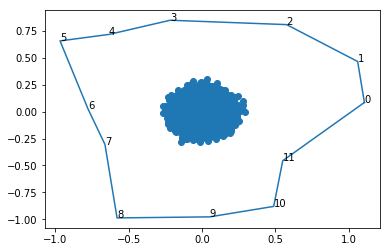

In [7]:
plot_contour(polygons[1])
plt.scatter(centers_of_mass[:,0],centers_of_mass[:,1])


In [59]:
from scipy.spatial import ConvexHull
points=centers_of_mass
hull=ConvexHull(points)
hull2=ConvexHull(coordinetes)

ValueError: setting an array element with a sequence.

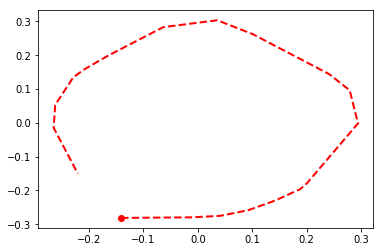

In [10]:
plt.plot(points[hull.vertices,0], points[hull.vertices,1], 'r--', lw=2)
plt.plot(points[hull.vertices[0],0], points[hull.vertices[0],1], 'ro')
plt.show()


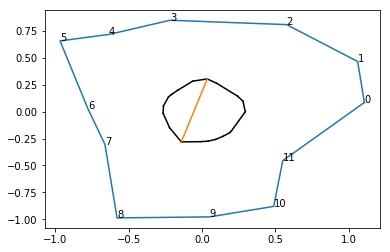

In [51]:
import matplotlib.pyplot as plt
#plt.plot(points[:,0], points[:,1], 'o')
for simplex in hull.simplices:
    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')
    
plot_contour(polygons[1])
plt.plot(maximum_distance_points[:,0],maximum_distance_points[:,1])

In [44]:
def max_element(A):
    r, (c, l) = max(map(lambda t: (t[0], max(enumerate(t[1]), key=lambda v: v[1])), enumerate(A)), key=lambda v: v[1][1])


In [45]:
distances=np.empty([convex_points.shape[0],convex_points.shape[0]])

In [46]:
for i,point_i in enumerate(convex_points):
    for j,point_j in enumerate(convex_points):
        distances[i][j]=np.linalg.norm(point_i-point_j)

In [47]:

def max_element(A):
    r, (c, l) = max(map(lambda t: (t[0], max(enumerate(t[1]), key=lambda v: v[1])), enumerate(A)), key=lambda v: v[1][1])
    return (l, r, c)

In [48]:
print(max_element(distances))

(0.6108970818704328, 0, 11)


In [49]:
maximum_distance_points=convex_points[[0,11]]

In [50]:
maximum_distance_points[:,0]

array([-0.14096254,  0.03573792])

In [40]:
convex_points[0]

array([[-0.14096254, -0.28119288],
       [-0.01221095, -0.27948367]])

In [42]:
hull.simplices[0]

array([39625, 44312], dtype=int32)

In [43]:
hull.vertices

array([39625, 44312, 46955, 43565, 23167, 51648,  2565, 35199, 57132,
       36752, 40669, 10554, 41878, 24238, 46331, 14240, 59998, 49449,
        6016], dtype=int32)

In [56]:
distances

array([[0.        , 0.12876294, 0.18186276, 0.2346043 , 0.28803067,
        0.34022975, 0.3563492 , 0.51766985, 0.56488395, 0.572125  ,
        0.59513715, 0.61089708, 0.56955435, 0.48088977, 0.44436804,
        0.42498017, 0.35559678, 0.29394538, 0.15357975],
       [0.12876294, 0.        , 0.05318997, 0.10683785, 0.16244909,
        0.2173296 , 0.23516914, 0.41405689, 0.47558579, 0.49380012,
        0.55377505, 0.58504288, 0.5649054 , 0.50230835, 0.47968357,
        0.46741069, 0.41607969, 0.36610945, 0.24546116],
       [0.18186276, 0.05318997, 0.        , 0.05435029, 0.11129925,
        0.16751133, 0.18630368, 0.37323741, 0.44138264, 0.46476403,
        0.54108039, 0.57871423, 0.56785815, 0.51683451, 0.49996913,
        0.49058265, 0.44670677, 0.40168965, 0.28991159],
       [0.2346043 , 0.10683785, 0.05435029, 0.        , 0.05757055,
        0.11447174, 0.13396626, 0.32693558, 0.40091906, 0.429178  ,
        0.52117047, 0.564912  , 0.56359452, 0.52493377, 0.51417177,
        0.507

In [2]:
polygons=load_dataset('15_polygons.pkl')

In [3]:
len(polygons)

1